In [1]:
from __future__ import print_function
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
from scipy import interpolate
from scipy import integrate
#from scipy.interpolate import griddata

In [ ]:
#initialize
x=np.linspace(-50,-80,500)
y=np.linspace(100,-30,500)
grid_x, grid_y = np.mgrid[-160:160:1000j, -160:160:1000j]
#from (0,0) to (30,60)
print("number of collective variables: ",x.shape)

n1 = len(x)
g1 = np.linspace(0,1,n1)
dx = x-np.roll(x,1)
dy = y-np.roll(y,1)
dx[0] = 0
dy[0] = 0
lxy = np.cumsum(np.sqrt(dx**2+dy**2))
lxy = lxy/lxy[-1]
fx = interpolate.interp1d(lxy,x)
xi = fx(g1)
fy = interpolate.interp1d(lxy,y)
yi = fy(g1)

#hyperparameters
nstepmax = 100000
h = 1e-1
tol1 = 1e-7
d=1e-5

#free energy landscape
k=1
T=1
x1 = np.load('after_dl_tsne_2d_s0.npy')
z = np.loadtxt("t")
#
#x1 = np.delete(x1,[14, 34, 77, 92, 96, 98, 134, 151, 155, 156, 163, 171, 216],axis=0)
#z = np.delete(z,[14, 34, 77, 92, 96, 98, 134, 151, 155, 156, 163, 171, 216],axis=0)

sum_z = np.sum(z)
z = z/sum_z
g = -k*T*np.log(z)
x2 = x1[4:,:]
Hfunc = interpolate.CloughTocher2DInterpolator(x2, g)
grid_z = Hfunc(grid_x, grid_y)

# Main loop
for nstep in range(nstepmax):

# calculation of the x and y-components of the force, dVx and dVy respectively
    dVx=(Hfunc(xi+d,yi)-Hfunc(xi-d,yi))/(2*d)
    dVy=(Hfunc(xi,yi+d)-Hfunc(xi,yi-d))/(2*d)
    print("dV: ", np.mean(np.sqrt(dVx**2+dVy**2)))

    x0 = xi
    y0 = yi

# string steps:
# 1. evolve
    xi = xi - h*dVx
    yi = yi - h*dVy

# 2. reparametrize  
    dx = xi-np.roll(xi,1)
    dy = yi-np.roll(yi,1)
    print("dl: ", np.mean(np.sqrt(dx**2+dy**2)))
    dx[0] = 0
    dy[0] = 0
    lxy = np.cumsum(np.sqrt(dx**2+dy**2))
    lxy = lxy/lxy[-1]

    fx = interpolate.interp1d(lxy,xi)
    xi=fx(g1)
    fy = interpolate.interp1d(lxy,yi)
    yi=fy(g1)

    tol = (np.linalg.norm(xi-x0)+np.linalg.norm(yi-y0))/n1;
    print("tol", tol)

    if tol <= tol1:
        break

number of collective variables:  (500L,)
dV:  0.07741328592504335
dl:  0.5336507887512171
tol 0.00045711649718273073
dV:  0.07739821867051876
dl:  0.5336360288123098
tol 0.0004591708936361188
dV:  0.07738290330389534
dl:  0.5336222462752923
tol 0.0004614357143659607
dV:  0.07736659267846746
dl:  0.5336094056649467
tol 0.00046385513295566823
dV:  0.07734956727462297
dl:  0.5335974700015393
tol 0.0004663954871405628
dV:  0.07733420855224615
dl:  0.5335863945115318
tol 0.0004690067448091386
dV:  0.07731844170883556
dl:  0.5335761421339611
tol 0.00047165500003170215
dV:  0.07730188043006286
dl:  0.5335666757384142
tol 0.00047432522339731675
dV:  0.07728474821181158
dl:  0.5335579631058599
tol 0.00047699169818391266
dV:  0.07726727935108073
dl:  0.5335499748861381
tol 0.0004796460995465563
dV:  0.07724922537339336
dl:  0.5335426850894053
tol 0.00048227980314240556
dV:  0.07723044916948704
dl:  0.5335360704630687
tol 0.00048488944058509603
dV:  0.07721110975035586
dl:  0.5335301104615872
tol

dV:  0.0676409827239209
dl:  0.5351034964692328
tol 0.0005086455334536679
dV:  0.06751285307680428
dl:  0.5351248372884843
tol 0.0005064947508063609
dV:  0.067384860160866
dl:  0.5351461578605049
tol 0.000504335967237836
dV:  0.0672567712643911
dl:  0.5351674583211868
tol 0.0005021800919762934
dV:  0.0671319067048243
dl:  0.5351887405274495
tol 0.0005000338997520038
dV:  0.067005566151651
dl:  0.5352099970173853
tol 0.0004978189841930423
dV:  0.06687872727703573
dl:  0.5352312251851019
tol 0.0004955880217022908
dV:  0.06675168913547336
dl:  0.5352524247344375
tol 0.0004933562373700619
dV:  0.06662321945735436
dl:  0.5352736009139893
tol 0.0004911421977416537
dV:  0.06649449434504714
dl:  0.5352947533230266
tol 0.0004889327587176823
dV:  0.06636666295510278
dl:  0.5353158802007753
tol 0.0004867293910482737
dV:  0.06623915876355516
dl:  0.5353369796957428
tol 0.0004845286865608939
dV:  0.06611161715125739
dl:  0.5353580517273688
tol 0.0004823302343323132
dV:  0.06598421860295262
dl:  0.5

tol 0.0003119407096338983
dV:  0.05394362219681627
dl:  0.537674456378922
tol 0.00031113162168571975
dV:  0.05387352306808489
dl:  0.5376946521698446
tol 0.0003102854762308891
dV:  0.053804432900087906
dl:  0.5377148589670631
tol 0.0003094340833063655
dV:  0.05373584672031571
dl:  0.5377350746188096
tol 0.0003085795578436041
dV:  0.05366776812869071
dl:  0.5377552934107449
tol 0.0003076886776068878
dV:  0.053599775018672434
dl:  0.5377755139652861
tol 0.0003067866392117149
dV:  0.05353187740219738
dl:  0.5377957273012899
tol 0.00030582553689231416
dV:  0.05346501286181115
dl:  0.5378159324707041
tol 0.00030486713625428266
dV:  0.05339872556516846
dl:  0.5378361292944233
tol 0.00030392143771337804
dV:  0.05333333548400931
dl:  0.5378563168708277
tol 0.0003029905333831518
dV:  0.05326821499290104
dl:  0.5378765168436723
tol 0.00030224555105038385
dV:  0.053202354518733855
dl:  0.537896726795305
tol 0.0003014658007181322
dV:  0.05313746147976506
dl:  0.5379169465667281
tol 0.0003006561713

tol 0.0002481804846056901
dV:  0.04888154549918439
dl:  0.539975721113214
tol 0.0002475298862939664
dV:  0.048851476469502844
dl:  0.5399966123299135
tol 0.0002468903081661159
dV:  0.048821554248425124
dl:  0.5400174838725977
tol 0.0002462623816350001
dV:  0.048791251721681764
dl:  0.5400383339021991
tol 0.0002456226029324784
dV:  0.04876108628245396
dl:  0.5400591625348011
tol 0.0002449823503263817
dV:  0.0487311893601381
dl:  0.5400799715967216
tol 0.00024435363040719964
dV:  0.04870154650079448
dl:  0.5401007631713046
tol 0.00024373911289980786
dV:  0.04867200867207616
dl:  0.5401215373243101
tol 0.000243130077947313
dV:  0.048642115922356746
dl:  0.5401422905335136
tol 0.0002425044100158345
dV:  0.048612619091909434
dl:  0.5401630236725304
tol 0.00024187691908068642
dV:  0.0485834192724309
dl:  0.5401837388797995
tol 0.00024126393973802494
dV:  0.04855447842512021
dl:  0.5402044384556327
tol 0.00024066754090752026
dV:  0.048526029271637565
dl:  0.5402251247193708
tol 0.000240087816

dV:  0.04627575250047284
dl:  0.5421341358625484
tol 0.00018011248922202738
dV:  0.04625753597633605
dl:  0.5421519964236052
tol 0.00017946563976984313
dV:  0.046239544839439345
dl:  0.5421698033608018
tol 0.0001788311440341609
dV:  0.04622171777993938
dl:  0.5421875583363185
tol 0.00017821129361632408
dV:  0.046204033390697036
dl:  0.5422052629128671
tol 0.0001776053902730134
dV:  0.0461864637613308
dl:  0.542222918707004
tol 0.00017701283936526988
dV:  0.04616898094621924
dl:  0.5422405274202658
tol 0.00017643328446759242
dV:  0.04615159027513491
dl:  0.5422580908348635
tol 0.00017586710673209478
dV:  0.046134339175876636
dl:  0.5422756109727629
tol 0.00017531555489830477
dV:  0.046117213730271306
dl:  0.5422930888383014
tol 0.00017478087056650065
dV:  0.04610006339997617
dl:  0.5423105253787972
tol 0.0001742604572084221
dV:  0.04608288422406417
dl:  0.5423279225182253
tol 0.00017375520009473754
dV:  0.04606575140043606
dl:  0.5423452828967876
tol 0.00017326583580832167
dV:  0.046048

dV:  0.04478195608218218
dl:  0.5440922819849064
tol 0.00015590104689393097
dV:  0.044772355088849636
dl:  0.5441099863499612
tol 0.0001558812055346343
dV:  0.04476281055453984
dl:  0.5441277014977379
tol 0.00015586598184151395
dV:  0.04475332152133391
dl:  0.5441454282445191
tol 0.00015585562480722472
dV:  0.044743859035887394
dl:  0.5441631671178576
tol 0.00015584736262077293
dV:  0.04473436724457436
dl:  0.5441809187701303
tol 0.00015584149728981205
dV:  0.044724867208744454
dl:  0.5441986838939891
tol 0.00015583853882683826
dV:  0.0447153991045045
dl:  0.5442164631032009
tol 0.00015583848166452925
dV:  0.04470598368358872
dl:  0.5442342571721844
tol 0.0001558416572363648
dV:  0.04469631949171473
dl:  0.5442520549888389
tol 0.0001558672681675135
dV:  0.04468663306276452
dl:  0.5442698490063747
tol 0.00015589770894471134
dV:  0.04467700519924307
dl:  0.5442876365446553
tol 0.00015592999666025348
dV:  0.044667529365410984
dl:  0.5443054176690614
tol 0.00015596804724924253
dV:  0.04465

dV:  0.043837042053229976
dl:  0.5463233869497727
tol 0.00017273782473791724
dV:  0.043829865090736136
dl:  0.5463440060353358
tol 0.00017282781796313187
dV:  0.043822702794881
dl:  0.5463646649985798
tol 0.00017291647024854167
dV:  0.043815195163950396
dl:  0.5463853585324633
tol 0.0001730035936405103
dV:  0.04380749624345876
dl:  0.5464060845493943
tol 0.00017308638634454848
dV:  0.04379979668810019
dl:  0.5464268442010382
tol 0.00017316679817696128
dV:  0.04379209174011366
dl:  0.5464476381839891
tol 0.0001732471897745586
dV:  0.043784379536645816
dl:  0.5464684669508029
tol 0.0001733272102343616
dV:  0.04377656736976773
dl:  0.5464893304882866
tol 0.00017340279241842064
dV:  0.04376874015368529
dl:  0.5465102299818354
tol 0.0001734763201407755
dV:  0.04376072412605872
dl:  0.5465311651267079
tol 0.0001735403883545846
dV:  0.043752171183334625
dl:  0.5465521348097745
tol 0.00017358185883621378
dV:  0.04374362242286016
dl:  0.5465731397834561
tol 0.00017362158059627128
dV:  0.0437350

dV:  0.042814992517099866
dl:  0.549158977394127
tol 0.00018351111777779595
dV:  0.0428079577941265
dl:  0.5491815062810166
tol 0.00018356478557172016
dV:  0.04280087021657723
dl:  0.5492040683163336
tol 0.00018361821302384656
dV:  0.04279347741654354
dl:  0.5492266603726771
tol 0.000183667052171023
dV:  0.04278606153260033
dl:  0.5492492838616074
tol 0.000183712816502972
dV:  0.04277864802694032
dl:  0.5492719398042973
tol 0.00018375942100607646
dV:  0.042771100313687534
dl:  0.549294627709871
tol 0.0001838045817684209
dV:  0.04276315730672947
dl:  0.5493173464430756
tol 0.00018384236961129313
dV:  0.04275520616397321
dl:  0.5493400980462094
tol 0.000183877273094755
dV:  0.04274733769581022
dl:  0.5493628845320877
tol 0.00018392018564402084
dV:  0.042739403558402396
dl:  0.54938570616113
tol 0.00018396037802451335
dV:  0.042731351362163744
dl:  0.5494085644390111
tol 0.0001839967824299407
dV:  0.042723445986537614
dl:  0.5494314606399328
tol 0.00018403205170078806
dV:  0.0427155005371

dV:  0.04196304731214384
dl:  0.5521204927993199
tol 0.00022492804141581853
dV:  0.041958610950573245
dl:  0.552142515593569
tol 0.0002254366116527441
dV:  0.04195412582189347
dl:  0.552164509741145
tol 0.00022593856541777387
dV:  0.04194959304213228
dl:  0.5521864771777707
tol 0.0002264339118597588
dV:  0.04194497328640615
dl:  0.552208419891002
tol 0.0002269222153370799
dV:  0.041939970355659835
dl:  0.5522303379007232
tol 0.0002273961840324457
dV:  0.04193513805489302
dl:  0.5522522319727129
tol 0.00022785617347085728
dV:  0.04193015925837462
dl:  0.5522741017277945
tol 0.00022831060490953453
dV:  0.04192509056532433
dl:  0.5522959459552526
tol 0.0002287470884404404
dV:  0.041920009038693376
dl:  0.5523177669857348
tol 0.00022916928485738975
dV:  0.041914889987286034
dl:  0.5523395666114645
tol 0.00022958274896087928
dV:  0.041909739095614705
dl:  0.5523613459365959
tol 0.00022998839963102007
dV:  0.04190465552239243
dl:  0.552383095204312
tol 0.00023046950458844895
dV:  0.041899245

tol 0.0002922311817219292
dV:  0.041340664402391106
dl:  0.5546004939091322
tol 0.00029259475674334325
dV:  0.04133517500812913
dl:  0.5546156040429568
tol 0.00029305127432750853
dV:  0.041328161599323496
dl:  0.5546306261723712
tol 0.0002935266818000052
dV:  0.04132068755376524
dl:  0.5546455635067887
tol 0.0002939817083856798
dV:  0.04131316028550081
dl:  0.5546604195240673
tol 0.00029442305721198275
dV:  0.04130463282835393
dl:  0.5546751922424912
tol 0.00029490876733809435
dV:  0.04129539318008408
dl:  0.5546898811383304
tol 0.00029541184426163834
dV:  0.04129122178008325
dl:  0.5547044894697856
tol 0.00029589945116881994
dV:  0.04129023056560407
dl:  0.5547190174242701
tol 0.0002963495333510368
dV:  0.04128832969461822
dl:  0.5547334571889422
tol 0.0002967738665581771
dV:  0.041284993407420825
dl:  0.5547478003473959
tol 0.0002972309179399198
dV:  0.04128130992015099
dl:  0.5547620466811152
tol 0.000297697636494579
dV:  0.041277602763388384
dl:  0.5547761961880483
tol 0.0002981939

dV:  0.040688187616692295
dl:  0.5556932338407842
tol 0.00030811448967991707
dV:  0.04068449506933615
dl:  0.5556988630625722
tol 0.0003078616336859964
dV:  0.04067958114467689
dl:  0.5557044165402851
tol 0.000307710492501898
dV:  0.04067273002742008
dl:  0.5557098844823795
tol 0.00030755756074945395
dV:  0.04066470512939862
dl:  0.5557152640255405
tol 0.0003073782519835507
dV:  0.04065646215847939
dl:  0.5557205607002629
tol 0.00030716591988118124
dV:  0.040647555962060086
dl:  0.5557257730283446
tol 0.0003069152004072659
dV:  0.04063864015042681
dl:  0.5557309047297544
tol 0.00030665311851484046
dV:  0.04062901003538329
dl:  0.5557359618666002
tol 0.00030636084348573995
dV:  0.040619389367955366
dl:  0.5557409506703912
tol 0.00030604640165398777
dV:  0.04060988331613885
dl:  0.5557458763975659
tol 0.00030572129994574165
dV:  0.04060043034771869
dl:  0.5557507440117636
tol 0.0003053838794112525
dV:  0.04059104211724214
dl:  0.5557555589271803
tol 0.0003050286237847154
dV:  0.040581941

tol 0.00027507551321711616
dV:  0.039926338190556174
dl:  0.5560214453062299
tol 0.0002749254448020724
dV:  0.039920178683315224
dl:  0.5560210970801915
tol 0.00027477892027044735
dV:  0.03991402154949527
dl:  0.5560206740940665
tol 0.0002746370599033124
dV:  0.03990813912243347
dl:  0.5560201801871989
tol 0.0002744772049104358
dV:  0.03990259186679972
dl:  0.5560196195768402
tol 0.0002742980711998664
dV:  0.03989686180026315
dl:  0.5560189950898108
tol 0.0002741061322263744
dV:  0.03989058610760364
dl:  0.5560183107650954
tol 0.0002738859987643645
dV:  0.0398843624073518
dl:  0.556017570969679
tol 0.00027364955606476346
dV:  0.03987875795005135
dl:  0.5560167750338514
tol 0.00027341080236613867
dV:  0.03987335870467338
dl:  0.556015925998195
tol 0.00027315257833393334
dV:  0.03986792416815782
dl:  0.5560150282320967
tol 0.00027288106341573283
dV:  0.03986256896951669
dl:  0.556014085485743
tol 0.0002726048188222308
dV:  0.03985753267854827
dl:  0.5560131005347021
tol 0.000272331060445

tol 0.0002569491124272697
dV:  0.0393482249092734
dl:  0.5556655105737066
tol 0.00025700374577737107
dV:  0.039345543846956446
dl:  0.5556601152507199
tol 0.0002570491636237438
dV:  0.03934256346656156
dl:  0.5556546435365143
tol 0.00025709815327400653
dV:  0.039338770791695565
dl:  0.5556490926075408
tol 0.0002571783271552289
dV:  0.039335435773304624
dl:  0.555643466225509
tol 0.00025722371903965914
dV:  0.039331928411507774
dl:  0.5556377679254376
tol 0.00025726423926907005
dV:  0.039327767297967386
dl:  0.5556320019979943
tol 0.00025727970252464546
dV:  0.03932363401345545
dl:  0.5556261720864059
tol 0.00025728042045241917
dV:  0.03931955209806739
dl:  0.5556202809321623
tol 0.00025727258657124553
dV:  0.039315319803965944
dl:  0.5556143313926128
tol 0.0002572439844814459
dV:  0.03931061989346169
dl:  0.5556083224134759
tol 0.0002571758660378377
dV:  0.03930597697065693
dl:  0.5556022559029601
tol 0.00025709336375396875
dV:  0.03930084154459247
dl:  0.5555961331916549
tol 0.0002570

tol 0.0002550403472182001
dV:  0.0389371157525011
dl:  0.5547835099490598
tol 0.00025515346781021677
dV:  0.038935327651252814
dl:  0.5547738094423044
tol 0.00025526496125853664
dV:  0.038933490536807974
dl:  0.5547640822188672
tol 0.000255374776278613
dV:  0.03893162039940759
dl:  0.5547543299910489
tol 0.0002554816417618481
dV:  0.03892960580156212
dl:  0.5547445540842938
tol 0.0002555825332682822
dV:  0.0389275776871258
dl:  0.5547347561129884
tol 0.0002556817812334349
dV:  0.038925459539448815
dl:  0.5547249369816354
tol 0.0002557872144487067
dV:  0.03892317835682149
dl:  0.5547150975354472
tol 0.00025590069732237496
dV:  0.03892061237619094
dl:  0.5547052410735546
tol 0.00025599848537775433
dV:  0.03891809727384648
dl:  0.55469536974365
tol 0.0002560921441814686
dV:  0.03891691169023506
dl:  0.5546854849475713
tol 0.0002561802660729164
dV:  0.0389153444732141
dl:  0.5546755869237069
tol 0.00025625884141020663
dV:  0.03891363366537127
dl:  0.5546656763157739
tol 0.00025632537441496

dV:  0.03856477168468301
dl:  0.553249641789022
tol 0.00027078470739268413
dV:  0.03856178602643124
dl:  0.553234624901595
tol 0.00027089005995531917
dV:  0.03855877943590511
dl:  0.5532195694838964
tol 0.00027099458064756707
dV:  0.038555750133149255
dl:  0.5532044777291412
tol 0.00027109849747957175
dV:  0.038552597558712806
dl:  0.5531893491301008
tol 0.00027124126136657576
dV:  0.0385488080577301
dl:  0.5531741822187859
tol 0.0002714196757894914
dV:  0.03854656783024921
dl:  0.5531589739754802
tol 0.00027161798617465895
dV:  0.03854477402875988
dl:  0.5531437184669629
tol 0.00027187335981611983
dV:  0.038544020892790624
dl:  0.5531284136868189
tol 0.0002721285143518778
dV:  0.03854334500394343
dl:  0.5531130610810295
tol 0.00027237963071219027
dV:  0.038542602264115565
dl:  0.55309766239156
tol 0.00027263178870071326
dV:  0.0385421428606395
dl:  0.5530821930154
tol 0.00027306323230537284
dV:  0.03854140802839225
dl:  0.5530666421511058
tol 0.0002734692625949277
dV:  0.0385399517017

dV:  0.03821629187786846
dl:  0.55086316215028
tol 0.0003069704650117889
dV:  0.03821349117413891
dl:  0.5508411119775428
tol 0.0003072840616186728
dV:  0.03820970809330679
dl:  0.5508189864883282
tol 0.00030759335817804814
dV:  0.03820391099484428
dl:  0.550796787476705
tol 0.00030789526089148174
dV:  0.038197766744069384
dl:  0.5507745174993106
tol 0.0003081834929160017
dV:  0.03819146412068953
dl:  0.5507521792476346
tol 0.00030845938890424764
dV:  0.03818504723689621
dl:  0.5507297762607799
tol 0.0003087245651084636
dV:  0.03817837093159882
dl:  0.5507073113210593
tol 0.000308994543946682
dV:  0.038171035140048874
dl:  0.5506847777960834
tol 0.0003093764679837189
dV:  0.03816401178541948
dl:  0.550662165791468
tol 0.0003098550410878043
dV:  0.03815700040388998
dl:  0.5506394776045893
tol 0.0003102843420952386
dV:  0.03814924656295773
dl:  0.550616721076496
tol 0.000310665682006251
dV:  0.03814123387387307
dl:  0.5505939021126559
tol 0.0003110240206399899
dV:  0.038132744998216665
d

dV:  0.037845198508259854
dl:  0.5482394231036991
tol 0.0003185727199140448
dV:  0.037838183208167495
dl:  0.5482150194985407
tol 0.00031841054870642506
dV:  0.03783099012615132
dl:  0.5481906520104443
tol 0.0003182525001807098
dV:  0.03782398219826399
dl:  0.5481663241849267
tol 0.00031807210612264515
dV:  0.037818560605350625
dl:  0.5481420407821406
tol 0.0003178681632749797
dV:  0.03781994597059451
dl:  0.5481178062878753
tol 0.0003176445103823715
dV:  0.03782121952422432
dl:  0.5480936246234345
tol 0.0003173937461786429
dV:  0.03782185147417289
dl:  0.5480694902551868
tol 0.0003171061212885575
dV:  0.03782345291463862
dl:  0.5480453987942301
tol 0.0003167616053535384
dV:  0.03782387129926456
dl:  0.5480213353593103
tol 0.00031646541535868504
dV:  0.03782418570106894
dl:  0.5479973015152885
tol 0.00031609788381115603
dV:  0.03782393343858864
dl:  0.547973302234796
tol 0.00031569313058025877
dV:  0.03782411934664041
dl:  0.5479493267783755
tol 0.0003154068534392113
dV:  0.03782384937

dV:  0.0374583639400638
dl:  0.5452142983702638
tol 0.00029035498922558436
dV:  0.03745394089300517
dl:  0.5451923579465545
tol 0.00029042822303242686
dV:  0.03744957050302844
dl:  0.5451704041722656
tol 0.000290485242691961
dV:  0.03744457078353086
dl:  0.5451484410864025
tol 0.00029052641465526167
dV:  0.03743915875778823
dl:  0.545126472989735
tol 0.0002905534327778181
dV:  0.03743417509647899
dl:  0.5451045009627503
tol 0.0002906032981120724
dV:  0.037431202295291864
dl:  0.5450825244682781
tol 0.00029067401929551965
dV:  0.03742835483307448
dl:  0.5450605444039861
tol 0.0002907459278326376
dV:  0.03742543342638493
dl:  0.5450385563329032
tol 0.00029078080784164105
dV:  0.03742206311817233
dl:  0.5450165602470767
tol 0.000290771791185695
dV:  0.03741913913720786
dl:  0.54499455766853
tol 0.00029073362815828157
dV:  0.037416322281179824
dl:  0.5449725435239484
tol 0.00029065273258721037
dV:  0.03741370733837449
dl:  0.5449505187473193
tol 0.00029053349863727155
dV:  0.03741131206591

dV:  0.03708610156884213
dl:  0.5424997838804447
tol 0.00026557376273018203
dV:  0.03708376297167795
dl:  0.5424792125500761
tol 0.0002652441569277897
dV:  0.03708173950408212
dl:  0.5424586834410491
tol 0.0002649032332546153
dV:  0.03707967464878616
dl:  0.5424381992415018
tol 0.00026454197492957145
dV:  0.03707753282676991
dl:  0.5424177633944326
tol 0.00026416178290149516
dV:  0.037075175219729604
dl:  0.5423973795334874
tol 0.00026376518081989655
dV:  0.03707150395627004
dl:  0.5423770343592786
tol 0.00026356356772696795
dV:  0.03706791599937331
dl:  0.5423567160392391
tol 0.00026342729195767423
dV:  0.03706425531031962
dl:  0.5423364241390841
tol 0.0002632775793272514
dV:  0.03706055773109249
dl:  0.542316163224254
tol 0.0002631070601325557
dV:  0.03705619087621016
dl:  0.5422959377508065
tol 0.00026291224675872236
dV:  0.03705030399035941
dl:  0.5422757518196579
tol 0.0002626922756748032
dV:  0.03704447671638431
dl:  0.5422556105292495
tol 0.0002624453072630557
dV:  0.03703950733

tol 0.0002388911684633756
dV:  0.036731683661813175
dl:  0.539966831289901
tol 0.00023849916073090554
dV:  0.03672921929500011
dl:  0.5399483310384539
tol 0.00023813946670393776
dV:  0.036726696828395744
dl:  0.539929869309659
tol 0.00023777191396524036
dV:  0.03672414937393012
dl:  0.5399114495357105
tol 0.00023738654444755664
dV:  0.03672158520090466
dl:  0.5398930758277936
tol 0.00023698568947390535
dV:  0.03671938370436673
dl:  0.5398747399524539
tol 0.0002366770852080984
dV:  0.03671761033788647
dl:  0.5398564304523975
tol 0.0002364020612768667
dV:  0.03671611430670147
dl:  0.5398381437268014
tol 0.0002361165608810219
dV:  0.03671426157220709
dl:  0.5398198801897854
tol 0.0002358304236121803
dV:  0.03671164823081839
dl:  0.5398016404218313
tol 0.00023554775384190796
dV:  0.036709453540405876
dl:  0.5397834247822432
tol 0.00023526943437914715
dV:  0.03670748995220991
dl:  0.539765233024151
tol 0.0002350047223234954
dV:  0.03670553241358593
dl:  0.5397470651302049
tol 0.000234745492

dl:  0.5378649878562156
tol 0.00021328711089553065
dV:  0.036433854694319395
dl:  0.5378479493346451
tol 0.00021310993573948477
dV:  0.036430136072579326
dl:  0.5378309247882556
tol 0.00021292020629967972
dV:  0.036426369814460444
dl:  0.537813917265558
tol 0.00021272098142124856
dV:  0.03642257809281746
dl:  0.5377969298464645
tol 0.00021250936653953418
dV:  0.03641875802373848
dl:  0.537779965719042
tol 0.00021228530272145727
dV:  0.03641493431518168
dl:  0.5377630267047453
tol 0.0002120529931797366
dV:  0.036410913982208144
dl:  0.5377461133221377
tol 0.00021181195658151851
dV:  0.036406691381483884
dl:  0.5377292256220187
tol 0.00021156069675876108
dV:  0.0364025370702845
dl:  0.5377123654353324
tol 0.00021129359221381134
dV:  0.036400421749011355
dl:  0.5376955358834445
tol 0.00021101450341521157
dV:  0.036398330814012225
dl:  0.5376787374191313
tol 0.00021074010012202176
dV:  0.0363961108849895
dl:  0.5376619710769714
tol 0.00021045888410454964
dV:  0.03639363957027613
dl:  0.537

dV:  0.03619511996261677
dl:  0.5361294245205936
tol 0.00018615635409024547
dV:  0.03619333246175911
dl:  0.5361148091269611
tol 0.0001858552563560209
dV:  0.03619161556197135
dl:  0.5361002269786427
tol 0.00018555549451472003
dV:  0.03618994565278317
dl:  0.5360856780290707
tol 0.00018525461087130814
dV:  0.036187999282747824
dl:  0.5360711557002067
tol 0.0001850418850867413
dV:  0.03618580531146452
dl:  0.5360566482667203
tol 0.0001849114296913591
dV:  0.036183660443872924
dl:  0.5360421525442164
tol 0.00018474865541857693
dV:  0.0361814926130977
dl:  0.5360276701860177
tol 0.0001845766220777419
dV:  0.03617934056888569
dl:  0.5360132025377375
tol 0.00018440246225094676
dV:  0.0361768015517842
dl:  0.5359987502791267
tol 0.0001842243778760323
dV:  0.03617353210772863
dl:  0.5359843139981482
tol 0.00018404155994137823
dV:  0.03617021600948151
dl:  0.5359698946550502
tol 0.00018385189860496264
dV:  0.03616641670001537
dl:  0.5359554935316082
tol 0.00018365602987220343
dV:  0.0361626367

dV:  0.03591210358666426
dl:  0.5344282519793305
tol 0.000153651381147966
dV:  0.03590770284873645
dl:  0.5344162827132062
tol 0.00015340856047241485
dV:  0.03590329588879634
dl:  0.5344043287124751
tol 0.0001531917427872556
dV:  0.035900484805686625
dl:  0.5343923820582566
tol 0.0001530324028192661
dV:  0.035899336178553044
dl:  0.5343804372054191
tol 0.00015286722323668722
dV:  0.03589817248203784
dl:  0.5343684954401235
tol 0.00015268160205093872
dV:  0.03589696593647207
dl:  0.5343565594727288
tol 0.0001524895960673563
dV:  0.03589573633649233
dl:  0.5343446313783818
tol 0.0001522911961941906
dV:  0.035894491329099026
dl:  0.5343327131007864
tol 0.00015208509079036935
dV:  0.0358932486500356
dl:  0.5343208070565775
tol 0.00015186833071279294
dV:  0.03589202995104365
dl:  0.5343089159646038
tol 0.0001516414148479342
dV:  0.035890837796160945
dl:  0.5342970423097537
tol 0.00015140681828833207
dV:  0.03588963013153795
dl:  0.5342851881177463
tol 0.00015116589571565058
dV:  0.035888246

dV:  0.035729020535698736
dl:  0.5332515238317642
tol 0.00012716016077822198
dV:  0.035726584519536586
dl:  0.5332420158324316
tol 0.0001270050020124157
dV:  0.0357241342014612
dl:  0.533232515818176
tol 0.00012682843949391134
dV:  0.0357216683979028
dl:  0.5332230257809376
tol 0.00012664617617548005
dV:  0.035719187547213836
dl:  0.5332135473808953
tol 0.0001264637163466421
dV:  0.03571672822076489
dl:  0.5332040823682376
tol 0.00012627757787271298
dV:  0.035714250318114066
dl:  0.5331946319794978
tol 0.00012609014781685897
dV:  0.03571175322193689
dl:  0.5331851972631981
tol 0.00012589924546762337
dV:  0.03570923736151926
dl:  0.5331757793511561
tol 0.00012570480424941696
dV:  0.03570670170893081
dl:  0.5331663794046348
tol 0.00012550712068096597
dV:  0.03570414552397214
dl:  0.5331569985641592
tol 0.00012530620599902312
dV:  0.03570115735518018
dl:  0.5331476363067409
tol 0.00012511416701333698
dV:  0.035697978098486516
dl:  0.5331382924196598
tol 0.00012491410730175388
dV:  0.03569

dV:  0.03553019787395327
dl:  0.5319638426362007
tol 0.00012468095633461716
dV:  0.03552982254414127
dl:  0.5319526469316908
tol 0.00012466300108919388
dV:  0.03552897541705701
dl:  0.5319414490119043
tol 0.00012464368923120224
dV:  0.03552749847596185
dl:  0.5319302494843778
tol 0.00012461364807224586
dV:  0.03552601765973029
dl:  0.5319190493958824
tol 0.00012457800862944067
dV:  0.03552453987308479
dl:  0.5319078500099225
tol 0.00012454130911235652
dV:  0.035523060171996426
dl:  0.5318966523992514
tol 0.00012450337021517702
dV:  0.03552158996076796
dl:  0.5318854572190218
tol 0.00012446313905256474
dV:  0.0355200790196204
dl:  0.5318742645005036
tol 0.00012441674414926345
dV:  0.03551858705557971
dl:  0.5318630751844551
tol 0.00012436594777367568
dV:  0.035517119215658186
dl:  0.5318518904546289
tol 0.00012431460535554248
dV:  0.03551563921721548
dl:  0.531840711355163
tol 0.00012426214704626837
dV:  0.03551414637307812
dl:  0.5318295388996792
tol 0.00012420812031029298
dV:  0.03551

dV:  0.035362394702453316
dl:  0.5305190961309104
tol 0.00011249685597500873
dV:  0.03536188471750802
dl:  0.5305070060298859
tol 0.0001120451501034078
dV:  0.03536140468324407
dl:  0.5304948795717851
tol 0.00011158764755543834
dV:  0.03536098288917893
dl:  0.5304827165656019
tol 0.00011112525933313195
dV:  0.035360659279582984
dl:  0.5304705170411989
tol 0.00011065810315172689
dV:  0.03536027913220768
dl:  0.5304582794893136
tol 0.00011019187984245408
dV:  0.035359855555960454
dl:  0.5304460077956864
tol 0.00010968463070960316
dV:  0.035359425736457326
dl:  0.5304337077962163
tol 0.00010912960971831471
dV:  0.03535900837487168
dl:  0.5304213818326654
tol 0.00010856331835840187
dV:  0.035358602154335186
dl:  0.530409028496837
tol 0.00010798460594613592
dV:  0.03535820886022998
dl:  0.530396648947267
tol 0.0001074140713067405
dV:  0.03535795455943926
dl:  0.5303842414265254
tol 0.0001068384663151165
dV:  0.03535776744847874
dl:  0.5303718060594013
tol 0.00010626822359715665
dV:  0.03535

dV:  0.03525157814906953
dl:  0.5289806707323207
tol 9.100876400117563e-05
dV:  0.035250583080352865
dl:  0.5289690867537863
tol 9.091146430198951e-05
dV:  0.03524959434649522
dl:  0.5289575136359373
tol 9.081480873954331e-05
dV:  0.0352486120298088
dl:  0.5289459513809392
tol 9.072037955561847e-05
dV:  0.03524761638005337
dl:  0.528934400709345
tol 9.06314484809312e-05
dV:  0.03524659160364742
dl:  0.5289228619109311
tol 9.05467292537381e-05
dV:  0.03524555931817215
dl:  0.5289113349517195
tol 9.046542296567409e-05
dV:  0.03524453178632289
dl:  0.5288998198408312
tol 9.038730844928197e-05
dV:  0.03524350845782231
dl:  0.5288883166516131
tol 9.031277740373519e-05
dV:  0.035242488765572726
dl:  0.5288768254826914
tol 9.02421397619656e-05
dV:  0.03524148941579195
dl:  0.5288653464418243
tol 9.01755978233483e-05
dV:  0.03524062805001835
dl:  0.528853876910181
tol 9.012370871533753e-05
dV:  0.035239882818568435
dl:  0.5288424109263852
tol 9.009443880390567e-05
dV:  0.03523914025329261
dl: 

dl:  0.5275267327501474
tol 8.21243027027181e-05
dV:  0.03516172812308966
dl:  0.5275118469981908
tol 8.217098967209615e-05
dV:  0.035161221022152925
dl:  0.5274969346245432
tol 8.22211778264259e-05
dV:  0.03516072014705583
dl:  0.5274819964561962
tol 8.227408771054678e-05
dV:  0.035160225765486726
dl:  0.5274670322649448
tol 8.232611904704944e-05
dV:  0.035159724799602755
dl:  0.527452043069425
tol 8.238051033367558e-05
dV:  0.03515919098658517
dl:  0.527437029356719
tol 8.243661963378807e-05
dV:  0.035158663217060314
dl:  0.5274219925429964
tol 8.249424731114147e-05
dV:  0.035158141470772265
dl:  0.5274069337009579
tol 8.255306998146067e-05
dV:  0.035157625839205425
dl:  0.527391853653243
tol 8.261204412238772e-05
dV:  0.03515711633051849
dl:  0.527376753546968
tol 8.267187862778538e-05
dV:  0.0351566129204926
dl:  0.5273616344499944
tol 8.273249510579793e-05
dV:  0.03515610457390708
dl:  0.5273464975031265
tol 8.279281480740743e-05
dV:  0.0351555660194827
dl:  0.5273313442612436
tol

tol 8.902548424686697e-05
dV:  0.035115209400295694
dl:  0.5257600539522771
tol 8.913188394282109e-05
dV:  0.03511443403377943
dl:  0.5257452314877695
tol 8.924207392006111e-05
dV:  0.03511366317310296
dl:  0.525730414444479
tol 8.935596158639772e-05
dV:  0.03511289687504411
dl:  0.525715603046283
tol 8.947351581542756e-05
dV:  0.035112138709134995
dl:  0.525700797298175
tol 8.959499296577614e-05
dV:  0.035111484645271314
dl:  0.5256859969990666
tol 8.972331594812974e-05
dV:  0.035110848834596704
dl:  0.5256712022276979
tol 8.985809762770248e-05
dV:  0.03511021005602544
dl:  0.5256564131488053
tol 8.999798902633144e-05
dV:  0.03510953304372613
dl:  0.52564163091407
tol 9.0136351972861e-05
dV:  0.0351088617303635
dl:  0.5256268575326173
tol 9.026742284861117e-05
dV:  0.03510816093340253
dl:  0.5256120936272968
tol 9.040068217386652e-05
dV:  0.03510721291763903
dl:  0.5255973396799505
tol 9.053619282745695e-05
dV:  0.035106242179322254
dl:  0.5255825962452529
tol 9.067436619201403e-05
dV

dl:  0.5240591760330797
tol 0.00010060998488855167
dV:  0.03506424817662808
dl:  0.5240433804219548
tol 0.00010071589702570251
dV:  0.035063898470915136
dl:  0.5240275577958201
tol 0.00010083050260762382
dV:  0.035063558268641284
dl:  0.5240117079953632
tol 0.00010095343070524861
dV:  0.03506318625638224
dl:  0.5239958299264121
tol 0.00010107833211074819
dV:  0.035062861063011166
dl:  0.5239799233801898
tol 0.00010120032151399328
dV:  0.03506259349871481
dl:  0.5239639897164209
tol 0.00010132088034737722
dV:  0.035062334296615115
dl:  0.5239480300911946
tol 0.00010144149074654913
dV:  0.03506208299063532
dl:  0.5239320454441387
tol 0.00010156360766359777
dV:  0.03506183310459426
dl:  0.5239160365206653
tol 0.00010168777952728147
dV:  0.03506158799337162
dl:  0.5239000040206775
tol 0.00010181416640259739
dV:  0.035061339837303404
dl:  0.5238839486498226
tol 0.00010194265777039346
dV:  0.0350610592250001
dl:  0.5238678711147379
tol 0.0001020731139342728
dV:  0.03506078554607011
dl:  0.52

dV:  0.035014185376111784
dl:  0.522084773909614
tol 0.00011642490590750721
dV:  0.03501373595726449
dl:  0.5220699042318425
tol 0.00011655231654225467
dV:  0.035013195244274015
dl:  0.5220550034549561
tol 0.00011670059268518934
dV:  0.03501265299100729
dl:  0.5220400686132652
tol 0.00011686844273910137
dV:  0.03501210206519339
dl:  0.5220250971258945
tol 0.00011705386101828649
dV:  0.03501155001656678
dl:  0.5220100869973038
tol 0.00011725341648385509
dV:  0.035010997501279756
dl:  0.5219950366998891
tol 0.00011746513167950454
dV:  0.03501044444544318
dl:  0.521979944952818
tol 0.00011768842491546661
dV:  0.035009819633519824
dl:  0.5219648101940423
tol 0.00011792707206321776
dV:  0.03500906800814043
dl:  0.521949631459526
tol 0.00011817519083636342
dV:  0.035008306426383584
dl:  0.5219344107961588
tol 0.00011840685590184319
dV:  0.035007508504353975
dl:  0.5219191499545504
tol 0.00011863331424513324
dV:  0.03500663503203962
dl:  0.5219038491236277
tol 0.00011886662362948319
dV:  0.03

dl:  0.5198908765048125
tol 0.0001277919968217499
dV:  0.034979362354280424
dl:  0.5198750513561852
tol 0.000127825631882254
dV:  0.03497910145109683
dl:  0.5198591803573563
tol 0.00012786205775943413
dV:  0.034978852712904254
dl:  0.5198432620971887
tol 0.00012790154092926048
dV:  0.03497861542731222
dl:  0.5198272952246236
tol 0.00012794462447184515
dV:  0.03497838946925203
dl:  0.5198112784578195
tol 0.00012799145809827767
dV:  0.03497817468607985
dl:  0.5197952106127186
tol 0.00012804200382737706
dV:  0.03497798199177791
dl:  0.5197790908832343
tol 0.00012809728661879367
dV:  0.03497782204875924
dl:  0.5197629187323908
tol 0.00012815905525922748
dV:  0.034977672997040285
dl:  0.5197466930649415
tol 0.00012822592500911234
dV:  0.034977534053415124
dl:  0.5197304130444097
tol 0.00012829646658096396
dV:  0.034977399965263944
dl:  0.5197140780894646
tol 0.00012836991384423407
dV:  0.03497727661967373
dl:  0.5196976878123665
tol 0.00012844619824744225
dV:  0.034977163940046394
dl:  0.51

dl:  0.5180449064352235
tol 0.00013556217832663795
dV:  0.03492958068511652
dl:  0.5180288734440128
tol 0.00013567824306326355
dV:  0.03492865454486404
dl:  0.5180128299456862
tol 0.00013579483155590428
dV:  0.03492775684021312
dl:  0.5179967731676159
tol 0.0001359154083133845
dV:  0.03492686258209277
dl:  0.5179807004321048
tol 0.00013603986131293283
dV:  0.034925971679691824
dl:  0.5179646091504393
tol 0.0001361684060531562
dV:  0.034925058863181965
dl:  0.5179484967698175
tol 0.00013630133670174287
dV:  0.03492402331733956
dl:  0.5179323591045902
tol 0.0001364438174276173
dV:  0.03492299037024666
dl:  0.5179161937443069
tol 0.00013658840272540623
dV:  0.03492196094835008
dl:  0.5178999989122723
tol 0.00013673483167569528
dV:  0.03492093497342677
dl:  0.5178837727102972
tol 0.00013688526330963758
dV:  0.034919965159780526
dl:  0.5178675130416195
tol 0.0001370406934463275
dV:  0.034919613138930314
dl:  0.5178512176325246
tol 0.00013720258828674306
dV:  0.03491928732305709
dl:  0.51783

dV:  0.034861926527431274
dl:  0.5161414848820239
tol 0.00015404403116962674
dV:  0.03486204139346775
dl:  0.5161250918898084
tol 0.00015424620637403784
dV:  0.03486220438506024
dl:  0.5161086820869359
tol 0.00015445322760126228
dV:  0.034862407351687996
dl:  0.5160922527012973
tol 0.00015466487958762213
dV:  0.0348626567572999
dl:  0.5160758010069587
tol 0.0001548813708132799
dV:  0.03486306275113252
dl:  0.5160593241301588
tol 0.0001551057774185532
dV:  0.03486349254551258
dl:  0.5160428191199987
tol 0.00015533812261220236
dV:  0.03486394277143589
dl:  0.5160262831065436
tol 0.00015557781557671148
dV:  0.03486441068118561
dl:  0.5160097133729149
tol 0.00015582423102984374
dV:  0.03486489398881076
dl:  0.5159931073511898
tol 0.0001560769909535601
dV:  0.03486545395677449
dl:  0.5159764617896119
tol 0.00015633163950217596
dV:  0.034866104759767445
dl:  0.5159597734870892
tol 0.00015658369328870315
dV:  0.03486669580543322
dl:  0.5159430406316495
tol 0.00015683587178876908
dV:  0.034868

dV:  0.034822103032758456
dl:  0.5141602790487764
tol 0.0001590484758641547
dV:  0.03482088941489642
dl:  0.5141426934031331
tol 0.00015921559589654477
dV:  0.03481968056908636
dl:  0.5141250645763786
tol 0.00015938493939241538
dV:  0.034818477161849985
dl:  0.5141073909879765
tol 0.00015955933259840293
dV:  0.03481786547565876
dl:  0.5140896708986181
tol 0.0001597379534059592
dV:  0.03481749670260764
dl:  0.5140719029297661
tol 0.00015992076784804077
dV:  0.03481709099300784
dl:  0.5140540859339029
tol 0.00016010550127714543
dV:  0.03481655147959813
dl:  0.5140362184181927
tol 0.00016029731512879426
dV:  0.034815986477960637
dl:  0.5140182993310809
tol 0.0001604930232564269
dV:  0.034815471705546115
dl:  0.5140003279310718
tol 0.0001606922636587542
dV:  0.03481488277519486
dl:  0.5139823024886653
tol 0.0001609155431026209
dV:  0.034814352901955656
dl:  0.5139642188068662
tol 0.00016114629129296626
dV:  0.03481399809064748
dl:  0.5139460751696346
tol 0.00016138153813863022
dV:  0.03481

dV:  0.034807482935515055
dl:  0.5120437629809582
tol 0.00017943236343586556
dV:  0.03480705132715995
dl:  0.5120247662122916
tol 0.00017969054339386962
dV:  0.03480661382351397
dl:  0.5120057126601533
tol 0.0001799458707110117
dV:  0.03480619943008992
dl:  0.5119866041794091
tol 0.000180194998349337
dV:  0.03480583183383203
dl:  0.5119674430362424
tol 0.00018043716616789323
dV:  0.03480552568297124
dl:  0.511948232207697
tol 0.00018067492934072091
dV:  0.03480531077865815
dl:  0.5119289747368632
tol 0.0001809074527130881
dV:  0.03480527815712226
dl:  0.5119096740442342
tol 0.00018113087177504727
dV:  0.034805482069967086
dl:  0.5118903339355836
tol 0.0001813424331316505
dV:  0.03480585357409503
dl:  0.51187095845054
tol 0.00018154224933054336
dV:  0.034806172732581554
dl:  0.5118515517910526
tol 0.00018173085252964539
dV:  0.034806517841073394
dl:  0.5118321176555242
tol 0.00018191120968022169
dV:  0.03480690757126789
dl:  0.5118126599879355
tol 0.00018208284631524618
dV:  0.034807325

dV:  0.03468548977416753
dl:  0.5099607912257235
tol 0.00017887655834854444
dV:  0.03468466324979257
dl:  0.5099418937070437
tol 0.00017853304647714985
dV:  0.03468573199145794
dl:  0.5099230662995541
tol 0.00017817384252188652
dV:  0.034687071097644004
dl:  0.5099043116396454
tol 0.00017779466275433142
dV:  0.03468845327489242
dl:  0.5098856341054726
tol 0.0001773949613957922
dV:  0.03468973698728302
dl:  0.5098670368480855
tol 0.0001769770332901806
dV:  0.03469119723592558
dl:  0.5098485246801778
tol 0.00017655069308726546
dV:  0.034692633731935076
dl:  0.5098301009346667
tol 0.00017612841139869623
dV:  0.03469406518049081
dl:  0.5098117686789361
tol 0.0001757070684314771
dV:  0.03469545146426357
dl:  0.5097935312710559
tol 0.00017528300342427438
dV:  0.03469684873013639
dl:  0.5097753924199688
tol 0.00017485467601639602
dV:  0.03469828260184072
dl:  0.5097573560113166
tol 0.00017442083210875817
dV:  0.034699669447884975
dl:  0.509739426112213
tol 0.00017398004420313525
dV:  0.034700

tol 0.00016081160999302488
dV:  0.0346299368852943
dl:  0.5081512205057327
tol 0.00016038925935851005
dV:  0.03462778183557547
dl:  0.5081362768137538
tol 0.00015995942657753023
dV:  0.03462576410964239
dl:  0.5081214052940082
tol 0.0001595221817614819
dV:  0.034623872421885034
dl:  0.5081066087816721
tol 0.00015907825048484036
dV:  0.034622079004113376
dl:  0.5080918900720593
tol 0.0001586283473949142
dV:  0.034620401063894246
dl:  0.508077251615465
tol 0.0001581734951700735
dV:  0.03461878833264555
dl:  0.508062696078932
tol 0.00015771357069189934
dV:  0.03461725402811942
dl:  0.5080482263216416
tol 0.0001572475972080754
dV:  0.03461607024464027
dl:  0.5080338451373063
tol 0.0001567757024825314
dV:  0.03461544234447097
dl:  0.5080195546467546
tol 0.0001562954410247731
dV:  0.034614626931327844
dl:  0.5080053540237451
tol 0.00015578846904181775
dV:  0.03461381183279317
dl:  0.5079912459036782
tol 0.00015526921247163982
dV:  0.034613002405654944
dl:  0.5079772331675089
tol 0.0001547466

dV:  0.0345930869010793
dl:  0.506624190423848
tol 0.00015556207258222591
dV:  0.03459140843481677
dl:  0.5066090561560453
tol 0.00015591231210041723
dV:  0.034589727867478624
dl:  0.506593913299714
tol 0.00015625514088932974
dV:  0.034588029688848804
dl:  0.5065787657852644
tol 0.00015659724995646806
dV:  0.03458634449051499
dl:  0.506563618410157
tol 0.00015694178501534002
dV:  0.03458460298739945
dl:  0.5065484754236149
tol 0.00015727662010785458
dV:  0.03458285517727467
dl:  0.5065333416670699
tol 0.00015759974174481422
dV:  0.0345810358553746
dl:  0.5065182211854249
tol 0.0001579038742662992
dV:  0.03457910583063866
dl:  0.5065031175976754
tol 0.00015818149359210403
dV:  0.034577136896669414
dl:  0.5064880366446507
tol 0.00015844063582265744
dV:  0.03457508422201772
dl:  0.506472983793229
tol 0.00015868553706721315
dV:  0.034573050720260026
dl:  0.5064579631606629
tol 0.00015892830190460092
dV:  0.034570997869777145
dl:  0.5064429762104858
tol 0.00015919710136006645
dV:  0.0345689

dV:  0.03452137268853513
dl:  0.5047831745865135
tol 0.00020876790714034266
dV:  0.034521690287726385
dl:  0.5047638021456609
tol 0.000209193521244501
dV:  0.034522188522066705
dl:  0.5047444301655936
tol 0.0002096500051431542
dV:  0.034522911184613245
dl:  0.5047250538913225
tol 0.0002101364914242882
dV:  0.03452378445482059
dl:  0.5047056683790277
tol 0.00021065329226391334
dV:  0.03452577605003528
dl:  0.5046862674649573
tol 0.00021120391069513094
dV:  0.03452778997675955
dl:  0.5046668446689755
tol 0.0002117873260138038
dV:  0.03452986182859385
dl:  0.5046473939771811
tol 0.0002124015577373861
dV:  0.03453182492358871
dl:  0.5046279090526584
tol 0.00021305510037448365
dV:  0.03453380095887635
dl:  0.5046083834843589
tol 0.00021374690421288505
dV:  0.034535837001559024
dl:  0.5045888113375044
tol 0.00021447458246022554
dV:  0.03453796124671247
dl:  0.5045691878807659
tol 0.00021524039708425958
dV:  0.034540121050399726
dl:  0.5045495068631466
tol 0.0002160383012294923
dV:  0.0345420

dV:  0.03449398205823937
dl:  0.5028163307176936
tol 0.00018770955577569913
dV:  0.03449522690249967
dl:  0.5028023442444914
tol 0.0001877195717768573
dV:  0.03449658491928782
dl:  0.5027883394463545
tol 0.0001877239250915345
dV:  0.0344978961711948
dl:  0.5027743178405232
tol 0.00018772679367104147
dV:  0.03449850481503256
dl:  0.5027602781078074
tol 0.00018773918986152022
dV:  0.034499070925201894
dl:  0.502746223085283
tol 0.00018774492953050064
dV:  0.03449956764130775
dl:  0.5027321550972531
tol 0.00018775080925310467
dV:  0.034499989271813976
dl:  0.5027180758641849
tol 0.0001877567282307234
dV:  0.03450081267055205
dl:  0.5027039840441325
tol 0.0001877510683919417
dV:  0.03450143623080523
dl:  0.5026898803398215
tol 0.00018770672836111526
dV:  0.03450202869453372
dl:  0.5026757693387327
tol 0.00018763804005081887
dV:  0.034502567259938104
dl:  0.5026616594684057
tol 0.0001875184391782469
dV:  0.03450303586384422
dl:  0.5026475639197897
tol 0.00018729910046471834
dV:  0.034503336

tol 0.00015251119039087004
dV:  0.034428348754966774
dl:  0.5016943295630325
tol 0.00015247835209920724
dV:  0.03442923587409454
dl:  0.5016874109791585
tol 0.00015245011920161708
dV:  0.03443012579007247
dl:  0.5016804702826639
tol 0.00015242511135501064
dV:  0.03443116835005004
dl:  0.5016735070370097
tol 0.0001524024110856358
dV:  0.0344326409092869
dl:  0.5016665190490588
tol 0.00015237001409816315
dV:  0.034434028690883224
dl:  0.5016595084211471
tol 0.0001523205451256629
dV:  0.03443537689050548
dl:  0.5016524780337459
tol 0.00015226164287440743
dV:  0.03443669523039743
dl:  0.5016454303112088
tol 0.00015219840286693557
dV:  0.034437977794897975
dl:  0.5016383672363316
tol 0.00015213225198215568
dV:  0.034439230633050585
dl:  0.501631290032661
tol 0.00015205975471484137
dV:  0.03444045465272434
dl:  0.5016242009354785
tol 0.00015198206383819086
dV:  0.03444164960704074
dl:  0.5016171023004133
tol 0.00015190045690047482
dV:  0.034442821025963855
dl:  0.5016099964728131
tol 0.00015

dl:  0.5011722062353752
tol 0.0001257232108070484
dV:  0.03439384913142399
dl:  0.5011725063555158
tol 0.00012532131514689395
dV:  0.03439524835060408
dl:  0.5011729089095883
tol 0.00012492444572723062
dV:  0.03439658779067838
dl:  0.5011734139062158
tol 0.00012452900136717144
dV:  0.034397877274047264
dl:  0.5011740214060637
tol 0.00012413450093260475
dV:  0.034399153211388894
dl:  0.5011747316610505
tol 0.0001237442282583126
dV:  0.034400393105709866
dl:  0.5011755448178838
tol 0.00012335880104848073
dV:  0.03440161249390055
dl:  0.5011764604051762
tol 0.00012298730353851083
dV:  0.03440278909351677
dl:  0.5011774783400604
tol 0.00012262483870353915
dV:  0.03440392310204206
dl:  0.5011785989178426
tol 0.00012226891729148645
dV:  0.034405006187363925
dl:  0.5011798224778361
tol 0.00012191929010062178
dV:  0.03440598671835206
dl:  0.5011811489698333
tol 0.000121576989417363
dV:  0.034407040114066506
dl:  0.5011825769711198
tol 0.00012123826889418687
dV:  0.03440807753698474
dl:  0.5011

dV:  0.034353756537081455
dl:  0.501186394494662
tol 0.0001670897287555491
dV:  0.034357089600040615
dl:  0.5011828005915523
tol 0.00016732037270218359
dV:  0.03435981335604924
dl:  0.501179219184348
tol 0.00016755187626125927
dV:  0.03436248755107937
dl:  0.5011756526639468
tol 0.00016778783813750376
dV:  0.03436511082732135
dl:  0.501172103565304
tol 0.00016802330057476422
dV:  0.034367699614174976
dl:  0.5011685749934067
tol 0.00016825864609407515
dV:  0.034370520263154306
dl:  0.5011650725784608
tol 0.00016852126680735432
dV:  0.034373281562056275
dl:  0.5011615986232593
tol 0.00016879270316957144
dV:  0.03437585648028245
dl:  0.5011581548141661
tol 0.00016906351028889312
dV:  0.03437841831720387
dl:  0.5011547441808001
tol 0.00016932904885098716
dV:  0.034380599836628285
dl:  0.5011513672024367
tol 0.00016959461852190217
dV:  0.03438261136553166
dl:  0.5011480266831557
tol 0.00016984986637610182
dV:  0.03438448795073511
dl:  0.5011447198317593
tol 0.00017003044447778322
dV:  0.034

dV:  0.03437667672584348
dl:  0.5012061183196014
tol 0.00016026053573731534
dV:  0.034376838929645874
dl:  0.5012089886975166
tol 0.00016078087070980148
dV:  0.03437700496590517
dl:  0.5012117437135175
tol 0.0001613095318575572
dV:  0.034377177011011395
dl:  0.5012143816415764
tol 0.00016186380820469695
dV:  0.034377306220043875
dl:  0.5012168985162536
tol 0.0001624588754499077
dV:  0.034377320161759456
dl:  0.501219288793688
tol 0.0001631032339784358
dV:  0.034377334206452066
dl:  0.5012215498779865
tol 0.000163778043524434
dV:  0.03437713313555007
dl:  0.501223677236035
tol 0.00016449337945430192
dV:  0.034376771401315835
dl:  0.5012256675105173
tol 0.00016524295949140415
dV:  0.034376464041883374
dl:  0.5012275186277474
tol 0.00016602184346690721
dV:  0.03437619252319287
dl:  0.5012292273832353
tol 0.00016683239829131652
dV:  0.0343759075576355
dl:  0.5012307923685634
tol 0.00016767561930089322
dV:  0.034375608054614364
dl:  0.501232212196493
tol 0.00016855677413481928
dV:  0.034375

dV:  0.034368191748391494
dl:  0.5011805505668496
tol 0.00018298752701989278
dV:  0.03436593591804302
dl:  0.5011843163184588
tol 0.00018313916855382394
dV:  0.034363728674381866
dl:  0.5011880734734693
tol 0.00018332926913043612
dV:  0.03436160089378824
dl:  0.5011918158812486
tol 0.0001835589580625893
dV:  0.03435959893303866
dl:  0.5011955409752776
tol 0.0001838559342322555
dV:  0.034357112706896176
dl:  0.5011992389489434
tol 0.00018418159916919492
dV:  0.03435561128775353
dl:  0.5012029000547897
tol 0.00018454279470907773
dV:  0.034357601065019325
dl:  0.5012065186031581
tol 0.0001849062995910292
dV:  0.034359524298196095
dl:  0.5012100899648885
tol 0.000185285044801494
dV:  0.0343614346621971
dl:  0.5012136094949771
tol 0.0001856916982566225
dV:  0.03436333707695538
dl:  0.5012170716562433
tol 0.0001861333171441796
dV:  0.0343651822396674
dl:  0.5012204702924192
tol 0.00018661143185206224
dV:  0.03436731491875384
dl:  0.5012237943977758
tol 0.00018709097000019665
dV:  0.034370327

dl:  0.5012566168535674
tol 0.00020866128340635872
dV:  0.0343921639204012
dl:  0.5012598726434262
tol 0.0002087810174583537
dV:  0.03438958682140484
dl:  0.501263097529419
tol 0.00020894023535178351
dV:  0.034387002721543734
dl:  0.5012662843458753
tol 0.00020914861734461568
dV:  0.03438442538331673
dl:  0.5012694258290069
tol 0.0002094083350663281
dV:  0.03438183198568255
dl:  0.5012725143460146
tol 0.00020971209243357712
dV:  0.03437864610917097
dl:  0.5012755457993815
tol 0.0002100836286666004
dV:  0.03437629052660852
dl:  0.5012785127250104
tol 0.00021051239956780586
dV:  0.0343745329208004
dl:  0.5012814038462161
tol 0.0002109602338050824
dV:  0.034373395692580695
dl:  0.5012842072299107
tol 0.0002113809441338908
dV:  0.03437225380032686
dl:  0.5012869202997716
tol 0.0002118147215797332
dV:  0.034371022078661814
dl:  0.5012895387544861
tol 0.00021228629859291025
dV:  0.03436877288217818
dl:  0.5012920482820795
tol 0.00021279684110094292
dV:  0.034366560083823106
dl:  0.5012944465

dl:  0.5013322047254815
tol 0.00023035467361705002
dV:  0.034416622178983974
dl:  0.5013339204890677
tol 0.0002311292753808741
dV:  0.03441363541052373
dl:  0.5013355180862819
tol 0.00023196139278909212
dV:  0.034410447553329324
dl:  0.5013369927062946
tol 0.00023285794328532832
dV:  0.03440675732561294
dl:  0.501338317091853
tol 0.00023365898042114868
dV:  0.034403051295555424
dl:  0.5013394914968107
tol 0.00023437827626035456
dV:  0.03439950121678924
dl:  0.5013405186121462
tol 0.00023509612106415172
dV:  0.03439606947893182
dl:  0.5013413902045436
tol 0.00023580899391669114
dV:  0.03439279238270792
dl:  0.5013420989296722
tol 0.00023651246826509643
dV:  0.034389778917153876
dl:  0.5013426440034622
tol 0.00023720165858735586
dV:  0.0343867911003635
dl:  0.5013430257645561
tol 0.00023788263593612721
dV:  0.0343831535084474
dl:  0.5013432498536067
tol 0.00023860214982324613
dV:  0.03437950028827758
dl:  0.501343318065806
tol 0.00023936478731194003
dV:  0.034375922049311974
dl:  0.50134

tol 0.0002497434320581793
dV:  0.03439175518818143
dl:  0.501356332092877
tol 0.0002499261902055391
dV:  0.03438941189849688
dl:  0.5013550287572045
tol 0.0002500180929367331
dV:  0.03438707644379803
dl:  0.501353658031409
tol 0.00025006162824300226
dV:  0.03438469158803912
dl:  0.501352230933045
tol 0.0002500687390945856
dV:  0.03438222374970961
dl:  0.5013507571844976
tol 0.0002500440251733653
dV:  0.03437920855903029
dl:  0.501349243252612
tol 0.00024996156088533675
dV:  0.034376578286230225
dl:  0.5013477007268865
tol 0.00024983910753206194
dV:  0.03437436034903898
dl:  0.5013461440121821
tol 0.0002497136173969113
dV:  0.0343721916557666
dl:  0.501344586541167
tol 0.0002495814330305633
dV:  0.03436987378839028
dl:  0.5013430343687165
tol 0.00024941690900011804
dV:  0.0343672409771886
dl:  0.5013414924815444
tol 0.0002491960776241526
dV:  0.034364455216673376
dl:  0.5013399707086181
tol 0.0002489272256293774
dV:  0.03436132491589735
dl:  0.5013384769742535
tol 0.00024864250437336386

dl:  0.5014184494640551
tol 0.0002352587952407498
dV:  0.03433733706838038
dl:  0.5014172748901398
tol 0.000234344505959798
dV:  0.03433383846706454
dl:  0.501416180992134
tol 0.0002333536907803326
dV:  0.03433034450980098
dl:  0.5014151773472121
tol 0.00023230734365642847
dV:  0.034326841201994335
dl:  0.5014142728472344
tol 0.00023122841791182918
dV:  0.034323329078170574
dl:  0.5014134754536558
tol 0.0002301311064387888
dV:  0.03432077455464518
dl:  0.5014127927050895
tol 0.00022902411316381605
dV:  0.03431811994464138
dl:  0.5014122306177583
tol 0.00022790133553496494
dV:  0.0343145801573709
dl:  0.5014117967947642
tol 0.00022676834086274688
dV:  0.03431221695099378
dl:  0.5014114983961276
tol 0.0002256328174611856
dV:  0.03430990711295346
dl:  0.5014113417313384
tol 0.0002244873849208239
dV:  0.03430803422057611
dl:  0.501411328591523
tol 0.000223338016579262
dV:  0.03430602928946568
dl:  0.5014114630723087
tol 0.00022216231911995456
dV:  0.0343039672378813
dl:  0.5014117525457535

dV:  0.03423880722252071
dl:  0.5014729143771252
tol 0.00020570342294944064
dV:  0.03424236461989351
dl:  0.501471236830149
tol 0.0002048008218054999
dV:  0.03424582424796116
dl:  0.5014696733866062
tol 0.0002038923285758078
dV:  0.03424895750502097
dl:  0.5014682292184802
tol 0.00020298070001768277
dV:  0.03425196639675869
dl:  0.5014669101881659
tol 0.00020206521059955117
dV:  0.034254826659389524
dl:  0.5014657218538537
tol 0.0002011509130438122
dV:  0.03425755186841386
dl:  0.5014646695600847
tol 0.00020023934369735373
dV:  0.03426017864718838
dl:  0.501463758246275
tol 0.00019932984933313246
dV:  0.034262736601280715
dl:  0.5014629926497167
tol 0.000198420163371143
dV:  0.03426333332455165
dl:  0.5014623749909873
tol 0.00019748338914600167
dV:  0.03426169116114957
dl:  0.5014618981417255
tol 0.00019647384097804945
dV:  0.03425899977843756
dl:  0.5014615608528815
tol 0.0001953965072835679
dV:  0.03425587673106824
dl:  0.5014613666493151
tol 0.00019431342956395789
dV:  0.03425266957

tol 0.00018893967872989846
dV:  0.03410456897125599
dl:  0.5014849962595538
tol 0.00018851965974535324
dV:  0.03410215560531195
dl:  0.5014802690638456
tol 0.00018809021555294357
dV:  0.034099703818895835
dl:  0.5014755623078172
tol 0.00018763491846395905
dV:  0.03409704658527462
dl:  0.5014708823898113
tol 0.00018714946936515585
dV:  0.03409436116112672
dl:  0.5014662350648272
tol 0.0001866380146004995
dV:  0.03409164822504954
dl:  0.5014616257164644
tol 0.00018610285375394387
dV:  0.03408889119951908
dl:  0.5014570595086343
tol 0.00018554538086947798
dV:  0.03408599555613378
dl:  0.5014525414518382
tol 0.0001849667531813861
dV:  0.03408267379564273
dl:  0.5014480764203663
tol 0.00018436824860323234
dV:  0.034079170825568
dl:  0.5014436679730414
tol 0.00018375535688991694
dV:  0.034075657533824424
dl:  0.5014393195918494
tol 0.0001831230284622548
dV:  0.03407197147903801
dl:  0.5014350299618375
tol 0.00018244050752286712
dV:  0.034068272908863856
dl:  0.5014307967815426
tol 0.00018162

dV:  0.03394796071710303
dl:  0.501481371516539
tol 0.0001241264663377867
dV:  0.033946116099250766
dl:  0.5014819464325484
tol 0.00012445425249632368
dV:  0.03394428526614881
dl:  0.5014823313241119
tol 0.00012482314780085484
dV:  0.03394246859134487
dl:  0.5014825218000422
tol 0.00012523805394909748
dV:  0.03394065855395277
dl:  0.5014825133156556
tol 0.00012570257537338958
dV:  0.03393884681622764
dl:  0.5014823009840307
tol 0.00012622077852193235
dV:  0.033937065154636986
dl:  0.5014818804752212
tol 0.00012679185205337874
dV:  0.033935529590080435
dl:  0.5014812476010738
tol 0.00012741811653633084
dV:  0.0339340156625278
dl:  0.5014803982915416
tol 0.0001281013293432604
dV:  0.03393247055587001
dl:  0.5014793287793974
tol 0.00012884219869786084
dV:  0.03393079461103042
dl:  0.5014780355840047
tol 0.00012964153625103856
dV:  0.033928493521295254
dl:  0.5014765135338314
tol 0.00013050699334051912
dV:  0.033925992300271046
dl:  0.5014747587032977
tol 0.0001314174247378735
dV:  0.03392

tol 0.00011861068205327268
dV:  0.03383966765595278
dl:  0.5008879861938799
tol 0.00011801009792970082
dV:  0.03383653206148127
dl:  0.5008842143342815
tol 0.00011741641305142408
dV:  0.033833439338423886
dl:  0.5008805054501526
tol 0.00011682811682099124
dV:  0.03383037716602446
dl:  0.5008768601539019
tol 0.000116247345351468
dV:  0.033827359545873154
dl:  0.5008732782420973
tol 0.00011567308583127173
dV:  0.03382434952263369
dl:  0.5008697574452649
tol 0.00011509702939820158
dV:  0.0338213395485879
dl:  0.500866298375437
tol 0.00011452748589748449
dV:  0.03381834421239888
dl:  0.5008629012160796
tol 0.00011396571194259328
dV:  0.03381536319136837
dl:  0.5008595660098485
tol 0.00011341245316341905
dV:  0.033812517096620025
dl:  0.5008562927581949
tol 0.00011286822496885739
dV:  0.03381023839264927
dl:  0.5008530807282822
tol 0.00011232811672201981
dV:  0.03380801978660743
dl:  0.5008499295434463
tol 0.0001117963431946381
dV:  0.03380574797062833
dl:  0.500846839312065
tol 0.000111274

dV:  0.03368397044563835
dl:  0.5008731758802522
tol 9.482724867497771e-05
dV:  0.0336830680117706
dl:  0.5008766378111358
tol 9.470049256915576e-05
dV:  0.03368216565170143
dl:  0.5008800502185732
tol 9.451232413272432e-05
dV:  0.03368127243990258
dl:  0.5008833994071572
tol 9.42704747544399e-05
dV:  0.033680388104156904
dl:  0.5008866729073567
tol 9.398386759611127e-05
dV:  0.03367951931341409
dl:  0.5008898586080871
tol 9.366010719191903e-05
dV:  0.03367866320781627
dl:  0.500892944408437
tol 9.33065878231827e-05
dV:  0.03367779392794061
dl:  0.5008959152896089
tol 9.292682927635075e-05
dV:  0.03367687372426353
dl:  0.5008987601600372
tol 9.253074228906416e-05
dV:  0.03367598446477553
dl:  0.5009014686647486
tol 9.21273701972486e-05
dV:  0.03367513916144797
dl:  0.5009040301879017
tol 9.172497651950837e-05
dV:  0.03367434388958977
dl:  0.5009064328106546
tol 9.133124704365479e-05
dV:  0.033673563274691
dl:  0.5009086637440592
tol 9.095595743303488e-05
dV:  0.033672799532683144
dl:  

dV:  0.03357950431622858
dl:  0.5000542715040432
tol 0.00012002400433416213
dV:  0.03357792788121459
dl:  0.5000450366269833
tol 0.00011949075991084071
dV:  0.03357636731909465
dl:  0.5000358644454613
tol 0.00011896118920770609
dV:  0.03357460510040786
dl:  0.5000267528818577
tol 0.00011842596275639824
dV:  0.03357285100735135
dl:  0.5000177019933527
tol 0.0001178858979054939
dV:  0.033571597965326695
dl:  0.5000087131893494
tol 0.00011734215559828126
dV:  0.03357043462000309
dl:  0.49999978639777826
tol 0.00011680207077683632
dV:  0.033569127615234985
dl:  0.49999092135325846
tol 0.00011626586648655257
dV:  0.033567826296517236
dl:  0.4999821180492901
tol 0.00011573649227815095
dV:  0.03356698338039618
dl:  0.499973376268361
tol 0.00011521541605749778
dV:  0.03356654852394024
dl:  0.499964695758459
tol 0.0001147024220509611
dV:  0.03356611123491243
dl:  0.4999560763100841
tol 0.00011419716398194721
dV:  0.03356566904107299
dl:  0.49994751769220797
tol 0.00011369972656743856
dV:  0.033

dl:  0.4993624378952038
tol 7.907137217160085e-05
dV:  0.03360354040215785
dl:  0.49935886338811936
tol 7.888647742599319e-05
dV:  0.033602182751198334
dl:  0.4993553164358672
tol 7.870563530814507e-05
dV:  0.033600845985347814
dl:  0.49935179712025224
tol 7.852910502008019e-05
dV:  0.03359951331695366
dl:  0.49934830560146465
tol 7.835629126817129e-05
dV:  0.03359818477746519
dl:  0.49934484204370105
tol 7.818726951147355e-05
dV:  0.0335968602020656
dl:  0.4993414066174207
tol 7.802200008719314e-05
dV:  0.03359542059472565
dl:  0.4993379983970498
tol 7.786128082348006e-05
dV:  0.033593937777012445
dl:  0.4993346173681177
tol 7.77026579697405e-05
dV:  0.033592414502572276
dl:  0.49933126337635625
tol 7.754797754433025e-05
dV:  0.03359089771618445
dl:  0.4993279365162116
tol 7.739657770351423e-05
dV:  0.03358940213285238
dl:  0.4993246364765925
tol 7.725559957797091e-05
dV:  0.0335879576108521
dl:  0.49932136305890856
tol 7.712312239634944e-05
dV:  0.033586545099373935
dl:  0.4993181163

tol 7.429245409551342e-05
dV:  0.03347009928252808
dl:  0.4991580910374722
tol 7.432196198931962e-05
dV:  0.03346926579991285
dl:  0.4991581125032999
tol 7.435206463145769e-05
dV:  0.033468439223306834
dl:  0.49915816386747414
tol 7.438289138980864e-05
dV:  0.03346764200446523
dl:  0.4991582445468628
tol 7.441391763086537e-05
dV:  0.03346684907925972
dl:  0.4991583482849764
tol 7.441835547546062e-05
dV:  0.03346606167451783
dl:  0.49915846638466427
tol 7.438596479464968e-05
dV:  0.03346528083921095
dl:  0.4991585940973191
tol 7.433304242349402e-05
dV:  0.03346450661717845
dl:  0.4991587282308983
tol 7.426523293257333e-05
dV:  0.03346373924946785
dl:  0.4991588664664105
tol 7.418725456988438e-05
dV:  0.03346298018154751
dl:  0.499159007166881
tol 7.410274114222668e-05
dV:  0.03346223761189465
dl:  0.4991591489041117
tol 7.401649303449431e-05
dV:  0.033461487609577255
dl:  0.4991592887316358
tol 7.3948292941228e-05
dV:  0.033460743816289495
dl:  0.49915942830044774
tol 7.389039992346943e

dV:  0.03340343435228995
dl:  0.499153514439414
tol 6.959352047845249e-05
dV:  0.03340306900825162
dl:  0.49915293867782445
tol 6.947249145185564e-05
dV:  0.033402699753232776
dl:  0.4991523482648791
tol 6.935054768250131e-05
dV:  0.03340234445336384
dl:  0.49915174328106254
tol 6.922780963800972e-05
dV:  0.0334020005011651
dl:  0.49915112386010235
tol 6.910451275744294e-05
dV:  0.0334016622143883
dl:  0.499150490137254
tol 6.898089845336643e-05
dV:  0.03340132925118857
dl:  0.49914984221966235
tol 6.885708192804201e-05
dV:  0.03340100133191452
dl:  0.49914918018304216
tol 6.873307581999089e-05
dV:  0.03340067818180656
dl:  0.4991485040740727
tol 6.860891042294693e-05
dV:  0.03340038405407822
dl:  0.4991478138801227
tol 6.848439583251258e-05
dV:  0.03340010119378698
dl:  0.4991471096475762
tol 6.83596158383036e-05
dV:  0.03339982223125827
dl:  0.49914639143842576
tol 6.8234675287528e-05
dV:  0.033399546981090426
dl:  0.49914565930841703
tol 6.810963361148684e-05
dV:  0.0333992752760869

dV:  0.033358585750933346
dl:  0.4990010272408436
tol 6.280397389720713e-05
dV:  0.0333581856381378
dl:  0.4989993578014239
tol 6.276201831640599e-05
dV:  0.03335779247396752
dl:  0.4989976820711038
tol 6.271854135119959e-05
dV:  0.03335740645757983
dl:  0.49899600005419925
tol 6.267353713667042e-05
dV:  0.03335702778624055
dl:  0.49899431174159586
tol 6.262696598002398e-05
dV:  0.03335664738068811
dl:  0.4989926170274289
tol 6.257858027045894e-05
dV:  0.03335623790706056
dl:  0.4989909155389308
tol 6.25275539573577e-05
dV:  0.03335583639829441
dl:  0.49898920725187224
tol 6.247408431049935e-05
dV:  0.033355442807323187
dl:  0.4989874921927971
tol 6.241867565339387e-05
dV:  0.03335505708684235
dl:  0.49898577038054975
tol 6.236160471669028e-05
dV:  0.03335467913432659
dl:  0.49898404182248624
tol 6.230302033248452e-05
dV:  0.03335430878845085
dl:  0.498982306515674
tol 6.22429945895329e-05
dV:  0.03335394583513491
dl:  0.4989805644484159
tol 6.218155521167489e-05
dV:  0.033353590027085

dV:  0.0333206205693866
dl:  0.49876836452835116
tol 5.8546706023505635e-05
dV:  0.033320371686745634
dl:  0.4987662130515286
tol 5.8559328639172583e-05
dV:  0.033320125447497614
dl:  0.4987640618204342
tol 5.8570560500050564e-05
dV:  0.03331988179769171
dl:  0.49876191080875637
tol 5.8580708057000555e-05
dV:  0.03331964072186652
dl:  0.49875976000481453
tol 5.858995162552076e-05
dV:  0.033319402177022076
dl:  0.49875760939940367
tol 5.859837435932032e-05
dV:  0.0333191661637315
dl:  0.49875545897818585
tol 5.8605981259790964e-05
dV:  0.033318878642310465
dl:  0.49875330819101565
tol 5.861517489360748e-05
dV:  0.03331856634103264
dl:  0.49875115751874755
tol 5.862796568683237e-05
dV:  0.03331825647097625
dl:  0.4987490077506777
tol 5.864413643255307e-05
dV:  0.033317949088839297
dl:  0.49874685920089434
tol 5.8662421236565664e-05
dV:  0.03331764421669484
dl:  0.4987447119283806
tol 5.868166921399728e-05
dV:  0.03331734192471441
dl:  0.4987425659258329
tol 5.870106503266683e-05
dV:  0.0

dl:  0.4985222918688235
tol 5.5374237144280845e-05
dV:  0.03328470058155486
dl:  0.4985199605581915
tol 5.5378582606822795e-05
dV:  0.03328434358487557
dl:  0.49851763089099926
tol 5.5387136255648444e-05
dV:  0.03328398849201187
dl:  0.4985153032281677
tol 5.53991841890797e-05
dV:  0.03328363536550161
dl:  0.4985129778538285
tol 5.541412770740768e-05
dV:  0.03328328421875445
dl:  0.4985106550082834
tol 5.543153086551572e-05
dV:  0.03328293509505809
dl:  0.49850833489398244
tol 5.545107374790569e-05
dV:  0.03328258800201421
dl:  0.49850601769264574
tol 5.5472540884267076e-05
dV:  0.033282242950882786
dl:  0.49850370357378554
tol 5.54957926637132e-05
dV:  0.03328189996709073
dl:  0.4985013926964308
tol 5.5520731458656825e-05
dV:  0.0332815590581688
dl:  0.49849908521493597
tol 5.554729237820584e-05
dV:  0.033281222384702214
dl:  0.49849678124928143
tol 5.557565584098773e-05
dV:  0.03328088989872529
dl:  0.4984944809471696
tol 5.560603111736803e-05
dV:  0.03328055995449351
dl:  0.49849218

dl:  0.49829594489187135
tol 5.8048628060191105e-05
dV:  0.033244770571743965
dl:  0.4982940595851235
tol 5.796168935365288e-05
dV:  0.03324436108026809
dl:  0.49829216935725534
tol 5.787146741969898e-05
dV:  0.03324395631926418
dl:  0.4982902738941567
tol 5.777841205527855e-05
dV:  0.03324355608882102
dl:  0.49828837290019645
tol 5.768285928175426e-05
dV:  0.033243160157800856
dl:  0.49828646610210975
tol 5.7585088349000863e-05
dV:  0.03324276834524458
dl:  0.49828455324687765
tol 5.748533915527663e-05
dV:  0.03324238048354682
dl:  0.49828263409762064
tol 5.7383816617528355e-05
dV:  0.0332419947401777
dl:  0.49828070843228306
tol 5.728070541509611e-05
dV:  0.03324157951034999
dl:  0.4982787757984878
tol 5.717791924671521e-05
dV:  0.033241143227206935
dl:  0.49827683608686735
tol 5.7077149776629924e-05
dV:  0.03324071041506645
dl:  0.49827488960407523
tol 5.697850964459777e-05
dV:  0.03324028090670488
dl:  0.4982729365602952
tol 5.688148421272078e-05
dV:  0.03323985463563351
dl:  0.498

dV:  0.03319740136954105
dl:  0.498048187227532
tol 6.008738741983957e-05
dV:  0.03319699489461375
dl:  0.49804671341864004
tol 6.011620780748433e-05
dV:  0.03319659140783977
dl:  0.49804524491080643
tol 6.014082466798504e-05
dV:  0.03319619106564038
dl:  0.49804378138284255
tol 6.016115059912794e-05
dV:  0.03319579409026457
dl:  0.4980423225040543
tol 6.0177106162967906e-05
dV:  0.03319538917696517
dl:  0.4980408679328315
tol 6.01886392494186e-05
dV:  0.03319498759354842
dl:  0.4980394173328469
tol 6.0195712512513754e-05
dV:  0.033194590110426574
dl:  0.4980379703551561
tol 6.01982666313616e-05
dV:  0.03319419708123636
dl:  0.4980365266439473
tol 6.019625769248278e-05
dV:  0.03319380889273708
dl:  0.49803508583833
tol 6.0189653661062204e-05
dV:  0.03319342598522797
dl:  0.4980336475726055
tol 6.0178432290276254e-05
dV:  0.03319304884375939
dl:  0.49803221147711346
tol 6.0162581494457374e-05
dV:  0.03319267760628958
dl:  0.49803077717692285
tol 6.014210787167826e-05
dV:  0.033192309171

tol 5.6845197669707915e-05
dV:  0.03315064890163022
dl:  0.49785198235674977
tol 5.696780129408572e-05
dV:  0.033150145700459446
dl:  0.49785045935289296
tol 5.7093096021546126e-05
dV:  0.033149641510853804
dl:  0.49784895067388174
tol 5.7220888177315384e-05
dV:  0.033149140490707184
dl:  0.49784745659145263
tol 5.735099881109401e-05
dV:  0.03314865857222648
dl:  0.4978459773333857
tol 5.748321007770797e-05
dV:  0.03314817791232993
dl:  0.4978445130729216
tol 5.761727736960098e-05
dV:  0.03314769841964105
dl:  0.49784306398634204
tol 5.7752961779963714e-05
dV:  0.033147220109510406
dl:  0.4978416302368638
tol 5.7890205967625886e-05
dV:  0.033146742936693854
dl:  0.4978402119912378
tol 5.80288813275505e-05
dV:  0.03314626554619289
dl:  0.4978388094093344
tol 5.816884045393922e-05
dV:  0.03314578623368806
dl:  0.49783742263682595
tol 5.830990979183273e-05
dV:  0.03314530802279483
dl:  0.49783605180389073
tol 5.8451910113409556e-05
dV:  0.03314483089070957
dl:  0.49783469702323885
tol 5.8

dV:  0.03308806154888286
dl:  0.49774228695048117
tol 6.038527757322967e-05
dV:  0.0330875382967276
dl:  0.49774174601441984
tol 6.045987215516448e-05
dV:  0.03308701548131733
dl:  0.497741217216028
tol 6.053872196077513e-05
dV:  0.033086493078688876
dl:  0.4977407009649334
tol 6.062188250674401e-05
dV:  0.03308597066467296
dl:  0.49774019767801575
tol 6.070939995245907e-05
dV:  0.03308544417566517
dl:  0.49773970778536586
tol 6.080128511233556e-05
dV:  0.033084917967168594
dl:  0.4977392316937953
tol 6.0897535369431475e-05
dV:  0.0330843920145046
dl:  0.4977387698346657
tol 6.099823315484719e-05
dV:  0.03308386626841806
dl:  0.49773832264392476
tol 6.110341755317418e-05
dV:  0.033083340689107864
dl:  0.4977378905603791
tol 6.121310947435913e-05
dV:  0.03308281523952144
dl:  0.49773747402673413
tol 6.132732660565732e-05
dV:  0.0330822859841944
dl:  0.49773707339050793
tol 6.144601856182401e-05
dV:  0.03308175589409373
dl:  0.49773668892215844
tol 6.15686786096852e-05
dV:  0.03308123416

tol 9.191312424250517e-05
dV:  0.03330445223720116
dl:  0.49432009534331167
tol 9.0781034649558e-05
dV:  0.0333035525627932
dl:  0.4943240590027503
tol 8.806062366603001e-05
dV:  0.033302662192973995
dl:  0.49432755561462377
tol 8.409962598429232e-05
dV:  0.03330176466370817
dl:  0.49433041200452466
tol 7.894240043358679e-05
dV:  0.03330086067187526
dl:  0.4943323946289415
tol 7.305425928321772e-05
dV:  0.0332999876347332
dl:  0.4943331880379459
tol 6.8033528815128e-05
dV:  0.03329916731919869
dl:  0.49433230230142305
tol 6.808268370984729e-05
dV:  0.033298397532187204
dl:  0.494329050742382
tol 8.084083664928638e-05
dV:  0.03329769499436011
dl:  0.4943222185397456
tol 0.00011103474135625078
dV:  0.03329716010180496
dl:  0.49430999488815064
tol 0.00015783857313343436
dV:  0.03329689552018083
dl:  0.4942908173573126
tol 0.00022430075306764365
dV:  0.033297025233267094
dl:  0.49426249483275125
tol 0.0003138447727609265
dV:  0.03329782592348025
dl:  0.4942210931432394
tol 0.00043732011462

dV:  0.03382243408248642
dl:  0.48722345789464305
tol 8.09254691274155e-05
dV:  0.03382216410985181
dl:  0.48722176287165336
tol 8.045753762354482e-05
dV:  0.03382188869385471
dl:  0.48722013006383424
tol 8.001030279652677e-05
dV:  0.033821577835713525
dl:  0.48721855658563173
tol 7.957926327611664e-05
dV:  0.03382119559500404
dl:  0.48721703993329
tol 7.916482724077995e-05
dV:  0.03382079796260714
dl:  0.4872155781179649
tol 7.876373984142653e-05
dV:  0.03382039549240755
dl:  0.4872141697563597
tol 7.837211710004447e-05
dV:  0.03381998553772906
dl:  0.487212813801155
tol 7.798828827628002e-05
dV:  0.03381955260894365
dl:  0.4872115096031066
tol 7.760846422861897e-05
dV:  0.033819110252231124
dl:  0.48721025674208235
tol 7.723134463749234e-05
dV:  0.03381866995096411
dl:  0.487209054797527
tol 7.685818164609236e-05
dV:  0.0338182304780023
dl:  0.4872079030395448
tol 7.649160102673178e-05
dV:  0.03381779266942504
dl:  0.487206800911047
tol 7.612921646170082e-05
dV:  0.033817296756229236

dV:  0.03370812289680934
dl:  0.48729581860761656
tol 6.314085991854178e-05
dV:  0.03370740471743046
dl:  0.4872971879614194
tol 6.32026612803029e-05
dV:  0.03370668930843429
dl:  0.48729856291039036
tol 6.326797167512663e-05
dV:  0.03370597807429514
dl:  0.487299943744741
tol 6.333670591451515e-05
dV:  0.03370527094087475
dl:  0.4873013307410256
tol 6.340879835042514e-05
dV:  0.033704567837579094
dl:  0.48730272402254726
tol 6.3483695015267e-05
dV:  0.033703868788748974
dl:  0.4873041174911923
tol 6.354576449077037e-05
dV:  0.03370318004122672
dl:  0.4873055105325069
tol 6.360103459189604e-05
dV:  0.03370249764974253
dl:  0.4873069029629281
tol 6.365217649039415e-05
dV:  0.03370181939090194
dl:  0.4873082945663116
tol 6.370080321912941e-05
dV:  0.03370114522667633
dl:  0.48730968522143964
tol 6.374818878952161e-05
dV:  0.03370047507275853
dl:  0.48731107492046866
tol 6.379528311272376e-05
dV:  0.033699808895744365
dl:  0.48731246373385134
tol 6.384274220354514e-05
dV:  0.0336991372065

dl:  0.487488596420794
tol 5.926498512146036e-05
dV:  0.0336322435614815
dl:  0.4874858302935032
tol 6.007973668413979e-05
dV:  0.033631548623293914
dl:  0.48748193039573956
tol 6.341449419579082e-05
dV:  0.03363067990556092
dl:  0.4874766586200711
tol 7.042746387890588e-05
dV:  0.033629635190277556
dl:  0.4874697037902514
tol 8.201234924206852e-05
dV:  0.03362845765472577
dl:  0.4874606562378742
tol 9.83050455799283e-05
dV:  0.03362713307047205
dl:  0.48744912846078425
tol 0.00011927118043780438
dV:  0.03362564384178906
dl:  0.4874347219422564
tol 0.00014523454444305265
dV:  0.033623958515823095
dl:  0.48741699620585305
tol 0.00017633872471297223
dV:  0.03362199639131905
dl:  0.4873953661576412
tol 0.00021361600844279458
dV:  0.033619900269909714
dl:  0.48736884237426087
tol 0.00025975371325266585
dV:  0.03361746817121966
dl:  0.48733552287228155
tol 0.0003220183294853721
dV:  0.033616008754439645
dl:  0.48729231085844527
tol 0.00040973983967585603
dV:  0.033615014923572856
dl:  0.487

dV:  0.033902461771348556
dl:  0.4839224893693759
tol 0.00011751439305829671
dV:  0.03390391829707282
dl:  0.48391205090670747
tol 0.0001162458845170475
dV:  0.03390533360165728
dl:  0.4839017139424516
tol 0.00011499372474583366
dV:  0.03390670842917939
dl:  0.4838914776747115
tol 0.00011376033839328488
dV:  0.0339080856537539
dl:  0.48388134071991273
tol 0.00011254977000658945
dV:  0.0339093986370934
dl:  0.48387130179663185
tol 0.00011136136580975711
dV:  0.03391063183796591
dl:  0.4838613596331024
tol 0.00011019675095515853
dV:  0.0339118652119067
dl:  0.48385151284688654
tol 0.00010905745095619613
dV:  0.033913137124405975
dl:  0.48384175944735397
tol 0.00010794556849083774
dV:  0.03391433862908019
dl:  0.48383209740055255
tol 0.00010686004215859701
dV:  0.03391552359599161
dl:  0.4838225253276179
tol 0.0001057954294433838
dV:  0.03391672862235075
dl:  0.4838130416193504
tol 0.00010475170487654945
dV:  0.03391785236963422
dl:  0.4838036446985306
tol 0.00010373036829910528
dV:  0.03

dV:  0.03392485962181068
dl:  0.48291380798985506
tol 6.626865194065876e-05
dV:  0.03392444536152611
dl:  0.48290789468999507
tol 6.605713831929194e-05
dV:  0.03392402653539686
dl:  0.48290201018918655
tol 6.584684118210191e-05
dV:  0.033923603238401066
dl:  0.4828961545125143
tol 6.563777877855209e-05
dV:  0.03392308392044736
dl:  0.48289032687630434
tol 6.543188671529058e-05
dV:  0.033922462361395546
dl:  0.48288452654116143
tol 6.522704674622781e-05
dV:  0.03392183626496765
dl:  0.4828787537372153
tol 6.502034986312415e-05
dV:  0.03392122483228218
dl:  0.4828730085032678
tol 6.481436652010988e-05
dV:  0.03392061521465391
dl:  0.48286729089646807
tol 6.460900342836758e-05
dV:  0.033920001346470725
dl:  0.48286160098463354
tol 6.440456169035463e-05
dV:  0.03391938336122291
dl:  0.4828559388002734
tol 6.420141444284927e-05
dV:  0.0339187613919902
dl:  0.48285030435064036
tol 6.399973895613829e-05
dV:  0.03391813556730849
dl:  0.4828446976282933
tol 6.379958235817455e-05
dV:  0.03391750

dV:  0.0338896517015923
dl:  0.4823420616198436
tol 4.912773706466566e-05
dV:  0.03389009627245079
dl:  0.48233863379347564
tol 4.9052502857046846e-05
dV:  0.03389053489635874
dl:  0.48233522011613134
tol 4.897785892401397e-05
dV:  0.03389096762915344
dl:  0.4823318206865061
tol 4.890387269342801e-05
dV:  0.03389139450278745
dl:  0.4823284356096684
tol 4.88305396395039e-05
dV:  0.033891815579843894
dl:  0.4823250649895401
tol 4.875784048652139e-05
dV:  0.0338922314475291
dl:  0.48232170889887754
tol 4.868577968690184e-05
dV:  0.03389263165758254
dl:  0.4823183674097347
tol 4.861400229996479e-05
dV:  0.03389302662782506
dl:  0.482315040625279
tol 4.854280033397186e-05
dV:  0.03389341643294306
dl:  0.48231172863548577
tol 4.847213905119036e-05
dV:  0.03389380111082869
dl:  0.48230843149184266
tol 4.8402108317483206e-05
dV:  0.03389418127220185
dl:  0.4823051491092771
tol 4.8333129141843554e-05
dV:  0.03389455697117306
dl:  0.4823018815808863
tol 4.826453024435076e-05
dV:  0.0338949283526

dV:  0.03391188035872982
dl:  0.4819963593775002
tol 3.8373308458149045e-05
dV:  0.03391197041775052
dl:  0.48199363377553744
tol 3.829280879483143e-05
dV:  0.03391206168975096
dl:  0.48199090459380883
tol 3.821338965681963e-05
dV:  0.033912154239661346
dl:  0.4819881718156147
tol 3.813507170606862e-05
dV:  0.03391224808820758
dl:  0.4819854354276603
tol 3.805786837730467e-05
dV:  0.033912343243617186
dl:  0.4819826954218718
tol 3.7981789272577065e-05
dV:  0.03391243968263723
dl:  0.4819799517952234
tol 3.790683893676197e-05
dV:  0.033912537431299496
dl:  0.4819772045497538
tol 3.783302201486118e-05
dV:  0.033912636470931366
dl:  0.4819744536923291
tol 3.7760342697018133e-05
dV:  0.033912736797652755
dl:  0.4819716992343424
tol 3.7688802371236404e-05
dV:  0.03391283841504901
dl:  0.48196894119206674
tol 3.761840330877186e-05
dV:  0.03391294131158342
dl:  0.48196617958585636
tol 3.754914634868406e-05
dV:  0.03391304546074854
dl:  0.4819634144408733
tol 3.748103143409963e-05
dV:  0.03391

dV:  0.033913353379976
dl:  0.48166650364559815
tol 3.7645231889235295e-05
dV:  0.03391319439275168
dl:  0.4816641932873042
tol 3.769566403068193e-05
dV:  0.0339130077474864
dl:  0.4816618928748175
tol 3.7744609257375775e-05
dV:  0.03391281116879116
dl:  0.48165960225391596
tol 3.77919203254813e-05
dV:  0.033912613112346994
dl:  0.4816573212630058
tol 3.783742494839753e-05
dV:  0.033912403433813326
dl:  0.48165504966390726
tol 3.788129893894824e-05
dV:  0.033912146802284354
dl:  0.4816527870434514
tol 3.7924830930566776e-05
dV:  0.033911889135763686
dl:  0.4816505335560633
tol 3.796715848001091e-05
dV:  0.033911630542707086
dl:  0.48164828923164354
tol 3.800763636901043e-05
dV:  0.03391137115666196
dl:  0.4816460539260947
tol 3.8046021913903277e-05
dV:  0.033911111168218155
dl:  0.48164382744730755
tol 3.808210628022881e-05
dV:  0.033910850799615075
dl:  0.48164160958511026
tol 3.811567508944563e-05
dV:  0.03391059027060389
dl:  0.48163940011179557
tol 3.81465163257841e-05
dV:  0.03391

dV:  0.03390222914355796
dl:  0.4813284855756115
tol 3.106231046592816e-05
dV:  0.0339023626821417
dl:  0.4813248429705769
tol 3.1139938767271555e-05
dV:  0.033902499383963336
dl:  0.481321183998174
tol 3.1218932666255965e-05
dV:  0.033902639181423326
dl:  0.48131750889924313
tol 3.129958549689646e-05
dV:  0.03390278198677171
dl:  0.48131381789312844
tol 3.1381982661079714e-05
dV:  0.03390292771213548
dl:  0.4813101112912777
tol 3.146542399744258e-05
dV:  0.03390307631657835
dl:  0.481306389346375
tol 3.155014032045297e-05
dV:  0.03390322771719144
dl:  0.48130265229100927
tol 3.163609483118763e-05
dV:  0.03390337336598135
dl:  0.48129890022186433
tol 3.17241712310191e-05
dV:  0.03390351962752186
dl:  0.4812951333505442
tol 3.181401847304687e-05
dV:  0.03390366853059362
dl:  0.48129135201917767
tol 3.190453596656058e-05
dV:  0.033903819999962524
dl:  0.4812875566218345
tol 3.1995059667803977e-05
dV:  0.03390397394025568
dl:  0.4812837475527486
tol 3.208531119167897e-05
dV:  0.0339041302

dV:  0.03390980559742471
dl:  0.4807996062525583
tol 3.659046415768486e-05
dV:  0.03390941883181864
dl:  0.4807955262490137
tol 3.658298495703095e-05
dV:  0.033909029805212695
dl:  0.4807914506647949
tol 3.657289191720734e-05
dV:  0.033908638582622726
dl:  0.480787379769592
tol 3.6560092768461006e-05
dV:  0.0339082452205916
dl:  0.48078331383311135
tol 3.654451730227491e-05
dV:  0.03390784979401127
dl:  0.48077925312381126
tol 3.652609702466947e-05
dV:  0.03390745239347556
dl:  0.4807751978421889
tol 3.6504532855952174e-05
dV:  0.03390705310711514
dl:  0.48077114822450984
tol 3.648026803577871e-05
dV:  0.033906652041231014
dl:  0.48076710452197746
tol 3.6453236618249406e-05
dV:  0.03390624929796759
dl:  0.48076306698493365
tol 3.6423384527144345e-05
dV:  0.03390584501010736
dl:  0.48075903586060054
tol 3.639068186387487e-05
dV:  0.03390543936938677
dl:  0.48075501139224364
tol 3.635510857989159e-05
dV:  0.03390503252982673
dl:  0.48075099381904535
tol 3.6316656436294986e-05
dV:  0.0339

dV:  0.03385950155156986
dl:  0.48034509159236544
tol 2.9097054996549676e-05
dV:  0.03385915822526158
dl:  0.4803419154913625
tol 2.9144890549310528e-05
dV:  0.03385881297270269
dl:  0.4803387364741894
tol 2.91960411568463e-05
dV:  0.0338584657446545
dl:  0.4803355545090151
tol 2.925059619198701e-05
dV:  0.03385811649207578
dl:  0.4803323695412067
tol 2.930884326379027e-05
dV:  0.03385776517771011
dl:  0.4803291815760575
tol 2.9370619319368733e-05
dV:  0.03385741173663239
dl:  0.4803259906448436
tol 2.9435797621019853e-05
dV:  0.03385705614036199
dl:  0.4803227967599839
tol 2.950449832357294e-05
dV:  0.03385669831164465
dl:  0.4803195999304771
tol 2.957682746731481e-05
dV:  0.03385633823007259
dl:  0.4803164001741078
tol 2.9652816665923675e-05
dV:  0.03385597584343247
dl:  0.480313197519029
tol 2.9732473292093843e-05
dV:  0.03385561109491619
dl:  0.48030999200291646
tol 2.9815782508099792e-05
dV:  0.03385524394384353
dl:  0.48030678367069357
tol 2.9902723194096133e-05
dV:  0.0338548743

dV:  0.033836393259375444
dl:  0.4798394757394335
tol 5.190133664033571e-05
dV:  0.03383711870148499
dl:  0.4798343184423635
tol 5.190120091191897e-05
dV:  0.03383873548066809
dl:  0.4798291564023035
tol 5.189893371659219e-05
dV:  0.033840347543847155
dl:  0.47982398930546705
tol 5.1896570081031155e-05
dV:  0.033841953661554826
dl:  0.4798188169802693
tol 5.189536255113167e-05
dV:  0.03384355401927095
dl:  0.47981363937840465
tol 5.1894663492651054e-05
dV:  0.03384514870725873
dl:  0.4798084565261149
tol 5.189413035471531e-05
dV:  0.033846737753343216
dl:  0.4798032684975979
tol 5.189350275378432e-05
dV:  0.03384832120078401
dl:  0.4797980753988611
tol 5.1892591547427786e-05
dV:  0.03384989912133988
dl:  0.47979287735927223
tol 5.189125947726969e-05
dV:  0.0338514715981923
dl:  0.4797876745255679
tol 5.188939966498692e-05
dV:  0.03385303876788137
dl:  0.47978246705792066
tol 5.188693415533789e-05
dV:  0.03385460081043996
dl:  0.47977725512747754
tol 5.188379320809957e-05
dV:  0.0338561

dV:  0.033926737392615126
dl:  0.47925779892733444
tol 4.990700197684112e-05
dV:  0.03392662475844638
dl:  0.4792524388960018
tol 4.9872372358519824e-05
dV:  0.03392651482830067
dl:  0.4792470795967392
tol 4.9837050042919465e-05
dV:  0.033926407363265146
dl:  0.47924172119123304
tol 4.980104942041883e-05
dV:  0.03392630266460236
dl:  0.4792363638370314
tol 4.976438174562463e-05
dV:  0.03392625997117015
dl:  0.4792310076885757
tol 4.97270633598831e-05
dV:  0.033926230027391126
dl:  0.4792256528962887
tol 4.968911062181005e-05
dV:  0.03392620091882554
dl:  0.4792202996069663
tol 4.9650541085943196e-05
dV:  0.03392617220568022
dl:  0.4792149479634759
tol 4.961136541435507e-05
dV:  0.03392614346254157
dl:  0.47920959810489583
tol 4.957160240794478e-05
dV:  0.03392619179066626
dl:  0.47920425005676043
tol 4.953044085012818e-05
dV:  0.033926311107697914
dl:  0.47919890378260793
tol 4.9488320032920254e-05
dV:  0.03392628624390922
dl:  0.47919355883031944
tol 4.944976296216152e-05
dV:  0.03392

tol 4.4555073809798743e-05
dV:  0.033947511762295796
dl:  0.4786284604082407
tol 4.449501654022424e-05
dV:  0.0339480445340717
dl:  0.4786227731988939
tol 4.443517503388597e-05
dV:  0.03394858193244684
dl:  0.47861708973432154
tol 4.437502790130689e-05
dV:  0.03394911640857089
dl:  0.47861141022674586
tol 4.4314275356309866e-05
dV:  0.03394956684324511
dl:  0.47860573344676544
tol 4.424616400904873e-05
dV:  0.03394996842040756
dl:  0.47860005793871563
tol 4.4177700920343793e-05
dV:  0.03395039529283734
dl:  0.47859438295414636
tol 4.4114085838044875e-05
dV:  0.03395082096851887
dl:  0.4785887081171808
tol 4.405334563847195e-05
dV:  0.03395124563865479
dl:  0.47858303327750884
tol 4.399438056925786e-05
dV:  0.03395166947099406
dl:  0.47857735842368715
tol 4.393646346808962e-05
dV:  0.033952106005457006
dl:  0.4785716834230876
tol 4.387878824046233e-05
dV:  0.03395254784303559
dl:  0.4785660081770357
tol 4.3821790054102095e-05
dV:  0.03395298948491805
dl:  0.47856033269719755
tol 4.37655

dV:  0.033984348495849505
dl:  0.47798876258897777
tol 4.068657309085767e-05
dV:  0.033984402561584415
dl:  0.477983022509501
tol 4.066789950597055e-05
dV:  0.03398445659905001
dl:  0.47797728305884346
tol 4.064892271531502e-05
dV:  0.03398449103960239
dl:  0.477971544070678
tol 4.0628628483342034e-05
dV:  0.03398448778934599
dl:  0.4779658050258124
tol 4.060688144717636e-05
dV:  0.03398439788203327
dl:  0.4779600650089043
tol 4.058918464194938e-05
dV:  0.03398427055286801
dl:  0.47795432334742943
tol 4.057474002806117e-05
dV:  0.03398414340197989
dl:  0.47794857976174454
tol 4.056192208305585e-05
dV:  0.03398401669819572
dl:  0.4779428341500077
tol 4.0549726599920016e-05
dV:  0.03398389080771598
dl:  0.4779370865211522
tol 4.053760580371789e-05
dV:  0.033983766062538646
dl:  0.47793133694882906
tol 4.052523492991337e-05
dV:  0.0339836454466126
dl:  0.47792558547387626
tol 4.051304728996047e-05
dV:  0.0339835385982904
dl:  0.477919831889845
tol 4.0503176709130064e-05
dV:  0.03398343539

dV:  0.03399107684581598
dl:  0.47733623682007503
tol 3.7521685056742164e-05
dV:  0.03399135761413653
dl:  0.47733078816548963
tol 3.748347339252668e-05
dV:  0.03399164130438587
dl:  0.4773253456742206
tol 3.7445037932577955e-05
dV:  0.033991929942475026
dl:  0.47731990940489016
tol 3.74065240480758e-05
dV:  0.03399221522751768
dl:  0.4773144794288364
tol 3.736776808653676e-05
dV:  0.0339925001743847
dl:  0.47730905583383326
tol 3.7328633861362235e-05
dV:  0.03399278405728704
dl:  0.4773036387015565
tol 3.728920895087198e-05
dV:  0.03399306637281173
dl:  0.4772982281066466
tol 3.724955318352867e-05
dV:  0.03399334680825555
dl:  0.4772928241189494
tol 3.720969580450794e-05
dV:  0.03399362516386639
dl:  0.47728742680456726
tol 3.7169658857259524e-05
dV:  0.03399390131250891
dl:  0.47728203622615684
tol 3.712945153352264e-05
dV:  0.03399417514294024
dl:  0.4772766524348156
tol 3.7089140972030724e-05
dV:  0.033994446598401167
dl:  0.4772712754617696
tol 3.7048864065610866e-05
dV:  0.033994

dl:  0.4767736575286518
tol 3.3254295185514185e-05
dV:  0.034031480091876704
dl:  0.4767689607309922
tol 3.321594418097565e-05
dV:  0.034031915469524006
dl:  0.476764270668455
tol 3.3177363890308766e-05
dV:  0.0340323478282096
dl:  0.4767595874108167
tol 3.3138544744829215e-05
dV:  0.0340327771737623
dl:  0.4767549110284962
tol 3.309948587729275e-05
dV:  0.034033203514676445
dl:  0.4767502415919643
tol 3.3060179938994625e-05
dV:  0.0340336268649895
dl:  0.4767455791710744
tol 3.302062825938073e-05
dV:  0.03403404756694388
dl:  0.4767409238261722
tol 3.2980915218573934e-05
dV:  0.03403446548457659
dl:  0.4767362756220142
tol 3.294099043215508e-05
dV:  0.03403488072087121
dl:  0.4767316346251911
tol 3.290082063127699e-05
dV:  0.03403529416543655
dl:  0.47672700090300535
tol 3.286039621767892e-05
dV:  0.034035717411006534
dl:  0.4767223745227677
tol 3.28197118586696e-05
dV:  0.03403629420497022
dl:  0.47671775555186674
tol 3.277876332713318e-05
dV:  0.0340369212032333
dl:  0.4767131440570

tol 2.7453523554890837e-05
dV:  0.03406730579646465
dl:  0.47630612096140534
tol 2.737244360696194e-05
dV:  0.03406747379425226
dl:  0.47630239673865904
tol 2.729058652207921e-05
dV:  0.034067640600391434
dl:  0.4762986848529516
tol 2.7207941114338172e-05
dV:  0.034067806176307114
dl:  0.4762949854275742
tol 2.712450309381139e-05
dV:  0.03406797050630124
dl:  0.47629129858776514
tol 2.7040262961651384e-05
dV:  0.03406813355524104
dl:  0.4762876244614687
tol 2.6955211961995734e-05
dV:  0.03406829529144282
dl:  0.4762839631790677
tol 2.6869343534379996e-05
dV:  0.03406845571165167
dl:  0.47628031487308364
tol 2.678264889671541e-05
dV:  0.03406861477597344
dl:  0.476276679678945
tol 2.6695117213707816e-05
dV:  0.0340687724913502
dl:  0.4762730577349724
tol 2.6606744783665783e-05
dV:  0.034068928841882486
dl:  0.4762694491819492
tol 2.6517520465656996e-05
dV:  0.03406908381589642
dl:  0.47626585416350564
tol 2.6427437698466413e-05
dV:  0.03406923741906776
dl:  0.47626227282684336
tol 2.633

dV:  0.03406730334659689
dl:  0.4760397557160395
tol 2.9730503272853986e-05
dV:  0.03406698705325577
dl:  0.47603978878317527
tol 2.9734869167131256e-05
dV:  0.03406667457656889
dl:  0.47603982424065755
tol 2.9675880101891982e-05
dV:  0.034066366034126196
dl:  0.47603986544794236
tol 2.9635205445525613e-05
dV:  0.0340660605636309
dl:  0.4760399136088832
tol 2.9611241104596647e-05
dV:  0.03406575756472346
dl:  0.47603996771295
tol 2.9582758514108252e-05
dV:  0.03406545668276859
dl:  0.4760400269260789
tol 2.9546632735507297e-05
dV:  0.03406515757660934
dl:  0.4760400910069269
tol 2.9507773199668852e-05
dV:  0.03406485990998435
dl:  0.47604015977030073
tol 2.9467826116237942e-05
dV:  0.03406456336874921
dl:  0.4760402328908861
tol 2.9425854077091565e-05
dV:  0.03406426769955081
dl:  0.4760403100061836
tol 2.9381312294583174e-05
dV:  0.034063972711797376
dl:  0.47604039078307253
tol 2.933436383116352e-05
dV:  0.03406367822347244
dl:  0.47604047490392015
tol 2.9285208858607795e-05
dV:  0.0

dV:  0.03403808080967262
dl:  0.4760148411129904
tol 2.0305961885738072e-05
dV:  0.034037911543988504
dl:  0.47601384991565016
tol 2.0253614038333977e-05
dV:  0.03403774602827309
dl:  0.47601283942029693
tol 2.02033418730889e-05
dV:  0.034037584281467685
dl:  0.4760118096174032
tol 2.015516534932859e-05
dV:  0.03403742633483398
dl:  0.4760107605000347
tol 2.010908952032884e-05
dV:  0.034037258368427206
dl:  0.4760096919723487
tol 2.006442515172076e-05
dV:  0.03403709404571727
dl:  0.4760086042536336
tol 2.002315098698858e-05
dV:  0.034036933542063066
dl:  0.47600749726999186
tol 1.9984164357907618e-05
dV:  0.03403677689667357
dl:  0.4760063709662348
tol 1.994718842933383e-05
dV:  0.03403662413465833
dl:  0.47600522533150785
tol 1.9912262877041778e-05
dV:  0.03403647529050325
dl:  0.4760040603754169
tol 1.987943653083103e-05
dV:  0.03403633037184663
dl:  0.4760028761131332
tol 1.9848728860485228e-05
dV:  0.0340361893946815
dl:  0.47600167255990405
tol 1.982012627625921e-05
dV:  0.034036

dl:  0.4758020387914171
tol 2.3352913099408546e-05
dV:  0.03404187146430072
dl:  0.47579924200193785
tol 2.341530166443563e-05
dV:  0.03404202490589516
dl:  0.47579643290010754
tol 2.3477536957329067e-05
dV:  0.034042177537967816
dl:  0.4757936116038444
tol 2.3539607966202578e-05
dV:  0.0340423315237815
dl:  0.475790778231312
tol 2.3601505085226044e-05
dV:  0.03404248683902459
dl:  0.47578793290047205
tol 2.366321329027723e-05
dV:  0.03404264344726903
dl:  0.47578507572909096
tol 2.3724718474460887e-05
dV:  0.03404280135513073
dl:  0.47578220683550576
tol 2.3786014061154417e-05
dV:  0.034042959457998005
dl:  0.47577932633774644
tol 2.3847087970828095e-05
dV:  0.034043118692627286
dl:  0.47577643435538247
tol 2.3907919134214282e-05
dV:  0.034043279166333706
dl:  0.4757735310076726
tol 2.396850497121813e-05
dV:  0.03404344084431163
dl:  0.4757706164137593
tol 2.402883357387122e-05
dV:  0.03404360370722401
dl:  0.4757676906932255
tol 2.408889836526329e-05
dV:  0.034043767739656464
dl:  0.

dl:  0.47543511663366655
tol 2.7976053383837316e-05
dV:  0.034060630929679675
dl:  0.47543162738040773
tol 2.7990219405392114e-05
dV:  0.03406076971193137
dl:  0.4754281370037995
tol 2.800381363003533e-05
dV:  0.03406090806665954
dl:  0.4754246455973968
tol 2.8016834766048367e-05
dV:  0.03406104598428021
dl:  0.47542115325411366
tol 2.8029280710210134e-05
dV:  0.03406118345076307
dl:  0.47541766006735975
tol 2.804114853382254e-05
dV:  0.03406132043143327
dl:  0.4754141661289804
tol 2.8052444359089365e-05
dV:  0.034061456906549256
dl:  0.47541067153069577
tol 2.8063165027759072e-05
dV:  0.03406159284612629
dl:  0.47540717636421176
tol 2.8073309829300654e-05
dV:  0.03406172821947318
dl:  0.47540368072058403
tol 2.808287868984557e-05
dV:  0.03406186301965133
dl:  0.47540018468984524
tol 2.809187483120655e-05
dV:  0.03406199722043713
dl:  0.4753966883620212
tol 2.810029927589934e-05
dV:  0.03406213076645056
dl:  0.4753931918268886
tol 2.8108150355895156e-05
dV:  0.034062263667975726
dl:  0

dV:  0.03408622035044063
dl:  0.47504227328119797
tol 2.5856997526503688e-05
dV:  0.03408643847847256
dl:  0.47503912983341645
tol 2.581048313933628e-05
dV:  0.034086654703691224
dl:  0.47503599202421476
tol 2.5763969430571487e-05
dV:  0.03408686904626218
dl:  0.4750328599721853
tol 2.5716666149209974e-05
dV:  0.03408708152288503
dl:  0.47502973372315765
tol 2.5669084714372508e-05
dV:  0.03408728746324455
dl:  0.4750266133003657
tol 2.5621387085426094e-05
dV:  0.03408748568525657
dl:  0.4750234988128892
tol 2.5572913592213218e-05
dV:  0.034087682128096305
dl:  0.4750203903893296
tol 2.552357535580415e-05
dV:  0.034087874893861114
dl:  0.4750172881605913
tol 2.547334717937044e-05
dV:  0.03408804320744593
dl:  0.47501419226851493
tol 2.542222520480443e-05
dV:  0.03408820985769925
dl:  0.47501110284661696
tol 2.5370198338492114e-05
dV:  0.034088374842650676
dl:  0.47500802002557535
tol 2.53172760156886e-05
dV:  0.03408853816513049
dl:  0.47500494393526693
tol 2.526346129690588e-05
dV:  0.

dV:  0.03409555120612236
dl:  0.47476874065436603
tol 1.9966436917150698e-05
dV:  0.03409544287550601
dl:  0.474767717894872
tol 2.0328263810394214e-05
dV:  0.0340953197548971
dl:  0.47476676174809324
tol 2.0738447135771256e-05
dV:  0.034095187533080024
dl:  0.47476587512257235
tol 2.120310397040845e-05
dV:  0.034095046120183034
dl:  0.4747650572183664
tol 2.1710980517107737e-05
dV:  0.03409489555580339
dl:  0.47476431219884685
tol 2.226831240351608e-05
dV:  0.03409473534046047
dl:  0.47476364455903963
tol 2.2890736163747684e-05
dV:  0.034094564869786396
dl:  0.47476305896445725
tol 2.358421953921997e-05
dV:  0.034094383440964646
dl:  0.4747625605131174
tol 2.4354587560950243e-05
dV:  0.03409418726099058
dl:  0.4747621548038175
tol 2.5208678120685462e-05
dV:  0.034093977897743065
dl:  0.47476184798982224
tol 2.6154097551071842e-05
dV:  0.03409375487354306
dl:  0.4747616468511239
tol 2.71992161287628e-05
dV:  0.03409351510633467
dl:  0.47476155722699037
tol 2.834768605472339e-05
dV:  0.

tol 1.9094668715727514e-05
dV:  0.03406051636176777
dl:  0.47474561104925944
tol 1.9029542644472034e-05
dV:  0.034060347573804675
dl:  0.4747448104729828
tol 1.8966367823140775e-05
dV:  0.03406018328728529
dl:  0.4747439949537281
tol 1.8905113680220534e-05
dV:  0.03406002343373812
dl:  0.4747431644806843
tol 1.884578387487966e-05
dV:  0.034059868019448006
dl:  0.4747423190452447
tol 1.8788379168544924e-05
dV:  0.034059716978444295
dl:  0.4747414586424627
tol 1.873291851125792e-05
dV:  0.03405957029418102
dl:  0.4747405832686825
tol 1.867940373655877e-05
dV:  0.03405942790449116
dl:  0.47473969292087903
tol 1.8627831577844013e-05
dV:  0.03405928978245525
dl:  0.4747387875380701
tol 1.8578143677355594e-05
dV:  0.034059153540640236
dl:  0.47473786628104947
tol 1.853047996719469e-05
dV:  0.03405901968915111
dl:  0.47473692872208567
tol 1.8483560735034278e-05
dV:  0.034058890378586754
dl:  0.47473597478426544
tol 1.843806185152179e-05
dV:  0.03405876558951435
dl:  0.47473500452323153
tol 1.

dV:  0.034066429472071474
dl:  0.47456380350316874
tol 2.1033041542028904e-05
dV:  0.034066621934110856
dl:  0.4745614684635244
tol 2.1085575440597013e-05
dV:  0.03406681605572158
dl:  0.47455912369556225
tol 2.1137983105866986e-05
dV:  0.03406701177071233
dl:  0.47455676928913937
tol 2.119025554247919e-05
dV:  0.03406720907567161
dl:  0.4745544053348529
tol 2.1242380500629063e-05
dV:  0.03406740791984469
dl:  0.47455203192239215
tol 2.1294352391171883e-05
dV:  0.03406760829881774
dl:  0.47454964914178405
tol 2.1346158094726016e-05
dV:  0.03406781016976466
dl:  0.4745472570836036
tol 2.139778845433963e-05
dV:  0.034068013509707784
dl:  0.4745448558373447
tol 2.14492362054494e-05
dV:  0.03406821829135977
dl:  0.47454244549325003
tol 2.1500491988398522e-05
dV:  0.03406842449770899
dl:  0.4745400261416244
tol 2.155154433087707e-05
dV:  0.03406863209009229
dl:  0.47453759787214606
tol 2.16023882202302e-05
dV:  0.03406884103134353
dl:  0.47453516077500546
tol 2.1653013561870825e-05
dV:  0.0

dV:  0.03408902187488748
dl:  0.4742562280127389
tol 2.5285995514912444e-05
dV:  0.03408921490139058
dl:  0.47425327642844833
tol 2.530073429805294e-05
dV:  0.03408940759561544
dl:  0.47425032386697474
tol 2.5315033979110606e-05
dV:  0.03408959994186081
dl:  0.4742473703960311
tol 2.5328901391349398e-05
dV:  0.03408979196097229
dl:  0.47424441608240747
tol 2.5342336589106195e-05
dV:  0.03408998360940153
dl:  0.47424146099296116
tol 2.5355339417722993e-05
dV:  0.03409017490675638
dl:  0.4742385051937307
tol 2.5367913429172594e-05
dV:  0.03409036582479642
dl:  0.4742355487497654
tol 2.5380060164272406e-05
dV:  0.03409055635975969
dl:  0.47423259172677734
tol 2.539177784429761e-05
dV:  0.034090746517301276
dl:  0.47422963418866076
tol 2.5403071206546136e-05
dV:  0.034090936289204544
dl:  0.4742266761996109
tol 2.5413940660576174e-05
dV:  0.034091125678443676
dl:  0.4742237178229811
tol 2.5424385306922343e-05
dV:  0.03409131467533824
dl:  0.47422075912202843
tol 2.5434407929301846e-05
dV: 

dV:  0.03410352599543322
dl:  0.47393438321611114
tol 2.463852116051744e-05
dV:  0.034103535530199396
dl:  0.4739316274804129
tol 2.4611200317130364e-05
dV:  0.03410356629116228
dl:  0.47392887542782686
tol 2.458767544580279e-05
dV:  0.03410360765064959
dl:  0.47392612699439235
tol 2.456470031572275e-05
dV:  0.03410364795166727
dl:  0.4739233825084415
tol 2.453888106055551e-05
dV:  0.03410368720121312
dl:  0.47392064219679775
tol 2.4510751915537894e-05
dV:  0.03410372537251545
dl:  0.47391790616753954
tol 2.4481320702736236e-05
dV:  0.03410376251211027
dl:  0.4739151744799279
tol 2.4451149698828376e-05
dV:  0.034103798599733455
dl:  0.4739124471775813
tol 2.4420478350572826e-05
dV:  0.0341038336804118
dl:  0.473909724298791
tol 2.438939718881974e-05
dV:  0.034103867771034815
dl:  0.47390700587935936
tol 2.4357943531800133e-05
dV:  0.03410390088165659
dl:  0.4739042919528485
tol 2.4326137261873943e-05
dV:  0.03410393306204638
dl:  0.4739015825528198
tol 2.4293984490967833e-05
dV:  0.034

tol 1.8271353996865954e-05
dV:  0.03409006861648318
dl:  0.47362135968306335
tol 1.818994511385666e-05
dV:  0.03408992466315196
dl:  0.4736193992934653
tol 1.8108330776910436e-05
dV:  0.03408978287403215
dl:  0.4736174496497588
tol 1.802816901758368e-05
dV:  0.03408964327087361
dl:  0.473615510864236
tol 1.7948375541593047e-05
dV:  0.034089505856185386
dl:  0.47361358315193797
tol 1.786847997587596e-05
dV:  0.034089370649052174
dl:  0.4736116667245684
tol 1.778852440817682e-05
dV:  0.034089237706847325
dl:  0.4736097617877052
tol 1.7708551574604733e-05
dV:  0.03408910705272095
dl:  0.4736078685508722
tol 1.7628608579067984e-05
dV:  0.034088978746033796
dl:  0.473605987228954
tol 1.7548752394755865e-05
dV:  0.034088852797866075
dl:  0.4736041180424127
tol 1.7469042702903566e-05
dV:  0.03408872927503993
dl:  0.47360226121718046
tol 1.7389546352286447e-05
dV:  0.03408860822517222
dl:  0.47360041698568645
tol 1.7310336222959676e-05
dV:  0.03408848966161398
dl:  0.4735985855870606
tol 1.723

tol 2.662926173083354e-05
dV:  0.03409674895308076
dl:  0.47353980686151714
tol 2.6532084358873246e-05
dV:  0.034096787454111946
dl:  0.4735399972638727
tol 2.6433099000697118e-05
dV:  0.03409682515005042
dl:  0.47354018415723437
tol 2.633274474786203e-05
dV:  0.03409686209434512
dl:  0.473540367405217
tol 2.6231403200653966e-05
dV:  0.034096898330092114
dl:  0.47354054681914476
tol 2.6128647439552574e-05
dV:  0.03409693395017857
dl:  0.4735407222270726
tol 2.6024470517521504e-05
dV:  0.034096968992673816
dl:  0.4735408934748201
tol 2.5919067353027957e-05
dV:  0.03409700350241664
dl:  0.47354106040466637
tol 2.5812500640533546e-05
dV:  0.03409703754924056
dl:  0.4735412228558523
tol 2.570476815573699e-05
dV:  0.034097071202354924
dl:  0.4735413806684107
tol 2.5595886924900376e-05
dV:  0.03409710448787008
dl:  0.47354153368591256
tol 2.5485910950951852e-05
dV:  0.03409713746047405
dl:  0.4735416817522131
tol 2.5374887899757788e-05
dV:  0.03409717017726045
dl:  0.4735418247068948
tol 2.5

tol 1.5222851748642209e-05
dV:  0.03409122859491335
dl:  0.473502085116319
tol 1.5199760691866918e-05
dV:  0.03409122733909964
dl:  0.47350115454645
tol 1.517796227247028e-05
dV:  0.03409122741425681
dl:  0.47350021403686615
tol 1.5157440997009954e-05
dV:  0.03409122881587946
dl:  0.47349926362160044
tol 1.513818433051168e-05
dV:  0.03409123153618011
dl:  0.4734983033361442
tol 1.5120181449412986e-05
dV:  0.03409123555855163
dl:  0.47349733321475124
tol 1.5103410535170208e-05
dV:  0.03409124091502213
dl:  0.4734963532943284
tol 1.508786478315785e-05
dV:  0.0340912475696009
dl:  0.47349536361068995
tol 1.5073522564300686e-05
dV:  0.034091255533810955
dl:  0.47349436420152774
tol 1.5060373254054922e-05
dV:  0.034091264792432165
dl:  0.47349335510369406
tol 1.5048396557841009e-05
dV:  0.03409127534606877
dl:  0.47349233635606636
tol 1.5037579983222546e-05
dV:  0.034091287186346936
dl:  0.4734913079974819
tol 1.5027904835276155e-05
dV:  0.03409130031134278
dl:  0.473490270067184
tol 1.5019

dV:  0.03409391568615936
dl:  0.4733454350114751
tol 1.714193449163526e-05
dV:  0.03409394895474283
dl:  0.4733436312120456
tol 1.7170974248335523e-05
dV:  0.0340939825189869
dl:  0.4733418225385273
tol 1.719985489811297e-05
dV:  0.03409401485131359
dl:  0.47334000904666623
tol 1.7228572652682982e-05
dV:  0.03409404555291265
dl:  0.47333819079283174
tol 1.7257111255276538e-05
dV:  0.03409407651904748
dl:  0.47333636783726185
tol 1.728545895505901e-05
dV:  0.034094107742594845
dl:  0.47333454023804045
tol 1.7313622906214245e-05
dV:  0.034094139214615515
dl:  0.4733327080519356
tol 1.7341605669970183e-05
dV:  0.03409416999603602
dl:  0.47333087133193796
tol 1.7369420238874114e-05
dV:  0.03409420096891492
dl:  0.47332903013699923
tol 1.7397026166103433e-05
dV:  0.03409423216256389
dl:  0.47332718452581807
tol 1.742442516257261e-05
dV:  0.03409426354824953
dl:  0.47332533455528697
tol 1.7451623136360992e-05
dV:  0.03409429514231494
dl:  0.47332348028086796
tol 1.747862255702012e-05
dV:  0.

dV:  0.03408987776703938
dl:  0.47312134599653816
tol 1.929005306431e-05
dV:  0.03408980376196959
dl:  0.47311926558215084
tol 1.92950099708802e-05
dV:  0.03408972947608508
dl:  0.473117185028829
tol 1.92996777023386e-05
dV:  0.034089654934307455
dl:  0.4731151043766492
tol 1.9304053086495506e-05
dV:  0.03408958011289806
dl:  0.4731130236640737
tol 1.9308138048618783e-05
dV:  0.034089509761894746
dl:  0.4731109429043912
tol 1.93120609763541e-05
dV:  0.03408944097906948
dl:  0.4731088621402137
tol 1.9315628365432936e-05
dV:  0.03408937191548737
dl:  0.47310678142833684
tol 1.9318749465397146e-05
dV:  0.03408930257759025
dl:  0.4731047008142658
tol 1.9321503832073088e-05
dV:  0.03408923297813721
dl:  0.4731026203366647
tol 1.9323952128532908e-05
dV:  0.03408916310640213
dl:  0.47310054003259316
tol 1.932611704857556e-05
dV:  0.034089092956534256
dl:  0.47309845993887656
tol 1.932800176060026e-05
dV:  0.03408898994786645
dl:  0.4730963800837762
tol 1.9329604534640416e-05
dV:  0.0340888851

dl:  0.47289116790546265
tol 1.818606765325006e-05
dV:  0.034078139253804
dl:  0.47288922490238017
tol 1.8161711976663577e-05
dV:  0.034078061102558614
dl:  0.47288728440644
tol 1.8137241098204172e-05
dV:  0.03407797901744817
dl:  0.4728853464816919
tol 1.81124159127657e-05
dV:  0.03407789748162948
dl:  0.47288341119407296
tol 1.8087239574161546e-05
dV:  0.03407781649548878
dl:  0.4728814785848957
tol 1.8061822474130135e-05
dV:  0.03407773609433018
dl:  0.47287954869366455
tol 1.8036194305707427e-05
dV:  0.03407766431955289
dl:  0.4728776214958799
tol 1.8010411372539157e-05
dV:  0.03407759377031698
dl:  0.4728756970188014
tol 1.798454181152357e-05
dV:  0.03407752388478616
dl:  0.47287377530656033
tol 1.795846898877929e-05
dV:  0.034077454707672504
dl:  0.4728718564015434
tol 1.793216599244125e-05
dV:  0.03407738628025007
dl:  0.47286994034310836
tol 1.790564349005499e-05
dV:  0.03407731864506076
dl:  0.47286802717005194
tol 1.7878901273212878e-05
dV:  0.034077251879826645
dl:  0.472866

tol 1.459750357321964e-05
dV:  0.03407596291274061
dl:  0.4726985865942781
tol 1.4557745619088188e-05
dV:  0.034075999837705
dl:  0.4726970881607645
tol 1.4517972516159676e-05
dV:  0.03407603646371507
dl:  0.47269559555129287
tol 1.4478192086197657e-05
dV:  0.03407607280713488
dl:  0.47269410881386376
tol 1.4438412289714806e-05
dV:  0.034076108901542626
dl:  0.4726926279976727
tol 1.4398643952692991e-05
dV:  0.03407614476426414
dl:  0.47269115315215127
tol 1.4358895842623733e-05
dV:  0.03407618044042722
dl:  0.4726896843281311
tol 1.4319176202194668e-05
dV:  0.03407621596030603
dl:  0.47268822157714174
tol 1.4279496877573676e-05
dV:  0.034076251363016896
dl:  0.4726867649512752
tol 1.4239867238845016e-05
dV:  0.034076286658810316
dl:  0.47268531450446405
tol 1.4200300419831057e-05
dV:  0.03407632187549443
dl:  0.4726838702909439
tol 1.416080446504014e-05
dV:  0.03407635705876494
dl:  0.47268243234843305
tol 1.4121385198418099e-05
dV:  0.03407639222299731
dl:  0.4726810007245604
tol 1.4

tol 1.942406462496214e-05
dV:  0.034074638192332286
dl:  0.47259078930665266
tol 1.984885362883236e-05
dV:  0.03407450919008428
dl:  0.47259075407213563
tol 2.0297898371946162e-05
dV:  0.034074375617441206
dl:  0.47259075605067435
tol 2.0786224367564103e-05
dV:  0.03407423714302089
dl:  0.47259079683153526
tol 2.129562496126896e-05
dV:  0.034074093385048104
dl:  0.4725908785792261
tol 2.1834142055068576e-05
dV:  0.03407394405407548
dl:  0.4725910033674224
tol 2.2405706500437776e-05
dV:  0.03407381404421089
dl:  0.4725911733448659
tol 2.301240570130972e-05
dV:  0.03407382815790014
dl:  0.47259139080752793
tol 2.3656504086101923e-05
dV:  0.03407384289963453
dl:  0.47259165825124183
tol 2.4340732934879893e-05
dV:  0.03407385823277171
dl:  0.47259197838372896
tol 2.5064961714947464e-05
dV:  0.03407387404436751
dl:  0.4725923098477591
tol 2.5435421291454775e-05
dV:  0.0340738899518917
dl:  0.47259260177544105
tol 2.5170086169187648e-05
dV:  0.03407390483521209
dl:  0.47259288730713933
tol 2

tol 2.0180494172827323e-05
dV:  0.03408179315446128
dl:  0.4726327844061252
tol 2.0092781286233697e-05
dV:  0.0340818862167709
dl:  0.4726330678169391
tol 2.0004605088233862e-05
dV:  0.03408196949462504
dl:  0.4726333456820398
tol 1.991568415665157e-05
dV:  0.03408203946742748
dl:  0.4726336177873222
tol 1.9825453151626104e-05
dV:  0.034082108640436606
dl:  0.4726338840653137
tol 1.973429901168307e-05
dV:  0.03408217698943417
dl:  0.472634144504217
tol 1.9643195564762814e-05
dV:  0.03408224451331275
dl:  0.4726343990579805
tol 1.9552163333524344e-05
dV:  0.03408231119904915
dl:  0.4726346476568873
tol 1.9460951691442913e-05
dV:  0.03408237702788625
dl:  0.4726348902373056
tol 1.9369520398314444e-05
dV:  0.03408244199933173
dl:  0.47263512674443864
tol 1.9277949446535957e-05
dV:  0.03408247381802543
dl:  0.4726353571154279
tol 1.9186297986773683e-05
dV:  0.03408250029950025
dl:  0.47263558129051675
tol 1.909451542797918e-05
dV:  0.034082526201769
dl:  0.47263579921637777
tol 1.900264584

dV:  0.03408063992739734
dl:  0.47261803535000535
tol 1.2128695336444506e-05
dV:  0.03408060065396429
dl:  0.47261747765566275
tol 1.2103490584665606e-05
dV:  0.034080561517304035
dl:  0.4726169126806358
tol 1.207891282171531e-05
dV:  0.03408052251111491
dl:  0.4726163404651895
tol 1.2055115873684317e-05
dV:  0.03408048362519868
dl:  0.47261576103307246
tol 1.2032078308720683e-05
dV:  0.03408044487381457
dl:  0.47261517440328726
tol 1.2009756910793679e-05
dV:  0.03408040626503558
dl:  0.4726145805966365
tol 1.198813524711371e-05
dV:  0.03408036718059864
dl:  0.4726139796338395
tol 1.196720161167307e-05
dV:  0.03408032805277833
dl:  0.4726133715325917
tol 1.194695302251846e-05
dV:  0.0340802890711537
dl:  0.4726127563144096
tol 1.192738714285724e-05
dV:  0.03408025021241581
dl:  0.472612134003526
tol 1.1908504336724059e-05
dV:  0.0340802115150503
dl:  0.4726115046252891
tol 1.1890306050054662e-05
dV:  0.03408017293627818
dl:  0.4726108682042296
tol 1.1872782810347659e-05
dV:  0.03408013

dV:  0.034077337475763705
dl:  0.4725129918570459
tol 1.2314343481811266e-05
dV:  0.03407732723093588
dl:  0.4725117858257138
tol 1.2327332298808765e-05
dV:  0.03407731702125484
dl:  0.47251057610174935
tol 1.2340317423436017e-05
dV:  0.03407730683937709
dl:  0.47250936271685984
tol 1.2353296024282742e-05
dV:  0.03407729667223142
dl:  0.47250814570273797
tol 1.2366266813213047e-05
dV:  0.034077288930076895
dl:  0.47250692507004033
tol 1.2379307018994618e-05
dV:  0.034077281472231505
dl:  0.4725057008398769
tol 1.2392372154093025e-05
dV:  0.0340772740559774
dl:  0.47250447304391435
tol 1.2405410714134037e-05
dV:  0.03407726668693759
dl:  0.4725032417151586
tol 1.241841633168466e-05
dV:  0.03407725934513984
dl:  0.4725020068855285
tol 1.2431392779824572e-05
dV:  0.03407725204230924
dl:  0.4725007685865573
tol 1.244434505110231e-05
dV:  0.03407724477214006
dl:  0.47249952684920005
tol 1.2457268158104814e-05
dV:  0.034077237527516485
dl:  0.4724982817044846
tol 1.247015870249308e-05
dV:  0

tol 1.330079327990477e-05
dV:  0.03407685445808231
dl:  0.4723629394397847
tol 1.3304444499212508e-05
dV:  0.03407684103601305
dl:  0.4723614944595319
tol 1.3307962314520174e-05
dV:  0.0340768275712149
dl:  0.47236004870406006
tol 1.3311351219056547e-05
dV:  0.03407681115081512
dl:  0.472358602165759
tol 1.3314759813505126e-05
dV:  0.034076786856814846
dl:  0.47235715478355916
tol 1.331846932044938e-05
dV:  0.03407675721370226
dl:  0.472355706569051
tol 1.3322144718587746e-05
dV:  0.03407671320567772
dl:  0.4723542575486728
tol 1.332562945366475e-05
dV:  0.03407666914427872
dl:  0.4723528077494238
tol 1.3328947698472132e-05
dV:  0.034076625021551635
dl:  0.4723513571957938
tol 1.3332120830958988e-05
dV:  0.03407658084658682
dl:  0.4723499059111985
tol 1.3335160163716498e-05
dV:  0.034076536610908946
dl:  0.4723484539188445
tol 1.3338067079237757e-05
dV:  0.0340764923339582
dl:  0.4723470012421174
tol 1.3340840920136458e-05
dV:  0.03407644798593766
dl:  0.4723455479041196
tol 1.33434814

dV:  0.034069936735743746
dl:  0.47219834320542003
tol 1.2957215815043585e-05
dV:  0.034069860786942185
dl:  0.4721969126024707
tol 1.2947665806110825e-05
dV:  0.0340697851707777
dl:  0.4721954831309156
tol 1.2938013988630547e-05
dV:  0.03406971001731486
dl:  0.47219405480636206
tol 1.2928261447557393e-05
dV:  0.03406963564721512
dl:  0.47219262764472897
tol 1.2918407681941158e-05
dV:  0.03406956315442662
dl:  0.4721912016629728
tol 1.2908452855003926e-05
dV:  0.03406949677332586
dl:  0.47218977687676944
tol 1.2898399493539155e-05
dV:  0.03406945176026035
dl:  0.47218835330133196
tol 1.2888247107908365e-05
dV:  0.03406943396992564
dl:  0.47218693095307257
tol 1.287799370451189e-05
dV:  0.03406942580675014
dl:  0.47218550984787966
tol 1.2867642430943716e-05
dV:  0.034069420268406966
dl:  0.4721840900012855
tol 1.2857193350329358e-05
dV:  0.034069415705720245
dl:  0.47218267142936815
tol 1.284664546609804e-05
dV:  0.034069411610133646
dl:  0.4721812541473307
tol 1.283600126189259e-05
dV:

tol 1.1359517099599374e-05
dV:  0.03406786827952935
dl:  0.47204689729269844
tol 1.1342077405902223e-05
dV:  0.03406787088189081
dl:  0.47204567420740706
tol 1.132461890070455e-05
dV:  0.03406787369850585
dl:  0.4720444538258476
tol 1.1307143539042188e-05
dV:  0.0340678766755465
dl:  0.4720432361672351
tol 1.1289651777889298e-05
dV:  0.034067879824294184
dl:  0.47204202125158506
tol 1.127214557620031e-05
dV:  0.03406788311781089
dl:  0.47204080909861973
tol 1.1254626266153166e-05
dV:  0.03406788655650851
dl:  0.4720395997272253
tol 1.1237094080759294e-05
dV:  0.03406789010361777
dl:  0.47203839315739765
tol 1.1219550605961414e-05
dV:  0.03406789376148133
dl:  0.47203718940843065
tol 1.120199838395922e-05
dV:  0.03406789750092548
dl:  0.4720359885000596
tol 1.1184437726636279e-05
dV:  0.034067901332991396
dl:  0.4720347904518933
tol 1.1166870945032214e-05
dV:  0.03406790523561671
dl:  0.4720335952831583
tol 1.1149297892240565e-05
dV:  0.03406790919722224
dl:  0.4720324030135647
tol 1.11

dl:  0.47191787644237343
tol 1.003534830832976e-05
dV:  0.03406649688847662
dl:  0.47191722305656664
tol 1.0052840879778529e-05
dV:  0.03406648074945631
dl:  0.47191657676834375
tol 1.0071253001685668e-05
dV:  0.03406646265351792
dl:  0.4719159375248052
tol 1.0090052429581908e-05
dV:  0.034066444576735945
dl:  0.47191530541498306
tol 1.0109672380043518e-05
dV:  0.03406642539849701
dl:  0.47191468052072494
tol 1.0130337468232444e-05
dV:  0.03406639519532171
dl:  0.4719140629167847
tol 1.015204170756816e-05
dV:  0.03406636501490963
dl:  0.4719134526842191
tol 1.0174838379527051e-05
dV:  0.03406633485189383
dl:  0.47191284990806626
tol 1.0198772493504902e-05
dV:  0.034066304743053305
dl:  0.47191225467532005
tol 1.022387877063233e-05
dV:  0.03406627461564225
dl:  0.47191166707525445
tol 1.0250190688869704e-05
dV:  0.03406624451403363
dl:  0.47191108719936264
tol 1.027773808368352e-05
dV:  0.03406621443397422
dl:  0.4719105151022808
tol 1.0306526311162391e-05
dV:  0.034066184407135804
dl: 

dV:  0.03406391277760457
dl:  0.47191451656412037
tol 2.101869837543295e-05
dV:  0.03406403396673953
dl:  0.47191516521018606
tol 2.102323892969858e-05
dV:  0.03406415494155724
dl:  0.47191581714667413
tol 2.1027203114816887e-05
dV:  0.03406427577104038
dl:  0.4719164723382441
tol 2.103058407242987e-05
dV:  0.03406439654282343
dl:  0.4719171307497239
tol 2.1033388975825806e-05
dV:  0.034064517723835765
dl:  0.4719177923432567
tol 2.1035607830884686e-05
dV:  0.03406463922479403
dl:  0.47191845708169505
tol 2.1037233638732264e-05
dV:  0.034064761049254176
dl:  0.4719191249278433
tol 2.1038271862927336e-05
dV:  0.03406488338183524
dl:  0.4719197958436831
tol 2.103871761581241e-05
dV:  0.03406500640445491
dl:  0.4719204697910879
tol 2.1038574379495837e-05
dV:  0.03406513032594816
dl:  0.4719211467301969
tol 2.103782441108118e-05
dV:  0.034065255335197435
dl:  0.47192182662228566
tol 2.1036484228510475e-05
dV:  0.034065381615947916
dl:  0.4719225094268691
tol 2.103453979630582e-05
dV:  0.03

dV:  0.03406799631793087
dl:  0.4719955484802386
tol 1.7803706085613926e-05
dV:  0.03406795770989107
dl:  0.471996206958589
tol 1.774818486473646e-05
dV:  0.03406791867200656
dl:  0.4719968623378803
tol 1.7692415683935555e-05
dV:  0.03406787923001417
dl:  0.47199751457339356
tol 1.7636408770981628e-05
dV:  0.03406783937814146
dl:  0.47199816362050784
tol 1.758016996297522e-05
dV:  0.03406779913817607
dl:  0.4719988094349638
tol 1.752370815988475e-05
dV:  0.034067758508542524
dl:  0.4719994519723525
tol 1.7467017630431244e-05
dV:  0.03406771749744864
dl:  0.4720000911895169
tol 1.741011832167636e-05
dV:  0.034067676112310694
dl:  0.47200072704335166
tol 1.7353011836292598e-05
dV:  0.03406763436664465
dl:  0.47200135949023364
tol 1.7295702142207626e-05
dV:  0.034067592265373266
dl:  0.47200198848775743
tol 1.723819849592003e-05
dV:  0.03406754981777061
dl:  0.4720026139940881
tol 1.718051564496006e-05
dV:  0.03406750703048584
dl:  0.4720032359662194
tol 1.7122639873890195e-05
dV:  0.0340

dV:  0.034057567249974566
dl:  0.472038395895713
tol 1.107075797222729e-05
dV:  0.034057502455990374
dl:  0.4720384336577056
tol 1.1022954008704273e-05
dV:  0.03405743830781525
dl:  0.4720384645984242
tol 1.0975628316801078e-05
dV:  0.034057374823685746
dl:  0.47203848871907933
tol 1.092878763039307e-05
dV:  0.03405731199143565
dl:  0.4720385060206184
tol 1.0882428692500459e-05
dV:  0.03405724982354227
dl:  0.4720385165052954
tol 1.0836561454289222e-05
dV:  0.034057188321094625
dl:  0.472038520175084
tol 1.079118577344353e-05
dV:  0.0340571274837153
dl:  0.4720385170328311
tol 1.0746307281609097e-05
dV:  0.034057067303115286
dl:  0.4720385070812956
tol 1.0701922485429019e-05
dV:  0.03405700781580286
dl:  0.4720384903248553
tol 1.0658049619211816e-05
dV:  0.03405694898519421
dl:  0.47203846676597355
tol 1.0614668195807318e-05
dV:  0.034056890826360375
dl:  0.4720384364099491
tol 1.0571800763992764e-05
dV:  0.034056833340643654
dl:  0.4720383992607811
tol 1.0529439386717298e-05
dV:  0.03

dV:  0.03405346255013306
dl:  0.4720061012857225
tol 8.703775323921618e-06
dV:  0.03405346221430521
dl:  0.4720055417395539
tol 8.70019562691462e-06
dV:  0.034053462415537084
dl:  0.4720049782021557
tol 8.696783862900498e-06
dV:  0.03405346315462063
dl:  0.4720044106951904
tol 8.693538109999766e-06
dV:  0.034053464418748076
dl:  0.47200383923966593
tol 8.690453981552603e-06
dV:  0.034053466206550524
dl:  0.47200326385760144
tol 8.687531246236558e-06
dV:  0.03405346852693218
dl:  0.4720026845697876
tol 8.684763181946074e-06
dV:  0.03405347137233756
dl:  0.47200210139789794
tol 8.68214756347567e-06
dV:  0.03405347472956129
dl:  0.4720015143635444
tol 8.6796825476834e-06
dV:  0.03405347859623355
dl:  0.47200092348795214
tol 8.677364507975805e-06
dV:  0.03405348299169036
dl:  0.47200032879287224
tol 8.67519208351486e-06
dV:  0.03405348789022855
dl:  0.47199973029959974
tol 8.673159982661926e-06
dV:  0.034053493290023426
dl:  0.4719991280297277
tol 8.671266897797116e-06
dV:  0.0340534991955

tol 8.846021974247174e-06
dV:  0.03405523085524513
dl:  0.4719016100272513
tol 8.847594895877741e-06
dV:  0.034055246060660245
dl:  0.4719006855574682
tol 8.849124988666977e-06
dV:  0.034055261419349406
dl:  0.4718997596200095
tol 8.850612002307152e-06
dV:  0.034055276947496466
dl:  0.47189883223272105
tol 8.852055750181887e-06
dV:  0.03405529261787811
dl:  0.47189790341365745
tol 8.85345688670491e-06
dV:  0.03405530844060594
dl:  0.4718969731804168
tol 8.85481349820054e-06
dV:  0.03405532442380343
dl:  0.47189604155055953
tol 8.856126474003697e-06
dV:  0.03405534056463644
dl:  0.47189510854116506
tol 8.857394279305778e-06
dV:  0.03405535684700388
dl:  0.4718941741706426
tol 8.858617148081846e-06
dV:  0.034055373261014765
dl:  0.47189323845550546
tol 8.859796949339626e-06
dV:  0.034055389842990454
dl:  0.4718923014137269
tol 8.860929397628348e-06
dV:  0.03405540655540659
dl:  0.4718913630625888
tol 8.862016778380957e-06
dV:  0.03405542342724601
dl:  0.47189042341905735
tol 8.8630593864

dV:  0.034057672248111244
dl:  0.4717906012687413
tol 8.719629117260288e-06
dV:  0.03405769547242659
dl:  0.47178960796971514
tol 8.715931189320917e-06
dV:  0.034057718760567096
dl:  0.47178861479875767
tol 8.71219263329935e-06
dV:  0.03405774214173151
dl:  0.4717876217676003
tol 8.708414556870526e-06
dV:  0.03405776559463563
dl:  0.4717866288855735
tol 8.704598477890079e-06
dV:  0.034057789140051795
dl:  0.47178563616341257
tol 8.700742685555067e-06
dV:  0.03405781274619345
dl:  0.47178464361174965
tol 8.696847107491586e-06
dV:  0.034057836441736
dl:  0.4717836512410145
tol 8.692914584299435e-06
dV:  0.03405785982565294
dl:  0.47178265906150263
tol 8.688944832000722e-06
dV:  0.03405787510480855
dl:  0.47178166708309527
tol 8.684936444147114e-06
dV:  0.03405789046696606
dl:  0.47178067531625256
tol 8.680889982505769e-06
dV:  0.03405790589720446
dl:  0.47177968377093665
tol 8.676806349617063e-06
dV:  0.03405792141976821
dl:  0.47177869245718
tol 8.672685465954493e-06
dV:  0.034057937019

tol 7.975619452108168e-06
dV:  0.03406110535180033
dl:  0.4716594867056713
tol 7.970118288178751e-06
dV:  0.03406113243857453
dl:  0.47165859102580143
tol 7.964612608512562e-06
dV:  0.03406115942796746
dl:  0.47165769656459744
tol 7.959100862171313e-06
dV:  0.03406118633841372
dl:  0.471656803322275
tol 7.953610893435694e-06
dV:  0.03406121314323619
dl:  0.471655911300145
tol 7.948134115053597e-06
dV:  0.03406123985067283
dl:  0.47165502050322233
tol 7.942651442699371e-06
dV:  0.03406126647183177
dl:  0.4716541309374247
tol 7.93716161364336e-06
dV:  0.03406129299474588
dl:  0.4716532426090116
tol 7.931666489364899e-06
dV:  0.03406131942889404
dl:  0.47165235552409013
tol 7.926166521957143e-06
dV:  0.03406134576287792
dl:  0.47165146968911814
tol 7.920663913112516e-06
dV:  0.034061371992063265
dl:  0.47165058511009483
tol 7.91515809825618e-06
dV:  0.03406139814092502
dl:  0.4716497017929515
tol 7.909649364544685e-06
dV:  0.03406142418500718
dl:  0.4716488197443334
tol 7.90413981832825e-

dV:  0.03406206122519319
dl:  0.4715679259635484
tol 7.413136197240079e-06
dV:  0.034062068282234646
dl:  0.47156717920116603
tol 7.4088447258245405e-06
dV:  0.03406207530735267
dl:  0.4715664340116542
tol 7.4045749628023645e-06
dV:  0.03406208230579161
dl:  0.47156569040067603
tol 7.400327875541033e-06
dV:  0.03406208927572754
dl:  0.4715649483739085
tol 7.396104973382522e-06
dV:  0.03406209621349798
dl:  0.47156420793695897
tol 7.391905441639881e-06
dV:  0.03406210311620426
dl:  0.4715634690954176
tol 7.387728818975842e-06
dV:  0.03406210998528898
dl:  0.47156273185536013
tol 7.383578321824136e-06
dV:  0.03406211682676932
dl:  0.4715619962223642
tol 7.379452757329093e-06
dV:  0.03406212364474868
dl:  0.4715612622022439
tol 7.375352303956952e-06
dV:  0.03406213042513248
dl:  0.47156052980058577
tol 7.371277161159864e-06
dV:  0.03406213718293162
dl:  0.4715597990231441
tol 7.367227915908195e-06
dV:  0.034062143913787694
dl:  0.47155906987583285
tol 7.36320569011301e-06
dV:  0.034062150

dV:  0.034061899825824
dl:  0.4714959181205819
tol 7.149431232584208e-06
dV:  0.03406189429216688
dl:  0.4714953833440544
tol 7.150424461673965e-06
dV:  0.034061888796973055
dl:  0.4714948509315365
tol 7.151515056913242e-06
dV:  0.03406188333528161
dl:  0.4714943208939831
tol 7.1526955794866944e-06
dV:  0.03406187790715303
dl:  0.4714937932425024
tol 7.153970007284075e-06
dV:  0.03406187250945682
dl:  0.47149326798854047
tol 7.1553404262097235e-06
dV:  0.034061867147888454
dl:  0.4714927451436847
tol 7.156807930740513e-06
dV:  0.0340618618154468
dl:  0.4714922247194413
tol 7.158374870733794e-06
dV:  0.03406185652310113
dl:  0.4714917067271608
tol 7.16003904606788e-06
dV:  0.03406185126074233
dl:  0.4714911911788702
tol 7.161804398698337e-06
dV:  0.03406184600378292
dl:  0.47149067808648715
tol 7.163672565124403e-06
dV:  0.03406184078856714
dl:  0.47149016746184497
tol 7.165643482540647e-06
dV:  0.03406183560957323
dl:  0.47148965931722914
tol 7.167718262125023e-06
dV:  0.03406183044447

dV:  0.03406066589520643
dl:  0.47145350022140126
tol 8.311430037097063e-06
dV:  0.034060650431936
dl:  0.4714533424556006
tol 8.336666586507113e-06
dV:  0.03406063484985671
dl:  0.4714531893750232
tol 8.362331477753685e-06
dV:  0.034060619139473274
dl:  0.4714530410233762
tol 8.388438626869609e-06
dV:  0.03406060328490193
dl:  0.4714528974451159
tol 8.41499329873435e-06
dV:  0.03406058730515799
dl:  0.4714527586857456
tol 8.442000636838514e-06
dV:  0.03406057119475403
dl:  0.47145262479158506
tol 8.469476976168192e-06
dV:  0.03406055089693764
dl:  0.47145249581291626
tol 8.497449574620148e-06
dV:  0.0340605292198438
dl:  0.47145237179901645
tol 8.525918427414075e-06
dV:  0.03406050740739596
dl:  0.4714522527999046
tol 8.554887681422996e-06
dV:  0.03406048542292361
dl:  0.4714521388650412
tol 8.584349982690643e-06
dV:  0.03406046328910926
dl:  0.4714520300457607
tol 8.614326081572616e-06
dV:  0.034060431065872296
dl:  0.47145192634592215
tol 8.644666062720744e-06
dV:  0.034060376130058

dl:  0.4714835027672709
tol 1.7487927179717684e-05
dV:  0.034051135066345356
dl:  0.47148448361885964
tol 1.7417739109333987e-05
dV:  0.034050972751169285
dl:  0.4714854662871102
tol 1.7384519588104504e-05
dV:  0.034050809638040976
dl:  0.47148645442045345
tol 1.740244823190616e-05
dV:  0.03405064539887052
dl:  0.47148744716523355
tol 1.7421022561807218e-05
dV:  0.03405047999689369
dl:  0.47148844367055953
tol 1.742923891103157e-05
dV:  0.034050313496217614
dl:  0.47148944401273707
tol 1.7436119182783238e-05
dV:  0.034050145910412354
dl:  0.4714904483518765
tol 1.7444768583620966e-05
dV:  0.034049977231969335
dl:  0.47149145666303327
tol 1.7453624741445138e-05
dV:  0.034049807455480946
dl:  0.47149246888661683
tol 1.746191280786844e-05
dV:  0.03404963657953772
dl:  0.4714934849957977
tol 1.74698668528775e-05
dV:  0.03404946460532099
dl:  0.47149450497482426
tol 1.7477674880424368e-05
dV:  0.0340492915371418
dl:  0.4714955288016613
tol 1.7485302603435357e-05
dV:  0.034049117387523906
dl

dV:  0.03402331174493232
dl:  0.47160872750968924
tol 1.622181872958231e-05
dV:  0.03402293897729986
dl:  0.47160988539741416
tol 1.6196436795355973e-05
dV:  0.034022568266221284
dl:  0.4716110428142899
tol 1.617081386167196e-05
dV:  0.03402220346019915
dl:  0.47161219972743074
tol 1.6144959752938757e-05
dV:  0.03402184548291864
dl:  0.47161335610354727
tol 1.6118871289714304e-05
dV:  0.03402149138200046
dl:  0.47161451190985326
tol 1.6092552760928983e-05
dV:  0.03402113871133113
dl:  0.47161566711301994
tol 1.606600402698264e-05
dV:  0.03402078629469476
dl:  0.4716168216788727
tol 1.603921743220627e-05
dV:  0.03402043396271051
dl:  0.471617975574147
tol 1.6012201000545427e-05
dV:  0.03402008161776176
dl:  0.47161912876619555
tol 1.598496289332342e-05
dV:  0.03401972926277837
dl:  0.47162028122213323
tol 1.5957505942212787e-05
dV:  0.03401937686324247
dl:  0.471621432908223
tol 1.592982023829441e-05
dV:  0.03401902441612393
dl:  0.4716225837919655
tol 1.590191490165957e-05
dV:  0.03401

dV:  0.03399065489914196
dl:  0.47172501887408264
tol 1.2256029856489128e-05
dV:  0.03399041804589893
dl:  0.47172588032230733
tol 1.221550696693498e-05
dV:  0.03399018200132379
dl:  0.4717267373022419
tol 1.2175010391632268e-05
dV:  0.03398994679118295
dl:  0.47172758980143625
tol 1.2134533021618225e-05
dV:  0.03398971239343928
dl:  0.4717284378077072
tol 1.2094081635676161e-05
dV:  0.03398947883605953
dl:  0.4717292813093761
tol 1.2053663238584519e-05
dV:  0.033989246110739446
dl:  0.47173012029349604
tol 1.2013264524492536e-05
dV:  0.033989014217514255
dl:  0.4717309547483078
tol 1.197289896553062e-05
dV:  0.03398878317764547
dl:  0.4717317846607557
tol 1.1932557301160561e-05
dV:  0.03398855298756599
dl:  0.4717326100191727
tol 1.1892255101984784e-05
dV:  0.033988323642247124
dl:  0.4717334308115851
tol 1.185198736530564e-05
dV:  0.03398809516453137
dl:  0.4717342470249448
tol 1.1811747673813296e-05
dV:  0.03398786753482141
dl:  0.4717350586478863
tol 1.17715490172753e-05
dV:  0.033

dV:  0.033969913859525816
dl:  0.47179188175793446
tol 8.141774932845656e-06
dV:  0.03396978423434787
dl:  0.471792175065291
tol 8.113872893798792e-06
dV:  0.03396965561428063
dl:  0.4717924632751782
tol 8.086167874816589e-06
dV:  0.03396952801063002
dl:  0.47179274639360963
tol 8.058659133754333e-06
dV:  0.033969401408758315
dl:  0.4717930244271091
tol 8.031347939815128e-06
dV:  0.03396927581806433
dl:  0.47179329738171005
tol 8.004235113578329e-06
dV:  0.033969151228564066
dl:  0.4717935652642442
tol 7.977318232011884e-06
dV:  0.03396902764669238
dl:  0.4717938280812826
tol 7.95060178268914e-06
dV:  0.03396890507417297
dl:  0.4717940858403417
tol 7.924086567611885e-06
dV:  0.03396878350258699
dl:  0.47179433854844366
tol 7.897772725720591e-06
dV:  0.033968662937238124
dl:  0.47179458621259474
tol 7.871657647659518e-06
dV:  0.03396854336244894
dl:  0.47179482883998536
tol 7.845742197818185e-06
dV:  0.03396842478830195
dl:  0.4717950664386853
tol 7.820028612731338e-06
dV:  0.0339683072

tol 6.264218232857785e-06
dV:  0.03396156691605536
dl:  0.4717951234875918
tol 6.2575065569093105e-06
dV:  0.033961540853268406
dl:  0.4717949235335889
tol 6.250886997455645e-06
dV:  0.03396151516328146
dl:  0.47179472044930676
tol 6.244359462113598e-06
dV:  0.03396148985585109
dl:  0.4717945142470428
tol 6.237917174083878e-06
dV:  0.03396146491511672
dl:  0.4717943049405716
tol 6.2315634733854946e-06
dV:  0.03396144033663308
dl:  0.4717940925424586
tol 6.225291718254093e-06
dV:  0.03396141614373113
dl:  0.47179387706682213
tol 6.219109024013673e-06
dV:  0.033961392306491235
dl:  0.47179365852618865
tol 6.213007676640639e-06
dV:  0.03396136884340653
dl:  0.47179343693405745
tol 6.206991273697061e-06
dV:  0.03396134574090935
dl:  0.47179321230353544
tol 6.201056674201411e-06
dV:  0.03396132299782457
dl:  0.47179298464792674
tol 6.195205492396652e-06
dV:  0.03396130061541537
dl:  0.47179275398034126
tol 6.189433828192072e-06
dV:  0.0339612786039756
dl:  0.4717925203137071
tol 6.183742184

tol 5.975660404085112e-06
dV:  0.03396020270539107
dl:  0.47175561609594946
tol 5.975826360075551e-06
dV:  0.03396020415471307
dl:  0.47175513886619214
tol 5.976000582659707e-06
dV:  0.0339602058249716
dl:  0.4717546598213999
tol 5.976185385486373e-06
dV:  0.03396020771551695
dl:  0.4717541789717858
tol 5.976376874561938e-06
dV:  0.03396020982558446
dl:  0.4717536963283713
tol 5.976576333726794e-06
dV:  0.033960212147523205
dl:  0.47175321190247477
tol 5.976784322856074e-06
dV:  0.03396021468994617
dl:  0.4717527257041879
tol 5.97699877173156e-06
dV:  0.03396021745708876
dl:  0.47175223774482106
tol 5.977220223175439e-06
dV:  0.0339602204300636
dl:  0.47175174803506525
tol 5.977447563605165e-06
dV:  0.03396022361781764
dl:  0.4717512565852796
tol 5.977679991266116e-06
dV:  0.033960227014877886
dl:  0.47175076340658983
tol 5.977917773619457e-06
dV:  0.033960230627738806
dl:  0.4717502685093584
tol 5.978160924266694e-06
dV:  0.03396023443963029
dl:  0.4717497719042004
tol 5.9784085882089

dV:  0.03396254721825255
dl:  0.47169375052641443
tol 5.979385724127238e-06
dV:  0.033962590118051895
dl:  0.4716931304089797
tol 5.978863618863468e-06
dV:  0.03396263342602438
dl:  0.4716925094873669
tol 5.978328455461944e-06
dV:  0.03396267712694365
dl:  0.4716918877686894
tol 5.977778580198196e-06
dV:  0.033962721194511276
dl:  0.4716912652607923
tol 5.977213517501469e-06
dV:  0.03396276563384707
dl:  0.4716906419711247
tol 5.976635036504018e-06
dV:  0.03396281043465801
dl:  0.47169001790695847
tol 5.976041844850711e-06
dV:  0.033962855576276096
dl:  0.4716893930759366
tol 5.9754351986219555e-06
dV:  0.033962901043808204
dl:  0.4716887674849741
tol 5.974813010034948e-06
dV:  0.033962946843247035
dl:  0.4716881411418974
tol 5.974176902495708e-06
dV:  0.03396299295610299
dl:  0.4716875140537933
tol 5.97352484265936e-06
dV:  0.033963039365667726
dl:  0.47168688622823973
tol 5.97285910495704e-06
dV:  0.03396308604851784
dl:  0.47168625767225897
tol 5.972179325678541e-06
dV:  0.033963133

dV:  0.0339681786575166
dl:  0.471619486137596
tol 5.818457296979761e-06
dV:  0.033968235198225886
dl:  0.47161881559724317
tol 5.816049560294936e-06
dV:  0.033968291733375
dl:  0.4716181449238311
tol 5.81363054111532e-06
dV:  0.03396834825355704
dl:  0.47161747412153715
tol 5.811201215691657e-06
dV:  0.03396840475606871
dl:  0.4716168031942069
tol 5.808762492779474e-06
dV:  0.033968461234368516
dl:  0.47161613214492626
tol 5.8063134632299966e-06
dV:  0.033968517704226084
dl:  0.4716154609778439
tol 5.803853558964707e-06
dV:  0.033968574157227364
dl:  0.4716147896965242
tol 5.801383696724408e-06
dV:  0.03396863057902656
dl:  0.4716141183047942
tol 5.798904880458916e-06
dV:  0.03396868699292136
dl:  0.4716134468056224
tol 5.796414768672468e-06
dV:  0.033968743379822246
dl:  0.47161277520340367
tol 5.793914795438979e-06
dV:  0.033968799757129395
dl:  0.47161210349456345
tol 5.7913884778079625e-06
dV:  0.033968856112963464
dl:  0.4716114316892051
tol 5.7888593239538935e-06
dV:  0.03396891

dl:  0.4715429835405889
tol 5.5153879092505005e-06
dV:  0.033974444641537205
dl:  0.47154231814504477
tol 5.512371645239834e-06
dV:  0.03397449553833462
dl:  0.4715416529450798
tol 5.509348623451649e-06
dV:  0.0339745463926763
dl:  0.47154098794336474
tol 5.506320023370141e-06
dV:  0.03397459718458381
dl:  0.4715403231414713
tol 5.5032857654003715e-06
dV:  0.033974647935172304
dl:  0.4715396585425516
tol 5.500247497113166e-06
dV:  0.03397469861981596
dl:  0.47153899414819034
tol 5.497203128399723e-06
dV:  0.03397474926344812
dl:  0.47153832996088857
tol 5.4941526960222585e-06
dV:  0.03397479985451763
dl:  0.4715376659824731
tol 5.491096441454745e-06
dV:  0.03397485039791115
dl:  0.4715370022156498
tol 5.488035251705475e-06
dV:  0.033974900891495526
dl:  0.471536338662321
tol 5.484969219991305e-06
dV:  0.03397495132332107
dl:  0.47153567532437857
tol 5.481896660322062e-06
dV:  0.033975001665160404
dl:  0.4715350122046548
tol 5.478818816151138e-06
dV:  0.03397505194733486
dl:  0.47153434

dl:  0.47146887155229267
tol 5.123052613031184e-06
dV:  0.03397951807357514
dl:  0.47146824134234977
tol 5.119342122660599e-06
dV:  0.03397955524969123
dl:  0.4714676115559157
tol 5.115628730850839e-06
dV:  0.03397959235259207
dl:  0.47146698219554595
tol 5.111913148318848e-06
dV:  0.033979629391624674
dl:  0.4714663532634334
tol 5.108194867254199e-06
dV:  0.033979666344034716
dl:  0.47146572476115506
tol 5.104473666350081e-06
dV:  0.03397970325070825
dl:  0.4714650966912475
tol 5.100750184219848e-06
dV:  0.03397974007761147
dl:  0.4714644690557064
tol 5.097024364077993e-06
dV:  0.03397977683405695
dl:  0.471463841856612
tol 5.093295589103469e-06
dV:  0.033979813519359824
dl:  0.47146321509574723
tol 5.089564190133616e-06
dV:  0.03397985013860071
dl:  0.47146258877535524
tol 5.085830012288057e-06
dV:  0.03397988669650877
dl:  0.4714619628975241
tol 5.082093368240566e-06
dV:  0.03397992316771285
dl:  0.4714613374644258
tol 5.078354545626936e-06
dV:  0.03397995957916269
dl:  0.4714607124

tol 4.707154789679215e-06
dV:  0.03398314759558322
dl:  0.47140197343954915
tol 4.703542921341353e-06
dV:  0.033983176122962394
dl:  0.4714014033049736
tol 4.699932089708415e-06
dV:  0.033983204592514415
dl:  0.4714008338403941
tol 4.696324077875501e-06
dV:  0.033983232998361174
dl:  0.4714002650477975
tol 4.692718064918118e-06
dV:  0.03398326134468233
dl:  0.4713996969293503
tol 4.689114195797856e-06
dV:  0.03398328964250399
dl:  0.4713991294873262
tol 4.685512589686736e-06
dV:  0.03398331787051521
dl:  0.47139856272391695
tol 4.681913515174583e-06
dV:  0.033983346049771296
dl:  0.47139799664145265
tol 4.678316938664979e-06
dV:  0.03398337415719139
dl:  0.47139743124213584
tol 4.674722958158527e-06
dV:  0.033983402215849785
dl:  0.4713968665276546
tol 4.671130513184379e-06
dV:  0.033983430193054276
dl:  0.4713963025007073
tol 4.667540030630699e-06
dV:  0.03398345812970833
dl:  0.47139573916325156
tol 4.663953041702001e-06
dV:  0.03398348600351351
dl:  0.4713951765174564
tol 4.66036858

dV:  0.0339858288352717
dl:  0.47134370577043655
tol 4.333022377926786e-06
dV:  0.033985847371050495
dl:  0.47134322113833366
tol 4.330025127312823e-06
dV:  0.03398586578076566
dl:  0.4713427373881017
tol 4.327036278450191e-06
dV:  0.03398588405958448
dl:  0.47134225452172973
tol 4.324058489501529e-06
dV:  0.033985902225306105
dl:  0.4713417725408925
tol 4.3210891444993755e-06
dV:  0.03398592026236807
dl:  0.47134129144741527
tol 4.318129903310895e-06
dV:  0.03398593816456324
dl:  0.47134081124277777
tol 4.315178151437047e-06
dV:  0.03398595593912043
dl:  0.47134033192909214
tol 4.3122370494304046e-06
dV:  0.03398597358633453
dl:  0.4713398535080331
tol 4.309305910950504e-06
dV:  0.03398599110882076
dl:  0.4713393759813773
tol 4.306385135600211e-06
dV:  0.033986008493871324
dl:  0.47133889935064555
tol 4.303472866287189e-06
dV:  0.03398602575831504
dl:  0.4713384236179911
tol 4.300571586650056e-06
dV:  0.033986042877012866
dl:  0.47133794878483776
tol 4.297679881502221e-06
dV:  0.03398

dV:  0.03398705536252656
dl:  0.4712945313852663
tol 4.066032724316437e-06
dV:  0.03398705764287597
dl:  0.47129415748641373
tol 4.064486624829465e-06
dV:  0.03398705978105369
dl:  0.4712937846386212
tol 4.062953990269392e-06
dV:  0.03398706175449794
dl:  0.4712934128433973
tol 4.061437638071824e-06
dV:  0.03398706357609885
dl:  0.4712930421017195
tol 4.059936966839877e-06
dV:  0.03398706523190445
dl:  0.4712926724150052
tol 4.0584540699990825e-06
dV:  0.03398706674989314
dl:  0.4712923037844455
tol 4.056985904060108e-06
dV:  0.03398706810143083
dl:  0.47129193621108506
tol 4.055535194186639e-06
dV:  0.03398706929910943
dl:  0.4712915696963037
tol 4.0540996653416785e-06
dV:  0.033987070343529366
dl:  0.47129120424111304
tol 4.052679078294306e-06
dV:  0.03398707122641318
dl:  0.47129083984662484
tol 4.05127453193238e-06
dV:  0.03398707195110657
dl:  0.47129047651456973
tol 4.049890521926906e-06
dV:  0.033987072525478335
dl:  0.4712901142456214
tol 4.048518851762691e-06
dV:  0.0339870729

dl:  0.47125896297037
tol 4.004583651985603e-06
dV:  0.03398571867317462
dl:  0.47125871652434287
tol 4.005162654916022e-06
dV:  0.033985694199731215
dl:  0.47125847126472575
tol 4.0057638648715825e-06
dV:  0.03398566955245088
dl:  0.47125822719190114
tol 4.006381762006273e-06
dV:  0.03398564473758601
dl:  0.4712579843073867
tol 4.007021407066079e-06
dV:  0.03398561974757709
dl:  0.4712577426122129
tol 4.007681500462273e-06
dV:  0.03398559458615388
dl:  0.4712575021072895
tol 4.008360701106791e-06
dV:  0.03398556925439745
dl:  0.471257262793986
tol 4.009062639196648e-06
dV:  0.033985543752486295
dl:  0.47125702467314046
tol 4.009781390508745e-06
dV:  0.0339855180719428
dl:  0.4712567877459362
tol 4.01051987066342e-06
dV:  0.03398549222378709
dl:  0.4712565520138572
tol 4.011282521586205e-06
dV:  0.033985466190354606
dl:  0.4712563174776038
tol 4.012062886628366e-06
dV:  0.03398543998159906
dl:  0.47125608413848774
tol 4.01286300654185e-06
dV:  0.03398541360848789
dl:  0.471255851997423

tol 4.2106454022949175e-06
dV:  0.03398178068913073
dl:  0.47123870266917434
tol 4.213842742629285e-06
dV:  0.03398173540069891
dl:  0.4712386012759995
tol 4.217064838655785e-06
dV:  0.033981689907833734
dl:  0.4712385012431466
tol 4.220316095822302e-06
dV:  0.033981644208164664
dl:  0.47123840257248556
tol 4.223592843872152e-06
dV:  0.033981598294379835
dl:  0.4712383052669299
tol 4.22690162770996e-06
dV:  0.03398155217465349
dl:  0.4712382093280419
tol 4.230233480224508e-06
dV:  0.03398150585190919
dl:  0.47123811475880306
tol 4.233596867196153e-06
dV:  0.033981459308819184
dl:  0.4712380215610803
tol 4.2369864529624164e-06
dV:  0.03398141255791337
dl:  0.4712379297378801
tol 4.24040821755058e-06
dV:  0.033981365607633235
dl:  0.47123783929108254
tol 4.243852875749494e-06
dV:  0.033981314220622276
dl:  0.47123775022007947
tol 4.247296022628559e-06
dV:  0.03398126235929687
dl:  0.4712376625319866
tol 4.250831386578483e-06
dV:  0.03398121029506222
dl:  0.47123757623105383
tol 4.2544167

tol 4.805185579819085e-06
dV:  0.033974649180915334
dl:  0.47123668071158925
tol 4.812917576282896e-06
dV:  0.03397457082137712
dl:  0.47123675696909356
tol 4.8207083350067285e-06
dV:  0.03397449214861727
dl:  0.47123683506296093
tol 4.828555384746416e-06
dV:  0.03397441317360297
dl:  0.47123691500028725
tol 4.8364650777270436e-06
dV:  0.033974333888216995
dl:  0.4712369967876269
tol 4.844427243818189e-06
dV:  0.03397425428380319
dl:  0.4712370804322002
tol 4.852450079645179e-06
dV:  0.033974174381660026
dl:  0.47123716594112314
tol 4.860532821421838e-06
dV:  0.033974094140640655
dl:  0.4712372533213913
tol 4.868674838262878e-06
dV:  0.033974013603090825
dl:  0.4712373425801979
tol 4.876875626189681e-06
dV:  0.033973932733281274
dl:  0.47123743372510796
tol 4.8851407132434845e-06
dV:  0.03397385155138108
dl:  0.47123752676306513
tol 4.893463217618924e-06
dV:  0.03397377004652089
dl:  0.47123762170219013
tol 4.9018524092842576e-06
dV:  0.03397368823538998
dl:  0.4712377185493987
tol 4.9

dV:  0.03396295259908062
dl:  0.47125917162682035
tol 6.159904985268673e-06
dV:  0.033962823765856805
dl:  0.47125951119807646
tol 6.178815378648587e-06
dV:  0.03396269432230151
dl:  0.4712598539999193
tol 6.197919723318819e-06
dV:  0.03396256426158169
dl:  0.4712602000586911
tol 6.217222971429259e-06
dV:  0.03396243357715599
dl:  0.4712605494008537
tol 6.2367185241798545e-06
dV:  0.033962302273152174
dl:  0.4712609020020409
tol 6.2562475636502996e-06
dV:  0.033962170346536695
dl:  0.4712612578539028
tol 6.275834007247636e-06
dV:  0.033962037798778384
dl:  0.47126161697919067
tol 6.295616283029172e-06
dV:  0.03396190461208195
dl:  0.4712619794040416
tol 6.315603999294707e-06
dV:  0.0339617707883974
dl:  0.47126234515585513
tol 6.335795147408396e-06
dV:  0.033961636329672466
dl:  0.47126271426271965
tol 6.356190919803281e-06
dV:  0.033961541863379054
dl:  0.4712630867496634
tol 6.376775869559603e-06
dV:  0.03396145985487446
dl:  0.4712634626422987
tol 6.397556490679442e-06
dV:  0.033961

tol 1.129314035082831e-05
dV:  0.033949803249056075
dl:  0.47132829380757313
tol 1.1397401772683846e-05
dV:  0.03394962830676141
dl:  0.4713294028776721
tol 1.1503908149642358e-05
dV:  0.03394945140134224
dl:  0.47133052684507665
tol 1.161272910241443e-05
dV:  0.03394927250751103
dl:  0.4713316660280655
tol 1.1723945242926833e-05
dV:  0.03394906698461008
dl:  0.4713328205326548
tol 1.1837117180571746e-05
dV:  0.033948834205205836
dl:  0.47133399046825064
tol 1.1952408254570578e-05
dV:  0.033948598931182475
dl:  0.47133517618324905
tol 1.2070582852836067e-05
dV:  0.03394836108156317
dl:  0.4713363780465945
tol 1.2191702890383427e-05
dV:  0.03394812060123262
dl:  0.4713375964439562
tol 1.2315756424242557e-05
dV:  0.03394787742760555
dl:  0.47133883177509633
tol 1.2442818805415291e-05
dV:  0.03394763147113322
dl:  0.47134008445339054
tol 1.2573002109070842e-05
dV:  0.03394738269190099
dl:  0.4713413549067268
tol 1.2706411736386615e-05
dV:  0.03394713101479496
dl:  0.4713426435791578
tol 1

dV:  0.033924556740446955
dl:  0.47150511055041944
tol 1.4802081791075284e-05
dV:  0.03392430878868085
dl:  0.47150686714435996
tol 1.4802513390195341e-05
dV:  0.03392405755890093
dl:  0.4715086253926071
tol 1.480230000831442e-05
dV:  0.03392380595853287
dl:  0.47151038520453276
tol 1.480153858733848e-05
dV:  0.03392355399042401
dl:  0.47151214654584483
tol 1.4800618507062145e-05
dV:  0.03392330166057188
dl:  0.47151390939672005
tol 1.4799552537392964e-05
dV:  0.03392304896909264
dl:  0.47151567374098047
tol 1.4798316481327362e-05
dV:  0.03392279591652837
dl:  0.4715174395640903
tol 1.4796918187677886e-05
dV:  0.033922542505174944
dl:  0.4715192068495906
tol 1.4795339777979354e-05
dV:  0.033922288744328025
dl:  0.4715209755812741
tol 1.4793596385674512e-05
dV:  0.03392203463915034
dl:  0.4715227457418708
tol 1.4791679384381986e-05
dV:  0.03392178170091165
dl:  0.4715245173039713
tol 1.4789486527598349e-05
dV:  0.03392152921051357
dl:  0.4715262902505725
tol 1.4787136789369576e-05
dV:  

dV:  0.03389034432311993
dl:  0.47170695047389566
tol 1.3171191521913823e-05
dV:  0.033890078200769315
dl:  0.4717086517271275
tol 1.3146655717502363e-05
dV:  0.033889812364568846
dl:  0.4717103506790664
tol 1.3122043428986426e-05
dV:  0.03388954360865993
dl:  0.4717120472834255
tol 1.3097025052260912e-05
dV:  0.03388927507021455
dl:  0.47171374160702234
tol 1.3072954262996597e-05
dV:  0.033889006791506894
dl:  0.4717154336177148
tol 1.3048668701883825e-05
dV:  0.0338887387481183
dl:  0.4717171232785232
tol 1.3024178676131815e-05
dV:  0.0338884709221838
dl:  0.47171881056150416
tol 1.2999588389498554e-05
dV:  0.03388820333820034
dl:  0.4717204954427224
tol 1.29749149465767e-05
dV:  0.033887935993600904
dl:  0.4717221779020969
tol 1.2950165547613385e-05
dV:  0.03388766887197157
dl:  0.47172385792270555
tol 1.2925360368545469e-05
dV:  0.03388740200431919
dl:  0.4717255354875471
tol 1.2900486197762787e-05
dV:  0.03388713422832568
dl:  0.47172721057826855
tol 1.2875509311707285e-05
dV:  0.

dV:  0.03386054032949599
dl:  0.47188162783661913
tol 9.564341985605992e-06
dV:  0.033860323979012494
dl:  0.4718828481745406
tol 9.53154823680151e-06
dV:  0.03386010858917195
dl:  0.47188406324171905
tol 9.498818462782243e-06
dV:  0.033859894142653627
dl:  0.4718852730319098
tol 9.466147357787865e-06
dV:  0.033859680660012936
dl:  0.47188647753946467
tol 9.433535028927957e-06
dV:  0.03385946813962049
dl:  0.47188767675865756
tol 9.400984504177891e-06
dV:  0.0338592565779547
dl:  0.4718888706847945
tol 9.368501486878976e-06
dV:  0.03385904598618016
dl:  0.4718900593127638
tol 9.336084296158041e-06
dV:  0.033858836355717285
dl:  0.47189124263693305
tol 9.303726609802581e-06
dV:  0.033858627677943745
dl:  0.4718924206532089
tol 9.271439444876853e-06
dV:  0.03385841998669364
dl:  0.4718935933569619
tol 9.239223202367288e-06
dV:  0.03385821325749419
dl:  0.47189476074359127
tol 9.207072493738519e-06
dV:  0.03385800750204691
dl:  0.4718959228091464
tol 9.17499556669689e-06
dV:  0.0338578027

dV:  0.03384174720755693
dl:  0.4719849250368537
tol 6.483727686996759e-06
dV:  0.03384163830636472
dl:  0.4719855494279043
tol 6.463252940334117e-06
dV:  0.03384153080374229
dl:  0.47198616884425326
tol 6.44291761133549e-06
dV:  0.03384142472850316
dl:  0.4719867832972678
tol 6.422724362164913e-06
dV:  0.03384132005418465
dl:  0.47198739279811514
tol 6.402672216443348e-06
dV:  0.03384121676310031
dl:  0.4719879973582743
tol 6.382761061692035e-06
dV:  0.033841114778729024
dl:  0.4719885969892803
tol 6.362992515836529e-06
dV:  0.03384101405380717
dl:  0.4719891917022197
tol 6.343365229122906e-06
dV:  0.033840914547588384
dl:  0.4719897815087023
tol 6.323881557552513e-06
dV:  0.03384081619798757
dl:  0.4719903664200141
tol 6.304535980493096e-06
dV:  0.03384071895671015
dl:  0.47199094644822664
tol 6.285334538127105e-06
dV:  0.033840622804788674
dl:  0.4719915216047607
tol 6.266275504492464e-06
dV:  0.033840527700334126
dl:  0.4719920919011138
tol 6.247357882596508e-06
dV:  0.033840433630

tol 5.006465465023275e-06
dV:  0.03383581939450876
dl:  0.4720271685695568
tol 5.0000972782839156e-06
dV:  0.03383581300162865
dl:  0.47202730331482656
tol 4.993820426402723e-06
dV:  0.03383580718569396
dl:  0.4720274345685793
tol 4.98763110757622e-06
dV:  0.03383580191530805
dl:  0.4720275623438779
tol 4.98152664645582e-06
dV:  0.03383579721756798
dl:  0.47202768665398154
tol 4.975507729278187e-06
dV:  0.03383579307251476
dl:  0.47202780751267076
tol 4.969578230824648e-06
dV:  0.03383578949852239
dl:  0.4720279249321039
tol 4.9637295405887425e-06
dV:  0.03383578645528198
dl:  0.47202803892575956
tol 4.9579643223047275e-06
dV:  0.03383578397330307
dl:  0.47202814950714184
tol 4.952284239779838e-06
dV:  0.03383578202258876
dl:  0.47202825668892345
tol 4.946684862892055e-06
dV:  0.03383578062598947
dl:  0.4720283604847897
tol 4.9411687247147584e-06
dV:  0.03383577977815166
dl:  0.4720284609070495
tol 4.935731952123782e-06
dV:  0.033835779456824644
dl:  0.4720285579692792
tol 4.9303745856

dV:  0.03383703049363432
dl:  0.4720261518546961
tol 4.635406319332934e-06
dV:  0.03383705482076645
dl:  0.47202602608009236
tol 4.633373834959929e-06
dV:  0.033837079397340215
dl:  0.47202589851125637
tol 4.631352716742287e-06
dV:  0.03383710419700113
dl:  0.4720257691562985
tol 4.629346091457296e-06
dV:  0.03383712922838206
dl:  0.47202563802213654
tol 4.627351908683507e-06
dV:  0.03383715449813521
dl:  0.47202550511660535
tol 4.625368809752167e-06
dV:  0.03383717999026284
dl:  0.4720253704474752
tol 4.623400855147137e-06
dV:  0.03383720570183603
dl:  0.4720252340213184
tol 4.621442596431937e-06
dV:  0.03383723164904164
dl:  0.47202509584673286
tol 4.619498148001347e-06
dV:  0.033837257813079995
dl:  0.47202495593001237
tol 4.617564328553079e-06
dV:  0.03383728419878494
dl:  0.47202481427933574
tol 4.615643897309944e-06
dV:  0.0338373108197018
dl:  0.4720246709016126
tol 4.613734840064202e-06
dV:  0.03383733764017744
dl:  0.4720245258042122
tol 4.611835756820325e-06
dV:  0.0338373646

dl:  0.47200250885986894
tol 4.455803130873906e-06
dV:  0.03384094601257003
dl:  0.47200222455399293
tol 4.454398723286325e-06
dV:  0.03384098858717078
dl:  0.4720019391783913
tol 4.452993869021284e-06
dV:  0.0338410312714658
dl:  0.4720016527386761
tol 4.451587252274458e-06
dV:  0.033841074045337545
dl:  0.4720013652403401
tol 4.450182471872584e-06
dV:  0.03384111693068335
dl:  0.4720010766890214
tol 4.448778641140918e-06
dV:  0.03384115991020754
dl:  0.4720007870896846
tol 4.447375234850388e-06
dV:  0.03384120297975476
dl:  0.472000496448192
tol 4.445970786460418e-06
dV:  0.03384124574811051
dl:  0.47200020476940147
tol 4.444566100981494e-06
dV:  0.033841286122558316
dl:  0.47199991205533104
tol 4.443155290066265e-06
dV:  0.033841326489882494
dl:  0.4719996183103005
tol 4.4417472573069994e-06
dV:  0.033841366958451434
dl:  0.4719993235396691
tol 4.440336602158025e-06
dV:  0.03384140752629536
dl:  0.47199902774877606
tol 4.438924229123963e-06
dV:  0.0338414481937618
dl:  0.47199873094

dV:  0.033845595598644196
dl:  0.47196489513911183
tol 4.2703102279566775e-06
dV:  0.033845636711861894
dl:  0.4719645235104799
tol 4.2684999244357544e-06
dV:  0.03384567710503771
dl:  0.47196415135534175
tol 4.2666874717730185e-06
dV:  0.033845717075405415
dl:  0.4719637786768317
tol 4.264874195800156e-06
dV:  0.03384575709105371
dl:  0.47196340547902144
tol 4.2630578625278385e-06
dV:  0.03384579714934996
dl:  0.47196303176479065
tol 4.2612419645483345e-06
dV:  0.033845837262299415
dl:  0.47196265753760175
tol 4.259423282185644e-06
dV:  0.033845877397582734
dl:  0.4719622828007088
tol 4.257601499398206e-06
dV:  0.03384591758892509
dl:  0.47196190755806744
tol 4.2557803313522885e-06
dV:  0.03384595783000305
dl:  0.4719615318127783
tol 4.253957295575664e-06
dV:  0.033845998130077506
dl:  0.47196115556800056
tol 4.252131170128358e-06
dV:  0.0338460384674338
dl:  0.47196077882712323
tol 4.250302537112388e-06
dV:  0.03384607884927108
dl:  0.47196040159366964
tol 4.248472709584735e-06
dV:  

dV:  0.033850558841133006
dl:  0.4719186734814964
tol 4.0448981949233185e-06
dV:  0.033850602428331225
dl:  0.47191826148522975
tol 4.042835668331972e-06
dV:  0.03385064602049194
dl:  0.4719178493145135
tol 4.04077183250938e-06
dV:  0.033850689619808166
dl:  0.47191743697134864
tol 4.0387042212698485e-06
dV:  0.03385073323068784
dl:  0.47191702445911055
tol 4.036633909393916e-06
dV:  0.03385077684085574
dl:  0.4719166117796342
tol 4.03456196511817e-06
dV:  0.033850820459571794
dl:  0.47191619893633163
tol 4.032486657754442e-06
dV:  0.03385086406893042
dl:  0.4719157859316373
tol 4.0304088262012135e-06
dV:  0.03385090768935876
dl:  0.4719153727682957
tol 4.028329824597606e-06
dV:  0.033850951311507387
dl:  0.47191495944878575
tol 4.026247468347868e-06
dV:  0.03385099495028673
dl:  0.47191454597630367
tol 4.0241623112958946e-06
dV:  0.03385103857291634
dl:  0.471914132352697
tol 4.022074745762508e-06
dV:  0.033851082213049895
dl:  0.4719137185813414
tol 4.019984398754195e-06
dV:  0.03385

dV:  0.03385525486900997
dl:  0.4718715765191577
tol 3.8034642027152275e-06
dV:  0.033855292762442694
dl:  0.47187115970289967
tol 3.801162533181742e-06
dV:  0.03385533064047063
dl:  0.47187074296186315
tol 3.7988584691895314e-06
dV:  0.033855368505347073
dl:  0.4718703262994171
tol 3.7965509942662187e-06
dV:  0.033855406354404136
dl:  0.471869909718623
tol 3.794241807067374e-06
dV:  0.033855444195242994
dl:  0.47186949322171623
tol 3.7919294563751316e-06
dV:  0.033855482030896694
dl:  0.47186907681186163
tol 3.7896155790318565e-06
dV:  0.03385551984457119
dl:  0.4718686604924751
tol 3.7872982041193736e-06
dV:  0.03385555764567518
dl:  0.47186824426544544
tol 3.7849800906911e-06
dV:  0.0338555954339965
dl:  0.47186782813445144
tol 3.7826573059682965e-06
dV:  0.033855633205738644
dl:  0.4718674121016603
tol 3.780332536816205e-06
dV:  0.03385567096724864
dl:  0.4718669961704373
tol 3.7780048882365124e-06
dV:  0.0338557087111328
dl:  0.4718665803435376
tol 3.7756761323099996e-06
dV:  0.03

dV:  0.03385939602298638
dl:  0.4718251635243281
tol 3.524422399485883e-06
dV:  0.03385942995626899
dl:  0.47182477108494864
tol 3.521832682943569e-06
dV:  0.03385946386475534
dl:  0.47182437897419316
tol 3.519241789054788e-06
dV:  0.03385949770018775
dl:  0.47182398719364405
tol 3.5166487146899242e-06
dV:  0.033859531486580205
dl:  0.47182359574484833
tol 3.5140549168368036e-06
dV:  0.0338595652242152
dl:  0.47182320462940563
tol 3.511458134741217e-06
dV:  0.03385959890644457
dl:  0.4718228138488351
tol 3.508858882492999e-06
dV:  0.0338596325390741
dl:  0.47182242340470687
tol 3.5062575377128843e-06
dV:  0.033859666116689176
dl:  0.4718220332986496
tol 3.503653814938863e-06
dV:  0.03385969964018481
dl:  0.471821643532302
tol 3.5010495966980826e-06
dV:  0.03385973311219938
dl:  0.47182125410700504
tol 3.498443498476462e-06
dV:  0.033859766532349005
dl:  0.4718208650245325
tol 3.4958344470527966e-06
dV:  0.033859799894203284
dl:  0.4718204762858049
tol 3.493224580170564e-06
dV:  0.03385

tol 3.214971632114252e-06
dV:  0.03386297615598977
dl:  0.47178183086719455
tol 3.2122668704369682e-06
dV:  0.03386300311934189
dl:  0.4717814855172281
tol 3.209562002320636e-06
dV:  0.033863029997638135
dl:  0.4717811406254276
tol 3.2068578728592876e-06
dV:  0.03386305682698387
dl:  0.4717807961928273
tol 3.2041543353324187e-06
dV:  0.03386308357861422
dl:  0.4717804522197186
tol 3.2014507073133926e-06
dV:  0.03386311026345643
dl:  0.47178010870668197
tol 3.1987474514029897e-06
dV:  0.033863136899221206
dl:  0.4717797656544572
tol 3.1960444334849366e-06
dV:  0.033863163442584464
dl:  0.47177942306381454
tol 3.1933411574234857e-06
dV:  0.033863189936968026
dl:  0.47177908093525545
tol 3.190638918402479e-06
dV:  0.03386321635334789
dl:  0.4717787392689159
tol 3.187936784971624e-06
dV:  0.03386324271567287
dl:  0.4717783980657238
tol 3.185233869243057e-06
dV:  0.03386326899635972
dl:  0.4717780573261233
tol 3.1825327257647226e-06
dV:  0.033863295214576365
dl:  0.4717777170506223
tol 3.17

dV:  0.033865578785802285
dl:  0.47174521713262685
tol 2.905845957510646e-06
dV:  0.033865597249824124
dl:  0.4717449266008586
tol 2.9032602573767894e-06
dV:  0.03386561565161554
dl:  0.4717446365485605
tol 2.9006775266793505e-06
dV:  0.03386563398076609
dl:  0.4717443469751836
tol 2.898096332212558e-06
dV:  0.03386565224166883
dl:  0.47174405788091905
tol 2.895516264689372e-06
dV:  0.03386567044187166
dl:  0.47174376926567274
tol 2.8929393867443707e-06
dV:  0.03386568858015325
dl:  0.4717434811287192
tol 2.8903641731712623e-06
dV:  0.03386570664697146
dl:  0.47174319347002336
tol 2.8877896538814968e-06
dV:  0.03386572465529035
dl:  0.4717429062892475
tol 2.8852179956715727e-06
dV:  0.03386574259067115
dl:  0.471742619586621
tol 2.8826483184375856e-06
dV:  0.03386576045901379
dl:  0.47174233336134647
tol 2.8800814919956564e-06
dV:  0.03386577826315076
dl:  0.4717420476138991
tol 2.8775159828323303e-06
dV:  0.03386579600619832
dl:  0.4717417623435217
tol 2.8749534710507194e-06
dV:  0.03

dl:  0.47171534062728665
tol 2.6279994236269787e-06
dV:  0.033867273178259855
dl:  0.47171510182550186
tol 2.6256819617235807e-06
dV:  0.03386728452017648
dl:  0.471714863450004
tol 2.623367432774408e-06
dV:  0.0338672958119501
dl:  0.4717146255003336
tol 2.6210553546980206e-06
dV:  0.03386730704677416
dl:  0.471714387976199
tol 2.618747980376224e-06
dV:  0.033867318219268784
dl:  0.4717141508761188
tol 2.616442133893922e-06
dV:  0.03386732934000863
dl:  0.47171391419990855
tol 2.6141385026050303e-06
dV:  0.033867340396892515
dl:  0.4717136779467086
tol 2.6118373968702724e-06
dV:  0.033867351398559585
dl:  0.47171344211585664
tol 2.6095383872525664e-06
dV:  0.0338673623535266
dl:  0.4717132067064282
tol 2.6072422776162005e-06
dV:  0.033867373232930875
dl:  0.47171297171791104
tol 2.6049502500199716e-06
dV:  0.033867384078487876
dl:  0.4717127371500417
tol 2.602659803380784e-06
dV:  0.03386739484146795
dl:  0.4717125030012294
tol 2.6003722787773917e-06
dV:  0.033867404103401444
dl:  0.4

tol 2.391682006749239e-06
dV:  0.03386803317153365
dl:  0.4716901004673786
tol 2.3900996771423593e-06
dV:  0.033868036024507726
dl:  0.4716899066653641
tol 2.3885199700470496e-06
dV:  0.033868038835932125
dl:  0.47168971321062125
tol 2.3869425406905327e-06
dV:  0.033868041587349636
dl:  0.47168952010181414
tol 2.3853651533500183e-06
dV:  0.033868044309461325
dl:  0.47168932733846114
tol 2.3837903655214123e-06
dV:  0.033868046979918465
dl:  0.4716891349195188
tol 2.3822158221889403e-06
dV:  0.03386804960425895
dl:  0.47168894284454216
tol 2.380644391298927e-06
dV:  0.03386805219987807
dl:  0.4716887511120664
tol 2.3790739744899273e-06
dV:  0.03386805473694147
dl:  0.47168855972150775
tol 2.3775050231353167e-06
dV:  0.03386805724512206
dl:  0.47168836867221514
tol 2.375938630271636e-06
dV:  0.03386805969865912
dl:  0.4716881779634388
tol 2.3743739910180946e-06
dV:  0.033868062119815134
dl:  0.4716879875939704
tol 2.3728100677791396e-06
dV:  0.03386806448468416
dl:  0.4716877975630714
tol

dV:  0.03386806204934632
dl:  0.4716703614516077
tol 2.2227397527342443e-06
dV:  0.033868057881473526
dl:  0.4716702013502645
tol 2.22133283845794e-06
dV:  0.03386805367279746
dl:  0.4716700415044099
tol 2.2199283109386075e-06
dV:  0.03386804943340271
dl:  0.471669881912537
tol 2.218522566285833e-06
dV:  0.033868045159221385
dl:  0.47166972257460554
tol 2.21711937042634e-06
dV:  0.03386804086353921
dl:  0.4716695634892536
tol 2.2157165681276667e-06
dV:  0.033868036520821446
dl:  0.47166940465628693
tol 2.214315709346725e-06
dV:  0.03386803215311518
dl:  0.4716692460745736
tol 2.2129158579985987e-06
dV:  0.033868027745987975
dl:  0.47166908774325567
tol 2.211517263382989e-06
dV:  0.03386802332764228
dl:  0.4716689296614794
tol 2.2101191335204184e-06
dV:  0.033868018866425924
dl:  0.4716687718288442
tol 2.2087239037458643e-06
dV:  0.033868014363810456
dl:  0.47166861424454476
tol 2.2073306215508933e-06
dV:  0.0338680098325859
dl:  0.4716684569071353
tol 2.2059361767759485e-06
dV:  0.0338

tol 2.068362608163153e-06
dV:  0.03386738385439355
dl:  0.47165329917765214
tol 2.0670813863011703e-06
dV:  0.03386737651115848
dl:  0.4716531637006321
tol 2.0658012166678676e-06
dV:  0.03386736912380253
dl:  0.47165302839571505
tol 2.0645222717805827e-06
dV:  0.033867361732172814
dl:  0.47165289326202753
tol 2.06324339039996e-06
dV:  0.03386735430977957
dl:  0.4716527582993038
tol 2.061967237398399e-06
dV:  0.033867346870697645
dl:  0.4716526235067842
tol 2.0606915928152913e-06
dV:  0.0338673394056876
dl:  0.47165248888349354
tol 2.0594159012588034e-06
dV:  0.0338673319218228
dl:  0.47165235442962955
tol 2.0581430847613474e-06
dV:  0.03386732440602238
dl:  0.4716522201437333
tol 2.0568690494572237e-06
dV:  0.03386731687979348
dl:  0.4716520860256399
tol 2.055597780878155e-06
dV:  0.0338673093257906
dl:  0.47165195207454996
tol 2.0543270047957405e-06
dV:  0.03386730175380832
dl:  0.4716518182899989
tol 2.053056385408265e-06
dV:  0.03386729415365754
dl:  0.4716516846712593
tol 2.0517877

dV:  0.03386638781744719
dl:  0.4716387822730152
tol 1.9280200272225235e-06
dV:  0.03386637804284328
dl:  0.4716386617410094
tol 1.9268638548257967e-06
dV:  0.033866368245564105
dl:  0.4716385413121941
tol 1.925707066739206e-06
dV:  0.03386635845025324
dl:  0.4716384209866639
tol 1.9245521554217135e-06
dV:  0.0338663486335876
dl:  0.4716383007640495
tol 1.9233985087177386e-06
dV:  0.033866338798897576
dl:  0.47163818064383667
tol 1.9222451820741973e-06
dV:  0.03386632895747791
dl:  0.4716380606261329
tol 1.921092882884183e-06
dV:  0.03386631910682726
dl:  0.47163794071001514
tol 1.9199411711173856e-06
dV:  0.03386630924596952
dl:  0.4716378208957308
tol 1.918790785686621e-06
dV:  0.03386629936986639
dl:  0.47163770118288456
tol 1.9176405107106334e-06
dV:  0.03386628948134207
dl:  0.47163758157105246
tol 1.916490936583382e-06
dV:  0.03386627958089157
dl:  0.4716374620600445
tol 1.915342689689493e-06
dV:  0.03386626966955695
dl:  0.47163734264948187
tol 1.914195803277395e-06
dV:  0.03386

dV:  0.033865179377897986
dl:  0.47162541300285993
tol 1.7993657881457122e-06
dV:  0.0338651683774035
dl:  0.47162530242339745
tol 1.7983033036665898e-06
dV:  0.03386515737096553
dl:  0.4716251919117443
tol 1.7972432978639482e-06
dV:  0.03386514634877272
dl:  0.4716250814679956
tol 1.7961856493482783e-06
dV:  0.033865135322698366
dl:  0.47162497109092083
tol 1.795123102336825e-06
dV:  0.033865124293424025
dl:  0.4716248607809524
tol 1.794067007501151e-06
dV:  0.03386511325272321
dl:  0.4716247505376997
tol 1.7930094081163688e-06
dV:  0.03386510220043925
dl:  0.47162464036087204
tol 1.791952774215135e-06
dV:  0.03386509114557606
dl:  0.4716245302502016
tol 1.7908982082504676e-06
dV:  0.03386508008050969
dl:  0.47162442020511186
tol 1.7898427128738622e-06
dV:  0.03386506900675218
dl:  0.4716243102256094
tol 1.7887880229892198e-06
dV:  0.033865057917638365
dl:  0.47162420031121016
tol 1.7877346049027425e-06
dV:  0.033865046822840854
dl:  0.47162409046167175
tol 1.7866819563341415e-06
dV: 

tol 1.6845301420903907e-06
dV:  0.033863873229432614
dl:  0.47161317491987004
tol 1.6835617319751815e-06
dV:  0.03386386133606212
dl:  0.4716130702552851
tol 1.682589763264584e-06
dV:  0.03386384944258647
dl:  0.4716129656275873
tol 1.6816215772059704e-06
dV:  0.03386383753989449
dl:  0.4716128610361354
tol 1.6806531705714713e-06
dV:  0.033863825634590866
dl:  0.4716127564812309
tol 1.6796876280859093e-06
dV:  0.03386381371926086
dl:  0.4716126519620269
tol 1.6787202358858992e-06
dV:  0.03386380180936179
dl:  0.4716125474789653
tol 1.6777551967702542e-06
dV:  0.0338637898884292
dl:  0.4716124430309697
tol 1.6767889551205762e-06
dV:  0.033863777965553496
dl:  0.4716123386184
tol 1.675826665128278e-06
dV:  0.03386376603745114
dl:  0.47161223424114157
tol 1.6748639217238995e-06
dV:  0.0338637541091709
dl:  0.4716121298979731
tol 1.6738974738388369e-06
dV:  0.03386374216678137
dl:  0.4716120255896773
tol 1.672938406957811e-06
dV:  0.033863730222597255
dl:  0.4716119213158158
tol 1.67197762

dV:  0.033862503083282966
dl:  0.4716015252691384
tol 1.5789450366137295e-06
dV:  0.033862490812567904
dl:  0.471601423298269
tol 1.578063212566688e-06
dV:  0.03386247854832194
dl:  0.4716013213389951
tol 1.5771813913031703e-06
dV:  0.03386246626688847
dl:  0.4716012193914026
tol 1.5763024617379256e-06
dV:  0.033862453989291115
dl:  0.47160111745525
tol 1.5754236503332732e-06
dV:  0.03386244171841277
dl:  0.47160101553046874
tol 1.5745464894292592e-06
dV:  0.03386242945153248
dl:  0.4716009136165527
tol 1.5736678599028489e-06
dV:  0.03386241717099978
dl:  0.4716008117136207
tol 1.5727909488928957e-06
dV:  0.03386240490024579
dl:  0.471600709821149
tol 1.5719147676105787e-06
dV:  0.033862392614994574
dl:  0.47160060793952824
tol 1.5710415829815303e-06
dV:  0.0338623803334454
dl:  0.4716005060684068
tol 1.5701662215741132e-06
dV:  0.033862368061588745
dl:  0.47160040420716165
tol 1.5692917593755687e-06
dV:  0.03386235577488776
dl:  0.4716003023555766
tol 1.5684182391089694e-06
dV:  0.033

dl:  0.47158993330515464
tol 1.4834109356738996e-06
dV:  0.033861093356955835
dl:  0.47158983154082224
tol 1.4826182750547417e-06
dV:  0.0338610811783264
dl:  0.4715897297684978
tol 1.4818231689919793e-06
dV:  0.03386106899174233
dl:  0.47158962798859705
tol 1.481030910983615e-06
dV:  0.033861056822410536
dl:  0.4715895262006719
tol 1.4802372437918065e-06
dV:  0.03386104463946221
dl:  0.47158942440467094
tol 1.4794475154650567e-06
dV:  0.03386103247733326
dl:  0.47158932260062375
tol 1.478656280058762e-06
dV:  0.033861020295740105
dl:  0.47158922078782767
tol 1.4778654596727744e-06
dV:  0.03386100812603173
dl:  0.47158911896663114
tol 1.4770761128327392e-06
dV:  0.033860995965825355
dl:  0.4715890171364576
tol 1.476286079202659e-06
dV:  0.033860983810365806
dl:  0.4715889152979754
tol 1.4755014897159814e-06
dV:  0.033860971650010556
dl:  0.47158881345016884
tol 1.4747121379916091e-06
dV:  0.03386095949409228
dl:  0.47158871159332877
tol 1.473926111923674e-06
dV:  0.03386094733987832
dl

dV:  0.0338597262791925
dl:  0.47157814474711107
tol 1.3968372579887785e-06
dV:  0.033859714545071896
dl:  0.4715780411756843
tol 1.396128459858864e-06
dV:  0.03385970280412833
dl:  0.47157793758085037
tol 1.3954185323946154e-06
dV:  0.03385969106948656
dl:  0.4715778339625226
tol 1.3947081279333857e-06
dV:  0.03385967934341527
dl:  0.4715777303202982
tol 1.3939992136822053e-06
dV:  0.03385966761847245
dl:  0.47157762665469943
tol 1.3932935497802466e-06
dV:  0.033859655895807104
dl:  0.47157752296518185
tol 1.3925837353328877e-06
dV:  0.033859644183270504
dl:  0.4715774192513679
tol 1.391877864120815e-06
dV:  0.03385963247421972
dl:  0.47157731551351445
tol 1.3911722558958595e-06
dV:  0.03385962077642439
dl:  0.47157721175153106
tol 1.3904678169860819e-06
dV:  0.033859609082549855
dl:  0.4715771079650879
tol 1.3897635315005232e-06
dV:  0.033859597390361394
dl:  0.47157700415414283
tol 1.3890586518084688e-06
dV:  0.03385958569921454
dl:  0.47157690031863514
tol 1.3883563322714113e-06
dV

dV:  0.03385825488174773
dl:  0.47156421037815616
tol 1.3083439955409564e-06
dV:  0.033858244297792765
dl:  0.4715641023599418
tol 1.307718621258401e-06
dV:  0.03385823372140314
dl:  0.4715639942998577
tol 1.3070943924741362e-06
dV:  0.03385822315053865
dl:  0.47156388619784084
tol 1.3064701825998013e-06
dV:  0.0338582125965031
dl:  0.47156377805399696
tol 1.3058486029600339e-06
dV:  0.03385820205096586
dl:  0.47156366986805903
tol 1.3052259572786836e-06
dV:  0.03385819149779785
dl:  0.4715635616398292
tol 1.3046041283390113e-06
dV:  0.03385818096308175
dl:  0.47156345336965955
tol 1.303984113134119e-06
dV:  0.033858170448593926
dl:  0.4715633450571105
tol 1.3033648014758534e-06
dV:  0.033858159920604106
dl:  0.47156323670156314
tol 1.3027435771651346e-06
dV:  0.03385814940945024
dl:  0.4715631283039481
tol 1.3021276204258376e-06
dV:  0.03385813891433922
dl:  0.47156301986371013
tol 1.30151005698965e-06
dV:  0.033858128423399025
dl:  0.4715629113807466
tol 1.300893012390726e-06
dV:  0.

dV:  0.03385711402062968
dl:  0.4715516044676383
tol 1.2417588294564654e-06
dV:  0.03385710464921497
dl:  0.47155149106734495
tol 1.2412166929491735e-06
dV:  0.03385709529907955
dl:  0.4715513776143257
tol 1.2406740544848518e-06
dV:  0.03385708594278757
dl:  0.47155126410882703
tol 1.2401332803985985e-06
dV:  0.03385707660936427
dl:  0.4715511505502334
tol 1.2395924072145927e-06
dV:  0.03385706728154477
dl:  0.47155103693916217
tol 1.239053042549868e-06
dV:  0.033857057955600664
dl:  0.4715509232749792
tol 1.2385128419377302e-06
dV:  0.03385704864829602
dl:  0.4715508095577759
tol 1.2379742662138621e-06
dV:  0.03385703934935611
dl:  0.471550695787589
tol 1.2374368267565632e-06
dV:  0.03385702920309453
dl:  0.47155058195413313
tol 1.236866748443876e-06
dV:  0.03385701832628838
dl:  0.4715504680787721
tol 1.2364044248454995e-06
dV:  0.03385700746058912
dl:  0.47155035416648927
tol 1.2359593378917536e-06
dV:  0.03385699659660793
dl:  0.47155024020073394
tol 1.235429921625251e-06
dV:  0.03

dV:  0.03385599009679801
dl:  0.4715386887140898
tol 1.1878916898509813e-06
dV:  0.03385598111011183
dl:  0.47153856917083103
tol 1.1874433914722404e-06
dV:  0.03385597214008475
dl:  0.4715384495671177
tol 1.1869944170694764e-06
dV:  0.03385596318120277
dl:  0.47153832990319094
tol 1.186547269393459e-06
dV:  0.03385595422505865
dl:  0.47153821017929387
tol 1.1861012945312332e-06
dV:  0.033855945288626045
dl:  0.4715380903954336
tol 1.1856555682465327e-06
dV:  0.033855936365558066
dl:  0.47153797055093644
tol 1.185209237861908e-06
dV:  0.033855927452375895
dl:  0.4715378506463679
tol 1.1847655518217932e-06
dV:  0.03385591854410201
dl:  0.4715377306811744
tol 1.1843206149764664e-06
dV:  0.03385590964771555
dl:  0.47153761065551203
tol 1.1838773527735912e-06
dV:  0.03385590075993972
dl:  0.47153749056904287
tol 1.1834346138928304e-06
dV:  0.033855891881561184
dl:  0.47153737042226157
tol 1.182993408096959e-06
dV:  0.033855883020775156
dl:  0.4715372502146072
tol 1.1825508230385198e-06
dV:

dV:  0.0338550670556742
dl:  0.47152516416239976
tol 1.142444064767287e-06
dV:  0.03385505930544276
dl:  0.4715250376121032
tol 1.1420671435302674e-06
dV:  0.033855051560004
dl:  0.4715249109947856
tol 1.1416914111237486e-06
dV:  0.0338550438319871
dl:  0.4715247843104804
tol 1.1413159515633255e-06
dV:  0.03385503611608941
dl:  0.4715246575590997
tol 1.1409413701570256e-06
dV:  0.03385502841310057
dl:  0.4715245307404033
tol 1.1405667531686709e-06
dV:  0.03385502071628429
dl:  0.4715244038544921
tol 1.1401926787858785e-06
dV:  0.03385501303589529
dl:  0.4715242769013501
tol 1.1398202237636115e-06
dV:  0.033855005367220393
dl:  0.47152414988069213
tol 1.1394479617278212e-06
dV:  0.033854997706565575
dl:  0.47152402279265593
tol 1.1390758144033818e-06
dV:  0.03385499005802185
dl:  0.47152389563743863
tol 1.1387054491637014e-06
dV:  0.033854982416323245
dl:  0.4715237684143859
tol 1.1383344818759056e-06
dV:  0.03385497479381366
dl:  0.47152364112417877
tol 1.1379660682702464e-06
dV:  0.03

dV:  0.03385424621491514
dl:  0.471510025800676
tol 1.1030870233818373e-06
dV:  0.03385423982875655
dl:  0.47150989118858944
tol 1.102785173296796e-06
dV:  0.033854233480839255
dl:  0.47150975650505744
tol 1.1024838462772539e-06
dV:  0.033854227126661404
dl:  0.4715096217497397
tol 1.1021833972294678e-06
dV:  0.03385422078600632
dl:  0.4715094869229332
tol 1.101883995845666e-06
dV:  0.03385421446267203
dl:  0.4715093520248509
tol 1.1015857201513784e-06
dV:  0.03385420814622268
dl:  0.4715092170549067
tol 1.101286748122229e-06
dV:  0.033854201846478846
dl:  0.4715090820132541
tol 1.1009891143149131e-06
dV:  0.033854195552153896
dl:  0.471508946900057
tol 1.1006918730781201e-06
dV:  0.03385418927595973
dl:  0.47150881171491893
tol 1.1003951393131336e-06
dV:  0.033854183011843335
dl:  0.471508676458216
tol 1.1000996103807448e-06
dV:  0.03385417675386086
dl:  0.47150854113020985
tol 1.0998048682266085e-06
dV:  0.03385417052226164
dl:  0.4715084057300544
tol 1.0995098697684219e-06
dV:  0.03

dV:  0.03385360851553
dl:  0.47149450029349044
tol 1.0731507499803184e-06
dV:  0.03385360352100999
dl:  0.47149435756324354
tol 1.0729171099830305e-06
dV:  0.03385359853998111
dl:  0.4714942147599478
tol 1.0726842368843133e-06
dV:  0.03385359357174135
dl:  0.47149407188371834
tol 1.0724520650708003e-06
dV:  0.033853588604829336
dl:  0.4714939289347492
tol 1.0722200905985435e-06
dV:  0.03385358365969221
dl:  0.4714937859124547
tol 1.0719890609600697e-06
dV:  0.03385357873009793
dl:  0.47149364281745737
tol 1.071758504716114e-06
dV:  0.033853573803002586
dl:  0.47149349964907983
tol 1.0715280197351133e-06
dV:  0.03385356889410373
dl:  0.47149335640776596
tol 1.071298476010475e-06
dV:  0.03385356399877563
dl:  0.4714932130932557
tol 1.0710693393953118e-06
dV:  0.03385355910680669
dl:  0.47149306970568566
tol 1.0708410033556545e-06
dV:  0.0338535542416748
dl:  0.4714929262450871
tol 1.0706131794489641e-06
dV:  0.03385354939118709
dl:  0.47149278271194384
tol 1.0703858277839848e-06
dV:  0.0

dl:  0.4714782122314806
tol 1.0505511781481923e-06
dV:  0.0338531256451628
dl:  0.47147806142892373
tol 1.0503760990810078e-06
dV:  0.03385312203032512
dl:  0.47147791055422106
tol 1.0502018343129e-06
dV:  0.033853118418149246
dl:  0.4714777596073702
tol 1.050027867958851e-06
dV:  0.0338531148247707
dl:  0.4714776085887437
tol 1.0498542950242978e-06
dV:  0.033853111246147934
dl:  0.4714774574981078
tol 1.0496817314151842e-06
dV:  0.033853107680824536
dl:  0.4714773063354957
tol 1.0495090492920817e-06
dV:  0.03385310411848977
dl:  0.47147715510102867
tol 1.0493370130105436e-06
dV:  0.03385310057673978
dl:  0.47147700379443563
tol 1.0491656485544883e-06
dV:  0.03385309704401749
dl:  0.4714768524161338
tol 1.0489944274242507e-06
dV:  0.033853093519579006
dl:  0.47147670096588873
tol 1.0488240464976168e-06
dV:  0.03385309001152248
dl:  0.47147654944391126
tol 1.0486539408531117e-06
dV:  0.033853086516726236
dl:  0.4714763978500366
tol 1.0484844570311747e-06
dV:  0.03385308302713171
dl:  0.

tol 1.0337265467391067e-06
dV:  0.03385279503223577
dl:  0.47146072148419677
tol 1.0335989404503326e-06
dV:  0.03385279275873111
dl:  0.47146056270740533
tol 1.0334730558209025e-06
dV:  0.03385279047309902
dl:  0.47146040386223514
tol 1.0333454776165064e-06
dV:  0.033852788211285414
dl:  0.47146024494844263
tol 1.0332197883283226e-06
dV:  0.033852785970565964
dl:  0.4714600859659333
tol 1.0330934625278888e-06
dV:  0.03385278372997595
dl:  0.4714599269146989
tol 1.0329683860921061e-06
dV:  0.033852781510951106
dl:  0.47145976779512266
tol 1.032842905018429e-06
dV:  0.033852779289221806
dl:  0.4714596086067579
tol 1.0327184040957955e-06
dV:  0.03385277708743917
dl:  0.4714594493501469
tol 1.0325940140348518e-06
dV:  0.033852774894414295
dl:  0.47145929002505377
tol 1.0324698433712703e-06
dV:  0.03385277270670836
dl:  0.47145913063157985
tol 1.0323460741955252e-06
dV:  0.0338527705499879
dl:  0.47145897116962443
tol 1.0322226830174218e-06
dV:  0.033852768388125044
dl:  0.4714588116391466


tol 1.0216185019546883e-06
dV:  0.033852611003228374
dl:  0.47144251404555676
tol 1.0215280308921784e-06
dV:  0.03385260999970789
dl:  0.4714423476653245
tol 1.021436803756302e-06
dV:  0.033852609002650934
dl:  0.4714421812191648
tol 1.0213467960489e-06
dV:  0.03385260803947367
dl:  0.4714420147072554
tol 1.0212575618277502e-06
dV:  0.033852607072096114
dl:  0.47144184813001544
tol 1.0211666318442475e-06
dV:  0.033852606121054424
dl:  0.47144168148665017
tol 1.0210782950675094e-06
dV:  0.03385260517616747
dl:  0.4714415147784216
tol 1.0209884306783948e-06
dV:  0.03385260424678774
dl:  0.4714413480047133
tol 1.0208988784853018e-06
dV:  0.03385260333352684
dl:  0.4714411811655929
tol 1.0208114459657712e-06
dV:  0.03385260241899941
dl:  0.47144101426134527
tol 1.0207222932702913e-06
dV:  0.033852601529263615
dl:  0.4714408472915444
tol 1.0206344344418145e-06
dV:  0.03385260063926333
dl:  0.4714406802568234
tol 1.0205462203404615e-06
dV:  0.033852599767018696
dl:  0.47144051315714436
tol 1

dV:  0.033852568615515694
dl:  0.47142313828457144
tol 1.0126340109053287e-06
dV:  0.033852568840714824
dl:  0.4714229648166097
tol 1.0125684071626628e-06
dV:  0.033852569086401475
dl:  0.47142279129079784
tol 1.0124996411926152e-06
dV:  0.03385256935118092
dl:  0.4714226177063834
tol 1.0124330437779108e-06
dV:  0.03385256960416185
dl:  0.4714224440636893
tol 1.0123656430453307e-06
dV:  0.033852569884977174
dl:  0.47142227036318585
tol 1.0122979216290137e-06
dV:  0.03385257016711021
dl:  0.47142209660417284
tol 1.0122330536542222e-06
dV:  0.0338525704703845
dl:  0.47142192278767614
tol 1.012164911560371e-06
dV:  0.03385257077104041
dl:  0.471421748913118
tol 1.0120979851883725e-06
dV:  0.03385257108326127
dl:  0.47142157498033455
tol 1.0120322292302262e-06
dV:  0.033852571403149026
dl:  0.4714214009899553
tol 1.0119659784836703e-06
dV:  0.03385257174346847
dl:  0.47142122694210015
tol 1.0118994439984757e-06
dV:  0.03385257209437223
dl:  0.4714210528365812
tol 1.0118332713947304e-06
dV:

dV:  0.033852659082725965
dl:  0.47140282504491293
tol 1.0055818499041773e-06
dV:  0.03385266040910467
dl:  0.47140264535083004
tol 1.0055254984491988e-06
dV:  0.033852661734740504
dl:  0.47140246560665333
tol 1.005470032351497e-06
dV:  0.03385266307760149
dl:  0.4714022858131606
tol 1.0054113840560858e-06
dV:  0.03385266444178649
dl:  0.4714021059703529
tol 1.0053545870737862e-06
dV:  0.033852665803595416
dl:  0.4714019260779276
tol 1.005299378564544e-06
dV:  0.03385266716527038
dl:  0.4714017461360751
tol 1.0052425009148152e-06
dV:  0.033852668537508485
dl:  0.47140156614508055
tol 1.0051852462140488e-06
dV:  0.03385266992194785
dl:  0.47140138610456406
tol 1.0051293322834202e-06
dV:  0.03385267132225257
dl:  0.4714012060151026
tol 1.0050730953253712e-06
dV:  0.03385267272093225
dl:  0.47140102587664723
tol 1.0050165256044574e-06
dV:  0.033852674134221855
dl:  0.4714008456891584
tol 1.0049594980880425e-06
dV:  0.03385267556007892
dl:  0.4714006654528073
tol 1.0049033147899114e-06
dV:

dV:  0.03385286884830467
dl:  0.4713816697345668
tol 9.99133942036858e-07
dV:  0.03385287112126718
dl:  0.4713814848233927
tol 9.99077918621943e-07
dV:  0.033852873400234705
dl:  0.4713812998726257
tol 9.990213112231976e-07
dV:  0.03385287569909346
dl:  0.4713811148818617
tol 9.989654533979537e-07
dV:  0.03385287799673654
dl:  0.4713809298510537
tol 9.98910795289652e-07
dV:  0.0338528803108317
dl:  0.4713807447805134
tol 9.98854253777366e-07
dV:  0.03385288261161435
dl:  0.471380559670304
tol 9.987988699653697e-07
dV:  0.03385288493805047
dl:  0.47138037452041137
tol 9.987423581872008e-07
dV:  0.0338528872588017
dl:  0.47138018933093
tol 9.986870935379883e-07
dV:  0.03385288960474262
dl:  0.47138000410221054
tol 9.986296327521134e-07
dV:  0.033852891941796553
dl:  0.4713798188338615
tol 9.985742009305714e-07
dV:  0.03385289429113941
dl:  0.4713796335265832
tol 9.985184822206673e-07
dV:  0.03385289665487978
dl:  0.4713794481800069
tol 9.984621655022784e-07
dV:  0.03385289901754367
dl:  

tol 9.924194765124263e-07
dV:  0.03385318067119097
dl:  0.4713599751974501
tol 9.923576249833274e-07
dV:  0.03385318375565435
dl:  0.47135978622892793
tol 9.922961431333612e-07
dV:  0.0338531868478038
dl:  0.47135959723080023
tol 9.922323917159301e-07
dV:  0.03385318993974151
dl:  0.47135940820254235
tol 9.921720516859414e-07
dV:  0.03385319304448327
dl:  0.47135921914508616
tol 9.92106880944104e-07
dV:  0.033853196154346434
dl:  0.4713590300581717
tol 9.92045901186763e-07
dV:  0.03385319925957674
dl:  0.4713588409421007
tol 9.919826048360935e-07
dV:  0.03385320238476367
dl:  0.4713586517964791
tol 9.919210038151062e-07
dV:  0.033853205522491506
dl:  0.4713584626217601
tol 9.91857595210704e-07
dV:  0.03385320865148168
dl:  0.4713582734181961
tol 9.91793057975485e-07
dV:  0.0338532117915712
dl:  0.47135808418517877
tol 9.917324134984835e-07
dV:  0.03385321493376001
dl:  0.4713578949234013
tol 9.916692500039777e-07
dV:  0.03385321808912161
dl:  0.4713577056327481
tol 9.91606522378362e-07

dl:  0.4713388385691736
tol 9.84867306060607e-07
dV:  0.03385356321859192
dl:  0.4713386468638273
tol 9.847912856838621e-07
dV:  0.0338535669456751
dl:  0.47133845513888156
tol 9.84718057201278e-07
dV:  0.03385357069476282
dl:  0.47133826339439455
tol 9.846452372074383e-07
dV:  0.03385357442691436
dl:  0.47133807163082814
tol 9.845705861641555e-07
dV:  0.03385357818837808
dl:  0.4713378798481301
tol 9.844959839465098e-07
dV:  0.03385358193429836
dl:  0.47133768804624737
tol 9.84423132097084e-07
dV:  0.03385358569282949
dl:  0.47133749622570514
tol 9.843464587085988e-07
dV:  0.03385358946110375
dl:  0.4713373043860438
tol 9.842735116141258e-07
dV:  0.03385359323746662
dl:  0.47133711252782456
tol 9.84197504495349e-07
dV:  0.03385359701185701
dl:  0.47133692065086225
tol 9.841228986387457e-07
dV:  0.033853600789437055
dl:  0.47133672875519
tol 9.840492976530952e-07
dV:  0.03385360457476472
dl:  0.4713365368412078
tol 9.839737271138386e-07
dV:  0.03385360836576277
dl:  0.47133634490892135

tol 9.73488431331233e-07
dV:  0.033854121648064305
dl:  0.4713122403953718
tol 9.73394177449505e-07
dV:  0.03385412608146489
dl:  0.47131204691143186
tol 9.733029491775064e-07
dV:  0.03385413053505698
dl:  0.47131185342192367
tol 9.732059918865958e-07
dV:  0.033854135028540816
dl:  0.4713116599259559
tol 9.731152223678565e-07
dV:  0.03385413953411182
dl:  0.471311466424159
tol 9.730215424252125e-07
dV:  0.03385414406972868
dl:  0.47131127291656194
tol 9.729270185617713e-07
dV:  0.033854148645029655
dl:  0.4713110794030928
tol 9.728319068694e-07
dV:  0.03385415325249335
dl:  0.4713108858836293
tol 9.727352737458747e-07
dV:  0.033854157854128784
dl:  0.47131069235769624
tol 9.726415773695056e-07
dV:  0.033854162485113824
dl:  0.4713104988251867
tol 9.725466639154158e-07
dV:  0.03385416709984333
dl:  0.4713103052866245
tol 9.72448711395668e-07
dV:  0.03385417171621776
dl:  0.4713101117416168
tol 9.72354200580984e-07
dV:  0.03385417635052311
dl:  0.4713099181906572
tol 9.722554903564866e-0

tol 9.671680712949372e-07
dV:  0.033854656357431935
dl:  0.4712899625925967
tol 9.67267606193477e-07
dV:  0.033854660701805595
dl:  0.47128976850536614
tol 9.673703334608534e-07
dV:  0.03385466507425635
dl:  0.471289574404368
tol 9.674716345852683e-07
dV:  0.03385466945480886
dl:  0.47128938028994993
tol 9.67572343846559e-07
dV:  0.033854673850553955
dl:  0.471289186161967
tol 9.67675961623169e-07
dV:  0.033854678263204735
dl:  0.4712889920203969
tol 9.677772810721866e-07
dV:  0.03385468268239621
dl:  0.4712887978653759
tol 9.67879070286306e-07
dV:  0.03385468712034427
dl:  0.4712886036969701
tol 9.67979875397089e-07
dV:  0.03385469158303292
dl:  0.47128840951551515
tol 9.680816956511895e-07
dV:  0.03385469604880828
dl:  0.47128821532042436
tol 9.681854033897736e-07
dV:  0.03385470053459583
dl:  0.47128802111259777
tol 9.682828632508354e-07
dV:  0.033854705036267536
dl:  0.47128782689134097
tol 9.683886947764816e-07
dV:  0.03385470955258969
dl:  0.4712876326573577
tol 9.684883590930186

tol 9.785627713338364e-07
dV:  0.03385523966211281
dl:  0.471268154861197
tol 9.786645195579065e-07
dV:  0.033855245605381994
dl:  0.47126795965711193
tol 9.787639093905433e-07
dV:  0.03385525154335128
dl:  0.4712677644467427
tol 9.788647239495666e-07
dV:  0.033855257502131454
dl:  0.4712675692302063
tol 9.789674879352275e-07
dV:  0.03385526346421628
dl:  0.47126737400777957
tol 9.790671381411778e-07
dV:  0.03385526944341333
dl:  0.47126717877968405
tol 9.79167432728759e-07
dV:  0.03385527541995447
dl:  0.4712669835458058
tol 9.792680318350803e-07
dV:  0.03385528141205657
dl:  0.4712667883060978
tol 9.79369924424255e-07
dV:  0.03385528740335367
dl:  0.471266593060839
tol 9.794695453044455e-07
dV:  0.03385529341523367
dl:  0.4712663978097372
tol 9.795726683359069e-07
dV:  0.03385529942775545
dl:  0.4712662025533183
tol 9.796711637417989e-07
dV:  0.0338553054399538
dl:  0.4712660072918745
tol 9.797699052912346e-07
dV:  0.033855311473067126
dl:  0.47126581202447004
tol 9.798738023958759e-

dV:  0.033855950520685775
dl:  0.4712460751211737
tol 9.897732024897073e-07
dV:  0.03385595708684482
dl:  0.4712458796847189
tol 9.89869910374105e-07
dV:  0.03385596364330568
dl:  0.4712456842503633
tol 9.89963789454391e-07
dV:  0.0338559702082855
dl:  0.47124548881848033
tol 9.90058268904213e-07
dV:  0.03385597676337012
dl:  0.4712452933884421
tol 9.901541276019336e-07
dV:  0.03385598334483372
dl:  0.4712450979608331
tol 9.902469277362179e-07
dV:  0.03385598989639534
dl:  0.4712449025352916
tol 9.903442241861001e-07
dV:  0.03385599648822446
dl:  0.47124470711231015
tol 9.904363159590427e-07
dV:  0.033856003057810426
dl:  0.4712445116920104
tol 9.905305841010278e-07
dV:  0.033856009643732365
dl:  0.4712443162743374
tol 9.906245635856229e-07
dV:  0.03385601623672601
dl:  0.47124412085903183
tol 9.907210687563474e-07
dV:  0.033856022821883554
dl:  0.47124392544664073
tol 9.90814990121538e-07
dV:  0.033856029413537624
dl:  0.47124373003700226
tol 9.90907645138081e-07
dV:  0.03385603601407

dV:  0.033856695519444785
dl:  0.47122441034051094
tol 9.997987064721543e-07
dV:  0.03385670236224149
dl:  0.47122421557443983
tol 9.99883656935721e-07
dV:  0.03385670920672007
dl:  0.4712240208182969
tol 9.999691116379804e-07
dV:  0.03385671606064928
dl:  0.47122382607248564
tol 1.0000540390269308e-06
dV:  0.033856722888136716
dl:  0.47122363133651624
tol 1.0001402086767405e-06
dV:  0.03385672973947552
dl:  0.4712234366113642
tol 1.0002210842302953e-06
dV:  0.03385673659169136
dl:  0.47122324189598186
tol 1.0003088635551397e-06
dV:  0.03385674344428523
dl:  0.47122304719116753
tol 1.0003944146664631e-06
dV:  0.03385675029399688
dl:  0.4712228524970871
tol 1.0004746467447397e-06
dV:  0.033856757157211224
dl:  0.4712226578134401
tol 1.0005628675567983e-06
dV:  0.033856764010982275
dl:  0.4712224631405203
tol 1.000644827335093e-06
dV:  0.033856770867755084
dl:  0.47122226847804494
tol 1.0007313475839018e-06
dV:  0.03385677772737604
dl:  0.4712220738264805
tol 1.0008121585650208e-06
dV:  

dl:  0.4712026749506156
tol 1.008669089766751e-06
dV:  0.033857502248911854
dl:  0.4712024817415961
tol 1.0087407053055942e-06
dV:  0.03385750979802784
dl:  0.47120228855038815
tol 1.0088136720735405e-06
dV:  0.03385751736415638
dl:  0.47120209537694696
tol 1.0088872650165543e-06
dV:  0.03385752492722196
dl:  0.4712019022212126
tol 1.0089569342404244e-06
dV:  0.03385753247485589
dl:  0.4712017090834878
tol 1.009031073424908e-06
dV:  0.0338575400405515
dl:  0.4712015159634506
tol 1.0091050736524128e-06
dV:  0.033857547609776134
dl:  0.471201322861729
tol 1.0091764109284883e-06
dV:  0.03385755515809993
dl:  0.47120112977797907
tol 1.0092472418996275e-06
dV:  0.03385756272646232
dl:  0.4712009367125261
tol 1.0093181954648365e-06
dV:  0.03385757029104874
dl:  0.47120074366498954
tol 1.0093938762265661e-06
dV:  0.033857577855416
dl:  0.4712005506361726
tol 1.009461675652856e-06
dV:  0.0338575854232011
dl:  0.4712003576257517
tol 1.0095333697272418e-06
dV:  0.03385759298929504
dl:  0.4712001

tol 1.0160934859167873e-06
dV:  0.033858351620459165
dl:  0.47118096904507706
tol 1.0161510294759167e-06
dV:  0.033858359216804995
dl:  0.4711807782282675
tol 1.0162065677645039e-06
dV:  0.03385836680400334
dl:  0.4711805874355184
tol 1.016270769017985e-06
dV:  0.03385837439945922
dl:  0.4711803966674864
tol 1.0163267722885456e-06
dV:  0.033858381989907475
dl:  0.471180205924239
tol 1.016385782327784e-06
dV:  0.03385838957119951
dl:  0.47118001520518427
tol 1.0164479857700743e-06
dV:  0.033858397173118886
dl:  0.47117982451106444
tol 1.0165053653696452e-06
dV:  0.033858404757142524
dl:  0.471179633841782
tol 1.0165614606916652e-06
dV:  0.033858412356234054
dl:  0.47117944319752025
tol 1.0166216660186465e-06
dV:  0.03385841993480312
dl:  0.4711792525779249
tol 1.0166798364225058e-06
dV:  0.03385842753005859
dl:  0.4711790619830957
tol 1.016738824679626e-06
dV:  0.03385843511593528
dl:  0.47117887141330506
tol 1.016795532107219e-06
dV:  0.033858442700281315
dl:  0.47117868086871906
tol 1

dl:  0.47116013718388955
tol 1.02195162526374e-06
dV:  0.03385919136881613
dl:  0.4711599493654111
tol 1.021992900725745e-06
dV:  0.033859198902199766
dl:  0.4711597615769102
tol 1.022042021754223e-06
dV:  0.033859206419099105
dl:  0.4711595738179413
tol 1.0220878463451745e-06
dV:  0.03385921393735652
dl:  0.4711593860890988
tol 1.022132393320017e-06
dV:  0.03385922146910518
dl:  0.4711591983904092
tol 1.022176111169721e-06
dV:  0.033859228981239595
dl:  0.47115901072142047
tol 1.0222231998919798e-06
dV:  0.03385923650321737
dl:  0.47115882308253304
tol 1.0222689407237479e-06
dV:  0.033859244022074596
dl:  0.47115863547360104
tol 1.0223146986844849e-06
dV:  0.03385925153910455
dl:  0.4711584478949845
tol 1.0223580533827296e-06
dV:  0.0338592590522391
dl:  0.4711582603466537
tol 1.022403366663855e-06
dV:  0.03385926657568629
dl:  0.4711580728285625
tol 1.0224474344456919e-06
dV:  0.03385927408746765
dl:  0.47115788534056025
tol 1.022493704515555e-06
dV:  0.03385928159460254
dl:  0.47115

dl:  0.47114003250497843
tol 1.0261946522324518e-06
dV:  0.033859955474305405
dl:  0.47113984810878023
tol 1.0262254780664011e-06
dV:  0.033859962231040854
dl:  0.47113966374586747
tol 1.0262593176688394e-06
dV:  0.03385996898510213
dl:  0.47113947941649326
tol 1.0262902114081214e-06
dV:  0.033859975740705234
dl:  0.47113929512027686
tol 1.0263247368594727e-06
dV:  0.0338599825037159
dl:  0.4711391108577231
tol 1.026355310215284e-06
dV:  0.03385998925676586
dl:  0.4711389266289871
tol 1.0263870667158012e-06
dV:  0.033859995996525505
dl:  0.4711387424338238
tol 1.026419786178027e-06
dV:  0.03386000275840441
dl:  0.4711385582724086
tol 1.0264513238150633e-06
dV:  0.03386000950773326
dl:  0.4711383741443151
tol 1.0264851733877985e-06
dV:  0.03386001625651558
dl:  0.47113819005041924
tol 1.0265129031127083e-06
dV:  0.033860023003193046
dl:  0.47113800598968975
tol 1.0265507434243917e-06
dV:  0.033860029751586036
dl:  0.47113782196314485
tol 1.0265763433340422e-06
dV:  0.03386003648708814
d

tol 1.0295199342182736e-06
dV:  0.0338608815779309
dl:  0.47111959003984133
tol 1.0295468595683166e-06
dV:  0.033860891167526476
dl:  0.47111940943045555
tol 1.0295698705389643e-06
dV:  0.033860900739299725
dl:  0.4711192288554621
tol 1.0295986111696878e-06
dV:  0.03386091032673768
dl:  0.4711190483153097
tol 1.0296246152514537e-06
dV:  0.03386091990134389
dl:  0.4711188678095809
tol 1.0296491056552926e-06
dV:  0.03386092947699478
dl:  0.4711186873391484
tol 1.0296712711944317e-06
dV:  0.033860939037644595
dl:  0.4711185069027467
tol 1.0297017028639237e-06
dV:  0.03386094860539555
dl:  0.4711183265015587
tol 1.0297251268041089e-06
dV:  0.03386095817512649
dl:  0.47111814613503145
tol 1.0297502628784274e-06
dV:  0.033860967732623974
dl:  0.47111796580327747
tol 1.029774796427641e-06
dV:  0.033860977300279815
dl:  0.4711177855064374
tol 1.0297988558394957e-06
dV:  0.03386098685299383
dl:  0.4711176052442832
tol 1.029827226442032e-06
dV:  0.03386099640825319
dl:  0.4711174250177378
tol 1.

dV:  0.033861927440762205
dl:  0.4710997595775079
tol 1.03191287613969e-06
dV:  0.033861936686069474
dl:  0.47109958295277804
tol 1.031946399092405e-06
dV:  0.03386194591316175
dl:  0.47109940636399494
tol 1.0319775894410784e-06
dV:  0.03386195514525174
dl:  0.471099229810769
tol 1.0320094865698521e-06
dV:  0.03386196438598961
dl:  0.47109905329354773
tol 1.0320398347856973e-06
dV:  0.033861973612693774
dl:  0.4710988768115039
tol 1.032072849285305e-06
dV:  0.03386198284521775
dl:  0.47109870036543705
tol 1.0321045837392012e-06
dV:  0.0338619920791856
dl:  0.4710985239554631
tol 1.032133825221967e-06
dV:  0.033862001291435746
dl:  0.4710983475810386
tol 1.032167844235558e-06
dV:  0.0338620105192294
dl:  0.47109817124256964
tol 1.0321973412460244e-06
dV:  0.03386201973305515
dl:  0.4710979949400921
tol 1.0322268831593208e-06
dV:  0.03386202893661497
dl:  0.4710978186731278
tol 1.03226011522543e-06
dV:  0.03386203815426512
dl:  0.4710976424421656
tol 1.0322895861277253e-06
dV:  0.0338620

dV:  0.03386294473363104
dl:  0.47108020348632623
tol 1.0348181205471665e-06
dV:  0.03386295365058955
dl:  0.47108003096417134
tol 1.0348382806116691e-06
dV:  0.03386296255673499
dl:  0.47107985847926737
tol 1.0348590233986653e-06
dV:  0.033862971471351457
dl:  0.47107968603206585
tol 1.0348756842090091e-06
dV:  0.03386298037395088
dl:  0.47107951362228767
tol 1.034895809361272e-06
dV:  0.0338629892719417
dl:  0.47107934125003714
tol 1.0349157474960721e-06
dV:  0.033862998172703364
dl:  0.47107916891481055
tol 1.0349377907898814e-06
dV:  0.033863007066277116
dl:  0.4710789966175863
tol 1.0349533173475385e-06
dV:  0.033863015963180206
dl:  0.4710788243577058
tol 1.0349741513357653e-06
dV:  0.0338630248511042
dl:  0.4710786521352959
tol 1.0349927347669214e-06
dV:  0.033863033744331056
dl:  0.4710784799506914
tol 1.0350104284265355e-06
dV:  0.033863042624397946
dl:  0.4710783078035139
tol 1.0350294353726678e-06
dV:  0.03386305150230133
dl:  0.47107813569358686
tol 1.0350504050553547e-06
d

dV:  0.03386390639549039
dl:  0.4710614526772233
tol 1.036341937931267e-06
dV:  0.03386391497098716
dl:  0.4710612843317004
tol 1.0363425738152435e-06
dV:  0.03386392352663955
dl:  0.4710611160240629
tol 1.0363540578818814e-06
dV:  0.033863932086028926
dl:  0.4710609477548078
tol 1.0363628475693977e-06
dV:  0.033863940636271336
dl:  0.4710607795241332
tol 1.0363679284155589e-06
dV:  0.03386394919199759
dl:  0.4710606113316887
tol 1.0363749149761015e-06
dV:  0.03386395773628738
dl:  0.47106044317735607
tol 1.0363856087254967e-06
dV:  0.03386396626568443
dl:  0.47106027506149184
tol 1.0363909244126684e-06
dV:  0.03386397481683963
dl:  0.47106010698475753
tol 1.0363946378398038e-06
dV:  0.033863983349676795
dl:  0.47105993894611514
tol 1.036403044847821e-06
dV:  0.03386399188837084
dl:  0.4710597709455732
tol 1.0364132155568072e-06
dV:  0.03386400041150142
dl:  0.47105960298396504
tol 1.0364148269442329e-06
dV:  0.033864008950796595
dl:  0.47105943506077863
tol 1.0364218879698972e-06
dV: 

dl:  0.47104333001671944
tol 1.0365102332101977e-06
dV:  0.03386482836374609
dl:  0.47104316588375506
tol 1.0365092828159625e-06
dV:  0.03386483656609868
dl:  0.47104300178960135
tol 1.0365040688553373e-06
dV:  0.03386484475630065
dl:  0.47104283773454164
tol 1.0364967589091101e-06
dV:  0.033864852929698146
dl:  0.47104267371831177
tol 1.0364927180613464e-06
dV:  0.03386486112931395
dl:  0.47104250974078876
tol 1.0364888236598551e-06
dV:  0.03386486930948357
dl:  0.47104234580216686
tol 1.036483557456968e-06
dV:  0.03386487748837628
dl:  0.4710421819026446
tol 1.036476450669439e-06
dV:  0.033864885654934965
dl:  0.4710420180421348
tol 1.0364697839154854e-06
dV:  0.033864893816852176
dl:  0.47104185421992034
tol 1.0364694253754921e-06
dV:  0.033864901995321196
dl:  0.47104169043684774
tol 1.0364610361837008e-06
dV:  0.03386491015619279
dl:  0.4710415266930584
tol 1.0364519492015e-06
dV:  0.03386491832039202
dl:  0.4710413629875868
tol 1.0364525334192915e-06
dV:  0.03386492647740182
dl: 

dV:  0.03386559244004554
dl:  0.47102470759196646
tol 1.0359191062653032e-06
dV:  0.03386559878145482
dl:  0.47102454789189424
tol 1.035913984182747e-06
dV:  0.03386560511239944
dl:  0.4710243882309461
tol 1.0359003765724033e-06
dV:  0.033865611442142236
dl:  0.4710242286084914
tol 1.035891661210449e-06
dV:  0.03386561776887812
dl:  0.4710240690245407
tol 1.0358819785924432e-06
dV:  0.0338656240900294
dl:  0.47102390947933537
tol 1.035870583514855e-06
dV:  0.033865630415876084
dl:  0.4710237499727166
tol 1.035860881344721e-06
dV:  0.03386563673247676
dl:  0.47102359050469994
tol 1.0358494131286502e-06
dV:  0.03386564303820756
dl:  0.4710234310754321
tol 1.0358389767686966e-06
dV:  0.0338656493470587
dl:  0.4710232716849743
tol 1.035825262758623e-06
dV:  0.03386565565334121
dl:  0.47102311233261096
tol 1.0358181112268069e-06
dV:  0.03386566196744781
dl:  0.4710229530191299
tol 1.0358049363224614e-06
dV:  0.03386566826578887
dl:  0.47102279374443157
tol 1.0357935444053637e-06
dV:  0.0338

dl:  0.47100675117553975
tol 1.0341168487081751e-06
dV:  0.03386630012629802
dl:  0.47100659589529636
tol 1.034095202177045e-06
dV:  0.03386630609626576
dl:  0.47100644065415886
tol 1.0340731629647958e-06
dV:  0.033866312058348544
dl:  0.4710062854519457
tol 1.0340508883689615e-06
dV:  0.03386631802550414
dl:  0.47100613028839394
tol 1.0340309079611797e-06
dV:  0.03386632397749
dl:  0.4710059751639094
tol 1.0340063010407409e-06
dV:  0.03386632993836711
dl:  0.471005820078668
tol 1.0339811860619187e-06
dV:  0.03386633588299546
dl:  0.4710056650318562
tol 1.033965520890666e-06
dV:  0.03386634183990394
dl:  0.47100551002407454
tol 1.033941793056924e-06
dV:  0.033866347779791986
dl:  0.47100535505584784
tol 1.033915173828229e-06
dV:  0.033866353722952394
dl:  0.47100520012605523
tol 1.0338969318329465e-06
dV:  0.033866359661105655
dl:  0.47100504523550796
tol 1.0338717179777367e-06
dV:  0.033866365598422835
dl:  0.47100489038394655
tol 1.0338478053047896e-06
dV:  0.03386637152937443
dl:  0

tol 1.0311605813313824e-06
dV:  0.03386692685536534
dl:  0.47098990440144095
tol 1.0311285493611792e-06
dV:  0.03386693239522996
dl:  0.4709897534213031
tol 1.031096952933689e-06
dV:  0.03386693792384746
dl:  0.4709896024802025
tol 1.0310652393171922e-06
dV:  0.03386694345188084
dl:  0.47098945157896305
tol 1.031028624153774e-06
dV:  0.03386694896733271
dl:  0.4709893007167201
tol 1.0309980215083715e-06
dV:  0.033866954502461556
dl:  0.470989149893467
tol 1.030967594770949e-06
dV:  0.033866960021199204
dl:  0.47098899910984615
tol 1.0309316646286188e-06
dV:  0.03386696553771144
dl:  0.4709888483652502
tol 1.0308996832610883e-06
dV:  0.033866971046947296
dl:  0.47098869766066437
tol 1.0308612681585866e-06
dV:  0.03386697656027349
dl:  0.4709885469948373
tol 1.030830690363188e-06
dV:  0.03386698205686252
dl:  0.4709883963680364
tol 1.030799190935791e-06
dV:  0.033866987570610435
dl:  0.4709882457802506
tol 1.030767622408728e-06
dV:  0.03386699306738002
dl:  0.4709880952325958
tol 1.03072

dl:  0.47097323909350935
tol 1.0268526061732666e-06
dV:  0.03386753194587434
dl:  0.47097309252208913
tol 1.0268069762987046e-06
dV:  0.03386753711249571
dl:  0.4709729459899987
tol 1.026765621492685e-06
dV:  0.033867542286694884
dl:  0.470972799497452
tol 1.0267212827786346e-06
dV:  0.03386754745770962
dl:  0.4709726530445416
tol 1.0266744101755634e-06
dV:  0.03386755260105176
dl:  0.4709725066307216
tol 1.0266327763584276e-06
dV:  0.033867557763039374
dl:  0.4709723602561286
tol 1.0265907698693714e-06
dV:  0.0338675629232137
dl:  0.4709722139216011
tol 1.026543465002739e-06
dV:  0.033867568082799705
dl:  0.47097206762625443
tol 1.0264990793190519e-06
dV:  0.033867573226295224
dl:  0.47097192136998217
tol 1.0264574660491202e-06
dV:  0.03386757836573789
dl:  0.4709717751536774
tol 1.0264093180331787e-06
dV:  0.03386758351281603
dl:  0.47097162897663636
tol 1.0263662082009408e-06
dV:  0.03386758864461753
dl:  0.47097148283920126
tol 1.0263203763627031e-06
dV:  0.03386759379097939
dl:  0

dV:  0.03386808630309633
dl:  0.4709570684773695
tol 1.021354442374936e-06
dV:  0.03386809112062777
dl:  0.47095692632773895
tol 1.0213011711954825e-06
dV:  0.03386809593215888
dl:  0.4709567842178629
tol 1.0212460231005426e-06
dV:  0.033868100735573274
dl:  0.4709566421470756
tol 1.0211932682926456e-06
dV:  0.033868105550337216
dl:  0.4709565001160375
tol 1.0211348901091743e-06
dV:  0.03386811034288807
dl:  0.47095635812444564
tol 1.0210820094529688e-06
dV:  0.03386811515076414
dl:  0.47095621617220074
tol 1.0210265472186547e-06
dV:  0.033868119942406065
dl:  0.47095607425969005
tol 1.0209710976548513e-06
dV:  0.03386812473618224
dl:  0.47095593238637684
tol 1.0209160009960727e-06
dV:  0.03386812952767977
dl:  0.47095579055271614
tol 1.02086102207544e-06
dV:  0.033868134311662176
dl:  0.470955648758232
tol 1.0208087613238327e-06
dV:  0.03386813908848665
dl:  0.47095550700363176
tol 1.0207494963621267e-06
dV:  0.03386814386799962
dl:  0.4709553652882055
tol 1.0206941981993674e-06
dV:  

dV:  0.033868601238224896
dl:  0.4709415306095599
tol 1.0147356694421998e-06
dV:  0.03386860570660933
dl:  0.47094139283330916
tol 1.014673461493554e-06
dV:  0.033868610155716294
dl:  0.4709412550962029
tol 1.0146099219918896e-06
dV:  0.03386861461570466
dl:  0.4709411173990548
tol 1.0145380526052185e-06
dV:  0.0338686190582481
dl:  0.47094097974044435
tol 1.0144791516111494e-06
dV:  0.033868623506178544
dl:  0.4709408421216002
tol 1.0144100625266369e-06
dV:  0.033868627958119346
dl:  0.47094070454157666
tol 1.014347639931475e-06
dV:  0.03386863240547683
dl:  0.4709405670010409
tol 1.0142813158587564e-06
dV:  0.03386863683817816
dl:  0.47094042949981124
tol 1.0142151185531646e-06
dV:  0.033868641270474883
dl:  0.4709402920378211
tol 1.0141506746131112e-06
dV:  0.03386864570994762
dl:  0.47094015461506444
tol 1.014083391023969e-06
dV:  0.033868650134386585
dl:  0.47094001723149326
tol 1.0140199342129731e-06
dV:  0.0338686545558987
dl:  0.4709398798871485
tol 1.0139537957657059e-06
dV:  

dl:  0.4709263431706194
tol 1.0069214030840315e-06
dV:  0.033869085511295
dl:  0.4709262097744509
tol 1.0068441665826502e-06
dV:  0.033869089622541065
dl:  0.4709260764174052
tol 1.00676738806752e-06
dV:  0.03386909373540986
dl:  0.4709259430990215
tol 1.0066956999984642e-06
dV:  0.033869097832098176
dl:  0.4709258098196842
tol 1.0066201214041496e-06
dV:  0.033869101922729225
dl:  0.4709256765789795
tol 1.0065459341968248e-06
dV:  0.033869106033250884
dl:  0.4709255433773552
tol 1.0064686044680395e-06
dV:  0.033869110119281544
dl:  0.4709254102145706
tol 1.0063928310419952e-06
dV:  0.03386911421398192
dl:  0.47092527709073395
tol 1.006318252226278e-06
dV:  0.03386911830296603
dl:  0.47092514400555624
tol 1.0062446740086932e-06
dV:  0.03386912237791989
dl:  0.470925010959704
tol 1.0061645377482213e-06
dV:  0.03386912645702786
dl:  0.4709248779520925
tol 1.0060932415507344e-06
dV:  0.03386913053564133
dl:  0.4709247449840393
tol 1.0060145473543968e-06
dV:  0.03386913460840907
dl:  0.4709

dV:  0.033869526395969116
dl:  0.47091151459841435
tol 9.97922338486805e-07
dV:  0.033869529869558164
dl:  0.4709113855584184
tol 9.97840248901435e-07
dV:  0.033869533271940686
dl:  0.47091125654803667
tol 9.97759918665314e-07
dV:  0.03386953667572004
dl:  0.4709111275674759
tol 9.976773957025887e-07
dV:  0.03386954007609583
dl:  0.47091099861660707
tol 9.97589954472057e-07
dV:  0.03386954348413119
dl:  0.47091086969453194
tol 9.97510053073229e-07
dV:  0.03386954687731026
dl:  0.4709107408017993
tol 9.974249583814645e-07
dV:  0.033869550280036576
dl:  0.47091061193886796
tol 9.97337527657247e-07
dV:  0.033869553679247405
dl:  0.4709104831049862
tol 9.972540445002485e-07
dV:  0.03386955707290551
dl:  0.47091035430085715
tol 9.971685326215193e-07
dV:  0.03386956046900267
dl:  0.4709102255259269
tol 9.970837959352016e-07
dV:  0.03386956385631686
dl:  0.4709100967802109
tol 9.969989928245399e-07
dV:  0.03386956725451508
dl:  0.4709099680641583
tol 9.969125740812756e-07
dV:  0.0338695706545

dV:  0.033869909412580515
dl:  0.4708968744398778
tol 9.876059116441216e-07
dV:  0.033869912654278876
dl:  0.4708967489652478
tol 9.875132770297396e-07
dV:  0.03386991588761477
dl:  0.470896623523227
tol 9.874180877417056e-07
dV:  0.03386991912581373
dl:  0.4708964981146011
tol 9.873203250755003e-07
dV:  0.03386992236386263
dl:  0.4708963727380379
tol 9.872283227434542e-07
dV:  0.033869925596833474
dl:  0.4708962473946046
tol 9.871288801444782e-07
dV:  0.033869928822334625
dl:  0.4708961220833653
tol 9.870363705827947e-07
dV:  0.033869932050764814
dl:  0.470895996804882
tol 9.86942717364539e-07
dV:  0.033869935274967865
dl:  0.470895871559737
tol 9.86844020351223e-07
dV:  0.033869938502131464
dl:  0.4708957463470506
tol 9.867507304006165e-07
dV:  0.03386994172120477
dl:  0.47089562116734995
tol 9.866529443575483e-07
dV:  0.03386994494749912
dl:  0.4708954960206888
tol 9.865552689780672e-07
dV:  0.033869948173603066
dl:  0.4708953709063234
tol 9.864643757886015e-07
dV:  0.03386995138820

tol 9.761476226943366e-07
dV:  0.03387027227298886
dl:  0.47088254271610586
tol 9.760453260064725e-07
dV:  0.03387027527525858
dl:  0.4708824211709608
tol 9.759385759148501e-07
dV:  0.033870278289052425
dl:  0.47088229966030043
tol 9.758370177011535e-07
dV:  0.03387028128550148
dl:  0.47088217818477196
tol 9.75733027909493e-07
dV:  0.03387028428267274
dl:  0.47088205674479094
tol 9.75624227831954e-07
dV:  0.03387028728335812
dl:  0.4708819353393901
tol 9.755236539081027e-07
dV:  0.033870290284775874
dl:  0.47088181396914475
tol 9.754198268031386e-07
dV:  0.033870293271709866
dl:  0.4708816926334737
tol 9.753156084204429e-07
dV:  0.03387029626890253
dl:  0.4708815713338764
tol 9.752050791507362e-07
dV:  0.03387029925195703
dl:  0.4708814500686552
tol 9.751038870276855e-07
dV:  0.03387030224008309
dl:  0.47088132883861666
tol 9.749991620988607e-07
dV:  0.03387030522128602
dl:  0.4708812076436231
tol 9.748944852260252e-07
dV:  0.033870308200438785
dl:  0.47088108648410854
tol 9.7478783922

dV:  0.033870591821943546
dl:  0.4708692683753385
tol 9.640343309381458e-07
dV:  0.03387059455777076
dl:  0.47086915081169445
tol 9.639266738109306e-07
dV:  0.03387059731906299
dl:  0.4708690332846485
tol 9.63816128388819e-07
dV:  0.03387060004454165
dl:  0.47086891579526935
tol 9.636985877577002e-07
dV:  0.03387060278073164
dl:  0.4708687983422231
tol 9.635873493451087e-07
dV:  0.03387060551288854
dl:  0.47086868092590306
tol 9.634753680271385e-07
dV:  0.033870608246714826
dl:  0.47086856354558543
tol 9.633687767760607e-07
dV:  0.033870610978047326
dl:  0.47086844620314083
tol 9.632500138253445e-07
dV:  0.03387061369266493
dl:  0.4708683288972681
tol 9.631366092217584e-07
dV:  0.033870616424540555
dl:  0.4708682116282473
tol 9.630258014086481e-07
dV:  0.033870619141024
dl:  0.4708680943961515
tol 9.62914040375526e-07
dV:  0.03387062185245702
dl:  0.4708679772008699
tol 9.628020231177547e-07
dV:  0.033870624572388236
dl:  0.47086786004265185
tol 9.62687647913997e-07
dV:  0.033870627291

dl:  0.470856219865783
tol 9.509752794751429e-07
dV:  0.03387088755995121
dl:  0.4708561065528557
tol 9.508559793794645e-07
dV:  0.03387088999139368
dl:  0.47085599327874483
tol 9.507367731459289e-07
dV:  0.03387089242603148
dl:  0.4708558800426282
tol 9.506189247832654e-07
dV:  0.03387089485646105
dl:  0.47085576684516467
tol 9.505002956645869e-07
dV:  0.03387089729803297
dl:  0.4708556536863421
tol 9.50380401117115e-07
dV:  0.0338708997082464
dl:  0.4708555405664553
tol 9.502571149588364e-07
dV:  0.03387090212556154
dl:  0.4708554274847013
tol 9.501427055823867e-07
dV:  0.03387090455436495
dl:  0.47085531444184325
tol 9.500217144585084e-07
dV:  0.03387090696303621
dl:  0.4708552014373832
tol 9.49903453882298e-07
dV:  0.0338709093863306
dl:  0.4708550884719662
tol 9.497814898639065e-07
dV:  0.03387091179582317
dl:  0.47085497554489836
tol 9.496635909153037e-07
dV:  0.03387091419522862
dl:  0.47085486265659326
tol 9.495439126842984e-07
dV:  0.03387091660767186
dl:  0.4708547498068326
t

tol 9.37306035362909e-07
dV:  0.03387114198942916
dl:  0.4708436630651431
tol 9.371789766169362e-07
dV:  0.03387114408824054
dl:  0.47084355420907287
tol 9.37052400297528e-07
dV:  0.03387114618863791
dl:  0.47084344539275635
tol 9.369316500363837e-07
dV:  0.033871148268554724
dl:  0.470843336617282
tol 9.368047398254071e-07
dV:  0.033871150356985735
dl:  0.4708432278822957
tol 9.366781533103096e-07
dV:  0.03387115244764588
dl:  0.4708431191874725
tol 9.365561240105498e-07
dV:  0.0338711545250018
dl:  0.4708430105333191
tol 9.364286796527777e-07
dV:  0.033871156605705735
dl:  0.4708429019197231
tol 9.363023228917484e-07
dV:  0.03387115868120169
dl:  0.47084279334679263
tol 9.361761851519542e-07
dV:  0.03387116075182145
dl:  0.47084268481395447
tol 9.36055265830023e-07
dV:  0.033871162817273585
dl:  0.47084257632185844
tol 9.359288189721922e-07
dV:  0.0338711648834676
dl:  0.4708424678706174
tol 9.357993797739423e-07
dV:  0.033871166944417906
dl:  0.4708423594593906
tol 9.356779449767175

dV:  0.03387135973972335
dl:  0.4708315178739796
tol 9.226393419308079e-07
dV:  0.033871361453910794
dl:  0.4708314137360426
tol 9.225121805896693e-07
dV:  0.03387136316123093
dl:  0.4708313096410085
tol 9.22378125096991e-07
dV:  0.03387136486812581
dl:  0.4708312055881039
tol 9.222488723845314e-07
dV:  0.033871366561364934
dl:  0.47083110157732183
tol 9.221222366718186e-07
dV:  0.033871368265346
dl:  0.47083099760951097
tol 9.219892917570381e-07
dV:  0.03387136996630396
dl:  0.47083089368385217
tol 9.218596443590908e-07
dV:  0.033871371646811366
dl:  0.47083078980088805
tol 9.217285463769578e-07
dV:  0.03387137334361635
dl:  0.4708306859602099
tol 9.216002870276196e-07
dV:  0.03387137502341137
dl:  0.47083058216220414
tol 9.214694356030337e-07
dV:  0.033871376706070225
dl:  0.47083047840648357
tol 9.213417587711363e-07
dV:  0.033871378376365266
dl:  0.4708303746937443
tol 9.21207621801441e-07
dV:  0.03387138005271927
dl:  0.4708302710235217
tol 9.210775057269902e-07
dV:  0.03387138172

dV:  0.033871530105157345
dl:  0.4708200226791101
tol 9.077407337993171e-07
dV:  0.033871531402409755
dl:  0.4708199234413519
tol 9.076086653908002e-07
dV:  0.03387153268086319
dl:  0.4708198242487066
tol 9.074701774882163e-07
dV:  0.03387153396390052
dl:  0.4708197250995558
tol 9.07342457474596e-07
dV:  0.033871535254335616
dl:  0.47081962599546556
tol 9.072041037302167e-07
dV:  0.03387153652928279
dl:  0.47081952693543494
tol 9.070712371149982e-07
dV:  0.03387153780439673
dl:  0.47081942791969283
tol 9.069382747998788e-07
dV:  0.03387153907098211
dl:  0.47081932894822026
tol 9.068045314820096e-07
dV:  0.03387154034612437
dl:  0.47081923002150605
tol 9.066700573367877e-07
dV:  0.03387154159954968
dl:  0.4708191311391515
tol 9.065353280708551e-07
dV:  0.033871542861816435
dl:  0.47081903230101524
tol 9.064036586946323e-07
dV:  0.0338715441141521
dl:  0.47081893350719783
tol 9.062703062504365e-07
dV:  0.03387154536071625
dl:  0.4708188347582078
tol 9.061339649415605e-07
dV:  0.033871546

tol 8.893605420714539e-07
dV:  0.033871619369231394
dl:  0.47080694049698707
tol 8.892248017654494e-07
dV:  0.03387161955489492
dl:  0.4708068474390153
tol 8.890881467285365e-07
dV:  0.033871619730147275
dl:  0.47080675442722636
tol 8.889508011026413e-07
dV:  0.033871619901982224
dl:  0.4708066614617616
tol 8.888131045850877e-07
dV:  0.03387162007335905
dl:  0.4708065685422407
tol 8.88678896406497e-07
dV:  0.03387162022621168
dl:  0.4708064756691471
tol 8.885414056492576e-07
dV:  0.03387162038994299
dl:  0.4708063828424522
tol 8.884014827805651e-07
dV:  0.03387162054841722
dl:  0.47080629006166896
tol 8.88267203294868e-07
dV:  0.033871620697918145
dl:  0.4708061973270627
tol 8.881321151708586e-07
dV:  0.033871620831474984
dl:  0.47080610463922945
tol 8.879923865811266e-07
dV:  0.03387162097566183
dl:  0.4708060119975695
tol 8.87855690116953e-07
dV:  0.0338716211222401
dl:  0.4708059194022322
tol 8.877186347079306e-07
dV:  0.033871621258932956
dl:  0.4708058268530614
tol 8.8758477919745

dV:  0.03387161347325777
dl:  0.4707967195883271
tol 8.737393144590951e-07
dV:  0.03387161318919922
dl:  0.47079663181036846
tol 8.736026806152065e-07
dV:  0.03387161289757039
dl:  0.4707965440804924
tol 8.734591286181663e-07
dV:  0.033871612598900466
dl:  0.470796456396586
tol 8.733278610405012e-07
dV:  0.033871612291519554
dl:  0.4707963687607739
tol 8.731862212456778e-07
dV:  0.033871611984076296
dl:  0.4707962811717327
tol 8.730521182097159e-07
dV:  0.03387161167753598
dl:  0.4707961936298356
tol 8.729149765122423e-07
dV:  0.03387161136433541
dl:  0.47079610613569256
tol 8.72774050504762e-07
dV:  0.03387161104956954
dl:  0.47079601868856447
tol 8.726380390083661e-07
dV:  0.03387161072551343
dl:  0.4707959312888544
tol 8.724998721123846e-07
dV:  0.03387161039504228
dl:  0.47079584393601404
tol 8.723640948871278e-07
dV:  0.03387161006119065
dl:  0.4707957566305982
tol 8.722257444202086e-07
dV:  0.033871609730692566
dl:  0.47079566937246614
tol 8.720878014405262e-07
dV:  0.03387160939

tol 8.580130465194602e-07
dV:  0.03387155329311541
dl:  0.47078693602278654
tol 8.578742848915682e-07
dV:  0.03387155252708454
dl:  0.4707868537094286
tol 8.577341916607228e-07
dV:  0.03387155177500734
dl:  0.4707867714439123
tol 8.575954677031197e-07
dV:  0.03387155100261753
dl:  0.47078668922564443
tol 8.574581388160058e-07
dV:  0.03387155023970999
dl:  0.47078660705566666
tol 8.573174791476391e-07
dV:  0.033871549461791516
dl:  0.47078652493320455
tol 8.571799196623441e-07
dV:  0.03387154869326564
dl:  0.4707864428583109
tol 8.570421026502354e-07
dV:  0.03387154791260056
dl:  0.4707863608311724
tol 8.569050602814991e-07
dV:  0.03387154713118783
dl:  0.47078627885223134
tol 8.567648023816047e-07
dV:  0.03387154633666583
dl:  0.4707861969211951
tol 8.566236665277951e-07
dV:  0.033871545544683926
dl:  0.470786115037394
tol 8.564879906247128e-07
dV:  0.03387154475352795
dl:  0.470786033201287
tol 8.563505909651947e-07
dV:  0.03387154394895555
dl:  0.4707859514133547
tol 8.56209126272479

dl:  0.47077793676175833
tol 8.421541632595499e-07
dV:  0.033871444854553526
dl:  0.470777859841168
tol 8.420175874251366e-07
dV:  0.03387144373619674
dl:  0.47077778296877615
tol 8.418749646162478e-07
dV:  0.03387144263064161
dl:  0.47077770614373177
tol 8.417353047603222e-07
dV:  0.03387144151320736
dl:  0.4707776293663602
tol 8.415957907651577e-07
dV:  0.033871440404184834
dl:  0.47077755263659216
tol 8.414557109295768e-07
dV:  0.033871439288406135
dl:  0.47077747595433744
tol 8.413160825742801e-07
dV:  0.03387143817175553
dl:  0.4707773993195816
tol 8.411775063262845e-07
dV:  0.03387143705344245
dl:  0.4707773227325633
tol 8.410380819517067e-07
dV:  0.03387143593545679
dl:  0.4707772461930566
tol 8.408975402977295e-07
dV:  0.033871434819066466
dl:  0.47077716970127303
tol 8.407557126149108e-07
dV:  0.03387143369411213
dl:  0.4707770932567364
tol 8.406170499878699e-07
dV:  0.03387143256814521
dl:  0.47077701685948564
tol 8.404794685974697e-07
dV:  0.0338714314471125
dl:  0.470776940

tol 8.262934120560597e-07
dV:  0.033871322296297836
dl:  0.4707694731034086
tol 8.261503900144499e-07
dV:  0.03387132132478978
dl:  0.4707694015700094
tol 8.260124666603187e-07
dV:  0.03387132035729147
dl:  0.47076933008359584
tol 8.258708140500233e-07
dV:  0.03387131939053259
dl:  0.4707692586441154
tol 8.257285009860716e-07
dV:  0.0338713184254398
dl:  0.4707691872510176
tol 8.255895569544406e-07
dV:  0.033871317451696845
dl:  0.47076911590523546
tol 8.254445546545455e-07
dV:  0.03387131651022211
dl:  0.4707690446056858
tol 8.253058856688437e-07
dV:  0.0338713155440915
dl:  0.47076897335303486
tol 8.251646972773079e-07
dV:  0.03387131458899366
dl:  0.47076890214734457
tol 8.250216299492397e-07
dV:  0.03387131364198292
dl:  0.4707688309878504
tol 8.248840179843233e-07
dV:  0.033871312690624863
dl:  0.47076875987515004
tol 8.247423913428861e-07
dV:  0.03387131173913274
dl:  0.4707686888095343
tol 8.245987218298402e-07
dV:  0.03387131080102984
dl:  0.4707686177903688
tol 8.2445847708322

dV:  0.03387122581485437
dl:  0.4707616168463486
tol 8.100452969225637e-07
dV:  0.033871225004596536
dl:  0.4707615505643463
tol 8.099040453042498e-07
dV:  0.03387122419218463
dl:  0.4707614843277518
tol 8.097628369210965e-07
dV:  0.03387122337993451
dl:  0.47076141813630534
tol 8.096216623385806e-07
dV:  0.03387122256683035
dl:  0.47076135198960956
tol 8.094831012105528e-07
dV:  0.03387122177198475
dl:  0.47076128588783417
tol 8.093446956590217e-07
dV:  0.033871220968108774
dl:  0.47076121983138514
tol 8.092035096947815e-07
dV:  0.0338712201647721
dl:  0.4707611538200215
tol 8.090632502103223e-07
dV:  0.03387121935270193
dl:  0.47076108785392434
tol 8.089210489369363e-07
dV:  0.03387121855836528
dl:  0.47076102193207997
tol 8.087848426202767e-07
dV:  0.0338712177565719
dl:  0.4707609560560147
tol 8.086419832053589e-07
dV:  0.03387121696037748
dl:  0.47076089022475376
tol 8.085017835941699e-07
dV:  0.03387121615539504
dl:  0.4707608244384678
tol 8.08362242718942e-07
dV:  0.033871215364

dl:  0.4707542866310406
tol 7.93787771537232e-07
dV:  0.03387112578948135
dl:  0.470754225439901
tol 7.936460223960803e-07
dV:  0.03387112477667651
dl:  0.4707541642921245
tol 7.935041929527877e-07
dV:  0.03387112376028334
dl:  0.4707541031882826
tol 7.93358047080838e-07
dV:  0.03387112274490729
dl:  0.4707540421271083
tol 7.932168753787092e-07
dV:  0.033871121734122676
dl:  0.470753981109235
tol 7.930734907622331e-07
dV:  0.03387112071118905
dl:  0.4707539201342501
tol 7.929330322305222e-07
dV:  0.03387111969045995
dl:  0.4707538592029639
tol 7.927885629354437e-07
dV:  0.03387111866628068
dl:  0.4707537983147835
tol 7.926455700225935e-07
dV:  0.03387111763831841
dl:  0.47075373747005644
tol 7.925017973099918e-07
dV:  0.0338711165618558
dl:  0.4707536766674424
tol 7.923630212301017e-07
dV:  0.03387111501434823
dl:  0.47075361590461684
tol 7.922418894709022e-07
dV:  0.03387111341981518
dl:  0.4707535552021476
tol 7.920021972322346e-07
dV:  0.03387111180657824
dl:  0.4707534945321907
tol

tol 7.820911391197771e-07
dV:  0.033870932717825306
dl:  0.4707475793341089
tol 7.819897454047834e-07
dV:  0.03387093076505488
dl:  0.47074752285401594
tol 7.818888919821736e-07
dV:  0.033870928818541514
dl:  0.47074746641415105
tol 7.817877900281069e-07
dV:  0.033870926854454635
dl:  0.4707474100153084
tol 7.816834834857435e-07
dV:  0.03387092490262887
dl:  0.4707473536564921
tol 7.81584227948211e-07
dV:  0.03387092293745937
dl:  0.47074729733795745
tol 7.814832769044226e-07
dV:  0.03387092097342906
dl:  0.4707472410596395
tol 7.813822707999325e-07
dV:  0.03387091901802889
dl:  0.47074718482199124
tol 7.812792800156765e-07
dV:  0.03387091703373944
dl:  0.47074712862439705
tol 7.811793139639172e-07
dV:  0.03387091505397569
dl:  0.47074707246745695
tol 7.810760002437018e-07
dV:  0.033870913082269125
dl:  0.47074701635012717
tol 7.809783898348986e-07
dV:  0.03387091109544146
dl:  0.47074696027384993
tol 7.808733874168639e-07
dV:  0.033870909107906085
dl:  0.47074690423763094
tol 7.807706

dV:  0.03387069544093386
dl:  0.470741553197846
tol 7.704217414289929e-07
dV:  0.03387069310805394
dl:  0.47074150110333673
tol 7.703152475899526e-07
dV:  0.03387069078208144
dl:  0.4707414490471631
tol 7.702099873359667e-07
dV:  0.033870688444546035
dl:  0.4707413970299431
tol 7.701006867083385e-07
dV:  0.033870686097873276
dl:  0.4707413450511678
tol 7.699925777651528e-07
dV:  0.03387068376940987
dl:  0.47074129311054874
tol 7.69886410955515e-07
dV:  0.033870681418540854
dl:  0.47074124120879807
tol 7.697760739893654e-07
dV:  0.03387067907115811
dl:  0.4707411893448385
tol 7.69671502609549e-07
dV:  0.033870676707504814
dl:  0.4707411375196849
tol 7.695627827746201e-07
dV:  0.033870674362805546
dl:  0.4707410857329087
tol 7.694540310943544e-07
dV:  0.033870672005268984
dl:  0.4707410339846142
tol 7.693462722938185e-07
dV:  0.033870669644964185
dl:  0.4707409822744597
tol 7.692386098078302e-07
dV:  0.03387066727275428
dl:  0.47074093060267486
tol 7.69130985618336e-07
dV:  0.03387066491

dl:  0.47073590579431934
tol 7.579126276763784e-07
dV:  0.033870408828675765
dl:  0.4707358579299792
tol 7.577960259898113e-07
dV:  0.033870406118672064
dl:  0.47073581010156695
tol 7.576822999092411e-07
dV:  0.03387040341842555
dl:  0.47073576230964037
tol 7.575673206658919e-07
dV:  0.033870400714050036
dl:  0.47073571455371044
tol 7.574533987249059e-07
dV:  0.03387039801629699
dl:  0.4707356668340183
tol 7.573399022887249e-07
dV:  0.03387039530158778
dl:  0.47073561915068174
tol 7.572244376042507e-07
dV:  0.03387039259048457
dl:  0.4707355715033687
tol 7.571103640417709e-07
dV:  0.033870389868357935
dl:  0.47073552389235246
tol 7.569953596756339e-07
dV:  0.03387038715615037
dl:  0.47073547631727203
tol 7.568804835633394e-07
dV:  0.03387038443152555
dl:  0.4707354287786651
tol 7.567641626882365e-07
dV:  0.03387038170483193
dl:  0.47073538127539744
tol 7.566530132468204e-07
dV:  0.03387037896855987
dl:  0.47073533380864063
tol 7.565371361140014e-07
dV:  0.03387037624484799
dl:  0.47073

dV:  0.03387009086471312
dl:  0.47073076557275406
tol 7.447452589442049e-07
dV:  0.03387008783870666
dl:  0.4707307216374447
tol 7.446227944016435e-07
dV:  0.03387008480782483
dl:  0.47073067773551824
tol 7.445028537220069e-07
dV:  0.03387008177250373
dl:  0.4707306338679162
tol 7.443808393734655e-07
dV:  0.03387007874247329
dl:  0.4707305900336983
tol 7.442611572305331e-07
dV:  0.03387007569732803
dl:  0.47073054623334043
tol 7.441386486053588e-07
dV:  0.03387007265652659
dl:  0.470730502466631
tol 7.440178884671661e-07
dV:  0.03387006961774718
dl:  0.47073045873406044
tol 7.438950273356412e-07
dV:  0.03387006656414282
dl:  0.47073041503488794
tol 7.437752799178948e-07
dV:  0.03387006351138025
dl:  0.4707303713694857
tol 7.43653704322644e-07
dV:  0.0338700604544626
dl:  0.4707303277377625
tol 7.435319118293087e-07
dV:  0.033870057401022176
dl:  0.470730284139946
tol 7.434081315706141e-07
dV:  0.03387005433990818
dl:  0.4707302405752696
tol 7.432873829113233e-07
dV:  0.0338700512828050

dV:  0.03386972063953736
dl:  0.47072588900366963
tol 7.30299637372332e-07
dV:  0.03386971729774116
dl:  0.47072584884231516
tol 7.301688173004166e-07
dV:  0.03386971395116342
dl:  0.47072580871122055
tol 7.300436013848964e-07
dV:  0.03386971059553141
dl:  0.47072576861188303
tol 7.299131587672566e-07
dV:  0.0338697072491143
dl:  0.4707257285434282
tol 7.297836159578008e-07
dV:  0.03386970388672311
dl:  0.47072568850575
tol 7.296575654169462e-07
dV:  0.03386970053470351
dl:  0.470725648499721
tol 7.295280329800509e-07
dV:  0.033869697172195026
dl:  0.4707256085245508
tol 7.293996625056507e-07
dV:  0.033869693814604314
dl:  0.4707255685803021
tol 7.29271762194241e-07
dV:  0.03386969044296683
dl:  0.4707255286672086
tol 7.29143006074197e-07
dV:  0.03386968707311046
dl:  0.4707254887854746
tol 7.290125226933662e-07
dV:  0.03386968370038377
dl:  0.4707254489337863
tol 7.288872524653081e-07
dV:  0.033869680331197576
dl:  0.47072540911413596
tol 7.287554655114542e-07
dV:  0.03386967695507081

dV:  0.03386933833030473
dl:  0.4707216525576999
tol 7.174445488395823e-07
dV:  0.033869334723908746
dl:  0.470721615660539
tol 7.173545155099523e-07
dV:  0.03386933111718271
dl:  0.4707215787918451
tol 7.172634385922362e-07
dV:  0.033869327513375465
dl:  0.47072154195073224
tol 7.171744876914169e-07
dV:  0.03386932390501609
dl:  0.47072150513786026
tol 7.170841225454983e-07
dV:  0.03386932030449288
dl:  0.4707214683536513
tol 7.169922910398721e-07
dV:  0.033869316690074855
dl:  0.47072143159698565
tol 7.169029399746605e-07
dV:  0.03386931307314217
dl:  0.4707213948686717
tol 7.16811226146006e-07
dV:  0.03386930945919093
dl:  0.4707213581681798
tol 7.167213116992016e-07
dV:  0.03386930583856915
dl:  0.4707213214958366
tol 7.166295937705983e-07
dV:  0.033869302229018516
dl:  0.4707212848509372
tol 7.165408121698742e-07
dV:  0.033869298604251113
dl:  0.47072124823455125
tol 7.164490294150653e-07
dV:  0.0338692949702514
dl:  0.47072121164572733
tol 7.16359553394882e-07
dV:  0.033869291346

dl:  0.47071758934131686
tol 7.06935426247753e-07
dV:  0.033868906754482835
dl:  0.47071755556030886
tol 7.068443697137172e-07
dV:  0.033868902920455225
dl:  0.470717521805453
tol 7.067521215764883e-07
dV:  0.033868899074600764
dl:  0.47071748807634434
tol 7.066610943243684e-07
dV:  0.03386889523328426
dl:  0.47071745437400875
tol 7.065657017660315e-07
dV:  0.033868891390033636
dl:  0.470717420697021
tol 7.064758321542322e-07
dV:  0.03386888754822671
dl:  0.4707173870464663
tol 7.063823983963299e-07
dV:  0.03386888370231938
dl:  0.47071735342094706
tol 7.062936746981565e-07
dV:  0.033868879855708946
dl:  0.4707173198226667
tol 7.061968238980517e-07
dV:  0.033868876003522716
dl:  0.4707172862495446
tol 7.061057663486183e-07
dV:  0.033868872145372646
dl:  0.4707172527024951
tol 7.060127036787722e-07
dV:  0.03386886829749985
dl:  0.47071721918084675
tol 7.059216308958369e-07
dV:  0.03386886443449911
dl:  0.47071718568525994
tol 7.058295015760739e-07
dV:  0.033868860576177155
dl:  0.470717

dV:  0.03386846547638552
dl:  0.4707139325861732
tol 6.9643227413407e-07
dV:  0.03386846142158794
dl:  0.47071390163191046
tol 6.963386235370257e-07
dV:  0.0338684573683231
dl:  0.4707138707016943
tol 6.962447659352009e-07
dV:  0.0338684533214559
dl:  0.470713839795495
tol 6.961511966386658e-07
dV:  0.03386844926692102
dl:  0.47071380891311465
tol 6.960572671810513e-07
dV:  0.033868445211919264
dl:  0.4707137780544472
tol 6.959640226271632e-07
dV:  0.03386844115180932
dl:  0.47071374721987064
tol 6.958706492214804e-07
dV:  0.03386843710140972
dl:  0.47071371640973303
tol 6.95774330800484e-07
dV:  0.03386843303207407
dl:  0.47071368562308885
tol 6.956805054316762e-07
dV:  0.0338684289756997
dl:  0.4707136548598354
tol 6.955894713806792e-07
dV:  0.03386842490091695
dl:  0.4707136241210366
tol 6.954939758523969e-07
dV:  0.033868420834405784
dl:  0.4707135934055441
tol 6.95401987491819e-07
dV:  0.0338684167715405
dl:  0.47071356271454246
tol 6.95306423574635e-07
dV:  0.03386841270133509
dl

dV:  0.033867989218075975
dl:  0.4707105256401384
tol 6.855797045400538e-07
dV:  0.033867984986151484
dl:  0.4707104973270472
tol 6.854845388750745e-07
dV:  0.03386798075993505
dl:  0.4707104690361442
tol 6.85387913929055e-07
dV:  0.03386797652373163
dl:  0.47071044076688745
tol 6.852928592174577e-07
dV:  0.03386797228359815
dl:  0.47071041251948237
tol 6.851984958154228e-07
dV:  0.033867968056885786
dl:  0.47071038429386663
tol 6.851039316337287e-07
dV:  0.03386796380681504
dl:  0.4707103560901073
tol 6.850098383284061e-07
dV:  0.03386795957626682
dl:  0.4707103279085899
tol 6.849130906424786e-07
dV:  0.03386795534021897
dl:  0.4707102997488251
tol 6.848176001637707e-07
dV:  0.033867951090159686
dl:  0.4707102716104662
tol 6.847237349661909e-07
dV:  0.033867946843437295
dl:  0.470710243494258
tol 6.846282841898659e-07
dV:  0.03386794260613796
dl:  0.4707102153995654
tol 6.845342562063282e-07
dV:  0.03386793835895923
dl:  0.47071018732728587
tol 6.844363854311645e-07
dV:  0.03386793410

dV:  0.03386751114108658
dl:  0.47070751308312814
tol 6.749830961477823e-07
dV:  0.033867506753548327
dl:  0.4707074871027146
tol 6.748859058553022e-07
dV:  0.03386750236936235
dl:  0.47070746114184153
tol 6.747928600259263e-07
dV:  0.033867497995150944
dl:  0.47070743520128827
tol 6.746973028532301e-07
dV:  0.03386749361281107
dl:  0.47070740928145943
tol 6.745985891781073e-07
dV:  0.03386748922737081
dl:  0.47070738338074875
tol 6.745051797365682e-07
dV:  0.033867484833171334
dl:  0.4707073575007021
tol 6.744075042578399e-07
dV:  0.03386748045461145
dl:  0.4707073316403254
tol 6.743114432274197e-07
dV:  0.03386747605894998
dl:  0.47070730579987086
tol 6.742172835527838e-07
dV:  0.033867471673546846
dl:  0.47070727997949097
tol 6.741218627294125e-07
dV:  0.03386746727704949
dl:  0.47070725417939924
tol 6.740238483610011e-07
dV:  0.033867462876615635
dl:  0.4707072283989095
tol 6.739278788156094e-07
dV:  0.03386745849031314
dl:  0.47070720263852767
tol 6.738323676401944e-07
dV:  0.0338

dV:  0.033866932236774755
dl:  0.4707043415996147
tol 6.621377620892177e-07
dV:  0.03386692742715423
dl:  0.4707043177947616
tol 6.62022514147497e-07
dV:  0.03386692263767671
dl:  0.4707042939986537
tol 6.619102859539453e-07
dV:  0.033866917832656794
dl:  0.470704270212342
tol 6.617967805744398e-07
dV:  0.033866913027981185
dl:  0.47070424643551934
tol 6.616823350512809e-07
dV:  0.03386690822076345
dl:  0.47070422266822914
tol 6.615678053142407e-07
dV:  0.03386690342883825
dl:  0.4707041989101673
tol 6.61454324326745e-07
dV:  0.03386689862573535
dl:  0.4707041751614562
tol 6.613415214373374e-07
dV:  0.03386689383549097
dl:  0.47070415142246136
tol 6.612272052129145e-07
dV:  0.033866889038206976
dl:  0.47070412769278397
tol 6.611142264491732e-07
dV:  0.03386688423657192
dl:  0.4707041039727771
tol 6.609999133044908e-07
dV:  0.033866879444558115
dl:  0.4707040802621522
tol 6.608868575122702e-07
dV:  0.033866874643381714
dl:  0.47070405656143227
tol 6.607724292760551e-07
dV:  0.0338668698

dV:  0.033866310850559286
dl:  0.47070133192331326
tol 6.477904448955039e-07
dV:  0.03386630571312497
dl:  0.4707013094466192
tol 6.479337761023429e-07
dV:  0.03386630058864553
dl:  0.4707012869869194
tol 6.480159076273854e-07
dV:  0.033866295458173074
dl:  0.4707012645423285
tol 6.480434306390631e-07
dV:  0.033866290328691546
dl:  0.4707012421035419
tol 6.480951473395501e-07
dV:  0.0338662852042006
dl:  0.47070121967233836
tol 6.481655949861338e-07
dV:  0.03386628007326813
dl:  0.4707011972525033
tol 6.482283439236346e-07
dV:  0.03386627494276244
dl:  0.4707011748432344
tol 6.482873049519664e-07
dV:  0.03386626981481143
dl:  0.4707011524439762
tol 6.483487017455608e-07
dV:  0.03386626468392286
dl:  0.4707011300552015
tol 6.484094161660047e-07
dV:  0.03386625955664563
dl:  0.47070110767633294
tol 6.484732540537322e-07
dV:  0.0338662544367558
dl:  0.4707010853085622
tol 6.485343217914079e-07
dV:  0.033866249306213535
dl:  0.47070106295060493
tol 6.485984698106243e-07
dV:  0.033866244186

dl:  0.47069850607120284
tol 6.563808472087438e-07
dV:  0.03386563949887321
dl:  0.47069848514653656
tol 6.564513459364524e-07
dV:  0.033865634360484405
dl:  0.47069846423587536
tol 6.565183744606916e-07
dV:  0.03386562922794993
dl:  0.4706984433383107
tol 6.565858843794234e-07
dV:  0.033865624084029614
dl:  0.47069842245373433
tol 6.566576696987791e-07
dV:  0.03386561894703921
dl:  0.47069840158319753
tol 6.567244291849404e-07
dV:  0.03386561382115011
dl:  0.4706983807258516
tol 6.567936003057523e-07
dV:  0.03386560867546611
dl:  0.4706983598816842
tol 6.568630655322968e-07
dV:  0.0338656035365656
dl:  0.47069833905082925
tol 6.569324849955419e-07
dV:  0.033865598401065976
dl:  0.47069831823381003
tol 6.570005198772392e-07
dV:  0.033865593264411874
dl:  0.4706982974301939
tol 6.570691081130974e-07
dV:  0.03386558812915462
dl:  0.47069827663984837
tol 6.571397362733005e-07
dV:  0.03386558299140904
dl:  0.4706982558632469
tol 6.572076123542808e-07
dV:  0.033865577845061626
dl:  0.470698

dV:  0.03386506636532735
dl:  0.47069624893776196
tol 6.642164406296658e-07
dV:  0.033865061164506965
dl:  0.4706962295986756
tol 6.642886752046319e-07
dV:  0.033865055966626895
dl:  0.47069621027469977
tol 6.643593848284428e-07
dV:  0.03386505077434892
dl:  0.4706961909651515
tol 6.644311095507958e-07
dV:  0.03386504557267547
dl:  0.47069617167072325
tol 6.645022719331986e-07
dV:  0.033865040361335114
dl:  0.4706961523916004
tol 6.645710854820796e-07
dV:  0.033865035160692725
dl:  0.4706961331273451
tol 6.646406671852574e-07
dV:  0.03386502995989437
dl:  0.4706961138772704
tol 6.647156473477499e-07
dV:  0.0338650247649572
dl:  0.4706960946430107
tol 6.647847566459381e-07
dV:  0.03386501955445798
dl:  0.47069607542361314
tol 6.648535703544314e-07
dV:  0.0338650143472161
dl:  0.47069605621881283
tol 6.649255822898017e-07
dV:  0.033865009138067594
dl:  0.4706960370284576
tol 6.649991130619343e-07
dV:  0.03386500393280976
dl:  0.4706960178538666
tol 6.65068308155711e-07
dV:  0.03386499872

tol 6.724463699720551e-07
dV:  0.0338644526479508
dl:  0.47069408949420216
tol 6.725176272368907e-07
dV:  0.03386444733803802
dl:  0.47069407195300594
tol 6.72586600299536e-07
dV:  0.033864442050841034
dl:  0.4706940544274544
tol 6.726563420045641e-07
dV:  0.03386443673974358
dl:  0.4706940369166347
tol 6.727312151161187e-07
dV:  0.03386443144635221
dl:  0.4706940194229837
tol 6.727986810169549e-07
dV:  0.03386442614264522
dl:  0.4706940019448504
tol 6.728675755208038e-07
dV:  0.03386442083991757
dl:  0.47069398448158895
tol 6.729409582001481e-07
dV:  0.033864415538374125
dl:  0.4706939670348455
tol 6.730104535066844e-07
dV:  0.03386441023811783
dl:  0.470693949603656
tol 6.73081915028531e-07
dV:  0.03386440493712976
dl:  0.470693932188249
tol 6.731529777849407e-07
dV:  0.03386439962205105
dl:  0.47069391478884787
tol 6.732233987992398e-07
dV:  0.033864394319666945
dl:  0.4706938974053878
tol 6.732931339688494e-07
dV:  0.03386438901134254
dl:  0.4706938800372366
tol 6.733647892726938e-

dV:  0.033863842314508376
dl:  0.47069219247089994
tol 6.80823619963937e-07
dV:  0.03386383690478651
dl:  0.47069217674506275
tol 6.809845005309783e-07
dV:  0.03386383148895746
dl:  0.4706921610355004
tol 6.811447359567717e-07
dV:  0.03386382607415263
dl:  0.4706921453419703
tol 6.813046390537808e-07
dV:  0.03386382065968928
dl:  0.47069212966473184
tol 6.814658833710009e-07
dV:  0.03386381524247266
dl:  0.4706921140039002
tol 6.816262015215796e-07
dV:  0.033863809825168685
dl:  0.47069209835977416
tol 6.817850916862215e-07
dV:  0.03386380440719938
dl:  0.47069208273140284
tol 6.819469521314412e-07
dV:  0.033863798994105396
dl:  0.47069206711977796
tol 6.821083347292322e-07
dV:  0.033863793574218225
dl:  0.4706920515248315
tol 6.822669187702782e-07
dV:  0.033863788151797955
dl:  0.47069203594571735
tol 6.824299434211485e-07
dV:  0.03386378272324379
dl:  0.4706920203836527
tol 6.825890705558176e-07
dV:  0.033863777311410916
dl:  0.4706920048382535
tol 6.827478007514768e-07
dV:  0.033863

dV:  0.03386322857048213
dl:  0.4706905362789934
tol 6.98466351317492e-07
dV:  0.03386322301559547
dl:  0.4706905224770209
tol 6.986223688062283e-07
dV:  0.03386321746603672
dl:  0.4706905086936893
tol 6.987740763194751e-07
dV:  0.03386321189845246
dl:  0.4706904949283132
tol 6.98926218896043e-07
dV:  0.033863206350216175
dl:  0.4706904811805732
tol 6.990795960610959e-07
dV:  0.03386320078452377
dl:  0.4706904674505285
tol 6.992343663111361e-07
dV:  0.03386319521593119
dl:  0.4706904537388324
tol 6.993878641674315e-07
dV:  0.03386318965124738
dl:  0.47069044004525723
tol 6.995398448750042e-07
dV:  0.03386318408768608
dl:  0.4706904263693591
tol 6.996941133703791e-07
dV:  0.033863178522802795
dl:  0.47069041271172046
tol 6.99846728951612e-07
dV:  0.0338631729515845
dl:  0.4706903990719768
tol 7.000003443603302e-07
dV:  0.03386316738817256
dl:  0.47069038545047853
tol 7.001515167284104e-07
dV:  0.03386316181976127
dl:  0.470690371846851
tol 7.003046442693478e-07
dV:  0.03386315623424832


dV:  0.03386258552968248
dl:  0.4706890810065756
tol 7.154028687503808e-07
dV:  0.0338625798038403
dl:  0.4706890693161503
tol 7.155443898852812e-07
dV:  0.03386257407647843
dl:  0.47068905764439256
tol 7.156873314612194e-07
dV:  0.03386256833253398
dl:  0.47068904599148664
tol 7.158324491007395e-07
dV:  0.0338625625924458
dl:  0.4706890343579675
tol 7.159745287707924e-07
dV:  0.03386255686413511
dl:  0.47068902274348656
tol 7.161171320944324e-07
dV:  0.033862551118665665
dl:  0.470689011147999
tol 7.162596696428163e-07
dV:  0.03386254538037173
dl:  0.47068899957163673
tol 7.164010478881286e-07
dV:  0.033862539635500996
dl:  0.4706889880139683
tol 7.165435690417442e-07
dV:  0.03386253388408072
dl:  0.47068897647538577
tol 7.166868235263454e-07
dV:  0.033862528141435644
dl:  0.470688964956016
tol 7.168285327835069e-07
dV:  0.03386252239182352
dl:  0.4706889534559601
tol 7.169694410883926e-07
dV:  0.0338625166428436
dl:  0.4706889419747389
tol 7.171118508968228e-07
dV:  0.033862510902185

dV:  0.03386190943902302
dl:  0.47068785325656076
tol 7.312822220982743e-07
dV:  0.0338619035184634
dl:  0.4706878438107406
tol 7.314103432644012e-07
dV:  0.033861897576392866
dl:  0.47068783438438316
tol 7.3153820167786e-07
dV:  0.03386189164408562
dl:  0.47068782497671985
tol 7.316720670381726e-07
dV:  0.03386188570493159
dl:  0.47068781558941486
tol 7.318018669287677e-07
dV:  0.0338618797684155
dl:  0.47068780622174755
tol 7.319304981294438e-07
dV:  0.03386187383454476
dl:  0.4706877968735412
tol 7.320602125577435e-07
dV:  0.03386186789973307
dl:  0.4706877875451687
tol 7.321895565485094e-07
dV:  0.03386186195234606
dl:  0.4706877782358715
tol 7.323214703770199e-07
dV:  0.033861856012069425
dl:  0.4706877689470076
tol 7.324486739252369e-07
dV:  0.033861850068425514
dl:  0.47068775967750154
tol 7.325782188279041e-07
dV:  0.03386184411682608
dl:  0.4706877504275875
tol 7.327078825082488e-07
dV:  0.03386183817077244
dl:  0.4706877411972572
tol 7.328371133549012e-07
dV:  0.0338618322150

tol 7.453573486263253e-07
dV:  0.033861215844483115
dl:  0.4706868961718306
tol 7.454744195502891e-07
dV:  0.03386120969867781
dl:  0.47068688899728356
tol 7.455882763212122e-07
dV:  0.03386120356221077
dl:  0.47068688184189167
tol 7.457058146689239e-07
dV:  0.033861197421879694
dl:  0.4706868747065207
tol 7.458225194716965e-07
dV:  0.033861191275218985
dl:  0.4706868675910922
tol 7.45936762316367e-07
dV:  0.033861185133266934
dl:  0.4706868604953628
tol 7.460530030577047e-07
dV:  0.033861178994997604
dl:  0.4706868534192978
tol 7.461696893404918e-07
dV:  0.033861172841380606
dl:  0.47068684636317787
tol 7.462847950155881e-07
dV:  0.03386116669605266
dl:  0.47068683932676214
tol 7.464012666431251e-07
dV:  0.033861160549844185
dl:  0.4706868323105434
tol 7.465153796922906e-07
dV:  0.033861154395815704
dl:  0.4706868253141505
tol 7.466291032205114e-07
dV:  0.03386114823492188
dl:  0.47068681833747245
tol 7.467448859305883e-07
dV:  0.033861142083720604
dl:  0.4706868113803433
tol 7.468613

dV:  0.033860504577892164
dl:  0.4706862058126572
tol 7.578973285349972e-07
dV:  0.0338604982358034
dl:  0.4706862008934307
tol 7.579990056437989e-07
dV:  0.03386049189161409
dl:  0.47068619599452716
tol 7.580972488034064e-07
dV:  0.033860485539570426
dl:  0.4706861911146318
tol 7.581999774749067e-07
dV:  0.03386047919290846
dl:  0.4706861862548587
tol 7.583019024366231e-07
dV:  0.03386047284319423
dl:  0.4706861814146225
tol 7.584020975211691e-07
dV:  0.033860466479918146
dl:  0.47068617659366974
tol 7.58504302215602e-07
dV:  0.033860460131131705
dl:  0.4706861717931367
tol 7.58603324610276e-07
dV:  0.033860453776410865
dl:  0.4706861670114339
tol 7.587056131425806e-07
dV:  0.033860447410370954
dl:  0.47068616225010024
tol 7.588053602440226e-07
dV:  0.03386044105541261
dl:  0.4706861575083468
tol 7.589051419693899e-07
dV:  0.03386043468884667
dl:  0.4706861527859319
tol 7.590055863442285e-07
dV:  0.03386042832754724
dl:  0.4706861480833012
tol 7.59105752857054e-07
dV:  0.0338604219627

dV:  0.0338597616029534
dl:  0.47068576849814786
tol 7.69026944187481e-07
dV:  0.033859754959161464
dl:  0.47068576582495314
tol 7.691359278514601e-07
dV:  0.03385974830619499
dl:  0.4706857631721967
tol 7.692415245217823e-07
dV:  0.033859741658666835
dl:  0.47068576053906425
tol 7.6934770662817e-07
dV:  0.03385973501752136
dl:  0.47068575792610495
tol 7.694520028050826e-07
dV:  0.03385972835497683
dl:  0.47068575533178914
tol 7.695598020297937e-07
dV:  0.03385972170520706
dl:  0.4706857527572407
tol 7.696677641950533e-07
dV:  0.033859715049920226
dl:  0.4706857502027242
tol 7.697740645318347e-07
dV:  0.033859708385218894
dl:  0.47068574766823584
tol 7.698780680983056e-07
dV:  0.03385970173019527
dl:  0.47068574515346584
tol 7.699820782761833e-07
dV:  0.03385969507387253
dl:  0.470685742658093
tol 7.700894311647309e-07
dV:  0.03385968839832421
dl:  0.47068574018194476
tol 7.701973095197452e-07
dV:  0.03385968173656573
dl:  0.4706857377267571
tol 7.702989761068813e-07
dV:  0.03385967506

dV:  0.03385899707202013
dl:  0.47068559111038893
tol 7.801319012181323e-07
dV:  0.03385899015871819
dl:  0.4706855906596067
tol 7.802245668141281e-07
dV:  0.033858983250777186
dl:  0.4706855902291488
tol 7.803139875110611e-07
dV:  0.03385897633671938
dl:  0.4706855898180991
tol 7.804014266631751e-07
dV:  0.03385896942773697
dl:  0.47068558942679206
tol 7.804891723403594e-07
dV:  0.033858962506139706
dl:  0.4706855890546674
tol 7.805792398719628e-07
dV:  0.03385895559454248
dl:  0.4706855887019893
tol 7.806698533611563e-07
dV:  0.033858948671986154
dl:  0.4706855883689774
tol 7.80759302629827e-07
dV:  0.033858941749278476
dl:  0.47068558805579086
tol 7.808470719854028e-07
dV:  0.03385893483609851
dl:  0.4706855877624438
tol 7.809339952473742e-07
dV:  0.0338589279026518
dl:  0.47068558748811884
tol 7.81022553081169e-07
dV:  0.03385892097375817
dl:  0.47068558723314013
tol 7.811114476012001e-07
dV:  0.033858914043572594
dl:  0.4706855869981
tol 7.811979805046877e-07
dV:  0.03385890711123

dV:  0.03385819764537331
dl:  0.4706856648329487
tol 7.893431668136924e-07
dV:  0.0338581905361537
dl:  0.47068566658525235
tol 7.894169566729152e-07
dV:  0.03385818341261826
dl:  0.47068566835713554
tol 7.894890658492486e-07
dV:  0.03385817630297523
dl:  0.4706856701481441
tol 7.895598453531254e-07
dV:  0.0338581691679293
dl:  0.47068567195812466
tol 7.896305987933933e-07
dV:  0.03385816205347312
dl:  0.47068567378699017
tol 7.897028181903614e-07
dV:  0.033858154924301574
dl:  0.4706856756348394
tol 7.897745354642256e-07
dV:  0.03385814779252354
dl:  0.4706856775020452
tol 7.898437742465646e-07
dV:  0.03385814067052924
dl:  0.47068567938817246
tol 7.899135139132329e-07
dV:  0.033858133538327326
dl:  0.47068568129291505
tol 7.899851250940159e-07
dV:  0.03385812640202596
dl:  0.47068568321635174
tol 7.900574405758622e-07
dV:  0.03385811926890194
dl:  0.4706856851595776
tol 7.901255435913627e-07
dV:  0.03385811212772942
dl:  0.47068568712182046
tol 7.901935381540658e-07
dV:  0.0338581048

dV:  0.0338573600367949
dl:  0.47068597639496523
tol 7.942740380940549e-07
dV:  0.033857352421059556
dl:  0.4706859801863014
tol 7.942999925542706e-07
dV:  0.033857344794130356
dl:  0.4706859839945625
tol 7.943262815934143e-07
dV:  0.033857337162488635
dl:  0.4706859878192951
tol 7.943578697000018e-07
dV:  0.033857329544054925
dl:  0.47068599166218344
tol 7.9438462410726e-07
dV:  0.03385732190761802
dl:  0.47068599552198304
tol 7.944117356263189e-07
dV:  0.03385731426936532
dl:  0.4706859993995254
tol 7.944385520283459e-07
dV:  0.03385730664641399
dl:  0.47068600329418886
tol 7.944666851741625e-07
dV:  0.03385729900600141
dl:  0.4706860072057727
tol 7.944949787343106e-07
dV:  0.033857291371865904
dl:  0.4706860111348807
tol 7.945219167978747e-07
dV:  0.03385728372630804
dl:  0.47068601508142704
tol 7.945475800179274e-07
dV:  0.03385727608304757
dl:  0.4706860190446345
tol 7.945759565536241e-07
dV:  0.03385726845370941
dl:  0.4706860230248144
tol 7.94605252140004e-07
dV:  0.033857260808

tol 7.967905441438152e-07
dV:  0.03385648313310972
dl:  0.4706865113476022
tol 7.968123593128246e-07
dV:  0.033856474504200845
dl:  0.47068651701529335
tol 7.968329127569624e-07
dV:  0.033856465882616926
dl:  0.47068652269924216
tol 7.96852850757754e-07
dV:  0.03385645726848272
dl:  0.4706865283987696
tol 7.968753301139143e-07
dV:  0.033856448633235246
dl:  0.47068653411435674
tol 7.968976551710041e-07
dV:  0.03385644001653745
dl:  0.47068653984675923
tol 7.969153908419831e-07
dV:  0.0338564313961623
dl:  0.4706865455948949
tol 7.96934964275801e-07
dV:  0.033856422761785854
dl:  0.47068655135849236
tol 7.969577289526941e-07
dV:  0.03385641412565765
dl:  0.4706865571386229
tol 7.969793521255245e-07
dV:  0.03385640550215825
dl:  0.47068656293549305
tol 7.969965939364314e-07
dV:  0.03385639687282594
dl:  0.47068656874757336
tol 7.970174072093421e-07
dV:  0.03385638823752561
dl:  0.47068657457608937
tol 7.970366834615323e-07
dV:  0.03385637961083065
dl:  0.4706865804203106
tol 7.9705712797

dV:  0.03385549274564919
dl:  0.47068725873581013
tol 7.985614245240612e-07
dV:  0.033855484027173637
dl:  0.4706872661733731
tol 7.985727073839068e-07
dV:  0.03385547530792027
dl:  0.47068727362698065
tol 7.985780499458309e-07
dV:  0.03385546660136583
dl:  0.4706872810943431
tol 7.98587840231204e-07
dV:  0.033855457901958395
dl:  0.47068728857717373
tol 7.985976989455105e-07
dV:  0.03385544920190573
dl:  0.47068729607414606
tol 7.986095632341617e-07
dV:  0.033855440508035524
dl:  0.4706873035870469
tol 7.986172555068584e-07
dV:  0.03385543182495482
dl:  0.47068731111427253
tol 7.986264030795537e-07
dV:  0.03385542315742694
dl:  0.4706873186566292
tol 7.986347069030035e-07
dV:  0.033855414502354034
dl:  0.47068732621349396
tol 7.986448276777624e-07
dV:  0.03385540586876644
dl:  0.4706873337854768
tol 7.986537578769184e-07
dV:  0.033855397255294364
dl:  0.47068734137239426
tol 7.986614009439527e-07
dV:  0.03385538867629909
dl:  0.4706873489742962
tol 7.9866829742524e-07
dV:  0.033855380

tol 7.99043301773394e-07
dV:  0.033854669892771395
dl:  0.470688191366993
tol 7.990421750983555e-07
dV:  0.03385466288196581
dl:  0.470688200427821
tol 7.990449773974161e-07
dV:  0.03385465587594092
dl:  0.4706882095032423
tol 7.990438382104931e-07
dV:  0.03385464886061113
dl:  0.47068821859333004
tol 7.990366145146513e-07
dV:  0.033854641850199284
dl:  0.4706882276960755
tol 7.990348517268318e-07
dV:  0.033854634836724615
dl:  0.4706882368120614
tol 7.990372219987749e-07
dV:  0.03385462783315243
dl:  0.470688245942223
tol 7.990367139472875e-07
dV:  0.03385462081853475
dl:  0.47068825508670575
tol 7.990319480672052e-07
dV:  0.033854613804471315
dl:  0.4706882642436939
tol 7.990323468894199e-07
dV:  0.033854606784543495
dl:  0.4706882734152996
tol 7.990299489618847e-07
dV:  0.03385459977491533
dl:  0.4706882826006877
tol 7.990258831953624e-07
dV:  0.03385459275414153
dl:  0.47068829179928623
tol 7.990245090779393e-07
dV:  0.0338545857393616
dl:  0.47068830101157355
tol 7.990240469584121

dl:  0.47068927876608363
tol 7.983479336736927e-07
dV:  0.03385386830941097
dl:  0.4706892892803887
tol 7.983344806692968e-07
dV:  0.033853860900266694
dl:  0.47068929980696
tol 7.983224200382314e-07
dV:  0.033853853499937865
dl:  0.47068931034529554
tol 7.983127877526338e-07
dV:  0.03385384608775459
dl:  0.47068932089607446
tol 7.983025635748852e-07
dV:  0.03385383868390168
dl:  0.4706893314598346
tol 7.982880345315348e-07
dV:  0.033853831288349144
dl:  0.4706893420352578
tol 7.982747669156495e-07
dV:  0.03385382387886901
dl:  0.4706893526225199
tol 7.982647866481584e-07
dV:  0.03385381646293144
dl:  0.4706893632220587
tol 7.982546333713997e-07
dV:  0.033853809052168914
dl:  0.47068937383467047
tol 7.982397798295538e-07
dV:  0.03385380165477224
dl:  0.4706893844587197
tol 7.982281998291456e-07
dV:  0.033853794245301834
dl:  0.4706893950950593
tol 7.98217345864997e-07
dV:  0.03385378683335636
dl:  0.47068940574418694
tol 7.982018067309609e-07
dV:  0.03385377943027356
dl:  0.47068941640

dV:  0.033853018008217425
dl:  0.47069055407301486
tol 7.964304308701714e-07
dV:  0.0338530096384083
dl:  0.47069056592668224
tol 7.964095574970356e-07
dV:  0.03385300128135478
dl:  0.4706905777920465
tol 7.963864094381194e-07
dV:  0.03385299293176446
dl:  0.4706905896683321
tol 7.96365549892257e-07
dV:  0.033852984554713514
dl:  0.4706906015561241
tol 7.963439911104504e-07
dV:  0.03385297620178954
dl:  0.4706906134554688
tol 7.963212867711408e-07
dV:  0.03385296783355771
dl:  0.47069062536638134
tol 7.962991248166732e-07
dV:  0.033852959470552065
dl:  0.47069063728834704
tol 7.962791312301622e-07
dV:  0.03385295110619894
dl:  0.4706906492222987
tol 7.962556048372508e-07
dV:  0.03385294274378866
dl:  0.4706906611678945
tol 7.962314253958198e-07
dV:  0.03385293438230042
dl:  0.470690673123997
tol 7.962104282931214e-07
dV:  0.03385292600873106
dl:  0.47069068509210243
tol 7.961882492277446e-07
dV:  0.03385291764516939
dl:  0.4706906970710462
tol 7.961671127467659e-07
dV:  0.0338529092781

dV:  0.035283951258527256
dl:  0.4580473188158259
tol 0.0016539012745898443
dV:  0.03530580569714861
dl:  0.4578322810940584
tol 0.0030937135410654716
dV:  0.03533503728603291
dl:  0.45742274101791336
tol 0.005735844327605158
dV:  0.03541545767786285
dl:  0.45696604468143415
tol 0.005927235161390341
dV:  0.03547411604574289
dl:  0.4568456178922529
tol 0.0006960683762271243
dV:  0.035480657141670265
dl:  0.45681797806761903
tol 0.00046561129378491686
dV:  0.035480339449291735
dl:  0.4567736279981641
tol 0.0008119783481257263
dV:  0.03548113773177319
dl:  0.4566775019957479
tol 0.0015240835395813647
dV:  0.03548098895033762
dl:  0.4564825784119253
tol 0.0028585652401365035
dV:  0.03550241891844264
dl:  0.4561072304837773
tol 0.005321364276589556
dV:  0.03557934616975375
dl:  0.45562132340356265
tol 0.006539031488559747
dV:  0.03562608816439753
dl:  0.45549276623913815
tol 0.0008113377814728902
dV:  0.03563622995573675
dl:  0.4554643502675372
tol 0.00047807599048571006
dV:  0.035637942539

dV:  0.03671369507946531
dl:  0.4470271522333502
tol 0.00013018435842459834
dV:  0.036711179415857234
dl:  0.44702988543224037
tol 0.00012774560429276352
dV:  0.03670866858717125
dl:  0.44703270473185336
tol 0.00012586124377553934
dV:  0.036706168661487994
dl:  0.44703558732745224
tol 0.00012433050318065513
dV:  0.03670380413899635
dl:  0.4470385189084334
tol 0.00012302559803835158
dV:  0.036701468730593816
dl:  0.44704148973041535
tol 0.00012187426831009915
dV:  0.03669892736154615
dl:  0.44704448911060274
tol 0.00012086340899224307
dV:  0.036696365192989425
dl:  0.4470475117631149
tol 0.00011993470053032733
dV:  0.036693753884411394
dl:  0.44705055393179166
tol 0.00011906836547608099
dV:  0.036691154836882706
dl:  0.44705361248707093
tol 0.00011825664268176564
dV:  0.03668856861708755
dl:  0.44705668458293757
tol 0.00011749483933398431
dV:  0.036685964374680045
dl:  0.44705977102578126
tol 0.00011672642888129275
dV:  0.036683353611188595
dl:  0.4470628767941531
tol 0.0001158882612049

dV:  0.03656537739944799
dl:  0.4473982039367444
tol 5.891529396095538e-05
dV:  0.036564402958928606
dl:  0.4474023379399208
tol 5.835534268406817e-05
dV:  0.03656343573012967
dl:  0.4474064892463516
tol 5.780437289367265e-05
dV:  0.03656247394847175
dl:  0.447410657380598
tol 5.726245398982474e-05
dV:  0.03656151609697922
dl:  0.4474148418751664
tol 5.6729481182891883e-05
dV:  0.03656056098889853
dl:  0.44741904227931284
tol 5.620527521807682e-05
dV:  0.036559607726171096
dl:  0.4474232581460511
tol 5.5689741421885944e-05
dV:  0.03655865562290858
dl:  0.44742748903270263
tol 5.518278487569353e-05
dV:  0.036557704198289756
dl:  0.4474317344870263
tol 5.468447391715273e-05
dV:  0.036556753105527966
dl:  0.44743599407603585
tol 5.4194504685859025e-05
dV:  0.0365556223579115
dl:  0.44744026466052267
tol 5.3698996416294106e-05
dV:  0.03655448679269509
dl:  0.4474445458869017
tol 5.32105483294001e-05
dV:  0.03655335328496168
dl:  0.44744883745699965
tol 5.273008025147592e-05
dV:  0.03655222

tol 2.8463520471204135e-05
dV:  0.03646225181450667
dl:  0.44790215301088854
tol 2.83335995600244e-05
dV:  0.03646143840585733
dl:  0.44790628770292745
tol 2.8204508950217108e-05
dV:  0.036460629542148335
dl:  0.4479104115842891
tol 2.8076633570218e-05
dV:  0.03645982521788128
dl:  0.4479145246694109
tol 2.7950096199027018e-05
dV:  0.03645902480666622
dl:  0.44791862698077767
tol 2.782490089231984e-05
dV:  0.036458226636300314
dl:  0.4479227185423696
tol 2.770105327759908e-05
dV:  0.03645743298305693
dl:  0.4479267993800269
tol 2.7578544228819534e-05
dV:  0.036456643862838006
dl:  0.4479308695114329
tol 2.7457422626065198e-05
dV:  0.03645585922041628
dl:  0.4479349289237073
tol 2.733789283394809e-05
dV:  0.0364550790531473
dl:  0.4479389776606213
tol 2.7219613756552896e-05
dV:  0.036454303334800486
dl:  0.44794301574993606
tol 2.710264423034006e-05
dV:  0.036453532054507916
dl:  0.44794704322462414
tol 2.6986946428037973e-05
dV:  0.03645276519669331
dl:  0.4479510601182771
tol 2.687250

tol 1.9281615126684754e-05
dV:  0.036384526897474755
dl:  0.4483441307196902
tol 1.924575460736129e-05
dV:  0.03638397101120219
dl:  0.4483470188447303
tol 1.9210039375777433e-05
dV:  0.0363833521843663
dl:  0.4483498981302811
tol 1.9173689464228583e-05
dV:  0.036382739198749986
dl:  0.4483527685952395
tol 1.913749728424212e-05
dV:  0.03638216057249038
dl:  0.44835563029052705
tol 1.910159186191524e-05
dV:  0.03638158485448423
dl:  0.44835848327397754
tol 1.9066012141090247e-05
dV:  0.03638101164333776
dl:  0.4483613276051843
tol 1.903076507346174e-05
dV:  0.03638044099224498
dl:  0.44836416334438683
tol 1.899585248349501e-05
dV:  0.0363798729180387
dl:  0.4483669905520726
tol 1.8961274482944607e-05
dV:  0.03637930748618167
dl:  0.4483698092889678
tol 1.892702516286992e-05
dV:  0.0363787447267985
dl:  0.4483726196161004
tol 1.8893105461601515e-05
dV:  0.03637818468617954
dl:  0.4483754215942405
tol 1.885951172329399e-05
dV:  0.03637762738953286
dl:  0.4483782152846867
tol 1.88262412264

tol 1.5794651733631836e-05
dV:  0.03633057171910677
dl:  0.44860969361267833
tol 1.5765748031272153e-05
dV:  0.036330091170865456
dl:  0.44861179565981024
tol 1.5736887616618206e-05
dV:  0.03632961196905694
dl:  0.4486138929921829
tol 1.5708065565789298e-05
dV:  0.03632913412427932
dl:  0.448615985649041
tol 1.5679287749234396e-05
dV:  0.03632865761501572
dl:  0.44861807366989004
tol 1.565054842524898e-05
dV:  0.03632818243532568
dl:  0.4486201570943322
tol 1.5621845649898016e-05
dV:  0.0363277085675494
dl:  0.4486222359619093
tol 1.559318085590408e-05
dV:  0.03632723601288906
dl:  0.4486243103116416
tol 1.55645503154966e-05
dV:  0.03632676473638435
dl:  0.4486263801821484
tol 1.5535955468626974e-05
dV:  0.036326280913355505
dl:  0.4486284454295333
tol 1.550728048662722e-05
dV:  0.03632578338973585
dl:  0.4486305058957521
tol 1.54783133382059e-05
dV:  0.036325287224657214
dl:  0.44863256162406834
tol 1.5449162671730535e-05
dV:  0.03632479244692336
dl:  0.4486346126550087
tol 1.54200492

dV:  0.03628083059306759
dl:  0.44881285917963504
tol 1.2787103980891864e-05
dV:  0.03628038710572446
dl:  0.44881459921161004
tol 1.2761088657306735e-05
dV:  0.03627994461915435
dl:  0.44881633705498813
tol 1.2735143032190217e-05
dV:  0.036279503172216475
dl:  0.44881807273069224
tol 1.2709268187040819e-05
dV:  0.03627905097703335
dl:  0.448819805993077
tol 1.2683604177720471e-05
dV:  0.03627859762002036
dl:  0.4488215367746067
tol 1.2657697417280293e-05
dV:  0.03627814540348605
dl:  0.44882326507929327
tol 1.263174987901703e-05
dV:  0.03627769429823324
dl:  0.44882499092554407
tol 1.2605859776973538e-05
dV:  0.03627724433532262
dl:  0.44882671433470006
tol 1.2580041905730032e-05
dV:  0.03627679549886346
dl:  0.44882843532943434
tol 1.25542998521543e-05
dV:  0.03627634777453922
dl:  0.4488301539316648
tol 1.2528633417266417e-05
dV:  0.036275901187297704
dl:  0.4488318701636591
tol 1.2503045669466502e-05
dV:  0.0362754556965094
dl:  0.44883358404745183
tol 1.2477534885862574e-05
dV:  0

dV:  0.03622938472189488
dl:  0.4490297046972908
tol 9.960676375366759e-06
dV:  0.03622906651302984
dl:  0.44903122825544217
tol 9.944815382787492e-06
dV:  0.03622874895987808
dl:  0.4490327506914737
tol 9.929034914082809e-06
dV:  0.03622843207768382
dl:  0.4490342720119783
tol 9.913331536216096e-06
dV:  0.036228115870338695
dl:  0.44903579222331746
tol 9.897708016152126e-06
dV:  0.036227800320498334
dl:  0.44903731133176916
tol 9.882162748034988e-06
dV:  0.03622748542109508
dl:  0.44903882934399275
tol 9.866697349311854e-06
dV:  0.036227171174507085
dl:  0.44904034626487227
tol 9.851317109208308e-06
dV:  0.03622685759416247
dl:  0.44904186210014063
tol 9.836018947161767e-06
dV:  0.03622654465221092
dl:  0.4490433768566714
tol 9.8207998416606e-06
dV:  0.036226232359721666
dl:  0.44904489054080055
tol 9.805658247158864e-06
dV:  0.036225920721152174
dl:  0.44904640315869904
tol 9.790596289536273e-06
dV:  0.03622560971235707
dl:  0.4490479147166859
tol 9.775613735991962e-06
dV:  0.0362252

tol 8.643140344946405e-06
dV:  0.03620690771986918
dl:  0.4491987854956202
tol 8.635723688068069e-06
dV:  0.03620678359422816
dl:  0.44920021204559746
tol 8.628372563303378e-06
dV:  0.036206659264313275
dl:  0.44920163801301916
tol 8.621087747650176e-06
dV:  0.0362065347272337
dl:  0.44920306340497634
tol 8.61386695596668e-06
dV:  0.036206410037981564
dl:  0.44920448821801107
tol 8.606679086831725e-06
dV:  0.036206286565810576
dl:  0.4492059123194542
tol 8.599163615375451e-06
dV:  0.03620616291366684
dl:  0.4492073357856632
tol 8.592070967340801e-06
dV:  0.03620603905584654
dl:  0.449208758673251
tol 8.585240682164921e-06
dV:  0.03620591500285327
dl:  0.4492101810032368
tol 8.578551598050071e-06
dV:  0.036205790735011706
dl:  0.4492116027861363
tol 8.571952488397504e-06
dV:  0.03620566627897798
dl:  0.44921302402975344
tol 8.565427080127845e-06
dV:  0.036205541611217924
dl:  0.44921444474163513
tol 8.558968284857934e-06
dV:  0.03620541673670486
dl:  0.4492158649289894
tol 8.55257508928

tol 8.27512738358204e-06
dV:  0.03619304857074326
dl:  0.4493520149494852
tol 8.27525867962166e-06
dV:  0.036192957303398096
dl:  0.4493534133550054
tol 8.275433558557335e-06
dV:  0.036192865992541456
dl:  0.44935481158473867
tol 8.27565377297331e-06
dV:  0.036192774601205076
dl:  0.449356209638888
tol 8.275919471377024e-06
dV:  0.03619268319902362
dl:  0.4493576075177147
tol 8.276230967747617e-06
dV:  0.03619259183987694
dl:  0.44935900522184746
tol 8.276587967120983e-06
dV:  0.03619250085942653
dl:  0.44936040275164685
tol 8.276989676500616e-06
dV:  0.03619241163020595
dl:  0.4493618001077219
tol 8.277436978278375e-06
dV:  0.036192323772754845
dl:  0.4493631972905995
tol 8.277928930239873e-06
dV:  0.03619223613992624
dl:  0.44936459430059283
tol 8.278465042434048e-06
dV:  0.036192148556051455
dl:  0.4493659911382241
tol 8.279045940580067e-06
dV:  0.03619206096730821
dl:  0.4493673878039528
tol 8.27967058956529e-06
dV:  0.036191973400657045
dl:  0.44936878429830596
tol 8.2803407141186

dl:  0.4495048766566124
tol 8.497567830849883e-06
dV:  0.036183707258237094
dl:  0.4495062550849511
tol 8.500347830154192e-06
dV:  0.03618360428824982
dl:  0.4495076332299799
tol 8.503157211232611e-06
dV:  0.03618350112273829
dl:  0.4495090110940018
tol 8.505993518537995e-06
dV:  0.03618339777072876
dl:  0.4495103886785387
tol 8.508857185243071e-06
dV:  0.036183294214392904
dl:  0.4495117659857805
tol 8.51175083668618e-06
dV:  0.03618319046534789
dl:  0.4495131430179494
tol 8.514671119415554e-06
dV:  0.036183086518102245
dl:  0.44951451977673024
tol 8.517619392009807e-06
dV:  0.03618298237015357
dl:  0.4495158962639485
tol 8.520594831140769e-06
dV:  0.03618287801992892
dl:  0.4495172724818931
tol 8.523598006975346e-06
dV:  0.03618277346976231
dl:  0.44951864843242995
tol 8.526629726540901e-06
dV:  0.036182665515098966
dl:  0.4495200241146547
tol 8.529677129561652e-06
dV:  0.03618255438586692
dl:  0.4495213995307265
tol 8.532768421449584e-06
dV:  0.036182443053789495
dl:  0.449522774685

dV:  0.036169047315789016
dl:  0.4496533744651699
tol 8.887864435775598e-06
dV:  0.03616885572963349
dl:  0.44965471318954114
tol 8.891443546878938e-06
dV:  0.03616866378409078
dl:  0.44965605145179544
tol 8.895043124542391e-06
dV:  0.036168471453114165
dl:  0.4496573892565167
tol 8.898663056965421e-06
dV:  0.03616827875111813
dl:  0.44965872660766626
tol 8.902306412661695e-06
dV:  0.03616808569081744
dl:  0.449660063509472
tol 8.90596718260588e-06
dV:  0.036167892257179826
dl:  0.44966139996562937
tol 8.909649193581942e-06
dV:  0.03616769844406515
dl:  0.44966273598019363
tol 8.913350112479365e-06
dV:  0.036167504273207654
dl:  0.4496640715571168
tol 8.917072052155322e-06
dV:  0.03616730972688053
dl:  0.4496654067004224
tol 8.92081259291434e-06
dV:  0.036167114832878995
dl:  0.44966674141377644
tol 8.924572476426742e-06
dV:  0.03616691955341812
dl:  0.4496680756998363
tol 8.928344753050716e-06
dV:  0.036166723895106105
dl:  0.4496694095620057
tol 8.932140629290175e-06
dV:  0.036166527

dV:  0.03614440793761652
dl:  0.4498024896883941
tol 9.366632875951877e-06
dV:  0.03614415824496216
dl:  0.44980379565684486
tol 9.37117808584799e-06
dV:  0.036143908108869166
dl:  0.44980510150642106
tol 9.375716556146002e-06
dV:  0.03614365755454389
dl:  0.4498064072388962
tol 9.380239643789831e-06
dV:  0.036143406583204925
dl:  0.44980771285635845
tol 9.384752314564712e-06
dV:  0.036143155172626215
dl:  0.44980901836075265
tol 9.389255470235493e-06
dV:  0.03614290333057339
dl:  0.4498103237540884
tol 9.393746032859205e-06
dV:  0.03614265107943148
dl:  0.4498116290381752
tol 9.398224239979885e-06
dV:  0.036142398392810415
dl:  0.4498129342150855
tol 9.402691058665952e-06
dV:  0.0361421452771482
dl:  0.44981423928668185
tol 9.407145011046387e-06
dV:  0.036141891744615136
dl:  0.44981554425474274
tol 9.41158691617891e-06
dV:  0.03614163778542461
dl:  0.44981684912101955
tol 9.4160173353122e-06
dV:  0.036141383403202096
dl:  0.44981815388746826
tol 9.42043413426959e-06
dV:  0.0361411286

dV:  0.03611256787096498
dl:  0.4499763971214883
tol 9.830238606334293e-06
dV:  0.03611235563392266
dl:  0.4499776918290043
tol 9.83393122476417e-06
dV:  0.03611214307270783
dl:  0.44997898681404663
tol 9.837638097948672e-06
dV:  0.03611193018105632
dl:  0.44998028208487995
tol 9.841354025030043e-06
dV:  0.03611171695365243
dl:  0.4499815776494653
tol 9.845084466251601e-06
dV:  0.03611150339529806
dl:  0.4499828735152192
tol 9.84881768031876e-06
dV:  0.036111289494056266
dl:  0.4499841696896336
tol 9.852562167254437e-06
dV:  0.03611107527523736
dl:  0.4499854661805244
tol 9.856315721248372e-06
dV:  0.03611086070839691
dl:  0.44998676299419915
tol 9.860074027309456e-06
dV:  0.03611064582174147
dl:  0.44998806013799264
tol 9.863835714054356e-06
dV:  0.03611043058389857
dl:  0.44998935761833825
tol 9.867604374079515e-06
dV:  0.03611021502641007
dl:  0.44999065544185246
tol 9.871378365618588e-06
dV:  0.03610999913716854
dl:  0.44999195361460437
tol 9.875154435144478e-06
dV:  0.036109782915

dV:  0.03609702681124138
dl:  0.4501227089035355
tol 1.0164425269085974e-05
dV:  0.03609689879211099
dl:  0.4501240256507567
tol 1.0166096072352302e-05
dV:  0.03609677058011532
dl:  0.4501253427128877
tol 1.0167747376006173e-05
dV:  0.03609664219971273
dl:  0.45012666009391333
tol 1.0169374973587859e-05
dV:  0.0360965136223158
dl:  0.45012797779798663
tol 1.0170986237200884e-05
dV:  0.036096384839462925
dl:  0.4501292958290104
tol 1.0172571944619556e-05
dV:  0.03609625588611812
dl:  0.4501306141909398
tol 1.0174139800366016e-05
dV:  0.0360961267294452
dl:  0.4501319328874576
tol 1.0175687648472591e-05
dV:  0.03609599737688454
dl:  0.4501332519227703
tol 1.017721459571715e-05
dV:  0.0360958678254128
dl:  0.4501345712997936
tol 1.0178719290878161e-05
dV:  0.03609573808694915
dl:  0.450135891022639
tol 1.0180204382598327e-05
dV:  0.03609560815030493
dl:  0.45013721109473415
tol 1.0181671395368366e-05
dV:  0.03609547800146258
dl:  0.45013853151906075
tol 1.0183114344308067e-05
dV:  0.03609

tol 9.705083103424745e-06
dV:  0.03608252392137129
dl:  0.45027110591580216
tol 9.696754690927217e-06
dV:  0.03608242860418982
dl:  0.45027238307645256
tol 9.68840803358593e-06
dV:  0.03608233320202871
dl:  0.45027365934062846
tol 9.680032065785237e-06
dV:  0.03608223769895059
dl:  0.4502749347064222
tol 9.671647436238201e-06
dV:  0.03608214210030539
dl:  0.45027620917084776
tol 9.663236946762838e-06
dV:  0.036082046394757754
dl:  0.4502774827315927
tol 9.65480794248222e-06
dV:  0.036081952822441414
dl:  0.45027875536750667
tol 9.646242153223502e-06
dV:  0.036081861569918015
dl:  0.45028002704364734
tol 9.63748009449644e-06
dV:  0.03608177022592807
dl:  0.4502812977359824
tol 9.628603871627943e-06
dV:  0.03608167880126113
dl:  0.4502825673167497
tol 9.618675183052839e-06
dV:  0.03608158728675151
dl:  0.4502838357086432
tol 9.60842454426911e-06
dV:  0.03608149570599099
dl:  0.45028510287323686
tol 9.598040165931201e-06
dV:  0.03608140405267943
dl:  0.4502863687929229
tol 9.5875856666950

dV:  0.036065788734457926
dl:  0.45042658685376136
tol 8.129165672954457e-06
dV:  0.03606563936780387
dl:  0.4504276378499795
tol 8.11690192815112e-06
dV:  0.03606549015210973
dl:  0.45042868707431344
tol 8.104672413836834e-06
dV:  0.03606534112038455
dl:  0.45042973453674723
tol 8.092482067885234e-06
dV:  0.03606519224127574
dl:  0.4504307802467144
tol 8.080324603682057e-06
dV:  0.03606504354003083
dl:  0.4504318242138079
tol 8.06820272070809e-06
dV:  0.036064894997170124
dl:  0.45043286644741737
tol 8.056113419226914e-06
dV:  0.03606474661888113
dl:  0.4504339069566253
tol 8.044062174277587e-06
dV:  0.03606459840373164
dl:  0.45043494575065596
tol 8.032041864144015e-06
dV:  0.03606445036161539
dl:  0.45043598283873176
tol 8.020054154917566e-06
dV:  0.03606430248367722
dl:  0.4504370182296453
tol 8.008101689639446e-06
dV:  0.03606415477519155
dl:  0.4504380519320823
tol 7.996178094648435e-06
dV:  0.036064007226940774
dl:  0.4504390839549891
tol 7.984289145053338e-06
dV:  0.03606385985

dV:  0.03605173432877297
dl:  0.45055467177187775
tol 6.5837165469455885e-06
dV:  0.0360516663783725
dl:  0.4505555227231107
tol 6.572611092866082e-06
dV:  0.0360515984672258
dl:  0.4505563723253152
tol 6.5615154429115266e-06
dV:  0.03605153059558864
dl:  0.450557220580769
tol 6.5504337163895775e-06
dV:  0.03605146276042412
dl:  0.45055806749178645
tol 6.539368737120631e-06
dV:  0.03605139496504862
dl:  0.4505589130607084
tol 6.528314694763399e-06
dV:  0.036051327197514735
dl:  0.4505597572897095
tol 6.517275047306544e-06
dV:  0.036051259478279876
dl:  0.4505606001810802
tol 6.506247060173121e-06
dV:  0.03605119179933661
dl:  0.4505614417366118
tol 6.495232270906776e-06
dV:  0.03605112415711463
dl:  0.45056228195886944
tol 6.4842309550055975e-06
dV:  0.036051056554192426
dl:  0.4505631208501082
tol 6.473244126752087e-06
dV:  0.036050988991787526
dl:  0.4505639584120384
tol 6.4622683535245055e-06
dV:  0.03605092146397454
dl:  0.45056479464687665
tol 6.451305452338938e-06
dV:  0.03605085

dV:  0.03604452416072057
dl:  0.4506405445783457
tol 5.421734550982583e-06
dV:  0.036044461510254894
dl:  0.4506412559141618
tol 5.411565241347269e-06
dV:  0.03604439892115239
dl:  0.4506419660257236
tol 5.40140075455205e-06
dV:  0.036044336394927136
dl:  0.4506426749136435
tol 5.391239388464839e-06
dV:  0.0360442739463847
dl:  0.4506433825786621
tol 5.381085878635212e-06
dV:  0.03604421153853074
dl:  0.4506440890204875
tol 5.370934625091441e-06
dV:  0.03604414920613537
dl:  0.450644794239621
tol 5.360789297439448e-06
dV:  0.03604408693440648
dl:  0.4506454982362294
tol 5.35064717075188e-06
dV:  0.03604402472749287
dl:  0.45064620101097436
tol 5.3405142931555856e-06
dV:  0.0360439625901259
dl:  0.45064690256379175
tol 5.330379571817007e-06
dV:  0.03604390050619189
dl:  0.4506476028953311
tol 5.32025626695138e-06
dV:  0.03604383849625229
dl:  0.45064830200559663
tol 5.310131842404976e-06
dV:  0.036043776537744036
dl:  0.4506489998949343
tol 5.300016915296085e-06
dV:  0.03604371465586947

dV:  0.03603726333317065
dl:  0.45071255271396193
tol 4.275121540807812e-06
dV:  0.03603718212757549
dl:  0.4507131209339172
tol 4.264212644539053e-06
dV:  0.036037101087182374
dl:  0.45071368770286313
tol 4.253325810470804e-06
dV:  0.03603702023591066
dl:  0.45071425302289425
tol 4.24245243028342e-06
dV:  0.03603693952903682
dl:  0.45071481689624937
tol 4.2316013163221355e-06
dV:  0.036036859017144776
dl:  0.45071537932549516
tol 4.220768155596629e-06
dV:  0.0360367786828126
dl:  0.45071594031269
tol 4.209952739295151e-06
dV:  0.03603669851244362
dl:  0.45071649986022
tol 4.1991561426694185e-06
dV:  0.036036618508044044
dl:  0.450717057970273
tol 4.188375302074842e-06
dV:  0.036036538682325314
dl:  0.45071761464544036
tol 4.177615655796557e-06
dV:  0.03603645903795609
dl:  0.4507181698872262
tol 4.166867684255385e-06
dV:  0.03603637955601381
dl:  0.45071872369809207
tol 4.156144262545065e-06
dV:  0.0360363002594419
dl:  0.45071927608037493
tol 4.145435676085293e-06
dV:  0.036036221135

dV:  0.03602926582081713
dl:  0.45076758028821656
tol 3.1437549193269813e-06
dV:  0.03602920443179733
dl:  0.45076799594230826
tol 3.134278159482372e-06
dV:  0.036029143220157364
dl:  0.45076841028643705
tol 3.124813349871447e-06
dV:  0.03602908218389645
dl:  0.45076882332093277
tol 3.1153504423913985e-06
dV:  0.036029021328458144
dl:  0.45076923504610844
tol 3.1059005252684695e-06
dV:  0.03602896064618707
dl:  0.45076964546225756
tol 3.0964577981602204e-06
dV:  0.036028900145773785
dl:  0.45077005456982566
tol 3.0870236813220276e-06
dV:  0.036028839815710055
dl:  0.45077046236928603
tol 3.0775991131783754e-06
dV:  0.036028779678183756
dl:  0.450770868860967
tol 3.068181085274643e-06
dV:  0.0360287197060754
dl:  0.4507712740450502
tol 3.058773647654939e-06
dV:  0.036028659914683445
dl:  0.450771677922266
tol 3.0493745001627017e-06
dV:  0.03602860028800884
dl:  0.45077208049277173
tol 3.0399838237364905e-06
dV:  0.036028540854996155
dl:  0.45077248175667495
tol 3.030597767534351e-06
dV:

dV:  0.036023436206720286
dl:  0.45080677441299405
tol 2.104039372928804e-06
dV:  0.036023398322213955
dl:  0.4508070370716472
tol 2.0954627308765086e-06
dV:  0.036023360623319255
dl:  0.45080729836867356
tol 2.086901229955191e-06
dV:  0.0360233230904573
dl:  0.45080755830490105
tol 2.0783511608997135e-06
dV:  0.036023285727148094
dl:  0.4508078168816215
tol 2.069813778815567e-06
dV:  0.036023248552407
dl:  0.45080807410017615
tol 2.061289298718523e-06
dV:  0.036023211545213145
dl:  0.45080832996142106
tol 2.0527763819444263e-06
dV:  0.036023174709929835
dl:  0.4508085844668399
tol 2.0442778020146975e-06
dV:  0.03602313805873677
dl:  0.45080883761727814
tol 2.0357899217150443e-06
dV:  0.03602310158721906
dl:  0.4508090894142119
tol 2.027318371977206e-06
dV:  0.03602306527611685
dl:  0.4508093398588744
tol 2.0188559891621816e-06
dV:  0.036023029150732355
dl:  0.45080958895229356
tol 2.0104089268645007e-06
dV:  0.03602299318900818
dl:  0.4508098366956502
tol 2.0019735113405443e-06
dV:  0

dl:  0.4508277325446968
tol 1.2271000941176721e-06
dV:  0.03602029026042168
dl:  0.45082784664093745
tol 1.2202859669305406e-06
dV:  0.03602027222984003
dl:  0.45082795944350723
tol 1.2135023150445268e-06
dV:  0.03602025437499421
dl:  0.45082807095423527
tol 1.206751762622133e-06
dV:  0.03602023668659978
dl:  0.45082818117540446
tol 1.2000308275468964e-06
dV:  0.036020219177154526
dl:  0.4508282901078849
tol 1.1933419018443626e-06
dV:  0.03602020184224253
dl:  0.4508283977536395
tol 1.1866859327458625e-06
dV:  0.03602018467715369
dl:  0.450828504114427
tol 1.180061339755688e-06
dV:  0.03602016768922742
dl:  0.45082860919184087
tol 1.173468257100099e-06
dV:  0.036020150875796186
dl:  0.4508287129873133
tol 1.1669090153110326e-06
dV:  0.036020134234804116
dl:  0.4508288155030207
tol 1.1603844280391666e-06
dV:  0.03602011775552265
dl:  0.4508289167401385
tol 1.1538902643551403e-06
dV:  0.03602010145186262
dl:  0.45082901670075237
tol 1.1474323717173336e-06
dV:  0.0360200853329748
dl:  0.4

dV:  0.03601929973406537
dl:  0.45083286268404
tol 7.356543106827105e-07
dV:  0.03601929958036621
dl:  0.45083284269452
tol 7.345446068257356e-07
dV:  0.03601929955948461
dl:  0.4508328216090796
tol 7.335042929424831e-07
dV:  0.03601929969017899
dl:  0.4508327994303306
tol 7.325343492701858e-07
dV:  0.03601929997611594
dl:  0.45083277615935596
tol 7.316343919125155e-07
dV:  0.03601930039943563
dl:  0.4508327517984371
tol 7.308031390911734e-07
dV:  0.0360193009745494
dl:  0.4508327263494876
tol 7.300418073947587e-07
dV:  0.03601930169261207
dl:  0.4508326998141468
tol 7.29351437876458e-07
dV:  0.036019302548826175
dl:  0.4508326721943577
tol 7.287296025975805e-07
dV:  0.03601930356301719
dl:  0.45083264349201974
tol 7.281777868111798e-07
dV:  0.0360193047032311
dl:  0.45083261370884226
tol 7.276951069557125e-07
dV:  0.03601930601111692
dl:  0.4508325828467031
tol 7.272820738282986e-07
dV:  0.03601930744928241
dl:  0.4508325509075117
tol 7.269389420707206e-07
dV:  0.03601930903329411
dl:

dl:  0.45082423213856043
tol 9.563663259517135e-07
dV:  0.03602013829297145
dl:  0.4508241007570597
tol 9.602185178937143e-07
dV:  0.036020152909301446
dl:  0.4508239684847645
tol 9.640825303966894e-07
dV:  0.03602016763462935
dl:  0.45082383532355436
tol 9.6795923007382e-07
dV:  0.03602018246160012
dl:  0.45082370127545696
tol 9.718442856896282e-07
dV:  0.03602019742239755
dl:  0.4508235663423763
tol 9.75738810905371e-07
dV:  0.03602021250544227
dl:  0.4508234305264669
tol 9.796440877665172e-07
dV:  0.03602022768163204
dl:  0.4508232938294775
tol 9.835622925640896e-07
dV:  0.03602024299328769
dl:  0.45082315625334013
tol 9.874858479167909e-07
dV:  0.03602025840211354
dl:  0.45082301779988665
tol 9.914198213561845e-07
dV:  0.03602027393760316
dl:  0.45082287847139046
tol 9.95363029128549e-07
dV:  0.03602028958967458
dl:  0.4508227382697289
tol 9.993121991139158e-07
dV:  0.036020305340203805
dl:  0.45082259719681295
tol 1.003271983858356e-06
dV:  0.036020321211287086
dl:  0.450822455254

dl:  0.4508044237193672
tol 1.402414902698965e-06
dV:  0.03602243019842482
dl:  0.4508042046311994
tol 1.406204276769297e-06
dV:  0.036022455995778656
dl:  0.450803984868342
tol 1.4099884989495017e-06
dV:  0.036022481885276375
dl:  0.4508037644323919
tol 1.4137631609731296e-06
dV:  0.03602250786476963
dl:  0.45080354332551803
tol 1.417531209128874e-06
dV:  0.03602253391850427
dl:  0.45080332154928626
tol 1.421295307793685e-06
dV:  0.03602256005251789
dl:  0.450803099105622
tol 1.425048975031417e-06
dV:  0.03602258627491405
dl:  0.45080287599634733
tol 1.4287973331798411e-06
dV:  0.03602261256273863
dl:  0.4508026522236976
tol 1.432536045660472e-06
dV:  0.03602263894710821
dl:  0.45080242778912466
tol 1.436273225161331e-06
dV:  0.036022665424198096
dl:  0.4508022026950922
tol 1.4399955279149012e-06
dV:  0.03602269196847656
dl:  0.45080197694273605
tol 1.4437182166151226e-06
dV:  0.036022718580746016
dl:  0.45080175053434435
tol 1.4474273281917788e-06
dV:  0.036022745293094
dl:  0.450801

tol 1.7745443583071446e-06
dV:  0.03602574336702449
dl:  0.4507761111356185
tol 1.7774160869673045e-06
dV:  0.036025776770934416
dl:  0.45077582783193737
tol 1.7802790267191613e-06
dV:  0.03602581023932589
dl:  0.4507755440548675
tol 1.783131853997223e-06
dV:  0.03602584377629802
dl:  0.4507752598062473
tol 1.7859783521328685e-06
dV:  0.03602587734993774
dl:  0.4507749750872629
tol 1.7888151896146984e-06
dV:  0.03602591097901185
dl:  0.4507746898999637
tol 1.7916394237068891e-06
dV:  0.03602594465796484
dl:  0.45077440424586734
tol 1.794459838626796e-06
dV:  0.03602597839025892
dl:  0.4507741181265888
tol 1.7972710588352098e-06
dV:  0.036026012184597604
dl:  0.45077383154396283
tol 1.8000685208005474e-06
dV:  0.036026046025219534
dl:  0.4507735444994814
tol 1.802861089801302e-06
dV:  0.036026079915370206
dl:  0.45077325699524756
tol 1.8056454085509453e-06
dV:  0.036026113854132576
dl:  0.45077296903281067
tol 1.8084171457021356e-06
dV:  0.03602614785153133
dl:  0.45077268061345294
tol 

dl:  0.45074212939328606
tol 2.0473088132004317e-06
dV:  0.03602994583470547
dl:  0.45074179710146206
tol 2.049287346558231e-06
dV:  0.03602998676715247
dl:  0.4507414644528586
tol 2.051256420567376e-06
dV:  0.03603002774165124
dl:  0.45074113144899824
tol 2.0532183734807904e-06
dV:  0.03603006874804335
dl:  0.4507407980920836
tol 2.055172167064694e-06
dV:  0.036030109795507775
dl:  0.45074046438333826
tol 2.0571179462030887e-06
dV:  0.036030150893548496
dl:  0.45074013032419813
tol 2.059053406366626e-06
dV:  0.03603019202040442
dl:  0.45073979591676566
tol 2.060981290547236e-06
dV:  0.03603023318455324
dl:  0.45073946116279073
tol 2.062899531178828e-06
dV:  0.03603027439096671
dl:  0.45073912606344635
tol 2.0648129832213254e-06
dV:  0.036030315628639425
dl:  0.45073879062066363
tol 2.0667143645047267e-06
dV:  0.03603035689519988
dl:  0.45073845483583114
tol 2.068609857591938e-06
dV:  0.03603039821863558
dl:  0.4507381187112411
tol 2.0704963565075123e-06
dV:  0.036030439572773645
dl:  

dV:  0.03603480997256374
dl:  0.450701971600962
tol 2.2219058802924292e-06
dV:  0.03603485395461783
dl:  0.4507016085675023
tol 2.2229829885962352e-06
dV:  0.03603489792899299
dl:  0.45070124535101136
tol 2.22404998979145e-06
dV:  0.036034941933304324
dl:  0.450700881953049
tol 2.2251102151187574e-06
dV:  0.03603498594799473
dl:  0.4507005183749919
tol 2.2261635950286743e-06
dV:  0.03603502997706467
dl:  0.45070015461811624
tol 2.2272104948342866e-06
dV:  0.03603507401777102
dl:  0.4506997906838679
tol 2.228248533153624e-06
dV:  0.0360351180729363
dl:  0.4506994265735002
tol 2.2292821679467573e-06
dV:  0.036035162141999116
dl:  0.4506990622880607
tol 2.2303084995384297e-06
dV:  0.03603520622738901
dl:  0.4506986978291533
tol 2.231325022635664e-06
dV:  0.03603525032215697
dl:  0.4506983331983506
tol 2.2323348106195233e-06
dV:  0.036035294441600155
dl:  0.4506979683963983
tol 2.2333388338054246e-06
dV:  0.036035338561989046
dl:  0.45069760342503
tol 2.234336022196393e-06
dV:  0.036035382

tol 2.3326644368331313e-06
dV:  0.036039127333343045
dl:  0.45065955474802577
tol 2.333552232275995e-06
dV:  0.03603915635312735
dl:  0.4506591724950682
tol 2.33441974284345e-06
dV:  0.03603918539512731
dl:  0.45065879008948057
tol 2.3352795582207784e-06
dV:  0.03603921441911397
dl:  0.4506584075331031
tol 2.336124652808251e-06
dV:  0.036039243483499746
dl:  0.4506580248280818
tol 2.336960859116854e-06
dV:  0.036039272544712786
dl:  0.450657641977168
tol 2.3377812343643468e-06
dV:  0.03603930161907027
dl:  0.4506572589817117
tol 2.3385933525749846e-06
dV:  0.03603933069753059
dl:  0.4506568758443615
tol 2.3393885105770827e-06
dV:  0.036039359795773496
dl:  0.45065649256703616
tol 2.3401779272180226e-06
dV:  0.03603938890194972
dl:  0.4506561091515977
tol 2.3409518489246766e-06
dV:  0.03603941801780019
dl:  0.45065572560042727
tol 2.3417131327913064e-06
dV:  0.036039447139410624
dl:  0.45065534191557677
tol 2.3424640997011115e-06
dV:  0.03603947627054272
dl:  0.4506549580990598
tol 2.34

dV:  0.03604236004406823
dl:  0.45061659877296434
tol 2.369382797626889e-06
dV:  0.036042388931114874
dl:  0.4506162101103131
tol 2.3692627036857984e-06
dV:  0.036042417812551734
dl:  0.4506158214648575
tol 2.369140766443667e-06
dV:  0.0360424466729042
dl:  0.4506154328373864
tol 2.3690068204985507e-06
dV:  0.03604247552835989
dl:  0.45061504422874044
tol 2.368869776265395e-06
dV:  0.036042504381590915
dl:  0.4506146556402166
tol 2.368727104444488e-06
dV:  0.036042533218307374
dl:  0.4506142670729306
tol 2.3685792336515695e-06
dV:  0.03604256204195212
dl:  0.4506138785276354
tol 2.3684238120258235e-06
dV:  0.036042590866396204
dl:  0.4506134900051213
tol 2.3682601491178316e-06
dV:  0.03604261967972505
dl:  0.45061310150647776
tol 2.368096078349856e-06
dV:  0.03604264847250157
dl:  0.45061271303295336
tol 2.3679204153607143e-06
dV:  0.036042677260013034
dl:  0.4506123245849442
tol 2.3677430615873805e-06
dV:  0.0360427060390103
dl:  0.4506119361637856
tol 2.3675581318059415e-06
dV:  0.03

dV:  0.03604557287581925
dl:  0.4505726074631075
tol 2.322550194609253e-06
dV:  0.0360456001957437
dl:  0.45057222599977875
tol 2.321889262350509e-06
dV:  0.036045627508071006
dl:  0.45057184463766076
tol 2.3212231847171313e-06
dV:  0.036045654798991696
dl:  0.4505714633773995
tol 2.320554584883885e-06
dV:  0.03604568206518768
dl:  0.4505710822195504
tol 2.319879953638551e-06
dV:  0.03604570931995325
dl:  0.4505707011644412
tol 2.319207574843527e-06
dV:  0.03604573657045374
dl:  0.4505703202128766
tol 2.318525818477346e-06
dV:  0.03604576377947416
dl:  0.45056993936519907
tol 2.3178414693670342e-06
dV:  0.036045790985152974
dl:  0.4505695586219958
tol 2.3171560734730122e-06
dV:  0.03604581817401571
dl:  0.4505691779836927
tol 2.3164646905967506e-06
dV:  0.036045845346494666
dl:  0.450568797450735
tol 2.31577230191456e-06
dV:  0.0360458725026573
dl:  0.4505684170237695
tol 2.3150726006599685e-06
dV:  0.03604589963290769
dl:  0.4505680367033878
tol 2.314370026534016e-06
dV:  0.0360459267

dV:  0.03604854613023562
dl:  0.4505302548332315
tol 2.2272774591618374e-06
dV:  0.036048571367037326
dl:  0.45052988771885644
tol 2.22627236916163e-06
dV:  0.03604859656425397
dl:  0.4505295207536953
tol 2.225263899192384e-06
dV:  0.03604862175969972
dl:  0.45052915393804827
tol 2.2242560252838027e-06
dV:  0.03604864692511655
dl:  0.4505287872719347
tol 2.2232464015322474e-06
dV:  0.03604867207413481
dl:  0.4505284207559106
tol 2.2222319770648954e-06
dV:  0.036048697208907694
dl:  0.4505280543903447
tol 2.221213820894258e-06
dV:  0.03604872232300546
dl:  0.45052768817563127
tol 2.220197732164581e-06
dV:  0.036048747403589466
dl:  0.45052732211173635
tol 2.2191776875344396e-06
dV:  0.036048772480624276
dl:  0.4505269561992572
tol 2.2181515874415464e-06
dV:  0.03604879753596164
dl:  0.4505265904386272
tol 2.2171266134868e-06
dV:  0.03604882256113465
dl:  0.4505262248298242
tol 2.2160996583158015e-06
dV:  0.03604884757724672
dl:  0.4505258593735634
tol 2.215070326956695e-06
dV:  0.036048

tol 2.0993768799030013e-06
dV:  0.03605131572194436
dl:  0.4504890844826207
tol 2.098155442966804e-06
dV:  0.03605133863350355
dl:  0.45048873630118963
tol 2.0969307390027516e-06
dV:  0.036051361517525124
dl:  0.4504883882975933
tol 2.0957058111754545e-06
dV:  0.03605138437964579
dl:  0.4504880404714698
tol 2.0944768711041737e-06
dV:  0.03605140721395067
dl:  0.45048769282339973
tol 2.093249788093018e-06
dV:  0.03605143003963291
dl:  0.45048734535346613
tol 2.092017994483714e-06
dV:  0.03605145283829238
dl:  0.45048699806192494
tol 2.0907890780241704e-06
dV:  0.036051475634667464
dl:  0.45048665094876666
tol 2.0895565589580002e-06
dV:  0.036051498387937454
dl:  0.45048630401448886
tol 2.0883195514075027e-06
dV:  0.03605152112201689
dl:  0.4504859572589545
tol 2.0870854985191313e-06
dV:  0.03605154384707792
dl:  0.4504856106825078
tol 2.0858515755273064e-06
dV:  0.036051566544121116
dl:  0.4504852642849746
tol 2.084611267053607e-06
dV:  0.03605158922692323
dl:  0.45048491806692786
tol 2

dV:  0.03605367526736652
dl:  0.4504524964226679
tol 1.965576195681719e-06
dV:  0.03605369606684533
dl:  0.45045216727006876
tol 1.96431175704548e-06
dV:  0.03605371684821705
dl:  0.450451838297278
tol 1.963051077263427e-06
dV:  0.03605373761191419
dl:  0.4504515095049461
tol 1.9617827115678357e-06
dV:  0.0360537575015862
dl:  0.45045118087895686
tol 1.960653269485108e-06
dV:  0.03605377494958212
dl:  0.450450852370529
tol 1.959933187271623e-06
dV:  0.036053792370190026
dl:  0.450450523950366
tol 1.959316901255246e-06
dV:  0.03605380980099376
dl:  0.4504501956030637
tol 1.958763128596211e-06
dV:  0.03605382722519713
dl:  0.450449867321957
tol 1.9582417358218194e-06
dV:  0.03605384464626329
dl:  0.45044953910435953
tol 1.9577348620405207e-06
dV:  0.03605386205879404
dl:  0.4504492109495397
tol 1.957228241096705e-06
dV:  0.03605387946255707
dl:  0.4504488828578212
tol 1.9567187057942076e-06
dV:  0.0360538968697863
dl:  0.4504485548304021
tol 1.956204213974541e-06
dV:  0.0360539142721478


dV:  0.03605718502689815
dl:  0.4504089284744282
tol 1.8578505516505697e-06
dV:  0.036057219827848014
dl:  0.4504086134284383
tol 1.8568748433508445e-06
dV:  0.036057254603285
dl:  0.450408298511256
tol 1.8558972248108627e-06
dV:  0.0360572893646732
dl:  0.45040798372302177
tol 1.8549174305942367e-06
dV:  0.03605732409798958
dl:  0.45040766906411805
tol 1.8539372261498557e-06
dV:  0.03605735881775466
dl:  0.45040735453478115
tol 1.8529541270986046e-06
dV:  0.03605739351214646
dl:  0.45040704013473476
tol 1.8519723599487976e-06
dV:  0.036057428185537456
dl:  0.4504067258645217
tol 1.8509878364897698e-06
dV:  0.03605746284139475
dl:  0.45040641172451296
tol 1.8500014128906144e-06
dV:  0.036057497465436315
dl:  0.45040609771418627
tol 1.8490144033468823e-06
dV:  0.036057532077194476
dl:  0.45040578383414925
tol 1.8480253894398958e-06
dV:  0.036057566664884806
dl:  0.45040547008452214
tol 1.847036884833863e-06
dV:  0.03605760123548354
dl:  0.45040515646530693
tol 1.84604596602406e-06
dV:  

dV:  0.03606165332532233
dl:  0.4503679047496917
tol 1.7199925107714638e-06
dV:  0.03606168516206662
dl:  0.4503676079127328
tol 1.7189248633026534e-06
dV:  0.036061716980282696
dl:  0.4503673112183562
tol 1.7178603213426338e-06
dV:  0.03606174877022893
dl:  0.4503670146663445
tol 1.7167904146910586e-06
dV:  0.03606178054512942
dl:  0.45036671825704383
tol 1.7157251708157054e-06
dV:  0.03606181228436576
dl:  0.4503664219904367
tol 1.7146575876090318e-06
dV:  0.03606184400732703
dl:  0.45036612586668323
tol 1.7135894059727741e-06
dV:  0.03606187571143364
dl:  0.4503658298859287
tol 1.7125205145041485e-06
dV:  0.03606190739529012
dl:  0.4503655340480393
tol 1.7114528537431613e-06
dV:  0.03606193918006576
dl:  0.4503652383533091
tol 1.7103814460636814e-06
dV:  0.03606197101544806
dl:  0.4503649428019347
tol 1.709312354643742e-06
dV:  0.03606200282053014
dl:  0.45036464739389315
tol 1.7082421169916906e-06
dV:  0.0360620346041539
dl:  0.4503643521291653
tol 1.7071712267681502e-06
dV:  0.036

dV:  0.03606497691608466
dl:  0.45033669202272414
tol 1.6025752003529692e-06
dV:  0.036065006410754025
dl:  0.4503364112119983
tol 1.6014731843086903e-06
dV:  0.036065035897141884
dl:  0.4503361305553825
tol 1.6003681926380062e-06
dV:  0.03606506535238384
dl:  0.4503358500529509
tol 1.599264595655691e-06
dV:  0.03606509477861829
dl:  0.4503355697048518
tol 1.59816121700728e-06
dV:  0.03606512417979262
dl:  0.4503352895116309
tol 1.5970538888640341e-06
dV:  0.036065153570467884
dl:  0.45033500947267713
tol 1.5959525190758953e-06
dV:  0.03606518293131095
dl:  0.4503347295882817
tol 1.5948464038546044e-06
dV:  0.0360652122635005
dl:  0.45033444985856
tol 1.5937440945515188e-06
dV:  0.03606524157386681
dl:  0.4503341702837222
tol 1.592636813758078e-06
dV:  0.036065270856471696
dl:  0.45033389086375203
tol 1.5915327553822864e-06
dV:  0.03606530012621144
dl:  0.45033361159871604
tol 1.5904282221401953e-06
dV:  0.036065329367286805
dl:  0.4503333324887417
tol 1.5893223410481443e-06
dV:  0.036

dV:  0.036069146958089465
dl:  0.45030019472778227
tol 1.4543225730507636e-06
dV:  0.036069180170350976
dl:  0.45029993501986726
tol 1.4532407355679743e-06
dV:  0.036069213376984544
dl:  0.4502996754735812
tol 1.4521588116488686e-06
dV:  0.03606924655692957
dl:  0.4502994160888979
tol 1.451078090228676e-06
dV:  0.03606927970799466
dl:  0.4502991568660168
tol 1.4499974964897251e-06
dV:  0.03606931284360506
dl:  0.4502988978050192
tol 1.4489174270729202e-06
dV:  0.036069345950665285
dl:  0.4502986389057421
tol 1.4478386722619975e-06
dV:  0.03606937902196944
dl:  0.45029838016835994
tol 1.4467589105872773e-06
dV:  0.03606941207813679
dl:  0.45029812159297944
tol 1.445678804649399e-06
dV:  0.036069445110078674
dl:  0.450297863179616
tol 1.444602364438257e-06
dV:  0.036069478119622106
dl:  0.45029760492822896
tol 1.4435234304936812e-06
dV:  0.036069511094313084
dl:  0.4502973468390062
tol 1.4424460732366152e-06
dV:  0.03606954405270092
dl:  0.45029708891169173
tol 1.4413680922172478e-06
dV:

dV:  0.0360727529326733
dl:  0.45027186793407514
tol 1.3347120310024856e-06
dV:  0.036072783722608935
dl:  0.45027162652880043
tol 1.3336447753123346e-06
dV:  0.03607281447325453
dl:  0.4502713852933941
tol 1.332581606187717e-06
dV:  0.03607284518294613
dl:  0.4502711442276834
tol 1.331519304464969e-06
dV:  0.036072875881601914
dl:  0.4502709033318647
tol 1.33045740819604e-06
dV:  0.03607290655514262
dl:  0.4502706626060265
tol 1.3293954507407226e-06
dV:  0.03607293719690203
dl:  0.4502704220497015
tol 1.3283359582670596e-06
dV:  0.03607296780750658
dl:  0.4502701816627425
tol 1.327275541245782e-06
dV:  0.036072998384311654
dl:  0.45026994144544213
tol 1.3262171571316797e-06
dV:  0.03607302894746827
dl:  0.45026970139767253
tol 1.3251585449537172e-06
dV:  0.03607305947391693
dl:  0.45026946151912683
tol 1.3241011825336098e-06
dV:  0.036073089965093896
dl:  0.45026922180992945
tol 1.3230438823092164e-06
dV:  0.036073120449844905
dl:  0.4502689822699448
tol 1.3219881274002566e-06
dV:  0.

dV:  0.0360759496829013
dl:  0.45024653791399705
tol 1.223522155375007e-06
dV:  0.03607597759643491
dl:  0.45024631452037867
tol 1.2225511803832994e-06
dV:  0.0360760054859119
dl:  0.4502460912855491
tol 1.2215827071643616e-06
dV:  0.036076033349928295
dl:  0.4502458682096714
tol 1.2206115844527716e-06
dV:  0.036076061188998525
dl:  0.45024564529269867
tol 1.2196442284109891e-06
dV:  0.036076089009417174
dl:  0.4502454225344795
tol 1.2186754657491415e-06
dV:  0.036076116803388555
dl:  0.45024519993487333
tol 1.2177107704437287e-06
dV:  0.03607614457089798
dl:  0.45024497749375986
tol 1.2167434163712328e-06
dV:  0.036076172313789824
dl:  0.4502447552108221
tol 1.2157787540567574e-06
dV:  0.036076200036470496
dl:  0.45024453308618195
tol 1.214816128134377e-06
dV:  0.03607622772611312
dl:  0.45024431111967034
tol 1.2138529390467247e-06
dV:  0.03607625371100049
dl:  0.4502440892965815
tol 1.212922822310071e-06
dV:  0.03607627719514785
dl:  0.45024386758661616
tol 1.2120778865233406e-06
dV:

dV:  0.036078504844392074
dl:  0.45022221113681
tol 1.1368237679402042e-06
dV:  0.03607852494375571
dl:  0.4502220003752544
tol 1.13613593947472e-06
dV:  0.03607854504055676
dl:  0.4502217897170861
tol 1.1354536297867174e-06
dV:  0.036078565105258656
dl:  0.4502215791628893
tol 1.1347667988566787e-06
dV:  0.03607858517192382
dl:  0.4502213687128357
tol 1.134079154207951e-06
dV:  0.03607860522298841
dl:  0.4502211583680134
tol 1.1333885120660005e-06
dV:  0.0360786252665059
dl:  0.45022094812875774
tol 1.132694844435573e-06
dV:  0.03607864528652861
dl:  0.45022073799515827
tol 1.1320033777736109e-06
dV:  0.036078665307103935
dl:  0.45022052796802475
tol 1.1313076853803941e-06
dV:  0.03607868531622968
dl:  0.4502203180479587
tol 1.1306090446279587e-06
dV:  0.036078705301157726
dl:  0.45022010823509556
tol 1.1299110362645138e-06
dV:  0.03607872528597076
dl:  0.45021989853037847
tol 1.129208723052285e-06
dV:  0.03607874524816704
dl:  0.4502196889339301
tol 1.1285100540717586e-06
dV:  0.0360

dV:  0.036080699504816335
dl:  0.450199603453195
tol 1.0384531749211403e-06
dV:  0.03608071849108093
dl:  0.45019940825758376
tol 1.0374710826998548e-06
dV:  0.03608073745958626
dl:  0.4501992132205953
tol 1.0364904090144745e-06
dV:  0.03608075642014103
dl:  0.4501990183424279
tol 1.0355104405744222e-06
dV:  0.036080775346766146
dl:  0.45019882362291175
tol 1.0345308699848152e-06
dV:  0.03608079426444016
dl:  0.4501986290619968
tol 1.0335508137942216e-06
dV:  0.036080813154223845
dl:  0.45019843466006154
tol 1.032572499680361e-06
dV:  0.03608083203436543
dl:  0.45019824041657797
tol 1.0315934876872374e-06
dV:  0.03608085088980634
dl:  0.45019804633205135
tol 1.0306153150325944e-06
dV:  0.03608086972688615
dl:  0.4501978524062035
tol 1.029637235624298e-06
dV:  0.03608088853362413
dl:  0.4501976586391009
tol 1.028660250704502e-06
dV:  0.036080907333451394
dl:  0.45019746503033786
tol 1.027684608586064e-06
dV:  0.03608092611489961
dl:  0.4501972715804245
tol 1.0267085022024728e-06
dV:  0.

dV:  0.03608274486889872
dl:  0.4501783665258565
tol 9.299555842176161e-07
dV:  0.036082761783827674
dl:  0.4501781892090692
tol 9.290327644617947e-07
dV:  0.03608277868065046
dl:  0.4501780120464625
tol 9.281089033077122e-07
dV:  0.036082795555353965
dl:  0.45017783503809405
tol 9.27189300334224e-07
dV:  0.03608281242374621
dl:  0.45017765818390787
tol 9.262647091203493e-07
dV:  0.036082829266690895
dl:  0.4501774814838766
tol 9.253449500040469e-07
dV:  0.036082846095491575
dl:  0.450177304938189
tol 9.244219844276229e-07
dV:  0.03608286290884808
dl:  0.4501771285465329
tol 9.235036795069079e-07
dV:  0.036082879698023644
dl:  0.450176952308831
tol 9.225823352063539e-07
dV:  0.03608289647639891
dl:  0.4501767762249599
tol 9.216618386228567e-07
dV:  0.036082913244271084
dl:  0.4501766002949302
tol 9.207452210291524e-07
dV:  0.036082929979747755
dl:  0.4501764245186694
tol 9.198260332471306e-07
dV:  0.03608294670386237
dl:  0.4501762488964411
tol 9.189064017375966e-07
dV:  0.036082963415

tol 8.277342459474405e-07
dV:  0.036084564471184064
dl:  0.4501591376477164
tol 8.268429542895958e-07
dV:  0.03608457947387598
dl:  0.4501589777082353
tol 8.259536444464658e-07
dV:  0.036084594474118444
dl:  0.45015881791972984
tol 8.250643026962628e-07
dV:  0.036084609456827996
dl:  0.450158658282326
tol 8.241748442235026e-07
dV:  0.036084624420588
dl:  0.4501584987959374
tol 8.232845721506518e-07
dV:  0.03608463937128633
dl:  0.45015833946055833
tol 8.223957125617843e-07
dV:  0.036084654297913174
dl:  0.4501581802762521
tol 8.215074302175606e-07
dV:  0.03608466920847482
dl:  0.45015802124305504
tol 8.206177840013179e-07
dV:  0.036084684105719536
dl:  0.45015786236106553
tol 8.197297918429828e-07
dV:  0.03608469898884191
dl:  0.45015770362980145
tol 8.188391787174001e-07
dV:  0.03608471384832443
dl:  0.4501575450493151
tol 8.179525422749427e-07
dV:  0.036084728702883165
dl:  0.45015738661996163
tol 8.170641472364077e-07
dV:  0.03608474353096618
dl:  0.4501572283412572
tol 8.1617721698

dV:  0.036086144912930336
dl:  0.4501421596246664
tol 7.284526942689638e-07
dV:  0.036086157292305764
dl:  0.45014201649312396
tol 7.275909134549776e-07
dV:  0.03608616965580205
dl:  0.4501418735093426
tol 7.267266299655149e-07
dV:  0.036086181999743686
dl:  0.4501417306731413
tol 7.258677974012842e-07
dV:  0.036086194338141454
dl:  0.45014158798424736
tol 7.250056672480159e-07
dV:  0.03608620666297339
dl:  0.4501414454427054
tol 7.241450978250982e-07
dV:  0.036086218967620855
dl:  0.4501413030486813
tol 7.232846989303572e-07
dV:  0.036086231265076985
dl:  0.4501411608018339
tol 7.22425863038824e-07
dV:  0.0360862435398646
dl:  0.4501410187026999
tol 7.215654168814178e-07
dV:  0.03608625580440183
dl:  0.45014087675099906
tol 7.207027714939931e-07
dV:  0.036086268058592205
dl:  0.4501407349463245
tol 7.198468619224805e-07
dV:  0.03608628029071939
dl:  0.4501405932892077
tol 7.189883605697731e-07
dV:  0.036086292520230205
dl:  0.45014045177938355
tol 7.181292297666675e-07
dV:  0.03608630

dV:  0.03608747739206663
dl:  0.4501267784392236
tol 6.330195109768083e-07
dV:  0.03608748875386123
dl:  0.4501266515554705
tol 6.322353370313202e-07
dV:  0.03608750010298324
dl:  0.4501265248022062
tol 6.314546166713696e-07
dV:  0.03608751144262456
dl:  0.4501263981795089
tol 6.306731046213592e-07
dV:  0.0360875227593651
dl:  0.45012627168744734
tol 6.298908201749729e-07
dV:  0.03608753406850424
dl:  0.45012614532615375
tol 6.291085652687264e-07
dV:  0.03608754536864413
dl:  0.45012601909566774
tol 6.283281354636195e-07
dV:  0.036087556653437575
dl:  0.4501258929961651
tol 6.275448599645684e-07
dV:  0.03608756791778197
dl:  0.45012576702744406
tol 6.267646328654126e-07
dV:  0.03608757917794188
dl:  0.45012564119009774
tol 6.259837795420224e-07
dV:  0.036087590415169686
dl:  0.45012551548386315
tol 6.252016017690285e-07
dV:  0.036087601655172614
dl:  0.45012538990864903
tol 6.244211522081637e-07
dV:  0.03608761287538084
dl:  0.45012526446446577
tol 6.236407480353462e-07
dV:  0.03608762

dV:  0.03608867945732495
dl:  0.4501132763787333
tol 5.469590396381624e-07
dV:  0.036088689347869796
dl:  0.45011316444908833
tol 5.462303225068634e-07
dV:  0.03608869923635129
dl:  0.4501130526521246
tol 5.454981474068572e-07
dV:  0.036088709108408244
dl:  0.4501129409870605
tol 5.447728814954001e-07
dV:  0.03608871895722279
dl:  0.4501128294538694
tol 5.44044873826213e-07
dV:  0.03608872881257085
dl:  0.45011271805283465
tol 5.433185440119621e-07
dV:  0.036088738642339566
dl:  0.4501126067838134
tol 5.425916719486995e-07
dV:  0.036088748460455775
dl:  0.4501124956467462
tol 5.418662932778504e-07
dV:  0.036088758267904995
dl:  0.45011238464186426
tol 5.411404993508242e-07
dV:  0.036088768055131025
dl:  0.4501122737687241
tol 5.404187289139933e-07
dV:  0.03608877783708569
dl:  0.4501121630277049
tol 5.396927973066105e-07
dV:  0.03608878760345198
dl:  0.450112052418498
tol 5.389718637642348e-07
dV:  0.03608879735719815
dl:  0.45011194194083237
tol 5.38250740464308e-07
dV:  0.03608880709

dV:  0.0360896762133418
dl:  0.4501015444672491
tol 4.7040517129452134e-07
dV:  0.036089684310761524
dl:  0.45010144684804704
tol 4.6977278831417797e-07
dV:  0.036089692376563086
dl:  0.4501013493520343
tol 4.6913876527870036e-07
dV:  0.03608970044575109
dl:  0.4501012519791558
tol 4.6850600387426597e-07
dV:  0.03608970849491426
dl:  0.450101154729194
tol 4.6787547609551814e-07
dV:  0.036089716532428796
dl:  0.4501010576023484
tol 4.672437876986085e-07
dV:  0.03608972455297413
dl:  0.4501009605983439
tol 4.666145040228486e-07
dV:  0.03608973257466792
dl:  0.45010086371684743
tol 4.659863698551603e-07
dV:  0.036089740588651865
dl:  0.45010076695836815
tol 4.6535921381452645e-07
dV:  0.036089748571307735
dl:  0.4501006703224748
tol 4.647304455141028e-07
dV:  0.036089756556465895
dl:  0.45010057380887314
tol 4.6410590003228725e-07
dV:  0.03608976451936848
dl:  0.4501004774176764
tol 4.6348195346881644e-07
dV:  0.036089772479347484
dl:  0.4501003811487583
tol 4.6285642671712764e-07
dV:  0.

dV:  0.036090530076260646
dl:  0.45009110319408946
tol 4.0352257334448435e-07
dV:  0.03609053684462006
dl:  0.4500910191299129
tol 4.0299561737274524e-07
dV:  0.03609054360407697
dl:  0.45009093517743887
tol 4.0247018719590704e-07
dV:  0.036090550348470876
dl:  0.450090851336975
tol 4.0194372954286324e-07
dV:  0.03609055708229524
dl:  0.45009076760861816
tol 4.0141750964219547e-07
dV:  0.03609056380370103
dl:  0.4500906839914314
tol 4.0089515881592043e-07
dV:  0.03609057051475484
dl:  0.45009060048618765
tol 4.0037159505859805e-07
dV:  0.03609057720848439
dl:  0.4500905170922111
tol 3.998500138355522e-07
dV:  0.036090583912274286
dl:  0.45009043380987634
tol 3.9932735557211263e-07
dV:  0.03609059058642416
dl:  0.4500903506383911
tol 3.988091083998959e-07
dV:  0.03609059724855586
dl:  0.45009026757844506
tol 3.982883980946642e-07
dV:  0.0360906039219552
dl:  0.45009018462936745
tol 3.977700065770333e-07
dV:  0.036090610560704485
dl:  0.45009010179123365
tol 3.9725320446768936e-07
dV:  0

tol 3.505565821484765e-07
dV:  0.03609122157789014
dl:  0.4500823585018969
tol 3.5013065367945125e-07
dV:  0.03609122715909992
dl:  0.45008228627088226
tol 3.49702649598088e-07
dV:  0.036091232751831966
dl:  0.4500822141384934
tol 3.492807101428153e-07
dV:  0.03609123832494496
dl:  0.4500821421051564
tol 3.488540070685563e-07
dV:  0.036091243884917815
dl:  0.45008207017007806
tol 3.4843265932633486e-07
dV:  0.036091249434200876
dl:  0.45008199833385976
tol 3.480081314795661e-07
dV:  0.03609125497403673
dl:  0.4500819265959392
tol 3.4758842788462794e-07
dV:  0.036091260513804055
dl:  0.45008185495608466
tol 3.471665119295458e-07
dV:  0.03609126603120599
dl:  0.4500817834144803
tol 3.4674786557871656e-07
dV:  0.036091271542272214
dl:  0.4500817119709788
tol 3.4632829537413653e-07
dV:  0.036091277048155436
dl:  0.45008164062516265
tol 3.459111812829934e-07
dV:  0.036091282534177066
dl:  0.45008156937710536
tol 3.454933904043693e-07
dV:  0.03609128802565482
dl:  0.45008149822662497
tol 3.4

tol 3.073916352667424e-07
dV:  0.036091799153203284
dl:  0.4500747305669202
tol 3.070594610629708e-07
dV:  0.03609180373451099
dl:  0.45007466879174474
tol 3.0673007474242454e-07
dV:  0.03609180830937579
dl:  0.45007460710104386
tol 3.063994282882971e-07
dV:  0.036091812880349336
dl:  0.450074545494785
tol 3.060694628553868e-07
dV:  0.036091817443353234
dl:  0.4500744839724664
tol 3.0574169709635195e-07
dV:  0.03609182200561935
dl:  0.4500744225339826
tol 3.054143646076005e-07
dV:  0.036091826553714214
dl:  0.45007436117955757
tol 3.050876133131287e-07
dV:  0.036091831105448745
dl:  0.45007429990913794
tol 3.047602207725284e-07
dV:  0.03609183564668969
dl:  0.4500742387223505
tol 3.044361721502582e-07
dV:  0.03609184017448965
dl:  0.45007417761941154
tol 3.041094311793038e-07
dV:  0.03609184469963604
dl:  0.4500741165996774
tol 3.0378819310252694e-07
dV:  0.03609184922760522
dl:  0.4500740556635518
tol 3.0346181584750825e-07
dV:  0.03609185373197515
dl:  0.4500739948104707
tol 3.031407

dV:  0.0360922871125903
dl:  0.45006820269277303
tol 2.740990958641776e-07
dV:  0.03609229102419651
dl:  0.450068149763208
tol 2.7384730766705206e-07
dV:  0.03609229493901292
dl:  0.4500680969044755
tol 2.736020018890374e-07
dV:  0.03609229883823324
dl:  0.45006804411670465
tol 2.7335297581140265e-07
dV:  0.036092302733238185
dl:  0.45006799139928644
tol 2.731069015491941e-07
dV:  0.03609230661862469
dl:  0.4500679387526398
tol 2.728578755520111e-07
dV:  0.036092310488499466
dl:  0.4500678861762671
tol 2.7261291949684804e-07
dV:  0.03609231436152813
dl:  0.45006783367020475
tol 2.723677685276375e-07
dV:  0.036092318229106225
dl:  0.45006778123450075
tol 2.721236873023314e-07
dV:  0.036092322094681654
dl:  0.450067728868884
tol 2.7187802157146014e-07
dV:  0.036092325942695555
dl:  0.4500676765731623
tol 2.716352455007536e-07
dV:  0.03609232978143366
dl:  0.45006762434725245
tol 2.713940668856372e-07
dV:  0.036092333618815135
dl:  0.4500675721911229
tol 2.711510990603877e-07
dV:  0.03609

tol 2.5048235268991253e-07
dV:  0.03609267528102122
dl:  0.4500627820432985
tol 2.502988485388039e-07
dV:  0.036092678429479934
dl:  0.4500627362712674
tol 2.501103328356082e-07
dV:  0.036092681573174364
dl:  0.45006269055839543
tol 2.4992803967986416e-07
dV:  0.03609268472364868
dl:  0.45006264490517084
tol 2.4974116788060156e-07
dV:  0.036092687851215374
dl:  0.4500625993110897
tol 2.495576078716909e-07
dV:  0.036092690988254815
dl:  0.4500625537759911
tol 2.493759612747448e-07
dV:  0.03609269410824655
dl:  0.45006250830006284
tol 2.491911600690934e-07
dV:  0.03609269722614479
dl:  0.45006246288322027
tol 2.4900825308903565e-07
dV:  0.03609270032588888
dl:  0.45006241752513276
tol 2.4882795869194036e-07
dV:  0.03609270343343624
dl:  0.45006237222581685
tol 2.4864595839916475e-07
dV:  0.036092706528263394
dl:  0.4500623269851849
tol 2.4846394244501e-07
dV:  0.03609270961645386
dl:  0.4500622818034172
tol 2.4828337828480135e-07
dV:  0.036092712702617574
dl:  0.4500622366800021
tol 2.48

tol 2.3238458488558877e-07
dV:  0.03609299369289512
dl:  0.45005796449677166
tol 2.3224905923329972e-07
dV:  0.03609299618767127
dl:  0.4500579248700401
tol 2.321128579067488e-07
dV:  0.036092998689353964
dl:  0.4500578852927989
tol 2.3197565093710324e-07
dV:  0.0360930011691718
dl:  0.4500578457649553
tol 2.3184320356205738e-07
dV:  0.03609300365440028
dl:  0.45005780628647135
tol 2.3170628287947557e-07
dV:  0.03609300612750165
dl:  0.45005776685739624
tol 2.3157244705840497e-07
dV:  0.03609300860012119
dl:  0.45005772747764633
tol 2.3143687491738332e-07
dV:  0.03609301107489234
dl:  0.450057688146613
tol 2.31304621816128e-07
dV:  0.036093013533296074
dl:  0.4500576488649581
tol 2.311710902172606e-07
dV:  0.03609301599121632
dl:  0.4500576096322184
tol 2.3103605468101384e-07
dV:  0.036093018435896386
dl:  0.45005757044822675
tol 2.309051786046984e-07
dV:  0.03609302088327974
dl:  0.450057531313217
tol 2.307726404757649e-07
dV:  0.03609302333048661
dl:  0.45005749222684277
tol 2.306399

dV:  0.03609326824082779
dl:  0.45005337084049946
tol 2.1776546401139106e-07
dV:  0.03609327015879405
dl:  0.4500533368263994
tol 2.1766729963434897e-07
dV:  0.036093272066380334
dl:  0.4500533028530441
tol 2.1756985806768516e-07
dV:  0.036093273966807546
dl:  0.45005326891981756
tol 2.1747212359942851e-07
dV:  0.03609327587474651
dl:  0.4500532350271972
tol 2.173744523529285e-07
dV:  0.03609327776501655
dl:  0.45005320117470465
tol 2.1727763712319803e-07
dV:  0.036093279665702055
dl:  0.4500531673624017
tol 2.1718202228761215e-07
dV:  0.03609328155416201
dl:  0.4500531335903122
tol 2.170843998877402e-07
dV:  0.03609328343072183
dl:  0.4500530998585193
tol 2.169877718917406e-07
dV:  0.03609328531275132
dl:  0.4500530661666425
tol 2.1689300116599451e-07
dV:  0.03609328718491222
dl:  0.45005303251502393
tol 2.1679668945899163e-07
dV:  0.03609328906229517
dl:  0.4500529989034056
tol 2.1670112615557434e-07
dV:  0.03609329092837979
dl:  0.4500529653314786
tol 2.166053885407622e-07
dV:  0.03

dV:  0.036093459861863735
dl:  0.4500497694793492
tol 2.0807836910259722e-07
dV:  0.036093461347214716
dl:  0.45004973966710643
tol 2.0800570427978615e-07
dV:  0.03609346282995212
dl:  0.450049709889032
tol 2.0793017416009564e-07
dV:  0.03609346431718079
dl:  0.45004968014505203
tol 2.0785520535440627e-07
dV:  0.036093465796474156
dl:  0.4500496504349747
tol 2.077815584795512e-07
dV:  0.036093467274823154
dl:  0.45004962075873856
tol 2.0770831080132904e-07
dV:  0.03609346873793452
dl:  0.4500495911162896
tol 2.0763281905454908e-07
dV:  0.036093470215202955
dl:  0.450049561507591
tol 2.075609852269165e-07
dV:  0.03609347168267206
dl:  0.4500495319326643
tol 2.0748604504825106e-07
dV:  0.03609347314371863
dl:  0.45004950239141167
tol 2.074143799458963e-07
dV:  0.03609347459843522
dl:  0.4500494728835177
tol 2.0733956231172205e-07
dV:  0.03609347606236734
dl:  0.4500494434094586
tol 2.072670118200376e-07
dV:  0.03609347751266959
dl:  0.45004941396886317
tol 2.0719488144228817e-07
dV:  0.0

dV:  0.03609360748135303
dl:  0.45004660456160706
tol 2.00604935508024e-07
dV:  0.036093608617567836
dl:  0.4500465782915297
tol 2.0054567679163365e-07
dV:  0.03609360974130962
dl:  0.4500465520502546
tol 2.0048912050432424e-07
dV:  0.03609361086594351
dl:  0.45004652583778015
tol 2.0043010910840907e-07
dV:  0.036093611994882965
dl:  0.450046499654002
tol 2.0037291718075596e-07
dV:  0.036093613118970025
dl:  0.45004647349911775
tol 2.0031416511048546e-07
dV:  0.036093614233076055
dl:  0.45004644737286975
tol 2.002572363777083e-07
dV:  0.03609361534143654
dl:  0.45004642127520894
tol 2.001981971868856e-07
dV:  0.03609361646699475
dl:  0.45004639520599427
tol 2.001421327400443e-07
dV:  0.03609361757768696
dl:  0.45004636916557295
tol 2.000850114456208e-07
dV:  0.036093618676891384
dl:  0.45004634315396147
tol 2.000252886148313e-07
dV:  0.036093619790121996
dl:  0.45004631717047644
tol 1.9997171158353396e-07
dV:  0.03609362088152824
dl:  0.4500462912156137
tol 1.9991274685170217e-07
dV:  

tol 1.9759218425788717e-07
dV:  0.03609370791254249
dl:  0.4500438733927875
tol 1.9758366074477697e-07
dV:  0.036093708628927704
dl:  0.4500438505509294
tol 1.9757447355026563e-07
dV:  0.0360937093416963
dl:  0.4500438277399214
tol 1.9756533910302715e-07
dV:  0.036093710062857554
dl:  0.4500438049600697
tol 1.9755870596603186e-07
dV:  0.036093710773653837
dl:  0.4500437822113105
tol 1.975487153600007e-07
dV:  0.03609371148643308
dl:  0.45004375949358527
tol 1.9754109796799139e-07
dV:  0.03609371219583227
dl:  0.4500437368067616
tol 1.9753211913808734e-07
dV:  0.036093712904230586
dl:  0.45004371415075745
tol 1.975257722954793e-07
dV:  0.03609371359961171
dl:  0.4500436915257043
tol 1.9751718685355467e-07
dV:  0.036093714307202804
dl:  0.4500436689315093
tol 1.975102666691978e-07
dV:  0.03609371499732253
dl:  0.4500436463681023
tol 1.975032393354923e-07
dV:  0.03609371569064781
dl:  0.45004362383545493
tol 1.9749520367255917e-07
dV:  0.03609371637997868
dl:  0.45004360133379073
tol 1.97

tol 1.97614256101126e-07
dV:  0.03609377184993562
dl:  0.45004154240378863
tol 1.9762316205900672e-07
dV:  0.03609377228766177
dl:  0.45004152285354637
tol 1.976320956916397e-07
dV:  0.03609377273663087
dl:  0.45004150333205994
tol 1.976427375531794e-07
dV:  0.036093773167511084
dl:  0.4500414838396346
tol 1.9765148142162846e-07
dV:  0.03609377361406984
dl:  0.4500414643759019
tol 1.9766256008766238e-07
dV:  0.036093774036761415
dl:  0.45004144494093307
tol 1.9767093549492537e-07
dV:  0.03609377447732797
dl:  0.45004142553491505
tol 1.9768211657602437e-07
dV:  0.036093774909310636
dl:  0.45004140615728133
tol 1.9769166046456004e-07
dV:  0.03609377532967912
dl:  0.4500413868085035
tol 1.9770322170241098e-07
dV:  0.03609377575876636
dl:  0.4500413674882092
tol 1.9771385906688782e-07
dV:  0.0360937761810275
dl:  0.45004134819689534
tol 1.9772609808751512e-07
dV:  0.03609377660105326
dl:  0.45004132893405735
tol 1.977364735625177e-07
dV:  0.03609377702777582
dl:  0.4500413096999057
tol 1.9

dl:  0.450039527645997
tol 1.99644163083859e-07
dV:  0.03609380751023395
dl:  0.4500395112077582
tol 1.9967034680183143e-07
dV:  0.03609380769142577
dl:  0.4500394947964773
tol 1.996969038341025e-07
dV:  0.036093807894360806
dl:  0.4500394784118708
tol 1.997235272683252e-07
dV:  0.03609380807223489
dl:  0.45003946205412004
tol 1.9975097676991549e-07
dV:  0.03609380824730917
dl:  0.4500394457231483
tol 1.9977662728233826e-07
dV:  0.03609380843408308
dl:  0.45003942941867014
tol 1.998043146785664e-07
dV:  0.03609380861461318
dl:  0.45003941314115614
tol 1.9983125166201482e-07
dV:  0.036093808780123866
dl:  0.45003939688991246
tol 1.9985870576059462e-07
dV:  0.036093808966224696
dl:  0.4500393806654546
tol 1.9988568746687516e-07
dV:  0.036093809133649686
dl:  0.45003936446775844
tol 1.9991370271437126e-07
dV:  0.036093809296321354
dl:  0.4500393482967147
tol 1.9994205854704427e-07
dV:  0.036093809463200864
dl:  0.45003933215206293
tol 1.9997006943786793e-07
dV:  0.03609380963465669
dl:  0

tol 2.0347736041103142e-07
dV:  0.03609381567327659
dl:  0.45003780803793025
tol 2.0351749822590878e-07
dV:  0.036093815627248296
dl:  0.4500377945530503
tol 2.0355823745300186e-07
dV:  0.036093815582348185
dl:  0.45003778109315123
tol 2.0359838078396803e-07
dV:  0.036093815543999236
dl:  0.45003776765776393
tol 2.0364010680668536e-07
dV:  0.03609381549033945
dl:  0.4500377542469283
tol 2.0368104823357235e-07
dV:  0.03609381543384505
dl:  0.45003774086078235
tol 2.0372139527894805e-07
dV:  0.03609381538453493
dl:  0.4500377274991532
tol 2.0376258153307752e-07
dV:  0.036093815326467195
dl:  0.45003771416233634
tol 2.038038957021143e-07
dV:  0.036093815276281485
dl:  0.45003770085007067
tol 2.0384520926805562e-07
dV:  0.036093815212958236
dl:  0.4500376875622928
tol 2.0388646853939278e-07
dV:  0.036093815153903974
dl:  0.45003767429908853
tol 2.0392865713760365e-07
dV:  0.03609381509280492
dl:  0.4500376610605182
tol 2.0397044519466442e-07
dV:  0.036093815025380935
dl:  0.450037647846652

tol 2.0875278966565465e-07
dV:  0.03609379858978552
dl:  0.450036426345501
tol 2.0880439469741527e-07
dV:  0.03609379833526415
dl:  0.45003641558394897
tol 2.0885630816680676e-07
dV:  0.03609379806919736
dl:  0.4500364048455046
tol 2.0890788990616884e-07
dV:  0.036093797818068436
dl:  0.45003639413012747
tol 2.089601697522241e-07
dV:  0.036093797554692816
dl:  0.4500363834379873
tol 2.0901193356561434e-07
dV:  0.03609379729242976
dl:  0.4500363727687693
tol 2.0906478506494042e-07
dV:  0.036093797026830285
dl:  0.4500363621227243
tol 2.0911654336108196e-07
dV:  0.03609379676045965
dl:  0.45003635149960314
tol 2.0916816009763488e-07
dV:  0.03609379650181898
dl:  0.4500363408996714
tol 2.0922062114617803e-07
dV:  0.03609379622752042
dl:  0.45003633032244195
tol 2.0927338280451518e-07
dV:  0.036093795953019335
dl:  0.4500363197683975
tol 2.093249739902385e-07
dV:  0.036093795678045645
dl:  0.45003630923749505
tol 2.0937759052184994e-07
dV:  0.03609379540693297
dl:  0.45003629872927786
tol 

dl:  0.45003535350860274
tol 2.1511215427441332e-07
dV:  0.036093752470040964
dl:  0.45003534527762235
tol 2.1517148550548843e-07
dV:  0.036093751942021635
dl:  0.45003533706842735
tol 2.1523090148416444e-07
dV:  0.03609375141696924
dl:  0.45003532888079645
tol 2.1529096540996606e-07
dV:  0.036093750877931485
dl:  0.4500353207147833
tol 2.1535042848217975e-07
dV:  0.036093750349778325
dl:  0.45003531257051477
tol 2.1540953973259646e-07
dV:  0.036093749815795814
dl:  0.45003530444786266
tol 2.154697253778567e-07
dV:  0.03609374928692768
dl:  0.45003529634686185
tol 2.155294373318631e-07
dV:  0.03609374874028454
dl:  0.4500352882674699
tol 2.1558901028808067e-07
dV:  0.03609374820279825
dl:  0.45003528020964084
tol 2.1564878145231409e-07
dV:  0.03609374766150784
dl:  0.45003527217338624
tol 2.1570881291283727e-07
dV:  0.03609374712133799
dl:  0.4500352641587206
tol 2.1576929347933294e-07
dV:  0.03609374658029641
dl:  0.45003525616561924
tol 2.1582986719570383e-07
dV:  0.03609374603206443

dl:  0.45003455213529986
tol 2.2220125462780617e-07
dV:  0.036093681762869194
dl:  0.4500345463037324
tol 2.2226611067666274e-07
dV:  0.03609368105603255
dl:  0.4500345404928172
tol 2.223296742737265e-07
dV:  0.036093680336596184
dl:  0.45003453470226623
tol 2.2239438038332516e-07
dV:  0.03609367963011833
dl:  0.4500345289318675
tol 2.2245919215434907e-07
dV:  0.03609367890040076
dl:  0.45003452318227233
tol 2.2252399038684665e-07
dV:  0.0360936781886515
dl:  0.4500345174530211
tol 2.2258859640186975e-07
dV:  0.036093677460639094
dl:  0.4500345117437155
tol 2.2265268325775836e-07
dV:  0.036093676742930285
dl:  0.4500345060549483
tol 2.227177465697006e-07
dV:  0.03609367601926506
dl:  0.4500345003864809
tol 2.2278246986071576e-07
dV:  0.03609367528925558
dl:  0.4500344947383984
tol 2.228478031882005e-07
dV:  0.0360936745637454
dl:  0.4500344891106854
tol 2.229118141667329e-07
dV:  0.036093673830424604
dl:  0.4500344835031725
tol 2.2297637966444872e-07
dV:  0.03609367310721578
dl:  0.450

tol 2.296526939384609e-07
dV:  0.03609359136257744
dl:  0.45003401633748796
tol 2.2971985102664592e-07
dV:  0.03609359046769322
dl:  0.4500340127666368
tol 2.2978620354306259e-07
dV:  0.03609358957980875
dl:  0.45003400921475784
tol 2.2985386155637384e-07
dV:  0.03609358869175904
dl:  0.45003400568246255
tol 2.2992080454246956e-07
dV:  0.036093587800440224
dl:  0.45003400216900263
tol 2.2998791130557828e-07
dV:  0.036093586914048646
dl:  0.4500339986748803
tol 2.300557486926944e-07
dV:  0.03609358601396238
dl:  0.4500339952002765
tol 2.3012215250794858e-07
dV:  0.03609358511674169
dl:  0.4500339917446739
tol 2.3018948246826054e-07
dV:  0.03609358422355165
dl:  0.4500339883083774
tol 2.3025675027602923e-07
dV:  0.03609358332406878
dl:  0.4500339848909222
tol 2.3032385231385224e-07
dV:  0.036093582422381566
dl:  0.450033981493
tol 2.303914915947295e-07
dV:  0.03609358151848142
dl:  0.45003397811434287
tol 2.304577253628096e-07
dV:  0.03609358061143668
dl:  0.45003397475460183
tol 2.30524

dV:  0.036093469127034046
dl:  0.4500337160388577
tol 2.3816057541300345e-07
dV:  0.03609346806373104
dl:  0.4500337147986648
tol 2.3822849474464146e-07
dV:  0.03609346698018969
dl:  0.45003371357637945
tol 2.382958065916997e-07
dV:  0.0360934659120167
dl:  0.45003371237204864
tol 2.3836318604349659e-07
dV:  0.03609346484488142
dl:  0.4500337111856229
tol 2.384309566917764e-07
dV:  0.03609346376697392
dl:  0.4500337100174218
tol 2.384979343820825e-07
dV:  0.036093462688522746
dl:  0.4500337088671483
tol 2.3856642020107814e-07
dV:  0.03609346161857704
dl:  0.45003370773487417
tol 2.38634696733731e-07
dV:  0.03609346053938755
dl:  0.45003370662056985
tol 2.3870165837363287e-07
dV:  0.036093459462796185
dl:  0.4500337055241512
tol 2.387688183055005e-07
dV:  0.036093458377302684
dl:  0.45003370444597357
tol 2.388369099071814e-07
dV:  0.03609345729998612
dl:  0.45003370338555715
tol 2.389045463270262e-07
dV:  0.036093456217281904
dl:  0.4500337023428869
tol 2.389720006755754e-07
dV:  0.0360

tol 2.4581895307972504e-07
dV:  0.036093337215782145
dl:  0.4500336893102024
tol 2.4588578234216387e-07
dV:  0.03609333598680041
dl:  0.45003369008255156
tol 2.459515503185315e-07
dV:  0.036093334762973085
dl:  0.45003369087181294
tol 2.4601726286599097e-07
dV:  0.036093333534895196
dl:  0.4500336916779088
tol 2.460841384537855e-07
dV:  0.03609333229690121
dl:  0.4500336925009946
tol 2.461513284150293e-07
dV:  0.03609333107351742
dl:  0.45003369334105403
tol 2.462177124699711e-07
dV:  0.036093329841269416
dl:  0.45003369419798367
tol 2.46283881408216e-07
dV:  0.03609332861153308
dl:  0.4500336950720896
tol 2.463502277297901e-07
dV:  0.03609332737066298
dl:  0.45003369596280546
tol 2.464160349190699e-07
dV:  0.03609332614105643
dl:  0.45003369687015626
tol 2.464827149926239e-07
dV:  0.03609332490783355
dl:  0.4500336977947939
tol 2.465493320222555e-07
dV:  0.03609332365484697
dl:  0.4500336987361295
tol 2.466153204981001e-07
dV:  0.036093322424305
dl:  0.4500336996944484
tol 2.466819622

dV:  0.03609316003110139
dl:  0.45003394313658324
tol 2.54672505003118e-07
dV:  0.036093158631888514
dl:  0.4500339461124396
tol 2.5473604236557487e-07
dV:  0.03609315723253228
dl:  0.4500339491039617
tol 2.5480060634374625e-07
dV:  0.03609315583109843
dl:  0.45003395211099173
tol 2.548628865946638e-07
dV:  0.03609315442035041
dl:  0.45003395513392086
tol 2.549256956414096e-07
dV:  0.036093153026691596
dl:  0.4500339581724722
tol 2.54989196354711e-07
dV:  0.03609315162608456
dl:  0.450033961226379
tol 2.550525368786001e-07
dV:  0.03609315021879745
dl:  0.45003396429606735
tol 2.5511643751898917e-07
dV:  0.03609314880519994
dl:  0.4500339673814624
tol 2.55180258666844e-07
dV:  0.03609314739960931
dl:  0.45003397048243965
tol 2.552428653174472e-07
dV:  0.03609314598600119
dl:  0.45003397359895997
tol 2.553051012531917e-07
dV:  0.03609314457647146
dl:  0.4500339767308772
tol 2.553692096106828e-07
dV:  0.03609314316889346
dl:  0.45003397987855226
tol 2.554322475101358e-07
dV:  0.0360931417

tol 2.6146650257657886e-07
dV:  0.036092997430878314
dl:  0.4500343670257917
tol 2.6152609005570633e-07
dV:  0.036092995910867814
dl:  0.4500343716829259
tol 2.6158708463928135e-07
dV:  0.036092994375632105
dl:  0.45003437635479154
tol 2.616456048398794e-07
dV:  0.036092992839682196
dl:  0.45003438104118454
tol 2.617052237901467e-07
dV:  0.036092991298594425
dl:  0.4500343857422486
tol 2.6176608191300376e-07
dV:  0.036092989764715255
dl:  0.45003439045779337
tol 2.6182588975100485e-07
dV:  0.03609298822532683
dl:  0.45003439518806726
tol 2.618853830359919e-07
dV:  0.03609298668863775
dl:  0.4500343999328335
tol 2.619452159540112e-07
dV:  0.036092985147540946
dl:  0.45003440469210676
tol 2.6200509607151113e-07
dV:  0.03609298361084809
dl:  0.45003440946590284
tol 2.620635051763969e-07
dV:  0.036092982078418955
dl:  0.4500344142544354
tol 2.6212452302522566e-07
dV:  0.036092980535098705
dl:  0.4500344190574767
tol 2.6218435425644415e-07
dV:  0.03609297898844487
dl:  0.4500344238748347
to

dV:  0.03609281735421372
dl:  0.4500349834560637
tol 2.68056440723437e-07
dV:  0.03609281568725445
dl:  0.4500349897021807
tol 2.681122581604673e-07
dV:  0.03609281403988537
dl:  0.4500349959617289
tol 2.6816743097441457e-07
dV:  0.03609281237656014
dl:  0.4500350022348787
tol 2.682227731378585e-07
dV:  0.03609281071543131
dl:  0.4500350085215909
tol 2.682778337074669e-07
dV:  0.03609280906274785
dl:  0.45003501482155694
tol 2.6833405999053846e-07
dV:  0.03609280739794169
dl:  0.4500350211351116
tol 2.6838920411603426e-07
dV:  0.03609280573339232
dl:  0.4500350274620385
tol 2.6844410134595016e-07
dV:  0.03609280406995185
dl:  0.45003503380262944
tol 2.6849915889960576e-07
dV:  0.03609280241248146
dl:  0.45003504015655793
tol 2.685552127417137e-07
dV:  0.03609280075406887
dl:  0.4500350465237059
tol 2.686083459913922e-07
dV:  0.036092799083789644
dl:  0.4500350529045559
tol 2.6866509513387025e-07
dV:  0.03609279740837009
dl:  0.4500350592987778
tol 2.687205933877565e-07
dV:  0.036092795

dV:  0.036092625456356095
dl:  0.45003576469335643
tol 2.740065285770047e-07
dV:  0.03609262368201758
dl:  0.4500357723900446
tol 2.7405893978294307e-07
dV:  0.03609262191131134
dl:  0.4500357800992261
tol 2.7410749526047637e-07
dV:  0.03609262013659972
dl:  0.4500357878204495
tol 2.741592434344039e-07
dV:  0.03609261836708597
dl:  0.45003579555427153
tol 2.742093186947055e-07
dV:  0.03609261659700326
dl:  0.4500358033004175
tol 2.7426075776825345e-07
dV:  0.0360926148158984
dl:  0.45003581105913393
tol 2.743104131789173e-07
dV:  0.036092613052072266
dl:  0.45003581883030686
tol 2.7436039032921615e-07
dV:  0.03609261126993496
dl:  0.4500358266135488
tol 2.7441087277181035e-07
dV:  0.03609260948392416
dl:  0.4500358344091367
tol 2.744616327421138e-07
dV:  0.036092607712241036
dl:  0.4500358422170294
tol 2.745114161500618e-07
dV:  0.036092605930078035
dl:  0.45003585003729024
tol 2.7456242548480105e-07
dV:  0.036092604155877776
dl:  0.45003585786985395
tol 2.746123917836794e-07
dV:  0.03

tol 2.7938672853511243e-07
dV:  0.03609241945290755
dl:  0.45003671051619243
tol 2.7943336947223484e-07
dV:  0.03609241756919785
dl:  0.4500367195505652
tol 2.79477216865458e-07
dV:  0.036092415686044745
dl:  0.4500367285960147
tol 2.7952225512952206e-07
dV:  0.036092413813380395
dl:  0.45003673765273017
tol 2.7956880850183465e-07
dV:  0.03609241193291795
dl:  0.450036746720916
tol 2.796122671133372e-07
dV:  0.0360924100626149
dl:  0.45003675580014635
tol 2.796589772790186e-07
dV:  0.03609240818207308
dl:  0.45003676489063116
tol 2.7970377584566454e-07
dV:  0.036092406303972355
dl:  0.4500367739926212
tol 2.7974928321116806e-07
dV:  0.0360924044145665
dl:  0.4500367831055746
tol 2.7979299567599874e-07
dV:  0.036092402531228036
dl:  0.45003679222980975
tol 2.798391505862292e-07
dV:  0.036092400659839215
dl:  0.45003680136526025
tol 2.798839320178956e-07
dV:  0.03609239876842681
dl:  0.45003681051193134
tol 2.799283513925211e-07
dV:  0.036092396888780416
dl:  0.450036819669645
tol 2.7997

dV:  0.03609221147932921
dl:  0.4500378106688436
tol 2.842811422045729e-07
dV:  0.03609220972849243
dl:  0.4500378209250048
tol 2.843212878967874e-07
dV:  0.03609220798617582
dl:  0.45003783119166757
tol 2.8436088634755305e-07
dV:  0.03609220623806346
dl:  0.45003784146813175
tol 2.843993824942383e-07
dV:  0.03609220450242847
dl:  0.45003785175483424
tol 2.844398307351985e-07
dV:  0.03609220275034815
dl:  0.4500378620517648
tol 2.8447898544307265e-07
dV:  0.036092200999026616
dl:  0.4500378723587579
tol 2.8451904433583203e-07
dV:  0.036092199253950276
dl:  0.45003788267600214
tol 2.8455828916764316e-07
dV:  0.036092197496140704
dl:  0.4500378930030889
tol 2.8459670068215585e-07
dV:  0.03609219575505449
dl:  0.45003790334038957
tol 2.8463691975039976e-07
dV:  0.03609219400372413
dl:  0.45003791368757423
tol 2.846755853850493e-07
dV:  0.03609219225812924
dl:  0.4500379240450369
tol 2.8471529034419537e-07
dV:  0.03609219050357022
dl:  0.45003793441264234
tol 2.8475424288927595e-07
dV:  0.

tol 2.8838656436452527e-07
dV:  0.036092011885207755
dl:  0.4500390203648672
tol 2.884218338882091e-07
dV:  0.03609201006338868
dl:  0.4500390317001488
tol 2.8845553223465917e-07
dV:  0.036092008242839244
dl:  0.45003904304460945
tol 2.884883440079451e-07
dV:  0.036092006423986314
dl:  0.4500390543980766
tol 2.8852264992947754e-07
dV:  0.03609200460425634
dl:  0.45003906576052494
tol 2.885576186896276e-07
dV:  0.03609200277945514
dl:  0.4500390771320727
tol 2.885907468708113e-07
dV:  0.03609200095448401
dl:  0.45003908851281876
tol 2.886251870075846e-07
dV:  0.0360919991423381
dl:  0.45003909990237934
tol 2.8865822805830967e-07
dV:  0.03609199731177035
dl:  0.45003911130128665
tol 2.8869337155094244e-07
dV:  0.0360919954914163
dl:  0.45003912270929325
tol 2.887268920740079e-07
dV:  0.03609199365636536
dl:  0.4500391341262778
tol 2.887608226538222e-07
dV:  0.03609199183140969
dl:  0.4500391455521605
tol 2.8879454796917934e-07
dV:  0.03609199000103799
dl:  0.45003915698712216
tol 2.88827

dV:  0.036091798642645126
dl:  0.45004038135360624
tol 2.920307708439964e-07
dV:  0.03609179674493423
dl:  0.4500403936764233
tol 2.920596592656207e-07
dV:  0.0360917948557665
dl:  0.450040406007297
tol 2.920898721050188e-07
dV:  0.03609179296856016
dl:  0.4500404183461544
tol 2.921170762087788e-07
dV:  0.03609179107398235
dl:  0.45004043069317434
tol 2.921462546988377e-07
dV:  0.03609178919145232
dl:  0.4500404430482232
tol 2.921739222305536e-07
dV:  0.03609178729759266
dl:  0.45004045541132665
tol 2.922020593029163e-07
dV:  0.03609178539974374
dl:  0.450040467782328
tol 2.922309842154201e-07
dV:  0.03609178350547083
dl:  0.45004048016160403
tol 2.922587162871956e-07
dV:  0.03609178161815691
dl:  0.45004049254873874
tol 2.9228732702704547e-07
dV:  0.03609177973627738
dl:  0.450040504943974
tol 2.9231535095394204e-07
dV:  0.03609177783117866
dl:  0.45004051734718237
tol 2.923424830373046e-07
dV:  0.03609177593695908
dl:  0.4500405297583644
tol 2.9237092939200303e-07
dV:  0.036091774040

dV:  0.036091583746082026
dl:  0.4500418097184294
tol 2.949421709352971e-07
dV:  0.036091581797236275
dl:  0.45004182289208083
tol 2.9496439089914583e-07
dV:  0.036091579851540274
dl:  0.45004183607304216
tol 2.949881169844993e-07
dV:  0.03609157789756679
dl:  0.45004184926099483
tol 2.9501102942217114e-07
dV:  0.03609157595070832
dl:  0.4500418624559821
tol 2.950338788040051e-07
dV:  0.036091574008849915
dl:  0.4500418756580418
tol 2.950570606323541e-07
dV:  0.03609157205333407
dl:  0.4500418888671601
tol 2.9507890107739457e-07
dV:  0.03609157009378706
dl:  0.45004190208338984
tol 2.9510328187979415e-07
dV:  0.036091568142866765
dl:  0.4500419153066156
tol 2.9512659459746443e-07
dV:  0.03609156619954654
dl:  0.45004192853670427
tol 2.9514702508797544e-07
dV:  0.03609156426947085
dl:  0.4500419417723279
tol 2.9516073325357643e-07
dV:  0.03609156246188332
dl:  0.4500419550140169
tol 2.9518224863897786e-07
dV:  0.036091560728103045
dl:  0.45004196826296594
tol 2.952134757793194e-07
dV:  

dV:  0.0360913806007135
dl:  0.45004338617944434
tol 3.0450004697553596e-07
dV:  0.03609137873186586
dl:  0.45004340136097865
tol 3.046039229773907e-07
dV:  0.036091376838652246
dl:  0.45004341656355706
tol 3.0470586759553205e-07
dV:  0.03609137496222705
dl:  0.45004343178710665
tol 3.048088614473548e-07
dV:  0.036091373073467256
dl:  0.4500434470315145
tol 3.049111027961904e-07
dV:  0.03609137120273326
dl:  0.4500434622966475
tol 3.050135457112279e-07
dV:  0.03609136931053916
dl:  0.4500434775830116
tol 3.0511744451572884e-07
dV:  0.03609136741177673
dl:  0.4500434928903533
tol 3.0521878127415603e-07
dV:  0.03609136553819831
dl:  0.45004350821839495
tol 3.05321707693855e-07
dV:  0.03609136364686505
dl:  0.450043523567601
tol 3.0542618300852446e-07
dV:  0.03609136175107788
dl:  0.45004353893785504
tol 3.0552956861759023e-07
dV:  0.0360913598645138
dl:  0.4500435543292217
tol 3.056325471405838e-07
dV:  0.03609135796364311
dl:  0.45004356974162685
tol 3.057371194264524e-07
dV:  0.0360913

tol 3.168200386650152e-07
dV:  0.0360911599979154
dl:  0.4500452224130206
tol 3.169397472421527e-07
dV:  0.03609115793363312
dl:  0.4500452401054826
tol 3.170620792989008e-07
dV:  0.03609115585943973
dl:  0.4500452578222337
tol 3.1718309630810537e-07
dV:  0.036091153777887755
dl:  0.45004527556337665
tol 3.1730599054075503e-07
dV:  0.03609115170963997
dl:  0.4500452933284755
tol 3.1742648702598747e-07
dV:  0.0360911496358976
dl:  0.4500453111179457
tol 3.1755024197664954e-07
dV:  0.03609114755944226
dl:  0.450045328931911
tol 3.176722729920481e-07
dV:  0.03609114548096967
dl:  0.4500453467701074
tol 3.177938516735692e-07
dV:  0.03609114340143363
dl:  0.4500453646328389
tol 3.179167898039292e-07
dV:  0.036091141312110754
dl:  0.4500453825202302
tol 3.180409247179696e-07
dV:  0.03609113922905632
dl:  0.4500454004319896
tol 3.181633892456627e-07
dV:  0.0360911371442455
dl:  0.4500454183681261
tol 3.182867891503836e-07
dV:  0.036091135046778605
dl:  0.45004543632881705
tol 3.18411861250573

dl:  0.45004740483305433
tol 3.323124782479952e-07
dV:  0.03609090908799482
dl:  0.45004742554753036
tol 3.3246164511193804e-07
dV:  0.036090906780121966
dl:  0.4500474462912973
tol 3.326117640947037e-07
dV:  0.03609090447152789
dl:  0.45004746706405385
tol 3.327624052617417e-07
dV:  0.036090902163856416
dl:  0.45004748786597787
tol 3.329126610015114e-07
dV:  0.03609089984367829
dl:  0.4500475086970913
tol 3.3306373501381605e-07
dV:  0.036090897531982094
dl:  0.4500475295572785
tol 3.332159259465078e-07
dV:  0.03609089521825183
dl:  0.45004755044695466
tol 3.3336580479423167e-07
dV:  0.03609089290217345
dl:  0.4500475713659341
tol 3.3351933531633727e-07
dV:  0.036090890571847285
dl:  0.45004759231429653
tol 3.336697621577216e-07
dV:  0.03609088824539706
dl:  0.45004761329205634
tol 3.3382302482067637e-07
dV:  0.036090885929242374
dl:  0.4500476342993672
tol 3.339767127931181e-07
dV:  0.03609088358593696
dl:  0.45004765533606655
tol 3.341267636675728e-07
dV:  0.03609088126142534
dl:  0.

tol 3.511637788898492e-07
dV:  0.03609063027153878
dl:  0.4500499887677997
tol 3.5134353018189663e-07
dV:  0.036090627665243076
dl:  0.4500500131202834
tol 3.5152588717461265e-07
dV:  0.03609062506511225
dl:  0.4500500375067447
tol 3.5170564008328566e-07
dV:  0.03609062247343496
dl:  0.45005006192767827
tol 3.518889861419794e-07
dV:  0.03609061986509377
dl:  0.4500500863826062
tol 3.5206839233025486e-07
dV:  0.036090617255371965
dl:  0.45005011087181057
tol 3.522507829027878e-07
dV:  0.036090614647819055
dl:  0.4500501353954295
tol 3.524308034233408e-07
dV:  0.036090612033432536
dl:  0.4500501599529296
tol 3.5261390159025215e-07
dV:  0.03609060941726327
dl:  0.45005018454494555
tol 3.5279672960190413e-07
dV:  0.03609060680100696
dl:  0.450050209171317
tol 3.5297948457377674e-07
dV:  0.03609060417429491
dl:  0.45005023383208986
tol 3.5315979862075204e-07
dV:  0.03609060154212517
dl:  0.45005025852717406
tol 3.533449971883366e-07
dV:  0.03609059891638558
dl:  0.4500502832568972
tol 3.535

dV:  0.036090321319741096
dl:  0.45005293596344753
tol 3.728529974044726e-07
dV:  0.036090318383655284
dl:  0.45005296433583397
tol 3.730554920896134e-07
dV:  0.0360903154563247
dl:  0.45005299274580557
tol 3.7325618965897675e-07
dV:  0.03609031252268362
dl:  0.45005302119288637
tol 3.734576770276367e-07
dV:  0.036090309590629435
dl:  0.45005304967737425
tol 3.7365983308923434e-07
dV:  0.036090306640043805
dl:  0.4500530781991376
tol 3.7386133463916684e-07
dV:  0.03609030369525263
dl:  0.4500531067584241
tol 3.740646228511744e-07
dV:  0.036090300749758594
dl:  0.450053135354865
tol 3.7426326833090773e-07
dV:  0.03609029779774425
dl:  0.450053163988855
tol 3.744686617935995e-07
dV:  0.036090294846991465
dl:  0.45005319266033167
tol 3.746685201462257e-07
dV:  0.03609029189004983
dl:  0.4500532213691533
tol 3.748720699366735e-07
dV:  0.03609028893033634
dl:  0.45005325011563546
tol 3.7507447817100767e-07
dV:  0.036090285964332725
dl:  0.4500532788994889
tol 3.752756263331868e-07
dV:  0.03

dV:  0.03608998248600335
dl:  0.45005631215591324
tol 3.9533389131534006e-07
dV:  0.036089979352820975
dl:  0.45005634454627835
tol 3.955362887661971e-07
dV:  0.036089976228362915
dl:  0.4500563769702438
tol 3.957316255672563e-07
dV:  0.03608997308721193
dl:  0.45005640942791886
tol 3.959308210192691e-07
dV:  0.03608996996123118
dl:  0.4500564419189804
tol 3.961284999637076e-07
dV:  0.036089966806376765
dl:  0.4500564744437833
tol 3.9632970791519136e-07
dV:  0.03608996366241543
dl:  0.45005650700222155
tol 3.9652678925089493e-07
dV:  0.03608996052251011
dl:  0.45005653959442526
tol 3.9672570378485163e-07
dV:  0.036089957375187554
dl:  0.4500565722204144
tol 3.969250841344694e-07
dV:  0.03608995423592348
dl:  0.450056604880026
tol 3.97122465803692e-07
dV:  0.03608995107890203
dl:  0.45005663757347514
tol 3.973223718224272e-07
dV:  0.03608994792209318
dl:  0.4500566703006157
tol 3.9752323150761853e-07
dV:  0.036089944759399924
dl:  0.45005670306155116
tol 3.977202714945738e-07
dV:  0.036

tol 4.163600730283508e-07
dV:  0.03608962906794252
dl:  0.45006004194001514
tol 4.1653956021491236e-07
dV:  0.03608962580607863
dl:  0.4500600779806937
tol 4.1672322946877387e-07
dV:  0.036089622553863936
dl:  0.4500601140529024
tol 4.1690466822207375e-07
dV:  0.03608961928302767
dl:  0.45006015015690914
tol 4.170864619658378e-07
dV:  0.036089616025801616
dl:  0.4500601862926275
tol 4.1726958622545006e-07
dV:  0.0360896127576535
dl:  0.4500602224603125
tol 4.1745158830875406e-07
dV:  0.03608960947620744
dl:  0.4500602586595351
tol 4.176338879386108e-07
dV:  0.03608960620807146
dl:  0.4500602948908042
tol 4.178156613886122e-07
dV:  0.036089602939968685
dl:  0.4500603311535871
tol 4.179973860015218e-07
dV:  0.0360895996538154
dl:  0.45006036744865047
tol 4.181816772490318e-07
dV:  0.03608959637258826
dl:  0.45006040377509615
tol 4.1836127329269447e-07
dV:  0.036089593089962554
dl:  0.45006044013357116
tol 4.1854497780631215e-07
dV:  0.03608958980756384
dl:  0.4500604765238315
tol 4.18727

tol 4.3632995241466914e-07
dV:  0.036089237972301076
dl:  0.4500642769049224
tol 4.3649972332190553e-07
dV:  0.03608923397516944
dl:  0.4500643164974083
tol 4.3666948044920897e-07
dV:  0.036089229960448756
dl:  0.450064356120423
tol 4.368385426247047e-07
dV:  0.03608922595405056
dl:  0.45006439577417195
tol 4.3700749653480373e-07
dV:  0.036089221949054735
dl:  0.4500644354584283
tol 4.371759869118755e-07
dV:  0.03608921793832143
dl:  0.4500644751731662
tol 4.3734724216764125e-07
dV:  0.0360892139253913
dl:  0.45006451491841426
tol 4.3751163050213393e-07
dV:  0.03608920990093911
dl:  0.4500645546941829
tol 4.3768253184724323e-07
dV:  0.03608920588375154
dl:  0.45006459450033903
tol 4.3785103526830395e-07
dV:  0.03608920185939748
dl:  0.4500646343368376
tol 4.380183483142921e-07
dV:  0.03608919782622554
dl:  0.45006467420401614
tol 4.381878564037119e-07
dV:  0.036089193793834476
dl:  0.45006471410140353
tol 4.3835399101053844e-07
dV:  0.036089189767935854
dl:  0.45006475402932894
tol 4.3

tol 4.542133055356521e-07
dV:  0.03608877268028835
dl:  0.45006889661385563
tol 4.543623431292671e-07
dV:  0.03608876837400872
dl:  0.4500689394987403
tol 4.5451083547727524e-07
dV:  0.03608876406339718
dl:  0.45006898241148224
tol 4.546584580990174e-07
dV:  0.036088759748048746
dl:  0.4500690253524461
tol 4.548066572729253e-07
dV:  0.03608875544206328
dl:  0.45006906832121474
tol 4.549546884559609e-07
dV:  0.03608875112581779
dl:  0.4500691113180244
tol 4.5510361800667164e-07
dV:  0.036088746799708714
dl:  0.4500691543426909
tol 4.552506901590438e-07
dV:  0.036088742476426336
dl:  0.4500691973956839
tol 4.553989964674627e-07
dV:  0.036088738147700014
dl:  0.4500692404763596
tol 4.555439999671014e-07
dV:  0.036088733828785025
dl:  0.4500692835850702
tol 4.5569515736327527e-07
dV:  0.036088729491206326
dl:  0.45006932672175787
tol 4.5583941126857606e-07
dV:  0.036088725159176445
dl:  0.4500693698864028
tol 4.559862337837221e-07
dV:  0.03608872082872317
dl:  0.4500694130784956
tol 4.5613

dl:  0.45007386900457924
tol 4.6978123383261384e-07
dV:  0.036088269408090026
dl:  0.45007391488873244
tol 4.6990847946189595e-07
dV:  0.03608826479704141
dl:  0.4500739607984195
tol 4.7003574791790766e-07
dV:  0.03608826019979515
dl:  0.4500740067334192
tol 4.7016039720063657e-07
dV:  0.03608825559068863
dl:  0.450074052693752
tol 4.702850752519673e-07
dV:  0.036088250983395014
dl:  0.45007409867941195
tol 4.7041305698687344e-07
dV:  0.0360882463756799
dl:  0.4500741446903841
tol 4.7053766894009173e-07
dV:  0.03608824176657073
dl:  0.45007419072678717
tol 4.7066345073266415e-07
dV:  0.03608823713809486
dl:  0.4500742367879919
tol 4.7078672297275907e-07
dV:  0.03608823251814126
dl:  0.4500742828744137
tol 4.7091307557446734e-07
dV:  0.03608822790174029
dl:  0.4500743289859636
tol 4.7103601142789357e-07
dV:  0.03608822327580836
dl:  0.45007437512267606
tol 4.7116175380747497e-07
dV:  0.03608821865768931
dl:  0.4500744212845181
tol 4.7128494805633873e-07
dV:  0.03608821401893197
dl:  0.4

dV:  0.03608774364919488
dl:  0.4500791587112255
tol 4.8264275327147e-07
dV:  0.036087738772846704
dl:  0.4500792072419781
tol 4.827462318882469e-07
dV:  0.03608773390887383
dl:  0.45007925579466196
tol 4.828487775879353e-07
dV:  0.03608772902733446
dl:  0.45007930436884935
tol 4.829508132421911e-07
dV:  0.03608772415630265
dl:  0.45007935296462714
tol 4.830520253855073e-07
dV:  0.03608771927700282
dl:  0.4500794015823119
tol 4.831570551855579e-07
dV:  0.03608771438509962
dl:  0.4500794502215387
tol 4.832577184870266e-07
dV:  0.03608770950877828
dl:  0.4500794988822472
tol 4.833582832852149e-07
dV:  0.03608770462674027
dl:  0.45007954756458374
tol 4.83461710601657e-07
dV:  0.03608769973759714
dl:  0.4500795962686236
tol 4.835608915398683e-07
dV:  0.03608769484574843
dl:  0.45007964499386516
tol 4.836629436883125e-07
dV:  0.03608768994889258
dl:  0.45007969374065815
tol 4.83765380679401e-07
dV:  0.036087685056668914
dl:  0.4500797425086932
tol 4.838654237501431e-07
dV:  0.03608768016471

dV:  0.03608714881865428
dl:  0.4500850772021975
tol 4.934904161874085e-07
dV:  0.03608714368958185
dl:  0.45008512808100337
tol 4.935701618006143e-07
dV:  0.036087138561535226
dl:  0.4500851789772583
tol 4.936483949009144e-07
dV:  0.03608713343924104
dl:  0.4500852298911135
tol 4.937281274235366e-07
dV:  0.03608712829862299
dl:  0.45008528082290433
tol 4.938082292923881e-07
dV:  0.036087123176842296
dl:  0.45008533177199544
tol 4.938863964657403e-07
dV:  0.036087118048114465
dl:  0.4500853827388908
tol 4.939628586153646e-07
dV:  0.03608711291149021
dl:  0.4500854337232944
tol 4.940445616836254e-07
dV:  0.03608710777082539
dl:  0.45008548472528115
tol 4.941218702117402e-07
dV:  0.03608710258891693
dl:  0.4500855357443717
tol 4.941978732186936e-07
dV:  0.03608709740443556
dl:  0.4500855867806224
tol 4.942761936571412e-07
dV:  0.03608709218053752
dl:  0.45008563783410616
tol 4.94353964528989e-07
dV:  0.0360870869355692
dl:  0.45008568890463696
tol 4.944327715846368e-07
dV:  0.03608708167

dV:  0.036086494945830834
dl:  0.4500914010682589
tol 5.017543430330729e-07
dV:  0.036086489472851584
dl:  0.4500914537890134
tol 5.01809754765882e-07
dV:  0.03608648400034981
dl:  0.450091506522572
tol 5.018654860818434e-07
dV:  0.03608647851420814
dl:  0.45009155926948613
tol 5.019226728197753e-07
dV:  0.03608647304301951
dl:  0.45009161202956205
tol 5.019808298642922e-07
dV:  0.03608646756837292
dl:  0.45009166480230933
tol 5.020354799188675e-07
dV:  0.036086462088864776
dl:  0.450091717588103
tol 5.02091242361872e-07
dV:  0.03608645660529965
dl:  0.45009177038661996
tol 5.02146270080091e-07
dV:  0.03608645112366667
dl:  0.45009182319843544
tol 5.022027297445287e-07
dV:  0.03608644562791369
dl:  0.45009187602324835
tol 5.022583759254978e-07
dV:  0.03608644014151342
dl:  0.45009192886026217
tol 5.0231255635005e-07
dV:  0.03608643465731659
dl:  0.450091981710313
tol 5.023692944646044e-07
dV:  0.036086429168263746
dl:  0.4500920345733963
tol 5.024226472256942e-07
dV:  0.036086423675266

dV:  0.03608580540016555
dl:  0.45009802926970793
tol 5.075825428626576e-07
dV:  0.03608579975329755
dl:  0.45009808339525564
tol 5.076214393210515e-07
dV:  0.03608579410759761
dl:  0.4500981375303418
tol 5.076569605849046e-07
dV:  0.03608578846935354
dl:  0.45009819167504056
tol 5.076947833187335e-07
dV:  0.03608578281124973
dl:  0.4500982458291547
tol 5.077303772045194e-07
dV:  0.036085777159728674
dl:  0.4500982999929255
tol 5.077684894856405e-07
dV:  0.03608577151538201
dl:  0.4500983541663695
tol 5.07805985517123e-07
dV:  0.03608576586598532
dl:  0.4500984083492046
tol 5.078413976183425e-07
dV:  0.03608576020233352
dl:  0.4500984625416102
tol 5.078787969405335e-07
dV:  0.03608575456565185
dl:  0.4500985167434076
tol 5.079162032666992e-07
dV:  0.03608574891439416
dl:  0.45009857095475037
tol 5.079500915170871e-07
dV:  0.036085743252790264
dl:  0.45009862517544436
tol 5.07989360975663e-07
dV:  0.03608573759769223
dl:  0.4500986794056421
tol 5.080251437039419e-07
dV:  0.0360857319402

dV:  0.03608512003459765
dl:  0.45010458629156846
tol 5.111227215781883e-07
dV:  0.03608511426279526
dl:  0.45010464140257667
tol 5.111482089659193e-07
dV:  0.03608510847632545
dl:  0.4501046965204125
tol 5.111673515549327e-07
dV:  0.03608510270055729
dl:  0.4501047516451896
tol 5.111903419080536e-07
dV:  0.03608509691376108
dl:  0.4501048067765919
tol 5.112092028024547e-07
dV:  0.03608509113314285
dl:  0.45010486191500815
tol 5.112331941522311e-07
dV:  0.03608508534675243
dl:  0.45010491705988953
tol 5.112526567358415e-07
dV:  0.03608507955394338
dl:  0.4501049722119501
tol 5.112738987362878e-07
dV:  0.03608507376773067
dl:  0.45010502737068775
tol 5.112957679550754e-07
dV:  0.03608506798251101
dl:  0.45010508253590853
tol 5.113155324261338e-07
dV:  0.036085062200092916
dl:  0.450105137707924
tol 5.113360406891255e-07
dV:  0.036085056415387
dl:  0.4501051928866586
tol 5.11357362541335e-07
dV:  0.03608505062140433
dl:  0.4501052480720042
tol 5.113783952974226e-07
dV:  0.036085044822330

tol 5.128948023769362e-07
dV:  0.03608443776285236
dl:  0.45011107571044545
tol 5.129040765472309e-07
dV:  0.03608443189109859
dl:  0.45011113149258075
tol 5.129114520313996e-07
dV:  0.036084426009291376
dl:  0.45011118727934807
tol 5.129214924907516e-07
dV:  0.03608442012452504
dl:  0.4501112430707825
tol 5.129290243473741e-07
dV:  0.03608441423657011
dl:  0.4501112988667774
tol 5.129377183702659e-07
dV:  0.03608440835839285
dl:  0.45011135466764046
tol 5.12947979067178e-07
dV:  0.036084402476718944
dl:  0.45011141047301606
tol 5.1295423552027e-07
dV:  0.036084396589061804
dl:  0.4501114662827638
tol 5.129647546265302e-07
dV:  0.03608439070319726
dl:  0.45011152209713207
tol 5.129709234818198e-07
dV:  0.03608438481270484
dl:  0.4501115779161023
tol 5.129817569735443e-07
dV:  0.03608437893229688
dl:  0.4501116337396733
tol 5.129879988640653e-07
dV:  0.036084373045425576
dl:  0.4501116895677165
tol 5.129959077902043e-07
dV:  0.03608436715359156
dl:  0.4501117454003133
tol 5.130051156073

dV:  0.036083780767169754
dl:  0.4501172923683493
tol 5.133090748800307e-07
dV:  0.03608377481803804
dl:  0.45011734856938673
tol 5.133082046174789e-07
dV:  0.036083768863016945
dl:  0.4501174047732825
tol 5.13303724121054e-07
dV:  0.03608376290827523
dl:  0.4501174609799862
tol 5.133055306472277e-07
dV:  0.03608375694895047
dl:  0.45011751718964205
tol 5.133020594065665e-07
dV:  0.03608375099490535
dl:  0.4501175734018322
tol 5.132992721821253e-07
dV:  0.0360837450359118
dl:  0.4501176296171708
tol 5.132993585729623e-07
dV:  0.03608373906908886
dl:  0.4501176858353075
tol 5.132966193144087e-07
dV:  0.03608373309135694
dl:  0.4501177420561045
tol 5.132956580504105e-07
dV:  0.03608372709377834
dl:  0.4501177982792343
tol 5.132949207676128e-07
dV:  0.03608372109331648
dl:  0.4501178545055013
tol 5.133011208860794e-07
dV:  0.03608371508880506
dl:  0.4501179107354268
tol 5.133068169928783e-07
dV:  0.03608370901711396
dl:  0.45011796696891165
tol 5.13317220373844e-07
dV:  0.0360837025659515

dV:  0.036083069931112516
dl:  0.45012339589715195
tol 5.103524521484248e-07
dV:  0.036083063352051616
dl:  0.45012345171745805
tol 5.103362092121376e-07
dV:  0.036083056790405243
dl:  0.45012350753660835
tol 5.103194498325492e-07
dV:  0.036083050214596436
dl:  0.4501235633542538
tol 5.103019965354467e-07
dV:  0.03608304364395279
dl:  0.45012361917076793
tol 5.10286117745361e-07
dV:  0.036083037067516574
dl:  0.45012367498610734
tol 5.102679373905605e-07
dV:  0.03608303049465978
dl:  0.4501237308003433
tol 5.102535708207633e-07
dV:  0.03608302392429574
dl:  0.4501237866134371
tol 5.102361520174059e-07
dV:  0.03608301735218143
dl:  0.4501238424253337
tol 5.102187350838366e-07
dV:  0.036083010775161954
dl:  0.4501238982360674
tol 5.102038722086433e-07
dV:  0.03608300420071574
dl:  0.45012395404561356
tol 5.101844744475452e-07
dV:  0.03608299762234246
dl:  0.4501240098543791
tol 5.101730917107881e-07
dV:  0.03608299104515754
dl:  0.45012406566211177
tol 5.101567626506609e-07
dV:  0.036082

dl:  0.45012969970199584
tol 5.087570463222688e-07
dV:  0.03608231988441375
dl:  0.4501297554727904
tol 5.087406682020263e-07
dV:  0.0360823132850924
dl:  0.4501298112435265
tol 5.087274225200491e-07
dV:  0.036082306698644394
dl:  0.45012986701417335
tol 5.087148700832094e-07
dV:  0.03608230010446333
dl:  0.4501299227844872
tol 5.08699255934299e-07
dV:  0.03608229352150026
dl:  0.450129978554771
tol 5.086868270916029e-07
dV:  0.03608228693082427
dl:  0.45013003432492865
tol 5.086715058568434e-07
dV:  0.036082280314758755
dl:  0.4501300900948474
tol 5.086553370710594e-07
dV:  0.036082273198085345
dl:  0.4501301458586649
tol 5.08620567862613e-07
dV:  0.03608226509657517
dl:  0.4501302016066825
tol 5.085457984220542e-07
dV:  0.03608225666208861
dl:  0.45013025732910417
tol 5.084331750807857e-07
dV:  0.036082248235740154
dl:  0.45013031302049133
tol 5.082926765649022e-07
dV:  0.036082239815419595
dl:  0.45013036867846185
tol 5.081469954702994e-07
dV:  0.036082231400513975
dl:  0.4501304243

tol 4.997167342033467e-07
dV:  0.0360813933873707
dl:  0.4501359896576124
tol 4.996721626013617e-07
dV:  0.036081385283249695
dl:  0.45013604361231074
tol 4.996293127914407e-07
dV:  0.036081377177244064
dl:  0.45013609756057205
tol 4.995852440649923e-07
dV:  0.036081369075682906
dl:  0.4501361515023284
tol 4.995437228750613e-07
dV:  0.03608136097749453
dl:  0.4501362054376391
tol 4.994988098589438e-07
dV:  0.036081352867744755
dl:  0.45013625936677415
tol 4.994605774252116e-07
dV:  0.0360813447618441
dl:  0.4501363132895882
tol 4.994165901324368e-07
dV:  0.03608133666171386
dl:  0.4501363672061077
tol 4.993743654376067e-07
dV:  0.03608132856431655
dl:  0.4501364211164111
tol 4.993326049395115e-07
dV:  0.03608132046989475
dl:  0.45013647502052345
tol 4.992908348630759e-07
dV:  0.03608131237451089
dl:  0.4501365289185979
tol 4.992484545046092e-07
dV:  0.03608130427416065
dl:  0.45013658281071073
tol 4.992101088547282e-07
dV:  0.03608129617835595
dl:  0.45013663669708953
tol 4.99167253017

tol 4.956096580257606e-07
dV:  0.03608046769384684
dl:  0.4501421627351811
tol 4.955761029010514e-07
dV:  0.03608045975621995
dl:  0.4501422161895605
tol 4.955442258471189e-07
dV:  0.036080451821331294
dl:  0.450142269640358
tol 4.955095542712263e-07
dV:  0.03608044388514891
dl:  0.45014232308779784
tol 4.954778543765478e-07
dV:  0.03608043596779036
dl:  0.45014237653176287
tol 4.954422453290566e-07
dV:  0.036080428039698985
dl:  0.45014242997231674
tol 4.95410253123778e-07
dV:  0.03608042012404372
dl:  0.45014248340947643
tol 4.953771793966471e-07
dV:  0.036080412213813966
dl:  0.4501425368431243
tol 4.953433878450919e-07
dV:  0.036080404315892316
dl:  0.45014259027337744
tol 4.953110601469775e-07
dV:  0.03608039641814824
dl:  0.45014264370051604
tol 4.952768471622344e-07
dV:  0.03608038853579085
dl:  0.45014269712419
tol 4.952438074184494e-07
dV:  0.03608038065188498
dl:  0.45014275054419994
tol 4.95211032877544e-07
dV:  0.036080372781506526
dl:  0.450142803960867
tol 4.9517659433570

tol 4.918572767257608e-07
dV:  0.03607963234898496
dl:  0.45014796910504634
tol 4.918204350782875e-07
dV:  0.03607962481978584
dl:  0.4501480221828322
tol 4.917851109083869e-07
dV:  0.03607961728225788
dl:  0.45014807525734524
tol 4.917489545037009e-07
dV:  0.03607960973697012
dl:  0.4501481283281644
tol 4.917139027820722e-07
dV:  0.036079602208871506
dl:  0.45014818139535867
tol 4.916759657096176e-07
dV:  0.03607959465990686
dl:  0.4501482344590049
tol 4.916400546026208e-07
dV:  0.03607958712904937
dl:  0.4501482875189491
tol 4.916020624973962e-07
dV:  0.0360795795986405
dl:  0.4501483405753462
tol 4.91565441163276e-07
dV:  0.03607957206248529
dl:  0.45014839362819337
tol 4.915312766545016e-07
dV:  0.036079564522097804
dl:  0.45014844667750364
tol 4.914916680252659e-07
dV:  0.03607955699480562
dl:  0.4501484997230516
tol 4.914581183410004e-07
dV:  0.03607954946538679
dl:  0.4501485527649985
tol 4.914205934090799e-07
dV:  0.036079541921187584
dl:  0.4501486058032798
tol 4.9138308138221

dV:  0.036078768056435034
dl:  0.45015404871945075
tol 4.874285941933911e-07
dV:  0.036078760556969486
dl:  0.45015410136248274
tol 4.873891364975625e-07
dV:  0.036078753058071455
dl:  0.45015415400145475
tol 4.873475720570482e-07
dV:  0.03607874556730937
dl:  0.45015420663631994
tol 4.873096042343069e-07
dV:  0.03607873806126778
dl:  0.45015425926716107
tol 4.872675361894054e-07
dV:  0.03607873056924299
dl:  0.4501543118944877
tol 4.872290532594056e-07
dV:  0.036078723074958075
dl:  0.4501543645174205
tol 4.871878374703583e-07
dV:  0.03607871558331266
dl:  0.4501544171364141
tol 4.871467217348004e-07
dV:  0.036078708089381926
dl:  0.45015446975153633
tol 4.871090945296946e-07
dV:  0.03607870058633462
dl:  0.4501545223625317
tol 4.87066386926685e-07
dV:  0.03607869310346045
dl:  0.45015457496957406
tol 4.870258900436965e-07
dV:  0.03607868560562248
dl:  0.45015462757276864
tol 4.869879919984382e-07
dV:  0.03607867810908718
dl:  0.45015468017174703
tol 4.869431191538538e-07
dV:  0.03607

dV:  0.03607791544751092
dl:  0.45016002360578317
tol 4.82660349618466e-07
dV:  0.03607790798460135
dl:  0.450160075774551
tol 4.826180704132087e-07
dV:  0.03607790052233159
dl:  0.45016012793919347
tol 4.825749755091375e-07
dV:  0.03607789306126201
dl:  0.4501601800994979
tol 4.825318681241046e-07
dV:  0.03607788560235158
dl:  0.450160232255455
tol 4.824878377883956e-07
dV:  0.03607787814837734
dl:  0.4501602844069734
tol 4.824436762765818e-07
dV:  0.03607787068459662
dl:  0.45016033655411525
tol 4.824007800802153e-07
dV:  0.036077863223131446
dl:  0.4501603886969726
tol 4.823576848556865e-07
dV:  0.03607785576007251
dl:  0.4501604408354863
tol 4.823138744621552e-07
dV:  0.03607784830602517
dl:  0.4501604929696483
tol 4.822692669972665e-07
dV:  0.0360778408418354
dl:  0.4501605450997231
tol 4.822274367384881e-07
dV:  0.03607783339349633
dl:  0.4501605972249713
tol 4.821818508072915e-07
dV:  0.03607782593856149
dl:  0.45016064934584044
tol 4.821393210825883e-07
dV:  0.03607781847596152

tol 4.774908183220737e-07
dV:  0.03607705231830606
dl:  0.45016604479784667
tol 4.774440102124611e-07
dV:  0.036077044898500145
dl:  0.4501660964230701
tol 4.77397651720583e-07
dV:  0.03607703748321044
dl:  0.45016614804315863
tol 4.773492171460089e-07
dV:  0.03607703005909511
dl:  0.45016619965840965
tol 4.773059260933004e-07
dV:  0.036077022638613114
dl:  0.45016625126847576
tol 4.772568708893396e-07
dV:  0.03607701522461161
dl:  0.45016630287380777
tol 4.772123994335211e-07
dV:  0.03607700781362801
dl:  0.4501663544740104
tol 4.771643894723167e-07
dV:  0.036077000394255765
dl:  0.45016640606934705
tol 4.771178170170527e-07
dV:  0.03607699297470099
dl:  0.4501664576595797
tol 4.770716813273813e-07
dV:  0.03607698555389149
dl:  0.45016650924488466
tol 4.770244218183477e-07
dV:  0.0360769781438504
dl:  0.4501665608250382
tol 4.769774093273229e-07
dV:  0.036076970732413886
dl:  0.45016661240009304
tol 4.769308036137903e-07
dV:  0.036076963313115856
dl:  0.45016666397020594
tol 4.7688383

tol 4.716061523465345e-07
dV:  0.036076135497417484
dl:  0.45017240775549483
tol 4.715553562541372e-07
dV:  0.03607612813463152
dl:  0.45017245874999207
tol 4.715088225816798e-07
dV:  0.036076120770471315
dl:  0.4501725097396619
tol 4.7146105202403754e-07
dV:  0.03607611340147855
dl:  0.45017256072404027
tol 4.7141280666653025e-07
dV:  0.03607610603374276
dl:  0.4501726117031313
tol 4.7136327094545956e-07
dV:  0.03607609866772651
dl:  0.45017266267727873
tol 4.7131423799756867e-07
dV:  0.036076091300117276
dl:  0.45017271364627676
tol 4.7126684826240404e-07
dV:  0.03607608393414219
dl:  0.45017276461020467
tol 4.712187466127669e-07
dV:  0.03607607656579614
dl:  0.45017281556889943
tol 4.7116861276736457e-07
dV:  0.03607606921057938
dl:  0.45017286652242844
tol 4.7112273304471557e-07
dV:  0.0360760618486196
dl:  0.45017291747080573
tol 4.710726250573395e-07
dV:  0.03607605447646895
dl:  0.45017296841391535
tol 4.710251745471339e-07
dV:  0.03607604711114799
dl:  0.4501730193518897
tol 4.

dV:  0.03607523979427924
dl:  0.45017859098377244
tol 4.65581690133936e-07
dV:  0.03607523246893738
dl:  0.4501786413478809
tol 4.6553470559980466e-07
dV:  0.03607522515025124
dl:  0.45017869170692487
tol 4.654830803444629e-07
dV:  0.03607521784372631
dl:  0.4501787420606645
tol 4.65433443257054e-07
dV:  0.03607521052621313
dl:  0.45017879240909264
tol 4.653837405110837e-07
dV:  0.036075203211502434
dl:  0.4501788427524149
tol 4.653357117015794e-07
dV:  0.03607519589974452
dl:  0.4501788930907819
tol 4.6528459937294337e-07
dV:  0.03607518858849498
dl:  0.4501789434240006
tol 4.6523598000181533e-07
dV:  0.03607518126950845
dl:  0.4501789937518648
tol 4.651872411908323e-07
dV:  0.0360751739583287
dl:  0.4501790440743136
tol 4.6513613034944274e-07
dV:  0.03607516664958088
dl:  0.4501790943919547
tol 4.650885898968936e-07
dV:  0.03607515933903439
dl:  0.4501791447043573
tol 4.6503681099735875e-07
dV:  0.03607515203782921
dl:  0.4501791950116269
tol 4.649885210368437e-07
dV:  0.036075144715

dV:  0.03607443041005
dl:  0.4501841498270673
tol 4.600514999064123e-07
dV:  0.03607442314983944
dl:  0.4501841996175051
tol 4.5999910560113285e-07
dV:  0.03607441588318838
dl:  0.45018424940268065
tol 4.5994990467753134e-07
dV:  0.03607440861183851
dl:  0.450184299182471
tol 4.5989884320923023e-07
dV:  0.036074401343676475
dl:  0.4501843489574029
tol 4.598507963574687e-07
dV:  0.036074394086846054
dl:  0.45018439872685234
tol 4.597987658247148e-07
dV:  0.03607438682608449
dl:  0.4501844484914433
tol 4.5975032183584255e-07
dV:  0.03607437955819016
dl:  0.45018449825072687
tol 4.5969943181226894e-07
dV:  0.036074372286494724
dl:  0.45018454800501
tol 4.5965069518897585e-07
dV:  0.03607436502401512
dl:  0.4501845977539327
tol 4.595967083873601e-07
dV:  0.03607435776065159
dl:  0.4501846474979994
tol 4.5954965001011925e-07
dV:  0.03607435050224628
dl:  0.45018469723665133
tol 4.5949938620713307e-07
dV:  0.03607434323770173
dl:  0.45018474696998206
tol 4.594473259849625e-07
dV:  0.03607433

tol 4.5435555543833804e-07
dV:  0.03607360477774743
dl:  0.4501897926852372
tol 4.543055091255019e-07
dV:  0.036073597565429126
dl:  0.4501898418872583
tol 4.542529225707811e-07
dV:  0.03607359034577924
dl:  0.4501898910842336
tol 4.5420273590963996e-07
dV:  0.036073583131423295
dl:  0.45018994027623843
tol 4.5415422608578443e-07
dV:  0.03607357592130787
dl:  0.45018998946272154
tol 4.541009364503397e-07
dV:  0.036073568698373124
dl:  0.4501900386441724
tol 4.5405138574984107e-07
dV:  0.03607356148953467
dl:  0.45019008782074266
tol 4.5399990021425934e-07
dV:  0.03607355426922586
dl:  0.45019013699203764
tol 4.5394915143942375e-07
dV:  0.03607354705617884
dl:  0.45019018615818523
tol 4.5389953641804884e-07
dV:  0.03607353983584984
dl:  0.450190235319143
tol 4.538488415262501e-07
dV:  0.036073532629930995
dl:  0.4501902844748323
tol 4.5379667756122764e-07
dV:  0.03607352541692055
dl:  0.45019033362520783
tol 4.537472332807838e-07
dV:  0.036073518203052504
dl:  0.4501903827703984
tol 4.5

dV:  0.036072817339813906
dl:  0.45019518459443597
tol 4.493551839812026e-07
dV:  0.03607281019974557
dl:  0.4501952334804957
tol 4.493122836681983e-07
dV:  0.036072803030791065
dl:  0.45019528236488265
tol 4.4926844860393257e-07
dV:  0.03607279587791167
dl:  0.4501953312472582
tol 4.4922666237058445e-07
dV:  0.036072788721249416
dl:  0.4501953801277187
tol 4.4918208872370654e-07
dV:  0.03607278157280761
dl:  0.450195429006417
tol 4.4914187358066345e-07
dV:  0.03607277440952592
dl:  0.4501954778834005
tol 4.4909815606456816e-07
dV:  0.03607276725706301
dl:  0.4501955267582
tol 4.490537898691952e-07
dV:  0.036072760098949115
dl:  0.4501955756313967
tol 4.490118107969428e-07
dV:  0.03607275294197255
dl:  0.45019562450270556
tol 4.4896963161636604e-07
dV:  0.036072745792297495
dl:  0.45019567337201727
tol 4.4892732834174696e-07
dV:  0.036072738629224145
dl:  0.4501957222397928
tol 4.4888493002814333e-07
dV:  0.03607273146736792
dl:  0.45019577110539233
tol 4.4884058458531537e-07
dV:  0.03

dV:  0.03607201478105288
dl:  0.4502006497791299
tol 4.4464658816429126e-07
dV:  0.03607200760016717
dl:  0.4502006984964762
tol 4.446066157706419e-07
dV:  0.036072000422782
dl:  0.45020074721271136
tol 4.445613812992875e-07
dV:  0.036071993246318206
dl:  0.4502007959277536
tol 4.44521959909562e-07
dV:  0.03607198606543664
dl:  0.45020084464138244
tol 4.444811911967498e-07
dV:  0.03607197888884791
dl:  0.45020089335414043
tol 4.44439401025429e-07
dV:  0.03607197170650158
dl:  0.4502009420653028
tol 4.443965227502364e-07
dV:  0.036071964522202495
dl:  0.45020099077545495
tol 4.4435630535041005e-07
dV:  0.03607195734475961
dl:  0.4502010394846032
tol 4.443158866876733e-07
dV:  0.036071950172068774
dl:  0.4502010881923807
tol 4.442721571484725e-07
dV:  0.03607194299573837
dl:  0.45020113689898356
tol 4.4423166990802024e-07
dV:  0.036071935806939466
dl:  0.45020118560438394
tol 4.4419098043000085e-07
dV:  0.03607192863460834
dl:  0.450201234308808
tol 4.441485113841155e-07
dV:  0.036071921

dl:  0.4502061964371767
tol 4.399436078085765e-07
dV:  0.03607118789415274
dl:  0.45020624503370105
tol 4.399026796566421e-07
dV:  0.03607118068325367
dl:  0.450206293629151
tol 4.398617259649552e-07
dV:  0.03607117349211651
dl:  0.4502063422237636
tol 4.3982132028323654e-07
dV:  0.036071166285231084
dl:  0.4502063908174785
tol 4.397807074498616e-07
dV:  0.03607115907974296
dl:  0.4502064394102683
tol 4.3973844842896006e-07
dV:  0.036071151873495425
dl:  0.45020648800222635
tol 4.3969954657888555e-07
dV:  0.03607114467344962
dl:  0.45020653659300114
tol 4.3965667640923404e-07
dV:  0.03607113747061408
dl:  0.45020658518287493
tol 4.396158113023048e-07
dV:  0.03607113027386184
dl:  0.4502066337719019
tol 4.395754659408968e-07
dV:  0.03607112305789686
dl:  0.4502066823600238
tol 4.395337095699465e-07
dV:  0.036071115852337035
dl:  0.45020673094688063
tol 4.3949214215993275e-07
dV:  0.03607110864423525
dl:  0.45020677953311133
tol 4.3945321820295275e-07
dV:  0.03607110143563847
dl:  0.4502

dV:  0.03607040139384798
dl:  0.45021153663655644
tol 4.354358769459191e-07
dV:  0.03607039416775595
dl:  0.45021158513543
tol 4.353956867188877e-07
dV:  0.03607038693089365
dl:  0.45021163363347644
tol 4.353544925889857e-07
dV:  0.03607037970974436
dl:  0.4502116821304628
tol 4.353132623128201e-07
dV:  0.03607037248374798
dl:  0.45021173062671294
tol 4.352738160076092e-07
dV:  0.03607036525438868
dl:  0.4502117791222005
tol 4.35232533414271e-07
dV:  0.03607035801853886
dl:  0.45021182761680506
tol 4.3518981677575967e-07
dV:  0.036070350791324014
dl:  0.45021187611051083
tol 4.351485761737486e-07
dV:  0.03607034356930005
dl:  0.4502119246032999
tol 4.351094055442506e-07
dV:  0.03607033633981419
dl:  0.45021197309541156
tol 4.350677741103569e-07
dV:  0.03607032910044336
dl:  0.4502120215866362
tol 4.350281089883007e-07
dV:  0.036070321875358594
dl:  0.4502120700772011
tol 4.349864629990857e-07
dV:  0.03607031464945586
dl:  0.45021211856681165
tol 4.349453491441939e-07
dV:  0.03607030741

dl:  0.4502168179792113
tol 4.3097142313496557e-07
dV:  0.03606960503687783
dl:  0.4502168663841275
tol 4.3093198041496143e-07
dV:  0.03606959778429745
dl:  0.4502169147882812
tol 4.3088983497538835e-07
dV:  0.03606959055039324
dl:  0.4502169631915549
tol 4.3084797932735113e-07
dV:  0.03606958329519904
dl:  0.45021701159373856
tol 4.3080705239503947e-07
dV:  0.0360695760329329
dl:  0.45021705999506
tol 4.3076565487105337e-07
dV:  0.0360695687874879
dl:  0.45021710839549783
tol 4.307259806837497e-07
dV:  0.036069561536738265
dl:  0.45021715679513374
tol 4.306839277120096e-07
dV:  0.036069554278141354
dl:  0.45021720519392017
tol 4.3064287068945325e-07
dV:  0.036069547029393474
dl:  0.4502172535916129
tol 4.3060207233707835e-07
dV:  0.03606953977463702
dl:  0.4502173019885124
tol 4.3056102402190964e-07
dV:  0.036069532526718545
dl:  0.4502173503845452
tol 4.305208591031638e-07
dV:  0.03606952526588162
dl:  0.450217398779827
tol 4.3047977321693265e-07
dV:  0.03606951802264967
dl:  0.45021

tol 4.256221145617884e-07
dV:  0.036068660873361615
dl:  0.4502231510582476
tol 4.25580497744803e-07
dV:  0.03606865361677223
dl:  0.4502231993370007
tol 4.2554087478894086e-07
dV:  0.03606864638231391
dl:  0.45022324761463917
tol 4.254981291251962e-07
dV:  0.036068639151909894
dl:  0.45022329589124027
tol 4.254570910995989e-07
dV:  0.03606863191626694
dl:  0.45022334416682935
tol 4.254155051968624e-07
dV:  0.036068624686233265
dl:  0.4502233924411438
tol 4.2537158673734026e-07
dV:  0.036068617450064205
dl:  0.4502234407143667
tol 4.253326560825988e-07
dV:  0.03606861021401305
dl:  0.45022348898683673
tol 4.252906390082746e-07
dV:  0.036068602985254536
dl:  0.45022353725802583
tol 4.25249072971066e-07
dV:  0.03606859574912521
dl:  0.4502235855281319
tol 4.2520907421463027e-07
dV:  0.036068588523646826
dl:  0.4502236337968656
tol 4.251653134397042e-07
dV:  0.036068581291070274
dl:  0.4502236820648027
tol 4.2512542073747713e-07
dV:  0.03606857405885293
dl:  0.45022373033156565
tol 4.2508

dl:  0.45022864755280134
tol 4.2083443878169743e-07
dV:  0.036067828331140875
dl:  0.4502286957001662
tol 4.207938565170279e-07
dV:  0.036067821083064514
dl:  0.4502287438462507
tol 4.20753017813083e-07
dV:  0.036067813843920195
dl:  0.4502287919912313
tol 4.207101035318072e-07
dV:  0.036067806585875245
dl:  0.4502288401350916
tol 4.20669192930894e-07
dV:  0.03606779934005941
dl:  0.4502288882775639
tol 4.206278040868905e-07
dV:  0.036067792104026865
dl:  0.4502289364189158
tol 4.2058387933621524e-07
dV:  0.036067784848097514
dl:  0.45022898455897675
tol 4.205428447247593e-07
dV:  0.036067777601767034
dl:  0.4502290326979229
tol 4.2050225802145034e-07
dV:  0.036067770356957615
dl:  0.450229080835694
tol 4.2045902389740584e-07
dV:  0.03606776311121942
dl:  0.45022912897218764
tol 4.204190864477234e-07
dV:  0.03606775585784091
dl:  0.4502291771074514
tol 4.203780097541785e-07
dV:  0.036067748610100224
dl:  0.4502292252416933
tol 4.2033653083031927e-07
dV:  0.03606774136584251
dl:  0.4502

dV:  0.036067037805449516
dl:  0.45023393653758303
tol 4.1625599356762284e-07
dV:  0.03606703054568762
dl:  0.45023398455359626
tol 4.162145457637313e-07
dV:  0.03606702328453559
dl:  0.45023403256855254
tol 4.1617411203295227e-07
dV:  0.03606701602631
dl:  0.4502340805821681
tol 4.161324844579006e-07
dV:  0.03606700877216326
dl:  0.4502341285945845
tol 4.1608986648201745e-07
dV:  0.03606700150890649
dl:  0.4502341766058969
tol 4.160503042750022e-07
dV:  0.0360669942512685
dl:  0.45023422461624896
tol 4.160062103767787e-07
dV:  0.03606698699051028
dl:  0.45023427262507637
tol 4.159663553589642e-07
dV:  0.03606697972372914
dl:  0.4502343206330969
tol 4.1592486209883915e-07
dV:  0.03606697247040393
dl:  0.4502343686400433
tol 4.1588395448582156e-07
dV:  0.036066965207298296
dl:  0.4502344166455756
tol 4.1584073662846654e-07
dV:  0.03606695795942859
dl:  0.45023446465011774
tol 4.1579953071228975e-07
dV:  0.036066950687557595
dl:  0.45023451265341874
tol 4.157593356585934e-07
dV:  0.03606

dV:  0.03606605657409325
dl:  0.45024040927281184
tol 4.107255025349635e-07
dV:  0.03606604929156682
dl:  0.4502404571575407
tol 4.1068708778279535e-07
dV:  0.036066042011499516
dl:  0.45024050504152446
tol 4.106453911699838e-07
dV:  0.03606603473114399
dl:  0.45024055292487114
tol 4.106081995309413e-07
dV:  0.036066027451292684
dl:  0.450240600807589
tol 4.105667548543217e-07
dV:  0.03606602017362329
dl:  0.4502406486893669
tol 4.105256377998875e-07
dV:  0.03606601288330029
dl:  0.4502406965705514
tol 4.104859546392013e-07
dV:  0.03606600560096741
dl:  0.45024074445099505
tol 4.1044603122291766e-07
dV:  0.03606599832723714
dl:  0.45024079233084446
tol 4.104037552420422e-07
dV:  0.03606599105200938
dl:  0.45024084020995114
tol 4.1036722778974365e-07
dV:  0.036065983757022725
dl:  0.45024088808832924
tol 4.1032281861069296e-07
dV:  0.03606597648361818
dl:  0.4502409359660151
tol 4.1028446308392803e-07
dV:  0.03606596919993478
dl:  0.4502409838428111
tol 4.1024479982808285e-07
dV:  0.036

dl:  0.45024572104806543
tol 4.0634391374244834e-07
dV:  0.036065239910976744
dl:  0.4502457688806339
tol 4.0630336300767735e-07
dV:  0.03606523259344342
dl:  0.450245816712984
tol 4.062644187062986e-07
dV:  0.03606522528565102
dl:  0.45024586454525445
tol 4.0622793776679186e-07
dV:  0.03606521798474161
dl:  0.45024591237711364
tol 4.061856202899049e-07
dV:  0.03606521067869806
dl:  0.4502459602086941
tol 4.0615050734242086e-07
dV:  0.03606520337137644
dl:  0.45024600804034914
tol 4.0610960112278326e-07
dV:  0.03606519606376763
dl:  0.45024605587157585
tol 4.0607045276167054e-07
dV:  0.036065188761385585
dl:  0.4502461037029919
tol 4.060350433248525e-07
dV:  0.03606518145357271
dl:  0.45024615153420006
tol 4.059954991360926e-07
dV:  0.0360651741373147
dl:  0.45024619936534865
tol 4.059567704988633e-07
dV:  0.03606516683655106
dl:  0.45024624719645645
tol 4.0591887737579075e-07
dV:  0.03606515952840516
dl:  0.4502462950272138
tol 4.0587909593435593e-07
dV:  0.036065152214147904
dl:  0.4

tol 4.020487233134878e-07
dV:  0.03606440508831477
dl:  0.45025122186114597
tol 4.0201105017131997e-07
dV:  0.03606439774486976
dl:  0.4502512697060172
tol 4.019753534112905e-07
dV:  0.03606439040424024
dl:  0.4502513175514657
tol 4.0193846719925265e-07
dV:  0.036064383060259574
dl:  0.4502513653973199
tol 4.019014581323109e-07
dV:  0.03606437571691292
dl:  0.45025141324344353
tol 4.0186578492897713e-07
dV:  0.036064368374041054
dl:  0.45025146109001674
tol 4.018282723149277e-07
dV:  0.036064361035761675
dl:  0.4502515089369296
tol 4.017912080856894e-07
dV:  0.03606435367868223
dl:  0.45025155678423834
tol 4.017559838711299e-07
dV:  0.0360643463328614
dl:  0.4502516046322842
tol 4.0171996783397203e-07
dV:  0.03606433899315092
dl:  0.45025165248039767
tol 4.016812568161154e-07
dV:  0.036064331645408926
dl:  0.45025170032898165
tol 4.016456194771126e-07
dV:  0.03606432429992366
dl:  0.450251748178208
tol 4.016111496406065e-07
dV:  0.03606431696381577
dl:  0.45025179602769083
tol 4.015725

dV:  0.03606341780345978
dl:  0.4502576380453753
tol 3.972420907468437e-07
dV:  0.036063410404840596
dl:  0.45025768597425336
tol 3.97206541422497e-07
dV:  0.03606340301344868
dl:  0.45025773390390383
tol 3.9717336612792515e-07
dV:  0.036063395620422295
dl:  0.45025778183430876
tol 3.9713792921341427e-07
dV:  0.0360633882165797
dl:  0.4502578297654039
tol 3.9710325114343276e-07
dV:  0.0360633808344581
dl:  0.4502578776976053
tol 3.9706976787757303e-07
dV:  0.03606337342993207
dl:  0.450257925630364
tol 3.970337431792302e-07
dV:  0.03606336603776106
dl:  0.4502579735639875
tol 3.969994392119424e-07
dV:  0.036063358629813025
dl:  0.45025802149843486
tol 3.9696447756531785e-07
dV:  0.03606335124072227
dl:  0.45025806943350893
tol 3.969309073768166e-07
dV:  0.036063343835577855
dl:  0.45025811736952814
tol 3.968960617161811e-07
dV:  0.03606333644292789
dl:  0.450258165306378
tol 3.968624713453754e-07
dV:  0.03606332904402177
dl:  0.4502582132441477
tol 3.968278108866645e-07
dV:  0.03606332

tol 3.9352979756961463e-07
dV:  0.036062601883234915
dl:  0.450262915165559
tol 3.934960891078392e-07
dV:  0.03606259444705259
dl:  0.4502629631852758
tol 3.9346193293144555e-07
dV:  0.036062587006992414
dl:  0.450263011205781
tol 3.934295025631397e-07
dV:  0.03606257956621702
dl:  0.4502630592267725
tol 3.933944298410412e-07
dV:  0.03606257212427711
dl:  0.4502631072486972
tol 3.933624172582673e-07
dV:  0.036062564684960705
dl:  0.4502631552713786
tol 3.933279524984931e-07
dV:  0.0360625572404951
dl:  0.4502632032951059
tol 3.9329610507868816e-07
dV:  0.036062549798954825
dl:  0.4502632513195922
tol 3.93261313073443e-07
dV:  0.03606254235522532
dl:  0.45026329934490295
tol 3.9322710534599423e-07
dV:  0.0360625349195289
dl:  0.4502633473707984
tol 3.9319365226025935e-07
dV:  0.036062527472188105
dl:  0.45026339539755295
tol 3.931615995178861e-07
dV:  0.036062520028197924
dl:  0.4502634434251054
tol 3.931279413456979e-07
dV:  0.0360625125788939
dl:  0.4502634914535796
tol 3.930943380528

tol 3.8985267580891766e-07
dV:  0.03606178118824451
dl:  0.4502682016056875
tol 3.898182423256114e-07
dV:  0.03606177371092244
dl:  0.4502682496977868
tol 3.8978499804249814e-07
dV:  0.036061766234997295
dl:  0.4502682977903925
tol 3.8975306180807207e-07
dV:  0.03606175874533109
dl:  0.45026834588347686
tol 3.8971895181604433e-07
dV:  0.036061751270832346
dl:  0.45026839397728047
tol 3.896874284814948e-07
dV:  0.036061743789150016
dl:  0.45026844207143596
tol 3.8965027755173185e-07
dV:  0.036061736300300976
dl:  0.4502684901661148
tol 3.896196641741308e-07
dV:  0.03606172882165693
dl:  0.45026853826102275
tol 3.895855659691723e-07
dV:  0.03606172133811084
dl:  0.4502685863564941
tol 3.8955367520202655e-07
dV:  0.036061713850938065
dl:  0.4502686344524393
tol 3.8951797088715314e-07
dV:  0.03606170636687309
dl:  0.45026868254891883
tol 3.8948627288536347e-07
dV:  0.03606169888747678
dl:  0.4502687306455666
tol 3.8945170659993997e-07
dV:  0.03606169141221541
dl:  0.45026877874287613
tol 3

tol 3.8598041875557695e-07
dV:  0.03606107114378916
dl:  0.450273396651549
tol 3.8593679421404416e-07
dV:  0.03606106698867484
dl:  0.4502734447172044
tol 3.858941490217351e-07
dV:  0.036061062830122836
dl:  0.4502734927807437
tol 3.8584894565394407e-07
dV:  0.036061058677981414
dl:  0.45027354084257354
tol 3.858082702770217e-07
dV:  0.03606105452351197
dl:  0.4502735889025717
tol 3.8576191227893714e-07
dV:  0.03606105036263306
dl:  0.4502736369604362
tol 3.857197626052693e-07
dV:  0.03606104620686604
dl:  0.4502736850165869
tol 3.856761855910625e-07
dV:  0.03606104205076251
dl:  0.4502737330703012
tol 3.8563116859459875e-07
dV:  0.036061037891033654
dl:  0.4502737811220305
tol 3.8558666094429304e-07
dV:  0.03606103373641782
dl:  0.4502738291718018
tol 3.855436166530631e-07
dV:  0.03606102957682606
dl:  0.45027387721953777
tol 3.8550019874906637e-07
dV:  0.036061025409990115
dl:  0.4502739252650259
tol 3.8545590651209535e-07
dV:  0.03606102125382097
dl:  0.45027397330847163
tol 3.85411

dl:  0.4502788550945565
tol 3.799450492377808e-07
dV:  0.03606059010243089
dl:  0.45027890270147813
tol 3.7988109330057904e-07
dV:  0.036060585804379174
dl:  0.45027895030255544
tol 3.798214498690288e-07
dV:  0.03606058152114348
dl:  0.4502789978975081
tol 3.7975959463031355e-07
dV:  0.036060577220586386
dl:  0.45027904548644215
tol 3.796974533870726e-07
dV:  0.03606057292137957
dl:  0.4502790930690528
tol 3.796357412179494e-07
dV:  0.03606056863011845
dl:  0.45027914064576313
tol 3.7957261078044e-07
dV:  0.036060564344922254
dl:  0.4502791882162483
tol 3.795124905991266e-07
dV:  0.03606056004322812
dl:  0.4502792357803557
tol 3.794503331927176e-07
dV:  0.03606055574698516
dl:  0.4502792833381863
tol 3.793866951185924e-07
dV:  0.03606055146008883
dl:  0.4502793308901112
tol 3.7932436058660713e-07
dV:  0.03606054716479299
dl:  0.4502793784355361
tol 3.792643668198718e-07
dV:  0.036060542874283265
dl:  0.45027942597439163
tol 3.791998118718665e-07
dV:  0.03606053857984122
dl:  0.45027947

tol 3.728243168712417e-07
dV:  0.03606012015422618
dl:  0.4502840980940573
tol 3.7275926868139317e-07
dV:  0.03606011591472793
dl:  0.45028414492273466
tol 3.7269276215695753e-07
dV:  0.03606011166867938
dl:  0.4502841917440257
tol 3.7262845583188337e-07
dV:  0.0360601074233398
dl:  0.4502842385575527
tol 3.7256151449229823e-07
dV:  0.036060103186096315
dl:  0.45028428536384435
tol 3.7249941131825523e-07
dV:  0.036060098941194205
dl:  0.450284332162448
tol 3.724313583764009e-07
dV:  0.03606009469636163
dl:  0.45028437895382245
tol 3.723658822631163e-07
dV:  0.03606009045549233
dl:  0.4502844257377562
tol 3.7230226902490017e-07
dV:  0.03606008621348499
dl:  0.4502844725141706
tol 3.722357968076765e-07
dV:  0.036060081977693316
dl:  0.45028451928330526
tol 3.7217082676783543e-07
dV:  0.03606007773935903
dl:  0.4502845660447281
tol 3.7210445022523257e-07
dV:  0.03606007349312857
dl:  0.4502846127988936
tol 3.720412539290555e-07
dV:  0.03606006925562832
dl:  0.45028465954541197
tol 3.71974

tol 3.655835182924309e-07
dV:  0.03605963972944475
dl:  0.4502893889186071
tol 3.655216362044817e-07
dV:  0.036059635545270294
dl:  0.45028943491138773
tol 3.6546077308765816e-07
dV:  0.03605963136181386
dl:  0.45028948089692045
tol 3.6539950358527814e-07
dV:  0.03605962718024548
dl:  0.4502895268754186
tol 3.6533880162397207e-07
dV:  0.03605962300034554
dl:  0.4502895728467051
tol 3.6527576859795973e-07
dV:  0.036059618815117364
dl:  0.4502896188112724
tol 3.6521827525055385e-07
dV:  0.03605961464704953
dl:  0.45028966476845084
tol 3.651557811518895e-07
dV:  0.03605961044634783
dl:  0.4502897107188053
tol 3.65094387241733e-07
dV:  0.03605960627319641
dl:  0.45028975666187726
tol 3.650331832440345e-07
dV:  0.03605960209570845
dl:  0.4502898025975155
tol 3.6497185876758076e-07
dV:  0.03605959790779368
dl:  0.45028984852651094
tol 3.649120784897389e-07
dV:  0.036059593733258545
dl:  0.4502898944482459
tol 3.648503350603789e-07
dV:  0.03605958954947435
dl:  0.45028994036287784
tol 3.64790

tol 3.5885591793835854e-07
dV:  0.03605917678881511
dl:  0.4502944515213393
tol 3.5871098076679073e-07
dV:  0.03605917223218927
dl:  0.4502944966957638
tol 3.585623250621539e-07
dV:  0.03605916768553619
dl:  0.45029454184782286
tol 3.5841066444304415e-07
dV:  0.03605916312940168
dl:  0.45029458697732233
tol 3.5825773714931876e-07
dV:  0.036059158581056266
dl:  0.4502946320844933
tol 3.5810549574080087e-07
dV:  0.03605915403393556
dl:  0.45029467716890453
tol 3.5795421332808904e-07
dV:  0.03605914948259324
dl:  0.4502947222310188
tol 3.5780406267006257e-07
dV:  0.03605914493697368
dl:  0.45029476727096845
tol 3.5765311033967094e-07
dV:  0.03605914038801161
dl:  0.4502948122887537
tol 3.5750306560893216e-07
dV:  0.03605913585462619
dl:  0.45029485728441376
tol 3.5735552043552234e-07
dV:  0.03605913130986514
dl:  0.45029490225814833
tol 3.5720681409193663e-07
dV:  0.03605912677213311
dl:  0.45029494721004526
tol 3.570603101091466e-07
dV:  0.036059122233328036
dl:  0.45029499213997976
tol 

dV:  0.03605867183967464
dl:  0.45029943216500457
tol 3.4468000123296973e-07
dV:  0.036058667451035024
dl:  0.45029947527688585
tol 3.445800294246255e-07
dV:  0.03605866306285319
dl:  0.45029951837429055
tol 3.4447956673016097e-07
dV:  0.03605865866569251
dl:  0.45029956145751376
tol 3.443822399068897e-07
dV:  0.03605865428730644
dl:  0.45029960452590545
tol 3.4427980260034607e-07
dV:  0.03605864990763268
dl:  0.45029964757988467
tol 3.4418143904371493e-07
dV:  0.03605864551628999
dl:  0.450299690619338
tol 3.4408218954465457e-07
dV:  0.036058641133607065
dl:  0.4502997336445846
tol 3.439836139626976e-07
dV:  0.03605863675993637
dl:  0.45029977665537124
tol 3.4388630355786773e-07
dV:  0.03605863237817636
dl:  0.4502998196519831
tol 3.437864869307845e-07
dV:  0.036058627993929934
dl:  0.4502998626345752
tol 3.436905607491217e-07
dV:  0.0360586236191455
dl:  0.45029990560286454
tol 3.4359208008971667e-07
dV:  0.03605861923919734
dl:  0.45029994855678673
tol 3.434953613263721e-07
dV:  0.0

dl:  0.4503041377571615
tol 3.3505296668086513e-07
dV:  0.03605818705732429
dl:  0.45030417949079615
tol 3.349776825494694e-07
dV:  0.03605818279199144
dl:  0.4503042212134842
tol 3.349024701745043e-07
dV:  0.03605817850943288
dl:  0.45030426292586856
tol 3.348257653500712e-07
dV:  0.03605817423904415
dl:  0.45030430462741194
tol 3.347508292074563e-07
dV:  0.0360581699752154
dl:  0.450304346318209
tol 3.346748537307441e-07
dV:  0.03605816569381762
dl:  0.4503043879985518
tol 3.3459938936070723e-07
dV:  0.03605816144172702
dl:  0.4503044296682333
tol 3.345247324691782e-07
dV:  0.036058157167359585
dl:  0.4503044713278247
tol 3.344501842675885e-07
dV:  0.03605815290116139
dl:  0.45030451297646507
tol 3.3437471875752445e-07
dV:  0.036058148641157396
dl:  0.45030455461478025
tol 3.343015679785301e-07
dV:  0.036058144373331956
dl:  0.45030459624255004
tol 3.342258832243421e-07
dV:  0.036058140113987176
dl:  0.4503046378599054
tol 3.341527625223094e-07
dV:  0.03605813584429373
dl:  0.4503046

dV:  0.036057709616995
dl:  0.45030883136716787
tol 3.2713018656205213e-07
dV:  0.03605770543928378
dl:  0.45030887200337116
tol 3.270651973683674e-07
dV:  0.036057701262869744
dl:  0.45030891263057604
tol 3.2700021493177053e-07
dV:  0.03605769708008345
dl:  0.45030895324913695
tol 3.2693698214419116e-07
dV:  0.036057692904732236
dl:  0.45030899385899864
tol 3.268722639051656e-07
dV:  0.03605768872254157
dl:  0.45030903446000775
tol 3.2680709289212404e-07
dV:  0.03605768454378824
dl:  0.4503090750522896
tol 3.2674424915969264e-07
dV:  0.036057680375323205
dl:  0.4503091156357224
tol 3.2667897178305685e-07
dV:  0.03605767619755487
dl:  0.4503091562104474
tol 3.2661491497994144e-07
dV:  0.036057672020021955
dl:  0.45030919677647
tol 3.2655117867665487e-07
dV:  0.03605766784480168
dl:  0.4503092373338811
tol 3.2648724410476904e-07
dV:  0.0360576636690018
dl:  0.45030927788256964
tol 3.264235519199655e-07
dV:  0.03605765950196607
dl:  0.45030931842262034
tol 3.2635949720230635e-07
dV:  0.0

tol 3.2021649772471106e-07
dV:  0.0360572417420483
dl:  0.4503133696649685
tol 3.2015651439662157e-07
dV:  0.036057237632318474
dl:  0.4503134093605929
tol 3.2009825979165684e-07
dV:  0.036057233528997736
dl:  0.45031344904821885
tol 3.200369426811041e-07
dV:  0.03605722943376351
dl:  0.4503134887279634
tol 3.199783477679157e-07
dV:  0.03605722532860719
dl:  0.4503135283993162
tol 3.1991808754994177e-07
dV:  0.03605722123449603
dl:  0.45031356806300993
tol 3.1985859794933356e-07
dV:  0.03605721712797882
dl:  0.4503136077188719
tol 3.1979988176922475e-07
dV:  0.03605721303222009
dl:  0.45031364736688506
tol 3.1974024060735936e-07
dV:  0.03605720894047735
dl:  0.45031368700680574
tol 3.1968070503365366e-07
dV:  0.03605720483799965
dl:  0.45031372663889896
tol 3.196238003653715e-07
dV:  0.03605720074423972
dl:  0.4503137662630917
tol 3.195629355927627e-07
dV:  0.03605719665191864
dl:  0.45031380587951764
tol 3.195045345010996e-07
dV:  0.03605719256027905
dl:  0.45031384548807885
tol 3.194

dV:  0.03605677828411987
dl:  0.4503178449164692
tol 3.1353893938696865e-07
dV:  0.03605677426528588
dl:  0.45031788373506243
tol 3.1348119088620404e-07
dV:  0.036056770233558744
dl:  0.4503179225460062
tol 3.1342522158671124e-07
dV:  0.03605676620732842
dl:  0.45031796134971147
tol 3.1336849210305875e-07
dV:  0.03605676217558608
dl:  0.45031800014578094
tol 3.1331126046657344e-07
dV:  0.03605675815252148
dl:  0.45031803893457
tol 3.1325427863471443e-07
dV:  0.03605675412323357
dl:  0.4503180777158799
tol 3.131989386519481e-07
dV:  0.036056750100724
dl:  0.4503181164894927
tol 3.131399167538333e-07
dV:  0.0360567460814279
dl:  0.4503181552557066
tol 3.1308496643451764e-07
dV:  0.03605674204806947
dl:  0.4503181940144543
tol 3.130270462518525e-07
dV:  0.03605673802922267
dl:  0.45031823276575744
tol 3.1297159622529493e-07
dV:  0.036056734006738554
dl:  0.4503182715095713
tol 3.12914603131048e-07
dV:  0.036056729980204934
dl:  0.4503183102458553
tol 3.1285859053627814e-07
dV:  0.03605672

tol 3.071562529314962e-07
dV:  0.036056318958354684
dl:  0.4503222606346724
tol 3.0710256598338776e-07
dV:  0.036056314996553755
dl:  0.4503222986089358
tol 3.070450564019572e-07
dV:  0.03605631103713229
dl:  0.45032233657636256
tol 3.069911283477615e-07
dV:  0.03605630708251232
dl:  0.4503223745362931
tol 3.0693462113747466e-07
dV:  0.03605630312372449
dl:  0.4503224124891144
tol 3.0688059610267077e-07
dV:  0.03605629916502653
dl:  0.4503224504347218
tol 3.068247668388719e-07
dV:  0.036056295213885176
dl:  0.4503224883733333
tol 3.0677048930899885e-07
dV:  0.03605629125620521
dl:  0.4503225263045918
tol 3.06713772194657e-07
dV:  0.03605628729932081
dl:  0.45032256422886763
tol 3.0666044866458867e-07
dV:  0.03605628334301473
dl:  0.4503226021454395
tol 3.066019369417787e-07
dV:  0.03605627939662567
dl:  0.4503226400550937
tol 3.0655044231571466e-07
dV:  0.03605627543673313
dl:  0.45032267795784603
tol 3.0649447061058206e-07
dV:  0.03605627148781855
dl:  0.45032271585299544
tol 3.064395

dl:  0.4503263950189663
tol 3.0110346244784805e-07
dV:  0.03605588308647769
dl:  0.4503264322116402
tol 3.0105035135779547e-07
dV:  0.036055879199406615
dl:  0.45032646939732124
tol 3.0099720142333983e-07
dV:  0.036055875303889345
dl:  0.45032650657582
tol 3.0094163353493825e-07
dV:  0.0360558714075682
dl:  0.45032654374714687
tol 3.008877189806267e-07
dV:  0.03605586751446026
dl:  0.450326580911836
tol 3.0083530030698643e-07
dV:  0.036055863624252366
dl:  0.45032661806928515
tol 3.007805358816412e-07
dV:  0.03605585974041348
dl:  0.450326655219916
tol 3.007273369535812e-07
dV:  0.03605585584305052
dl:  0.45032669236349665
tol 3.0067314251385833e-07
dV:  0.036055851954404944
dl:  0.45032672949987385
tol 3.0061856818392743e-07
dV:  0.03605584806844374
dl:  0.450326766629384
tol 3.005651886323666e-07
dV:  0.03605584417664962
dl:  0.4503268037518054
tol 3.0051183166635394e-07
dV:  0.03605584029192755
dl:  0.4503268408671912
tol 3.0045754980529385e-07
dV:  0.03605583640866847
dl:  0.450326

dV:  0.0360554467472314
dl:  0.4503305901556752
tol 2.9503388420915575e-07
dV:  0.036055442929211014
dl:  0.45033062655816963
tol 2.949808070087418e-07
dV:  0.03605543909293009
dl:  0.45033066295412455
tol 2.949294387282855e-07
dV:  0.036055435267883365
dl:  0.4503306993430258
tol 2.948767848978593e-07
dV:  0.03605543144040298
dl:  0.4503307357251827
tol 2.948235863747115e-07
dV:  0.036055427612649626
dl:  0.4503307721004487
tol 2.947717149585992e-07
dV:  0.03605542379205383
dl:  0.4503308084688493
tol 2.9471767341880497e-07
dV:  0.03605541996061796
dl:  0.4503308448304303
tol 2.9466654093098193e-07
dV:  0.03605541613860919
dl:  0.45033088118519576
tol 2.9461263881381973e-07
dV:  0.036055412313046174
dl:  0.4503309175330115
tol 2.94562141193211e-07
dV:  0.036055408490538655
dl:  0.4503309538740891
tol 2.9450844633976306e-07
dV:  0.036055404666321206
dl:  0.4503309902082478
tol 2.944556517746578e-07
dV:  0.03605540084628251
dl:  0.45033102653551094
tol 2.9440319501877654e-07
dV:  0.0360

dl:  0.4503346606466414
tol 2.8915785469974236e-07
dV:  0.03605501398971819
dl:  0.4503346962840258
tol 2.8910782955633403e-07
dV:  0.03605501021831542
dl:  0.4503347319147455
tol 2.8905529130704673e-07
dV:  0.036055006456480826
dl:  0.45033476753866714
tol 2.890034644268637e-07
dV:  0.03605500270107392
dl:  0.4503348031560862
tol 2.889527660975487e-07
dV:  0.03605499893354603
dl:  0.45033483876684155
tol 2.8890094689878384e-07
dV:  0.036054995172708944
dl:  0.4503348743707062
tol 2.88849439427085e-07
dV:  0.03605499141371638
dl:  0.4503349099681608
tol 2.8880058639901324e-07
dV:  0.036054987650201854
dl:  0.4503349455587916
tol 2.887471258941399e-07
dV:  0.036054983887599104
dl:  0.4503349811426587
tol 2.8869749339894044e-07
dV:  0.03605498013166501
dl:  0.450335016719917
tol 2.886444472131375e-07
dV:  0.036054976382045946
dl:  0.45033505229048515
tol 2.885948368032624e-07
dV:  0.0360549726189918
dl:  0.45033508785421517
tol 2.885414217577545e-07
dV:  0.036054968860436416
dl:  0.45033

tol 2.8336883564228204e-07
dV:  0.03605458860316814
dl:  0.45033871534997233
tol 2.833169310154241e-07
dV:  0.036054584902520705
dl:  0.45033875022505443
tol 2.8326831060644846e-07
dV:  0.03605458121440674
dl:  0.4503387850936455
tol 2.832177674217678e-07
dV:  0.03605457751637823
dl:  0.4503388199554136
tol 2.831684543909987e-07
dV:  0.0360545738171013
dl:  0.4503388548106966
tol 2.8311648907173107e-07
dV:  0.03605457012254084
dl:  0.4503388896596023
tol 2.830682606619625e-07
dV:  0.03605456642150184
dl:  0.45033892450165275
tol 2.8301522381059966e-07
dV:  0.036054562730821915
dl:  0.4503389593374641
tol 2.829675668051926e-07
dV:  0.03605455902835878
dl:  0.4503389941666261
tol 2.8291663165123763e-07
dV:  0.03605455534102827
dl:  0.4503390289888527
tol 2.828658699540499e-07
dV:  0.03605455163582272
dl:  0.45033906380495875
tol 2.828168475514846e-07
dV:  0.0360545479460208
dl:  0.45033909861441135
tol 2.827672363807455e-07
dV:  0.03605454426179293
dl:  0.4503391334172737
tol 2.827162396

tol 2.77843417544615e-07
dV:  0.03605424896311782
dl:  0.4503424760797104
tol 2.777950018372839e-07
dV:  0.03605424655636553
dl:  0.4503425101910298
tol 2.777477175401379e-07
dV:  0.0360542441543194
dl:  0.4503425442965576
tol 2.7769921967973974e-07
dV:  0.036054241750880484
dl:  0.450342578396029
tol 2.776496068778183e-07
dV:  0.03605423933531177
dl:  0.45034261248985713
tol 2.776036833060259e-07
dV:  0.03605423693239682
dl:  0.4503426465776545
tol 2.7755301541069126e-07
dV:  0.03605423452989835
dl:  0.4503426806593681
tol 2.775062433651811e-07
dV:  0.03605423212155169
dl:  0.45034271473548787
tol 2.774573589883184e-07
dV:  0.03605422972073308
dl:  0.4503427488055528
tol 2.774100033584098e-07
dV:  0.03605422731032512
dl:  0.45034278286969054
tol 2.7736058607251793e-07
dV:  0.03605422491929933
dl:  0.45034281692781397
tol 2.7731407528206456e-07
dV:  0.0360542224982701
dl:  0.4503428509805374
tol 2.772670754609357e-07
dV:  0.03605422009701989
dl:  0.4503428850271952
tol 2.77217978148129

tol 2.726865321365851e-07
dV:  0.03605399005067431
dl:  0.4503461260315672
tol 2.726397424707412e-07
dV:  0.03605398766783485
dl:  0.45034615949830353
tol 2.725896654748031e-07
dV:  0.036053985282554796
dl:  0.4503461929588727
tol 2.7254448991322525e-07
dV:  0.03605398289784589
dl:  0.4503462264133828
tol 2.7249661640668894e-07
dV:  0.036053980522764345
dl:  0.4503462598615204
tol 2.7244674317726025e-07
dV:  0.03605397813317408
dl:  0.450346293303616
tol 2.724023812608564e-07
dV:  0.03605397575753615
dl:  0.45034632673956754
tol 2.7235313840140354e-07
dV:  0.03605397337485965
dl:  0.4503463601692074
tol 2.7230521193435275e-07
dV:  0.03605397098744326
dl:  0.4503463935926491
tol 2.722573074397869e-07
dV:  0.03605396861381307
dl:  0.4503464270100563
tol 2.7220976070210265e-07
dV:  0.03605396623325531
dl:  0.45034646042095233
tol 2.7216155583216254e-07
dV:  0.036053963849529407
dl:  0.4503464938255049
tol 2.7211371577047207e-07
dV:  0.03605396145622966
dl:  0.45034652722408375
tol 2.72067

tol 2.674739389887634e-07
dV:  0.03605372978144851
dl:  0.4503497700320677
tol 2.6742572614149644e-07
dV:  0.036053727432530186
dl:  0.4503498028126868
tol 2.6737730647155613e-07
dV:  0.03605372508636296
dl:  0.45034983558709485
tol 2.6733162145494325e-07
dV:  0.036053722739947676
dl:  0.4503498683552509
tol 2.67285688632677e-07
dV:  0.03605372039599611
dl:  0.4503499011171883
tol 2.6723776855906224e-07
dV:  0.036053718059609
dl:  0.4503499338727702
tol 2.6719040687622386e-07
dV:  0.03605371569944572
dl:  0.4503499666223758
tol 2.6714459640215466e-07
dV:  0.03605371335738998
dl:  0.4503499993655041
tol 2.670959195742895e-07
dV:  0.036053711011857795
dl:  0.45035003210245483
tol 2.6705032880428317e-07
dV:  0.0360537086704784
dl:  0.4503500648332272
tol 2.670030650091111e-07
dV:  0.036053706324281794
dl:  0.45035009755771394
tol 2.6695660847524724e-07
dV:  0.03605370398045216
dl:  0.45035013027592424
tol 2.6690956208132485e-07
dV:  0.0360537016348987
dl:  0.4503501629879236
tol 2.6686202

dV:  0.03605347136694904
dl:  0.45035337071307313
tol 2.6225772395876286e-07
dV:  0.036053469068237184
dl:  0.45035340280461994
tol 2.622106275462334e-07
dV:  0.03605346675846044
dl:  0.45035343489013335
tol 2.621665054484473e-07
dV:  0.03605346444240823
dl:  0.4503534669696967
tol 2.621198103507341e-07
dV:  0.03605346214065536
dl:  0.45035349904324806
tol 2.620746655132136e-07
dV:  0.036053459838415576
dl:  0.4503535311103084
tol 2.6202650452714904e-07
dV:  0.03605345753449741
dl:  0.4503535631712716
tol 2.6198110886818385e-07
dV:  0.036053455216372765
dl:  0.4503535952263394
tol 2.6193618534473156e-07
dV:  0.03605345291225011
dl:  0.4503536272751382
tol 2.618892849878615e-07
dV:  0.036053450597549316
dl:  0.4503536593174647
tol 2.618447403621465e-07
dV:  0.03605344830412131
dl:  0.45035369135385317
tol 2.6179718843360976e-07
dV:  0.036053446003549525
dl:  0.45035372338410457
tol 2.6175202900167636e-07
dV:  0.03605344369093291
dl:  0.45035375540831124
tol 2.617057296527139e-07
dV:  0.

dV:  0.03605316965383042
dl:  0.4503575540033651
tol 2.562518895722557e-07
dV:  0.03605316738177651
dl:  0.45035758529216513
tol 2.5620736148215963e-07
dV:  0.036053165121391076
dl:  0.45035761657512086
tol 2.5616255404546707e-07
dV:  0.036053162862451076
dl:  0.4503576478522385
tol 2.5611787538630125e-07
dV:  0.036053160594942
dl:  0.4503576791230745
tol 2.5607145096025103e-07
dV:  0.03605315834300012
dl:  0.45035771038803574
tol 2.5602769400099637e-07
dV:  0.03605315607827194
dl:  0.4503577416469283
tol 2.559821809779542e-07
dV:  0.03605315381678337
dl:  0.45035777289973467
tol 2.559372099211708e-07
dV:  0.03605315155488412
dl:  0.45035780414662985
tol 2.5589380852643007e-07
dV:  0.036053149295419744
dl:  0.45035783538767726
tol 2.558490799454778e-07
dV:  0.03605314703610733
dl:  0.4503578666226199
tol 2.5580293360118433e-07
dV:  0.03605314477374588
dl:  0.45035789785137126
tol 2.557567828552005e-07
dV:  0.03605314251683242
dl:  0.4503579290745279
tol 2.5571390185055456e-07
dV:  0.03

tol 2.5119277730101225e-07
dV:  0.03605291161338266
dl:  0.4503611132711052
tol 2.5114714181094567e-07
dV:  0.036052909388654984
dl:  0.45036114387968623
tol 2.5110397446178604e-07
dV:  0.03605290716626236
dl:  0.4503611744826081
tol 2.510606400737725e-07
dV:  0.03605290493898337
dl:  0.4503612050794977
tol 2.510161501061652e-07
dV:  0.036052902720220006
dl:  0.4503612356706834
tol 2.509731447337884e-07
dV:  0.036052900496343944
dl:  0.4503612662561373
tol 2.50928926416137e-07
dV:  0.03605289826753963
dl:  0.4503612968358855
tol 2.508864326861183e-07
dV:  0.03605289605129825
dl:  0.45036132740991425
tol 2.5084156302090244e-07
dV:  0.03605289383375507
dl:  0.45036135797795157
tol 2.507972303839586e-07
dV:  0.03605289160360314
dl:  0.4503613885401913
tol 2.5075368406629464e-07
dV:  0.036052889391262874
dl:  0.4503614190965617
tol 2.5070957087041876e-07
dV:  0.03605288716139225
dl:  0.45036144964738933
tol 2.506667761826484e-07
dV:  0.03605288494091237
dl:  0.45036148019182787
tol 2.50621

tol 2.462926713596769e-07
dV:  0.036052662314175137
dl:  0.4503645355042901
tol 2.462510885659127e-07
dV:  0.0360526601190854
dl:  0.45036456546306886
tol 2.4620661355681646e-07
dV:  0.03605265793442614
dl:  0.45036459541640206
tol 2.4616557085682545e-07
dV:  0.0360526557536147
dl:  0.450364625364136
tol 2.4612228895849663e-07
dV:  0.03605265355962079
dl:  0.45036465530630554
tol 2.4607847701773494e-07
dV:  0.036052651364794075
dl:  0.4503646852423028
tol 2.460359666449337e-07
dV:  0.036052649138333295
dl:  0.45036471517291066
tol 2.459931991884467e-07
dV:  0.03605264688192214
dl:  0.45036474509778623
tol 2.4595094671267123e-07
dV:  0.036052644587264156
dl:  0.450364775017037
tol 2.4590986045032166e-07
dV:  0.03605264228616842
dl:  0.45036480493042813
tol 2.458666104520588e-07
dV:  0.03605263998099535
dl:  0.4503648348384714
tol 2.4582570108313284e-07
dV:  0.036052637673162344
dl:  0.4503648647411217
tol 2.4578411016032333e-07
dV:  0.036052635367067355
dl:  0.45036489463826873
tol 2.45

dV:  0.03605240899274271
dl:  0.45036782728424635
tol 2.4167952403531513e-07
dV:  0.03605240673223799
dl:  0.45036785663494444
tol 2.4164017760975365e-07
dV:  0.03605240446336765
dl:  0.450367885980197
tol 2.415976724494898e-07
dV:  0.03605240219700678
dl:  0.45036791532011744
tol 2.41557942533992e-07
dV:  0.03605239992184767
dl:  0.4503679446546618
tol 2.415176916220291e-07
dV:  0.03605239765390797
dl:  0.4503679739836915
tol 2.4147691428799956e-07
dV:  0.03605239538740844
dl:  0.45036800330746507
tol 2.4143662440349283e-07
dV:  0.03605239311950058
dl:  0.45036803262585073
tol 2.413961776625085e-07
dV:  0.03605239084740873
dl:  0.450368061938615
tol 2.4135444461475656e-07
dV:  0.03605238858346771
dl:  0.45036809124628707
tol 2.413141747296809e-07
dV:  0.03605238631655361
dl:  0.450368120548349
tol 2.4127318524801543e-07
dV:  0.03605238404470216
dl:  0.4503681498449735
tol 2.4123338717532603e-07
dV:  0.03605238177855248
dl:  0.45036817913627253
tol 2.4119247668294783e-07
dV:  0.0360523

dV:  0.03605215446246842
dl:  0.4503711100500847
tol 2.3714848026370883e-07
dV:  0.03605215222668584
dl:  0.45037113879891033
tol 2.3710904898558474e-07
dV:  0.03605214999553653
dl:  0.45037116754212025
tol 2.3706744120132748e-07
dV:  0.0360521477622528
dl:  0.4503711962801476
tol 2.3703041848956988e-07
dV:  0.036052145534919165
dl:  0.45037122501327975
tol 2.3699024656474704e-07
dV:  0.03605214328975647
dl:  0.4503712537410349
tol 2.3694947800591232e-07
dV:  0.03605214106362875
dl:  0.45037128246337316
tol 2.3691035607004837e-07
dV:  0.03605213883331018
dl:  0.45037131118061574
tol 2.368712507471293e-07
dV:  0.03605213660600882
dl:  0.4503713398923941
tol 2.3683062959843292e-07
dV:  0.03605213437618847
dl:  0.4503713685991335
tol 2.3679287578489426e-07
dV:  0.03605213212951979
dl:  0.45037139730053094
tol 2.3675258991728697e-07
dV:  0.03605212990255111
dl:  0.45037142599672847
tol 2.36712717222208e-07
dV:  0.036052127663570445
dl:  0.4503714546876911
tol 2.3667327746024998e-07
dV:  0.

dV:  0.036051912754842375
dl:  0.45037421294807256
tol 2.328790597477782e-07
dV:  0.03605191056319489
dl:  0.4503742411303038
tol 2.328416401886817e-07
dV:  0.03605190835741139
dl:  0.45037426930758784
tol 2.328033219806746e-07
dV:  0.03605190616111216
dl:  0.45037429747975294
tol 2.3276471327743571e-07
dV:  0.03605190395970169
dl:  0.4503743256468422
tol 2.3272583697558153e-07
dV:  0.036051901767410646
dl:  0.45037435380834273
tol 2.326851669780313e-07
dV:  0.03605189956405267
dl:  0.4503743819649489
tol 2.3264723320926934e-07
dV:  0.03605189736258796
dl:  0.45037441011631174
tol 2.3260905740089072e-07
dV:  0.03605189516608627
dl:  0.45037443826261797
tol 2.3256970576047742e-07
dV:  0.036051892970307815
dl:  0.4503744664035905
tol 2.3253084302012902e-07
dV:  0.03605189077306281
dl:  0.45037449453963746
tol 2.3249241411464856e-07
dV:  0.03605188857518884
dl:  0.4503745226706489
tol 2.3245509757332003e-07
dV:  0.036051886379946
dl:  0.45037455079635025
tol 2.3241582017810262e-07
dV:  0.

tol 2.2878407627968483e-07
dV:  0.036051676924991144
dl:  0.4503772271923322
tol 2.2874521883168757e-07
dV:  0.03605167475903853
dl:  0.4503772548264775
tol 2.2870844382339774e-07
dV:  0.036051672586388875
dl:  0.4503772824556036
tol 2.2866983411320672e-07
dV:  0.03605167042004801
dl:  0.4503773100798154
tol 2.2863281718118408e-07
dV:  0.0360516682552065
dl:  0.45037733769885824
tol 2.285960153869425e-07
dV:  0.03605166609338134
dl:  0.45037736531282474
tol 2.285557726583209e-07
dV:  0.036051663921703295
dl:  0.45037739292178225
tol 2.2851909998195624e-07
dV:  0.036051661763147946
dl:  0.4503774205258587
tol 2.284812545736859e-07
dV:  0.036051659597489065
dl:  0.4503774481247799
tol 2.2844220216967237e-07
dV:  0.03605165743275673
dl:  0.45037747571877107
tol 2.2840488120901245e-07
dV:  0.0360516552735558
dl:  0.4503775033076493
tol 2.2836808397986283e-07
dV:  0.036051653097565375
dl:  0.4503775308915714
tol 2.283293096634294e-07
dV:  0.03605165094000036
dl:  0.4503775584703569
tol 2.28

dV:  0.03605139781237733
dl:  0.45038077794151593
tol 2.238906701886959e-07
dV:  0.03605139567667894
dl:  0.45038080493240923
tol 2.2385502656291264e-07
dV:  0.03605139355428027
dl:  0.45038083191833916
tol 2.238175096537345e-07
dV:  0.03605139142622345
dl:  0.45038085889937085
tol 2.2378199995689826e-07
dV:  0.03605138929848411
dl:  0.45038088587548974
tol 2.2374420891079397e-07
dV:  0.036051387174890676
dl:  0.45038091284708565
tol 2.2370815221203403e-07
dV:  0.03605138504345558
dl:  0.45038093981374716
tol 2.236722212191264e-07
dV:  0.036051382921414354
dl:  0.4503809667755271
tol 2.2363391474001373e-07
dV:  0.03605138080315255
dl:  0.45038099373204854
tol 2.2359711868492232e-07
dV:  0.03605137868337091
dl:  0.45038102068397085
tol 2.2355964711639404e-07
dV:  0.03605137655425999
dl:  0.45038104763100817
tol 2.2352391722298685e-07
dV:  0.036051374429896046
dl:  0.4503810745732345
tol 2.2348648903307989e-07
dV:  0.03605137230718739
dl:  0.4503811015102652
tol 2.2344807743782674e-07
dV

dV:  0.036051165637215284
dl:  0.45038371791390613
tol 2.198835156553189e-07
dV:  0.036051163543208975
dl:  0.45038374437437434
tol 2.1984814078603731e-07
dV:  0.0360511614592177
dl:  0.45038377082983805
tol 2.1981143565781494e-07
dV:  0.036051159359461446
dl:  0.4503837972807173
tol 2.197751918152911e-07
dV:  0.03605115726651432
dl:  0.4503838237268904
tol 2.1973867367691317e-07
dV:  0.03605115516633991
dl:  0.45038385016830723
tol 2.197030644838787e-07
dV:  0.03605115307759812
dl:  0.45038387660484464
tol 2.1966822652494963e-07
dV:  0.03605115098679192
dl:  0.4503839030368257
tol 2.1963150681658984e-07
dV:  0.0360511488929501
dl:  0.45038392946393363
tol 2.195965443226712e-07
dV:  0.03605114680218696
dl:  0.45038395588626523
tol 2.1955941858875619e-07
dV:  0.03605114471576187
dl:  0.4503839823038008
tol 2.1952475800480447e-07
dV:  0.0360511426182383
dl:  0.4503840087167225
tol 2.194883394955415e-07
dV:  0.03605114052996204
dl:  0.4503840351249314
tol 2.194522114115176e-07
dV:  0.0360

dV:  0.036050941206809496
dl:  0.45038654831838004
tol 2.16035160087187e-07
dV:  0.0360509391525747
dl:  0.45038657427001727
tol 2.159994676983372e-07
dV:  0.03605093708076449
dl:  0.450386600216856
tol 2.159624033431791e-07
dV:  0.036050935030554655
dl:  0.4503866261592393
tol 2.159297014609914e-07
dV:  0.036050932962344524
dl:  0.4503866520969618
tol 2.158937213789315e-07
dV:  0.03605093090774802
dl:  0.45038667803001214
tol 2.1585805565036152e-07
dV:  0.03605092884291666
dl:  0.45038670395837155
tol 2.158241938166278e-07
dV:  0.03605092677843984
dl:  0.4503867298819899
tol 2.157875135303046e-07
dV:  0.03605092471714133
dl:  0.45038675580104537
tol 2.1575269122895417e-07
dV:  0.036050922654759066
dl:  0.4503867817155701
tol 2.1571814929667312e-07
dV:  0.036050920601438344
dl:  0.4503868076254668
tol 2.1568406297679948e-07
dV:  0.03605091855453405
dl:  0.45038683353096653
tol 2.1564730069348533e-07
dV:  0.03605091648636186
dl:  0.45038685943147067
tol 2.1561189362737157e-07
dV:  0.036

dV:  0.03605071209504623
dl:  0.4503894261881423
tol 2.1213005633040042e-07
dV:  0.03605071006070841
dl:  0.45038945162462257
tol 2.1209729798024448e-07
dV:  0.03605070803581137
dl:  0.45038947705650295
tol 2.120615939657912e-07
dV:  0.036050706006936495
dl:  0.450389502483835
tol 2.1202900367716878e-07
dV:  0.03605070397963816
dl:  0.45038952790679004
tol 2.1199309488125462e-07
dV:  0.03605070195068725
dl:  0.450389553324981
tol 2.1195775084781155e-07
dV:  0.036050699924853484
dl:  0.4503895787384622
tol 2.1192406226223957e-07
dV:  0.0360506978997916
dl:  0.4503896041476081
tol 2.1188898129342252e-07
dV:  0.03605069587511737
dl:  0.45038962955220496
tol 2.1185475936040846e-07
dV:  0.036050693834377895
dl:  0.4503896549518687
tol 2.1181935260321232e-07
dV:  0.036050691814506236
dl:  0.4503896803471996
tol 2.117870182272853e-07
dV:  0.03605068979058999
dl:  0.4503897057381484
tol 2.1175151091808543e-07
dV:  0.03605068776729917
dl:  0.45038973112458913
tol 2.117173935137313e-07
dV:  0.03

dV:  0.03605048862511396
dl:  0.4503922220800308
tol 2.083459429210907e-07
dV:  0.03605048662375502
dl:  0.4503922470174833
tol 2.083118890788762e-07
dV:  0.03605048462094044
dl:  0.4503922719508884
tol 2.0828018694653967e-07
dV:  0.03605048262504982
dl:  0.45039229687946236
tol 2.0824377349591364e-07
dV:  0.0360504806309513
dl:  0.450392321803603
tol 2.082120348241511e-07
dV:  0.03605047863590209
dl:  0.4503923467232803
tol 2.081772070825241e-07
dV:  0.03605047663712764
dl:  0.4503923716385509
tol 2.0814312780979828e-07
dV:  0.03605047464799869
dl:  0.4503923965497771
tol 2.0811064880718311e-07
dV:  0.03605047265067617
dl:  0.45039242145623204
tol 2.08075565074533e-07
dV:  0.036050470655804676
dl:  0.4503924463582128
tol 2.0804217258535114e-07
dV:  0.0360504686587701
dl:  0.4503924712557705
tol 2.080089020543369e-07
dV:  0.03605046666454905
dl:  0.4503924961490226
tol 2.0797551237372596e-07
dV:  0.03605046467020581
dl:  0.4503925210377784
tol 2.079415158686329e-07
dV:  0.0360504626752

dl:  0.4503949387867691
tol 2.0467480958566843e-07
dV:  0.03605026865696218
dl:  0.4503949632414648
tol 2.046439894908178e-07
dV:  0.03605026669198011
dl:  0.45039498769153147
tol 2.0460896544511357e-07
dV:  0.036050264727352656
dl:  0.4503950121375639
tol 2.0457717204781324e-07
dV:  0.036050262772006465
dl:  0.4503950365792068
tol 2.0454338925916917e-07
dV:  0.03605026079705989
dl:  0.4503950610164433
tol 2.0451214221973285e-07
dV:  0.03605025883603247
dl:  0.4503950854493754
tol 2.0447879876857906e-07
dV:  0.03605025687081611
dl:  0.4503951098779027
tol 2.0444568450541762e-07
dV:  0.03605025490221166
dl:  0.4503951343020764
tol 2.044115798358234e-07
dV:  0.03605025294111203
dl:  0.45039515872196545
tol 2.0437966090282973e-07
dV:  0.03605025098086882
dl:  0.450395183137711
tol 2.0434583577965876e-07
dV:  0.03605024901925754
dl:  0.45039520754906315
tol 2.043139514842452e-07
dV:  0.03605024705669239
dl:  0.4503952319561647
tol 2.0428072809779344e-07
dV:  0.03605024508782898
dl:  0.4503

In [3]:
xi0 = xi
yi0 = yi
dVx0 = dVx
dVy0 = dVy

In [4]:
#initialize
x=np.linspace(-80,70,500)
y=np.linspace(-30,-10,500)
grid_x, grid_y = np.mgrid[-160:160:1000j, -160:160:1000j]
#from (0,0) to (30,60)
print("number of collective variables: ",x.shape)

n1 = len(x)
g1 = np.linspace(0,1,n1)
dx = x-np.roll(x,1)
dy = y-np.roll(y,1)
dx[0] = 0
dy[0] = 0
lxy = np.cumsum(np.sqrt(dx**2+dy**2))
lxy = lxy/lxy[-1]
fx = interpolate.interp1d(lxy,x)
xi = fx(g1)
fy = interpolate.interp1d(lxy,y)
yi = fy(g1)

#hyperparameters
nstepmax = 50000
h = 1e-1
tol1 = 1e-7
d=1e-5

#free energy landscape
k=1
T=1
x1 = np.load('after_dl_tsne_2d_s0.npy')
z = np.loadtxt("t")
#
#x1 = np.delete(x1,[14, 34, 77, 92, 96, 98, 134, 151, 155, 156, 163, 171, 216],axis=0)
#z = np.delete(z,[14, 34, 77, 92, 96, 98, 134, 151, 155, 156, 163, 171, 216],axis=0)

sum_z = np.sum(z)
z = z/sum_z
g = -k*T*np.log(z)
x2 = x1[4:,:]
Hfunc = interpolate.CloughTocher2DInterpolator(x2, g)
grid_z = Hfunc(grid_x, grid_y)

# Main loop
for nstep in range(nstepmax):

# calculation of the x and y-components of the force, dVx and dVy respectively
    dVx=(Hfunc(xi+d,yi)-Hfunc(xi-d,yi))/(2*d)
    dVy=(Hfunc(xi,yi+d)-Hfunc(xi,yi-d))/(2*d)
    print("dV: ", np.mean(np.sqrt(dVx**2+dVy**2)))

    x0 = xi
    y0 = yi

# string steps:
# 1. evolve
    xi = xi - h*dVx
    yi = yi - h*dVy

# 2. reparametrize  
    dx = xi-np.roll(xi,1)
    dy = yi-np.roll(yi,1)
    print("dl: ", np.mean(np.sqrt(dx**2+dy**2)))
    dx[0] = 0
    dy[0] = 0
    lxy = np.cumsum(np.sqrt(dx**2+dy**2))
    lxy = lxy/lxy[-1]

    fx = interpolate.interp1d(lxy,xi)
    xi=fx(g1)
    fy = interpolate.interp1d(lxy,yi)
    yi=fy(g1)

    tol = (np.linalg.norm(xi-x0)+np.linalg.norm(yi-y0))/n1;
    print("tol", tol)

    if tol <= tol1:
        break

number of collective variables:  (500L,)
dV:  0.14010589076456592
dl:  0.6053637225266407
tol 0.0009666794330933928
dV:  0.13975667621276439
dl:  0.6054265400210271
tol 0.0009692266710178544
dV:  0.13939765005585986
dl:  0.6054979411457798
tol 0.0009749746223800952
dV:  0.13902385733302766
dl:  0.6055775664185805
tol 0.0009830251449134237
dV:  0.13863472168806626
dl:  0.6056650399253076
tol 0.0009925273584883343
dV:  0.138227372150101
dl:  0.6057599769239862
tol 0.0010027284270488792
dV:  0.13780855651020135
dl:  0.6058620021935467
tol 0.0010131482517147649
dV:  0.13738023050437312
dl:  0.6059707486526017
tol 0.0010233837171336592
dV:  0.13695303167890724
dl:  0.6060858209028994
tol 0.0010331617850488682
dV:  0.13651808301535379
dl:  0.6062068729519541
tol 0.0010422528915898185
dV:  0.1360714762049514
dl:  0.606333572074255
tol 0.0010505271713754667
dV:  0.13560909883852437
dl:  0.6064654127657991
tol 0.0010570006122226027
dV:  0.13513969607551127
dl:  0.6066019417229097
tol 0.00106166

dV:  0.1038160453881234
dl:  0.6261895732380095
tol 0.0005359242641826393
dV:  0.10365193426248663
dl:  0.6263820062255612
tol 0.0005338027948461949
dV:  0.10348820417549423
dl:  0.6265742045445472
tol 0.0005316480221343602
dV:  0.10332631530309845
dl:  0.6267661784723152
tol 0.0005295548436131941
dV:  0.1031666093295902
dl:  0.6269579525917223
tol 0.0005276181037327037
dV:  0.10300959039071518
dl:  0.6271495615731287
tol 0.0005258893740382657
dV:  0.10285471453228989
dl:  0.6273410566266383
tol 0.0005243555116460814
dV:  0.10269671984296275
dl:  0.6275324779416961
tol 0.0005229361050760697
dV:  0.10253530102479524
dl:  0.6277238687766482
tol 0.0005216400785423461
dV:  0.10237584542903673
dl:  0.6279152700814137
tol 0.0005205403758031231
dV:  0.10221849639119975
dl:  0.6281066354808651
tol 0.0005194764858794146
dV:  0.10206661151403093
dl:  0.6282979447446821
tol 0.0005184407022958651
dV:  0.10191779785193451
dl:  0.6284892265695194
tol 0.0005175191734855989
dV:  0.1017749946938443
dl:

dV:  0.08939795672907144
dl:  0.6474158406070176
tol 0.0004914299033117018
dV:  0.08929886699661872
dl:  0.6475848559388482
tol 0.0004908081542590169
dV:  0.0892005881654174
dl:  0.6477532751699213
tol 0.0004902537393021723
dV:  0.08909918870294371
dl:  0.6479210778042773
tol 0.000489754439560225
dV:  0.08899769648622637
dl:  0.6480883028293999
tol 0.0004893344471226797
dV:  0.08888570240364717
dl:  0.6482550134304734
tol 0.0004891005744676226
dV:  0.08876928384714979
dl:  0.6484212566281246
tol 0.0004889843666544099
dV:  0.0886525802259336
dl:  0.6485870576384557
tol 0.0004891212237093649
dV:  0.08853619992440355
dl:  0.6487524622832875
tol 0.0004894985830514879
dV:  0.0884185698543929
dl:  0.6489175333761487
tol 0.0004901784781550978
dV:  0.08829722858799768
dl:  0.6490823265855552
tol 0.0004912072843279331
dV:  0.08818101730658238
dl:  0.6492468922181595
tol 0.0004925914038533899
dV:  0.08807470422903443
dl:  0.649411141445586
tol 0.0004937297902135245
dV:  0.0879668411892468
dl:  0

tol 0.000394666470967448
dV:  0.08107197760384831
dl:  0.6639312529028365
tol 0.00039400928311626466
dV:  0.08101869424604903
dl:  0.6640541811167079
tol 0.00039346960262040754
dV:  0.08096515114545738
dl:  0.6641765953914532
tol 0.0003930150624891986
dV:  0.08091185253355485
dl:  0.664298496682044
tol 0.00039266455320522277
dV:  0.0808581061219989
dl:  0.6644198765104699
tol 0.00039239419801366803
dV:  0.08080440273539256
dl:  0.6645407870289068
tol 0.0003922236589718475
dV:  0.08075148989030323
dl:  0.6646612557664154
tol 0.0003920718652025487
dV:  0.08069510410461533
dl:  0.664781293965266
tol 0.0003919281078836918
dV:  0.08063529119517164
dl:  0.6649009202830706
tol 0.00039182410871409066
dV:  0.0805715457106846
dl:  0.6650201671385965
tol 0.0003917539887449033
dV:  0.08050855526900891
dl:  0.6651390692407677
tol 0.0003916812571604955
dV:  0.08044541608819888
dl:  0.6652576526809291
tol 0.0003916548120149424
dV:  0.0803824398786265
dl:  0.6653759273655062
tol 0.0003917750163455833


tol 0.0003182513511836416
dV:  0.07462766821073587
dl:  0.6763822073555721
tol 0.0003171496130977127
dV:  0.0745760444133116
dl:  0.6764703160683092
tol 0.0003161021192706425
dV:  0.07452526019310135
dl:  0.6765579568143046
tol 0.0003150563808950864
dV:  0.07447578063213278
dl:  0.6766451439730659
tol 0.00031399393318802283
dV:  0.07443365022875344
dl:  0.6767318398355173
tol 0.000312938106408146
dV:  0.07439148643348978
dl:  0.6768180250411776
tol 0.0003119438142939362
dV:  0.0743499792232807
dl:  0.6769037051258036
tol 0.00031093943991402983
dV:  0.07430932406678559
dl:  0.6769888894286202
tol 0.00030992972619589147
dV:  0.07427074671661898
dl:  0.6770735800515422
tol 0.00030892969294065483
dV:  0.07422906379828735
dl:  0.6771577757390684
tol 0.0003079463513847196
dV:  0.0741821231631368
dl:  0.6772415077721065
tol 0.00030688919613724
dV:  0.07413655452165102
dl:  0.6773247923307154
tol 0.0003058074641269162
dV:  0.0740924292989564
dl:  0.6774076131045507
tol 0.00030475732364342424
d

dl:  0.6838300203512561
tol 0.00025124973467780117
dV:  0.07048713860867054
dl:  0.6838802076909704
tol 0.0002514917885644183
dV:  0.07047240836715929
dl:  0.6839302306964327
tol 0.0002517028435797474
dV:  0.07045552869818092
dl:  0.683980089089825
tol 0.00025192711876567496
dV:  0.07043859607835251
dl:  0.6840297837213131
tol 0.0002521883306941217
dV:  0.07042219096732873
dl:  0.6840793137563635
tol 0.0002524929762874096
dV:  0.07040622834241192
dl:  0.6841286833685684
tol 0.00025282789215430444
dV:  0.07039080089360117
dl:  0.6841779027064656
tol 0.00025320439247721797
dV:  0.07037567551822901
dl:  0.6842269722831366
tol 0.0002536102505526051
dV:  0.07036059344765305
dl:  0.6842758895430845
tol 0.00025402916662005176
dV:  0.07034561460962294
dl:  0.684324652928366
tol 0.0002544743450295012
dV:  0.07032973916512092
dl:  0.6843732659391546
tol 0.0002549438283210524
dV:  0.07031198366344006
dl:  0.6844217026473339
tol 0.0002552906794633962
dV:  0.07029343452833686
dl:  0.684469956132696

dV:  0.06892966210161962
dl:  0.6886514618535022
tol 0.0003288337816336008
dV:  0.06892274341275798
dl:  0.6886865475403587
tol 0.0003306207942043088
dV:  0.06891615629592394
dl:  0.6887215848067292
tol 0.00033247119084652525
dV:  0.06890875679034562
dl:  0.6887565522622597
tol 0.00033413538529243484
dV:  0.06890137469306493
dl:  0.6887914676969398
tol 0.00033574930104367684
dV:  0.06889480521138001
dl:  0.6888263454053927
tol 0.00033747143091733875
dV:  0.068889430455721
dl:  0.6888611811944323
tol 0.00033922267886604446
dV:  0.06888626663443617
dl:  0.6888959797922867
tol 0.000341005456536363
dV:  0.06888191789643557
dl:  0.6889307462094869
tol 0.0003428105612555823
dV:  0.06887679379452397
dl:  0.688965471213007
tol 0.0003445165037176483
dV:  0.0688710610884765
dl:  0.6890001319183526
tol 0.00034606820490638255
dV:  0.06886526007091517
dl:  0.6890347440588812
tol 0.00034760351866937214
dV:  0.06885823775744247
dl:  0.6890693023109306
tol 0.00034908359381565597
dV:  0.068851658307336

dV:  0.06814867880906475
dl:  0.6924965167471113
tol 0.00044833122173063223
dV:  0.06814811185259916
dl:  0.6925312107055862
tol 0.00044900784689794676
dV:  0.06814691617212461
dl:  0.6925658449120201
tol 0.00044978175453236845
dV:  0.06814388599472852
dl:  0.6926003842630489
tol 0.00045034018058709446
dV:  0.06813932969906988
dl:  0.6926348437872434
tol 0.00045066011900132515
dV:  0.06813387368992044
dl:  0.6926692603719694
tol 0.000451157434176192
dV:  0.06812682208304927
dl:  0.6927036239696217
tol 0.0004516729867206507
dV:  0.06811933807128542
dl:  0.6927379455312082
tol 0.0004521878548805577
dV:  0.06810913159598385
dl:  0.6927722417045281
tol 0.0004527908361082581
dV:  0.06809969179986883
dl:  0.6928065233592151
tol 0.00045346843927713274
dV:  0.06809355842917938
dl:  0.6928407954711608
tol 0.00045419098042490536
dV:  0.0680903720062486
dl:  0.6928750662215898
tol 0.0004550322327339969
dV:  0.06808963008672306
dl:  0.6929093121485974
tol 0.00045608514517396883
dV:  0.068089801614

tol 0.0004760276910416742
dV:  0.06746307922963089
dl:  0.6964303034557149
tol 0.0004758794905155138
dV:  0.0674617397609814
dl:  0.696461996042305
tol 0.00047526813973396484
dV:  0.06745463345595971
dl:  0.696493642192313
tol 0.0004744413717219882
dV:  0.06744831022218069
dl:  0.6965252745780393
tol 0.00047365077409730096
dV:  0.06744203501232801
dl:  0.6965569016376846
tol 0.0004729242380796746
dV:  0.06743655232738696
dl:  0.6965885283627138
tol 0.0004721847391451951
dV:  0.06743163067363102
dl:  0.6966201656852962
tol 0.00047140740402242085
dV:  0.06742515315935872
dl:  0.6966518062929473
tol 0.0004703772011527576
dV:  0.06741657749946225
dl:  0.6966834692608127
tol 0.00046925057490017016
dV:  0.0674054134516707
dl:  0.6967151595644823
tol 0.0004679012548299481
dV:  0.06739220478223197
dl:  0.6967469050271786
tol 0.00046635696074577267
dV:  0.06737935645895125
dl:  0.6967787207174285
tol 0.00046490735249746847
dV:  0.06736689067618792
dl:  0.6968106049085981
tol 0.00046363766706254

tol 0.0003764480463909185
dV:  0.06639003319884952
dl:  0.7000722409798567
tol 0.0003753061403051112
dV:  0.06637201587982736
dl:  0.7001022539897561
tol 0.0003749956360388097
dV:  0.06635478839096542
dl:  0.7001320783658117
tol 0.0003743805885813587
dV:  0.06633746067073741
dl:  0.7001617404310221
tol 0.00037368948844683947
dV:  0.06632254637784017
dl:  0.7001912568575295
tol 0.0003731221278357564
dV:  0.06631123019772704
dl:  0.7002206200506246
tol 0.00037249374931135564
dV:  0.06630257961506586
dl:  0.70024984291441
tol 0.0003717865043917645
dV:  0.06629288074946361
dl:  0.7002789285794176
tol 0.0003710183719212458
dV:  0.06628461771264917
dl:  0.700307892664607
tol 0.0003702156972894508
dV:  0.06627678725289585
dl:  0.7003367511399237
tol 0.000369428021529925
dV:  0.0662693667669431
dl:  0.7003655161934311
tol 0.0003686423920979385
dV:  0.06626271776435601
dl:  0.7003942010086256
tol 0.00036785386808487483
dV:  0.0662568393451094
dl:  0.7004228195024187
tol 0.00036707122897807506
d

tol 0.00023200378332418858
dV:  0.06540496536753682
dl:  0.7035619433690461
tol 0.0002311418987422531
dV:  0.06540095040950669
dl:  0.7035845969468196
tol 0.00023026939299149602
dV:  0.06539750062404233
dl:  0.7036072332255184
tol 0.0002294844774731617
dV:  0.06539432776496527
dl:  0.7036298452682929
tol 0.0002286389454419458
dV:  0.06539140143950092
dl:  0.7036524428166542
tol 0.00022777728166477494
dV:  0.06538873975008704
dl:  0.7036750332726456
tol 0.00022695293907982106
dV:  0.06538666641687058
dl:  0.7036976168478637
tol 0.0002261426338929658
dV:  0.06538368579182424
dl:  0.7037201964733899
tol 0.00022535418063977734
dV:  0.06538098531563753
dl:  0.7037427662144458
tol 0.0002245035486666178
dV:  0.0653781117541838
dl:  0.7037653307216476
tol 0.00022360919962993093
dV:  0.06537528584555756
dl:  0.7037879004184683
tol 0.00022280434828680652
dV:  0.06537270820167272
dl:  0.7038104725155447
tol 0.00022201535883309214
dV:  0.06536903444395771
dl:  0.7038330445287213
tol 0.000221190968

dV:  0.06478850355229107
dl:  0.7061430523191292
tol 0.0001520043036377574
dV:  0.06478207455933621
dl:  0.7061642805139554
tol 0.00015137903270696034
dV:  0.06477569467565973
dl:  0.7061854942344014
tol 0.0001507741491011522
dV:  0.06476936438726932
dl:  0.706206696259672
tol 0.00015017751119587018
dV:  0.0647630827247204
dl:  0.7062278904337008
tol 0.00014958853370727976
dV:  0.06475684737506564
dl:  0.7062490807586346
tol 0.0001490103637196809
dV:  0.06475064987925672
dl:  0.7062702707001469
tol 0.0001484415225083925
dV:  0.06474412664948458
dl:  0.7062914643440965
tol 0.00014788421887283425
dV:  0.06473765684975563
dl:  0.7063126652277277
tol 0.00014734107719802003
dV:  0.06473128750825831
dl:  0.7063338769614603
tol 0.00014681439684246324
dV:  0.06472495702334212
dl:  0.706355102219932
tol 0.00014629624084843185
dV:  0.06471867326310606
dl:  0.706376344171847
tol 0.00014578567543647701
dV:  0.06471245253319571
dl:  0.7063976060652749
tol 0.00014528462369943563
dV:  0.0647062943648

dV:  0.06405143499341623
dl:  0.7091718439526226
tol 0.00013726753770001223
dV:  0.06404290511481556
dl:  0.7092005971583399
tol 0.0001375713487242964
dV:  0.06403432607022964
dl:  0.7092294654593636
tol 0.00013787982986577027
dV:  0.06402571640848057
dl:  0.709258450189924
tol 0.00013819273707504147
dV:  0.06401707588894401
dl:  0.709287552882197
tol 0.00013851044667552732
dV:  0.06400840426254831
dl:  0.7093167751158742
tol 0.00013883302876937132
dV:  0.06399970131406632
dl:  0.7093461184844355
tol 0.00013916038566958117
dV:  0.0639909668560691
dl:  0.7093755846031639
tol 0.00013949241023727382
dV:  0.06398220073107162
dl:  0.7094051751104155
tol 0.00013982899692846135
dV:  0.0639733843885107
dl:  0.7094348911614009
tol 0.0001401683451152625
dV:  0.06396461876115894
dl:  0.709464733826676
tol 0.00014050984661683968
dV:  0.06395568561266134
dl:  0.7094947026752972
tol 0.00014085328938311865
dV:  0.06394666907237914
dl:  0.709524798676622
tol 0.00014120075550085325
dV:  0.0639376222851

dV:  0.06347368878160016
dl:  0.7128760598473752
tol 0.00012287993725012349
dV:  0.06346738445435024
dl:  0.7128991433416862
tol 0.0001226878163167238
dV:  0.06346110997968996
dl:  0.7129220729903724
tol 0.00012251508713624642
dV:  0.06345486716404246
dl:  0.7129448485754097
tol 0.00012235055255800165
dV:  0.06344865818040973
dl:  0.7129674710616961
tol 0.00012218996578717366
dV:  0.06344248529354816
dl:  0.7129899414554931
tol 0.0001220309114688121
dV:  0.0634360051824966
dl:  0.713012262967038
tol 0.00012188193394748952
dV:  0.06342950267687576
dl:  0.7130344377439994
tol 0.00012174033897698697
dV:  0.06342307528396182
dl:  0.7130564664463425
tol 0.00012160997907855634
dV:  0.06341681012862588
dl:  0.7130783493718637
tol 0.00012148617339808468
dV:  0.06341130295132198
dl:  0.7131000888399776
tol 0.00012136779891040083
dV:  0.06340550027071774
dl:  0.713121670534063
tol 0.00012127040631807209
dV:  0.06339968520581263
dl:  0.7131431041359838
tol 0.00012116943999111873
dV:  0.0633939108

dl:  0.7148645779713352
tol 0.0001319872497349233
dV:  0.06268924874150944
dl:  0.7148755503146248
tol 0.00013241553233258512
dV:  0.06268385050347898
dl:  0.7148864775434204
tol 0.00013284857095524876
dV:  0.06267860558837764
dl:  0.7148973425929812
tol 0.00013325614002357523
dV:  0.06267336997446177
dl:  0.7149081473317592
tol 0.0001336088496434436
dV:  0.06266812693186574
dl:  0.7149189075176423
tol 0.00013393774005679003
dV:  0.06266251859142559
dl:  0.714929635123604
tol 0.000134270618618925
dV:  0.06265671730197263
dl:  0.7149403376969893
tol 0.00013460719195511656
dV:  0.06265092334757796
dl:  0.7149510210337604
tol 0.00013494847887561467
dV:  0.06264514280652435
dl:  0.7149616896385139
tol 0.0001352965294143446
dV:  0.06263936483732517
dl:  0.7149723471014073
tol 0.00013565177505503212
dV:  0.06263358907459686
dl:  0.7149829965333848
tol 0.00013601432218123826
dV:  0.06262781563046524
dl:  0.7149936339912315
tol 0.000136374376826757
dV:  0.06262175900231261
dl:  0.7150042633214

dV:  0.06331047520094776
dl:  0.7067818711661471
tol 0.004095916631132401
dV:  0.0633138525016005
dl:  0.7063655418340652
tol 0.001966763957181863
dV:  0.0633490215694967
dl:  0.7061841227349183
tol 0.0009454887898165338
dV:  0.06335572062800507
dl:  0.7061282058153966
tol 0.00043780688484246845
dV:  0.06334816557974077
dl:  0.706135678180084
tol 0.00021686786394006362
dV:  0.06333718921749286
dl:  0.7061737832109789
tol 0.00015126483989558144
dV:  0.06332350858811944
dl:  0.7062238987765334
tol 0.0001582036114741704
dV:  0.0633087649987238
dl:  0.7062710532382785
tol 0.00018677100241810512
dV:  0.06329374207180585
dl:  0.7063096012786552
tol 0.0002423125060031164
dV:  0.0632791699134975
dl:  0.7063311763044402
tol 0.00038987497932277713
dV:  0.06326582827327043
dl:  0.706321515019456
tol 0.0006501733700177512
dV:  0.06325543153982353
dl:  0.7062636396610058
tol 0.001015235199960449
dV:  0.06325719467757142
dl:  0.7061398813750227
tol 0.0014994025300489574
dV:  0.0633250028825152
dl:  

dV:  0.06339516252814353
dl:  0.7000513479493764
tol 0.0003731963427772617
dV:  0.0633775789700739
dl:  0.7000647788201623
tol 0.00037332160588425637
dV:  0.06336310325986579
dl:  0.7000782812362148
tol 0.00037278172848602496
dV:  0.06334970014511104
dl:  0.7000919335880523
tol 0.0003714877127338582
dV:  0.06333776325731287
dl:  0.7001058163501396
tol 0.00037036701020393516
dV:  0.06332703562003408
dl:  0.7001199063223346
tol 0.0003701566178185725
dV:  0.06331728473384522
dl:  0.7001340888231211
tol 0.00037076479714778354
dV:  0.06330875214146807
dl:  0.7001482385687751
tol 0.00037210252761077877
dV:  0.06330163918785246
dl:  0.7001622519697307
tol 0.00037426837021304504
dV:  0.06328841835736254
dl:  0.7001758978672286
tol 0.0003767654318664664
dV:  0.06327459419245558
dl:  0.7001890770320107
tol 0.00037930859211928993
dV:  0.06326067601183065
dl:  0.7002017650013894
tol 0.00038264279313049394
dV:  0.06324719185379059
dl:  0.7002138262818615
tol 0.00038672808275607806
dV:  0.0632345844

dV:  0.06249866824220047
dl:  0.700199764865456
tol 0.00032633477168717934
dV:  0.06248985616129994
dl:  0.7002130560670564
tol 0.000327004443127071
dV:  0.06248131246855472
dl:  0.7002259693706606
tol 0.00032827138527935474
dV:  0.06247313750366888
dl:  0.7002384062057064
tol 0.0003299211092129226
dV:  0.062465081129791336
dl:  0.7002502872796881
tol 0.0003318026671042984
dV:  0.06245797054181741
dl:  0.7002615657655329
tol 0.0003341131263897736
dV:  0.062451439381805585
dl:  0.700272178389258
tol 0.0003369084458726675
dV:  0.06244498054986578
dl:  0.7002820480926245
tol 0.00034011197149543465
dV:  0.06243611551420124
dl:  0.7002911026271506
tol 0.00034365717935537596
dV:  0.0624274352798392
dl:  0.7002992796841506
tol 0.0003476084616993493
dV:  0.062418728227919856
dl:  0.7003065067085199
tol 0.00035205501464643553
dV:  0.062410348270507746
dl:  0.7003126962736924
tol 0.0003569323419539845
dV:  0.062402394214223035
dl:  0.7003177580745171
tol 0.00036214135838410897
dV:  0.06239525552

dV:  0.06182550174168564
dl:  0.7001374922898013
tol 0.00041964506211762486
dV:  0.06181963265162166
dl:  0.7001224326739888
tol 0.00041369170753896957
dV:  0.06181554329417727
dl:  0.7001087199037713
tol 0.00040691188181164143
dV:  0.061812247570849556
dl:  0.7000965376793232
tol 0.0003991300755888965
dV:  0.061809945706920826
dl:  0.7000860398049819
tol 0.00039061044371203413
dV:  0.061807768272632554
dl:  0.7000773685652258
tol 0.000381278982996507
dV:  0.06180575377554847
dl:  0.7000706778273157
tol 0.0003714673435868857
dV:  0.061804170529341534
dl:  0.7000660152375183
tol 0.000361638259505389
dV:  0.061804253195206084
dl:  0.7000633858695514
tol 0.00035136252648563214
dV:  0.06180440961301608
dl:  0.7000627025443323
tol 0.0003425880350115157
dV:  0.061805014187742736
dl:  0.7000635931364861
tol 0.0003360238780683882
dV:  0.06180501437564908
dl:  0.7000656886870752
tol 0.0003319193054537138
dV:  0.061802513146282004
dl:  0.700068665862998
tol 0.0003293235143717913
dV:  0.061800460

tol 0.0005143372674212745
dV:  0.06132375586755953
dl:  0.6993531067897398
tol 0.0005281049907193009
dV:  0.06131817680226093
dl:  0.6993094414412067
tol 0.0005416494283378838
dV:  0.06130851721823134
dl:  0.6992631210202773
tol 0.0005543192617328296
dV:  0.06129491410602351
dl:  0.6992142834295982
tol 0.000566258807464009
dV:  0.06128225994154732
dl:  0.6991632172150901
tol 0.0005772125890140633
dV:  0.06126896880066498
dl:  0.6991102615384978
tol 0.0005868509103925268
dV:  0.061258646721980226
dl:  0.6990558237218303
tol 0.0005948040909972192
dV:  0.06125124162358982
dl:  0.6990003497223523
tol 0.0006003305118267495
dV:  0.06124396417670069
dl:  0.6989443808275667
tol 0.0006026553902842187
dV:  0.06123916760937859
dl:  0.6988886185024235
tol 0.0006018056320739915
dV:  0.061235085732124106
dl:  0.6988337859754122
tol 0.0005981145308677498
dV:  0.06123334843470038
dl:  0.6987805300477232
tol 0.0005911165772421753
dV:  0.06123636865861729
dl:  0.6987295470260353
tol 0.000580198113053290

dV:  0.06225027121314235
dl:  0.6898269901425578
tol 0.0015646783635299016
dV:  0.06222535271491872
dl:  0.6896935114135696
tol 0.0013739800782983829
dV:  0.0621910490407414
dl:  0.6895856893835216
tol 0.0011746987781955536
dV:  0.06215881479091917
dl:  0.6895022495797106
tol 0.0010139012488383076
dV:  0.062135947217568356
dl:  0.6894370917264772
tol 0.0009133054730240079
dV:  0.062122853658199216
dl:  0.6893822019669521
tol 0.0008739848548636666
dV:  0.062115458188560735
dl:  0.6893300753237607
tol 0.0008828945743590092
dV:  0.06211236020281091
dl:  0.6892752908366961
tol 0.0009195851078341124
dV:  0.062111810081198676
dl:  0.6892151277538731
tol 0.0009656691059812611
dV:  0.06211762630750907
dl:  0.6891490131590415
tol 0.001010046205326808
dV:  0.06212897904183762
dl:  0.6890775223590356
tol 0.0010488338779031784
dV:  0.06213122013035298
dl:  0.6890013495288658
tol 0.0010834577026429366
dV:  0.062126640226159414
dl:  0.6889208584072372
tol 0.0011178160838276453
dV:  0.062123852236125

dV:  0.062146534546083695
dl:  0.6851010931164672
tol 0.0003849169302399563
dV:  0.06214212530055852
dl:  0.6851054576746289
tol 0.0003828984239632322
dV:  0.06213290071661381
dl:  0.6851099339617868
tol 0.0003810536044080794
dV:  0.06212438551743887
dl:  0.6851145406519836
tol 0.0003793718005595626
dV:  0.062116143498589335
dl:  0.6851192932274284
tol 0.0003778402810303252
dV:  0.062106981574614264
dl:  0.6851242041037883
tol 0.0003764690501537722
dV:  0.06209760372433065
dl:  0.6851292880743531
tol 0.0003752000836480248
dV:  0.06208885034691207
dl:  0.6851345685887057
tol 0.00037405434606356064
dV:  0.06208039208588644
dl:  0.6851400680795438
tol 0.0003730613190206865
dV:  0.06207181611598568
dl:  0.685145783882112
tol 0.0003723123850827301
dV:  0.06206253311026863
dl:  0.6851517015377511
tol 0.00037153312848336073
dV:  0.06205294342543677
dl:  0.6851578345230158
tol 0.0003706250068931762
dV:  0.06204420784288148
dl:  0.6851642285232632
tol 0.0003698042605852334
dV:  0.06203590593041

dV:  0.06160739929759899
dl:  0.6865438115118467
tol 0.00020078945014794953
dV:  0.0616045370844565
dl:  0.6865615026124037
tol 0.00020105316768026648
dV:  0.06160039947502159
dl:  0.6865793249731346
tol 0.00020139177423097903
dV:  0.06159559923361831
dl:  0.6865973083079339
tol 0.00020192685493662307
dV:  0.06159067765046659
dl:  0.686615471282418
tol 0.00020272146368776098
dV:  0.06158672111173601
dl:  0.6866338224984188
tol 0.00020370067295980926
dV:  0.061583523144888346
dl:  0.6866523744883353
tol 0.00020481638301934747
dV:  0.06157961971462
dl:  0.6866711315272485
tol 0.0002060876517432874
dV:  0.06157531151183204
dl:  0.6866900921993594
tol 0.00020749835743733865
dV:  0.061571206779554445
dl:  0.686709267591231
tol 0.0002090651196983928
dV:  0.0615672110039267
dl:  0.686728664621416
tol 0.00021088214717754586
dV:  0.061563311993390636
dl:  0.6867482921625822
tol 0.00021290773879405845
dV:  0.061559678270806134
dl:  0.6867681655816162
tol 0.00021512472226371912
dV:  0.06155639288

dl:  0.6889775348721061
tol 6.906783617129709e-05
dV:  0.061113731434630135
dl:  0.6889928470113049
tol 6.84657517813394e-05
dV:  0.0611109359965566
dl:  0.6890080973316102
tol 6.786541197334571e-05
dV:  0.06110814273193172
dl:  0.6890232859032671
tol 6.727153569192909e-05
dV:  0.06110540407570743
dl:  0.6890384126520276
tol 6.668755180160513e-05
dV:  0.06110268063844679
dl:  0.689053477409057
tol 6.611376389936295e-05
dV:  0.06109995133303482
dl:  0.6890684800723378
tol 6.554554316088488e-05
dV:  0.06109723204248681
dl:  0.6890834213984274
tol 6.498570673230795e-05
dV:  0.061094524781611925
dl:  0.6890983019484196
tol 6.443365200655053e-05
dV:  0.06109183983275599
dl:  0.6891131216514216
tol 6.389179521815954e-05
dV:  0.0610891755769632
dl:  0.6891278802251831
tol 6.335879144132895e-05
dV:  0.061086517219114934
dl:  0.6891425779559154
tol 6.283126394916421e-05
dV:  0.061083863239889985
dl:  0.6891572153891778
tol 6.231007750099141e-05
dV:  0.0610812124840786
dl:  0.689171793133815
tol

dV:  0.06068431705195083
dl:  0.6903052090542097
tol 5.789496107194121e-05
dV:  0.06068095453690425
dl:  0.6903098494655587
tol 5.8263788906200845e-05
dV:  0.06067762290867784
dl:  0.6903144436840594
tol 5.864424455203368e-05
dV:  0.06067445866012634
dl:  0.6903190004414812
tol 5.900907838900546e-05
dV:  0.06067134236199715
dl:  0.6903235171540305
tol 5.940834139422047e-05
dV:  0.06066826413377929
dl:  0.6903279923037114
tol 5.982665960875627e-05
dV:  0.06066522155931122
dl:  0.6903324257403328
tol 6.0262063453602134e-05
dV:  0.0606622004381488
dl:  0.6903368184265652
tol 6.0712676102713316e-05
dV:  0.06065920847625344
dl:  0.6903411718786991
tol 6.117872082713907e-05
dV:  0.060656012465216534
dl:  0.6903454864308235
tol 6.166446808500035e-05
dV:  0.06065260368058817
dl:  0.6903497630784032
tol 6.217151860516689e-05
dV:  0.06064942528850749
dl:  0.6903539981435157
tol 6.268678903989824e-05
dV:  0.060645411314556676
dl:  0.6903581636022097
tol 6.327289184441654e-05
dV:  0.06064139671556

dV:  0.06032454506952655
dl:  0.6908940142739188
tol 0.00018775193763411846
dV:  0.06031493411151622
dl:  0.6909014594999541
tol 0.00018205504559412806
dV:  0.06030657683094449
dl:  0.6909084127722849
tol 0.00016315452652903854
dV:  0.06029924768566678
dl:  0.690917679286913
tol 0.00016005426049914506
dV:  0.0602918906337162
dl:  0.690928283308855
tol 0.0001751764631993961
dV:  0.060283991474501405
dl:  0.6909371767125317
tol 0.00018209265110191847
dV:  0.06027603550881058
dl:  0.6909442768414781
tol 0.00016986629352944515
dV:  0.06026867615893506
dl:  0.6909524073795984
tol 0.00015810325655636663
dV:  0.06026158945226896
dl:  0.6909626050038148
tol 0.00016448828126484297
dV:  0.06025249210622508
dl:  0.6909726705027722
tol 0.00017603687587615312
dV:  0.06024228492128195
dl:  0.6909808860010102
tol 0.00017340976305249805
dV:  0.06023257247097105
dl:  0.6909885982030459
tol 0.00016062152057325833
dV:  0.06022376356889878
dl:  0.6909978207794343
tol 0.0001568695999241246
dV:  0.060215780

tol 4.632410967902044e-05
dV:  0.0603197910050506
dl:  0.6918633406344318
tol 4.5945145247367005e-05
dV:  0.06031872367080237
dl:  0.6918686418804227
tol 4.557335073969553e-05
dV:  0.06031760290623683
dl:  0.6918739086634483
tol 4.5210164400142855e-05
dV:  0.06031646297066785
dl:  0.6918791416849192
tol 4.4854166846565455e-05
dV:  0.06031537129033789
dl:  0.6918843412910117
tol 4.4503140211485825e-05
dV:  0.060314357822031595
dl:  0.6918895080215903
tol 4.41562221501051e-05
dV:  0.06031334698205325
dl:  0.6918946432988308
tol 4.381815689073094e-05
dV:  0.060312338754457
dl:  0.6918997481320457
tol 4.3489859095270125e-05
dV:  0.06031133332632677
dl:  0.6919048229413604
tol 4.316890112958086e-05
dV:  0.06031033084966719
dl:  0.6919098680805332
tol 4.285327325081952e-05
dV:  0.06030915798268466
dl:  0.691914883651415
tol 4.2538998857240536e-05
dV:  0.0603078954374881
dl:  0.6919198716613425
tol 4.2235933929058266e-05
dV:  0.06030663538570398
dl:  0.6919248324480134
tol 4.1940296622454384e

dl:  0.6923499459079134
tol 2.8264192417361862e-05
dV:  0.060194784115404826
dl:  0.6923537393378113
tol 2.823425759882852e-05
dV:  0.060193643956222266
dl:  0.6923575356911383
tol 2.8207588563972623e-05
dV:  0.060192501963971454
dl:  0.6923613349670213
tol 2.8182937777301596e-05
dV:  0.060191363159292445
dl:  0.6923651372965042
tol 2.8160415130987435e-05
dV:  0.060190227643624014
dl:  0.6923689429667728
tol 2.8140185879333072e-05
dV:  0.06018909538050795
dl:  0.6923727523805423
tol 2.8122301019753455e-05
dV:  0.06018796631783995
dl:  0.6923765660081692
tol 2.8106728642043242e-05
dV:  0.060186840423338474
dl:  0.6923803843488235
tol 2.8093395252543413e-05
dV:  0.060185719078060015
dl:  0.6923842078778555
tol 2.8082135767212122e-05
dV:  0.060184621441804934
dl:  0.692388036722237
tol 2.807172251865112e-05
dV:  0.06018352672732265
dl:  0.6923918720083475
tol 2.806313810418278e-05
dV:  0.06018243498225201
dl:  0.6923957143196651
tol 2.8056138708532423e-05
dV:  0.060181346275206465
dl:  0.

dV:  0.06007182111653558
dl:  0.6927760680165511
tol 3.6350228484238646e-05
dV:  0.06007069061925793
dl:  0.6927774926978562
tol 3.6588192307245495e-05
dV:  0.06006956520036309
dl:  0.6927788557692024
tol 3.683428059113756e-05
dV:  0.060067982917890866
dl:  0.6927801568851474
tol 3.708818240222113e-05
dV:  0.06006637345998553
dl:  0.6927813957254104
tol 3.735052319325399e-05
dV:  0.06006476682074946
dl:  0.6927825718378597
tol 3.7621797694529955e-05
dV:  0.06006316284673208
dl:  0.6927836846103141
tol 3.790270248387124e-05
dV:  0.06006151827843826
dl:  0.6927847314490226
tol 3.819107216152471e-05
dV:  0.06005978953809345
dl:  0.6927857105731257
tol 3.8468493988367476e-05
dV:  0.06005762924490034
dl:  0.6927866238188873
tol 3.8742110918738945e-05
dV:  0.060055473126977066
dl:  0.6927874713169283
tol 3.904429200962456e-05
dV:  0.060053319117872817
dl:  0.6927882521908191
tol 3.935346978651223e-05
dV:  0.06005116749325613
dl:  0.6927889654296557
tol 3.9675627840911824e-05
dV:  0.060049017

tol 5.443259913993346e-05
dV:  0.059794692465143066
dl:  0.6924077873296016
tol 5.395061579905557e-05
dV:  0.059792831584553244
dl:  0.6924041071744939
tol 5.3473985998826966e-05
dV:  0.05979098524650983
dl:  0.6924004887267581
tol 5.300272171296846e-05
dV:  0.05978915340366886
dl:  0.6923969319354584
tol 5.253682572928725e-05
dV:  0.05978733603256547
dl:  0.6923934367289273
tol 5.207628979075701e-05
dV:  0.05978543573869741
dl:  0.692390003360536
tol 5.161915773502985e-05
dV:  0.05978316215770208
dl:  0.6923866282982903
tol 5.1190164177768666e-05
dV:  0.05978016614226119
dl:  0.6923832921297655
tol 5.0876374069574956e-05
dV:  0.059777191366287126
dl:  0.6923799959858565
tol 5.045287092084112e-05
dV:  0.059774238539074556
dl:  0.6923767527505199
tol 4.9984506114580775e-05
dV:  0.05977131106300403
dl:  0.6923735725260753
tol 4.951334857607711e-05
dV:  0.05976839497645247
dl:  0.6923704607961624
tol 4.904209858285043e-05
dV:  0.05976545027010936
dl:  0.692367420077193
tol 4.8571466424571

dV:  0.059675705395800915
dl:  0.6923156395820128
tol 2.6234122776688643e-05
dV:  0.059675963167665436
dl:  0.6923168080387947
tol 2.6203147037849977e-05
dV:  0.05967624345638413
dl:  0.6923180000393511
tol 2.617429933932155e-05
dV:  0.05967654208954994
dl:  0.6923192156924508
tol 2.6147547429656404e-05
dV:  0.05967684936120631
dl:  0.6923204551082143
tol 2.6122885094223057e-05
dV:  0.059677164050758395
dl:  0.6923217183815829
tol 2.6100163218476733e-05
dV:  0.059677485681795095
dl:  0.6923230056033336
tol 2.6079172681781152e-05
dV:  0.059677813871326334
dl:  0.6923243169264154
tol 2.606041728145623e-05
dV:  0.0596781482910476
dl:  0.692325652457946
tol 2.6043539391987897e-05
dV:  0.05967848866071574
dl:  0.6923270123150773
tol 2.60285798503558e-05
dV:  0.059678834690660036
dl:  0.6923283966158913
tol 2.6015520298044694e-05
dV:  0.05967918609695273
dl:  0.6923298054783115
tol 2.600432319723485e-05
dV:  0.059679467829874926
dl:  0.6923312382224112
tol 2.5992316717421127e-05
dV:  0.05967

dV:  0.05968484216430343
dl:  0.6926085012871139
tol 2.8536041814755976e-05
dV:  0.05968463010609224
dl:  0.6926122229817488
tol 2.8574051047484312e-05
dV:  0.059684450723163765
dl:  0.6926158873738629
tol 2.8630652903000943e-05
dV:  0.05968430746778524
dl:  0.6926194884258066
tol 2.8711037003607345e-05
dV:  0.05968420390983674
dl:  0.6926230200431405
tol 2.8821019191673947e-05
dV:  0.0596841437697587
dl:  0.6926264760048058
tol 2.8967276488436993e-05
dV:  0.0596841309885119
dl:  0.6926298499116361
tol 2.9157476906350184e-05
dV:  0.05968416972295594
dl:  0.6926331351353395
tol 2.9400394098265892e-05
dV:  0.059684264431145745
dl:  0.6926363247693571
tol 2.9705978396772926e-05
dV:  0.059684419876170916
dl:  0.692639411583494
tol 3.00854559135104e-05
dV:  0.059684641204589384
dl:  0.6926423879815181
tol 3.055138385624097e-05
dV:  0.05968493397136202
dl:  0.6926452459608572
tol 3.1117700027348995e-05
dV:  0.059685304230894944
dl:  0.6926479770768968
tol 3.179976770898184e-05
dV:  0.0596857

tol 6.606733519064721e-05
dV:  0.05965705904454886
dl:  0.6925301780475852
tol 6.582217709942011e-05
dV:  0.059657356825739055
dl:  0.6925303516302235
tol 6.562877711719258e-05
dV:  0.059657587426475034
dl:  0.6925304462200225
tol 6.548510397318191e-05
dV:  0.05965768224752022
dl:  0.6925304607634556
tol 6.53907569602724e-05
dV:  0.05965766848773273
dl:  0.6925303908585497
tol 6.536437074434418e-05
dV:  0.059656803410338466
dl:  0.6925302241378266
tol 6.54376492067089e-05
dV:  0.0596556068230534
dl:  0.6925299534086473
tol 6.555479409257788e-05
dV:  0.05965438862156135
dl:  0.6925295750613112
tol 6.570977040163271e-05
dV:  0.059653463120769884
dl:  0.6925290803551013
tol 6.592470552597174e-05
dV:  0.059652631586406865
dl:  0.6925283823854791
tol 6.537426962057738e-05
dV:  0.059651772856526855
dl:  0.6925275252781538
tol 6.459807101730344e-05
dV:  0.05965090499922633
dl:  0.6925266007766832
tol 6.420460033888853e-05
dV:  0.059650093175073436
dl:  0.6925256114038748
tol 6.39627717810548e

dV:  0.05958592789053072
dl:  0.6922008725397656
tol 4.3865016933202535e-05
dV:  0.059585810136747165
dl:  0.6921981332296274
tol 4.37765848376285e-05
dV:  0.059585700612332856
dl:  0.6921954368229651
tol 4.3689263287821566e-05
dV:  0.059585599007334455
dl:  0.6921927842648515
tol 4.36030243606642e-05
dV:  0.059585505028682005
dl:  0.6921901764966878
tol 4.351785110857276e-05
dV:  0.05958541839820556
dl:  0.6921876144046344
tol 4.343346938761217e-05
dV:  0.059585338808786116
dl:  0.6921850989136533
tol 4.3350063275898766e-05
dV:  0.05958526595247379
dl:  0.6921826309510183
tol 4.326772629952089e-05
dV:  0.05958522600175543
dl:  0.6921802108856634
tol 4.318970044256214e-05
dV:  0.059585260215556816
dl:  0.6921778378088707
tol 4.3121175205649437e-05
dV:  0.0595853010978244
dl:  0.6921755114040121
tol 4.305361224785502e-05
dV:  0.059585337246669784
dl:  0.6921732309711205
tol 4.29886373807377e-05
dV:  0.05958537858982358
dl:  0.6921709963090706
tol 4.292338897363651e-05
dV:  0.05958542605

dV:  0.059633186311838005
dl:  0.6922096256034922
tol 3.805269192079638e-05
dV:  0.0596337827832497
dl:  0.6922126220700477
tol 3.80168068641599e-05
dV:  0.05963437173285995
dl:  0.6922156645219569
tol 3.7980853593828e-05
dV:  0.05963495330786699
dl:  0.6922187482762224
tol 3.792174499447529e-05
dV:  0.05963552641010645
dl:  0.6922218682228538
tol 3.7848836973259926e-05
dV:  0.059636088969173794
dl:  0.6922250213142449
tol 3.7774295727906384e-05
dV:  0.0596366327153013
dl:  0.6922282057587724
tol 3.7699546675392115e-05
dV:  0.05963716857739416
dl:  0.6922314207900649
tol 3.762730007644935e-05
dV:  0.05963769675749224
dl:  0.6922346658790185
tol 3.7555855566956646e-05
dV:  0.05963821732834333
dl:  0.692237940466509
tol 3.7484462227268046e-05
dV:  0.059638730452344066
dl:  0.6922412439156441
tol 3.741282287753113e-05
dV:  0.05963923658958387
dl:  0.6922445755372705
tol 3.734084993811464e-05
dV:  0.05963973665388251
dl:  0.692247934620926
tol 3.726855385958905e-05
dV:  0.05964014038019845

dV:  0.05971982988145597
dl:  0.6925692313007048
tol 0.00013457176332850213
dV:  0.059715417237677836
dl:  0.6925705157321381
tol 0.00012899237344668788
dV:  0.05971037483682886
dl:  0.6925720313321697
tol 0.00012522947084563812
dV:  0.0597052334397855
dl:  0.6925740929394867
tol 0.000125542121721238
dV:  0.05970001191072416
dl:  0.6925763002908945
tol 0.00012635480575360104
dV:  0.059694728848550586
dl:  0.6925782441268795
tol 0.00012438976327818141
dV:  0.05968955359615135
dl:  0.692580040916767
tol 0.0001207845489242201
dV:  0.05968390856550322
dl:  0.6925820349100832
tol 0.00011855115623859983
dV:  0.059677652483648855
dl:  0.6925843051540594
tol 0.00011801497913305137
dV:  0.05967194197737405
dl:  0.692586650406689
tol 0.00011734380574869696
dV:  0.059666285093065326
dl:  0.692588922861119
tol 0.00011545505021023214
dV:  0.059660726177223546
dl:  0.692591188097611
tol 0.00011311216980959196
dV:  0.059655285051777654
dl:  0.6925935581734813
tol 0.00011143246079863013
dV:  0.0596499

dl:  0.6928528363901592
tol 4.184540811482611e-05
dV:  0.05963518410857238
dl:  0.6928527681134372
tol 4.229873036809807e-05
dV:  0.05963473929236629
dl:  0.6928525989156895
tol 4.267957705406364e-05
dV:  0.05963424032381323
dl:  0.6928523525725065
tol 4.310197366168488e-05
dV:  0.059633727293330906
dl:  0.6928520324583058
tol 4.356342425130741e-05
dV:  0.05963319879601488
dl:  0.692851633995665
tol 4.407192224381269e-05
dV:  0.059632555544238026
dl:  0.6928511568592948
tol 4.461382179596141e-05
dV:  0.05963186646181426
dl:  0.6928506018461751
tol 4.518279669569364e-05
dV:  0.059631162587724565
dl:  0.6928499696710948
tol 4.5775976353587254e-05
dV:  0.05963046438189622
dl:  0.6928492603064311
tol 4.638665606951277e-05
dV:  0.05962974279603844
dl:  0.692848475513541
tol 4.7018205573204404e-05
dV:  0.05962899743345314
dl:  0.6928476164915983
tol 4.7672356819659845e-05
dV:  0.05962822763898862
dl:  0.692846684037182
tol 4.8351146535897225e-05
dV:  0.05962743275391658
dl:  0.69284567875852

dV:  0.05949723069609341
dl:  0.69258566784951
tol 3.71856648277195e-05
dV:  0.05949635870707836
dl:  0.6925829227434074
tol 3.7010259576810045e-05
dV:  0.05949554348257782
dl:  0.6925801936339631
tol 3.6838097100643886e-05
dV:  0.05949480237913926
dl:  0.6925774778945541
tol 3.667869401182573e-05
dV:  0.05949414657561037
dl:  0.6925747711322237
tol 3.653005266001597e-05
dV:  0.059493507350363774
dl:  0.692572076806646
tol 3.636594001732175e-05
dV:  0.05949288253330723
dl:  0.6925694006219492
tol 3.6197538127257496e-05
dV:  0.059492273115219305
dl:  0.6925667446525049
tol 3.603300861643034e-05
dV:  0.05949167563570562
dl:  0.6925641088665048
tol 3.5871831346240915e-05
dV:  0.05949108688805761
dl:  0.6925614934942564
tol 3.571317859280176e-05
dV:  0.05949051374780689
dl:  0.6925588992770169
tol 3.5557057022178265e-05
dV:  0.059489955908730435
dl:  0.6925563268170263
tol 3.5404939844412475e-05
dV:  0.059489413152860236
dl:  0.692553776491776
tol 3.525665774450035e-05
dV:  0.0594888851792

tol 3.14632234217282e-05
dV:  0.059490677754687124
dl:  0.6924654940109989
tol 3.1527799781905665e-05
dV:  0.059491047408418964
dl:  0.6924666238364231
tol 3.159418766804228e-05
dV:  0.059491421325158084
dl:  0.69246778920447
tol 3.166243493952566e-05
dV:  0.05949180091633594
dl:  0.692468991055088
tol 3.1732537684131106e-05
dV:  0.05949218819656778
dl:  0.692470230326961
tol 3.18046438165287e-05
dV:  0.05949257922068898
dl:  0.6924715079533508
tol 3.1878320018030124e-05
dV:  0.059492973599641
dl:  0.692472824905009
tol 3.195375804555346e-05
dV:  0.059493370968376605
dl:  0.6924741821672054
tol 3.2031110668186744e-05
dV:  0.05949377097644279
dl:  0.6924755806969894
tol 3.211008444954513e-05
dV:  0.05949417325473407
dl:  0.692477021459364
tol 3.2190715322863383e-05
dV:  0.05949457744383768
dl:  0.6924785054192582
tol 3.227296930661799e-05
dV:  0.05949498319277869
dl:  0.6924800335379131
tol 3.235679769278616e-05
dV:  0.05949539015812657
dl:  0.6924816067729705
tol 3.244214959397511e-05


dV:  0.05952185339737882
dl:  0.6928334900936423
tol 3.25241709525987e-05
dV:  0.059522141238900074
dl:  0.6928381449398974
tol 3.2458416183300306e-05
dV:  0.059522421358710956
dl:  0.6928428100432883
tol 3.239171505416602e-05
dV:  0.05952269387203303
dl:  0.6928474850975416
tol 3.2324156986994345e-05
dV:  0.059522959175170746
dl:  0.6928521698045702
tol 3.2255823840652614e-05
dV:  0.05952321929082669
dl:  0.692856863873639
tol 3.218679399449209e-05
dV:  0.05952349076651405
dl:  0.6928615670220262
tol 3.2117146857257316e-05
dV:  0.059523779026184526
dl:  0.6928662789758407
tol 3.204695851301145e-05
dV:  0.059524063540925584
dl:  0.6928709994696144
tol 3.197629835847768e-05
dV:  0.059524341242267055
dl:  0.6928757282474517
tol 3.190523690591251e-05
dV:  0.05952461167247892
dl:  0.6928804650625775
tol 3.1833837361675955e-05
dV:  0.05952482332478226
dl:  0.6928852096339659
tol 3.1762412126062455e-05
dV:  0.05952498069588604
dl:  0.6928899617242927
tol 3.169106392511699e-05
dV:  0.05952513

dV:  0.05954444719060728
dl:  0.6933803706588978
tol 0.00011510847275405201
dV:  0.059550263023810626
dl:  0.6933848172283709
tol 0.0001373965544938463
dV:  0.05955737545534616
dl:  0.6933894185098047
tol 0.00016522815889531372
dV:  0.05956613291561032
dl:  0.6933941163908205
tol 0.00019995589565134574
dV:  0.059567958742619054
dl:  0.6933928211094083
tol 0.00019372810130511753
dV:  0.05957032233583769
dl:  0.6933879825229862
tol 0.0001457676715253863
dV:  0.05957245194105827
dl:  0.693388995853564
tol 0.00011958283553701362
dV:  0.05957371468497775
dl:  0.6933973381883146
tol 0.00015990962214690741
dV:  0.059574958461039544
dl:  0.6934020562463964
tol 0.00018324040480055103
dV:  0.059577087165895125
dl:  0.6934012061771486
tol 0.00017868589330373766
dV:  0.05958127714185074
dl:  0.6933974927902102
tol 0.00014267018192925618
dV:  0.05958411069576882
dl:  0.693397832682873
tol 0.00012076652836830821
dV:  0.05958549786935767
dl:  0.6934038380105582
tol 0.000148162428009315
dV:  0.0595863

dV:  0.059446039614816155
dl:  0.6935526616807519
tol 4.123265201654179e-05
dV:  0.05944541477745611
dl:  0.6935532025830542
tol 4.129047937661943e-05
dV:  0.059444791247176214
dl:  0.6935537008979887
tol 4.137843311667082e-05
dV:  0.0594441683521797
dl:  0.6935541562197728
tol 4.149720837813448e-05
dV:  0.0594435454905129
dl:  0.6935545681029164
tol 4.164722128453627e-05
dV:  0.059442922087861574
dl:  0.6935549362238836
tol 4.182870500688882e-05
dV:  0.05944229755019529
dl:  0.6935552603411975
tol 4.204211340252875e-05
dV:  0.05944167130564495
dl:  0.6935555397306856
tol 4.2286792255422786e-05
dV:  0.05944104282278045
dl:  0.6935557726326835
tol 4.255995913498032e-05
dV:  0.059440411593595116
dl:  0.6935559608110548
tol 4.2865228995865216e-05
dV:  0.05943977728023342
dl:  0.6935561048873
tol 4.320295241503178e-05
dV:  0.05943913961269894
dl:  0.6935562045734361
tol 4.357454981748907e-05
dV:  0.05943849829584384
dl:  0.6935562590535385
tol 4.3979270697142484e-05
dV:  0.0594378528937850

tol 3.082640116908548e-05
dV:  0.059380902647169026
dl:  0.6934814754568487
tol 3.067343327153279e-05
dV:  0.059380249456066875
dl:  0.6934809105367287
tol 3.0497335454873473e-05
dV:  0.05937960394934362
dl:  0.6934803605226625
tol 3.029485815777594e-05
dV:  0.05937896991556543
dl:  0.6934798276008098
tol 3.0092597063576927e-05
dV:  0.05937835047759377
dl:  0.6934793096926023
tol 2.989324956570485e-05
dV:  0.059377750679318136
dl:  0.6934788053388292
tol 2.9696423147068198e-05
dV:  0.059377167287117116
dl:  0.693478314037538
tol 2.9503223678512194e-05
dV:  0.05937659934967135
dl:  0.6934778355598038
tol 2.93140532253024e-05
dV:  0.05937604667870989
dl:  0.6934773697403925
tol 2.9128815975138758e-05
dV:  0.05937550910185092
dl:  0.6934769164762908
tol 2.8947382908361132e-05
dV:  0.059374859857052924
dl:  0.693476475618978
tol 2.876982765248423e-05
dV:  0.05937420679419851
dl:  0.6934760472325777
tol 2.8595524249256016e-05
dV:  0.05937360135615094
dl:  0.6934756318393531
tol 2.8423091521

dl:  0.6934882114566648
tol 2.2262953912871956e-05
dV:  0.059410030174925105
dl:  0.6934888632953301
tol 2.226278361048725e-05
dV:  0.05941077152907067
dl:  0.6934895267130339
tol 2.2267306593280246e-05
dV:  0.059411518674702686
dl:  0.6934902020893412
tol 2.2279136799652316e-05
dV:  0.05941226976330341
dl:  0.6934908888359789
tol 2.2288550193663314e-05
dV:  0.059412952904105566
dl:  0.6934915859600663
tol 2.23004276178144e-05
dV:  0.05941362860026119
dl:  0.6934922937893955
tol 2.2310587704714198e-05
dV:  0.059414308810039444
dl:  0.6934930127660764
tol 2.2321502031281854e-05
dV:  0.05941499975968184
dl:  0.6934937434700034
tol 2.233424108719588e-05
dV:  0.059415694338713965
dl:  0.6934944858585131
tol 2.2349039191230907e-05
dV:  0.05941639259724654
dl:  0.6934952399503631
tol 2.2364894578470997e-05
dV:  0.05941709456546248
dl:  0.693496005858993
tol 2.2381927712656175e-05
dV:  0.059417800210795305
dl:  0.6934967837231107
tol 2.2400264563972078e-05
dV:  0.05941850956812178
dl:  0.6934

dl:  0.6936837389572568
tol 6.746848775495426e-05
dV:  0.05948644476364404
dl:  0.6936884777596584
tol 6.899446573145805e-05
dV:  0.0594881226196381
dl:  0.6936933661654405
tol 7.05377312289488e-05
dV:  0.05948985376586525
dl:  0.6936984098075893
tol 7.209648988387191e-05
dV:  0.059492006817673894
dl:  0.6937035754766538
tol 7.364117494324729e-05
dV:  0.05949456863025196
dl:  0.6937088518422702
tol 7.516544789595301e-05
dV:  0.059497177589300065
dl:  0.6937142688369594
tol 7.674545437073865e-05
dV:  0.059499498596223194
dl:  0.6937198428351293
tol 7.842190499065423e-05
dV:  0.05950188021485946
dl:  0.6937255839453812
tol 8.019411246219593e-05
dV:  0.05950432322914322
dl:  0.6937315007595127
tol 8.20623289768915e-05
dV:  0.05950682883271387
dl:  0.6937376037315952
tol 8.402300470279475e-05
dV:  0.05950939760995008
dl:  0.6937439040810788
tol 8.607453312340256e-05
dV:  0.0595120300414589
dl:  0.6937504133171085
tol 8.821441666494725e-05
dV:  0.05951472646472724
dl:  0.6937571433184914
to

dl:  0.6947929821251487
tol 6.507916139186754e-05
dV:  0.05946144953866599
dl:  0.6948004140968042
tol 6.415181425324597e-05
dV:  0.059460292038998636
dl:  0.6948077267235918
tol 6.324510433111297e-05
dV:  0.05945910825942881
dl:  0.6948149128431781
tol 6.232132451794376e-05
dV:  0.05945792038559266
dl:  0.6948219703496231
tol 6.136022961084497e-05
dV:  0.05945672781013751
dl:  0.6948289021030623
tol 6.03790835331796e-05
dV:  0.05945553003108813
dl:  0.6948357132571975
tol 5.94033611353298e-05
dV:  0.05945432688806611
dl:  0.6948424088604558
tol 5.844970468938722e-05
dV:  0.05945311852587773
dl:  0.6948489928638314
tol 5.7524402262895696e-05
dV:  0.05945220587161937
dl:  0.6948554674803997
tol 5.6626066358213225e-05
dV:  0.059451306789245005
dl:  0.6948618344236397
tol 5.575238243154982e-05
dV:  0.059450393491682595
dl:  0.6948680952858278
tol 5.4900740222433546e-05
dV:  0.05944988462087622
dl:  0.6948742394685585
tol 5.40510658373486e-05
dV:  0.05944944604118617
dl:  0.694880257148610

dl:  0.6950920895011306
tol 6.323786528212883e-05
dV:  0.059306143810199864
dl:  0.6950920357498308
tol 6.311080856032988e-05
dV:  0.05930490421584732
dl:  0.6950919751945076
tol 6.298508521155978e-05
dV:  0.059303748708028695
dl:  0.695091907437107
tol 6.285830128810364e-05
dV:  0.05930272743065902
dl:  0.6950918333797215
tol 6.272737505138651e-05
dV:  0.05930171000372485
dl:  0.6950917537630334
tol 6.258961269710629e-05
dV:  0.0593007092949337
dl:  0.6950916695794477
tol 6.244235374978058e-05
dV:  0.059299724525313666
dl:  0.69509158228153
tol 6.228335497767394e-05
dV:  0.059298755055107934
dl:  0.6950914941152976
tol 6.211514711498394e-05
dV:  0.059297808649851444
dl:  0.695091405283663
tol 6.194579254649533e-05
dV:  0.05929689048426513
dl:  0.6950913138529272
tol 6.17818239222833e-05
dV:  0.0592959875943181
dl:  0.6950912190455552
tol 6.162242884394247e-05
dV:  0.05929509939934004
dl:  0.6950911222295698
tol 6.146212985678708e-05
dV:  0.05929422542990003
dl:  0.6950910251862407
tol

dV:  0.05929032790428621
dl:  0.6951191401153658
tol 4.622797034595678e-05
dV:  0.059290234078791866
dl:  0.6951200514888792
tol 4.622919224311208e-05
dV:  0.059290150368873806
dl:  0.6951209743360094
tol 4.62346895707305e-05
dV:  0.05929007639394612
dl:  0.6951219085930809
tol 4.6244735445867366e-05
dV:  0.05929001181530176
dl:  0.6951228540859468
tol 4.6259656061976655e-05
dV:  0.05928995633161143
dl:  0.6951238105767386
tol 4.627971024740433e-05
dV:  0.05928990960176217
dl:  0.695124777804193
tol 4.630510552152836e-05
dV:  0.05928986726520626
dl:  0.6951257553681799
tol 4.6335978487491034e-05
dV:  0.059289771042905955
dl:  0.6951267417455912
tol 4.637084379301885e-05
dV:  0.059289681892683646
dl:  0.6951277376407218
tol 4.6406856378483795e-05
dV:  0.059289599608408315
dl:  0.6951287437745478
tol 4.644462567732347e-05
dV:  0.05928952426501952
dl:  0.6951297602340869
tol 4.6485510433533914e-05
dV:  0.05928945593565804
dl:  0.6951307867139781
tol 4.65305459770288e-05
dV:  0.05928939456

dl:  0.6951161309501388
tol 0.0001054581412475685
dV:  0.05924117759906602
dl:  0.6951140170887286
tol 0.00010911142570552712
dV:  0.05924577932403783
dl:  0.6951119121749164
tol 0.00011324191161148314
dV:  0.05925084400427717
dl:  0.6951098268095691
tol 0.00011791970892135087
dV:  0.05925640624557593
dl:  0.6951077730236404
tol 0.00012322830017505
dV:  0.05926207980986658
dl:  0.6951057643628624
tol 0.00012925330706263307
dV:  0.05926591776067745
dl:  0.6951037530861215
tol 0.00013611601101528909
dV:  0.05926680203157991
dl:  0.6951017350280485
tol 0.00014371049736406095
dV:  0.059266784526701484
dl:  0.6950996483645651
tol 0.00015286255217881095
dV:  0.059266038109263106
dl:  0.6950975448786232
tol 0.00016259233070854652
dV:  0.05926693390173844
dl:  0.6950955986327467
tol 0.00017349949380607584
dV:  0.0592662626575606
dl:  0.6950938657131644
tol 0.00018693556854094224
dV:  0.05926562111776957
dl:  0.695092391722458
tol 0.00020267293529180257
dV:  0.05926517505038629
dl:  0.695091116

dV:  0.05916706798387939
dl:  0.6954804056198978
tol 6.405526605614155e-05
dV:  0.05916623369775966
dl:  0.6954846060094262
tol 6.416411334599737e-05
dV:  0.05916540459073014
dl:  0.6954887993107888
tol 6.428406797428832e-05
dV:  0.0591645965242663
dl:  0.6954929867753638
tol 6.44224547904006e-05
dV:  0.05916392094649373
dl:  0.6954971702859098
tol 6.458158082839544e-05
dV:  0.059163510806325724
dl:  0.6955013524556789
tol 6.475399514611451e-05
dV:  0.05916319283923907
dl:  0.6955055289770787
tol 6.49456746657119e-05
dV:  0.059162735832787604
dl:  0.6955096894613746
tol 6.506599928709479e-05
dV:  0.059162245316083134
dl:  0.6955138459100594
tol 6.522463822624845e-05
dV:  0.05916170171873606
dl:  0.6955179993936306
tol 6.541915418310955e-05
dV:  0.05916109926456527
dl:  0.6955221458445353
tol 6.561915788669924e-05
dV:  0.05916051709627033
dl:  0.6955262760204532
tol 6.585589321923421e-05
dV:  0.05915995404629762
dl:  0.6955303821063824
tol 6.610570443426928e-05
dV:  0.059159414186463526

dV:  0.05912944840912094
dl:  0.6962555628229214
tol 0.000145708104781068
dV:  0.0591312268015919
dl:  0.6962726022071708
tol 0.00015738381125345434
dV:  0.05913317930754567
dl:  0.6962900529403646
tol 0.00017198118045766368
dV:  0.05913505938494042
dl:  0.6963062839551317
tol 0.0001757412406646148
dV:  0.05913640243048647
dl:  0.6963211428069612
tol 0.00016248439916288245
dV:  0.05913821876432904
dl:  0.6963371792141403
tol 0.0001518093626922824
dV:  0.05914055654314889
dl:  0.6963552483968629
tol 0.0001607595777272798
dV:  0.059143015120941646
dl:  0.6963727872679156
tol 0.00017210245457915008
dV:  0.05914587546787244
dl:  0.6963881270912878
tol 0.0001657726571624958
dV:  0.05914849631214334
dl:  0.6964033354431034
tol 0.000151204733944941
dV:  0.059150610342443274
dl:  0.6964206949509969
tol 0.00015209832645737267
dV:  0.05915256928226053
dl:  0.6964388112869313
tol 0.00016538888299337233
dV:  0.05915494538389196
dl:  0.6964550370807214
tol 0.0001671594478538152
dV:  0.0591571469148

dl:  0.6975617534619177
tol 9.072819831942844e-05
dV:  0.059003160489852095
dl:  0.6975680049650684
tol 9.106673936738166e-05
dV:  0.05900200099720189
dl:  0.697574228344909
tol 9.141913619718908e-05
dV:  0.05900086722393059
dl:  0.6975804193096747
tol 9.178596086119572e-05
dV:  0.05899975963420783
dl:  0.6975865772270742
tol 9.215658441452853e-05
dV:  0.05899867887756752
dl:  0.6975927052129143
tol 9.252712515162762e-05
dV:  0.05899760998260818
dl:  0.6975988067876441
tol 9.28997682229874e-05
dV:  0.058996364965372236
dl:  0.6976048851822484
tol 9.327466987890425e-05
dV:  0.05899514467649462
dl:  0.6976109414055793
tol 9.365775803851012e-05
dV:  0.05899394904822611
dl:  0.6976169755347895
tol 9.404755271360129e-05
dV:  0.05899277836666174
dl:  0.6976229883927384
tol 9.444151284247027e-05
dV:  0.05899163308129871
dl:  0.6976289813742553
tol 9.483943421263006e-05
dV:  0.0589905104799617
dl:  0.6976349557454402
tol 9.524206971965815e-05
dV:  0.058989641091737
dl:  0.6976409181901495
tol 

dV:  0.0589560373048174
dl:  0.698227039907164
tol 0.00017116463292727148
dV:  0.05895748929710034
dl:  0.6982337921878506
tol 0.00016913112249389512
dV:  0.058958902598501395
dl:  0.6982406457885596
tol 0.00016732134198903654
dV:  0.05896039159824501
dl:  0.6982475458932262
tol 0.00016536921303469439
dV:  0.05896165376669471
dl:  0.6982544813701863
tol 0.0001634095510560759
dV:  0.05896288748678382
dl:  0.6982614504335898
tol 0.000161611882173314
dV:  0.05896414282924634
dl:  0.698268442416775
tol 0.00015983134705035206
dV:  0.05896564850624165
dl:  0.6982754523141773
tol 0.0001580641227690834
dV:  0.0589676700471707
dl:  0.6982824863353876
tol 0.00015637672747154647
dV:  0.058969641093653935
dl:  0.6982895458965483
tol 0.0001547989280596873
dV:  0.05897156465182392
dl:  0.6982966233887179
tol 0.00015329936730219606
dV:  0.05897382362773975
dl:  0.6983037129970755
tol 0.00015185093827693792
dV:  0.05897603404250185
dl:  0.6983108131037556
tol 0.00015048057548831947
dV:  0.058977295611

dl:  0.6989456132152024
tol 0.0001400471387182323
dV:  0.0589287722435966
dl:  0.6989559100969407
tol 0.00014182616438422686
dV:  0.05892799517296321
dl:  0.6989666661558002
tol 0.0001438226503578502
dV:  0.058926963153181945
dl:  0.698977924302822
tol 0.00014604022000315453
dV:  0.0589253460009073
dl:  0.6989897332243786
tol 0.00014849852050982217
dV:  0.05892361179099588
dl:  0.6990021202379023
tol 0.00015159659052295298
dV:  0.05892174694953043
dl:  0.6990151523073879
tol 0.00015485146144486267
dV:  0.05892022256338737
dl:  0.6990289293242661
tol 0.000158441141280398
dV:  0.05891956401489435
dl:  0.6990435040997323
tol 0.00016211687496391953
dV:  0.05891899812737349
dl:  0.6990589862442937
tol 0.0001662228956903092
dV:  0.05891824975190329
dl:  0.6990755313910385
tol 0.00017090829729031357
dV:  0.05891728129646533
dl:  0.6990932987528654
tol 0.00017627057171004407
dV:  0.05891606052029814
dl:  0.6991124310771868
tol 0.00018265815794229462
dV:  0.05891403627206556
dl:  0.699132531221

dV:  0.05887388256451666
dl:  0.7007781268857524
tol 0.0001317257505451459
dV:  0.058871546022422644
dl:  0.700787125182679
tol 0.00013107256612754822
dV:  0.05886922906767917
dl:  0.7007963892960688
tol 0.00013044134119207667
dV:  0.05886692936469353
dl:  0.7008059321709168
tol 0.0001298231021614835
dV:  0.058864626532516916
dl:  0.7008157568886552
tol 0.000129278210421195
dV:  0.05886231394323135
dl:  0.70082588003963
tol 0.00012869413745386236
dV:  0.05886001203139481
dl:  0.7008363228598578
tol 0.00012812626204370507
dV:  0.05885771701901487
dl:  0.7008471126614375
tol 0.00012751675248247294
dV:  0.058855427765740244
dl:  0.7008582751113607
tol 0.000126906825070092
dV:  0.05885314138847772
dl:  0.7008698267687831
tol 0.0001263325625538228
dV:  0.0588506923936544
dl:  0.7008817748985009
tol 0.00012573549357897782
dV:  0.05884835615034466
dl:  0.7008941265735489
tol 0.00012509781826111152
dV:  0.05884635422568767
dl:  0.7009069022262954
tol 0.00012455100582486173
dV:  0.0588443308830

tol 0.0001123940035032334
dV:  0.05873153607227535
dl:  0.7025305609020943
tol 0.00011226407803481488
dV:  0.058731030293271966
dl:  0.7025440381013953
tol 0.00011212641107138344
dV:  0.05873118562116621
dl:  0.7025574734927056
tol 0.00011198776722667969
dV:  0.05873148974978598
dl:  0.7025708805939016
tol 0.0001118483981040985
dV:  0.058732091832287885
dl:  0.7025842805186883
tol 0.00011181143727759099
dV:  0.058732397850575734
dl:  0.7025976742012544
tol 0.00011173221598513475
dV:  0.05873280674125562
dl:  0.7026110722117938
tol 0.00011165934915410031
dV:  0.05873107310039778
dl:  0.7026244558514473
tol 0.0001114185731026443
dV:  0.058728809918873665
dl:  0.7026378644031028
tol 0.00011130324362939625
dV:  0.0587266206700023
dl:  0.7026513106656017
tol 0.00011125663640407487
dV:  0.05872450402206309
dl:  0.7026647841391624
tol 0.00011123820928884321
dV:  0.058722462204223676
dl:  0.7026782675233954
tol 0.00011127757416596781
dV:  0.0587205000364863
dl:  0.7026917579230195
tol 0.000111

dV:  0.05852107093678996
dl:  0.7038771978147964
tol 0.00014813139924324393
dV:  0.058525582766472184
dl:  0.7038835883997718
tol 0.00014859902458803407
dV:  0.05853023176686924
dl:  0.7038898197440921
tol 0.00014888847472087745
dV:  0.058534891478315726
dl:  0.7038959075374763
tol 0.00014928345508685427
dV:  0.058539279025861486
dl:  0.703901865368826
tol 0.00014958461712184936
dV:  0.05854373241410184
dl:  0.7039077234958552
tol 0.00014985490605540135
dV:  0.05854824721265399
dl:  0.7039135087198704
tol 0.00015017114052995784
dV:  0.05855285529323052
dl:  0.7039192223050121
tol 0.00015054242161686808
dV:  0.058557595639661425
dl:  0.7039248601897318
tol 0.00015092266754221628
dV:  0.05856377926881498
dl:  0.703930429694043
tol 0.00015123189103958694
dV:  0.058570272293728166
dl:  0.7039359591573879
tol 0.00015158402763462123
dV:  0.05857646957945482
dl:  0.7039414472718815
tol 0.00015184632949381182
dV:  0.058582626636874816
dl:  0.703946915991792
tol 0.00015219433426899237
dV:  0.05

tol 0.00019189982455241174
dV:  0.05921918025180258
dl:  0.7005906161085652
tol 0.00019217212934055243
dV:  0.059212799782692636
dl:  0.7006172650641749
tol 0.00019257781568392008
dV:  0.05920594807198463
dl:  0.700643811519784
tol 0.0001931250489266117
dV:  0.05919910085734429
dl:  0.7006702607913273
tol 0.0001938990487028131
dV:  0.05919238414697567
dl:  0.7006966095280377
tol 0.00019490506436222987
dV:  0.0591859898301937
dl:  0.7007228537008912
tol 0.00019614530343102897
dV:  0.059180892525930055
dl:  0.7007489908010093
tol 0.00019764142175088977
dV:  0.059181136138979656
dl:  0.7007750155400695
tol 0.0001993778592841637
dV:  0.059187005555195626
dl:  0.700800927121482
tol 0.0002014250526282486
dV:  0.05919427586174603
dl:  0.7008267240237032
tol 0.000203819771066858
dV:  0.05920173924134052
dl:  0.7008524032735725
tol 0.00020659084543462504
dV:  0.05920948189336849
dl:  0.7008779483968076
tol 0.0002098426906155036
dV:  0.05921647413152495
dl:  0.7009033420031603
tol 0.000213415681

dV:  0.05919593496485054
dl:  0.702991567911508
tol 0.00025213401284173006
dV:  0.05919269434743919
dl:  0.7030064063948148
tol 0.00025073766570225505
dV:  0.05919106051849664
dl:  0.7030213039261066
tol 0.0002490604784506004
dV:  0.059191470399720655
dl:  0.7030363255087404
tol 0.00024782088763994207
dV:  0.059192210716942736
dl:  0.7030513707975834
tol 0.0002467728692053143
dV:  0.059191805363835066
dl:  0.7030663691432127
tol 0.0002450670868003466
dV:  0.05919031992749429
dl:  0.7030813854860595
tol 0.0002427693001109866
dV:  0.05918890536605389
dl:  0.7030965311336821
tol 0.00024083160725129802
dV:  0.05918768677760032
dl:  0.7031117733560789
tol 0.00023936479155671576
dV:  0.05918715987414774
dl:  0.703127024456644
tol 0.00023775382092536284
dV:  0.05918745605125283
dl:  0.7031422822630561
tol 0.00023575047510158875
dV:  0.05918803594943936
dl:  0.7031576112137943
tol 0.00023378859783797362
dV:  0.059188493029400206
dl:  0.7031730074386453
tol 0.0002320383373522427
dV:  0.05918903

tol 0.00018139754845561501
dV:  0.05908976335369354
dl:  0.7049825413198919
tol 0.000179673006034563
dV:  0.05908579438286971
dl:  0.7049982203371828
tol 0.00017762738197202373
dV:  0.059081883121276726
dl:  0.7050138811026972
tol 0.00017588706175143028
dV:  0.059078021641353874
dl:  0.7050295129300619
tol 0.0001745323630662351
dV:  0.05907475997929234
dl:  0.7050450613423147
tol 0.00017320161540901175
dV:  0.05907164763490294
dl:  0.7050605154287262
tol 0.00017174295111714144
dV:  0.05906859416364029
dl:  0.7050759030793349
tol 0.00017030797531891612
dV:  0.05906562061198269
dl:  0.7050912376343642
tol 0.000169024525025194
dV:  0.05906271320151384
dl:  0.705106511071191
tol 0.00016783769457605498
dV:  0.059059420297771885
dl:  0.7051217177970978
tol 0.0001666797377986447
dV:  0.05905612898467543
dl:  0.7051368609529818
tol 0.00016556397777617768
dV:  0.05905292375543108
dl:  0.7051519453127342
tol 0.00016450805724010215
dV:  0.05905024985535638
dl:  0.7051669739684073
tol 0.0001635081

dV:  0.058826803634597365
dl:  0.7071507414584305
tol 0.00012555339812946753
dV:  0.05882318254061423
dl:  0.7071669983191918
tol 0.00012503906932199383
dV:  0.05881969038200575
dl:  0.7071831174423167
tol 0.00012458965529532563
dV:  0.0588162463083015
dl:  0.7071991077063732
tol 0.00012420092837613298
dV:  0.05881294084393603
dl:  0.7072149752356464
tol 0.0001238568115920679
dV:  0.05880969204347152
dl:  0.7072307264683383
tol 0.00012355551624343607
dV:  0.05880655099428597
dl:  0.7072463629658835
tol 0.00012324712593480118
dV:  0.05880433104409331
dl:  0.7072618751884768
tol 0.00012279506099584133
dV:  0.058802629729749596
dl:  0.707277285334851
tol 0.00012237015396126966
dV:  0.058800660277514905
dl:  0.7072926057897871
tol 0.00012201992754632779
dV:  0.05879853271473072
dl:  0.7073078418825945
tol 0.00012171126949542707
dV:  0.05879640954982621
dl:  0.7073230014951135
tol 0.00012143119610050787
dV:  0.058794139144747876
dl:  0.7073380894278825
tol 0.00012116934833502552
dV:  0.0587

tol 0.00011265435166652904
dV:  0.058647939502405835
dl:  0.7090867835263478
tol 0.00011200198260114394
dV:  0.05864687282415826
dl:  0.709102137040911
tol 0.00011086242114784194
dV:  0.05864578260217839
dl:  0.7091173874048916
tol 0.00010924460370852879
dV:  0.058644632483975695
dl:  0.709132660648645
tol 0.00010766853269626415
dV:  0.05864342485119721
dl:  0.7091480004764352
tol 0.00010645634589492315
dV:  0.05864241411009188
dl:  0.7091633573663744
tol 0.00010546450866978821
dV:  0.05864221645511684
dl:  0.7091786717149948
tol 0.00010446374874382884
dV:  0.058642434787575734
dl:  0.7091938678172068
tol 0.00010341526467181681
dV:  0.05864259527433046
dl:  0.7092089660277127
tol 0.00010176175091292275
dV:  0.058642634001149094
dl:  0.7092241076661618
tol 9.973224182414003e-05
dV:  0.05864257756331898
dl:  0.7092393627008358
tol 9.829486735362824e-05
dV:  0.05864245577240358
dl:  0.7092546823346588
tol 9.711705187620948e-05
dV:  0.05864225486226551
dl:  0.7092700223635504
tol 9.5801574

dV:  0.05841794099408888
dl:  0.710781184588064
tol 6.992827724221065e-05
dV:  0.05841514219563336
dl:  0.7107969731533204
tol 7.029436739672742e-05
dV:  0.058412461113887544
dl:  0.7108119811556173
tol 7.369429072754271e-05
dV:  0.05841006500246627
dl:  0.7108256048477415
tol 7.84978791012668e-05
dV:  0.058407999281345525
dl:  0.7108377455927155
tol 8.289865705290514e-05
dV:  0.058406199268746614
dl:  0.7108488006850049
tol 8.571193434717074e-05
dV:  0.05840458428968582
dl:  0.7108594782583136
tol 8.59928879554623e-05
dV:  0.05840297131035349
dl:  0.71087064260274
tol 8.351087266625326e-05
dV:  0.05840116058312657
dl:  0.7108831354550066
tol 7.906719323891426e-05
dV:  0.05839898290052522
dl:  0.7108975549370437
tol 7.43005310227112e-05
dV:  0.05839634747835583
dl:  0.7109140577435257
tol 7.073169272397121e-05
dV:  0.05839326722569915
dl:  0.7109314180460162
tol 7.220648494460869e-05
dV:  0.05839029802456734
dl:  0.7109485798100517
tol 7.498710022957089e-05
dV:  0.05838741485282835
dl:

dV:  0.05815257543919313
dl:  0.7122213980416885
tol 6.489768515266735e-05
dV:  0.05815053781848854
dl:  0.7122298608988238
tol 6.560271185162368e-05
dV:  0.05814853588737829
dl:  0.7122379849098129
tol 6.597060519190394e-05
dV:  0.05814655577075808
dl:  0.7122458671868074
tol 6.613648008047412e-05
dV:  0.05814462684225653
dl:  0.7122535681068609
tol 6.625059139441607e-05
dV:  0.058142721001608735
dl:  0.7122611140829331
tol 6.633629244580382e-05
dV:  0.058140790490974724
dl:  0.7122685175723968
tol 6.644751574090809e-05
dV:  0.05813889886872829
dl:  0.7122757811332053
tol 6.655714635228216e-05
dV:  0.058137045317773355
dl:  0.7122829092359985
tol 6.667701776706883e-05
dV:  0.05813523576779798
dl:  0.7122899052026567
tol 6.681369297501724e-05
dV:  0.058133481072574884
dl:  0.7122967709014937
tol 6.69677730192928e-05
dV:  0.05813180315115084
dl:  0.7123035077111017
tol 6.713924290719465e-05
dV:  0.05813027238614005
dl:  0.7123101169522336
tol 6.732805865437071e-05
dV:  0.058129088477024

tol 4.517569294768793e-05
dV:  0.05805095571939013
dl:  0.7128351029485323
tol 4.5342593237317737e-05
dV:  0.05805074569168102
dl:  0.712841557035182
tol 4.5522107146845326e-05
dV:  0.0580505481649179
dl:  0.7128480573042532
tol 4.571230464029956e-05
dV:  0.05805036292776793
dl:  0.71285460623004
tol 4.591720470938629e-05
dV:  0.058050189749485594
dl:  0.7128612062695142
tol 4.613845771442611e-05
dV:  0.05805006575597958
dl:  0.7128678594915614
tol 4.637201403226028e-05
dV:  0.058050001624541624
dl:  0.7128745681571889
tol 4.661836727885296e-05
dV:  0.05804994819808148
dl:  0.7128813349455692
tol 4.688234948053994e-05
dV:  0.05804990524603348
dl:  0.7128881623920702
tol 4.716269550757963e-05
dV:  0.05804987251925236
dl:  0.7128950530745939
tol 4.74592293126091e-05
dV:  0.058049847280837986
dl:  0.7129020095989427
tol 4.7771561436143e-05
dV:  0.05804983003264917
dl:  0.7129090346550356
tol 4.8099950420498e-05
dV:  0.058049822126047826
dl:  0.7129161309924884
tol 4.844444406693568e-05
dV

dl:  0.7097017676136623
tol 8.845286880052439e-05
dV:  0.05846483220497111
dl:  0.7097169574508152
tol 8.981595100702097e-05
dV:  0.05846347322983682
dl:  0.7097321055926961
tol 9.074510785250306e-05
dV:  0.058462233017255796
dl:  0.7097471511572876
tol 9.09095538488284e-05
dV:  0.058460597488262295
dl:  0.7097620938701247
tol 9.031690152506267e-05
dV:  0.05845873481759357
dl:  0.7097769739477823
tol 8.944232001369487e-05
dV:  0.05845686002286957
dl:  0.7097918202906695
tol 8.857545937135546e-05
dV:  0.058454993619489186
dl:  0.7098066398407386
tol 8.777921174790923e-05
dV:  0.05845313815486847
dl:  0.7098214322722202
tol 8.705200263145613e-05
dV:  0.058451296336214334
dl:  0.709836195559838
tol 8.637472258168041e-05
dV:  0.05844946968723731
dl:  0.7098509281293297
tol 8.573183585377606e-05
dV:  0.0584473244145554
dl:  0.7098656295106771
tol 8.511535044549242e-05
dV:  0.05844502824887843
dl:  0.7098803000599798
tol 8.452333015681818e-05
dV:  0.0584427559630908
dl:  0.7098949402933209
t

dV:  0.05818548854201585
dl:  0.7115718357502624
tol 0.00014915878654977392
dV:  0.05819286027630396
dl:  0.7115881181440885
tol 0.00014880626350312394
dV:  0.058198514059658805
dl:  0.711604405069211
tol 0.00014842889398664083
dV:  0.05820390739955218
dl:  0.7116206975830175
tol 0.00014802837638565723
dV:  0.05820928729560377
dl:  0.711636997610376
tol 0.00014762326619659796
dV:  0.058213159383258745
dl:  0.7116533016203261
tol 0.0001472054656853016
dV:  0.05821196636260034
dl:  0.7116695983358681
tol 0.0001466962837057383
dV:  0.05821042064823422
dl:  0.7116859036686025
tol 0.00014614414942991456
dV:  0.05820922946818733
dl:  0.7117022207940752
tol 0.0001456418478471923
dV:  0.058208792054766915
dl:  0.7117185474252458
tol 0.00014518501292455743
dV:  0.05820839324762535
dl:  0.7117348833233675
tol 0.00014474755198138394
dV:  0.0582082186581695
dl:  0.7117512299468779
tol 0.0001443241136524705
dV:  0.05820852678488002
dl:  0.7117675891430655
tol 0.00014391920031126123
dV:  0.058208945

dV:  0.058104628577487334
dl:  0.7134128841656573
tol 4.9501796531900977e-05
dV:  0.058106312205765974
dl:  0.7134241747288325
tol 4.803236143953901e-05
dV:  0.05810791345136827
dl:  0.7134353280637008
tol 4.6551233677971526e-05
dV:  0.058109431089972005
dl:  0.7134463444388964
tol 4.5068935158703055e-05
dV:  0.0581108855007668
dl:  0.7134572246817089
tol 4.359437634654018e-05
dV:  0.058112277737046414
dl:  0.7134679699483468
tol 4.2136351266570326e-05
dV:  0.05811358509480353
dl:  0.7134785815262236
tol 4.0701129998976436e-05
dV:  0.05811416164608734
dl:  0.7134890619023257
tol 3.9290467028632535e-05
dV:  0.05811468239138411
dl:  0.7134994134261128
tol 3.791175880158999e-05
dV:  0.05811515639821478
dl:  0.7135096387233492
tol 3.6569985502129984e-05
dV:  0.05811557284187741
dl:  0.7135197406012257
tol 3.526823341657241e-05
dV:  0.05811592627541427
dl:  0.7135297203712254
tol 3.40187353111886e-05
dV:  0.05811624387742379
dl:  0.7135395636958135
tol 3.291796498722466e-05
dV:  0.058116556

dl:  0.7139699519959833
tol 2.05259508568705e-05
dV:  0.05799972838038596
dl:  0.7139734260699181
tol 1.9699018962925864e-05
dV:  0.057998501913568146
dl:  0.7139769660298034
tol 1.893738720086164e-05
dV:  0.05799731967814735
dl:  0.7139805684330497
tol 1.8239579714861885e-05
dV:  0.057996179531306466
dl:  0.7139842303820572
tol 1.7602955690270995e-05
dV:  0.05799507958193665
dl:  0.7139879491533718
tol 1.7023739063946198e-05
dV:  0.057994018300516606
dl:  0.713991722380226
tol 1.650189709208129e-05
dV:  0.05799299417525497
dl:  0.7139955480350753
tol 1.603608871715801e-05
dV:  0.057992005790894745
dl:  0.713999424308572
tol 1.5624499137069314e-05
dV:  0.057991051924513426
dl:  0.7140033495472128
tol 1.5263378519588506e-05
dV:  0.05799013235147085
dl:  0.7140073090125122
tol 1.4996203649045491e-05
dV:  0.05798924075322418
dl:  0.7140112961144218
tol 1.4777920868132888e-05
dV:  0.05798836871741108
dl:  0.7140153379204083
tol 1.4498855816183538e-05
dV:  0.0579874559991853
dl:  0.71401944

dV:  0.05805829378795201
dl:  0.7147256976167218
tol 2.6932812417470126e-05
dV:  0.0580583104494325
dl:  0.7147312196111119
tol 2.6830720795679747e-05
dV:  0.05805834156387129
dl:  0.714736732026292
tol 2.673126052165837e-05
dV:  0.05805837548927411
dl:  0.7147422354644449
tol 2.6637515991570027e-05
dV:  0.058058407537631536
dl:  0.7147477305741429
tol 2.6550026894024688e-05
dV:  0.05805843784639916
dl:  0.7147532177735108
tol 2.646755141877449e-05
dV:  0.058058466513234916
dl:  0.71475869735554
tol 2.638872827251267e-05
dV:  0.05805849362478315
dl:  0.7147641695478806
tol 2.631252855961923e-05
dV:  0.05805851919860658
dl:  0.7147696345405197
tol 2.623825385261463e-05
dV:  0.0580585432852976
dl:  0.7147750925005336
tol 2.6165456561759523e-05
dV:  0.05805856585823185
dl:  0.7147805435796577
tol 2.6093846337572753e-05
dV:  0.058058586930482145
dl:  0.7147859879194187
tol 2.6023240632254192e-05
dV:  0.05805855472273738
dl:  0.7147914256483904
tol 2.5953254955565175e-05
dV:  0.058058377964

dl:  0.7154011787425907
tol 2.4194627645453777e-05
dV:  0.05803067951136708
dl:  0.7154066614648218
tol 2.4160843497315746e-05
dV:  0.0580303742975424
dl:  0.7154121441081552
tol 2.414706127803424e-05
dV:  0.05803006763885368
dl:  0.7154176267124969
tol 2.414351133647262e-05
dV:  0.05802976006156891
dl:  0.7154231089048666
tol 2.4141408700217852e-05
dV:  0.05802945175383196
dl:  0.7154285903432263
tol 2.4137385005101824e-05
dV:  0.0580291427556472
dl:  0.7154340708176344
tol 2.413111193939974e-05
dV:  0.058028833061259104
dl:  0.7154395502202654
tol 2.4123162576033764e-05
dV:  0.05802852265278596
dl:  0.7154450284992661
tol 2.411410187668644e-05
dV:  0.05802821155418273
dl:  0.715450505628354
tol 2.4104280245441167e-05
dV:  0.05802789977745179
dl:  0.7154559815903168
tol 2.409386882179989e-05
dV:  0.058027587360849016
dl:  0.7154614563708415
tol 2.4082939728864285e-05
dV:  0.05802727433057118
dl:  0.7154669299548287
tol 2.407150896002277e-05
dV:  0.05802696071939778
dl:  0.715472402325

tol 1.838018711626497e-05
dV:  0.05800564504555273
dl:  0.7160126984070321
tol 1.8248581912436533e-05
dV:  0.058005674762448764
dl:  0.7160175377470253
tol 1.8112813721690444e-05
dV:  0.05800571108289079
dl:  0.7160223645423875
tol 1.797300729074499e-05
dV:  0.05800551038457312
dl:  0.7160271797966424
tol 1.781878069982287e-05
dV:  0.05800493084436183
dl:  0.7160319828884908
tol 1.7636058714850045e-05
dV:  0.058004352739773654
dl:  0.7160367691415294
tol 1.7433164831307004e-05
dV:  0.05800377729990254
dl:  0.7160415372230725
tol 1.722380065839586e-05
dV:  0.05800320519892997
dl:  0.7160462874115601
tol 1.7018702844217534e-05
dV:  0.058002636691168806
dl:  0.7160510164985634
tol 1.6832562827592055e-05
dV:  0.058002073193271955
dl:  0.7160557291237049
tol 1.6680388960029735e-05
dV:  0.058001513946526445
dl:  0.716060430163522
tol 1.6553995705122623e-05
dV:  0.058000957384700916
dl:  0.7160651196666525
tol 1.6434040919334746e-05
dV:  0.0580004030702245
dl:  0.7160697965616603
tol 1.631214

tol 1.0464342161065572e-05
dV:  0.05794616600955919
dl:  0.7164746213914782
tol 1.0454199668396624e-05
dV:  0.0579457250771278
dl:  0.7164779157836647
tol 1.04446568249892e-05
dV:  0.05794528573827432
dl:  0.716481198496681
tol 1.0435706864734878e-05
dV:  0.05794484799106294
dl:  0.7164844695793982
tol 1.04273327568002e-05
dV:  0.057944411811681605
dl:  0.7164877290806939
tol 1.0419529638180377e-05
dV:  0.05794397718876364
dl:  0.716490977049985
tol 1.0412285327296532e-05
dV:  0.057943543857690134
dl:  0.7164942135315452
tol 1.0405595947933344e-05
dV:  0.05794310970388988
dl:  0.7164974385292694
tol 1.0399508658567035e-05
dV:  0.057942680590905744
dl:  0.7165006521192123
tol 1.0393867504644261e-05
dV:  0.057942252912994284
dl:  0.7165038544284282
tol 1.0388745049692463e-05
dV:  0.05794182662449586
dl:  0.716507045588917
tol 1.0384131857930759e-05
dV:  0.05794140168327526
dl:  0.7165102256784153
tol 1.0380067831987225e-05
dV:  0.057940978047920186
dl:  0.7165133947372286
tol 1.037650751

tol 1.5600274818287626e-05
dV:  0.057879698094690506
dl:  0.7168030065069347
tol 1.5785160420791497e-05
dV:  0.05787929980856794
dl:  0.7168042304628901
tol 1.5975680160013355e-05
dV:  0.05787890872602345
dl:  0.7168054159357486
tol 1.6171998433563526e-05
dV:  0.05787852142090643
dl:  0.7168065622876033
tol 1.637431050504913e-05
dV:  0.05787813693106301
dl:  0.7168076688615238
tol 1.6582812695581928e-05
dV:  0.05787775513413546
dl:  0.7168087349792136
tol 1.679772981982163e-05
dV:  0.0578773760006239
dl:  0.7168097599393443
tol 1.701928247477768e-05
dV:  0.05787699953416966
dl:  0.7168107430171308
tol 1.7247722543714414e-05
dV:  0.05787662575533089
dl:  0.7168116834627191
tol 1.7483297638807544e-05
dV:  0.057876254678814076
dl:  0.7168125804992518
tol 1.7726283573703333e-05
dV:  0.05787588635688084
dl:  0.7168134333224493
tol 1.797695489877033e-05
dV:  0.057875520807103925
dl:  0.7168142410994357
tol 1.8235611218593697e-05
dV:  0.057875158072833915
dl:  0.7168150029664389
tol 1.8502561

dV:  0.05788135976558016
dl:  0.7165448492341401
tol 5.5526145621739476e-05
dV:  0.057881770621908316
dl:  0.7165395053117504
tol 5.540462364542989e-05
dV:  0.057882104352912266
dl:  0.7165342019867241
tol 5.527522957457877e-05
dV:  0.05788243636483731
dl:  0.7165289420481756
tol 5.513571433273031e-05
dV:  0.057882766322695775
dl:  0.7165237280222909
tol 5.499328429393474e-05
dV:  0.05788309377520476
dl:  0.7165185620797194
tol 5.4841989914062125e-05
dV:  0.05788341845893985
dl:  0.7165134462835008
tol 5.4686159249059426e-05
dV:  0.05788384564075409
dl:  0.7165083827357319
tol 5.452381259341e-05
dV:  0.05788443495204052
dl:  0.716503373552688
tol 5.435549228598828e-05
dV:  0.05788502014065118
dl:  0.7164984208039953
tol 5.4181325234720965e-05
dV:  0.05788560088497263
dl:  0.7164935264934897
tol 5.400154036639998e-05
dV:  0.05788617686726096
dl:  0.7164886925699661
tol 5.381628861561916e-05
dV:  0.05788674771831733
dl:  0.7164839209394362
tol 5.3625686962953166e-05
dV:  0.05788731313733

dV:  0.05789489443803278
dl:  0.7163624250822488
tol 0.00010492001071537981
dV:  0.057899187897439974
dl:  0.7163662140725567
tol 8.823439008324244e-05
dV:  0.057902512472356026
dl:  0.7163694467683639
tol 7.148737792030649e-05
dV:  0.057905099387652315
dl:  0.7163725219572122
tol 5.678227257512644e-05
dV:  0.05790698889267075
dl:  0.7163756711973559
tol 4.552233555021137e-05
dV:  0.05790827986569211
dl:  0.7163789676913804
tol 3.817137728451783e-05
dV:  0.057909122931534905
dl:  0.7163825926822717
tol 3.413928101286706e-05
dV:  0.05790962621612021
dl:  0.7163866160744222
tol 3.4016366827150775e-05
dV:  0.05790995875112882
dl:  0.7163910354310332
tol 3.65498917028035e-05
dV:  0.05791027530625847
dl:  0.7163957837946504
tol 4.0776336162814006e-05
dV:  0.057910712054008
dl:  0.7164007977794431
tol 4.575798759243463e-05
dV:  0.057911357925309125
dl:  0.7164060017804211
tol 5.084626339999034e-05
dV:  0.05791226028253762
dl:  0.7164113124714814
tol 5.549728622694835e-05
dV:  0.0579134309487

tol 2.9389320603914245e-05
dV:  0.05788417824794383
dl:  0.7169668224410194
tol 2.8965180367971994e-05
dV:  0.05788303307547129
dl:  0.7169709155111937
tol 2.8547595616598915e-05
dV:  0.057881899512094215
dl:  0.7169749705047811
tol 2.813589584002185e-05
dV:  0.057880777615112226
dl:  0.7169789875300734
tol 2.772991498743242e-05
dV:  0.05787966745588257
dl:  0.7169829667501576
tol 2.7329806935676348e-05
dV:  0.057878569069003065
dl:  0.7169869083667558
tol 2.693589500995965e-05
dV:  0.057877482508129144
dl:  0.7169908126217008
tol 2.654842853484326e-05
dV:  0.05787640777363803
dl:  0.7169946797854211
tol 2.616767157403325e-05
dV:  0.05787534486802402
dl:  0.7169985101482107
tol 2.579382349703648e-05
dV:  0.05787429376357139
dl:  0.717002303904417
tol 2.542718900628846e-05
dV:  0.057873254478017104
dl:  0.7170060486146679
tol 2.5114734682874047e-05
dV:  0.05787222527495011
dl:  0.7170097596478682
tol 2.4627766635445274e-05
dV:  0.057871212274923284
dl:  0.717013439302457
tol 2.426920628

dV:  0.05779622285226054
dl:  0.717314483615236
tol 1.1671784916385335e-05
dV:  0.05779591168855577
dl:  0.717316298582599
tol 1.1643148109733755e-05
dV:  0.057795603431851014
dl:  0.7173181052394093
tol 1.1613119462505474e-05
dV:  0.05779529817681095
dl:  0.7173199035751237
tol 1.1582360251997936e-05
dV:  0.05779499591584533
dl:  0.7173216937242255
tol 1.1551661947298092e-05
dV:  0.05779469666043038
dl:  0.717323475876834
tol 1.1521547115498213e-05
dV:  0.057794400329907195
dl:  0.7173252502026236
tol 1.149215432416363e-05
dV:  0.057794106874714354
dl:  0.7173270168151052
tol 1.146334085764408e-05
dV:  0.05779381622705829
dl:  0.7173287757736764
tol 1.1434866195847434e-05
dV:  0.05779352833874293
dl:  0.7173305271096462
tol 1.1406533401985986e-05
dV:  0.05779324317414211
dl:  0.7173322708537334
tol 1.1378269489848868e-05
dV:  0.05779296069316304
dl:  0.7173340070522515
tol 1.1350101832193836e-05
dV:  0.05779268090114427
dl:  0.717335735770303
tol 1.132210944978498e-05
dV:  0.057792403

dV:  0.05777837058346605
dl:  0.7175103144990809
tol 1.2662596842150687e-05
dV:  0.05777829767445246
dl:  0.717511723840045
tol 1.2684962861333337e-05
dV:  0.05777822357393841
dl:  0.7175131333441478
tol 1.270689440300013e-05
dV:  0.0577781482941827
dl:  0.7175145430211147
tol 1.2728395730327524e-05
dV:  0.05777807182649892
dl:  0.7175159528803083
tol 1.2749463324787353e-05
dV:  0.057777994166661
dl:  0.7175173629310696
tol 1.2770099359668466e-05
dV:  0.057777915310979616
dl:  0.717518773182711
tol 1.279030538076335e-05
dV:  0.05777783525988101
dl:  0.7175201836442531
tol 1.2810083932732784e-05
dV:  0.05777775401570102
dl:  0.7175215943247815
tol 1.2829432227670434e-05
dV:  0.057777671562087775
dl:  0.7175230052332713
tol 1.2848357303572686e-05
dV:  0.057777587906485586
dl:  0.7175244163787572
tol 1.286685573482538e-05
dV:  0.057777503040298106
dl:  0.7175258277700731
tol 1.288493182601074e-05
dV:  0.05777741696636671
dl:  0.7175272394163204
tol 1.2902586320935772e-05
dV:  0.0577773296

tol 1.2724985946268224e-05
dV:  0.057749465777247225
dl:  0.7177041173971344
tol 1.2728053678519299e-05
dV:  0.05774920917032287
dl:  0.717705559804064
tol 1.2760208735754613e-05
dV:  0.05774896974042208
dl:  0.7177070099604494
tol 1.2809258149470706e-05
dV:  0.05774872782505728
dl:  0.7177084644672325
tol 1.284143745620071e-05
dV:  0.057748483855967474
dl:  0.7177099189425682
tol 1.285759244700584e-05
dV:  0.0577482388563444
dl:  0.7177113714283901
tol 1.2861588614393686e-05
dV:  0.05774799394500967
dl:  0.7177128229558691
tol 1.2868129121235039e-05
dV:  0.05774774952013987
dl:  0.71771427700199
tol 1.289303527316214e-05
dV:  0.05774750485028312
dl:  0.7177157365526606
tol 1.2935977590087525e-05
dV:  0.05774725888311527
dl:  0.7177172029789312
tol 1.2992110999444979e-05
dV:  0.057747010714681
dl:  0.7177186762682563
tol 1.3053785671507887e-05
dV:  0.05774675983599093
dl:  0.7177201557609604
tol 1.3115132677357445e-05
dV:  0.05774650612489398
dl:  0.717721640793357
tol 1.31734678938174

dV:  0.05765738626140661
dl:  0.7180186953524684
tol 2.8870985675475373e-05
dV:  0.05765860311816843
dl:  0.7180182906494132
tol 2.67832335982266e-05
dV:  0.05765967485540707
dl:  0.7180181952351835
tol 2.4144300746392875e-05
dV:  0.05766056461020462
dl:  0.7180184691349408
tol 2.094877237152288e-05
dV:  0.057661219017248286
dl:  0.7180192216750829
tol 1.7463059763153765e-05
dV:  0.05766158256780359
dl:  0.7180204996463099
tol 1.4628168479484715e-05
dV:  0.057661628677239375
dl:  0.7180223301425697
tol 1.3779859493993351e-05
dV:  0.05766132994475561
dl:  0.7180247590299548
tol 1.5935876926853055e-05
dV:  0.0576606615693383
dl:  0.7180277793303134
tol 2.075256713291112e-05
dV:  0.05765961172334509
dl:  0.7180313561191921
tol 2.653936983057502e-05
dV:  0.05765820187366992
dl:  0.7180354593990796
tol 3.2563973871931584e-05
dV:  0.057656503650384994
dl:  0.7180400550873934
tol 3.845020821715642e-05
dV:  0.057654550187035754
dl:  0.7180451030276334
tol 4.399051272451526e-05
dV:  0.057652686

dV:  0.05768874153232362
dl:  0.7184897198807481
tol 2.2970414251495755e-05
dV:  0.05769030700746715
dl:  0.7184920968204003
tol 2.291182746121157e-05
dV:  0.05769192708968518
dl:  0.7184944500559227
tol 2.2834126217366706e-05
dV:  0.057693541984939006
dl:  0.7184967779839496
tol 2.2737803092247925e-05
dV:  0.05769515059076196
dl:  0.7184990804927724
tol 2.2629088254201903e-05
dV:  0.05769675247097786
dl:  0.7185013585862419
tol 2.251768124902804e-05
dV:  0.05769834789909167
dl:  0.7185036140307945
tol 2.2413141803695932e-05
dV:  0.05769993772697615
dl:  0.718505848853038
tol 2.2321871487526795e-05
dV:  0.05770152297153335
dl:  0.7185080646812035
tol 2.2245360510971375e-05
dV:  0.057703104469508465
dl:  0.7185102622789221
tol 2.218023166836665e-05
dV:  0.05770464001375524
dl:  0.718512441599317
tol 2.2120135234594022e-05
dV:  0.05770527006618964
dl:  0.7185146043196475
tol 2.2060300081811544e-05
dV:  0.057705915150088306
dl:  0.7185167482034653
tol 2.19785109621641e-05
dV:  0.057706557

tol 7.258873827697112e-06
dV:  0.05775341228371717
dl:  0.718635481425272
tol 7.249018260471784e-06
dV:  0.05775350316024317
dl:  0.7186356653809882
tol 7.240124878403735e-06
dV:  0.05775358958743983
dl:  0.7186358410244662
tol 7.232116297833578e-06
dV:  0.05775367144253552
dl:  0.7186360088274475
tol 7.225052742366527e-06
dV:  0.057753748825528535
dl:  0.718636169785241
tol 7.218914462510076e-06
dV:  0.05775382202090327
dl:  0.7186363250986758
tol 7.213613103344812e-06
dV:  0.057753891473006684
dl:  0.718636475843605
tol 7.209092405971134e-06
dV:  0.05775395764687173
dl:  0.7186366227007993
tol 7.205381229876339e-06
dV:  0.057754020916517865
dl:  0.7186367658287419
tol 7.202556182979322e-06
dV:  0.05775408151450809
dl:  0.7186369049361916
tol 7.200702639318128e-06
dV:  0.05775413950402999
dl:  0.7186370395033467
tol 7.199846554939775e-06
dV:  0.057754194814625036
dl:  0.7186371690546822
tol 7.199894961405363e-06
dV:  0.05775424736419162
dl:  0.7186372933932825
tol 7.200637378570202e-0

dV:  0.05776701146917779
dl:  0.7186589224114492
tol 9.05356421724226e-06
dV:  0.05776725779147857
dl:  0.718659328365542
tol 9.08644271994181e-06
dV:  0.057767506593156895
dl:  0.7186597393833799
tol 9.119121094300518e-06
dV:  0.05776775784177771
dl:  0.7186601555223208
tol 9.1517425860497e-06
dV:  0.057768011537989196
dl:  0.7186605768818376
tol 9.184508100736729e-06
dV:  0.057768267683737565
dl:  0.7186610035725776
tol 9.217589851438308e-06
dV:  0.05776852629633233
dl:  0.718661435689565
tol 9.251079028702546e-06
dV:  0.05776878740345143
dl:  0.7186618732903194
tol 9.284954621282857e-06
dV:  0.05776905097836525
dl:  0.7186623163877581
tol 9.319098874990823e-06
dV:  0.057769317031301205
dl:  0.7186627649628953
tol 9.353347659148994e-06
dV:  0.05776958554113322
dl:  0.7186632189833189
tol 9.3875502704096e-06
dV:  0.05776985648452406
dl:  0.7186636784267453
tol 9.421621708221795e-06
dV:  0.057770129820083324
dl:  0.7186641432961307
tol 9.455563049914335e-06
dV:  0.05777040551828619
dl:

dV:  0.05779619111673064
dl:  0.7187636562975377
tol 1.3564956519590162e-05
dV:  0.057796445919454445
dl:  0.7187649433781705
tol 1.3611619501678254e-05
dV:  0.05779670142144511
dl:  0.7187662387529911
tol 1.3655921061899687e-05
dV:  0.05779695751551309
dl:  0.718767542154577
tol 1.3697681391097113e-05
dV:  0.05779721412728664
dl:  0.7187688534932102
tol 1.373753260121489e-05
dV:  0.05779747120764662
dl:  0.7187701728638574
tol 1.3776608450774881e-05
dV:  0.05779772877216275
dl:  0.7187715004891707
tol 1.381611464542495e-05
dV:  0.0577979868454563
dl:  0.7187728366322033
tol 1.3856953380885129e-05
dV:  0.05779824549080689
dl:  0.7187741815288203
tol 1.3899502783934482e-05
dV:  0.05779846435586878
dl:  0.7187755335352329
tol 1.3944307386348245e-05
dV:  0.057798653369761775
dl:  0.7187768898037409
tol 1.3976482463936894e-05
dV:  0.05779884190398219
dl:  0.7187782493206796
tol 1.3991087573194903e-05
dV:  0.057799029823634884
dl:  0.7187796132738841
tol 1.3999950601745756e-05
dV:  0.057799

tol 1.5376669825513733e-05
dV:  0.057819203736000975
dl:  0.7189918594327098
tol 1.536451208617101e-05
dV:  0.05781932698931554
dl:  0.7189939659115442
tol 1.5352171297119536e-05
dV:  0.05781944897105403
dl:  0.7189960761342015
tol 1.533963923849459e-05
dV:  0.05781956966437141
dl:  0.7189981900697824
tol 1.532691100714559e-05
dV:  0.05781968908567017
dl:  0.7190003076871022
tol 1.5313988274349902e-05
dV:  0.057819807209392934
dl:  0.7190024289574549
tol 1.530087496841316e-05
dV:  0.05781992404799099
dl:  0.7190045538512088
tol 1.528757235936263e-05
dV:  0.05782003959587277
dl:  0.7190066823385589
tol 1.5274084492956326e-05
dV:  0.057820153845145245
dl:  0.7190088143901994
tol 1.5260413161136505e-05
dV:  0.057820266792851856
dl:  0.7190109499768997
tol 1.52465637671083e-05
dV:  0.05782037844001231
dl:  0.7190130890701303
tol 1.5232533410285718e-05
dV:  0.05782048878586785
dl:  0.7190152316388666
tol 1.5218319665403437e-05
dV:  0.05782059782058208
dl:  0.7190173776515416
tol 1.520392466

dV:  0.057821974496817974
dl:  0.7192781941261649
tol 1.1140501013651476e-05
dV:  0.057821891938073015
dl:  0.7192803160640826
tol 1.1092472594857188e-05
dV:  0.0578218082351624
dl:  0.7192824340092353
tol 1.1044361546769536e-05
dV:  0.057821722337797976
dl:  0.7192845479072846
tol 1.0996097174728482e-05
dV:  0.0578216269993084
dl:  0.7192866577071533
tol 1.0947191011507655e-05
dV:  0.05782153058829796
dl:  0.7192887633502528
tol 1.0898171007232663e-05
dV:  0.05782143313298827
dl:  0.7192908647726295
tol 1.0849041924119088e-05
dV:  0.057821334636958585
dl:  0.7192929619135465
tol 1.0799811525529998e-05
dV:  0.057821235109017835
dl:  0.7192950547185963
tol 1.0750489615760726e-05
dV:  0.057821134565085745
dl:  0.7192971431322428
tol 1.0701087561279262e-05
dV:  0.05782103302608776
dl:  0.7192992270991236
tol 1.0651621230562659e-05
dV:  0.05782093046698849
dl:  0.7193013065675941
tol 1.0602100635883012e-05
dV:  0.05782082694022182
dl:  0.719303381487281
tol 1.0552536299457402e-05
dV:  0.05

dV:  0.05780246915513803
dl:  0.7195252690163172
tol 5.825824062190186e-06
dV:  0.057802298861828194
dl:  0.7195266988752004
tol 5.780781276216827e-06
dV:  0.05780212906061617
dl:  0.7195281203401952
tol 5.737307541778108e-06
dV:  0.057801959747560985
dl:  0.7195295336385875
tol 5.695268487901779e-06
dV:  0.05780179094263481
dl:  0.71953093895423
tol 5.654471837215942e-06
dV:  0.057801622628209696
dl:  0.7195323364003046
tol 5.6147940731137455e-06
dV:  0.057801454826299205
dl:  0.7195337260851026
tol 5.57611561114482e-06
dV:  0.05780128754901515
dl:  0.7195351081185833
tol 5.5382738186946395e-06
dV:  0.05780112078518635
dl:  0.7195364825749722
tol 5.501122290362247e-06
dV:  0.057800954526871264
dl:  0.7195378494968192
tol 5.464562853016516e-06
dV:  0.05780078881138509
dl:  0.7195392089221955
tol 5.4284959623452195e-06
dV:  0.05780062361363946
dl:  0.7195405608787819
tol 5.392826568175413e-06
dV:  0.057800458945600895
dl:  0.7195419053751325
tol 5.3574757381582374e-06
dV:  0.05780029480

dl:  0.7196443046010131
tol 3.4265024933735265e-06
dV:  0.057786028188655955
dl:  0.7196447932214012
tol 3.4275290306675253e-06
dV:  0.057785952437596676
dl:  0.7196452780091809
tol 3.4285186304651506e-06
dV:  0.05778587742061961
dl:  0.7196457590454128
tol 3.429466757418634e-06
dV:  0.05778580314483126
dl:  0.7196462364088823
tol 3.4303702413447934e-06
dV:  0.05778572959117744
dl:  0.7196467101765024
tol 3.431229909533767e-06
dV:  0.05778565675888502
dl:  0.7196471804277232
tol 3.4320341533315537e-06
dV:  0.05778558465172815
dl:  0.7196476472377056
tol 3.4327867663991944e-06
dV:  0.05778551326156483
dl:  0.7196481106803969
tol 3.433485628588899e-06
dV:  0.057785442559799095
dl:  0.7196485708310527
tol 3.4341244100595715e-06
dV:  0.057785372557239555
dl:  0.7196490277631802
tol 3.4347022626407197e-06
dV:  0.05778530327191052
dl:  0.719649481548193
tol 3.43521761904966e-06
dV:  0.05778523465977629
dl:  0.7196499322568092
tol 3.435670932296084e-06
dV:  0.05778516673540401
dl:  0.71965037

dV:  0.05778062125366074
dl:  0.719692594363512
tol 3.176701939490634e-06
dV:  0.057780596836740694
dl:  0.7196929843173658
tol 3.1730880039861373e-06
dV:  0.05778057256843934
dl:  0.7196933753786141
tol 3.1694763678491965e-06
dV:  0.057780548460049826
dl:  0.7196937675692356
tol 3.165867345360052e-06
dV:  0.05778052450117351
dl:  0.7196941609109581
tol 3.162262339395933e-06
dV:  0.05778050067347289
dl:  0.7196945554252508
tol 3.1586633530647708e-06
dV:  0.05778047700619214
dl:  0.7196949511347441
tol 3.1550665141122335e-06
dV:  0.057780453459360503
dl:  0.7196953480591792
tol 3.1514789233782664e-06
dV:  0.0577804300627863
dl:  0.7196957462200273
tol 3.147898014192461e-06
dV:  0.057780406784860905
dl:  0.7196961456373904
tol 3.144328362174153e-06
dV:  0.05778038362819227
dl:  0.71969654633307
tol 3.1407660431116443e-06
dV:  0.05778036060663147
dl:  0.7196969483271182
tol 3.137213226770509e-06
dV:  0.05778033769957764
dl:  0.7196973516386077
tol 3.1336763969920455e-06
dV:  0.05778031490

dl:  0.7197536199023072
tol 3.0660641029869143e-06
dV:  0.05777777992963342
dl:  0.7197542644625817
tol 3.0685612650819688e-06
dV:  0.057777750203211256
dl:  0.7197549112103931
tol 3.0711060731568146e-06
dV:  0.05777772030570054
dl:  0.7197555601456204
tol 3.0737072678527205e-06
dV:  0.05777769021658126
dl:  0.719756211269455
tol 3.0763729941554394e-06
dV:  0.05777765993495892
dl:  0.7197568645859219
tol 3.0791003881830104e-06
dV:  0.057777629463910796
dl:  0.719757520099031
tol 3.0818812415381396e-06
dV:  0.05777759880889153
dl:  0.719758177807455
tol 3.0847226509715545e-06
dV:  0.057777567955093964
dl:  0.7197588377115226
tol 3.0876244117217466e-06
dV:  0.057777536910844446
dl:  0.7197594998135843
tol 3.0905744279671335e-06
dV:  0.05777750567893424
dl:  0.7197601641114503
tol 3.093573384991844e-06
dV:  0.057777474249413305
dl:  0.7197608306018632
tol 3.0966241378006773e-06
dV:  0.057777442625864456
dl:  0.7197614992836782
tol 3.099720359517503e-06
dV:  0.05777741080577118
dl:  0.7197

tol 3.463565719356348e-06
dV:  0.057771846612655046
dl:  0.7198559205626852
tol 3.4645054136820518e-06
dV:  0.05777178643777131
dl:  0.7198567809293113
tol 3.46538566146066e-06
dV:  0.05777172607821467
dl:  0.7198576420256009
tol 3.4662101938803154e-06
dV:  0.05777166554471226
dl:  0.7198585038367384
tol 3.4669776533792676e-06
dV:  0.05777160485444567
dl:  0.7198593663476167
tol 3.4676879352410345e-06
dV:  0.05777154397800257
dl:  0.7198602295429456
tol 3.4683375422157777e-06
dV:  0.057771482958181575
dl:  0.7198610934056342
tol 3.4689324043261972e-06
dV:  0.05777142176304799
dl:  0.7198619579215332
tol 3.4694653776587266e-06
dV:  0.05777136039346867
dl:  0.7198628230736429
tol 3.469940469055792e-06
dV:  0.05777129886854131
dl:  0.7198636888467665
tol 3.4703556156046815e-06
dV:  0.057771237174441
dl:  0.7198645552251942
tol 3.470708737865965e-06
dV:  0.057771175324149014
dl:  0.719865422191705
tol 3.4710056207076693e-06
dV:  0.05777111330231248
dl:  0.719866289732677
tol 3.471235626464

tol 3.004572676183613e-06
dV:  0.05776307017376321
dl:  0.719967698345079
tol 2.996731508952846e-06
dV:  0.05776299597772619
dl:  0.7199685053411565
tol 2.9888351563242198e-06
dV:  0.05776292188613721
dl:  0.7199693107642119
tol 2.9808793293737537e-06
dV:  0.05776284786112273
dl:  0.719970114594629
tol 2.9728627422079518e-06
dV:  0.05776277394153286
dl:  0.7199709168143694
tol 2.9647805899529444e-06
dV:  0.05776270010793914
dl:  0.7199717174032679
tol 2.9566345637525446e-06
dV:  0.057762626373282666
dl:  0.7199725163428686
tol 2.9484197600560606e-06
dV:  0.05776255264134123
dl:  0.7199733136112629
tol 2.940148311844995e-06
dV:  0.057762477918183945
dl:  0.7199741091823715
tol 2.931877075883629e-06
dV:  0.05776240317999652
dl:  0.7199749030755723
tol 2.9234467480599445e-06
dV:  0.0577623285334376
dl:  0.7199756952365465
tol 2.914904769797274e-06
dV:  0.05776225398869465
dl:  0.7199764856176812
tol 2.9063682384402784e-06
dV:  0.05776217957489454
dl:  0.7199772742327186
tol 2.897785689741

tol 1.8776946540720661e-06
dV:  0.057753986055310465
dl:  0.7200548693108476
tol 1.8709929872410686e-06
dV:  0.05775392571349939
dl:  0.7200553692379387
tol 1.8640573873436703e-06
dV:  0.057753865800025575
dl:  0.7200558659151038
tol 1.8567902845186246e-06
dV:  0.05775380634282415
dl:  0.7200563591449919
tol 1.8491441167967261e-06
dV:  0.057753747339680576
dl:  0.720056848743486
tol 1.8410743408240554e-06
dV:  0.05775368883330756
dl:  0.7200573345123182
tol 1.8326837040201547e-06
dV:  0.057753630804252706
dl:  0.7200578162738602
tol 1.8241116830156468e-06
dV:  0.057753573314352005
dl:  0.7200582938990071
tol 1.8154186624944516e-06
dV:  0.057753516345718695
dl:  0.7200587672838875
tol 1.8066548092701634e-06
dV:  0.057753459938417614
dl:  0.7200592363290887
tol 1.7979480268372808e-06
dV:  0.05775340409156037
dl:  0.7200597009670547
tol 1.789388718468282e-06
dV:  0.05775334881417294
dl:  0.72006016116513
tol 1.781007416723866e-06
dV:  0.057753294137807665
dl:  0.7200606169027187
tol 1.772

dV:  0.057750271234840764
dl:  0.7200905451825325
tol 1.7772872453769433e-06
dV:  0.057750261808036434
dl:  0.7200907182949552
tol 1.7799705501618718e-06
dV:  0.05775025269988855
dl:  0.7200908896132707
tol 1.7826560860626115e-06
dV:  0.057750243876685016
dl:  0.7200910591511295
tol 1.7853404255137143e-06
dV:  0.05775023535868565
dl:  0.7200912269226674
tol 1.788021150034673e-06
dV:  0.05775022715172941
dl:  0.7200913929394773
tol 1.7907057207804918e-06
dV:  0.057750219237276974
dl:  0.7200915572169134
tol 1.7933838723987105e-06
dV:  0.05775021161680083
dl:  0.7200917197682585
tol 1.7960560020105755e-06
dV:  0.057750204295816523
dl:  0.7200918806051181
tol 1.7987283901113858e-06
dV:  0.057750197253576656
dl:  0.7200920397405967
tol 1.8013972285399025e-06
dV:  0.05775019051388986
dl:  0.7200921971891685
tol 1.804058143624299e-06
dV:  0.057750184054342485
dl:  0.7200923529639685
tol 1.8067123705320828e-06
dV:  0.0577501778812831
dl:  0.7200925070759188
tol 1.8093646724705517e-06
dV:  0.0

dl:  0.7201022865424995
tol 1.9534991232175747e-06
dV:  0.05775083830403918
dl:  0.7201023274352262
tol 1.9525055459085026e-06
dV:  0.05775084961936265
dl:  0.7201023680459234
tol 1.9514904865634652e-06
dV:  0.057750860989903986
dl:  0.7201024083791963
tol 1.9504596339918965e-06
dV:  0.057750872418079566
dl:  0.7201024484408757
tol 1.949410517487474e-06
dV:  0.05775088386966239
dl:  0.7201024882366494
tol 1.948343547460094e-06
dV:  0.05775089537998371
dl:  0.7201025277746581
tol 1.9472503655473843e-06
dV:  0.057750906929502854
dl:  0.7201025670602367
tol 1.9461366490212776e-06
dV:  0.05775091851041307
dl:  0.7201026060980343
tol 1.945006725933316e-06
dV:  0.057750930138748574
dl:  0.7201026448967943
tol 1.94384872815751e-06
dV:  0.05775094179804223
dl:  0.7201026834626005
tol 1.9426680824652562e-06
dV:  0.05775095350203546
dl:  0.7201027218008387
tol 1.9414655896141094e-06
dV:  0.05775096522903986
dl:  0.720102759918669
tol 1.940240126359674e-06
dV:  0.05775097699690028
dl:  0.72010279

dV:  0.05775188246181684
dl:  0.7201078147434696
tol 1.6120802119405794e-06
dV:  0.0577518858861811
dl:  0.7201078709888743
tol 1.6089110771322896e-06
dV:  0.05775188926655373
dl:  0.7201079275101765
tol 1.60574668448239e-06
dV:  0.057751892586714156
dl:  0.7201079843074347
tol 1.6025851559058117e-06
dV:  0.05775189586876606
dl:  0.7201080413808902
tol 1.5994254120581344e-06
dV:  0.057751899101093795
dl:  0.7201080987321107
tol 1.5962610486055496e-06
dV:  0.05775190228948158
dl:  0.7201081563595101
tol 1.5931016092650689e-06
dV:  0.057751905441708544
dl:  0.7201082142626287
tol 1.5899443652895401e-06
dV:  0.057751908534130425
dl:  0.720108272442605
tol 1.586786659375541e-06
dV:  0.05775191164111638
dl:  0.7201083309012729
tol 1.5836245626940634e-06
dV:  0.05775191469666318
dl:  0.7201083896389838
tol 1.5804600139724057e-06
dV:  0.05775191770151869
dl:  0.7201084486579841
tol 1.5772894706218717e-06
dV:  0.05775192067134898
dl:  0.7201085079589484
tol 1.574114203409094e-06
dV:  0.0577519

dV:  0.05775193692860565
dl:  0.720117366288561
tol 1.2266815739484552e-06
dV:  0.05775193453614789
dl:  0.720117452908861
tol 1.2241612778746461e-06
dV:  0.05775193211727105
dl:  0.7201175396654709
tol 1.2216505162618223e-06
dV:  0.057751929669228125
dl:  0.720117626556737
tol 1.2191459815926284e-06
dV:  0.05775192717377038
dl:  0.720117713580157
tol 1.2166517928897128e-06
dV:  0.057751924667385095
dl:  0.7201178007329899
tol 1.2141702097250327e-06
dV:  0.05775192209894327
dl:  0.7201178880157253
tol 1.2116883168725777e-06
dV:  0.0577519195181082
dl:  0.7201179754240278
tol 1.2092220347006717e-06
dV:  0.057751916899063595
dl:  0.7201180629563025
tol 1.2067634710101856e-06
dV:  0.05775191424811858
dl:  0.7201181506121295
tol 1.2043079326089922e-06
dV:  0.05775191156130141
dl:  0.7201182383870566
tol 1.2018680652958989e-06
dV:  0.05775190885935986
dl:  0.7201183262796749
tol 1.1994365474338088e-06
dV:  0.05775190610557952
dl:  0.7201184142885276
tol 1.1970111179594877e-06
dV:  0.0577519

dV:  0.05775146710610913
dl:  0.7201286558872126
tol 9.7967214201289e-07
dV:  0.05775146274205871
dl:  0.7201287427691299
tol 9.782617389575542e-07
dV:  0.05775145839098964
dl:  0.7201288295208407
tol 9.768613820721276e-07
dV:  0.057751454035189366
dl:  0.7201289161401941
tol 9.7547174967624e-07
dV:  0.05775144969156604
dl:  0.7201290026270156
tol 9.740844810157218e-07
dV:  0.05775144535206635
dl:  0.7201290889781548
tol 9.727092996804317e-07
dV:  0.05775144099981875
dl:  0.7201291751926598
tol 9.713376622577281e-07
dV:  0.057751436659179825
dl:  0.7201292612674508
tol 9.69979036690527e-07
dV:  0.05775143231918463
dl:  0.7201293472016104
tol 9.686264342495974e-07
dV:  0.05775142798672579
dl:  0.720129432993963
tol 9.672782451523994e-07
dV:  0.0577514236554842
dl:  0.7201295186410984
tol 9.65944067857859e-07
dV:  0.05775141932525597
dl:  0.720129604142944
tol 9.646132657694051e-07
dV:  0.057751415004961185
dl:  0.720129689497303
tol 9.632894036691661e-07
dV:  0.05775141069559639
dl:  0.

dV:  0.05775098837415635
dl:  0.7201385029982073
tol 8.529565228419745e-07
dV:  0.057750986058719214
dl:  0.7201385607098986
tol 8.52389118427738e-07
dV:  0.05775098376481178
dl:  0.7201386181461512
tol 8.518244669194472e-07
dV:  0.05775098149131571
dl:  0.7201386753061766
tol 8.51264856589938e-07
dV:  0.057750979246495686
dl:  0.720138732189403
tol 8.507110203803213e-07
dV:  0.057750977033511286
dl:  0.7201387887963567
tol 8.501600775357575e-07
dV:  0.057750974834235545
dl:  0.7201388451266441
tol 8.496104641715257e-07
dV:  0.057750972665800974
dl:  0.7201389011784258
tol 8.490708799520322e-07
dV:  0.05775097052576923
dl:  0.7201389569527914
tol 8.485338184575124e-07
dV:  0.057750968399765755
dl:  0.7201390124499999
tol 8.479980739393483e-07
dV:  0.05775096630810619
dl:  0.720139067668439
tol 8.474701999928291e-07
dV:  0.05775096424084315
dl:  0.7201391226086749
tol 8.469444733986444e-07
dV:  0.05775096220242482
dl:  0.7201391772704216
tol 8.464232992591153e-07
dV:  0.0577509601888266

tol 8.050824580363792e-07
dV:  0.05775090132346933
dl:  0.7201436038413911
tol 8.047953816534686e-07
dV:  0.05775090226621429
dl:  0.7201436276060516
tol 8.045099883385856e-07
dV:  0.05775090324177043
dl:  0.7201436511309368
tol 8.042236831722911e-07
dV:  0.05775090423244042
dl:  0.720143674416619
tol 8.039385675084943e-07
dV:  0.05775090524462571
dl:  0.7201436974645449
tol 8.036501163795266e-07
dV:  0.05775090629024947
dl:  0.7201437202746843
tol 8.033641768631862e-07
dV:  0.05775090735701009
dl:  0.7201437428476376
tol 8.030797756239754e-07
dV:  0.0577509084403557
dl:  0.7201437651848638
tol 8.027932684914281e-07
dV:  0.05775090955970737
dl:  0.720143787287539
tol 8.025051237979229e-07
dV:  0.05775091069034687
dl:  0.7201438091556516
tol 8.022184069569196e-07
dV:  0.05775091185409694
dl:  0.7201438307899118
tol 8.019325481317433e-07
dV:  0.05775091303827986
dl:  0.7201438521910999
tol 8.016473107259033e-07
dV:  0.05775091424767979
dl:  0.7201438733613772
tol 8.013584406595959e-07
dV

dV:  0.05775113429175474
dl:  0.72014509985578
tol 7.533288266084402e-07
dV:  0.057751137040088864
dl:  0.7201451014172808
tol 7.528781638444426e-07
dV:  0.057751139781528495
dl:  0.7201451028668685
tol 7.52425044589629e-07
dV:  0.057751142545104404
dl:  0.7201451042050921
tol 7.519715487101931e-07
dV:  0.05775114532453038
dl:  0.7201451054333534
tol 7.515157642159273e-07
dV:  0.05775114811070314
dl:  0.7201451065520994
tol 7.51058658931312e-07
dV:  0.05775115090602721
dl:  0.720145107561847
tol 7.506027793710635e-07
dV:  0.05775115371648079
dl:  0.7201451084650219
tol 7.50141071698957e-07
dV:  0.057751156531139936
dl:  0.7201451092604632
tol 7.49682152780488e-07
dV:  0.05775115936612967
dl:  0.7201451099499729
tol 7.492215365865779e-07
dV:  0.05775116221035044
dl:  0.7201451105349975
tol 7.487577747713455e-07
dV:  0.05775116506356807
dl:  0.7201451110159831
tol 7.482934278375665e-07
dV:  0.05775116791885295
dl:  0.720145111393763
tol 7.478275254803817e-07
dV:  0.05775117078765818
dl: 

dV:  0.05775156088124363
dl:  0.7201446561046482
tol 6.822138270819445e-07
dV:  0.05775156426854013
dl:  0.7201446501947572
tol 6.816167460936044e-07
dV:  0.05775156765803959
dl:  0.7201446442792592
tol 6.810185642650159e-07
dV:  0.05775157104457753
dl:  0.7201446383591261
tol 6.804183094856527e-07
dV:  0.05775157442496434
dl:  0.72014463243277
tol 6.798211231515319e-07
dV:  0.057751577820260636
dl:  0.72014462650257
tol 6.792211629087982e-07
dV:  0.057751581201584405
dl:  0.7201446205692643
tol 6.78620372913418e-07
dV:  0.05775158458282443
dl:  0.7201446146328159
tol 6.780200485224298e-07
dV:  0.057751587961205074
dl:  0.7201446086929196
tol 6.774207054680604e-07
dV:  0.057751591350979396
dl:  0.720144602751237
tol 6.768208228165212e-07
dV:  0.057751594726319716
dl:  0.7201445968089795
tol 6.762188238405443e-07
dV:  0.05775159810029109
dl:  0.7201445908664409
tol 6.756159359600797e-07
dV:  0.05775160147734079
dl:  0.7201445849225028
tol 6.750163999030207e-07
dV:  0.05775160484857103
d

dV:  0.05775191366220975
dl:  0.7201440794300958
tol 6.170794659255361e-07
dV:  0.05775191657843055
dl:  0.7201440757052932
tol 6.165214766707496e-07
dV:  0.057751919491840394
dl:  0.7201440720202771
tol 6.159613402734238e-07
dV:  0.05775192240102718
dl:  0.7201440683756332
tol 6.154011027747681e-07
dV:  0.057751925299119246
dl:  0.7201440647696736
tol 6.148445083236217e-07
dV:  0.05775192818667113
dl:  0.72014406120309
tol 6.142898284476655e-07
dV:  0.05775193107253103
dl:  0.720144057677516
tol 6.137327934542485e-07
dV:  0.057751933954324125
dl:  0.7201440541925254
tol 6.131771074233961e-07
dV:  0.05775193682826085
dl:  0.7201440507467226
tol 6.126253729258775e-07
dV:  0.05775193969192796
dl:  0.720144047342222
tol 6.12072883108545e-07
dV:  0.057751942558303695
dl:  0.7201440439794988
tol 6.115205529660629e-07
dV:  0.057751945413023996
dl:  0.7201440406574874
tol 6.109704311990987e-07
dV:  0.05775194825984899
dl:  0.7201440373765884
tol 6.104211635378437e-07
dV:  0.05775195109529016


dV:  0.057752204224456476
dl:  0.7201439467713823
tol 5.601155859468568e-07
dV:  0.05775220629221237
dl:  0.7201439484239254
tol 5.597068747216695e-07
dV:  0.057752208352867825
dl:  0.7201439501268813
tol 5.592938972052439e-07
dV:  0.057752210395120344
dl:  0.7201439518781108
tol 5.588836690497088e-07
dV:  0.05775221244598779
dl:  0.7201439536766355
tol 5.584762646167419e-07
dV:  0.05775221448025609
dl:  0.7201439555236832
tol 5.580693147843006e-07
dV:  0.057752216511328
dl:  0.7201439574188526
tol 5.576645015105631e-07
dV:  0.057752218522796536
dl:  0.7201439593627119
tol 5.57258722186579e-07
dV:  0.0577522205404771
dl:  0.7201439613537359
tol 5.568570255239873e-07
dV:  0.05775222254253604
dl:  0.7201439633928628
tol 5.564564430908298e-07
dV:  0.05775222454123913
dl:  0.7201439654808197
tol 5.560552250907477e-07
dV:  0.057752226530475584
dl:  0.7201439676163021
tol 5.556562791223136e-07
dV:  0.05775222851528093
dl:  0.7201439697981866
tol 5.55260906529379e-07
dV:  0.05775223049067914


dl:  0.7201445498772858
tol 5.166123500903335e-07
dV:  0.057752417968361176
dl:  0.7201445570593737
tol 5.163541215059686e-07
dV:  0.05775241916197056
dl:  0.7201445642748118
tol 5.16095847427709e-07
dV:  0.05775242035028107
dl:  0.7201445715214161
tol 5.15841618269223e-07
dV:  0.05775242152703177
dl:  0.720144578801919
tol 5.155853629570203e-07
dV:  0.057752422699727246
dl:  0.7201445861150214
tol 5.153303193210402e-07
dV:  0.057752423876967225
dl:  0.720144593459348
tol 5.150780547067166e-07
dV:  0.057752425029821836
dl:  0.7201446008362754
tol 5.148256430274721e-07
dV:  0.057752426197586595
dl:  0.7201446082463479
tol 5.145724023336147e-07
dV:  0.05775242735468361
dl:  0.720144615687489
tol 5.143214437508685e-07
dV:  0.057752428501633105
dl:  0.7201446231596174
tol 5.14072491099346e-07
dV:  0.05775242964169315
dl:  0.7201446306648688
tol 5.138223038009525e-07
dV:  0.05775243078419388
dl:  0.7201446382022916
tol 5.135719078685518e-07
dV:  0.057752431917393085
dl:  0.7201446457690655


tol 4.912494723698909e-07
dV:  0.0577525257547059
dl:  0.7201455751043153
tol 4.910615773258967e-07
dV:  0.057752526459286364
dl:  0.7201455851427331
tol 4.908744988306648e-07
dV:  0.05775252716019916
dl:  0.7201455951984801
tol 4.906867444958804e-07
dV:  0.057752527858142784
dl:  0.7201456052704513
tol 4.904993857421234e-07
dV:  0.05775252856204409
dl:  0.7201456153575045
tol 4.90313243849703e-07
dV:  0.057752529258268584
dl:  0.7201456254606661
tol 4.901273770723541e-07
dV:  0.05775252994792957
dl:  0.7201456355812166
tol 4.899403857929906e-07
dV:  0.05775253063394524
dl:  0.7201456457165468
tol 4.897551384446513e-07
dV:  0.057752531317444476
dl:  0.7201456558670486
tol 4.895702556953223e-07
dV:  0.05775253200785049
dl:  0.7201456660335769
tol 4.893854481063343e-07
dV:  0.05775253268948269
dl:  0.7201456762154921
tol 4.892010137679823e-07
dV:  0.057752533357423766
dl:  0.7201456864125494
tol 4.89017092776868e-07
dV:  0.05775253403224396
dl:  0.7201456966250983
tol 4.888328900445995e-

tol 4.710772514478506e-07
dV:  0.05775259186998744
dl:  0.7201468448149329
tol 4.709202853848761e-07
dV:  0.057752592303637426
dl:  0.7201468561090089
tol 4.7076212766023884e-07
dV:  0.05775259273596395
dl:  0.7201468674085877
tol 4.7060444453569907e-07
dV:  0.05775259317229319
dl:  0.7201468787133007
tol 4.7044787000744413e-07
dV:  0.05775259360609688
dl:  0.7201468900244098
tol 4.7029145103811567e-07
dV:  0.05775259404251447
dl:  0.7201469013428473
tol 4.7013372884509e-07
dV:  0.057752594478783253
dl:  0.7201469126659689
tol 4.6997764274449283e-07
dV:  0.0577525948987579
dl:  0.7201469239953211
tol 4.698214664051346e-07
dV:  0.057752595322749296
dl:  0.7201469353312723
tol 4.696646685079383e-07
dV:  0.05775259575836608
dl:  0.720146946673163
tol 4.6950803403910533e-07
dV:  0.05775259618125583
dl:  0.7201469580200617
tol 4.6935252889982164e-07
dV:  0.05775259660265905
dl:  0.7201469693736614
tol 4.6919683852015267e-07
dV:  0.05775259702692629
dl:  0.720146980733823
tol 4.6904040607446

tol 4.5333712508735505e-07
dV:  0.05775263270632321
dl:  0.7201482234612344
tol 4.531954088218702e-07
dV:  0.05775263292058751
dl:  0.7201482352971849
tol 4.5305430963071726e-07
dV:  0.05775263313697707
dl:  0.720148247136455
tol 4.5291397424232947e-07
dV:  0.057752633351312706
dl:  0.7201482589812106
tol 4.527728595237073e-07
dV:  0.05775263356424432
dl:  0.720148270829468
tol 4.5263186664494623e-07
dV:  0.05775263377477171
dl:  0.7201482826805287
tol 4.524912523186952e-07
dV:  0.05775263397794249
dl:  0.7201482945353218
tol 4.523515836490126e-07
dV:  0.057752634185690696
dl:  0.7201483063959606
tol 4.522108477315231e-07
dV:  0.05775263440573199
dl:  0.7201483182606285
tol 4.520697346029199e-07
dV:  0.05775263460258658
dl:  0.7201483301272106
tol 4.519301589725177e-07
dV:  0.05775263480955069
dl:  0.7201483419983191
tol 4.517907364183905e-07
dV:  0.057752635016920004
dl:  0.7201483538746858
tol 4.516504558784256e-07
dV:  0.05775263521316164
dl:  0.7201483657541667
tol 4.51510207332615

dV:  0.05775265631590999
dl:  0.7201496252826418
tol 4.3753993690473227e-07
dV:  0.05775265664800874
dl:  0.7201496376549998
tol 4.374111417181911e-07
dV:  0.0577526569644737
dl:  0.7201496500334938
tol 4.3728193581205423e-07
dV:  0.05775265728429909
dl:  0.7201496624171516
tol 4.371529129304988e-07
dV:  0.057752657609434196
dl:  0.7201496748062594
tol 4.370244024647675e-07
dV:  0.057752657917039756
dl:  0.7201496872008415
tol 4.3689591479072395e-07
dV:  0.05775265823366319
dl:  0.720149699602092
tol 4.367670508594612e-07
dV:  0.0577526585358342
dl:  0.7201497120086099
tol 4.3663854732521893e-07
dV:  0.05775265885121854
dl:  0.7201497244209252
tol 4.365102940944826e-07
dV:  0.05775265915989556
dl:  0.720149736839053
tol 4.3638232900954e-07
dV:  0.05775265946720117
dl:  0.7201497492634245
tol 4.362539639053557e-07
dV:  0.05775265976937611
dl:  0.7201497616940806
tol 4.3612525913042564e-07
dV:  0.05775266006715748
dl:  0.7201497741281785
tol 4.359978064121916e-07
dV:  0.05775266037508481

dV:  0.057752669885857005
dl:  0.7201510725848841
tol 4.2371452567749324e-07
dV:  0.05775266980804645
dl:  0.7201510853579132
tol 4.236055136928648e-07
dV:  0.05775266971338598
dl:  0.7201510981386606
tol 4.234970377264672e-07
dV:  0.05775266963085514
dl:  0.7201511109280541
tol 4.2338870032642006e-07
dV:  0.057752669539744915
dl:  0.7201511237263908
tol 4.232800242787893e-07
dV:  0.05775266944706297
dl:  0.7201511365322477
tol 4.231720753077301e-07
dV:  0.05775266935686143
dl:  0.7201511493474918
tol 4.230639374712908e-07
dV:  0.05775266925684197
dl:  0.7201511621711734
tol 4.2295638262810646e-07
dV:  0.057752669148937605
dl:  0.7201511750040726
tol 4.2284889613301755e-07
dV:  0.05775266904181025
dl:  0.7201511878463085
tol 4.2274138179565523e-07
dV:  0.05775266893481957
dl:  0.7201512006975322
tol 4.226343406325323e-07
dV:  0.05775266881812845
dl:  0.7201512135581379
tol 4.2252725300344885e-07
dV:  0.057752668698347574
dl:  0.7201512264277418
tol 4.2242067275890134e-07
dV:  0.0577526

dV:  0.057752645844513555
dl:  0.7201525990665293
tol 4.1204620784467755e-07
dV:  0.057752645546002415
dl:  0.7201526131484963
tol 4.119480897045157e-07
dV:  0.0577526452321692
dl:  0.7201526272421798
tol 4.118503013514621e-07
dV:  0.05775264493255538
dl:  0.7201526413482627
tol 4.117524188845392e-07
dV:  0.05775264461432895
dl:  0.7201526554652986
tol 4.116549537017797e-07
dV:  0.05775264430612185
dl:  0.7201526695942461
tol 4.115575932098633e-07
dV:  0.05775264398223074
dl:  0.7201526837351184
tol 4.1146083667443063e-07
dV:  0.057752643670520576
dl:  0.7201526978879572
tol 4.113641252789665e-07
dV:  0.057752643348134444
dl:  0.7201527120525334
tol 4.112673243981225e-07
dV:  0.05775264302088057
dl:  0.7201527262278961
tol 4.1117103077981186e-07
dV:  0.057752642692250715
dl:  0.720152740415122
tol 4.110750590777004e-07
dV:  0.057752642367759954
dl:  0.72015275461425
tol 4.1097920337602377e-07
dV:  0.05775264203781917
dl:  0.7201527688249368
tol 4.1088355844464574e-07
dV:  0.05775264170

dV:  0.057752598631692104
dl:  0.7201543027137371
tol 4.0224486513883876e-07
dV:  0.05775259815882693
dl:  0.7201543179198704
tol 4.0217507691353715e-07
dV:  0.057752597674902685
dl:  0.7201543331334896
tol 4.0210516933466694e-07
dV:  0.05775259720602216
dl:  0.720154348354466
tol 4.020357187279446e-07
dV:  0.057752596726689434
dl:  0.7201543635815838
tol 4.01966409874557e-07
dV:  0.0577525962430915
dl:  0.7201543788150494
tol 4.0189756092211327e-07
dV:  0.05775259576011505
dl:  0.7201543940564927
tol 4.018288907861052e-07
dV:  0.05775259527847959
dl:  0.7201544093041419
tol 4.0176048730495096e-07
dV:  0.057752594803247174
dl:  0.7201544245587864
tol 4.0169230346973396e-07
dV:  0.05775259432470162
dl:  0.7201544398200583
tol 4.016241982767511e-07
dV:  0.057752593840914135
dl:  0.7201544550878916
tol 4.015567445339294e-07
dV:  0.05775259335686894
dl:  0.720154470362276
tol 4.0148935923889525e-07
dV:  0.057752592868862564
dl:  0.720154485642822
tol 4.014222218720738e-07
dV:  0.0577525923

dV:  0.05775254161649424
dl:  0.72015616264144
tol 3.9573448075091213e-07
dV:  0.057752541184570474
dl:  0.7201561783068141
tol 3.956966088510839e-07
dV:  0.05775254074084224
dl:  0.7201561939728287
tol 3.95659044972838e-07
dV:  0.05775254031622726
dl:  0.7201562096394396
tol 3.9562157576118445e-07
dV:  0.05775253988666266
dl:  0.7201562253063705
tol 3.955844230177162e-07
dV:  0.057752539448072834
dl:  0.7201562409737989
tol 3.955474459543078e-07
dV:  0.05775253902473491
dl:  0.7201562566414507
tol 3.955109637908994e-07
dV:  0.057752538587343596
dl:  0.7201562723093545
tol 3.954746333631672e-07
dV:  0.05775253815452405
dl:  0.7201562879777018
tol 3.954387700429311e-07
dV:  0.05775253773538233
dl:  0.720156303646404
tol 3.9540299089522785e-07
dV:  0.05775253731545137
dl:  0.720156319314967
tol 3.953673904314598e-07
dV:  0.057752536884427566
dl:  0.7201563349836221
tol 3.953321965191282e-07
dV:  0.05775253645977241
dl:  0.7201563506524034
tol 3.952971713588752e-07
dV:  0.0577525360418965

dl:  0.7201579405791038
tol 3.9319224719469903e-07
dV:  0.057752501354944356
dl:  0.7201579560111154
tol 3.931859665709847e-07
dV:  0.05775250110582569
dl:  0.7201579714388757
tol 3.931800806609717e-07
dV:  0.05775250085168154
dl:  0.7201579868626183
tol 3.931744469233968e-07
dV:  0.05775250060706507
dl:  0.7201580022820011
tol 3.931688717293913e-07
dV:  0.05775250036378185
dl:  0.7201580176959984
tol 3.931636836710322e-07
dV:  0.05775250012948358
dl:  0.7201580331059806
tol 3.9315852493529833e-07
dV:  0.057752499883030564
dl:  0.7201580485111363
tol 3.931540443133194e-07
dV:  0.05775249964079785
dl:  0.7201580639124197
tol 3.931496268934321e-07
dV:  0.057752499410059804
dl:  0.7201580793089938
tol 3.9314551915142667e-07
dV:  0.05775249917489652
dl:  0.7201580947008666
tol 3.931417162707117e-07
dV:  0.05775249894660491
dl:  0.7201581100878843
tol 3.9313816478948505e-07
dV:  0.05775249870890204
dl:  0.7201581254705096
tol 3.931349456891514e-07
dV:  0.057752498480841845
dl:  0.7201581408

dV:  0.057752484244712785
dl:  0.7201596811575212
tol 3.942755358769984e-07
dV:  0.05775248417874677
dl:  0.7201596959512938
tol 3.9430050807961e-07
dV:  0.05775248411980802
dl:  0.7201597107389948
tol 3.9432573004384283e-07
dV:  0.057752484074606064
dl:  0.720159725520334
tol 3.94351438130842e-07
dV:  0.05775248401961411
dl:  0.7201597402948986
tol 3.943773715700679e-07
dV:  0.05775248397012496
dl:  0.7201597550631798
tol 3.9440355796216063e-07
dV:  0.0577524839243649
dl:  0.7201597698255057
tol 3.9442982658657563e-07
dV:  0.05775248387616473
dl:  0.7201597845812872
tol 3.9445645947688476e-07
dV:  0.05775248383019767
dl:  0.720159799330366
tol 3.944833156426694e-07
dV:  0.057752483783451956
dl:  0.720159814073214
tol 3.94510838373018e-07
dV:  0.05775248374623625
dl:  0.7201598288099198
tol 3.945382068582935e-07
dV:  0.057752483691620844
dl:  0.720159843540508
tol 3.9456582757535345e-07
dV:  0.05775248365874216
dl:  0.7201598582644422
tol 3.9459381281161797e-07
dV:  0.05775248361515902

dl:  0.720161312366105
tol 3.9870559528868176e-07
dV:  0.057752485611311306
dl:  0.720161326442967
tol 3.987585080188824e-07
dV:  0.05775248567993124
dl:  0.7201613405135018
tol 3.9881159886092475e-07
dV:  0.057752485754386754
dl:  0.7201613545781004
tol 3.98864973210226e-07
dV:  0.0577524858207253
dl:  0.7201613686371213
tol 3.989186710149208e-07
dV:  0.057752485888930505
dl:  0.7201613826907542
tol 3.9897222148937364e-07
dV:  0.05775248596298795
dl:  0.720161396737268
tol 3.990262705048552e-07
dV:  0.05775248603616817
dl:  0.7201614107777207
tol 3.9908034510711545e-07
dV:  0.05775248610910032
dl:  0.7201614248121071
tol 3.991348134835056e-07
dV:  0.05775248618109381
dl:  0.7201614388405047
tol 3.991894994413224e-07
dV:  0.05775248625497924
dl:  0.7201614528627338
tol 3.9924432346007836e-07
dV:  0.05775248633041682
dl:  0.7201614668793257
tol 3.9929946051120957e-07
dV:  0.05775248641265983
dl:  0.7201614808895298
tol 3.993547210939141e-07
dV:  0.05775248648017062
dl:  0.72016149489427

dV:  0.0577524939006006
dl:  0.7201628806527922
tol 4.0607074949807353e-07
dV:  0.057752493968346114
dl:  0.7201628941097056
tol 4.0614634529812314e-07
dV:  0.05775249403951803
dl:  0.7201629075618983
tol 4.0622228845898903e-07
dV:  0.05775249411092291
dl:  0.7201629210099181
tol 4.062982560068988e-07
dV:  0.05775249418126484
dl:  0.7201629344528298
tol 4.063742858255021e-07
dV:  0.05775249426507874
dl:  0.7201629478909868
tol 4.064505276318496e-07
dV:  0.05775249433271846
dl:  0.7201629613242593
tol 4.065269898066909e-07
dV:  0.057752494400735786
dl:  0.7201629747525631
tol 4.0660353694075615e-07
dV:  0.057752494480696866
dl:  0.7201629881762196
tol 4.066802991167291e-07
dV:  0.05775249454973015
dl:  0.7201630015954884
tol 4.0675703782034974e-07
dV:  0.05775249463418868
dl:  0.7201630150100654
tol 4.0683433244946616e-07
dV:  0.057752494694863155
dl:  0.7201630284200214
tol 4.069114660618379e-07
dV:  0.0577524947742317
dl:  0.7201630418255047
tol 4.069888959662043e-07
dV:  0.0577524948

dV:  0.05775250252390531
dl:  0.7201644646390746
tol 4.1622286154058485e-07
dV:  0.057752502578831764
dl:  0.7201644776013202
tol 4.163152657866986e-07
dV:  0.057752502652899114
dl:  0.7201644905595403
tol 4.164079016176122e-07
dV:  0.05775250270993203
dl:  0.7201645035132526
tol 4.1650064848350877e-07
dV:  0.05775250276230865
dl:  0.7201645164643292
tol 4.165934617123984e-07
dV:  0.05775250283381408
dl:  0.7201645294115976
tol 4.1668641197013813e-07
dV:  0.057752502888885004
dl:  0.7201645423555729
tol 4.167794650964902e-07
dV:  0.057752502953184674
dl:  0.7201645552957332
tol 4.1687277829539836e-07
dV:  0.05775250301273219
dl:  0.72016456823264
tol 4.169660079252809e-07
dV:  0.057752503077201194
dl:  0.72016458116621
tol 4.170594097386381e-07
dV:  0.05775250312975433
dl:  0.7201645940964913
tol 4.171528452410009e-07
dV:  0.05775250319856327
dl:  0.7201646070229883
tol 4.1724642357826495e-07
dV:  0.057752503249020905
dl:  0.7201646199455849
tol 4.173401539991927e-07
dV:  0.05775250331

dl:  0.7201659831733246
tol 4.2784939510495764e-07
dV:  0.05775250727269672
dl:  0.7201659957371933
tol 4.2795097622210295e-07
dV:  0.05775250729467738
dl:  0.7201660082974728
tol 4.280529368329821e-07
dV:  0.05775250729831511
dl:  0.7201660208535053
tol 4.2815472434246317e-07
dV:  0.057752507305599055
dl:  0.7201660334073756
tol 4.282563351541781e-07
dV:  0.05775250731573738
dl:  0.7201660459582881
tol 4.2835803873246876e-07
dV:  0.05775250732712433
dl:  0.7201660585055621
tol 4.28459903212571e-07
dV:  0.057752507338129054
dl:  0.7201660710494652
tol 4.285618474935588e-07
dV:  0.057752507343117744
dl:  0.7201660835901964
tol 4.2866376793883346e-07
dV:  0.057752507353801594
dl:  0.7201660961282653
tol 4.2876578160058997e-07
dV:  0.05775250735869984
dl:  0.7201661086624151
tol 4.2886782308061027e-07
dV:  0.057752507369390554
dl:  0.7201661211933417
tol 4.289699980894512e-07
dV:  0.05775250737178279
dl:  0.7201661337208255
tol 4.2907190515073803e-07
dV:  0.0577525073758935
dl:  0.7201661

dV:  0.05775250482969327
dl:  0.7201674308289892
tol 4.3988642443882977e-07
dV:  0.05775250477544172
dl:  0.7201674430035261
tol 4.3998939169888686e-07
dV:  0.05775250471458568
dl:  0.7201674551736914
tol 4.400920891215822e-07
dV:  0.05775250465679727
dl:  0.7201674673408027
tol 4.4019487976388453e-07
dV:  0.05775250459941484
dl:  0.7201674795041663
tol 4.4029760099787095e-07
dV:  0.05775250454346011
dl:  0.720167491663763
tol 4.404002523715458e-07
dV:  0.05775250448331055
dl:  0.7201675038204699
tol 4.4050271471639866e-07
dV:  0.05775250442134824
dl:  0.7201675159738599
tol 4.4060538398903803e-07
dV:  0.05775250436522801
dl:  0.7201675281232122
tol 4.407083245728351e-07
dV:  0.05775250430136914
dl:  0.720167540268857
tol 4.408105733569994e-07
dV:  0.05775250424178962
dl:  0.720167552412289
tol 4.4091328659398456e-07
dV:  0.057752504174093194
dl:  0.7201675645513916
tol 4.4101585020963297e-07
dV:  0.0577525041158423
dl:  0.720167576686844
tol 4.411181371243374e-07
dV:  0.05775250405432

dl:  0.7201687413728057
tol 3.8233803933473445e-07
dV:  0.05775270950851594
dl:  0.7201687531687201
tol 3.8180864767766735e-07
dV:  0.057752711094741914
dl:  0.7201687649719695
tol 3.812836957026704e-07
dV:  0.057752712653233944
dl:  0.7201687767831457
tol 3.8076426262705153e-07
dV:  0.05775271419361184
dl:  0.7201687886016801
tol 3.802493867271224e-07
dV:  0.05775271570619618
dl:  0.7201688004275717
tol 3.797388713404357e-07
dV:  0.05775271719888539
dl:  0.7201688122606524
tol 3.792326492030339e-07
dV:  0.05775271867069341
dl:  0.7201688241015652
tol 3.787307929646732e-07
dV:  0.05775272012661495
dl:  0.7201688359503631
tol 3.78233517266461e-07
dV:  0.057752721554608415
dl:  0.7201688478069411
tol 3.777403393542629e-07
dV:  0.05775272296017957
dl:  0.7201688596714165
tol 3.772519570045355e-07
dV:  0.05775272435226518
dl:  0.7201688715433865
tol 3.767667772638073e-07
dV:  0.057752725719718435
dl:  0.7201688834230238
tol 3.762856083741219e-07
dV:  0.05775272707028704
dl:  0.720168895310

tol 3.3559759016922946e-07
dV:  0.05775279270169809
dl:  0.7201701321366617
tol 3.351965207615151e-07
dV:  0.057752792902927515
dl:  0.720170144627494
tol 3.347936075851132e-07
dV:  0.057752793107246896
dl:  0.7201701571202632
tol 3.343901580689693e-07
dV:  0.05775279329961672
dl:  0.720170169614549
tol 3.3398596164938236e-07
dV:  0.05775279348585599
dl:  0.7201701821113224
tol 3.335822398176651e-07
dV:  0.057752793674285305
dl:  0.7201701946091408
tol 3.3317579315223756e-07
dV:  0.05775279385035739
dl:  0.7201702071085492
tol 3.327688736067589e-07
dV:  0.05775279402102276
dl:  0.7201702196091472
tol 3.3236115914035115e-07
dV:  0.05775279419147088
dl:  0.7201702321115743
tol 3.319535721897268e-07
dV:  0.05775279435594804
dl:  0.7201702446150035
tol 3.315443360818835e-07
dV:  0.057752794522680305
dl:  0.7201702571194007
tol 3.31134650556631e-07
dV:  0.057752794677113924
dl:  0.7201702696247231
tol 3.3072318931364403e-07
dV:  0.05775279482848321
dl:  0.7201702821311369
tol 3.303121495825

dl:  0.7201714988233227
tol 2.8648822662841527e-07
dV:  0.057752799417380644
dl:  0.7201715110262633
tol 2.8602096382933373e-07
dV:  0.05775279943735082
dl:  0.7201715232218887
tol 2.855512172679315e-07
dV:  0.057752799461047555
dl:  0.7201715354113264
tol 2.850832123775863e-07
dV:  0.05775279948871568
dl:  0.720171547593673
tol 2.8461437097623403e-07
dV:  0.05775279950957017
dl:  0.7201715597697491
tol 2.841467901005948e-07
dV:  0.05775279953114991
dl:  0.7201715719388476
tol 2.83678147841698e-07
dV:  0.057752799552710815
dl:  0.7201715841012217
tol 2.832098149998472e-07
dV:  0.05775279957457632
dl:  0.7201715962565789
tol 2.8274114221598886e-07
dV:  0.05775279960370934
dl:  0.7201716084053676
tol 2.82273228234685e-07
dV:  0.05775279963002583
dl:  0.7201716205468087
tol 2.8180417147103527e-07
dV:  0.05775279965495697
dl:  0.7201716326818057
tol 2.8133670169237066e-07
dV:  0.05775279969268208
dl:  0.7201716448092587
tol 2.808677928262196e-07
dV:  0.0577527997167289
dl:  0.7201716569296

dV:  0.05775281083367354
dl:  0.720172790418966
tol 2.3738040514217293e-07
dV:  0.05775281106713089
dl:  0.7201728015960619
tol 2.3697906056551729e-07
dV:  0.05775281129194279
dl:  0.720172812761092
tol 2.3657763218058155e-07
dV:  0.057752811524348864
dl:  0.7201728239145219
tol 2.3617806772572136e-07
dV:  0.05775281175709604
dl:  0.720172835056441
tol 2.357795075367015e-07
dV:  0.05775281199816848
dl:  0.7201728461868677
tol 2.3538281779200146e-07
dV:  0.05775281224052313
dl:  0.720172857305197
tol 2.3498632720543774e-07
dV:  0.057752812486714614
dl:  0.7201728684118639
tol 2.3459101826485884e-07
dV:  0.05775281272989532
dl:  0.7201728795062378
tol 2.3419676933784936e-07
dV:  0.057752812981410315
dl:  0.7201728905892804
tol 2.33804624700428e-07
dV:  0.0577528132280194
dl:  0.7201729016602598
tol 2.3341293838294268e-07
dV:  0.05775281348366008
dl:  0.7201729127191738
tol 2.330220195393166e-07
dV:  0.0577528137432831
dl:  0.7201729237663553
tol 2.3263314936375724e-07
dV:  0.057752814000

dV:  0.05775285942778344
dl:  0.7201740429629956
tol 1.9822127504216824e-07
dV:  0.05775286002183054
dl:  0.7201740526272351
tol 1.979737265347562e-07
dV:  0.05775286061962671
dl:  0.7201740622796424
tol 1.9772838669555837e-07
dV:  0.05775286122203746
dl:  0.7201740719188822
tol 1.9748375100421906e-07
dV:  0.057752861829570894
dl:  0.7201740815453982
tol 1.972399832301493e-07
dV:  0.05775286243139963
dl:  0.7201740911585188
tol 1.9699688812171638e-07
dV:  0.057752863039776066
dl:  0.7201741007588746
tol 1.9675546178776396e-07
dV:  0.057752863655962924
dl:  0.7201741103472042
tol 1.9651632138276544e-07
dV:  0.05775286427659212
dl:  0.7201741199228598
tol 1.9627789594347733e-07
dV:  0.05775286489517276
dl:  0.7201741294856724
tol 1.9604034997435626e-07
dV:  0.05775286551539088
dl:  0.7201741390362837
tol 1.9580425006691058e-07
dV:  0.057752866146727554
dl:  0.7201741485741727
tol 1.9556915566272623e-07
dV:  0.05775286676907459
dl:  0.7201741580993456
tol 1.9533508899846256e-07
dV:  0.057

tol 1.7708469608538458e-07
dV:  0.05775294706342855
dl:  0.7201750673051636
tol 1.769479508240054e-07
dV:  0.057752948000159836
dl:  0.7201750756559284
tol 1.76812094862505e-07
dV:  0.05775294893716047
dl:  0.720175083996755
tol 1.766771771914446e-07
dV:  0.057752949876424924
dl:  0.7201750923284017
tol 1.7654249162551255e-07
dV:  0.05775295082791417
dl:  0.7201751006498416
tol 1.7640808180585754e-07
dV:  0.057752951769803856
dl:  0.7201751089613656
tol 1.7627515810368266e-07
dV:  0.057752952720852284
dl:  0.7201751172637327
tol 1.7614303650318597e-07
dV:  0.05775295366982476
dl:  0.7201751255565876
tol 1.7601072530200174e-07
dV:  0.05775295462380559
dl:  0.7201751338386675
tol 1.7587951784299292e-07
dV:  0.05775295558754078
dl:  0.7201751421116059
tol 1.7574872236641324e-07
dV:  0.057752956545187716
dl:  0.7201751503745035
tol 1.7561859474432296e-07
dV:  0.05775295751041859
dl:  0.7201751586281051
tol 1.754893588336509e-07
dV:  0.057752958472766694
dl:  0.7201751668723912
tol 1.753605

dV:  0.05775307162905302
dl:  0.7201759800924997
tol 1.6456522388920164e-07
dV:  0.057753072826535405
dl:  0.7201759875586613
tol 1.6447921937388254e-07
dV:  0.05775307402484002
dl:  0.7201759950192963
tol 1.6439319503526092e-07
dV:  0.0577530752245523
dl:  0.72017600247429
tol 1.6430778646525017e-07
dV:  0.05775307642749106
dl:  0.7201760099242794
tol 1.6422257776547291e-07
dV:  0.0577530776302485
dl:  0.720176017369206
tol 1.641378419682299e-07
dV:  0.05775307882995504
dl:  0.7201760248088351
tol 1.6405288589819728e-07
dV:  0.057753080046668986
dl:  0.7201760322433637
tol 1.6396778144634584e-07
dV:  0.05775308124969696
dl:  0.7201760396720934
tol 1.6388415042610035e-07
dV:  0.057753082461575386
dl:  0.7201760470966573
tol 1.6379997005244338e-07
dV:  0.05775308366508544
dl:  0.7201760545162135
tol 1.6371570663400803e-07
dV:  0.05775308487916415
dl:  0.7201760619301506
tol 1.6363169416352113e-07
dV:  0.05775308609043546
dl:  0.7201760693387352
tol 1.6354842593123052e-07
dV:  0.05775308

dl:  0.7201768327341661
tol 1.5545738368047297e-07
dV:  0.057753224057294425
dl:  0.7201768397822939
tol 1.5538571395523077e-07
dV:  0.05775322540807829
dl:  0.7201768468284964
tol 1.5531460201478236e-07
dV:  0.057753226758580446
dl:  0.7201768538732959
tol 1.5524195759343227e-07
dV:  0.057753228105142836
dl:  0.7201768609153995
tol 1.5517026017779756e-07
dV:  0.057753229454532
dl:  0.7201768679558037
tol 1.550987889365471e-07
dV:  0.05775323081250118
dl:  0.7201768749947592
tol 1.550270351651862e-07
dV:  0.05775323216630617
dl:  0.7201768820317744
tol 1.5495477217669326e-07
dV:  0.057753233519879474
dl:  0.7201768890665112
tol 1.5488360542149227e-07
dV:  0.057753234874504435
dl:  0.720176896099528
tol 1.5481169082917316e-07
dV:  0.05775323623537541
dl:  0.7201769031305749
tol 1.5474007955164547e-07
dV:  0.05775323758636392
dl:  0.7201769101596549
tol 1.5466915863503453e-07
dV:  0.05775323894845759
dl:  0.7201769171871331
tol 1.5459716620058877e-07
dV:  0.05775324030094146
dl:  0.72017

dV:  0.05775341310385322
dl:  0.7201777849514391
tol 1.4578288621039244e-07
dV:  0.05775341451976372
dl:  0.7201777918254492
tol 1.4571228113712528e-07
dV:  0.057753415942022567
dl:  0.7201777986986899
tol 1.456407306046421e-07
dV:  0.05775341736025296
dl:  0.7201778055699299
tol 1.4557112035581825e-07
dV:  0.05775341877481389
dl:  0.7201778124404946
tol 1.4550049610641558e-07
dV:  0.057753420192154875
dl:  0.7201778193105199
tol 1.454298771648918e-07
dV:  0.05775342161014636
dl:  0.7201778261790952
tol 1.4535966754872632e-07
dV:  0.0577534230233052
dl:  0.7201778330468963
tol 1.4528846651308734e-07
dV:  0.05775342444373847
dl:  0.7201778399132499
tol 1.4521844909845512e-07
dV:  0.057753425861464605
dl:  0.7201778467789904
tol 1.4514761597635016e-07
dV:  0.05775342728411377
dl:  0.7201778536433155
tol 1.450783210676865e-07
dV:  0.05775342870439618
dl:  0.7201778605073673
tol 1.45006611877602e-07
dV:  0.05775343012505573
dl:  0.7201778673698355
tol 1.4493670757991676e-07
dV:  0.05775343

tol 1.380528548245616e-07
dV:  0.05775356979948819
dl:  0.7201785337838308
tol 1.3798116672588205e-07
dV:  0.05775357122643254
dl:  0.7201785405084609
tol 1.3790954156174288e-07
dV:  0.05775357266101442
dl:  0.7201785472310009
tol 1.3783887524483778e-07
dV:  0.05775357408172239
dl:  0.7201785539521351
tol 1.377672314556801e-07
dV:  0.05775357551759564
dl:  0.7201785606718016
tol 1.376952470614535e-07
dV:  0.05775357693960138
dl:  0.7201785673887156
tol 1.3762401204432132e-07
dV:  0.05775357836582994
dl:  0.7201785741038059
tol 1.3755297685950197e-07
dV:  0.05775357979783533
dl:  0.7201785808174146
tol 1.3748126317358427e-07
dV:  0.057753581230578915
dl:  0.7201785875289752
tol 1.3740863599671837e-07
dV:  0.05775358264821405
dl:  0.7201785942376794
tol 1.373381281380927e-07
dV:  0.0577535840889998
dl:  0.72017860094518
tol 1.372658338261662e-07
dV:  0.05775358550800299
dl:  0.7201786076505572
tol 1.3719471282384038e-07
dV:  0.05775358694062595
dl:  0.7201786143541342
tol 1.3712390029241

dl:  0.7201793117771075
tol 1.2950434472906465e-07
dV:  0.057753739546737945
dl:  0.7201793182122944
tol 1.294330630508579e-07
dV:  0.057753740968212286
dl:  0.7201793246449544
tol 1.293606256920653e-07
dV:  0.05775374239539855
dl:  0.7201793310745263
tol 1.2928779995768515e-07
dV:  0.05775374381295478
dl:  0.7201793375007068
tol 1.2921669780257814e-07
dV:  0.05775374523896478
dl:  0.7201793439241777
tol 1.2914500214141434e-07
dV:  0.05775374665936002
dl:  0.7201793503446949
tol 1.2907343615760377e-07
dV:  0.05775374807677292
dl:  0.7201793567624017
tol 1.289994701095896e-07
dV:  0.057753749502944055
dl:  0.7201793631762371
tol 1.2892835501834146e-07
dV:  0.0577537509248445
dl:  0.7201793695870299
tol 1.2885615286177732e-07
dV:  0.05775375234295343
dl:  0.7201793759947531
tol 1.2878443922326076e-07
dV:  0.05775375377257174
dl:  0.720179382399798
tol 1.2871198766980758e-07
dV:  0.0577537551983164
dl:  0.7201793888015953
tol 1.286402759940635e-07
dV:  0.05775375661097439
dl:  0.720179395

dV:  0.05775391226577983
dl:  0.7201800785427857
tol 1.2067085490315797e-07
dV:  0.057753913667351005
dl:  0.7201800845595631
tol 1.2059859726342156e-07
dV:  0.057753915069924416
dl:  0.7201800905721372
tol 1.2052769528073823e-07
dV:  0.05775391647710709
dl:  0.720180096581081
tol 1.20456929985948e-07
dV:  0.05775391788477795
dl:  0.7201801025867183
tol 1.20384594334891e-07
dV:  0.05775391928494591
dl:  0.7201801085881352
tol 1.2031386917665682e-07
dV:  0.05775392069846947
dl:  0.7201801145860681
tol 1.2024239553360784e-07
dV:  0.05775392209771618
dl:  0.7201801205806173
tol 1.2017155939073954e-07
dV:  0.05775392350790756
dl:  0.7201801265715632
tol 1.2010092898734904e-07
dV:  0.05775392490608966
dl:  0.7201801325593651
tol 1.2002849124891334e-07
dV:  0.057753926312798576
dl:  0.720180138543047
tol 1.1995785918171568e-07
dV:  0.057753927718129885
dl:  0.7201801445233564
tol 1.198862818210778e-07
dV:  0.05775392912959144
dl:  0.720180150499672
tol 1.1981508580159252e-07
dV:  0.057753930

dV:  0.057754079268061365
dl:  0.7201807747442447
tol 1.1222037025166892e-07
dV:  0.05775408063588195
dl:  0.7201807803322766
tol 1.1215113933266693e-07
dV:  0.05775408201308543
dl:  0.7201807859169304
tol 1.1208236416979691e-07
dV:  0.05775408339209851
dl:  0.7201807914984965
tol 1.1201479944865023e-07
dV:  0.05775408476103322
dl:  0.72018079707792
tol 1.1194371461388192e-07
dV:  0.057754086134343935
dl:  0.7201808026530857
tol 1.118754606959162e-07
dV:  0.057754087505841385
dl:  0.7201808082249935
tol 1.118057628917238e-07
dV:  0.05775408887733457
dl:  0.7201808137933253
tol 1.1173579852588166e-07
dV:  0.0577540902424499
dl:  0.7201808193578426
tol 1.1166862694409293e-07
dV:  0.05775409162383806
dl:  0.7201808249199594
tol 1.115988164308995e-07
dV:  0.05775409299146135
dl:  0.7201808304785856
tol 1.1152923789656891e-07
dV:  0.05775409434935094
dl:  0.72018083603348
tol 1.1146033795394968e-07
dV:  0.05775409573003976
dl:  0.7201808415853
tol 1.1139139797561892e-07
dV:  0.0577540970948

dl:  0.7201814124257976
tol 1.0421093130981507e-07
dV:  0.05775423978545029
dl:  0.7201814176574791
tol 1.04142151994701e-07
dV:  0.05775424111029675
dl:  0.7201814228852971
tol 1.0407654777624107e-07
dV:  0.05775424242800452
dl:  0.7201814281106352
tol 1.0401005122414692e-07
dV:  0.05775424374435431
dl:  0.7201814333333273
tol 1.0394479231921715e-07
dV:  0.057754245066301155
dl:  0.7201814385538531
tol 1.0387787488506774e-07
dV:  0.057754246387488495
dl:  0.7201814437716852
tol 1.0381109867725246e-07
dV:  0.05775424769582126
dl:  0.7201814489865986
tol 1.0374524235533879e-07
dV:  0.05775424902063529
dl:  0.7201814541989854
tol 1.0367892226883401e-07
dV:  0.057754250333223095
dl:  0.7201814594085878
tol 1.0361298198515537e-07
dV:  0.057754251652346565
dl:  0.7201814646159694
tol 1.0354691393896674e-07
dV:  0.05775425295981607
dl:  0.7201814698204733
tol 1.0348053622685448e-07
dV:  0.05775425427974811
dl:  0.7201814750225454
tol 1.0341474832402495e-07
dV:  0.05775425559454619
dl:  0.720

In [5]:
xi0 = np.append(xi0, xi)
yi0 = np.append(yi0, yi)
dVx0 = np.append(dVx0, dVx)
dVy0 = np.append(dVy0, dVy)

In [9]:
#initialize
x=np.linspace(70,-50,500)
y=np.linspace(-10,100,500)
grid_x, grid_y = np.mgrid[-160:160:1000j, -160:160:1000j]
#from (0,0) to (30,60)
print("number of collective variables: ",x.shape)

n1 = len(x)
g1 = np.linspace(0,1,n1)
dx = x-np.roll(x,1)
dy = y-np.roll(y,1)
dx[0] = 0
dy[0] = 0
lxy = np.cumsum(np.sqrt(dx**2+dy**2))
lxy = lxy/lxy[-1]
fx = interpolate.interp1d(lxy,x)
xi = fx(g1)
fy = interpolate.interp1d(lxy,y)
yi = fy(g1)

#hyperparameters
nstepmax = 50000
h = 1e-1
tol1 = 1e-7
d=1e-5

#free energy landscape
k=1
T=1
x1 = np.load('after_dl_tsne_2d_s0.npy')
z = np.loadtxt("t")
#
#x1 = np.delete(x1,[14, 34, 77, 92, 96, 98, 134, 151, 155, 156, 163, 171, 216],axis=0)
#z = np.delete(z,[14, 34, 77, 92, 96, 98, 134, 151, 155, 156, 163, 171, 216],axis=0)

sum_z = np.sum(z)
z = z/sum_z
g = -k*T*np.log(z)
x2 = x1[4:,:]
Hfunc = interpolate.CloughTocher2DInterpolator(x2, g)
grid_z = Hfunc(grid_x, grid_y)

# Main loop
for nstep in range(nstepmax):

# calculation of the x and y-components of the force, dVx and dVy respectively
    dVx=(Hfunc(xi+d,yi)-Hfunc(xi-d,yi))/(2*d)
    dVy=(Hfunc(xi,yi+d)-Hfunc(xi,yi-d))/(2*d)
    print("dV: ", np.mean(np.sqrt(dVx**2+dVy**2)))

    x0 = xi
    y0 = yi

# string steps:
# 1. evolve
    xi = xi - h*dVx
    yi = yi - h*dVy

# 2. reparametrize  
    dx = xi-np.roll(xi,1)
    dy = yi-np.roll(yi,1)
    print("dl: ", np.mean(np.sqrt(dx**2+dy**2)))
    dx[0] = 0
    dy[0] = 0
    lxy = np.cumsum(np.sqrt(dx**2+dy**2))
    lxy = lxy/lxy[-1]

    fx = interpolate.interp1d(lxy,xi)
    xi=fx(g1)
    fy = interpolate.interp1d(lxy,yi)
    yi=fy(g1)

    tol = (np.linalg.norm(xi-x0)+np.linalg.norm(yi-y0))/n1;
    print("tol", tol)

    if tol <= tol1:
        break

number of collective variables:  (500L,)
dV:  0.10774436868816803
dl:  0.6511836226323231
tol 0.0007296126866005941
dV:  0.10788366646163178
dl:  0.6512163887935801
tol 0.0007378800829386997
dV:  0.10802148755764948
dl:  0.6512511280670006
tol 0.0007464592436190836
dV:  0.10815480135967223
dl:  0.651287843963712
tol 0.000755318030891192
dV:  0.10828486054352883
dl:  0.6513265432679625
tol 0.0007644304928628404
dV:  0.1084136248503288
dl:  0.6513672367031238
tol 0.0007738352122438667
dV:  0.10854054069403847
dl:  0.651409935901502
tol 0.0007835288966190894
dV:  0.10866289699866784
dl:  0.6514546400891015
tol 0.0007934111761977422
dV:  0.10878614779425061
dl:  0.6515013552250384
tol 0.0008035812034418586
dV:  0.10890889819354128
dl:  0.6515500925488064
tol 0.0008140434039694922
dV:  0.10903064167934441
dl:  0.6516008671734492
tol 0.0008248061513820214
dV:  0.10914915525793413
dl:  0.6516536945667827
tol 0.0008358522550625952
dV:  0.1092602312373416
dl:  0.6517085694634696
tol 0.000847005

dV:  0.10626833692529185
dl:  0.6674982312333388
tol 0.0015737140650716212
dV:  0.10612149186374441
dl:  0.6676605707502127
tol 0.001568614576485372
dV:  0.10597359720049516
dl:  0.6678227242167827
tol 0.001563334471221693
dV:  0.10582767962008037
dl:  0.6679846679011477
tol 0.001557552731321291
dV:  0.10568110573102694
dl:  0.6681463963616199
tol 0.0015514185498318963
dV:  0.10552737328658521
dl:  0.6683079263547492
tol 0.0015452105686936959
dV:  0.10537082608499011
dl:  0.6684692696517976
tol 0.0015391081349371935
dV:  0.1052131158806913
dl:  0.6686303982176307
tol 0.0015333150659586972
dV:  0.10506328450933888
dl:  0.6687912355004058
tol 0.0015272291398623957
dV:  0.10490932396392548
dl:  0.6689517898872128
tol 0.0015210223951608328
dV:  0.1047534056842056
dl:  0.6691120823069243
tol 0.001514745771767198
dV:  0.10459742398965569
dl:  0.6692721291566437
tol 0.001508373480540651
dV:  0.10444231875815195
dl:  0.6694319589646199
tol 0.0015019066945712758
dV:  0.10429021888364966
dl:  0.

dl:  0.683892725189349
tol 0.0009783675797733725
dV:  0.09507054687323302
dl:  0.6840207162433294
tol 0.0009734401458980855
dV:  0.09497915132873824
dl:  0.6841483743199762
tol 0.0009685567580836887
dV:  0.09488737177454395
dl:  0.6842757109538281
tol 0.0009638056162441605
dV:  0.09479482163881263
dl:  0.6844027129443796
tol 0.0009590918788571203
dV:  0.0946970520943526
dl:  0.6845293664852585
tol 0.000954257990570313
dV:  0.09459768827463148
dl:  0.6846556958127078
tol 0.0009495766283496296
dV:  0.09449853539430529
dl:  0.6847817344607887
tol 0.0009450961421935629
dV:  0.09439909796953419
dl:  0.6849075026257082
tol 0.0009407425243814511
dV:  0.09430018813369262
dl:  0.685033010113133
tol 0.0009365436528118794
dV:  0.09420227634704105
dl:  0.6851582717699355
tol 0.0009323605762945036
dV:  0.09410478804524397
dl:  0.68528326241931
tol 0.0009279367668474045
dV:  0.0940102648533296
dl:  0.6854079836752756
tol 0.0009234588317218104
dV:  0.09391758270045121
dl:  0.6855324505629191
tol 0.00

dV:  0.08615091452536154
dl:  0.6970038965858708
tol 0.0006058826584404652
dV:  0.086096739411397
dl:  0.6971092126192501
tol 0.0006045395868246757
dV:  0.08604513830928544
dl:  0.69721443390959
tol 0.0006032961779687993
dV:  0.08599518550567394
dl:  0.6973195754720111
tol 0.0006022114470658628
dV:  0.08594723224266855
dl:  0.6974246558821339
tol 0.0006013416670889491
dV:  0.08590077276241505
dl:  0.6975296857187906
tol 0.0006005617391115075
dV:  0.08585603948675496
dl:  0.6976346724764929
tol 0.0005998909174518515
dV:  0.08581714169895889
dl:  0.6977396381836583
tol 0.0005995100127870277
dV:  0.08577960331929672
dl:  0.6978445830192515
tol 0.0005991993868737113
dV:  0.08574345543736356
dl:  0.6979495183763562
tol 0.0005990346849513737
dV:  0.08570811783723539
dl:  0.6980544462958843
tol 0.0005989890915996498
dV:  0.08567490274683172
dl:  0.6981593634209776
tol 0.0005989882796650859
dV:  0.08564115657074042
dl:  0.6982642695323675
tol 0.0005990378816050139
dV:  0.08560833613586966
dl: 

dl:  0.7098469016631547
tol 0.0004897105023845805
dV:  0.08066674535280438
dl:  0.7099433163056367
tol 0.0004896771765876809
dV:  0.0806108575366984
dl:  0.7100396558209415
tol 0.0004895076097760051
dV:  0.0805548380219319
dl:  0.7101359231016675
tol 0.0004893561342542639
dV:  0.08049923770839086
dl:  0.7102321226447861
tol 0.0004892352452564928
dV:  0.08044400908066868
dl:  0.7103282637182428
tol 0.0004891959123630781
dV:  0.08038853122326708
dl:  0.7104243564901181
tol 0.0004892651971098396
dV:  0.08033333520807287
dl:  0.7105204136582103
tol 0.0004894714288704888
dV:  0.08027885278367253
dl:  0.7106164492477827
tol 0.0004897870515656597
dV:  0.0802220560509762
dl:  0.7107124350555583
tol 0.0004897488588595493
dV:  0.08016407843973078
dl:  0.7108084011200079
tol 0.0004899020706979314
dV:  0.08010969278512968
dl:  0.7109043301718931
tol 0.0004899219941606058
dV:  0.08005838660127616
dl:  0.7110001622679433
tol 0.0004895003419224763
dV:  0.08000799660453264
dl:  0.7110958670795333
tol 

dl:  0.7209150089107753
tol 0.0003889169967219844
dV:  0.07546474096610743
dl:  0.7209959780113314
tol 0.0003878264147604669
dV:  0.07542579320774141
dl:  0.7210768331006009
tol 0.00038666569039853355
dV:  0.0753875507702841
dl:  0.7211575967557896
tol 0.00038545298909300774
dV:  0.07535002727981308
dl:  0.7212382702142777
tol 0.00038405486694332143
dV:  0.07531387182982595
dl:  0.7213188780091343
tol 0.00038260334698955343
dV:  0.07527963044559831
dl:  0.721399444638007
tol 0.00038112225391421427
dV:  0.07524712054506855
dl:  0.7214799930106635
tol 0.00037960848712153487
dV:  0.07521604845849499
dl:  0.7215605465753367
tol 0.00037807404009657363
dV:  0.0751861104822853
dl:  0.7216411289915116
tol 0.0003765289168131851
dV:  0.0751569978155157
dl:  0.7217217641447707
tol 0.0003749817735808817
dV:  0.07512850975207681
dl:  0.7218024765680539
tol 0.00037344314754089204
dV:  0.07510060999817757
dl:  0.7218832894711682
tol 0.00037191938960410144
dV:  0.07507361998932546
dl:  0.7219642179645

dl:  0.729911942781618
tol 0.00030580306042397247
dV:  0.07252600933797354
dl:  0.7299862379448036
tol 0.00030421904649956017
dV:  0.07250714569451147
dl:  0.730060026681837
tol 0.0003027592366770861
dV:  0.0724886082340187
dl:  0.7301333116854442
tol 0.000301428060209093
dV:  0.07247006685653964
dl:  0.7302060967360744
tol 0.00030022335764996023
dV:  0.07245118256075862
dl:  0.7302783873304692
tol 0.00029914581027045285
dV:  0.07243260774059831
dl:  0.7303501907774675
tol 0.0002981957435809705
dV:  0.07241459286672051
dl:  0.7304215159799695
tol 0.0002973725717862855
dV:  0.07239675683213821
dl:  0.7304923724639579
tol 0.00029666885323943927
dV:  0.07237922883362383
dl:  0.7305627718429848
tol 0.0002960905178632464
dV:  0.07236206919995802
dl:  0.730632725531735
tol 0.0002956473209010529
dV:  0.07234496948827737
dl:  0.73070222044008
tol 0.00029539698724904924
dV:  0.0723266039979849
dl:  0.7307712310864367
tol 0.0002952454211191611
dV:  0.0723071341650131
dl:  0.7308397655387109
tol 

dV:  0.0723453593540155
dl:  0.7381142190808687
tol 0.0005048003564539865
dV:  0.07233938186483614
dl:  0.73819527384794
tol 0.0005039849386008997
dV:  0.07233222903638692
dl:  0.7382759640830062
tol 0.0005036077213467303
dV:  0.07232169873646578
dl:  0.7383563287974325
tol 0.000503690695173467
dV:  0.07230766939793686
dl:  0.7384364116702246
tol 0.0005041474047496071
dV:  0.07229039308571919
dl:  0.7385162680482097
tol 0.000504893052685671
dV:  0.0722749976038132
dl:  0.7385959711333648
tol 0.0005059599601055297
dV:  0.07226489956249486
dl:  0.7386755522283487
tol 0.0005069075266290895
dV:  0.07226043480048437
dl:  0.7387549929732218
tol 0.0005066695217782451
dV:  0.07226856531524012
dl:  0.7388343317035715
tol 0.0005051691786886319
dV:  0.07227675166071633
dl:  0.7389137601625323
tol 0.0005039720288635143
dV:  0.07228493838835504
dl:  0.7389934062386969
tol 0.0005034597490600168
dV:  0.07229278777424045
dl:  0.7390733677083288
tol 0.000503535773365393
dV:  0.07229894002918935
dl:  0.

tol 0.0003223800469488457
dV:  0.07169725992989663
dl:  0.7473489897675345
tol 0.00031827258105429645
dV:  0.0716872858000232
dl:  0.7474086147264459
tol 0.0003143039145346518
dV:  0.07167745014704065
dl:  0.7474675324692602
tol 0.0003104771355000374
dV:  0.07166779734759945
dl:  0.7475257276099772
tol 0.0003065545422744441
dV:  0.07165781877469361
dl:  0.7475832290102489
tol 0.00030272903110532465
dV:  0.07164821869965621
dl:  0.7476400556254573
tol 0.0002991001174242193
dV:  0.07163774306235476
dl:  0.747696215346502
tol 0.00029566486873346115
dV:  0.07162573651290313
dl:  0.7477517203039789
tol 0.00029238745514269357
dV:  0.07161294300976526
dl:  0.7478065888991536
tol 0.0002892714945713133
dV:  0.07159956294453172
dl:  0.7478608439126828
tol 0.00028630271964781893
dV:  0.07158568968779809
dl:  0.7479145082303414
tol 0.0002834749206324362
dV:  0.07157088422493187
dl:  0.7479676093789512
tol 0.000280757724837239
dV:  0.07155395187477392
dl:  0.7480201716354221
tol 0.00027812820255563

tol 0.00017304871993173906
dV:  0.0704348737683679
dl:  0.7534549906237024
tol 0.00017393390652372537
dV:  0.0704252662158553
dl:  0.753489634463823
tol 0.00017496636121092297
dV:  0.07041554970933196
dl:  0.7535238624041031
tol 0.00017565214075960614
dV:  0.07040607927563769
dl:  0.753557674499243
tol 0.0001755363909648372
dV:  0.07039632189703986
dl:  0.7535912567184839
tol 0.00017537936388893922
dV:  0.0703854631871441
dl:  0.753624673645638
tol 0.0001756015171050387
dV:  0.07037469118413747
dl:  0.7536578891413268
tol 0.00017592536031301608
dV:  0.07036406846627376
dl:  0.7536908840255205
tol 0.0001762298646418608
dV:  0.07035365825623188
dl:  0.7537236688770004
tol 0.00017656517931649067
dV:  0.07034396607592712
dl:  0.7537562548811048
tol 0.00017695492418140084
dV:  0.07033468400427932
dl:  0.7537886481223252
tol 0.0001774134249305389
dV:  0.07032687831895593
dl:  0.7538208571077502
tol 0.0001779483546079707
dV:  0.07032273223917797
dl:  0.7538528931427529
tol 0.00017857672983585

tol 0.00015092588835339244
dV:  0.06990392275248306
dl:  0.7573930449363001
tol 0.00015019827051015552
dV:  0.06989972196286548
dl:  0.7574280262237945
tol 0.00014948576287538673
dV:  0.06989673654887395
dl:  0.7574628937421704
tol 0.00014878439257941917
dV:  0.06989374475120746
dl:  0.7574976512156929
tol 0.00014808261863921623
dV:  0.0698909178488044
dl:  0.7575323025762081
tol 0.0001473962600560637
dV:  0.06988844777121916
dl:  0.7575668479995779
tol 0.00014672634392464174
dV:  0.06988605820923903
dl:  0.7576012890203649
tol 0.0001460692584654849
dV:  0.06988373691714582
dl:  0.757635630074326
tol 0.00014542019216919747
dV:  0.06988142602072472
dl:  0.7576698756600778
tol 0.0001447861236926484
dV:  0.06987912589754516
dl:  0.7577040289670017
tol 0.00014416849380049978
dV:  0.0698768372327483
dl:  0.7577380924091396
tol 0.00014356697677657252
dV:  0.06987456064821289
dl:  0.7577720684272635
tol 0.0001429807649863979
dV:  0.06987229673891586
dl:  0.7578059591412407
tol 0.0001424111066

dV:  0.06945900459305752
dl:  0.7614387605049416
tol 0.00015725138562543037
dV:  0.06945558247339045
dl:  0.761487125968181
tol 0.00015952764066432917
dV:  0.06945219385886538
dl:  0.7615360188203659
tol 0.00016205116147084337
dV:  0.06944885033863789
dl:  0.7615854108176133
tol 0.00016491439427442783
dV:  0.06944554651878412
dl:  0.7616346295317394
tol 0.00016629493130495093
dV:  0.06944225286464825
dl:  0.7616834113263737
tol 0.0001666345993330247
dV:  0.06943779765606567
dl:  0.7617320037649001
tol 0.00016644972556340072
dV:  0.06943263234518023
dl:  0.7617807028989826
tol 0.00016629108354582968
dV:  0.06942754148443042
dl:  0.7618295881511262
tol 0.00016644942508155404
dV:  0.06942249770567485
dl:  0.7618785853823729
tol 0.00016672234567583622
dV:  0.06941742789341929
dl:  0.7619276210130822
tol 0.0001668426555204136
dV:  0.06941274248295302
dl:  0.7619766848764526
tol 0.00016679249533419282
dV:  0.06940816664200214
dl:  0.7620257953232142
tol 0.00016663971544273942
dV:  0.06940364

dl:  0.767076817349237
tol 0.0001355304897096149
dV:  0.06898430730851686
dl:  0.7671218955670925
tol 0.00013560116412358482
dV:  0.06897951902497992
dl:  0.7671669431869664
tol 0.00013567759782201445
dV:  0.06897480716058985
dl:  0.7672119596692719
tol 0.00013576293030965973
dV:  0.06897020959929515
dl:  0.7672569470297922
tol 0.00013585561070235437
dV:  0.06896611189019516
dl:  0.7673019102107846
tol 0.00013595350342097672
dV:  0.06896209092948659
dl:  0.7673468524728402
tol 0.0001360568800893821
dV:  0.06895831815028035
dl:  0.7673917742735571
tol 0.00013616867954373879
dV:  0.06895509103479337
dl:  0.7674366762581178
tol 0.00013628982714246484
dV:  0.06895219149530415
dl:  0.7674815617787994
tol 0.00013641674248976405
dV:  0.06894937726579124
dl:  0.7675264332289399
tol 0.00013654930202348199
dV:  0.06894658775698506
dl:  0.7675712918217334
tol 0.00013669005362452113
dV:  0.06894376205985632
dl:  0.7676161307608309
tol 0.00013682017102819102
dV:  0.06894084064019379
dl:  0.76766094

dV:  0.06877861700247259
dl:  0.7722181472112891
tol 0.00016556738028024347
dV:  0.0687761593616654
dl:  0.7722689776634083
tol 0.00016672954768966164
dV:  0.06877334810918315
dl:  0.772322712288756
tol 0.00016432441876627056
dV:  0.06877064942129604
dl:  0.7723716157363569
tol 0.0001574115512866458
dV:  0.06876826132287442
dl:  0.7724184406488882
tol 0.00016540325599846627
dV:  0.06876544377542325
dl:  0.7724697963176425
tol 0.00016754987025875505
dV:  0.06876198251517164
dl:  0.7725241912152196
tol 0.0001642017264284323
dV:  0.06875876274992537
dl:  0.7725734332480906
tol 0.00015614104592164588
dV:  0.06875601619940874
dl:  0.7726215409460839
tol 0.00016472767701276986
dV:  0.06875296909424536
dl:  0.7726725167532256
tol 0.0001659443125083142
dV:  0.06874961352496563
dl:  0.7727264321111386
tol 0.0001641144999258533
dV:  0.06874601032642308
dl:  0.7727773027427471
tol 0.00015741364958179172
dV:  0.06874264737571129
dl:  0.7728258535038361
tol 0.00016263390910902924
dV:  0.06873931090

tol 0.0002139926396057524
dV:  0.06867912459489607
dl:  0.7761764760769493
tol 0.00021107622797570492
dV:  0.06868038198503292
dl:  0.7762302119778676
tol 0.00020887480851618375
dV:  0.06868156540444585
dl:  0.7762843648077917
tol 0.00020687176210827288
dV:  0.06868276814696657
dl:  0.7763388451292206
tol 0.00020505010622911518
dV:  0.06868369447209273
dl:  0.776393620648809
tol 0.00020360985519181523
dV:  0.06868417221889936
dl:  0.7764486715863019
tol 0.0002024811492647832
dV:  0.06868448239519713
dl:  0.7765039577224413
tol 0.00020150359082387467
dV:  0.06868470841298045
dl:  0.7765594423194645
tol 0.00020069422893211107
dV:  0.0686848644676177
dl:  0.7766151030935923
tol 0.00020007192320380557
dV:  0.06868525119352911
dl:  0.7766709299087974
tol 0.00019961543490158002
dV:  0.06868560710583352
dl:  0.7767268967817941
tol 0.00019923475475698744
dV:  0.06868585697012801
dl:  0.7767829668771264
tol 0.0001989116950349686
dV:  0.06868617204947601
dl:  0.7768391191955389
tol 0.00019871617

dV:  0.06848238849487696
dl:  0.7822188105225648
tol 0.000209765826911912
dV:  0.0684814060441487
dl:  0.782280353384866
tol 0.00020939615424196147
dV:  0.06848040969670623
dl:  0.7823420221475006
tol 0.00020900826812974405
dV:  0.06847939437990272
dl:  0.7824038099133814
tol 0.0002086056408643842
dV:  0.06847866628302818
dl:  0.7824657049812077
tol 0.0002082330713865339
dV:  0.06847819174008357
dl:  0.7825277074446374
tol 0.00020788717874545152
dV:  0.0684776699215954
dl:  0.7825898213080784
tol 0.0002075310184959479
dV:  0.06847711715466338
dl:  0.7826520420458248
tol 0.00020716510890647717
dV:  0.06847655158764693
dl:  0.7827143629625987
tol 0.0002068157848379029
dV:  0.06847599233826321
dl:  0.7827767855076897
tol 0.00020648776313171913
dV:  0.06847540986760131
dl:  0.7828393142667369
tol 0.00020616146043037209
dV:  0.06847416038781418
dl:  0.7829019415720939
tol 0.0002058137297557713
dV:  0.06847278858617145
dl:  0.7829646596410433
tol 0.00020549977942095932
dV:  0.068471484747995

tol 0.00020057223193226941
dV:  0.06834251552767477
dl:  0.7895780516402254
tol 0.00019071129040941343
dV:  0.06834054731494123
dl:  0.7896453810646125
tol 0.00020606778541756992
dV:  0.06833908778022613
dl:  0.7897194317280339
tol 0.0002073226088601839
dV:  0.06833646572990364
dl:  0.7897954978811659
tol 0.00019490027849216213
dV:  0.06833359565880247
dl:  0.7898657370333456
tol 0.00018858509770113224
dV:  0.06833146313404549
dl:  0.7899345753691457
tol 0.00020496169376618115
dV:  0.06832911802927745
dl:  0.7900084868395221
tol 0.00020506574534267475
dV:  0.0683255654039274
dl:  0.7900852955562321
tol 0.00019665167396461182
dV:  0.0683216994547738
dl:  0.790156866684534
tol 0.0001876325394040839
dV:  0.06831848435046016
dl:  0.7902253940712282
tol 0.00020400653838250992
dV:  0.06831565881383474
dl:  0.7903007289844917
tol 0.0002058683696697672
dV:  0.06831200849668209
dl:  0.7903782992708361
tol 0.00019212972404563804
dV:  0.06830791919909346
dl:  0.7904497333933792
tol 0.000184486654

tol 0.00017382721091845405
dV:  0.06811364729795709
dl:  0.795189841375667
tol 0.0001732157986635384
dV:  0.06810868853497826
dl:  0.7952424747935241
tol 0.0001726289930638422
dV:  0.06810383211695932
dl:  0.7952953114722345
tol 0.00017206801469022917
dV:  0.0680991276849565
dl:  0.7953483527416435
tol 0.00017153574593216137
dV:  0.06809442769983086
dl:  0.795401601868238
tol 0.00017103473699706437
dV:  0.06808972274375907
dl:  0.7954550633578622
tol 0.0001705672848342377
dV:  0.06808486893728716
dl:  0.7955087395137067
tol 0.0001701422132545514
dV:  0.06807983226667244
dl:  0.7955626273546471
tol 0.00016976046669707072
dV:  0.06807409511068487
dl:  0.7956167236230244
tol 0.00016940610213867413
dV:  0.06806786637403976
dl:  0.79567104061938
tol 0.00016910799001230019
dV:  0.06806139057176516
dl:  0.7957255892496773
tol 0.00016885817908258833
dV:  0.06805484232429192
dl:  0.795780379960004
tol 0.00016865966972999863
dV:  0.06804821678603601
dl:  0.7958354250489124
tol 0.0001685111999725

tol 0.000128162233528715
dV:  0.06756037198768354
dl:  0.8008414658680416
tol 0.00012802046852080165
dV:  0.06755623269844828
dl:  0.8008816452984447
tol 0.00012786689870972608
dV:  0.06755216247301472
dl:  0.8009218599248927
tol 0.00012773542738319987
dV:  0.06754808534972705
dl:  0.8009621085037006
tol 0.0001276128971276442
dV:  0.0675439901940856
dl:  0.8010023920756139
tol 0.00012748606007504065
dV:  0.06753987613064365
dl:  0.8010427143527263
tol 0.00012735492705614237
dV:  0.0675357427885662
dl:  0.8010830786943693
tol 0.00012722678697509425
dV:  0.06753158999851606
dl:  0.8011234868852749
tol 0.00012710401869251776
dV:  0.06752741770851947
dl:  0.8011639403312942
tol 0.00012698337770101163
dV:  0.06752322590439064
dl:  0.8012044410807658
tol 0.00012686235449950033
dV:  0.06751901485045013
dl:  0.8012449889942455
tol 0.0001267345660317354
dV:  0.06751478452413238
dl:  0.8012855827547054
tol 0.00012660917486848858
dV:  0.06751053508502862
dl:  0.8013262226319868
tol 0.000126483798

dV:  0.06683484148792357
dl:  0.8055775345017034
tol 0.00013914860349184375
dV:  0.06683261950466794
dl:  0.8055981968608067
tol 0.0001378742287644766
dV:  0.06683025044262554
dl:  0.8056194285017301
tol 0.00013756827710894318
dV:  0.06682783691195515
dl:  0.805641307672478
tol 0.00013774697911287062
dV:  0.06682541624095237
dl:  0.8056629689640986
tol 0.00013675288326818035
dV:  0.06682292767754608
dl:  0.8056841462155584
tol 0.0001353788769123668
dV:  0.06682041437027211
dl:  0.8057055751123121
tol 0.0001348781781755496
dV:  0.06681783685017281
dl:  0.8057276657559596
tol 0.00013486857418711852
dV:  0.06681523465693073
dl:  0.8057498493847065
tol 0.00013412090661812448
dV:  0.0668126057853577
dl:  0.8057716442912394
tol 0.00013277732054757773
dV:  0.06680986125334681
dl:  0.80579347441553
tol 0.0001320656443406253
dV:  0.06680714016952476
dl:  0.80581587673482
tol 0.00013191292800474725
dV:  0.06680449320890236
dl:  0.8058385921722886
tol 0.00013135228348291834
dV:  0.066801811773222

dV:  0.06649581222791881
dl:  0.8078093632822773
tol 9.871400817812642e-05
dV:  0.06649285702600642
dl:  0.8078231776607702
tol 9.887706650884723e-05
dV:  0.06649005183366914
dl:  0.8078369342754798
tol 9.898081355060514e-05
dV:  0.06648726581384187
dl:  0.8078506582211146
tol 9.908271194615215e-05
dV:  0.06648449727568274
dl:  0.8078643897826101
tol 9.923264026571443e-05
dV:  0.06648174126272832
dl:  0.8078781505512225
tol 9.942851174657708e-05
dV:  0.06647899422300312
dl:  0.8078919330790866
tol 9.962919644129742e-05
dV:  0.06647625615081125
dl:  0.8079057181795031
tol 9.97994201354405e-05
dV:  0.06647352875185908
dl:  0.8079194984648121
tol 9.994002714495053e-05
dV:  0.06647081201743504
dl:  0.8079332860494061
tol 0.00010007964495993247
dV:  0.06646812978108498
dl:  0.8079471014282626
tol 0.00010024363368068302
dV:  0.0664654624785353
dl:  0.8079609576299792
tol 0.00010043208479531946
dV:  0.06646258580788157
dl:  0.807974854178195
tol 0.00010062493832252884
dV:  0.06645957821448933

dV:  0.06866381123718614
dl:  0.7839600784766687
tol 0.0016448627259037024
dV:  0.06869614402816246
dl:  0.7837393172459151
tol 0.0030346939105869884
dV:  0.06875230835627928
dl:  0.7832578705460388
tol 0.004503504843128173
dV:  0.06881678200345033
dl:  0.7824889778690843
tol 0.00674777545162298
dV:  0.0689805468949457
dl:  0.7814055217639383
tol 0.009441388255907835
dV:  0.06906243643389275
dl:  0.7803466617406853
tol 0.00736295630461606
dV:  0.06924616926250775
dl:  0.7796950277147032
tol 0.003547508299349535
dV:  0.06925082177274347
dl:  0.7794218364614555
tol 0.0014456817969090976
dV:  0.0692279271938676
dl:  0.7793760732212497
tol 0.0005342100173579975
dV:  0.06920571887688637
dl:  0.7794487186107975
tol 0.0003706495391877779
dV:  0.06919536104431495
dl:  0.7795590501818692
tol 0.0005474856967169321
dV:  0.06919352292933657
dl:  0.7796592492760146
tol 0.0006192813557698185
dV:  0.06919429924682657
dl:  0.7797502844666294
tol 0.0005043458010186307
dV:  0.06919011895055348
dl:  0.77

dV:  0.06806316190017667
dl:  0.7912899226190677
tol 0.00012726239243686588
dV:  0.06805632742243974
dl:  0.7913432992270044
tol 0.00012713035888019134
dV:  0.06804972195758734
dl:  0.79139630462328
tol 0.0001270096135135483
dV:  0.06804343369049576
dl:  0.7914489469432324
tol 0.00012689690019598252
dV:  0.06803713842629798
dl:  0.791501233740551
tol 0.00012678937248793292
dV:  0.06803083628937247
dl:  0.7915531717067581
tol 0.00012668082119551139
dV:  0.0680245275644793
dl:  0.7916047696103771
tol 0.00012657406239446542
dV:  0.0680182126764952
dl:  0.7916560371701155
tol 0.00012647364398641134
dV:  0.06801189208832581
dl:  0.7917069817162021
tol 0.00012637529256050818
dV:  0.06800556630380271
dl:  0.7917576118769379
tol 0.00012628212743715726
dV:  0.06799826932784984
dl:  0.7918079316241373
tol 0.00012618641468251698
dV:  0.06799045284797577
dl:  0.7918579452919983
tol 0.00012607845825520481
dV:  0.06798266190355796
dl:  0.7919076638667194
tol 0.00012596822302109512
dV:  0.06797489781

tol 0.00011758488831778321
dV:  0.06755317318570184
dl:  0.7956626813731946
tol 0.00011779257675159704
dV:  0.06755289684653057
dl:  0.7956928430800537
tol 0.00011800218985628239
dV:  0.06755268877908352
dl:  0.7957228626234607
tol 0.00011821531027640942
dV:  0.06755254884735501
dl:  0.7957527448124572
tol 0.00011844187799145006
dV:  0.06755247683856266
dl:  0.7957824911124782
tol 0.00011868552383294504
dV:  0.06755247384878797
dl:  0.7958120997221083
tol 0.00011894222740271115
dV:  0.0675524833254132
dl:  0.795841569323316
tol 0.00011920726635698806
dV:  0.06755254475143682
dl:  0.7958709010619418
tol 0.00011948185526464314
dV:  0.06755266779464232
dl:  0.7959000966932939
tol 0.0001197682423829324
dV:  0.06755288195898664
dl:  0.7959291548052057
tol 0.00012006916661343608
dV:  0.06755315490004299
dl:  0.7959580731030603
tol 0.00012038666024096814
dV:  0.06755349454318005
dl:  0.7959868529333172
tol 0.00012071508331226097
dV:  0.0675528493275558
dl:  0.7960154792428793
tol 0.0001209439

tol 0.0013030904908572453
dV:  0.06958913740157917
dl:  0.7778517868247464
tol 0.002781508919367355
dV:  0.069656944970433
dl:  0.7773816975770559
tol 0.004802743755482812
dV:  0.06970648714002908
dl:  0.7765170420423243
tol 0.00763690083709327
dV:  0.06976377251350449
dl:  0.7751893950182538
tol 0.01206608288467664
dV:  0.06989348290082086
dl:  0.7741849365782207
tol 0.005326287282806408
dV:  0.06993034572274784
dl:  0.7737602335732181
tol 0.0022142524718255555
dV:  0.06996799150558503
dl:  0.7736339909131925
tol 0.0006625171584816547
dV:  0.06997938478632665
dl:  0.7736913702883704
tol 0.0003371732110867861
dV:  0.06997243088235208
dl:  0.7737781198647681
tol 0.0004271639114563722
dV:  0.06997804141057633
dl:  0.7738183071619172
tol 0.00116489944297627
dV:  0.07002016358706752
dl:  0.7736942187069555
tol 0.002377563803669403
dV:  0.07006883216445235
dl:  0.773330037306894
tol 0.004020471501009902
dV:  0.0701100392063053
dl:  0.7726568278093044
tol 0.0065272341495850785
dV:  0.0701575

tol 0.00019697759879300624
dV:  0.07013759399418862
dl:  0.77660809866411
tol 0.0001969793915768388
dV:  0.07013226654434719
dl:  0.7766850131591803
tol 0.00019696588977629464
dV:  0.07012697180569036
dl:  0.7767612717160212
tol 0.0001969579093647237
dV:  0.0701217778787483
dl:  0.7768368899910932
tol 0.0001969589865242315
dV:  0.07011674612112714
dl:  0.7769118823852862
tol 0.0001969769669697046
dV:  0.07011179923020996
dl:  0.7769862554461732
tol 0.00019701205945851964
dV:  0.07010690840187701
dl:  0.7770600129421317
tol 0.00019705717248718466
dV:  0.07010208334599907
dl:  0.7771331546361894
tol 0.0001971157429500329
dV:  0.07009717306978933
dl:  0.7772056767198152
tol 0.00019717359451949196
dV:  0.07009287469831503
dl:  0.7772775835600553
tol 0.00019724220101150592
dV:  0.07008912660973268
dl:  0.7773488809665013
tol 0.00019727860570527506
dV:  0.07008569349282931
dl:  0.7774195809538759
tol 0.00019730660643626696
dV:  0.07008223697832103
dl:  0.7774896995507322
tol 0.00019736701791

dV:  0.07119766057974983
dl:  0.769387982992449
tol 0.0006107767585477237
dV:  0.07121206013241178
dl:  0.769413818630326
tol 0.0005069758137381769
dV:  0.07122238559905676
dl:  0.7694570531370684
tol 0.00044811077525880213
dV:  0.07122986664821229
dl:  0.7695120917914442
tol 0.00041352307804785215
dV:  0.07123464941751932
dl:  0.7695742187306078
tol 0.0003819480284690099
dV:  0.07123651462387423
dl:  0.7696419922333887
tol 0.000357555242102935
dV:  0.07123679601709952
dl:  0.7697143867597757
tol 0.00034288707697423064
dV:  0.0712351769560698
dl:  0.7697898355941208
tol 0.00033282192316523416
dV:  0.07123187542171516
dl:  0.7698672428078103
tol 0.0003242527517736636
dV:  0.07122809111508521
dl:  0.7699461335635173
tol 0.0003174865065450291
dV:  0.07122348183446184
dl:  0.7700260799749137
tol 0.0003123554269006897
dV:  0.07121708805227513
dl:  0.7701067078053159
tol 0.00030806593186480407
dV:  0.07121049797655639
dl:  0.7701877407182967
tol 0.00030459200941610474
dV:  0.0712038207520329

dV:  0.07068189991302302
dl:  0.7761419733318952
tol 0.0002246310741940581
dV:  0.07067810038837934
dl:  0.77617430434372
tol 0.0002233796940675696
dV:  0.07067415622415396
dl:  0.7762066006099663
tol 0.00022198108277773787
dV:  0.07067022606122166
dl:  0.776238872263855
tol 0.0002205358786024419
dV:  0.0706663071878846
dl:  0.7762711413110117
tol 0.00021923152277514198
dV:  0.07066218898630439
dl:  0.7763033708575856
tol 0.00021762224579445383
dV:  0.07065805065824361
dl:  0.7763356306716678
tol 0.00021642497762025824
dV:  0.0706539311919451
dl:  0.7763678863199743
tol 0.00021528751516213402
dV:  0.07064980615367225
dl:  0.7764001053293487
tol 0.00021386126939277993
dV:  0.07064567853477154
dl:  0.77643232162561
tol 0.00021244264340561063
dV:  0.07064154656114244
dl:  0.7764645589396333
tol 0.00021123233974729665
dV:  0.07063740700564404
dl:  0.776496802200752
tol 0.00021005885837188437
dV:  0.07063326112227448
dl:  0.776529041940264
tol 0.00020880576065913264
dV:  0.07062891976008988

tol 0.00028029520368866436
dV:  0.07017451743851409
dl:  0.7798418752152332
tol 0.00028712330998020385
dV:  0.07017568270092002
dl:  0.7798478683010304
tol 0.00028480404215539126
dV:  0.07017677459168335
dl:  0.7798533502621292
tol 0.0002753799617957034
dV:  0.07017724833423881
dl:  0.7798604624329059
tol 0.0002771798778358052
dV:  0.07017755405580392
dl:  0.7798678431472322
tol 0.00028510841241714813
dV:  0.07017780232581824
dl:  0.7798732437148788
tol 0.0002772833524754192
dV:  0.07017783843544337
dl:  0.7798789477047299
tol 0.00026449534044042326
dV:  0.07017758182232067
dl:  0.7798874301631714
tol 0.0002718674634128759
dV:  0.07017814051143657
dl:  0.7798955223252324
tol 0.0002811540869063434
dV:  0.07017878653417796
dl:  0.7799008884684865
tol 0.0002653413275607822
dV:  0.07017911612319855
dl:  0.7799078305174513
tol 0.0002521897255929264
dV:  0.07017918423386783
dl:  0.7799182918019765
tol 0.0002689863575429121
dV:  0.07017965757841567
dl:  0.7799267348675059
tol 0.00027683812997

dV:  0.06966089577068903
dl:  0.7815677732335061
tol 0.00012112577821244847
dV:  0.06965589157888648
dl:  0.7815962457213421
tol 0.00012042366199743759
dV:  0.06965088638349337
dl:  0.7816247791994515
tol 0.00011975851688224243
dV:  0.06964586589159576
dl:  0.7816533721188018
tol 0.00011908996160820188
dV:  0.06964077313037578
dl:  0.7816820193965539
tol 0.00011841085902039597
dV:  0.06963567630449387
dl:  0.7817107249805656
tol 0.0001177820678461012
dV:  0.06963052026577353
dl:  0.7817394849513392
tol 0.00011715650452039584
dV:  0.06962538687319957
dl:  0.7817682952159146
tol 0.00011655941230768004
dV:  0.06962026554049854
dl:  0.7817971541018229
tol 0.00011597547870615324
dV:  0.06961514162455681
dl:  0.7818260617116991
tol 0.00011540766604837822
dV:  0.06961006794803198
dl:  0.7818550174113381
tol 0.0001148665777727659
dV:  0.06960595104806398
dl:  0.7818840174133588
tol 0.00011435369219360283
dV:  0.06960198258864853
dl:  0.7819130578812764
tol 0.00011387036170403914
dV:  0.0695980

dl:  0.7822705751945845
tol 0.0011843926778591514
dV:  0.06936697057028855
dl:  0.7819818799929785
tol 0.0008193623650524279
dV:  0.0693841041698916
dl:  0.7817413267760142
tol 0.0007178549389866901
dV:  0.06939420226658789
dl:  0.7815837260511402
tol 0.0012122386005840795
dV:  0.06940601733490356
dl:  0.7813442848545697
tol 0.001560966322039538
dV:  0.06942400932521686
dl:  0.7809851415401692
tol 0.000967249038495953
dV:  0.06944631802082138
dl:  0.780732137196727
tol 0.0009006947041409048
dV:  0.0694548922933165
dl:  0.780577667855635
tol 0.001548738793057602
dV:  0.0694473165453528
dl:  0.7802977533706857
tol 0.0019067398390514377
dV:  0.06946045916376418
dl:  0.7798887352176639
tol 0.000995956948375053
dV:  0.0694998808239182
dl:  0.7796390488012878
tol 0.0008326963924423174
dV:  0.06953060597329243
dl:  0.7795163716959601
tol 0.0012848392125116783
dV:  0.06957185953419454
dl:  0.7793158665768571
tol 0.0015368224546068814
dV:  0.06961507295645125
dl:  0.7790251985485616
tol 0.00073

tol 0.00011227931574314958
dV:  0.06912324963150678
dl:  0.7814037608332921
tol 0.00011207643592397777
dV:  0.06911785582645599
dl:  0.7814326173142472
tol 0.00011187806757653678
dV:  0.06911249170602568
dl:  0.7814613371820045
tol 0.0001116844442173933
dV:  0.06910715740949598
dl:  0.781489921281702
tol 0.00011149575719070298
dV:  0.06910166178989939
dl:  0.7815183701249648
tol 0.00011131005479758027
dV:  0.06909603288580209
dl:  0.7815466849004151
tol 0.00011112936097110435
dV:  0.06909043450427055
dl:  0.7815748673324217
tol 0.00011095620960604472
dV:  0.06908486674355985
dl:  0.7816029185763063
tol 0.00011078889300130055
dV:  0.06907932973281462
dl:  0.7816308395700312
tol 0.00011062628847073917
dV:  0.06907382363798222
dl:  0.7816586313999309
tol 0.00011046855209683793
dV:  0.06906834860529602
dl:  0.7816862953641053
tol 0.00011031627515433959
dV:  0.06906290472745519
dl:  0.7817138328994286
tol 0.0001101698682718856
dV:  0.06905749210334416
dl:  0.7817412455174726
tol 0.000110029

tol 0.00011481190576644142
dV:  0.06867898422625417
dl:  0.7842131439256013
tol 0.00011496178700837293
dV:  0.06867502051794976
dl:  0.7842351904697786
tol 0.00011512147880174112
dV:  0.06867106829897864
dl:  0.7842571798912961
tol 0.00011529111775404513
dV:  0.06866712723381929
dl:  0.7842791166112054
tol 0.00011547147350937786
dV:  0.06866319695391758
dl:  0.7843010056420657
tol 0.0001156643518706301
dV:  0.0686592770607877
dl:  0.78432285205869
tol 0.00011586956335110892
dV:  0.06865537337551303
dl:  0.784344660071865
tol 0.00011608983646496562
dV:  0.06865149100754506
dl:  0.7843664331051154
tol 0.00011632480496027638
dV:  0.06864761803801823
dl:  0.7843881753988504
tol 0.00011657203117005607
dV:  0.0686437540806931
dl:  0.7844098920322484
tol 0.00011683197438828866
dV:  0.06863989871915896
dl:  0.7844315887936855
tol 0.00011710531343734242
dV:  0.06863605147311624
dl:  0.7844532720152932
tol 0.00011739270961215547
dV:  0.06863220779584275
dl:  0.7844749484452661
tol 0.000117694799

tol 0.00015495610800645777
dV:  0.06826764654379316
dl:  0.7869451741054838
tol 0.00015458233731830478
dV:  0.06826380416132276
dl:  0.7869666452644263
tol 0.00015419104604282914
dV:  0.06826000144340597
dl:  0.7869880588844861
tol 0.0001537917937545218
dV:  0.06825623001198021
dl:  0.7870094201978034
tol 0.00015339752739136265
dV:  0.06825248143940382
dl:  0.7870307349002481
tol 0.0001530113540570635
dV:  0.06824875608860353
dl:  0.7870520086688746
tol 0.00015263318136583487
dV:  0.06824504898840925
dl:  0.7870732463761863
tol 0.00015226138968632184
dV:  0.06824102826086739
dl:  0.7870944476250146
tol 0.0001518629255084341
dV:  0.06823704660808284
dl:  0.7871156171252267
tol 0.00015146397795231476
dV:  0.06823320194646175
dl:  0.7871367620442361
tol 0.0001510808362488911
dV:  0.06822941998343787
dl:  0.7871578873385541
tol 0.00015070104155822072
dV:  0.06822567302009397
dl:  0.7871789972980417
tol 0.0001503249096211934
dV:  0.06822195624831326
dl:  0.7872000965514099
tol 0.00014995667

dl:  0.7863849087837914
tol 0.00022805401251866668
dV:  0.06819214653031293
dl:  0.7864212692895473
tol 0.00022759861393030793
dV:  0.06818649108412815
dl:  0.7864579993719715
tol 0.00022847456348732992
dV:  0.0681809038577639
dl:  0.7864947121024297
tol 0.00022478233844875262
dV:  0.0681754701959677
dl:  0.7865316118170839
tol 0.00022241258207138432
dV:  0.0681701845992119
dl:  0.7865683468313532
tol 0.0002158083645010782
dV:  0.06816509964819241
dl:  0.7866046150446182
tol 0.00020573941410203188
dV:  0.06816015403484567
dl:  0.7866382876315309
tol 0.00017861261363792108
dV:  0.06815533068545332
dl:  0.7866663259458803
tol 0.00015643620127273443
dV:  0.06815149266786596
dl:  0.7866838169588588
tol 0.00022085907524919073
dV:  0.06814984195008437
dl:  0.7866773291727768
tol 0.0004542597984883675
dV:  0.06815372841120491
dl:  0.7866111434055202
tol 0.0008469282931831253
dV:  0.06816626083185642
dl:  0.7864465796220715
tol 0.0011385523416493105
dV:  0.0681907181585492
dl:  0.7862070066786

dV:  0.06844322169602544
dl:  0.7820994939489773
tol 0.0002617520076047385
dV:  0.06843886167032114
dl:  0.7821251805124392
tol 0.00025936361425878205
dV:  0.06843457362330296
dl:  0.7821510787447538
tol 0.00025706974252073
dV:  0.06843006410658375
dl:  0.7821771761879142
tol 0.0002548782298373204
dV:  0.06842549469613222
dl:  0.7822034611547514
tol 0.00025277893939468286
dV:  0.06842085796091976
dl:  0.7822299240772522
tol 0.0002507798956196499
dV:  0.06841645628232686
dl:  0.7822565569319063
tol 0.00024887973735829245
dV:  0.06841271552881474
dl:  0.7822833531757365
tol 0.00024707518770642286
dV:  0.06840916910981343
dl:  0.7823103073933589
tol 0.00024536450117983025
dV:  0.06840574101553211
dl:  0.7823374107884681
tol 0.00024376443611380953
dV:  0.06840247534090621
dl:  0.7823646401105645
tol 0.00024235118650493966
dV:  0.06839929620769329
dl:  0.7823919724061583
tol 0.0002410579789811685
dV:  0.06839611766507107
dl:  0.7824193985996237
tol 0.00023982426951773845
dV:  0.068392838524

dV:  0.06777509265365078
dl:  0.785750358224178
tol 0.00020204302290194009
dV:  0.06776714309546554
dl:  0.7857824890229952
tol 0.0001864006152651579
dV:  0.06775935559152407
dl:  0.7858113455771033
tol 0.00017966871043484131
dV:  0.06775172909172605
dl:  0.7858362431192076
tol 0.00019473424524374627
dV:  0.06774434651654605
dl:  0.7858535849613191
tol 0.00021168572814498333
dV:  0.0677375355995723
dl:  0.7858657635374949
tol 0.000218439083678437
dV:  0.06773109652424517
dl:  0.7858767039228247
tol 0.00022187049554026417
dV:  0.06772517125012915
dl:  0.7858862815245734
tol 0.00022797333626533174
dV:  0.06772041246845217
dl:  0.7858923983985646
tol 0.00023815143449103994
dV:  0.06771616581068853
dl:  0.7858938883996521
tol 0.00025234722813333816
dV:  0.06771260971463706
dl:  0.7858903538045244
tol 0.00026758286015956243
dV:  0.0677098154974357
dl:  0.785882052768595
tol 0.0002823367124708289
dV:  0.06770773328882103
dl:  0.7858694075173838
tol 0.00029785599249429804
dV:  0.0677063498388

dl:  0.7845579279729707
tol 0.00018909922313688457
dV:  0.06722110641181288
dl:  0.7845830985033415
tol 0.00018813976191684871
dV:  0.06721243706649814
dl:  0.7846085024961245
tol 0.0001872196259885216
dV:  0.06720418304886658
dl:  0.7846341275144962
tol 0.00018636500458615632
dV:  0.06719583409507972
dl:  0.7846599586412392
tol 0.0001855491865383087
dV:  0.06718780626965706
dl:  0.7846859867666295
tol 0.00018479127588905773
dV:  0.0671798457833376
dl:  0.7847121990432521
tol 0.00018405978603492956
dV:  0.06717187237916288
dl:  0.7847385855175738
tol 0.00018335109998143063
dV:  0.06716388981750915
dl:  0.7847651386287569
tol 0.00018266443759110606
dV:  0.06715591501529988
dl:  0.7847918509303865
tol 0.00018199738599851284
dV:  0.0671476282050449
dl:  0.7848187140377051
tol 0.00018134769415709023
dV:  0.06713866052931454
dl:  0.7848457187080206
tol 0.00018071439129951138
dV:  0.06712958097128516
dl:  0.7848728555730815
tol 0.00018009783069143924
dV:  0.06712049616554322
dl:  0.784900114

dl:  0.7873236588360546
tol 0.00013922859889546545
dV:  0.06612941207347234
dl:  0.7873484750929096
tol 0.00013912424765492317
dV:  0.06612041979583404
dl:  0.7873733695209255
tol 0.00013906916826888794
dV:  0.06611144053681724
dl:  0.7873983215967818
tol 0.00013905677262934207
dV:  0.06610247778748625
dl:  0.7874233044124717
tol 0.00013906885428689882
dV:  0.06609354232266863
dl:  0.7874482908244138
tol 0.00013908283413806622
dV:  0.06608469674969755
dl:  0.7874732569620669
tol 0.00013907797378663305
dV:  0.06607637316025043
dl:  0.7874981828566293
tol 0.000139040929188354
dV:  0.06606850099788159
dl:  0.7875230513300743
tol 0.00013896695467940858
dV:  0.06606070483173235
dl:  0.7875478444275337
tol 0.0001388555395690834
dV:  0.06605294009558153
dl:  0.7875725386734703
tol 0.000138712216926281
dV:  0.06604516457872306
dl:  0.7875971074397848
tol 0.00013854795083733155
dV:  0.06603740330635699
dl:  0.787621522739761
tol 0.00013836213124654846
dV:  0.06602966340614995
dl:  0.78764575609

dV:  0.06528837668057962
dl:  0.7886911944805808
tol 0.00015433025931212304
dV:  0.0652824404305776
dl:  0.78870795326505
tol 0.00016100767270400246
dV:  0.06527639481100764
dl:  0.7887221152966437
tol 0.0001680302860512995
dV:  0.06527038994732505
dl:  0.7887331509823936
tol 0.00017068968793061112
dV:  0.06526438991097701
dl:  0.7887425362876643
tol 0.00016795938804264776
dV:  0.06525824971534191
dl:  0.7887527103992963
tol 0.0001626375192603719
dV:  0.06525229614284685
dl:  0.7887651049459685
tol 0.00016091504221406712
dV:  0.06524629705484224
dl:  0.7887792925266714
tol 0.00016182974688687426
dV:  0.06523997722614899
dl:  0.7887937383611198
tol 0.000163686884927722
dV:  0.06523350179695493
dl:  0.7888071565784367
tol 0.00016510990464496214
dV:  0.06522703952356852
dl:  0.7888194204043701
tol 0.00016502318652237676
dV:  0.06522071185877917
dl:  0.7888314697312765
tol 0.00016410618552905598
dV:  0.06521443539774428
dl:  0.7888442686298273
tol 0.0001646664222181708
dV:  0.0652081553238

dV:  0.06507583278161098
dl:  0.7855132929917096
tol 0.0017063045357397315
dV:  0.06512952675986466
dl:  0.7850821415545592
tol 0.0015792788815639743
dV:  0.0651741140912441
dl:  0.7847063269742041
tol 0.001437337137907707
dV:  0.06520459050895656
dl:  0.7843875076826634
tol 0.001293189858907009
dV:  0.06523060306353301
dl:  0.7841188603432976
tol 0.001146067145821441
dV:  0.06525148043024055
dl:  0.7838945327750559
tol 0.0009933267971025915
dV:  0.0652644603131213
dl:  0.7837120164547484
tol 0.0008566624976808838
dV:  0.0652734458639578
dl:  0.7835677298859716
tol 0.0007398178669536075
dV:  0.06528015042650351
dl:  0.7834564075098872
tol 0.0006377171194834828
dV:  0.06528527868853339
dl:  0.7833736605051116
tol 0.0005481399022757599
dV:  0.06528785110889562
dl:  0.7833157421170148
tol 0.0004738964953495039
dV:  0.0652891022575892
dl:  0.78327902980559
tol 0.00041226108774425774
dV:  0.0652890249729203
dl:  0.7832593483267388
tol 0.00035938295099847685
dV:  0.06528760805825033
dl:  0.7

tol 0.00021342660833060845
dV:  0.06496751136919292
dl:  0.7833696855205148
tol 0.0002114353745641717
dV:  0.06496631022463475
dl:  0.7833668701545853
tol 0.0002097105212276884
dV:  0.06496492077958664
dl:  0.7833640887966211
tol 0.0002081270243114103
dV:  0.06496372367690098
dl:  0.7833613172259686
tol 0.0002064987284040582
dV:  0.0649626472926931
dl:  0.783358570231885
tol 0.00020492942182257577
dV:  0.06496158509256805
dl:  0.7833558593889952
tol 0.00020347344375047692
dV:  0.0649597980524103
dl:  0.7833531751531125
tol 0.00020210740885713227
dV:  0.06495750462168917
dl:  0.7833505136436183
tol 0.0002007459175518595
dV:  0.06495527957860134
dl:  0.7833478879633614
tol 0.0001993990835288444
dV:  0.06495307717047437
dl:  0.7833453086301793
tol 0.0001981270534511229
dV:  0.06495088897935539
dl:  0.7833427746241564
tol 0.00019691425003255187
dV:  0.06494871316065501
dl:  0.7833402833707817
tol 0.00019572841456889936
dV:  0.06494650053537158
dl:  0.7833378368424366
tol 0.0001945629398519

dV:  0.06465116145195497
dl:  0.7839004426110371
tol 0.00014600284403328294
dV:  0.06465000541838037
dl:  0.7839011580321792
tol 0.00014562766322278123
dV:  0.06464883305794261
dl:  0.7839022539106152
tol 0.00014520508267268877
dV:  0.0646476409930873
dl:  0.7839037639871373
tol 0.0001447348720241819
dV:  0.06464642568019001
dl:  0.7839057236507202
tol 0.00014421691000977732
dV:  0.06464518332558801
dl:  0.7839081702093178
tol 0.00014365096666520038
dV:  0.06464391001221956
dl:  0.7839111424023426
tol 0.000143034720599441
dV:  0.06464260251796591
dl:  0.7839146775486083
tol 0.00014238527184242834
dV:  0.06464071615823314
dl:  0.7839188059148019
tol 0.0001417046099340392
dV:  0.06463829454804995
dl:  0.7839235679844694
tol 0.0001409933185430025
dV:  0.06463583536298913
dl:  0.783929014070625
tol 0.00014022920426608052
dV:  0.06463333223789283
dl:  0.783935199110996
tol 0.0001394285988762221
dV:  0.06463078299341837
dl:  0.7839421817911847
tol 0.0001385948601323471
dV:  0.064628182244793

dV:  0.06426870476083932
dl:  0.7861964278423679
tol 0.0001568983699133517
dV:  0.0642653150251606
dl:  0.7862168823113025
tol 0.00015619072718910066
dV:  0.06426195706927854
dl:  0.7862372468363695
tol 0.00015551743323802289
dV:  0.06425863416108113
dl:  0.7862574986102823
tol 0.0001548682272402312
dV:  0.06425534858488613
dl:  0.7862776248375197
tol 0.00015423533065401336
dV:  0.06425228952171079
dl:  0.7862976169794917
tol 0.00015362382071276492
dV:  0.06424938827620309
dl:  0.7863174691643104
tol 0.00015302558220585166
dV:  0.06424652153714956
dl:  0.7863371822596746
tol 0.00015243751870650408
dV:  0.06424369105213573
dl:  0.786356760247151
tol 0.00015188027253895125
dV:  0.0642408991850704
dl:  0.7863762033152968
tol 0.00015136886671276024
dV:  0.0642381903371256
dl:  0.7863955054363826
tol 0.00015091682890802576
dV:  0.06423556060230844
dl:  0.7864146579693412
tol 0.00015052579939363791
dV:  0.06423303716872053
dl:  0.7864336583064812
tol 0.0001501933092836484
dV:  0.064230581651

dV:  0.06401056071740625
dl:  0.7876497313239713
tol 0.00010958842732154356
dV:  0.06400891660080067
dl:  0.7876624748319547
tol 0.00010947547890695322
dV:  0.0640072676201911
dl:  0.7876754305681397
tol 0.00010945278473873768
dV:  0.0640055970228543
dl:  0.787688458141581
tol 0.00010949469092739236
dV:  0.06400391613404088
dl:  0.7877015110411021
tol 0.00010951275248401793
dV:  0.06400224358593164
dl:  0.7877146358484547
tol 0.00010940932159522573
dV:  0.06400058438367211
dl:  0.787727918358657
tol 0.00010916449907401868
dV:  0.06399893268743345
dl:  0.7877414318001636
tol 0.00010881613394826452
dV:  0.06399727862370691
dl:  0.7877552193907733
tol 0.00010844977205476755
dV:  0.06399561516803821
dl:  0.7877692903627121
tol 0.00010811184798997206
dV:  0.06399390752860669
dl:  0.7877836311062413
tol 0.00010781517234133586
dV:  0.06399217796179986
dl:  0.7877982215262538
tol 0.00010754473317865972
dV:  0.06399043519478058
dl:  0.7878130487329309
tol 0.00010727704455854592
dV:  0.063988681

dV:  0.0637152649142057
dl:  0.7907018807718514
tol 8.877378241162617e-05
dV:  0.06371187727781277
dl:  0.7907385810562053
tol 8.85851817431871e-05
dV:  0.06370836141945113
dl:  0.7907751757666042
tol 8.841281124024797e-05
dV:  0.06370484238157803
dl:  0.7908116762917231
tol 8.824992689472108e-05
dV:  0.06370131937740534
dl:  0.7908480817568777
tol 8.808549149699415e-05
dV:  0.06369779243057876
dl:  0.7908843806375507
tol 8.79156375155666e-05
dV:  0.0636942623743606
dl:  0.7909205556499748
tol 8.773852762601828e-05
dV:  0.06369075663378927
dl:  0.790956590100428
tol 8.75563639109136e-05
dV:  0.06368725077573739
dl:  0.7909924725458846
tol 8.737252109569161e-05
dV:  0.06368374517831953
dl:  0.7910281994615528
tol 8.719260122147748e-05
dV:  0.06368024030372973
dl:  0.7910637750724786
tol 8.702042618759261e-05
dV:  0.0636767361153368
dl:  0.7910992075327777
tol 8.685452667822626e-05
dV:  0.06367323113435742
dl:  0.7911345048701329
tol 8.669511437848698e-05
dV:  0.06366971140147984
dl:  0.

tol 9.199997766599589e-05
dV:  0.06333610160538802
dl:  0.7936981580317248
tol 9.203190674796988e-05
dV:  0.06333314121184085
dl:  0.7937146447900165
tol 9.20460789714652e-05
dV:  0.06333019387617998
dl:  0.7937310099338654
tol 9.198527416233931e-05
dV:  0.06332725638138764
dl:  0.7937473356135346
tol 9.183183468089974e-05
dV:  0.06332431981017707
dl:  0.7937637046406198
tol 9.161356296635278e-05
dV:  0.06332138460251384
dl:  0.7937801603927991
tol 9.138587206139519e-05
dV:  0.06331845308915544
dl:  0.7937966891290353
tol 9.120226254410455e-05
dV:  0.06331552715570572
dl:  0.7938132316317053
tol 9.10892985630048e-05
dV:  0.0633126095377201
dl:  0.7938297161326581
tol 9.103626297974993e-05
dV:  0.06330970223591649
dl:  0.7938460946832985
tol 9.100287461942964e-05
dV:  0.06330680560811226
dl:  0.7938623648976126
tol 9.09411270286588e-05
dV:  0.06330391820626037
dl:  0.7938785676403627
tol 9.082002869286844e-05
dV:  0.06330103761712148
dl:  0.7938947637548587
tol 9.06399257987941e-05
dV: 

tol 0.0007286377267978805
dV:  0.06311890176309025
dl:  0.7943362203792521
tol 0.0007664307191205714
dV:  0.06313595236663982
dl:  0.7941269684283766
tol 0.0007881581108024398
dV:  0.06315311093006037
dl:  0.7939157769248625
tol 0.0007907722886899241
dV:  0.0631733005340101
dl:  0.7937092652703847
tol 0.0007766173178184537
dV:  0.06319509890018335
dl:  0.7935131053668202
tol 0.0007476972800788273
dV:  0.06321363848228609
dl:  0.7933317108015547
tol 0.0007057890768531762
dV:  0.06323052920186133
dl:  0.7931684922102173
tol 0.0006537784323550508
dV:  0.06324555898920323
dl:  0.7930257313430177
tol 0.0005969431358831521
dV:  0.0632585469681363
dl:  0.7929040864389709
tol 0.0005403232840504431
dV:  0.06326927594262163
dl:  0.7928026386699328
tol 0.00048584084114295035
dV:  0.06327800406898912
dl:  0.7927197648200871
tol 0.00043677753495760215
dV:  0.06328503212446474
dl:  0.7926531529217066
tol 0.0003943822785036469
dV:  0.0632901155036189
dl:  0.7926002257369926
tol 0.00036020651862845145

tol 0.000108626518840242
dV:  0.06305337808452628
dl:  0.7934378507027201
tol 0.00010803167273655626
dV:  0.06305101633950122
dl:  0.7934527743230645
tol 0.00010744853188102308
dV:  0.06304866918703521
dl:  0.7934676701271747
tol 0.00010687603988203223
dV:  0.06304624380116995
dl:  0.7934825364262645
tol 0.00010632042704932313
dV:  0.06304383160864767
dl:  0.7934973723278392
tol 0.00010577434643123448
dV:  0.06304143332209752
dl:  0.7935121778947661
tol 0.00010523642311327225
dV:  0.06303904968853581
dl:  0.7935269524992202
tol 0.00010470225062327296
dV:  0.06303668066720014
dl:  0.7935416965003083
tol 0.00010417683625611404
dV:  0.0630343260464616
dl:  0.793556410615539
tol 0.00010366274244138018
dV:  0.06303182585151787
dl:  0.793571095512981
tol 0.00010316357864475009
dV:  0.06302923893967485
dl:  0.7935857505977719
tol 0.00010267297279228715
dV:  0.06302666539352782
dl:  0.7936003753760253
tol 0.00010219232895593672
dV:  0.06302410505985932
dl:  0.7936149699547393
tol 0.00010172387

dl:  0.7948447705530554
tol 8.951061620205661e-05
dV:  0.06280567354152099
dl:  0.7948511546793106
tol 8.981290902218181e-05
dV:  0.06280402452350953
dl:  0.7948573032634506
tol 9.013142813115281e-05
dV:  0.06280234776070776
dl:  0.7948632200984268
tol 9.045365897628857e-05
dV:  0.06280069190680385
dl:  0.7948689090489455
tol 9.078619147546302e-05
dV:  0.06279906959365666
dl:  0.7948743673679971
tol 9.114357230198695e-05
dV:  0.06279748246007485
dl:  0.7948795884121139
tol 9.152969611244447e-05
dV:  0.06279601908407756
dl:  0.7948845648838486
tol 9.194324951932862e-05
dV:  0.06279471018067927
dl:  0.7948892905802111
tol 9.238065154352418e-05
dV:  0.06279344348863289
dl:  0.7948937610752307
tol 9.283807115361709e-05
dV:  0.06279222819772441
dl:  0.7948979736303087
tol 9.33145023141683e-05
dV:  0.06279111285829388
dl:  0.7949019263126156
tol 9.381005881549472e-05
dV:  0.06279018877436844
dl:  0.7949056175089313
tol 9.4327149816714e-05
dV:  0.06278937406759225
dl:  0.7949090453504166
tol 

dV:  0.06273675658440853
dl:  0.7946374744959994
tol 0.00017572651829131407
dV:  0.06273494202159392
dl:  0.7946340142256781
tol 0.00017462054736215683
dV:  0.06273320079762726
dl:  0.794630500069633
tol 0.00017343456189107342
dV:  0.06273130348839273
dl:  0.7946269315015332
tol 0.0001721850386918148
dV:  0.0627294372495124
dl:  0.7946233159087629
tol 0.00017094650374816989
dV:  0.06272756418451976
dl:  0.7946196590021609
tol 0.00016972369287766005
dV:  0.06272571805028646
dl:  0.794615965265958
tol 0.00016850685585808567
dV:  0.0627238997344228
dl:  0.7946122385236699
tol 0.00016729658764079463
dV:  0.0627221087127685
dl:  0.7946084822893075
tol 0.00016609533936288407
dV:  0.06272031168209873
dl:  0.7946047005241371
tol 0.00016490745903017777
dV:  0.06271851591086514
dl:  0.7946008968526972
tol 0.00016373060358734515
dV:  0.06271677708199658
dl:  0.79459707428965
tol 0.00016255519791188305
dV:  0.06271508739909235
dl:  0.794593237146109
tol 0.00016138517320262097
dV:  0.06271342220283

dl:  0.7944951427138082
tol 9.260700902883649e-05
dV:  0.06255200821505763
dl:  0.7944971062438322
tol 9.247415511705654e-05
dV:  0.06254931385416815
dl:  0.7944990861413299
tol 9.235208619845927e-05
dV:  0.06254662489981665
dl:  0.7945010824460449
tol 9.224023425057267e-05
dV:  0.0625439511147731
dl:  0.7945030953808955
tol 9.213888579202461e-05
dV:  0.06254129852405035
dl:  0.794505125266601
tol 9.204765540571346e-05
dV:  0.06253868118133944
dl:  0.794507172559422
tol 9.196650408268473e-05
dV:  0.0625361304150615
dl:  0.7945092378274352
tol 9.189526610613932e-05
dV:  0.06253372142388121
dl:  0.79451132164441
tol 9.183392294730184e-05
dV:  0.06253143759169676
dl:  0.7945134246470064
tol 9.178222397351773e-05
dV:  0.06252918940977233
dl:  0.7945155477210649
tol 9.173977968001559e-05
dV:  0.06252696226743111
dl:  0.7945176919331528
tol 9.170655595080305e-05
dV:  0.06252475049046743
dl:  0.7945198584743653
tol 9.168253638743979e-05
dV:  0.06252252679854488
dl:  0.7945220486238175
tol 9.1

dl:  0.7960522786259755
tol 9.397451901139264e-05
dV:  0.06213896132509903
dl:  0.7960801429026305
tol 9.198276134507723e-05
dV:  0.06213472979916735
dl:  0.7961078849119076
tol 8.99805155693097e-05
dV:  0.06213046600258656
dl:  0.7961354805268293
tol 8.803346446352142e-05
dV:  0.06212608820647139
dl:  0.796162912159659
tol 8.616202999385861e-05
dV:  0.062121753685943026
dl:  0.7961901694646565
tol 8.4342531229415e-05
dV:  0.062117520685708555
dl:  0.7962172381967871
tol 8.251545582329558e-05
dV:  0.0621133145098525
dl:  0.796244108334148
tol 8.080295643763144e-05
dV:  0.06210913576379941
dl:  0.7962707746741668
tol 7.917321150964173e-05
dV:  0.06210498510679993
dl:  0.7962972324306012
tol 7.761159090515979e-05
dV:  0.06210086339924576
dl:  0.7963234797831579
tol 7.614993621999803e-05
dV:  0.06209677105575504
dl:  0.7963495188083424
tol 7.477895590798847e-05
dV:  0.062092708478118
dl:  0.7963753534622574
tol 7.348308579759565e-05
dV:  0.062088676743127506
dl:  0.796400983545765
tol 7.2

dl:  0.7983358692795038
tol 5.499402158757674e-05
dV:  0.06173856076202759
dl:  0.7983504582626806
tol 5.500433653427902e-05
dV:  0.061735566153478784
dl:  0.7983650069078502
tol 5.502056011287418e-05
dV:  0.06173257736869317
dl:  0.7983795181541676
tol 5.50327388819944e-05
dV:  0.06172959600092435
dl:  0.7983939857419535
tol 5.503480587132569e-05
dV:  0.0617266234442487
dl:  0.7984084039272604
tol 5.503424741032787e-05
dV:  0.06172365862837663
dl:  0.7984227774753717
tol 5.504295560881873e-05
dV:  0.061720699266552
dl:  0.7984371168457408
tol 5.506004974184293e-05
dV:  0.06171775129574681
dl:  0.7984514239762344
tol 5.507153606478983e-05
dV:  0.06171482390363017
dl:  0.7984656889486034
tol 5.5069474552969014e-05
dV:  0.061711902362654475
dl:  0.7984799040728625
tol 5.506444248247054e-05
dV:  0.061708975844412844
dl:  0.7984940763438214
tol 5.507272619187455e-05
dV:  0.06170604978003419
dl:  0.7985082191676692
tol 5.509239801893946e-05
dV:  0.06170312439813819
dl:  0.7985223325093769
t

tol 0.00010617504145473563
dV:  0.0619689463707827
dl:  0.7946492771421776
tol 0.00010446757838339707
dV:  0.06196302540736562
dl:  0.7946908567919575
tol 0.00010279747706559205
dV:  0.0619571050477335
dl:  0.7947321573450994
tol 0.00010116474659494026
dV:  0.0619511866023409
dl:  0.7947731797622593
tol 9.956930694476069e-05
dV:  0.06194527127930524
dl:  0.7948139252529912
tol 9.801100595980166e-05
dV:  0.06193936018642819
dl:  0.7948543951837901
tol 9.648980471373009e-05
dV:  0.06193345439485883
dl:  0.794894591215048
tol 9.50055425158104e-05
dV:  0.061928004002749566
dl:  0.7949345152296516
tol 9.355738918217732e-05
dV:  0.061922854102935354
dl:  0.7949741691648471
tol 9.214491950288825e-05
dV:  0.06191770607019941
dl:  0.7950135550374461
tol 9.076781952518419e-05
dV:  0.06191256052364076
dl:  0.7950526749543559
tol 8.942560875470862e-05
dV:  0.06190741804993347
dl:  0.7950915311818156
tol 8.811785576527163e-05
dV:  0.06190227369733393
dl:  0.7951301260055166
tol 8.68439578288109e-05

dV:  0.06154217158502377
dl:  0.7977291782828035
tol 9.922792201591551e-05
dV:  0.061538926963641404
dl:  0.7977574207154196
tol 0.00010847151272807423
dV:  0.06153572445868055
dl:  0.7977815703843528
tol 8.583497147751367e-05
dV:  0.06153264151127426
dl:  0.7978051773569973
tol 9.801061568126653e-05
dV:  0.061529332872702965
dl:  0.7978265100055337
tol 0.00016420542031546484
dV:  0.06152737595606726
dl:  0.797830572741218
tol 0.00035424625139074726
dV:  0.061530297756936754
dl:  0.7977760905139091
tol 0.0006943695590679794
dV:  0.061542555426064245
dl:  0.7976230913743666
tol 0.0009260713713051705
dV:  0.06156652580540625
dl:  0.797399208191451
tol 0.000810486859930603
dV:  0.06159086642246503
dl:  0.7972052163030078
tol 0.0005181474380266695
dV:  0.06160321904014697
dl:  0.7971061569691265
tol 0.0003299338270481886
dV:  0.06160573087439548
dl:  0.797082881647695
tol 0.00018356294658758332
dV:  0.06160491585739338
dl:  0.7970896995131649
tol 9.30980841975618e-05
dV:  0.061603050741496

tol 0.00010128926116051628
dV:  0.06146630613066913
dl:  0.7975692302762953
tol 6.47980441939602e-05
dV:  0.06146391187216238
dl:  0.7975787407821908
tol 5.9077444319183975e-05
dV:  0.06146088851592611
dl:  0.7975972039902426
tol 7.925344625547307e-05
dV:  0.06145734371962666
dl:  0.7976230901935237
tol 0.00010523383688841709
dV:  0.0614534312977847
dl:  0.7976527678042149
tol 0.00013813582042428513
dV:  0.06144936480336743
dl:  0.7976855879946904
tol 0.00018107544901783002
dV:  0.06144577559206801
dl:  0.7977126713795456
tol 0.00014343238199286185
dV:  0.06144264973012437
dl:  0.7977373171034228
tol 8.996170892587643e-05
dV:  0.06143942836374056
dl:  0.7977651836497966
tol 8.646334568611881e-05
dV:  0.0614356978677855
dl:  0.7977954258191676
tol 0.00010985496087879512
dV:  0.061431500292260584
dl:  0.7978246617645645
tol 0.00011211183324401792
dV:  0.061427482364313675
dl:  0.7978524307397077
tol 9.730125911288984e-05
dV:  0.0614236351899173
dl:  0.7978804184395956
tol 8.9268820935363

dl:  0.7981663111496357
tol 0.0001065331948761016
dV:  0.06132570497059365
dl:  0.7981963240995892
tol 0.00010396981646234784
dV:  0.06132168473748671
dl:  0.7982262722776702
tol 0.00010176501106359387
dV:  0.061317667135092194
dl:  0.798256117419379
tol 9.942413837487378e-05
dV:  0.06131367180204848
dl:  0.7982858345940121
tol 9.696008269829731e-05
dV:  0.06130970052465574
dl:  0.7983154047289706
tol 9.494764654180539e-05
dV:  0.061305766923310655
dl:  0.798344690389404
tol 9.446035800893124e-05
dV:  0.061301883325468126
dl:  0.7983737242121683
tol 0.00010183994695840916
dV:  0.061298027674632945
dl:  0.7984024614165948
tol 0.00012602153834120506
dV:  0.06129457396457436
dl:  0.7984210344362387
tol 0.00019793602674427914
dV:  0.06129426406969931
dl:  0.798409714715886
tol 0.0004624924410618074
dV:  0.06130141651585734
dl:  0.7983278412082654
tol 0.0008522415965490618
dV:  0.061323076756310414
dl:  0.7981436084050302
tol 0.0010304936282051346
dV:  0.061354037120997046
dl:  0.7979125618

dV:  0.061297604893634144
dl:  0.7978287754310975
tol 0.00014390857143064005
dV:  0.061294563121354964
dl:  0.7978594754340884
tol 0.00015197849185079958
dV:  0.061291520817844856
dl:  0.7978910215115591
tol 0.00016073867965625587
dV:  0.06128851890138309
dl:  0.7979234947406634
tol 0.0001703787515031382
dV:  0.06128560008968289
dl:  0.7979569974072139
tol 0.00018111301749481378
dV:  0.0612827278913348
dl:  0.7979913523910372
tol 0.0001898593650900145
dV:  0.06128003064490184
dl:  0.7980242781516718
tol 0.00017459435694813566
dV:  0.06127738053395541
dl:  0.7980573141274887
tol 0.00016224152398452136
dV:  0.06127459168992508
dl:  0.7980908567794069
tol 0.00015836672972901656
dV:  0.06127174127270076
dl:  0.7981244594510549
tol 0.00015640919183338253
dV:  0.06126892490580773
dl:  0.798157670145981
tol 0.0001529106350835115
dV:  0.0612661538765005
dl:  0.7981893924554159
tol 0.0001443438275944197
dV:  0.06126357302733767
dl:  0.7982155479083248
tol 0.00013428509581293375
dV:  0.061261826

dV:  0.061419440143646774
dl:  0.7960873992539512
tol 0.00026855052027995795
dV:  0.06141873530154446
dl:  0.7960951597176001
tol 0.0002794261998671906
dV:  0.06141810802834852
dl:  0.7961032353492347
tol 0.0002913775756652588
dV:  0.061417566984482475
dl:  0.7961117067803439
tol 0.0003046279586686565
dV:  0.06141682135993075
dl:  0.7961206761347358
tol 0.00031961235251130697
dV:  0.061415704184510235
dl:  0.7961302603556649
tol 0.0003367630444811502
dV:  0.06141485426435338
dl:  0.7961383461034452
tol 0.0003342797243725532
dV:  0.06141381797098958
dl:  0.7961457138162711
tol 0.0003206670714928397
dV:  0.06141034290637818
dl:  0.7961538058583465
tol 0.00031130948828444593
dV:  0.06140864637830759
dl:  0.796162834133432
tol 0.00030773997730035475
dV:  0.061407762778877086
dl:  0.7961723277288526
tol 0.0003039361084322248
dV:  0.06140685187133172
dl:  0.7961820910471735
tol 0.0002972130340008323
dV:  0.061405899415027235
dl:  0.7961922874398826
tol 0.00028936881518025264
dV:  0.061404916

dl:  0.7979435509253112
tol 5.609415720378148e-05
dV:  0.061180987846511395
dl:  0.7979606034690835
tol 5.609577777441369e-05
dV:  0.06117901730714806
dl:  0.7979776753219885
tol 5.6101151598048185e-05
dV:  0.06117705473573846
dl:  0.7979947689146923
tol 5.6114231857475105e-05
dV:  0.06117510016702041
dl:  0.7980118868614766
tol 5.613675976714427e-05
dV:  0.06117315361132929
dl:  0.7980290315300045
tol 5.616781085874942e-05
dV:  0.061171215093323565
dl:  0.798046205063182
tol 5.6206057619512985e-05
dV:  0.061169284343410346
dl:  0.7980634096463066
tol 5.6251251071360365e-05
dV:  0.06116736160880912
dl:  0.7980806476567901
tol 5.6303966524340407e-05
dV:  0.06116544704495888
dl:  0.7980979215372324
tol 5.6365289402070186e-05
dV:  0.06116354067473848
dl:  0.798115233684579
tol 5.643483446975341e-05
dV:  0.061161642541895864
dl:  0.7981325865244944
tol 5.6507933467955154e-05
dV:  0.061159753665738906
dl:  0.7981499485447393
tol 5.639029570149765e-05
dV:  0.0611578758876528
dl:  0.798167301

dV:  0.06100898629259338
dl:  0.7996309542594174
tol 3.9986044409728546e-05
dV:  0.06100770790286148
dl:  0.7996429434243114
tol 3.994597968253703e-05
dV:  0.06100643612822926
dl:  0.7996548874952499
tol 3.990787537869505e-05
dV:  0.061005170887828614
dl:  0.7996667871831212
tol 3.9871738588191636e-05
dV:  0.061003912076290315
dl:  0.7996786431971736
tol 3.983756038569369e-05
dV:  0.061002666361205334
dl:  0.7996904558964857
tol 3.9806961131042624e-05
dV:  0.06100143646323124
dl:  0.7997022254116055
tol 3.978234610159001e-05
dV:  0.06100022694348049
dl:  0.799713952465416
tol 3.976326893435901e-05
dV:  0.06099927636071575
dl:  0.7997256375069773
tol 3.974511984637331e-05
dV:  0.060998335273738186
dl:  0.7997372821370956
tol 3.973460140721305e-05
dV:  0.06099739974200435
dl:  0.7997488882081951
tol 3.9729600530754165e-05
dV:  0.060996469776324475
dl:  0.7997604572181903
tol 3.9728802615038325e-05
dV:  0.06099554530752148
dl:  0.7997719903280542
tol 3.973240443632597e-05
dV:  0.060994568

dV:  0.060918776063115715
dl:  0.8008884593859185
tol 4.769516469241115e-05
dV:  0.06091813918122566
dl:  0.8008998726827629
tol 4.77824331455601e-05
dV:  0.060917501708666826
dl:  0.800911311294043
tol 4.786801075078826e-05
dV:  0.06091686356067042
dl:  0.8009227754377765
tol 4.7951841890081584e-05
dV:  0.06091621954462101
dl:  0.8009342653858085
tol 4.8033805527354095e-05
dV:  0.060915545239696105
dl:  0.8009457816824249
tol 4.811289844327917e-05
dV:  0.06091486991059482
dl:  0.8009573243080053
tol 4.818628322947866e-05
dV:  0.0609141934152006
dl:  0.8009688930699961
tol 4.8256534239333056e-05
dV:  0.06091351567296856
dl:  0.8009804877992717
tol 4.832385771095885e-05
dV:  0.06091283658959644
dl:  0.8009921084214614
tol 4.838815185654413e-05
dV:  0.060912156114314386
dl:  0.8010037549506307
tol 4.844953307239881e-05
dV:  0.06091147413064741
dl:  0.8010154274556051
tol 4.850808797981202e-05
dV:  0.060910790593234294
dl:  0.8010271253145366
tol 4.8562037697191526e-05
dV:  0.060910118236

dV:  0.06081778128781593
dl:  0.8022483498690994
tol 4.377743460843034e-05
dV:  0.06081642642112293
dl:  0.8022612318207711
tol 4.3655657147976424e-05
dV:  0.06081507065583703
dl:  0.8022740993012779
tol 4.3531626220739415e-05
dV:  0.060813714046509655
dl:  0.8022869520943953
tol 4.3406926927020265e-05
dV:  0.06081235657492033
dl:  0.8022997901063682
tol 4.328288461462338e-05
dV:  0.060810998225089494
dl:  0.8023126132343362
tol 4.315998295062383e-05
dV:  0.060809638998389294
dl:  0.8023254213207545
tol 4.3037978336567623e-05
dV:  0.060808278888631564
dl:  0.8023382141796109
tol 4.2916650494528916e-05
dV:  0.06080691794161463
dl:  0.8023509913613295
tol 4.279508508977438e-05
dV:  0.06080555620931834
dl:  0.8023637523038304
tol 4.2673590928540004e-05
dV:  0.060804193760415286
dl:  0.8023764965388052
tol 4.2552200620183994e-05
dV:  0.06080283064405164
dl:  0.8023892237656688
tol 4.243093570915496e-05
dV:  0.06080146690256762
dl:  0.8024019338187106
tol 4.231004002875913e-05
dV:  0.060800

tol 3.0192830993117967e-05
dV:  0.06064336412804292
dl:  0.8037384132824343
tol 2.9954215447896504e-05
dV:  0.06064271563958927
dl:  0.8037436442046342
tol 3.0171741687997233e-05
dV:  0.06064203168177065
dl:  0.8037490893706613
tol 3.06274838130602e-05
dV:  0.06064131074493703
dl:  0.8037543423088649
tol 3.095807393415971e-05
dV:  0.060640611183411824
dl:  0.8037590217230343
tol 3.0639426788449006e-05
dV:  0.060639989476661924
dl:  0.803763202845659
tol 3.0030446043878457e-05
dV:  0.06063943651640474
dl:  0.8037673648077448
tol 2.9908372299228825e-05
dV:  0.06063888321337607
dl:  0.8037718811185016
tol 3.028136066049264e-05
dV:  0.06063827393112459
dl:  0.8037765952261706
tol 3.0952737212181144e-05
dV:  0.06063762968984783
dl:  0.8037809633639029
tol 3.133681185624222e-05
dV:  0.06063702945886307
dl:  0.8037846419609908
tol 3.083019102895129e-05
dV:  0.06063652505766441
dl:  0.8037878889302494
tol 3.0188886239133396e-05
dV:  0.060636080852945085
dl:  0.8037913151664465
tol 3.0203221431

dl:  0.7997358564734118
tol 5.141483895080418e-05
dV:  0.06088338311785079
dl:  0.7997471999118322
tol 5.134612743890614e-05
dV:  0.06088214258409028
dl:  0.7997585755944268
tol 5.1275184727771883e-05
dV:  0.06088090183709696
dl:  0.7997699839390668
tol 5.12046460355981e-05
dV:  0.06087966407541944
dl:  0.7997814256065016
tol 5.113591968731354e-05
dV:  0.06087842886422213
dl:  0.7997929011867775
tol 5.1068456452402764e-05
dV:  0.06087719322152216
dl:  0.7998044110490471
tol 5.100107901042262e-05
dV:  0.060875957109511
dl:  0.7998159554725734
tol 5.093356378661777e-05
dV:  0.06087472043846791
dl:  0.7998275347971737
tol 5.086648223331046e-05
dV:  0.06087350231863801
dl:  0.7998391495781445
tol 5.079850188458314e-05
dV:  0.06087231511538038
dl:  0.79985080063463
tol 5.0728742996246796e-05
dV:  0.06087113499381413
dl:  0.7998624888461814
tol 5.0658487851581535e-05
dV:  0.060869975705366085
dl:  0.7998742149556738
tol 5.058947521497153e-05
dV:  0.06086881861739777
dl:  0.7998859786567235
t

dV:  0.06077129154444116
dl:  0.8011946697926133
tol 4.107384575551962e-05
dV:  0.06077051551010113
dl:  0.8012061904653855
tol 4.0825820164673375e-05
dV:  0.06076974498039998
dl:  0.8012176055411961
tol 4.058285382641756e-05
dV:  0.06076897998819849
dl:  0.8012289143693799
tol 4.034452160298436e-05
dV:  0.060768232885696945
dl:  0.8012401161315231
tol 4.011066123906084e-05
dV:  0.06076751289106307
dl:  0.8012512099431941
tol 3.988137800176757e-05
dV:  0.06076658667826037
dl:  0.8012621943772221
tol 3.965470644989933e-05
dV:  0.060765487185503404
dl:  0.8012730688431363
tol 3.943294275961941e-05
dV:  0.06076439667225067
dl:  0.8012838337022511
tol 3.921705876273533e-05
dV:  0.06076331523949339
dl:  0.8012944888406301
tol 3.900526596181264e-05
dV:  0.06076224286595212
dl:  0.801305033944295
tol 3.879840525150377e-05
dV:  0.060761179555708394
dl:  0.8013154686913527
tol 3.859645015914364e-05
dV:  0.06076012537059515
dl:  0.8013257928372564
tol 3.839926122377531e-05
dV:  0.060759080313848

dV:  0.060700038617851025
dl:  0.8019444551446944
tol 3.550172614314679e-05
dV:  0.06069976396039885
dl:  0.801948314952489
tol 3.556715530082655e-05
dV:  0.06069949237468673
dl:  0.8019521547818618
tol 3.5633554055282715e-05
dV:  0.060699223823057806
dl:  0.8019559753005518
tol 3.5700907654814807e-05
dV:  0.06069895828276179
dl:  0.8019597771731491
tol 3.5769196066509446e-05
dV:  0.06069869573966827
dl:  0.8019635610617402
tol 3.583840965634279e-05
dV:  0.06069843613138863
dl:  0.8019673276246819
tol 3.590852613627534e-05
dV:  0.06069817943823584
dl:  0.8019710775172506
tol 3.597953654036295e-05
dV:  0.060697925634026276
dl:  0.8019748113915744
tol 3.6051420163350304e-05
dV:  0.060697674675911854
dl:  0.8019785298957187
tol 3.612416387371177e-05
dV:  0.06069742655337726
dl:  0.8019822336725081
tol 3.619774184262659e-05
dV:  0.06069718120534875
dl:  0.801985923360877
tol 3.627214080060957e-05
dV:  0.06069693863776429
dl:  0.8019895995981331
tol 3.634734921702297e-05
dV:  0.060696681991

tol 4.340365206809847e-05
dV:  0.060686574818208425
dl:  0.8024125354346461
tol 4.344148483759415e-05
dV:  0.060686508672016394
dl:  0.8024174519912005
tol 4.3477807576452e-05
dV:  0.0606864409116954
dl:  0.8024223934386842
tol 4.3512558406347894e-05
dV:  0.060686367252989565
dl:  0.8024273596835095
tol 4.354531936023281e-05
dV:  0.060686288543678524
dl:  0.8024323506177828
tol 4.357618084569237e-05
dV:  0.06068620812468668
dl:  0.8024373662161224
tol 4.360530602163565e-05
dV:  0.06068612593032091
dl:  0.8024424064952167
tol 4.363263222180284e-05
dV:  0.06068604196058957
dl:  0.8024474714973351
tol 4.365828494497863e-05
dV:  0.06068595614055657
dl:  0.8024525612687111
tol 4.3682382631184386e-05
dV:  0.06068586844727512
dl:  0.8024576758464723
tol 4.370500757312294e-05
dV:  0.06068577881133127
dl:  0.8024628152523885
tol 4.3726202192808646e-05
dV:  0.06068568722054385
dl:  0.8024679794922809
tol 4.374597239790868e-05
dV:  0.06068559887145367
dl:  0.8024731686537319
tol 4.376494815750106

dV:  0.06066022772625943
dl:  0.8030717667071956
tol 4.262910656148875e-05
dV:  0.06065971572549856
dl:  0.8030784193204157
tol 4.257523206711308e-05
dV:  0.06065920122552535
dl:  0.8030850724626496
tol 4.2520406566886466e-05
dV:  0.060658684192358536
dl:  0.8030917257546157
tol 4.246349646898494e-05
dV:  0.06065816385186013
dl:  0.8030983792287236
tol 4.2405975867759795e-05
dV:  0.06065762918085456
dl:  0.803105032790589
tol 4.2348196422505954e-05
dV:  0.06065709226514294
dl:  0.8031116862425604
tol 4.229094988190253e-05
dV:  0.060656554314511384
dl:  0.8031183388337902
tol 4.2232911135805196e-05
dV:  0.06065601385950848
dl:  0.8031249901310856
tol 4.21753513859692e-05
dV:  0.06065547090621852
dl:  0.8031316399329627
tol 4.211749767874581e-05
dV:  0.060654925464166745
dl:  0.8031382881838814
tol 4.20597842321402e-05
dV:  0.060654377559196934
dl:  0.8031449348683392
tol 4.2002589928872125e-05
dV:  0.06065382719258658
dl:  0.8031515799357287
tol 4.1946060067301645e-05
dV:  0.06065327435

dV:  0.06054947956434921
dl:  0.8040460172755461
tol 6.788392651810082e-05
dV:  0.06054822563684155
dl:  0.8040574953696584
tol 6.844220290832673e-05
dV:  0.06054696149324118
dl:  0.8040690729497885
tol 6.901814553096819e-05
dV:  0.06054568673928983
dl:  0.8040807530871152
tol 6.960958510560571e-05
dV:  0.060544400971590154
dl:  0.80409253853153
tol 7.021406314305197e-05
dV:  0.06054310386570261
dl:  0.8041044317659641
tol 7.082900986287482e-05
dV:  0.06054179507411715
dl:  0.8041164350418248
tol 7.145196741697676e-05
dV:  0.06054047428124756
dl:  0.8041285503881955
tol 7.208065660002045e-05
dV:  0.0605391411514319
dl:  0.8041407796093917
tol 7.271296339311212e-05
dV:  0.060537795436310146
dl:  0.8041531242814817
tol 7.33468810154182e-05
dV:  0.06053643679702111
dl:  0.8041655857519032
tol 7.398044072526589e-05
dV:  0.0605350649985068
dl:  0.8041781651451192
tol 7.461171492907789e-05
dV:  0.06053361881888744
dl:  0.80419086336332
tol 7.523879181368973e-05
dV:  0.06053200866838652
dl:  

dl:  0.8041701546639162
tol 0.00016728664030098888
dV:  0.060525960544828276
dl:  0.8041244183062267
tol 0.0002105580883471327
dV:  0.06053151876849556
dl:  0.8040637432168101
tol 0.0002567720652496869
dV:  0.060538791592102056
dl:  0.8039856721467495
tol 0.0003110590685803367
dV:  0.060548242124659805
dl:  0.8038888198167314
tol 0.0003907539310853239
dV:  0.06056087259849379
dl:  0.8037675831022221
tol 0.0004962871697594074
dV:  0.06057577668480427
dl:  0.8036130409516827
tol 0.0006090736923711499
dV:  0.06059042996729968
dl:  0.8034196124252334
tol 0.0007278960181486919
dV:  0.06060919013566267
dl:  0.8031862211327511
tol 0.0008785643904884097
dV:  0.06063343828332984
dl:  0.8029091411510001
tol 0.0010673598249097839
dV:  0.06065172333792826
dl:  0.8025805197299274
tol 0.001259410988995307
dV:  0.060662620616697964
dl:  0.8021979709459144
tol 0.0014146143231107396
dV:  0.06068259494091774
dl:  0.8017745510349189
tol 0.0015437568107155573
dV:  0.06070766580614592
dl:  0.80132917617730

tol 3.913131270573129e-05
dV:  0.060799044348763744
dl:  0.7998224434464779
tol 3.904805137559659e-05
dV:  0.06079820913232489
dl:  0.7998318648898605
tol 3.8965186371222346e-05
dV:  0.0607973737546284
dl:  0.7998412800695289
tol 3.8882757808906363e-05
dV:  0.06079653823687357
dl:  0.799850689079605
tol 3.880078142195756e-05
dV:  0.060795702530713626
dl:  0.799860092010467
tol 3.8719247657028064e-05
dV:  0.06079486664194632
dl:  0.7998694889462454
tol 3.863814465699708e-05
dV:  0.06079403057661235
dl:  0.7998788799658982
tol 3.855746766830947e-05
dV:  0.060793194305048634
dl:  0.7998882651439073
tol 3.847721964143322e-05
dV:  0.060792352897744935
dl:  0.7998976445279614
tol 3.83975589114624e-05
dV:  0.06079151104669704
dl:  0.7999070181153649
tol 3.8318555341517165e-05
dV:  0.060790668951714914
dl:  0.7999163859397351
tol 3.823963502293805e-05
dV:  0.060789826603803374
dl:  0.7999257480851436
tol 3.816122646859435e-05
dV:  0.06078898402083736
dl:  0.7999351046491625
tol 3.8083371197759

dV:  0.06071800107224385
dl:  0.8008250042651528
tol 4.300291797753175e-05
dV:  0.060717378262224786
dl:  0.8008356873535328
tol 4.334531288789391e-05
dV:  0.06071677089050497
dl:  0.8008464734096519
tol 4.3702679797426964e-05
dV:  0.060716174934561835
dl:  0.8008573670902583
tol 4.4075253599641735e-05
dV:  0.06071558304764353
dl:  0.8008683721620323
tol 4.446130148870804e-05
dV:  0.0607149952574081
dl:  0.8008794918865747
tol 4.485872868626177e-05
dV:  0.060714411611963344
dl:  0.8008907300639443
tol 4.526905709303058e-05
dV:  0.06071377243277123
dl:  0.8009020911804778
tol 4.5694809610276206e-05
dV:  0.060712636555572276
dl:  0.8009135783094229
tol 4.6134188783514485e-05
dV:  0.060711504765672435
dl:  0.8009251960647468
tol 4.65832971944266e-05
dV:  0.060710386802786474
dl:  0.8009369506620115
tol 4.705246111184995e-05
dV:  0.060709263917409516
dl:  0.8009488482497137
tol 4.7541721866232355e-05
dV:  0.06070813595684132
dl:  0.8009608948732123
tol 4.8049062993978774e-05
dV:  0.0607070

dl:  0.8026257003037041
tol 3.7835785142825124e-05
dV:  0.06062480234977569
dl:  0.8026348823187902
tol 3.753352325777964e-05
dV:  0.0606242132286695
dl:  0.8026439219203771
tol 3.723781402324664e-05
dV:  0.06062363082793725
dl:  0.8026528194372722
tol 3.694067376194585e-05
dV:  0.060623055113647364
dl:  0.8026615756225506
tol 3.6648191442787586e-05
dV:  0.06062248606820333
dl:  0.8026701915067957
tol 3.6359767776692906e-05
dV:  0.060621923692617805
dl:  0.8026786684075534
tol 3.607595239867508e-05
dV:  0.060621367946233094
dl:  0.8026870078667534
tol 3.579733963888109e-05
dV:  0.06062081879865562
dl:  0.8026952115552929
tol 3.552442155363995e-05
dV:  0.06062027622678744
dl:  0.8027032811731678
tol 3.525750754006066e-05
dV:  0.06061975095933205
dl:  0.8027112178032685
tol 3.499241805881324e-05
dV:  0.0606192416289873
dl:  0.8027190224225821
tol 3.472926876417687e-05
dV:  0.06061873860674559
dl:  0.8027266965808815
tol 3.447099499176658e-05
dV:  0.06061824186592317
dl:  0.80273424213567

dV:  0.06059155748001959
dl:  0.8030463435720937
tol 2.4385689829750564e-05
dV:  0.06059145012571354
dl:  0.8030468444918888
tol 2.4353212368008543e-05
dV:  0.060591342225813576
dl:  0.8030473165441704
tol 2.4321195028682866e-05
dV:  0.06059123615767279
dl:  0.8030477603503211
tol 2.4289666246907156e-05
dV:  0.0605911318962936
dl:  0.8030481765084346
tol 2.4258531856831902e-05
dV:  0.060591029395041476
dl:  0.8030485655984556
tol 2.422778545431627e-05
dV:  0.06059092864140842
dl:  0.8030489281787487
tol 2.419737956580522e-05
dV:  0.060590829572743386
dl:  0.8030492647911877
tol 2.4167285449703355e-05
dV:  0.06059073219645328
dl:  0.8030495759674712
tol 2.4137472940813048e-05
dV:  0.06059063644416607
dl:  0.8030498622332456
tol 2.4107914885074344e-05
dV:  0.060590542298712594
dl:  0.8030501241121796
tol 2.4078599074870168e-05
dV:  0.060590449742144406
dl:  0.8030503621258726
tol 2.4049512872240157e-05
dV:  0.060590358722458035
dl:  0.8030505767942651
tol 2.402065045749574e-05
dV:  0.060

dV:  0.060581401506414174
dl:  0.8030079476777187
tol 2.1018335062163423e-05
dV:  0.06058134088778921
dl:  0.8030075348847951
tol 2.0993887277223926e-05
dV:  0.060581279925731396
dl:  0.803007125556286
tol 2.096944490568621e-05
dV:  0.0605812186540401
dl:  0.803006719730273
tol 2.094501369655596e-05
dV:  0.060581157033369214
dl:  0.8030063174465875
tol 2.0920595611025655e-05
dV:  0.060581095083505294
dl:  0.8030059187448528
tol 2.0896192386256202e-05
dV:  0.06058103278932661
dl:  0.8030055236643717
tol 2.0871809089542445e-05
dV:  0.0605809701522188
dl:  0.803005132242409
tol 2.0847448529875756e-05
dV:  0.06058090673779793
dl:  0.80300474451293
tol 2.0823104884495597e-05
dV:  0.06058084059446075
dl:  0.8030043605050698
tol 2.0798770866839393e-05
dV:  0.06058077409751298
dl:  0.8030039802563722
tol 2.077449844127485e-05
dV:  0.06058070723965218
dl:  0.8030036037987882
tol 2.0750250118384462e-05
dV:  0.060580640022401704
dl:  0.8030032311600092
tol 2.072602073987994e-05
dV:  0.06058057242

tol 1.8439625573092667e-05
dV:  0.06057268658289916
dl:  0.8029866909615636
tol 1.8418226773089885e-05
dV:  0.06057258970864504
dl:  0.8029867278568643
tol 1.8396861995895623e-05
dV:  0.0605724925122881
dl:  0.802986768062215
tol 1.8375528845199477e-05
dV:  0.060572395018181735
dl:  0.8029868115549327
tol 1.8354230602040075e-05
dV:  0.060572297196243526
dl:  0.8029868583118485
tol 1.833296599752868e-05
dV:  0.06057219909813452
dl:  0.8029869083103264
tol 1.8311733948261584e-05
dV:  0.060572100736413344
dl:  0.8029869615273247
tol 1.82905375918859e-05
dV:  0.06057200213414572
dl:  0.8029870179397285
tol 1.826937489936345e-05
dV:  0.06057190333188192
dl:  0.8029870775244355
tol 1.8248246632107995e-05
dV:  0.060571804368055114
dl:  0.8029871402581975
tol 1.822715437669977e-05
dV:  0.06057170531847121
dl:  0.8029872061173202
tol 1.8206094274616933e-05
dV:  0.060571606284919664
dl:  0.8029872750782421
tol 1.8185070051761446e-05
dV:  0.06057150736953899
dl:  0.8029873471173069
tol 1.81640816

dl:  0.8030091060367976
tol 1.601680867025195e-05
dV:  0.060558614701361944
dl:  0.8030093675050817
tol 1.6000017811300282e-05
dV:  0.0605584841155358
dl:  0.8030096293827836
tol 1.5983264656808797e-05
dV:  0.0605583533864633
dl:  0.8030098916538907
tol 1.5966550904570642e-05
dV:  0.06055822248570715
dl:  0.8030101543013203
tol 1.594987410318198e-05
dV:  0.060558091448775185
dl:  0.8030104173090553
tol 1.59332357727793e-05
dV:  0.060557960245701696
dl:  0.8030106806606078
tol 1.5916635318288912e-05
dV:  0.060557828901445024
dl:  0.8030109443402844
tol 1.5900074220499528e-05
dV:  0.06055769742406364
dl:  0.8030112083321265
tol 1.588355022942302e-05
dV:  0.0605575657938326
dl:  0.8030114726200793
tol 1.586706331584039e-05
dV:  0.06055743402892378
dl:  0.8030117371887704
tol 1.5850615576518903e-05
dV:  0.060557302124942494
dl:  0.8030120020227887
tol 1.5834205521953925e-05
dV:  0.060557170076613764
dl:  0.8030122671068569
tol 1.581783062986753e-05
dV:  0.060557037905098594
dl:  0.80301253

dV:  0.06054559611931567
dl:  0.8030390095663061
tol 1.4390148177066364e-05
dV:  0.060545473143114516
dl:  0.8030392543717715
tol 1.4384793309844844e-05
dV:  0.06054535026473756
dl:  0.8030394991797071
tol 1.4379501354425749e-05
dV:  0.060545227455254445
dl:  0.803039744028916
tol 1.4374266330200368e-05
dV:  0.06054510475181944
dl:  0.8030399889330886
tol 1.4369067887480032e-05
dV:  0.06054498211350982
dl:  0.803040233887245
tol 1.4363889526487252e-05
dV:  0.06054485956767361
dl:  0.8030404788769283
tol 1.4358711397666528e-05
dV:  0.06054473709782068
dl:  0.8030407238892554
tol 1.4353530159038731e-05
dV:  0.060544614697078794
dl:  0.8030409689181379
tol 1.4348351297875134e-05
dV:  0.060544492394966266
dl:  0.8030412139658873
tol 1.4343179101160224e-05
dV:  0.06054437016827255
dl:  0.8030414590397489
tol 1.433802043405329e-05
dV:  0.060544248031978734
dl:  0.8030417041493657
tol 1.4332876772415115e-05
dV:  0.060544125971107816
dl:  0.8030419493031463
tol 1.4327748463833566e-05
dV:  0.06

tol 3.407537421548179e-05
dV:  0.060536656781942956
dl:  0.8031158794459685
tol 3.433040306718472e-05
dV:  0.060536296436712586
dl:  0.8031176733046524
tol 3.458137446909603e-05
dV:  0.06053592777257873
dl:  0.8031194949252846
tol 3.482816958887574e-05
dV:  0.06053555535525143
dl:  0.803121344442076
tol 3.5070826795536476e-05
dV:  0.06053517969207528
dl:  0.8031232219908594
tol 3.5309279222130006e-05
dV:  0.06053480077036785
dl:  0.8031251277075923
tol 3.554350234903302e-05
dV:  0.06053441862965026
dl:  0.8031270617266703
tol 3.5773488097880545e-05
dV:  0.06053403328171936
dl:  0.8031290241790227
tol 3.5999232607232106e-05
dV:  0.060533644756384265
dl:  0.8031310151923647
tol 3.6220739708054584e-05
dV:  0.060533253059204116
dl:  0.8031330348897605
tol 3.6438009202615604e-05
dV:  0.0605328582319673
dl:  0.8031350833920208
tol 3.6651046827876116e-05
dV:  0.06053246027256749
dl:  0.8031371608159386
tol 3.685986152153035e-05
dV:  0.06053205920712913
dl:  0.8031392672753062
tol 3.7064455894

dV:  0.06049175509635786
dl:  0.8034876051029849
tol 4.002472398514019e-05
dV:  0.06049127425000685
dl:  0.8034920487811805
tol 3.998187616033415e-05
dV:  0.060490791242415694
dl:  0.8034965089404114
tol 3.9938325421310554e-05
dV:  0.060490308289876143
dl:  0.8035009852866213
tol 3.9893594193721894e-05
dV:  0.06048982871856903
dl:  0.8035054774609945
tol 3.984740261641211e-05
dV:  0.060489335932354844
dl:  0.8035099851813339
tol 3.9800064458789657e-05
dV:  0.06048883950407096
dl:  0.8035145082375886
tol 3.975118119670095e-05
dV:  0.060488341347165575
dl:  0.803519046480545
tol 3.970093415620389e-05
dV:  0.060487841062553366
dl:  0.8035235997942292
tol 3.964958769653199e-05
dV:  0.06048733851666748
dl:  0.8035281680757346
tol 3.959739473724302e-05
dV:  0.060487352558365355
dl:  0.8035327506837066
tol 3.953953012171555e-05
dV:  0.060487370615586206
dl:  0.8035373471730686
tol 3.948059753987004e-05
dV:  0.06048738572102348
dl:  0.8035419572179155
tol 3.941950140231228e-05
dV:  0.060487397

dV:  0.06047422335331809
dl:  0.8040779847151727
tol 3.224488184796734e-05
dV:  0.06047402124829058
dl:  0.8040834054435214
tol 3.215574728961865e-05
dV:  0.060473817385603555
dl:  0.8040888259629211
tol 3.206665367236702e-05
dV:  0.06047361209679804
dl:  0.8040942461963813
tol 3.197763176505389e-05
dV:  0.06047340609152356
dl:  0.804099666066192
tol 3.188870191709088e-05
dV:  0.06047318456364658
dl:  0.8041050854471046
tol 3.179969262934047e-05
dV:  0.06047292499818849
dl:  0.804110504119178
tol 3.171038784099641e-05
dV:  0.06047267195502248
dl:  0.8041159219413138
tol 3.162117163493765e-05
dV:  0.06047242349876521
dl:  0.8041213388102579
tol 3.153168835860495e-05
dV:  0.06047217646631
dl:  0.8041267546527319
tol 3.1442144413706465e-05
dV:  0.06047192908613724
dl:  0.8041321694049186
tol 3.135264749296365e-05
dV:  0.060471571006794324
dl:  0.8041375833433795
tol 3.126486870260971e-05
dV:  0.060471207636839094
dl:  0.8041429961154061
tol 3.1171530690337246e-05
dV:  0.06047084249471366


tol 2.295907304787403e-05
dV:  0.06042921176993178
dl:  0.8046801677606786
tol 2.2888536534717298e-05
dV:  0.060428684156424044
dl:  0.8046850829808525
tol 2.2818326898388615e-05
dV:  0.06042815646674106
dl:  0.8046899904133236
tol 2.274841119724898e-05
dV:  0.06042762870277115
dl:  0.8046948900355555
tol 2.2678789774932138e-05
dV:  0.0604271008921789
dl:  0.804699781830904
tol 2.2609475390259628e-05
dV:  0.06042657303315686
dl:  0.8047046657861153
tol 2.254047894120868e-05
dV:  0.06042604511339652
dl:  0.8047095418878257
tol 2.2471818128557287e-05
dV:  0.06042551716931861
dl:  0.804714410121782
tol 2.2403486208901017e-05
dV:  0.060424989183842606
dl:  0.8047192704728052
tol 2.2335487006439108e-05
dV:  0.06042446119318121
dl:  0.8047241229255377
tol 2.2267812963591623e-05
dV:  0.06042393317496582
dl:  0.8047289674645287
tol 2.220046457879845e-05
dV:  0.060423405167163415
dl:  0.8047338040764855
tol 2.213343920759516e-05
dV:  0.060422877159907726
dl:  0.8047386327485437
tol 2.2066746363

dV:  0.06037139612808191
dl:  0.8051813518111468
tol 1.7057916795363658e-05
dV:  0.060370889461997285
dl:  0.8051853699450516
tol 1.702030400007995e-05
dV:  0.060370383078868634
dl:  0.8051893798166433
tol 1.6982923473682924e-05
dV:  0.060369877151069284
dl:  0.805193381437245
tol 1.694576977910607e-05
dV:  0.06036937260633211
dl:  0.8051973747973861
tol 1.690884303972872e-05
dV:  0.06036886835955466
dl:  0.8052013599346123
tol 1.6872459489198914e-05
dV:  0.06036836441961284
dl:  0.8052053368865386
tol 1.6836195501109702e-05
dV:  0.06036786079800864
dl:  0.8052093056803121
tol 1.680017413720538e-05
dV:  0.060367357467229064
dl:  0.8052132663287498
tol 1.676439122890934e-05
dV:  0.06036685444584602
dl:  0.8052172188359666
tol 1.672882035465645e-05
dV:  0.06036635171392605
dl:  0.8052211632062053
tol 1.6693450620767992e-05
dV:  0.06036584931337786
dl:  0.8052250994489633
tol 1.665828727151731e-05
dV:  0.06036534722142708
dl:  0.8052290275798327
tol 1.662333542055101e-05
dV:  0.0603648455

dV:  0.060302468464440866
dl:  0.8056817232142084
tol 1.5200711960448458e-05
dV:  0.060301862826926594
dl:  0.8056853618295247
tol 1.5193803724830798e-05
dV:  0.060301257028719225
dl:  0.8056889987108813
tol 1.5186694113818968e-05
dV:  0.06030065109825016
dl:  0.8056926338192543
tol 1.5179465860443681e-05
dV:  0.06030004504907598
dl:  0.8056962671833491
tol 1.5172224261788293e-05
dV:  0.060299438868385846
dl:  0.8056998988574574
tol 1.516504231555076e-05
dV:  0.060298832569473076
dl:  0.8057035288775433
tol 1.5157910491303352e-05
dV:  0.060298226139557924
dl:  0.8057071572391538
tol 1.515078321923986e-05
dV:  0.06029761959493521
dl:  0.8057107839043031
tol 1.5143598708786104e-05
dV:  0.06029701294211637
dl:  0.8057144088263513
tol 1.513632784291845e-05
dV:  0.060296406178972146
dl:  0.8057180319725555
tol 1.5128981873597457e-05
dV:  0.0602957993319337
dl:  0.8057216533320288
tol 1.5121592305882475e-05
dV:  0.060295192401574105
dl:  0.8057252729109121
tol 1.5114185873381053e-05
dV:  0.0

tol 3.646543841145934e-05
dV:  0.06094309734102338
dl:  0.7979559621040081
tol 3.627313517115898e-05
dV:  0.06094107422351279
dl:  0.7979659262341385
tol 3.6082577402052614e-05
dV:  0.060939062961902705
dl:  0.7979758579731375
tol 3.5893689343130616e-05
dV:  0.06093706348158042
dl:  0.797985756609499
tol 3.5706400930146016e-05
dV:  0.06093507575153154
dl:  0.7979956214999165
tol 3.5520651778451196e-05
dV:  0.060933099704802304
dl:  0.7980054520645629
tol 3.533638212716895e-05
dV:  0.060931135313714364
dl:  0.7980152477828021
tol 3.515353831142011e-05
dV:  0.0609291824908802
dl:  0.7980250081889684
tol 3.4972070850970466e-05
dV:  0.06092724123151837
dl:  0.7980347328685221
tol 3.479193363364411e-05
dV:  0.060925311416340194
dl:  0.7980444214557001
tol 3.461308579063826e-05
dV:  0.06092339301306899
dl:  0.798054073629796
tol 3.443548733273129e-05
dV:  0.060921485970222955
dl:  0.7980636891125114
tol 3.4259103025075625e-05
dV:  0.06091959004654582
dl:  0.7980732676657755
tol 3.40838994188

tol 2.1991482265860757e-05
dV:  0.06078124177598576
dl:  0.7988704792783459
tol 2.1933897647899125e-05
dV:  0.06078062863111969
dl:  0.7988773514513566
tol 2.1877945680427617e-05
dV:  0.060780047200293896
dl:  0.7988842138797276
tol 2.1823722461284425e-05
dV:  0.060779485669838235
dl:  0.79889106696742
tol 2.1771250481171702e-05
dV:  0.06077891499292688
dl:  0.7988979107895081
tol 2.1722011417718828e-05
dV:  0.060778330447339615
dl:  0.7989047452135588
tol 2.1675087354170753e-05
dV:  0.060777752728830195
dl:  0.7989115704648189
tol 2.1628952957691176e-05
dV:  0.06077717965144291
dl:  0.7989183870611722
tol 2.1585124332891053e-05
dV:  0.06077658825071404
dl:  0.798925195673575
tol 2.1543931487765102e-05
dV:  0.060776000909489765
dl:  0.7989319970491456
tol 2.1505342621530324e-05
dV:  0.06077541725885576
dl:  0.7989387918394172
tol 2.146891840348799e-05
dV:  0.060774837022266937
dl:  0.798945580619398
tol 2.1434480028721696e-05
dV:  0.06077425998443161
dl:  0.798952363930512
tol 2.140207

dl:  0.7996887041953761
tol 2.5092326199337486e-05
dV:  0.060734652629365116
dl:  0.7996965884390976
tol 2.5135733152407503e-05
dV:  0.06073424891095829
dl:  0.7997044878704694
tol 2.5178308499433873e-05
dV:  0.06073384425024759
dl:  0.799712402343684
tol 2.522008754488987e-05
dV:  0.060733438669978414
dl:  0.7997203317237385
tol 2.526109380940569e-05
dV:  0.060733032137926087
dl:  0.7997282758819615
tol 2.5301344885144058e-05
dV:  0.06073262461874711
dl:  0.7997362346930761
tol 2.534085335883656e-05
dV:  0.06073221609404023
dl:  0.7997442080352752
tol 2.5379631757844567e-05
dV:  0.060731806562230616
dl:  0.799752195789072
tol 2.541768800660945e-05
dV:  0.060731395983549416
dl:  0.7997601978368909
tol 2.5455028574915792e-05
dV:  0.06073098434017973
dl:  0.799768214062004
tol 2.5491653456961346e-05
dV:  0.06073057162896682
dl:  0.7997762443480717
tol 2.5527566232893643e-05
dV:  0.060730157807167465
dl:  0.7997842885776477
tol 2.5562763324439762e-05
dV:  0.06072974287988299
dl:  0.799792

tol 2.3949308605209865e-05
dV:  0.060676134455493386
dl:  0.8007679928227202
tol 2.389070512795131e-05
dV:  0.06067554096195387
dl:  0.8007761203843545
tol 2.3829139887704825e-05
dV:  0.06067494714895735
dl:  0.8007842294979476
tol 2.3765340744619847e-05
dV:  0.060674353088028495
dl:  0.8007923194134415
tol 2.3699989934770738e-05
dV:  0.060673758873753564
dl:  0.8008003896678089
tol 2.3633530643680894e-05
dV:  0.0606731645773394
dl:  0.8008084398692393
tol 2.356634756693854e-05
dV:  0.06067257026067839
dl:  0.8008164696705043
tol 2.3498641509535818e-05
dV:  0.06067197595235399
dl:  0.8008244787889024
tol 2.343054836170081e-05
dV:  0.06067138168933036
dl:  0.8008324670075241
tol 2.3362218723427212e-05
dV:  0.06067078749725569
dl:  0.8008404341612623
tol 2.3293746820096076e-05
dV:  0.06067019343904218
dl:  0.80084838012556
tol 2.3225213751779408e-05
dV:  0.06066959951627104
dl:  0.8008563048061031
tol 2.3156695782956634e-05
dV:  0.060669005743634714
dl:  0.8008642081341538
tol 2.30882497

tol 1.7486393370154374e-05
dV:  0.060612472983184305
dl:  0.8015628522599407
tol 1.7445595725587583e-05
dV:  0.06061197975465553
dl:  0.8015687372682453
tol 1.740494624752255e-05
dV:  0.06061148720822198
dl:  0.8015746062073723
tol 1.736444397520591e-05
dV:  0.06061099069233097
dl:  0.8015804591080412
tol 1.732409297386775e-05
dV:  0.06061048753273454
dl:  0.8015862960017728
tol 1.7283898133255684e-05
dV:  0.06060998506110002
dl:  0.8015921169235907
tol 1.724386370526407e-05
dV:  0.06060948329516835
dl:  0.8015979219101037
tol 1.7203985869264664e-05
dV:  0.06060898221322469
dl:  0.8016037109974559
tol 1.71642608474173e-05
dV:  0.060608480832527664
dl:  0.8016094842069281
tol 1.712465959789579e-05
dV:  0.060607978703744805
dl:  0.801615241530376
tol 1.708511923240983e-05
dV:  0.060607477302850446
dl:  0.8016209829453222
tol 1.704562034900245e-05
dV:  0.06060697661413526
dl:  0.8016267084411547
tol 1.7006207700078137e-05
dV:  0.06060647666546233
dl:  0.8016324180286588
tol 1.696692067046

dV:  0.06056174978097837
dl:  0.802120009670452
tol 1.3755841351325424e-05
dV:  0.060561342543883845
dl:  0.8021243052742488
tol 1.3728856103552071e-05
dV:  0.060560935978727345
dl:  0.8021285882669478
tol 1.3701970186785976e-05
dV:  0.06056053010342813
dl:  0.8021328586816118
tol 1.3675184546057293e-05
dV:  0.06056012490787708
dl:  0.8021371165515015
tol 1.3648498031551667e-05
dV:  0.060559720398873286
dl:  0.8021413619098842
tol 1.3621910213577425e-05
dV:  0.06055931657380666
dl:  0.8021455947898326
tol 1.3595420455925625e-05
dV:  0.060558913437676644
dl:  0.8021498152245472
tol 1.3569028582752821e-05
dV:  0.06055851097314728
dl:  0.8021540232467564
tol 1.3542734438341274e-05
dV:  0.06055810921957593
dl:  0.8021582188897811
tol 1.3516538001307147e-05
dV:  0.06055770813948192
dl:  0.8021624021870334
tol 1.3490438682284125e-05
dV:  0.060557307746346684
dl:  0.8021665731713103
tol 1.3464434953149825e-05
dV:  0.06055690804453494
dl:  0.8021707318755272
tol 1.3438527443177927e-05
dV:  0.0

dV:  0.06052140723783478
dl:  0.8025245122109868
tol 1.1023759144008026e-05
dV:  0.060521082379382224
dl:  0.8025273622356035
tol 1.1006518866178685e-05
dV:  0.060520758240127585
dl:  0.8025302020421552
tol 1.0989364141980374e-05
dV:  0.06052043484109316
dl:  0.802533031690421
tol 1.097234451131551e-05
dV:  0.060520113095684405
dl:  0.8025358512532985
tol 1.0955436387103495e-05
dV:  0.06051979234086277
dl:  0.8025386608084806
tol 1.0938644027796832e-05
dV:  0.06051947230360765
dl:  0.8025414604333234
tol 1.0921969861458587e-05
dV:  0.06051915298425242
dl:  0.8025442502019121
tol 1.0905408999203013e-05
dV:  0.060518834335614426
dl:  0.8025470301860527
tol 1.0888961769952289e-05
dV:  0.06051851639684267
dl:  0.802549800455554
tol 1.0872625421227626e-05
dV:  0.060518199135709064
dl:  0.802552561078793
tol 1.08563953140814e-05
dV:  0.06051788258117052
dl:  0.8025553121221851
tol 1.0840267863636846e-05
dV:  0.060517566685401904
dl:  0.8025580536494578
tol 1.0824236335619738e-05
dV:  0.06051

dV:  0.0604933360517269
dl:  0.8028921536712155
tol 7.14830173814226e-05
dV:  0.060493997977423455
dl:  0.8028777487219952
tol 4.151106652750565e-05
dV:  0.06049486719434037
dl:  0.8028651812177822
tol 8.381839275773007e-05
dV:  0.060495246386815985
dl:  0.8028701590788468
tol 0.00010225770758432664
dV:  0.06049494220232913
dl:  0.8028896988973705
tol 8.211805904943769e-05
dV:  0.0604935888735022
dl:  0.8029119595229721
tol 8.569507465689185e-05
dV:  0.06049185783880851
dl:  0.8029259409158048
tol 7.885818116256788e-05
dV:  0.060490390590074126
dl:  0.8029289483118448
tol 6.215479267634655e-05
dV:  0.0604894665423941
dl:  0.8029296800785326
tol 7.266413509696583e-05
dV:  0.060488755217335245
dl:  0.8029376784959118
tol 7.138512301476021e-05
dV:  0.06048782119687178
dl:  0.8029509836137133
tol 5.780943502100827e-05
dV:  0.06048672936433072
dl:  0.8029616154808387
tol 8.192667900348803e-05
dV:  0.060486015391373965
dl:  0.8029572288297406
tol 9.131034622419904e-05
dV:  0.0604862860610615

dl:  0.8034441953675783
tol 4.791786506418995e-05
dV:  0.060438199097469315
dl:  0.8034576545358513
tol 4.587378124610414e-05
dV:  0.06043693969921263
dl:  0.8034739410524295
tol 5.578425270183968e-05
dV:  0.06043542333823919
dl:  0.8034925213015366
tol 6.530035066530738e-05
dV:  0.060433728916557496
dl:  0.8035087705833328
tol 6.179935464228214e-05
dV:  0.06043232891833988
dl:  0.8035157736570521
tol 6.738607674984837e-05
dV:  0.06043180153353843
dl:  0.8035083701054982
tol 5.528875085397671e-05
dV:  0.06043238385147313
dl:  0.8034920769091086
tol 4.418506797375494e-05
dV:  0.06043374181059594
dl:  0.803482815068161
tol 7.667746891704378e-05
dV:  0.06043486702669476
dl:  0.8034884241353768
tol 5.1548887159248104e-05
dV:  0.06043473865153544
dl:  0.8035024967831442
tol 7.372154862017988e-05
dV:  0.06043379334986765
dl:  0.8035067657638608
tol 0.00011426402986156562
dV:  0.06043327693723566
dl:  0.8034890298488832
tol 8.933373876201109e-05
dV:  0.06043411900763582
dl:  0.803465038524305

tol 4.677295638957481e-05
dV:  0.06040474829095613
dl:  0.8038482773115018
tol 3.6831959652323055e-05
dV:  0.06040550984158323
dl:  0.8038393150615988
tol 2.958115908107385e-05
dV:  0.06040619319996809
dl:  0.8038305400025266
tol 2.7012596748842152e-05
dV:  0.06040665901778062
dl:  0.8038239326419471
tol 2.4174439231216996e-05
dV:  0.06040699149761417
dl:  0.8038205474440308
tol 2.039757077568699e-05
dV:  0.06040708127342482
dl:  0.8038202521877917
tol 2.1040080178899875e-05
dV:  0.06040689448997922
dl:  0.8038229030410255
tol 2.3933721999644407e-05
dV:  0.06040651149292587
dl:  0.8038286437218094
tol 2.7958430158792394e-05
dV:  0.060405970138272064
dl:  0.8038376067367596
tol 3.2951159420260254e-05
dV:  0.06040526938991292
dl:  0.8038494205380808
tol 3.7479171881361654e-05
dV:  0.06040442702439707
dl:  0.8038635383296058
tol 4.4163338073610506e-05
dV:  0.060403251226342845
dl:  0.8038797961247436
tol 5.317334135988777e-05
dV:  0.06040192089928426
dl:  0.8038971368409086
tol 6.06083059

dV:  0.06041484206598085
dl:  0.8038412050408831
tol 2.9994535046138106e-05
dV:  0.06041535504921423
dl:  0.8038342558455348
tol 2.5553583378642842e-05
dV:  0.06041564817353571
dl:  0.8038298927970576
tol 2.3163266439788528e-05
dV:  0.06041572049171987
dl:  0.8038277450411839
tol 2.1657126240635346e-05
dV:  0.060415639349865415
dl:  0.8038277947949155
tol 1.9784969628720105e-05
dV:  0.06041543347161367
dl:  0.8038300703086924
tol 1.8964714898530555e-05
dV:  0.06041512929280366
dl:  0.8038344852241458
tol 1.9369658217043757e-05
dV:  0.06041473628752036
dl:  0.8038407840766038
tol 2.1590846187833404e-05
dV:  0.06041428163040742
dl:  0.8038485229803368
tol 2.55734938612334e-05
dV:  0.060413804139998445
dl:  0.8038570692816284
tol 3.077167689735737e-05
dV:  0.06041335543108216
dl:  0.8038655265044393
tol 3.649047747435459e-05
dV:  0.060412999135760315
dl:  0.8038727375037397
tol 4.196548574282662e-05
dV:  0.060412788668796305
dl:  0.8038774551556988
tol 4.608660250256461e-05
dV:  0.0604127

dV:  0.06042827797166078
dl:  0.8036713872515331
tol 3.530872063879895e-05
dV:  0.06042892035047558
dl:  0.803662220818328
tol 3.1654239214478316e-05
dV:  0.06042959975749204
dl:  0.8036518424227383
tol 2.9605038996623403e-05
dV:  0.06043024472103957
dl:  0.8036412778989728
tol 2.9911446313274318e-05
dV:  0.06043084538934898
dl:  0.8036311259314401
tol 3.1730655284370876e-05
dV:  0.06043130093217941
dl:  0.8036225628069692
tol 2.8217209149376116e-05
dV:  0.06043170177273846
dl:  0.803616083084403
tol 2.5255644982176755e-05
dV:  0.06043196182934986
dl:  0.8036114280007637
tol 2.4719003486776614e-05
dV:  0.06043205792819037
dl:  0.8036085766713674
tol 2.221242796797697e-05
dV:  0.06043206709808392
dl:  0.8036075969589664
tol 1.9862973959270392e-05
dV:  0.06043198849453161
dl:  0.8036084953371879
tol 1.781293804925191e-05
dV:  0.06043182391547697
dl:  0.8036111473859275
tol 1.6499785541915667e-05
dV:  0.06043158904693795
dl:  0.8036152748289506
tol 1.688249409748168e-05
dV:  0.06043130837

tol 1.6211210950057262e-05
dV:  0.06044912946014686
dl:  0.8033743141158347
tol 1.3677984062487331e-05
dV:  0.06044908394184993
dl:  0.8033749086760765
tol 1.1610689968099806e-05
dV:  0.060448994050370755
dl:  0.8033766154470922
tol 1.0961722668600482e-05
dV:  0.06044887589104094
dl:  0.8033791278204676
tol 1.2752130182121003e-05
dV:  0.0604487495901316
dl:  0.8033820368749427
tol 1.664412151246453e-05
dV:  0.06044864106388031
dl:  0.8033848275358998
tol 2.1472426234766897e-05
dV:  0.06044858455210759
dl:  0.803386646671698
tol 2.6117100319203225e-05
dV:  0.060448632101951665
dl:  0.8033868242738569
tol 2.9173228479795152e-05
dV:  0.060448821803115664
dl:  0.803384993060205
tol 3.0065040606071685e-05
dV:  0.06044914822833284
dl:  0.8033811168479267
tol 2.8883962984856835e-05
dV:  0.060449581071046594
dl:  0.8033754651103989
tol 2.627871807153915e-05
dV:  0.06045007581013651
dl:  0.8033685385656394
tol 2.3360058308362706e-05
dV:  0.060450583210423854
dl:  0.8033609844265153
tol 2.142416

tol 1.050392797483358e-05
dV:  0.06046740359806267
dl:  0.8030626410322335
tol 1.0473912569170119e-05
dV:  0.060467551816066736
dl:  0.803060076127134
tol 1.0439527617079326e-05
dV:  0.06046769753046718
dl:  0.8030575216875679
tol 1.040479616515949e-05
dV:  0.060467842697313076
dl:  0.803054980761824
tol 1.037322115407381e-05
dV:  0.060467987275335235
dl:  0.8030524551784071
tol 1.0347438922712557e-05
dV:  0.06046813136320758
dl:  0.8030499454598234
tol 1.0328985379867561e-05
dV:  0.06046827508638119
dl:  0.803047450927725
tol 1.031821158115201e-05
dV:  0.060468418624520015
dl:  0.8030449699645249
tol 1.0314356749568991e-05
dV:  0.06046856217671989
dl:  0.8030425003698047
tol 1.0315772456891246e-05
dV:  0.06046870590061461
dl:  0.8030400397491014
tol 1.0320252878389447e-05
dV:  0.06046884991897402
dl:  0.8030375858777327
tol 1.0325427522929371e-05
dV:  0.06046899432377739
dl:  0.8030351369890677
tol 1.0329141775921422e-05
dV:  0.06046913910838424
dl:  0.8030326919579943
tol 1.032975575

dl:  0.8028003755406221
tol 9.703013918995939e-06
dV:  0.06048559204076281
dl:  0.8027988108693476
tol 9.698268288657714e-06
dV:  0.060485714270537096
dl:  0.8027972534590893
tol 9.693700886221082e-06
dV:  0.060485832586677904
dl:  0.8027957033255645
tol 9.689280300561997e-06
dV:  0.060485950608235195
dl:  0.8027941604566499
tol 9.684998520060261e-06
dV:  0.060486068299173426
dl:  0.8027926248222058
tol 9.680847370873306e-06
dV:  0.06048618569965152
dl:  0.802791096379879
tol 9.676779019151648e-06
dV:  0.060486302794571796
dl:  0.8027895750840144
tol 9.672740745857927e-06
dV:  0.06048641957577197
dl:  0.8027880608905803
tol 9.668680093175355e-06
dV:  0.060486536074609916
dl:  0.8027865537627453
tol 9.664569222689223e-06
dV:  0.06048665225247476
dl:  0.802785053671876
tol 9.660387958463231e-06
dV:  0.06048676813698412
dl:  0.8027835605979312
tol 9.656136762823321e-06
dV:  0.06048688371308532
dl:  0.8027820745280788
tol 9.651823535662913e-06
dV:  0.06048700207552122
dl:  0.80278059544029

dV:  0.06049840686082077
dl:  0.8026535237396657
tol 9.079158364076746e-06
dV:  0.0604984789569737
dl:  0.8026527324439209
tol 9.072613498723007e-06
dV:  0.060498550745269046
dl:  0.8026519460258703
tol 9.06604444729595e-06
dV:  0.06049862221379971
dl:  0.802651164464348
tol 9.05944635722989e-06
dV:  0.06049869337480517
dl:  0.8026503877382452
tol 9.05282479177328e-06
dV:  0.060498764218426974
dl:  0.802649615826611
tol 9.046174778111617e-06
dV:  0.06049883474141852
dl:  0.8026488487084502
tol 9.039500706951903e-06
dV:  0.060498904954494205
dl:  0.8026480863626733
tol 9.032798604752565e-06
dV:  0.06049897485405141
dl:  0.8026473287685546
tol 9.02607216878887e-06
dV:  0.06049904444063152
dl:  0.8026465759046384
tol 9.019317522238443e-06
dV:  0.060499113713990665
dl:  0.8026458277504682
tol 9.012539817250685e-06
dV:  0.06049918268251813
dl:  0.8026450842847791
tol 9.005735154203446e-06
dV:  0.06049925133783995
dl:  0.8026443454868158
tol 8.998902907920801e-06
dV:  0.06049931968021984
dl:

dV:  0.0605055514361761
dl:  0.802582421001288
tol 8.060015914033692e-06
dV:  0.060505587921462975
dl:  0.8025821162360385
tol 8.054256408216475e-06
dV:  0.06050562148400678
dl:  0.8025818138653926
tol 8.048307572314634e-06
dV:  0.06050565286117249
dl:  0.8025815138862874
tol 8.04243741647674e-06
dV:  0.06050568404645739
dl:  0.80258121629693
tol 8.036438208156658e-06
dV:  0.060505715035870225
dl:  0.8025809210708347
tol 8.03016897265842e-06
dV:  0.060505745845580265
dl:  0.8025806281964464
tol 8.023808148120461e-06
dV:  0.06050577645334375
dl:  0.802580337666697
tol 8.017389913992896e-06
dV:  0.06050580686691566
dl:  0.8025800494784758
tol 8.010946789422273e-06
dV:  0.060505837093562435
dl:  0.8025797636294356
tol 8.004497746049492e-06
dV:  0.06050586712132312
dl:  0.8025794801164475
tol 7.99806045949482e-06
dV:  0.06050589695045258
dl:  0.8025791989334822
tol 7.99164247375508e-06
dV:  0.06050592658447387
dl:  0.8025789200718311
tol 7.985246223764197e-06
dV:  0.06050595601664476
dl:  

dV:  0.06050842034428943
dl:  0.8025590000373934
tol 7.224443822496726e-06
dV:  0.06050843426986232
dl:  0.802558919687308
tol 7.21832127638424e-06
dV:  0.06050844807510884
dl:  0.8025588404267666
tol 7.212201371756915e-06
dV:  0.06050846175404408
dl:  0.8025587622481422
tol 7.206085166441043e-06
dV:  0.06050847530755755
dl:  0.8025586851435738
tol 7.199972702163616e-06
dV:  0.060508488728677416
dl:  0.8025586091055547
tol 7.193866301897601e-06
dV:  0.06050850202044356
dl:  0.8025585341259763
tol 7.18776145742302e-06
dV:  0.06050851520257739
dl:  0.8025584601971351
tol 7.181660588731356e-06
dV:  0.06050852824250254
dl:  0.802558387311329
tol 7.175564667710883e-06
dV:  0.0605085411763484
dl:  0.8025583154610767
tol 7.169472899886075e-06
dV:  0.0605085539929479
dl:  0.8025582446385678
tol 7.163382485112632e-06
dV:  0.06050856667418257
dl:  0.802558174836381
tol 7.157299332850165e-06
dV:  0.06050857923314834
dl:  0.8025581060468308
tol 7.151217054512708e-06
dV:  0.0605085916937541
dl:  0.

dV:  0.06050948184939324
dl:  0.8025552771828891
tol 6.415249355225537e-06
dV:  0.060509485548293315
dl:  0.8025552853786476
tol 6.409678217096846e-06
dV:  0.0605094892249482
dl:  0.8025552938428937
tol 6.404112870535884e-06
dV:  0.06050949285238771
dl:  0.8025553025709498
tol 6.398550825860335e-06
dV:  0.06050949644093141
dl:  0.8025553115589961
tol 6.392995428506506e-06
dV:  0.06050949999512169
dl:  0.8025553208026451
tol 6.387443815026681e-06
dV:  0.06050950350370452
dl:  0.8025553302974884
tol 6.381898193883571e-06
dV:  0.06050950696819003
dl:  0.8025553400394438
tol 6.37635755464315e-06
dV:  0.06050951037947745
dl:  0.8025553500239619
tol 6.3708208189410375e-06
dV:  0.060509513770867544
dl:  0.8025553602471375
tol 6.365289036989571e-06
dV:  0.060509517096064044
dl:  0.8025553707044976
tol 6.3597623089832694e-06
dV:  0.06050952039686102
dl:  0.8025553813920498
tol 6.354240291191113e-06
dV:  0.06050952364559596
dl:  0.8025553923055286
tol 6.348722622616442e-06
dV:  0.060509526850650

dV:  0.060509304354243024
dl:  0.8025570997930975
tol 5.8449942785817004e-06
dV:  0.06050929639600029
dl:  0.8025571159497317
tol 5.841074050657952e-06
dV:  0.06050928841082961
dl:  0.8025571320139888
tol 5.837158364533659e-06
dV:  0.06050928038810919
dl:  0.8025571479838913
tol 5.833246453367793e-06
dV:  0.060509272332780285
dl:  0.8025571638571068
tol 5.829339559390798e-06
dV:  0.060509264237508395
dl:  0.8025571796316269
tol 5.825436978011063e-06
dV:  0.06050925612422244
dl:  0.8025571953047902
tol 5.8215362121220555e-06
dV:  0.060509247954932406
dl:  0.8025572108746802
tol 5.817642340316058e-06
dV:  0.06050923975995672
dl:  0.8025572263395632
tol 5.813752892543959e-06
dV:  0.060509231541440896
dl:  0.8025572416971949
tol 5.8098649177930886e-06
dV:  0.060509223272867105
dl:  0.8025572569454095
tol 5.805985718812818e-06
dV:  0.06050921498448658
dl:  0.8025572720821466
tol 5.802104893871881e-06
dV:  0.06050920665141277
dl:  0.8025572871051959
tol 5.79823259661637e-06
dV:  0.0605091982

tol 5.440583675696277e-06
dV:  0.06050824868745214
dl:  0.8025579270528206
tol 5.437079704452886e-06
dV:  0.060508237740057244
dl:  0.8025579227063164
tol 5.4335779244127845e-06
dV:  0.060508226772183475
dl:  0.8025579181012853
tol 5.430080324384837e-06
dV:  0.06050821577937781
dl:  0.8025579132364347
tol 5.426585449447555e-06
dV:  0.06050820478236754
dl:  0.8025579081113654
tol 5.42309462491944e-06
dV:  0.06050819375754724
dl:  0.8025579027250078
tol 5.41960971296747e-06
dV:  0.06050818272237856
dl:  0.8025578970762949
tol 5.416125391947521e-06
dV:  0.06050817166335109
dl:  0.8025578911647324
tol 5.412646705046778e-06
dV:  0.06050816059292437
dl:  0.8025578849892568
tol 5.4091700454582765e-06
dV:  0.06050814951294086
dl:  0.8025578785490548
tol 5.405698756743684e-06
dV:  0.060508138398972636
dl:  0.8025578718436375
tol 5.4022323342110115e-06
dV:  0.06050812727970073
dl:  0.8025578648719089
tol 5.398767868517396e-06
dV:  0.060508116146438994
dl:  0.8025578576329122
tol 5.39530834201059

dl:  0.8025558596048659
tol 5.111307098463655e-06
dV:  0.06050661635121449
dl:  0.8025558257673158
tol 5.108749742617739e-06
dV:  0.06050659057952603
dl:  0.8025557916575559
tol 5.106192573547888e-06
dV:  0.060506564846932905
dl:  0.8025557572763287
tol 5.103639839492816e-06
dV:  0.060506539160653704
dl:  0.8025557226235916
tol 5.1010909589002865e-06
dV:  0.060506513494852386
dl:  0.8025556876993148
tol 5.098541018568334e-06
dV:  0.06050648745786558
dl:  0.8025556525026675
tol 5.095992612610512e-06
dV:  0.06050646112511929
dl:  0.8025556170345497
tol 5.093453631716556e-06
dV:  0.06050643482770837
dl:  0.8025555812964411
tol 5.090927379889277e-06
dV:  0.06050640856490157
dl:  0.8025555452892815
tol 5.088403989852717e-06
dV:  0.060506382318294485
dl:  0.8025555090135683
tol 5.08588588824241e-06
dV:  0.06050635613987473
dl:  0.8025554724688168
tol 5.083370142595697e-06
dV:  0.06050632998079961
dl:  0.8025554356546087
tol 5.0808572563134165e-06
dV:  0.06050630385342814
dl:  0.8025553985705

dl:  0.8025501195372732
tol 4.830579518010306e-06
dV:  0.060504015468021775
dl:  0.8025500547995292
tol 4.827790321361859e-06
dV:  0.06050399845125302
dl:  0.8025499897817643
tol 4.8250041604416305e-06
dV:  0.06050398147596985
dl:  0.8025499244843328
tol 4.82222055412075e-06
dV:  0.06050396453327945
dl:  0.8025498589075075
tol 4.819440638384257e-06
dV:  0.060503947618653416
dl:  0.8025497930516968
tol 4.816663887606188e-06
dV:  0.06050393075669362
dl:  0.8025497269179084
tol 4.81389242075799e-06
dV:  0.06050391390146076
dl:  0.802549660506628
tol 4.811122852140627e-06
dV:  0.06050389709201507
dl:  0.8025495938186491
tol 4.8083592473111225e-06
dV:  0.06050388031797682
dl:  0.802549526854087
tol 4.805599061914164e-06
dV:  0.06050386356963239
dl:  0.8025494596138919
tol 4.802844042992442e-06
dV:  0.06050384685472112
dl:  0.8025493920981975
tol 4.800092521697736e-06
dV:  0.06050383018562208
dl:  0.8025493243073875
tol 4.79734607296901e-06
dV:  0.06050381353511697
dl:  0.8025492562423502
to

dl:  0.8025395623261333
tol 4.5035194416116415e-06
dV:  0.06050204646514509
dl:  0.8025394659821327
tol 4.501181047338217e-06
dV:  0.06050203233021011
dl:  0.8025393694312642
tol 4.498844294072743e-06
dV:  0.06050201820155251
dl:  0.8025392726739794
tol 4.496510917213682e-06
dV:  0.06050200409157469
dl:  0.802539175711175
tol 4.494179172612153e-06
dV:  0.06050198998331948
dl:  0.8025390785433517
tol 4.491851395955824e-06
dV:  0.06050197591086833
dl:  0.8025389811710614
tol 4.489526867225202e-06
dV:  0.06050196183513229
dl:  0.8025388835946119
tol 4.487205101683478e-06
dV:  0.06050194777463925
dl:  0.8025387858147285
tol 4.484885847485177e-06
dV:  0.060501933727853625
dl:  0.8025386878320203
tol 4.482567765305481e-06
dV:  0.060501919695665096
dl:  0.8025385896472624
tol 4.4802549242802354e-06
dV:  0.060501905661896005
dl:  0.8025384912604494
tol 4.4779428368536405e-06
dV:  0.060501891647536624
dl:  0.8025383926727475
tol 4.475635034239743e-06
dV:  0.060501877644055485
dl:  0.80253829388

dV:  0.06050027233516182
dl:  0.8025252675990464
tol 4.21736772521519e-06
dV:  0.060500259184923084
dl:  0.8025251487716029
tol 4.215362278378493e-06
dV:  0.060500246052082415
dl:  0.8025250298090899
tol 4.213359218125596e-06
dV:  0.060500232905491017
dl:  0.8025249107120267
tol 4.211359526427792e-06
dV:  0.06050021975808146
dl:  0.8025247914812024
tol 4.209360752704824e-06
dV:  0.06050020663300688
dl:  0.8025246721168308
tol 4.207364034585678e-06
dV:  0.06050019349840453
dl:  0.8025245526192752
tol 4.205371428866244e-06
dV:  0.06050018037146496
dl:  0.8025244329891277
tol 4.20337899537046e-06
dV:  0.06050016725715258
dl:  0.8025243132270218
tol 4.201390209615448e-06
dV:  0.06050015413322337
dl:  0.8025241933331729
tol 4.199403066472873e-06
dV:  0.060500141023792496
dl:  0.8025240733081734
tol 4.197419182658867e-06
dV:  0.0605001279009673
dl:  0.8025239531524637
tol 4.195436141553705e-06
dV:  0.0605001147886068
dl:  0.8025238328667029
tol 4.193455497148104e-06
dV:  0.06050010168360118


tol 3.9725862426404015e-06
dV:  0.06049855348219805
dl:  0.802508579007151
tol 3.970847027519476e-06
dV:  0.060498540500983085
dl:  0.8025084460517222
tol 3.96911072221721e-06
dV:  0.060498527510199594
dl:  0.8025083130155042
tol 3.967377023431584e-06
dV:  0.06049851453107584
dl:  0.8025081798985593
tol 3.965644163634662e-06
dV:  0.060498501556092106
dl:  0.8025080467013752
tol 3.963914028220094e-06
dV:  0.06049848856904312
dl:  0.8025079134240874
tol 3.962183949220948e-06
dV:  0.06049847558742471
dl:  0.8025077800671669
tol 3.960457838609554e-06
dV:  0.06049846261010473
dl:  0.8025076466307365
tol 3.958731896893299e-06
dV:  0.060498449616305634
dl:  0.8025075131153379
tol 3.957007142723165e-06
dV:  0.06049843663038442
dl:  0.8025073795214159
tol 3.955285751778193e-06
dV:  0.06049842364236203
dl:  0.8025072458491425
tol 3.953566570590863e-06
dV:  0.06049841065755139
dl:  0.8025071120988959
tol 3.951848221482029e-06
dV:  0.06049839741161153
dl:  0.8025069782645223
tol 3.950154856785986e

dl:  0.8024938078764347
tol 3.938721793009228e-06
dV:  0.06049680050616225
dl:  0.8024936733275937
tol 3.938691010951829e-06
dV:  0.06049678448917202
dl:  0.8024935387830228
tol 3.938661646087338e-06
dV:  0.060496768486461815
dl:  0.8024934042432964
tol 3.9386330639761945e-06
dV:  0.06049675245900985
dl:  0.8024932697081867
tol 3.938605078855224e-06
dV:  0.060496736436292255
dl:  0.802493135177692
tol 3.9385762443200595e-06
dV:  0.060496720421407545
dl:  0.802493000652739
tol 3.938550812927523e-06
dV:  0.060496704400200406
dl:  0.8024928661327193
tol 3.93852479515026e-06
dV:  0.06049668838599551
dl:  0.8024927316185311
tol 3.938499865370034e-06
dV:  0.06049667236042779
dl:  0.8024925971100194
tol 3.938474180972609e-06
dV:  0.060496656352059676
dl:  0.8024924626074448
tol 3.938450818811338e-06
dV:  0.060496640335903636
dl:  0.802492328110933
tol 3.938427573288835e-06
dV:  0.06049662431922665
dl:  0.8024921936204182
tol 3.938404820556128e-06
dV:  0.06049660830061336
dl:  0.80249205913607

dV:  0.06049494671736926
dl:  0.8024759913756028
tol 3.934633374299144e-06
dV:  0.06049493876556685
dl:  0.8024758581332742
tol 3.9345591223993745e-06
dV:  0.060494930811756865
dl:  0.8024757249010651
tol 3.934484197929315e-06
dV:  0.06049492284610502
dl:  0.8024755916786808
tol 3.9344057195593705e-06
dV:  0.060494914868100554
dl:  0.8024754584662753
tol 3.934328242562996e-06
dV:  0.06049490687814274
dl:  0.8024753252634618
tol 3.9342494947532365e-06
dV:  0.060494898888421564
dl:  0.8024751920705231
tol 3.934169370043106e-06
dV:  0.060494890870147436
dl:  0.8024750588873655
tol 3.9340875301281786e-06
dV:  0.060494882850337876
dl:  0.802474925713628
tol 3.934005340190132e-06
dV:  0.060494874820734665
dl:  0.8024747925495341
tol 3.933920289850847e-06
dV:  0.060494866786971815
dl:  0.8024746593948341
tol 3.9338353178396845e-06
dV:  0.06049485872604692
dl:  0.8024745262497864
tol 3.933748004697835e-06
dV:  0.06049485067333105
dl:  0.8024743931141657
tol 3.933661510210925e-06
dV:  0.0604948

dV:  0.06049377421462301
dl:  0.8024581903752742
tol 3.911241435411329e-06
dV:  0.06049376456079978
dl:  0.802458057579971
tol 3.910944707671551e-06
dV:  0.060493754886175144
dl:  0.802457924779204
tol 3.910648853218334e-06
dV:  0.060493745197632245
dl:  0.8024577919722197
tol 3.910348205656663e-06
dV:  0.06049373549275842
dl:  0.8024576591590012
tol 3.910047188648768e-06
dV:  0.06049372577657722
dl:  0.8024575263397665
tol 3.909744628282268e-06
dV:  0.06049371603981351
dl:  0.8024573935143555
tol 3.909439516999596e-06
dV:  0.06049370628922655
dl:  0.8024572606828406
tol 3.909132827680726e-06
dV:  0.06049369652554012
dl:  0.8024571278444687
tol 3.908823298925283e-06
dV:  0.060493686752517574
dl:  0.802456994999669
tol 3.908512878716075e-06
dV:  0.06049367695635117
dl:  0.8024568621475182
tol 3.90819917246265e-06
dV:  0.060493667161920256
dl:  0.8024567292883324
tol 3.907884634666862e-06
dV:  0.06049365734289543
dl:  0.8024565964220192
tol 3.907567711622214e-06
dV:  0.06049364749834662


dV:  0.06049264609802338
dl:  0.8024406991470644
tol 3.972640995353736e-06
dV:  0.060492645418621746
dl:  0.8024405806898534
tol 3.975564436865058e-06
dV:  0.060492644776645975
dl:  0.8024404627160677
tol 3.978488600147537e-06
dV:  0.06049264420138495
dl:  0.8024403452251829
tol 3.981410804053874e-06
dV:  0.0604926436636161
dl:  0.8024402282172546
tol 3.984333072298026e-06
dV:  0.0604926431792742
dl:  0.8024401116922248
tol 3.987255716294104e-06
dV:  0.06049264274284518
dl:  0.8024399956487853
tol 3.9901764601569485e-06
dV:  0.060492642359708686
dl:  0.8024398800857617
tol 3.993095439020798e-06
dV:  0.06049264201614371
dl:  0.8024397650018678
tol 3.996010977047818e-06
dV:  0.060492641728977774
dl:  0.8024396503957641
tol 3.998924294622011e-06
dV:  0.060492641495462116
dl:  0.8024395362657591
tol 4.001832419693739e-06
dV:  0.060492641309950294
dl:  0.8024394226110261
tol 4.004738872076088e-06
dV:  0.06049264116846723
dl:  0.802439309430715
tol 4.007640647011353e-06
dV:  0.06049264108151

dV:  0.060492825268577965
dl:  0.8024303745363446
tol 4.242485962919554e-06
dV:  0.060492828691414494
dl:  0.8024303011111439
tol 4.2442524268977204e-06
dV:  0.06049283214874162
dl:  0.8024302280142417
tol 4.2460042030967614e-06
dV:  0.060492835611370976
dl:  0.8024301552451849
tol 4.247740474208372e-06
dV:  0.06049283910363537
dl:  0.8024300828032527
tol 4.249462396349043e-06
dV:  0.060492842614822226
dl:  0.8024300106883212
tol 4.251173444557059e-06
dV:  0.06049284615286193
dl:  0.8024299388998154
tol 4.252871142600484e-06
dV:  0.06049284972399157
dl:  0.8024298674369909
tol 4.2545547894494095e-06
dV:  0.06049285329510131
dl:  0.8024297962984847
tol 4.25622489490583e-06
dV:  0.06049285691429006
dl:  0.8024297254827278
tol 4.2578795706904315e-06
dV:  0.06049286053974109
dl:  0.8024296549879004
tol 4.259519119859284e-06
dV:  0.06049286418870041
dl:  0.8024295848126239
tol 4.2611457116651115e-06
dV:  0.06049286786189188
dl:  0.802429514955803
tol 4.262756189183443e-06
dV:  0.06049287155

dl:  0.80242301312992
tol 4.362219659963652e-06
dV:  0.060493843293931246
dl:  0.8024229747753568
tol 4.36232610787784e-06
dV:  0.060493852254439796
dl:  0.8024229366185919
tol 4.362419277599384e-06
dV:  0.060493861184703394
dl:  0.8024228986589963
tol 4.3625049377463e-06
dV:  0.060493870112454017
dl:  0.8024228608958263
tol 4.362580869421857e-06
dV:  0.06049387902878831
dl:  0.8024228233284938
tol 4.362647876709265e-06
dV:  0.06049388793026836
dl:  0.8024227859558334
tol 4.362704527881308e-06
dV:  0.06049389681284107
dl:  0.802422748777254
tol 4.362750339096478e-06
dV:  0.06049390568129763
dl:  0.8024227117920775
tol 4.3627891550797606e-06
dV:  0.060493914542568944
dl:  0.8024226749991923
tol 4.36281747260766e-06
dV:  0.060493923377061005
dl:  0.8024226383979853
tol 4.362838035372775e-06
dV:  0.06049393219932872
dl:  0.8024226019876042
tol 4.362847331632465e-06
dV:  0.06049394101467089
dl:  0.8024225657673771
tol 4.3628474024028715e-06
dV:  0.060493949810606094
dl:  0.8024225297368436

dV:  0.06049405612210529
dl:  0.8024194167718363
tol 4.374497281137825e-06
dV:  0.060494057729610466
dl:  0.8024194021463975
tol 4.374516033228627e-06
dV:  0.06049407210054996
dl:  0.8024193876722281
tol 4.374525815307878e-06
dV:  0.06049408877152691
dl:  0.8024193733486158
tol 4.374529405579417e-06
dV:  0.06049410577668117
dl:  0.8024193591749363
tol 4.374522029345381e-06
dV:  0.06049412287756594
dl:  0.8024193451509409
tol 4.374510160452613e-06
dV:  0.06049414000115402
dl:  0.8024193312758937
tol 4.374488854900662e-06
dV:  0.06049415712431858
dl:  0.8024193175494665
tol 4.374460275427063e-06
dV:  0.0604941742526494
dl:  0.8024193039710902
tol 4.3744263361865664e-06
dV:  0.0604941913791951
dl:  0.8024192905403412
tol 4.374382615508819e-06
dV:  0.060494208482069635
dl:  0.8024192772567759
tol 4.374333744517527e-06
dV:  0.06049422558338009
dl:  0.8024192641201662
tol 4.3742749979616395e-06
dV:  0.06049424266203029
dl:  0.8024192511297522
tol 4.374211007778831e-06
dV:  0.0604942597359475

dV:  0.06049475777645984
dl:  0.8024178065261138
tol 4.247596749953321e-06
dV:  0.060494758177264435
dl:  0.8024177938684454
tol 4.24644832124582e-06
dV:  0.06049475855185513
dl:  0.8024177812263286
tol 4.245296316767665e-06
dV:  0.06049475891585016
dl:  0.8024177685998115
tol 4.244147913858655e-06
dV:  0.06049475924845956
dl:  0.8024177559893
tol 4.242998736110557e-06
dV:  0.06049475955772384
dl:  0.8024177433951479
tol 4.241847060419383e-06
dV:  0.06049475985243643
dl:  0.8024177308179956
tol 4.240697838391494e-06
dV:  0.060494760131332384
dl:  0.802417718257849
tol 4.239547163540423e-06
dV:  0.06049476037245023
dl:  0.8024177057151322
tol 4.23839710622435e-06
dV:  0.06049476061781092
dl:  0.8024176931905629
tol 4.237246066455977e-06
dV:  0.06049476081862289
dl:  0.8024176806841808
tol 4.2360943641243955e-06
dV:  0.060494761004450344
dl:  0.8024176681961493
tol 4.234942355850707e-06
dV:  0.060494761171363126
dl:  0.8024176557273406
tol 4.233792581695098e-06
dV:  0.06049476131646424
d

tol 4.139071954780965e-06
dV:  0.06049348665573611
dl:  0.8024167458475845
tol 4.137771597580093e-06
dV:  0.06049347251181313
dl:  0.8024167406934689
tol 4.136465554419733e-06
dV:  0.06049345835173639
dl:  0.8024167355882532
tol 4.135156337076194e-06
dV:  0.060493444176096645
dl:  0.8024167305327269
tol 4.133847442778103e-06
dV:  0.06049342998265191
dl:  0.802416725527205
tol 4.1325320705973966e-06
dV:  0.060493415780445946
dl:  0.8024167205718136
tol 4.131217357647158e-06
dV:  0.060493401562158045
dl:  0.802416715666438
tol 4.129898078392731e-06
dV:  0.06049338732167398
dl:  0.8024167108104794
tol 4.128572617999633e-06
dV:  0.06049337307664642
dl:  0.8024167060033907
tol 4.127246485326234e-06
dV:  0.06049335881626688
dl:  0.8024167012448239
tol 4.125915515227574e-06
dV:  0.06049334454556072
dl:  0.802416696534337
tol 4.124579716337537e-06
dV:  0.060493330254388626
dl:  0.8024166918718706
tol 4.12323977426945e-06
dV:  0.06049331595530171
dl:  0.8024166872572175
tol 4.121897734275742e-0

dV:  0.06049175697959426
dl:  0.8024164321233549
tol 3.966300879470315e-06
dV:  0.06049174174158657
dl:  0.8024164318619491
tol 3.964799420840435e-06
dV:  0.06049172649805298
dl:  0.8024164316398777
tol 3.9632963701550765e-06
dV:  0.06049171123885581
dl:  0.8024164314564957
tol 3.961788567438434e-06
dV:  0.060491695978467985
dl:  0.8024164313115438
tol 3.9602780535758705e-06
dV:  0.0604916807005032
dl:  0.8024164312051544
tol 3.958767271224981e-06
dV:  0.060491665393810894
dl:  0.8024164311368082
tol 3.957250736335221e-06
dV:  0.06049165008578016
dl:  0.8024164311061471
tol 3.955732878099117e-06
dV:  0.06049163477560429
dl:  0.8024164311131757
tol 3.954210988255816e-06
dV:  0.060491619442412804
dl:  0.8024164311572185
tol 3.952686229405844e-06
dV:  0.06049160408825003
dl:  0.8024164312381766
tol 3.951159971089351e-06
dV:  0.060491588727187906
dl:  0.8024164313540566
tol 3.949626066972752e-06
dV:  0.06049157336155247
dl:  0.802416431503241
tol 3.948087993550395e-06
dV:  0.06049155799004

dV:  0.06048840920318961
dl:  0.8024167519523939
tol 3.801041822825097e-06
dV:  0.06048836983997196
dl:  0.8024167585612945
tol 3.799527063882071e-06
dV:  0.06048833046685272
dl:  0.8024167652257489
tol 3.798009504210403e-06
dV:  0.06048829111025681
dl:  0.8024167719451737
tol 3.796488358784803e-06
dV:  0.06048825172535801
dl:  0.8024167787189965
tol 3.794963761395325e-06
dV:  0.060488212371561614
dl:  0.8024167855468254
tol 3.7934379595428585e-06
dV:  0.06048817300502574
dl:  0.8024167924280141
tol 3.791906253800162e-06
dV:  0.06048813364099807
dl:  0.8024167993621447
tol 3.790373710415172e-06
dV:  0.06048809427387917
dl:  0.8024168063494217
tol 3.7888363980505295e-06
dV:  0.060488054914818686
dl:  0.8024168133888204
tol 3.7872959317379363e-06
dV:  0.06048801554320838
dl:  0.8024168204803804
tol 3.7857542265037597e-06
dV:  0.06048797618767839
dl:  0.8024168276232577
tol 3.784207841976509e-06
dV:  0.06048793682425153
dl:  0.8024168348174069
tol 3.7826607070400597e-06
dV:  0.06048789745

dV:  0.06111440752311827
dl:  0.7951590652988885
tol 0.00012606212651823163
dV:  0.061112394315548546
dl:  0.7951563818696947
tol 9.548231346512523e-05
dV:  0.06111014816467204
dl:  0.7951600008783299
tol 7.996937162653309e-05
dV:  0.06110801802300648
dl:  0.7951667020486333
tol 7.096047426550863e-05
dV:  0.06110607148579747
dl:  0.795175221349044
tol 6.419601758972371e-05
dV:  0.061104185069199145
dl:  0.795184954785019
tol 5.927890454841617e-05
dV:  0.061102326039131995
dl:  0.7951954745393925
tol 5.556827980354395e-05
dV:  0.06110047717007276
dl:  0.7952065108128297
tol 5.2835290046754773e-05
dV:  0.0610986319931669
dl:  0.7952178862194439
tol 5.082607405024421e-05
dV:  0.061096788738701384
dl:  0.7952294825934608
tol 4.933227739140674e-05
dV:  0.06109494582016012
dl:  0.7952412253955897
tol 4.819356915814937e-05
dV:  0.061093122992690256
dl:  0.7952530674031321
tol 4.7303952188574866e-05
dV:  0.06109129828805375
dl:  0.7952649787416974
tol 4.6589536759683654e-05
dV:  0.061089470741

dV:  0.06097190741486053
dl:  0.7961174087787761
tol 3.2206663827022956e-05
dV:  0.06097123896023427
dl:  0.7961214076991235
tol 3.235769753601367e-05
dV:  0.0609705716828759
dl:  0.7961253855713908
tol 3.2500272495299e-05
dV:  0.0609699377270872
dl:  0.7961293447443102
tol 3.263278174952217e-05
dV:  0.06096932451621008
dl:  0.7961332872888166
tol 3.275352386712505e-05
dV:  0.06096862614829228
dl:  0.7961372152476031
tol 3.2861919391550795e-05
dV:  0.06096792829157823
dl:  0.7961411309670767
tol 3.29593450628813e-05
dV:  0.06096723078192985
dl:  0.7961450367442183
tol 3.3045754604977415e-05
dV:  0.060966533394800966
dl:  0.7961489348520882
tol 3.312114222003061e-05
dV:  0.06096583589992436
dl:  0.7961528275162334
tol 3.3185387367693025e-05
dV:  0.06096502696262597
dl:  0.7961567169068554
tol 3.3238291841040134e-05
dV:  0.0609642036356052
dl:  0.7961606051252708
tol 3.327968183893103e-05
dV:  0.060963378876181425
dl:  0.7961644942016854
tol 3.33093446640958e-05
dV:  0.06096273655355854


dl:  0.7966171621608844
tol 1.4833895332997581e-05
dV:  0.060921976957705834
dl:  0.7966211557398024
tol 1.4684801132935807e-05
dV:  0.06092163028646016
dl:  0.796625131064967
tol 1.4538120298066573e-05
dV:  0.06092128465135797
dl:  0.796629088067242
tol 1.4393923624990867e-05
dV:  0.060920940025760886
dl:  0.7966330267031656
tol 1.4252259180265882e-05
dV:  0.06092059636080349
dl:  0.7966369469496415
tol 1.4113155751602803e-05
dV:  0.06092025363661026
dl:  0.7966408487999018
tol 1.3976626953963134e-05
dV:  0.06091991182290793
dl:  0.7966447322600888
tol 1.3842669962946308e-05
dV:  0.06091957089144245
dl:  0.7966485973482703
tol 1.3711274701574311e-05
dV:  0.060919230830433595
dl:  0.7966524440917298
tol 1.3582421920992378e-05
dV:  0.06091889162274666
dl:  0.7966562725263979
tol 1.3456089325311997e-05
dV:  0.06091855325645927
dl:  0.7966600826958841
tol 1.3332246907045996e-05
dV:  0.06091821366736392
dl:  0.7966638746186105
tol 1.3210700849261108e-05
dV:  0.060917870365128905
dl:  0.796

tol 8.005725615879166e-06
dV:  0.060885996998441584
dl:  0.7969698652500063
tol 7.987533424267422e-06
dV:  0.060885692526991386
dl:  0.7969723085066687
tol 7.969611885721505e-06
dV:  0.06088538876006083
dl:  0.7969747434193741
tol 7.951954785323494e-06
dV:  0.06088508568978634
dl:  0.7969771700708643
tol 7.934556164027463e-06
dV:  0.060884783309322815
dl:  0.7969795885435513
tol 7.917407982500996e-06
dV:  0.060884481606786875
dl:  0.796981998918539
tol 7.900507995403263e-06
dV:  0.06088418058798738
dl:  0.7969844012768332
tol 7.883850126049825e-06
dV:  0.06088388025278435
dl:  0.7969867956981184
tol 7.867425529047635e-06
dV:  0.060883580572699304
dl:  0.7969891822615371
tol 7.851233288904841e-06
dV:  0.06088328156960205
dl:  0.7969915610454693
tol 7.835266522614234e-06
dV:  0.060882983226050985
dl:  0.7969939321278787
tol 7.819520537952744e-06
dV:  0.060882685530103606
dl:  0.7969962955852613
tol 7.803987432165483e-06
dV:  0.06088238850015169
dl:  0.7969986514937815
tol 7.7886673774950

dV:  0.0608530665137741
dl:  0.7972137111426393
tol 6.8296515142802045e-06
dV:  0.06085279664803258
dl:  0.7972155650592534
tol 6.8224160828972245e-06
dV:  0.06085252720267498
dl:  0.7972174158539262
tol 6.815194882529188e-06
dV:  0.060852258140008206
dl:  0.7972192635438854
tol 6.8079886750278746e-06
dV:  0.06085198948995243
dl:  0.7972211081459082
tol 6.800792622307546e-06
dV:  0.06085172123672253
dl:  0.7972229496767949
tol 6.793612448491079e-06
dV:  0.06085145338727762
dl:  0.7972247881526868
tol 6.786440457759909e-06
dV:  0.06085118592250803
dl:  0.7972266235893344
tol 6.779281764801066e-06
dV:  0.060850918851692
dl:  0.7972284560023836
tol 6.772134196307341e-06
dV:  0.06085065217505656
dl:  0.7972302854071879
tol 6.764998013080271e-06
dV:  0.06085038588392839
dl:  0.7972321118186187
tol 6.7578700825734614e-06
dV:  0.06085011999060486
dl:  0.7972339352514912
tol 6.750754081453306e-06
dV:  0.06084985447675415
dl:  0.7972357557198146
tol 6.743644356726966e-06
dV:  0.0608495893402623

dV:  0.060825148407130325
dl:  0.79740266908508
tol 6.042999016331832e-06
dV:  0.060824912831161974
dl:  0.7974042261981007
tol 6.035635377107866e-06
dV:  0.06082467765107007
dl:  0.7974057807244707
tol 6.02826486727435e-06
dV:  0.06082444286382028
dl:  0.797407332661502
tol 6.02088375434646e-06
dV:  0.060824208507532944
dl:  0.7974088820068165
tol 6.013493386570944e-06
dV:  0.06082397459827182
dl:  0.797410428757929
tol 6.006095402738803e-06
dV:  0.06082374118136041
dl:  0.7974119729127035
tol 5.998688922118689e-06
dV:  0.06082350830472857
dl:  0.7974135144685526
tol 5.9912735405643745e-06
dV:  0.060823276072521686
dl:  0.7974150534230089
tol 5.983848811416056e-06
dV:  0.06082304460900032
dl:  0.7974165897734475
tol 5.9764157640460905e-06
dV:  0.06082281411833787
dl:  0.7974181235172771
tol 5.968972882928565e-06
dV:  0.06082258490227684
dl:  0.7974196546517369
tol 5.961522968327223e-06
dV:  0.06082235731720746
dl:  0.7974211831746649
tol 5.954062993749109e-06
dV:  0.06082213160257054


dl:  0.7975641124553181
tol 5.16165310475875e-06
dV:  0.06080049657912714
dl:  0.7975653549863676
tol 5.154141259884933e-06
dV:  0.06080024248201631
dl:  0.7975665947012472
tol 5.146617471148624e-06
dV:  0.06079998891387937
dl:  0.7975678315973919
tol 5.139083866204295e-06
dV:  0.06079973584031903
dl:  0.7975690656720633
tol 5.131540373910663e-06
dV:  0.06079948327227244
dl:  0.7975702969230655
tol 5.123987784720667e-06
dV:  0.060799231223466726
dl:  0.797571525347892
tol 5.116426002174911e-06
dV:  0.06079897967305379
dl:  0.7975727509440059
tol 5.108854034524669e-06
dV:  0.06079872863591557
dl:  0.7975739737087855
tol 5.101273567913636e-06
dV:  0.06079847812854736
dl:  0.7975751936401206
tol 5.0936846959427546e-06
dV:  0.06079822811294784
dl:  0.7975764107354487
tol 5.086088299853977e-06
dV:  0.06079797862571924
dl:  0.7975776249929364
tol 5.078483634659026e-06
dV:  0.06079772964920494
dl:  0.7975788364100874
tol 5.070872034285755e-06
dV:  0.06079748117036533
dl:  0.7975800449846373
t

dV:  0.06077501676484637
dl:  0.797687430264972
tol 4.3094596253058555e-06
dV:  0.06077481955995235
dl:  0.797688350645371
tol 4.302502459743244e-06
dV:  0.06077462283040889
dl:  0.7976892683217481
tol 4.295562196800594e-06
dV:  0.0607744265605903
dl:  0.797690183298076
tol 4.28863353069359e-06
dV:  0.0607742307613352
dl:  0.7976910955782262
tol 4.281719450876138e-06
dV:  0.060774035426650067
dl:  0.7976920051664155
tol 4.2748200420217186e-06
dV:  0.06077384057243505
dl:  0.7976929120665877
tol 4.267935825396842e-06
dV:  0.060773646174177125
dl:  0.7976938162826694
tol 4.261064212444967e-06
dV:  0.060773452250966996
dl:  0.79769471781923
tol 4.254208460331561e-06
dV:  0.06077325878353769
dl:  0.7976956166799988
tol 4.2473673458957e-06
dV:  0.060773065790350723
dl:  0.7976965128692942
tol 4.240540557273213e-06
dV:  0.06077287324820309
dl:  0.7976974063913251
tol 4.233728968779681e-06
dV:  0.060772681172153106
dl:  0.7976982972500968
tol 4.2269305199149705e-06
dV:  0.06077248955699137
dl

tol 3.6417163668600507e-06
dV:  0.06075595072200281
dl:  0.7977734691642508
tol 3.6364522250506704e-06
dV:  0.06075579972350338
dl:  0.7977741211781532
tol 3.6312024207407286e-06
dV:  0.06075564910199654
dl:  0.7977747710541289
tol 3.625967369249599e-06
dV:  0.060755498843550644
dl:  0.7977754187975142
tol 3.6207481782697825e-06
dV:  0.06075534895819686
dl:  0.797776064414396
tol 3.6155446600533755e-06
dV:  0.06075519942720535
dl:  0.7977767079104023
tol 3.6103539708675636e-06
dV:  0.06075505024106182
dl:  0.7977773492913464
tol 3.605180990624419e-06
dV:  0.06075490143361863
dl:  0.7977779885629798
tol 3.6000210266294608e-06
dV:  0.06075475296977133
dl:  0.7977786257310111
tol 3.594877853944191e-06
dV:  0.06075460487562475
dl:  0.7977792608011096
tol 3.5897472606390466e-06
dV:  0.060754457137101946
dl:  0.7977798937787973
tol 3.584633119974817e-06
dV:  0.06075430975167918
dl:  0.7977805246698612
tol 3.5795339205633608e-06
dV:  0.06075416272811849
dl:  0.7977811534801073
tol 3.574449081

dV:  0.06074108476981149
dl:  0.7978344841043928
tol 3.1343570611128337e-06
dV:  0.06074096866777555
dl:  0.797834931131448
tol 3.130570550928738e-06
dV:  0.06074085282888624
dl:  0.797835376623766
tol 3.126793428741675e-06
dV:  0.06074073724212077
dl:  0.797835820586204
tol 3.1230273939235697e-06
dV:  0.060740621917291876
dl:  0.7978362630232205
tol 3.1192715824543933e-06
dV:  0.06074050505612084
dl:  0.7978367039417088
tol 3.115523613600056e-06
dV:  0.06074038646856899
dl:  0.7978371433475213
tol 3.1117835168955454e-06
dV:  0.06074026816207736
dl:  0.7978375812444306
tol 3.108061417033543e-06
dV:  0.060740150121882004
dl:  0.797838017635302
tol 3.1043455438269187e-06
dV:  0.060740032336521865
dl:  0.7978384525233957
tol 3.1006383556224586e-06
dV:  0.06073991482759783
dl:  0.7978388859125912
tol 3.0969415776613255e-06
dV:  0.060739797577482005
dl:  0.7978393178074407
tol 3.0932553071678517e-06
dV:  0.06073968059767445
dl:  0.7978397482120703
tol 3.0895784926657877e-06
dV:  0.060739563

tol 2.7630128367009088e-06
dV:  0.060728988941309237
dl:  0.7978766135844997
tol 2.7585545527713654e-06
dV:  0.060728898420805685
dl:  0.7978769116018359
tol 2.7540498123342e-06
dV:  0.06072880824007216
dl:  0.7978772078311879
tol 2.749552428824627e-06
dV:  0.06072871841671022
dl:  0.7978775022637806
tol 2.7451049572373038e-06
dV:  0.060728628938134153
dl:  0.7978777949187799
tol 2.7407281691996117e-06
dV:  0.06072853978902428
dl:  0.7978780858263876
tol 2.736425487240385e-06
dV:  0.06072845097014244
dl:  0.7978783750194643
tol 2.7321957204586874e-06
dV:  0.06072836248817406
dl:  0.7978786625282753
tol 2.728027733966261e-06
dV:  0.06072827431909342
dl:  0.7978789483787172
tol 2.7239149609199307e-06
dV:  0.06072818646442502
dl:  0.797879232592918
tol 2.7198533459185493e-06
dV:  0.06072809892086192
dl:  0.7978795151910578
tol 2.7158419569616446e-06
dV:  0.0607280117017537
dl:  0.7978797961915971
tol 2.71187265861321e-06
dV:  0.06072792476375887
dl:  0.7978800756117976
tol 2.7079492986152

dl:  0.7979022594152844
tol 2.4218773527362928e-06
dV:  0.060720335319468376
dl:  0.7979024267882596
tol 2.419626290463476e-06
dV:  0.06072027208194544
dl:  0.7979025933348333
tol 2.4173805455928277e-06
dV:  0.06072020900110168
dl:  0.7979027590578603
tol 2.415141577351238e-06
dV:  0.060720146063827474
dl:  0.7979029239604476
tol 2.4129088241966426e-06
dV:  0.060720083282231996
dl:  0.7979030880454298
tol 2.4106810794443926e-06
dV:  0.060720020636287945
dl:  0.7979032513158529
tol 2.408459768425744e-06
dV:  0.060719958137540844
dl:  0.7979034137747276
tol 2.406244602431014e-06
dV:  0.060719895782499096
dl:  0.7979035754248809
tol 2.404033307717852e-06
dV:  0.060719833587784634
dl:  0.7979037362690715
tol 2.4018289707555185e-06
dV:  0.06071977151400438
dl:  0.7979038963103992
tol 2.399630100000194e-06
dV:  0.06071970959077568
dl:  0.7979040555511622
tol 2.397436897564527e-06
dV:  0.06071964781882848
dl:  0.7979042139945395
tol 2.3952491474691318e-06
dV:  0.060719586191077556
dl:  0.7979

dV:  0.06071308023805409
dl:  0.7979182327923121
tol 2.163344924143344e-06
dV:  0.06071303257051673
dl:  0.7979183114037055
tol 2.1616532159815263e-06
dV:  0.06071298499334857
dl:  0.7979183894823328
tol 2.1599645424603556e-06
dV:  0.06071293751288403
dl:  0.7979184670299287
tol 2.158278059082866e-06
dV:  0.06071289013105361
dl:  0.7979185440481514
tol 2.156594782829124e-06
dV:  0.06071284284629681
dl:  0.7979186205384592
tol 2.1549148683199663e-06
dV:  0.06071279565747585
dl:  0.7979186965025067
tol 2.1532384784134215e-06
dV:  0.06071274857412482
dl:  0.797918771942248
tol 2.1515650628991453e-06
dV:  0.0607127015871519
dl:  0.7979188468590851
tol 2.1498937322737433e-06
dV:  0.060712654704500074
dl:  0.7979189212546118
tol 2.148225900449594e-06
dV:  0.06071260792457262
dl:  0.7979189951306502
tol 2.1465610810801243e-06
dV:  0.060712561245803515
dl:  0.797919068488867
tol 2.144899852303253e-06
dV:  0.06071251469164349
dl:  0.7979191413308483
tol 2.1432410547124955e-06
dV:  0.06071246827

dV:  0.060709406246391
dl:  0.7979241886531547
tol 1.98970485054737e-06
dV:  0.060709382065697697
dl:  0.797924215643698
tol 1.9884545772819307e-06
dV:  0.060709357929201783
dl:  0.7979242422728503
tol 1.9872070837106104e-06
dV:  0.060709333833953626
dl:  0.7979242685418143
tol 1.985960892544862e-06
dV:  0.060709309791442206
dl:  0.7979242944514822
tol 1.984716557443797e-06
dV:  0.06070928579042695
dl:  0.7979243200030626
tol 1.9834743912192796e-06
dV:  0.06070926184300791
dl:  0.7979243451973752
tol 1.982233431093396e-06
dV:  0.06070923791980655
dl:  0.7979243700355618
tol 1.9809947296836793e-06
dV:  0.06070921404287628
dl:  0.7979243945186258
tol 1.979757844856376e-06
dV:  0.06070919022720539
dl:  0.7979244186478365
tol 1.978523279881875e-06
dV:  0.06070916643783518
dl:  0.7979244424238144
tol 1.9772902004688477e-06
dV:  0.06070914270886142
dl:  0.797924465847809
tol 1.976058635320894e-06
dV:  0.06070911901142316
dl:  0.7979244889208935
tol 1.9748295898940363e-06
dV:  0.0607090953727

tol 1.8563483464866125e-06
dV:  0.06070687450445476
dl:  0.797925149620982
tol 1.8552644264037041e-06
dV:  0.06070685484529932
dl:  0.7979251407944712
tol 1.8541822348771487e-06
dV:  0.06070683523299539
dl:  0.7979251317052269
tol 1.853101258957292e-06
dV:  0.06070681565045512
dl:  0.7979251223541732
tol 1.8520200295415782e-06
dV:  0.06070679610554406
dl:  0.7979251127418615
tol 1.8509408085200193e-06
dV:  0.06070677659084358
dl:  0.7979251028692087
tol 1.8498621586465204e-06
dV:  0.06070675710969411
dl:  0.797925092736687
tol 1.8487850510746527e-06
dV:  0.06070673766404273
dl:  0.7979250823449586
tol 1.847708551796464e-06
dV:  0.06070671825598008
dl:  0.7979250716946201
tol 1.8466337388785161e-06
dV:  0.06070669887252922
dl:  0.7979250607862691
tol 1.8455597077548694e-06
dV:  0.06070667953072186
dl:  0.7979250496206817
tol 1.8444863918667935e-06
dV:  0.060706660216736395
dl:  0.7979250381984937
tol 1.843414669724786e-06
dV:  0.06070664092794101
dl:  0.7979250265205321
tol 1.8423431817

dV:  0.060704969599354834
dl:  0.7979226361345513
tol 1.7388705223785926e-06
dV:  0.060704961584654125
dl:  0.7979226014477226
tol 1.7378868105982263e-06
dV:  0.06070495360080616
dl:  0.7979225665621225
tol 1.7369047937481566e-06
dV:  0.06070494563255827
dl:  0.7979225314783448
tol 1.7359232347925187e-06
dV:  0.06070493767392323
dl:  0.7979224961968668
tol 1.7349421674726368e-06
dV:  0.06070492974406316
dl:  0.7979224607180738
tol 1.7339624191021522e-06
dV:  0.06070492183233866
dl:  0.7979224250425034
tol 1.7329826200096295e-06
dV:  0.060704913942789394
dl:  0.7979223891705081
tol 1.7320041312352227e-06
dV:  0.060704906065572446
dl:  0.797922353102437
tol 1.7310257770734192e-06
dV:  0.06070489822761173
dl:  0.797922316838825
tol 1.7300488380452232e-06
dV:  0.06070489038122811
dl:  0.7979222803801976
tol 1.7290725186334605e-06
dV:  0.060704882571811655
dl:  0.797922243727131
tol 1.728096907279176e-06
dV:  0.060704874780109365
dl:  0.7979222068797437
tol 1.7271210682812166e-06
dV:  0.060

dl:  0.7979174491648066
tol 1.6302238339277762e-06
dV:  0.06070416058938475
dl:  0.7979173943194497
tol 1.6293156219622204e-06
dV:  0.06070415457133532
dl:  0.7979173393200344
tol 1.6284080282693682e-06
dV:  0.06070414856201265
dl:  0.7979172841668194
tol 1.6275004493783352e-06
dV:  0.060704142582202594
dl:  0.7979172288600934
tol 1.6265938980118448e-06
dV:  0.06070413660470412
dl:  0.7979171734000613
tol 1.6256875208987888e-06
dV:  0.06070413065764859
dl:  0.7979171177868937
tol 1.624782828047813e-06
dV:  0.060704124715080826
dl:  0.797917062021314
tol 1.623877782352907e-06
dV:  0.060704118789410455
dl:  0.7979170061032894
tol 1.6229729598261606e-06
dV:  0.06070411287258643
dl:  0.7979169500333323
tol 1.6220693851420505e-06
dV:  0.06070410697583716
dl:  0.7979168938116045
tol 1.6211663587320802e-06
dV:  0.060704101094083134
dl:  0.7979168374386747
tol 1.6202640078621749e-06
dV:  0.060704095222181
dl:  0.7979167809147163
tol 1.6193619921393326e-06
dV:  0.060704089367697264
dl:  0.79791

dV:  0.06070349638280192
dl:  0.7979091318465231
tol 1.5169475299399537e-06
dV:  0.06070349203821752
dl:  0.7979090593606507
tol 1.5161133324422247e-06
dV:  0.060703487698872606
dl:  0.7979089867559678
tol 1.5152795277827502e-06
dV:  0.06070348336112734
dl:  0.7979089140324752
tol 1.5144466848502538e-06
dV:  0.06070347904827238
dl:  0.7979088411906912
tol 1.5136131991250218e-06
dV:  0.06070347474356169
dl:  0.7979087682303888
tol 1.5127814131030657e-06
dV:  0.060703470444828794
dl:  0.7979086951523442
tol 1.5119494527004091e-06
dV:  0.0607034661572995
dl:  0.7979086219563449
tol 1.5111186475750513e-06
dV:  0.0607034618881493
dl:  0.7979085486428877
tol 1.5102878134184397e-06
dV:  0.06070345762706592
dl:  0.7979084752120575
tol 1.5094579445169408e-06
dV:  0.06070345337437522
dl:  0.7979084016641775
tol 1.5086285395188993e-06
dV:  0.06070344913048992
dl:  0.7979083279993464
tol 1.507800159601211e-06
dV:  0.06070344489630098
dl:  0.7979082542178931
tol 1.5069718404895163e-06
dV:  0.060703

dV:  0.06070306636799219
dl:  0.7979001591918068
tol 1.4290209146320505e-06
dV:  0.06070306314410364
dl:  0.7979000747377518
tol 1.4283261727488091e-06
dV:  0.06070305993731833
dl:  0.7978999901928805
tol 1.427631877656706e-06
dV:  0.060703056708406915
dl:  0.7978999055571834
tol 1.4269382423991931e-06
dV:  0.060703053519682526
dl:  0.7978998208310368
tol 1.426245258910382e-06
dV:  0.06070305031564845
dl:  0.7978997360145813
tol 1.4255523744786054e-06
dV:  0.060703047136277506
dl:  0.7978996511079777
tol 1.4248590493431353e-06
dV:  0.06070304396563941
dl:  0.7978995661112388
tol 1.4241669222257556e-06
dV:  0.060703040795446285
dl:  0.7978994810244572
tol 1.4234754503909164e-06
dV:  0.06070303764192543
dl:  0.797899395848259
tol 1.4227835487726073e-06
dV:  0.06070303448415858
dl:  0.7978993105822795
tol 1.4220930500392306e-06
dV:  0.060703031347178665
dl:  0.7978992252272742
tol 1.421402174104839e-06
dV:  0.06070302821840426
dl:  0.7978991397831348
tol 1.4207113995974513e-06
dV:  0.0607

tol 1.35356046403955e-06
dV:  0.06070275251994816
dl:  0.7978900779017014
tol 1.352908118104483e-06
dV:  0.06070275016894179
dl:  0.7978899841578957
tol 1.3522557157979863e-06
dV:  0.060702747814659654
dl:  0.7978898903399575
tol 1.3516039549137676e-06
dV:  0.060702745476554326
dl:  0.7978897964482488
tol 1.350952074676551e-06
dV:  0.060702743132355776
dl:  0.797889702482429
tol 1.35030057337631e-06
dV:  0.06070274079825055
dl:  0.7978896084427622
tol 1.3496506100356969e-06
dV:  0.06070273848804569
dl:  0.7978895143296715
tol 1.3490000170655289e-06
dV:  0.06070273616525303
dl:  0.7978894201429367
tol 1.34834933820218e-06
dV:  0.060702733860702296
dl:  0.7978893258829595
tol 1.3477001249894313e-06
dV:  0.06070273155171432
dl:  0.7978892315496094
tol 1.3470506882886572e-06
dV:  0.06070272926574776
dl:  0.7978891371432276
tol 1.3464020741316124e-06
dV:  0.06070272697927358
dl:  0.7978890426639059
tol 1.3457532351132633e-06
dV:  0.06070272469671544
dl:  0.7978889481118994
tol 1.34510499689

tol 1.2676766458069431e-06
dV:  0.06070248753067972
dl:  0.7978765958828928
tol 1.2670764311836463e-06
dV:  0.06070248598714275
dl:  0.7978764931051522
tol 1.26647665662948e-06
dV:  0.060702484448967434
dl:  0.7978763902691142
tol 1.265876551352468e-06
dV:  0.06070248291744913
dl:  0.7978762873748935
tol 1.265277378246055e-06
dV:  0.06070248138905049
dl:  0.7978761844225526
tol 1.2646788919867929e-06
dV:  0.06070247985947732
dl:  0.7978760814121861
tol 1.2640802536096754e-06
dV:  0.06070247833730708
dl:  0.7978759783440257
tol 1.26348236642602e-06
dV:  0.06070247682332303
dl:  0.797875875217859
tol 1.2628848732035946e-06
dV:  0.06070247532346943
dl:  0.797875772034457
tol 1.2622876970703532e-06
dV:  0.06070247381869976
dl:  0.7978756687932239
tol 1.261690818550942e-06
dV:  0.06070247231633594
dl:  0.79787556549467
tol 1.2610944067788287e-06
dV:  0.06070247081976349
dl:  0.7978754621387338
tol 1.2604981356646424e-06
dV:  0.0607024693290853
dl:  0.7978753587256627
tol 1.259902808414644e-

dl:  0.7978644188281303
tol 1.200640195121123e-06
dV:  0.06070233480475378
dl:  0.7978643099865748
tol 1.2000851825734966e-06
dV:  0.06070233371866938
dl:  0.7978642010974438
tol 1.1995315549461591e-06
dV:  0.060702332638353895
dl:  0.7978640921612834
tol 1.1989774684705995e-06
dV:  0.06070233156773726
dl:  0.7978639831777344
tol 1.198423527145008e-06
dV:  0.060702330487038894
dl:  0.7978638741470447
tol 1.1978705029212048e-06
dV:  0.06070232942908147
dl:  0.7978637650691482
tol 1.1973177727184087e-06
dV:  0.06070232836166155
dl:  0.7978636559444481
tol 1.1967658737510274e-06
dV:  0.06070232730365656
dl:  0.7978635467728236
tol 1.1962138306145415e-06
dV:  0.06070232623385447
dl:  0.7978634375543352
tol 1.1956621775962624e-06
dV:  0.06070232518863276
dl:  0.79786332828926
tol 1.195111354711085e-06
dV:  0.06070232413599521
dl:  0.7978632189777022
tol 1.1945605805175438e-06
dV:  0.06070232310087637
dl:  0.7978631096195535
tol 1.1940103349786122e-06
dV:  0.0607023220571916
dl:  0.797863000

dV:  0.06070223660536641
dl:  0.7978518394519823
tol 1.1405269370562975e-06
dV:  0.06070223592760418
dl:  0.7978517257789384
tol 1.1400180719060325e-06
dV:  0.06070223523803677
dl:  0.7978516120678009
tol 1.1395094076942316e-06
dV:  0.060702234581860866
dl:  0.7978514983184187
tol 1.1390014753168612e-06
dV:  0.06070223390703154
dl:  0.7978513845306988
tol 1.1384940911279583e-06
dV:  0.06070223323894667
dl:  0.797851270705024
tol 1.1379868009291917e-06
dV:  0.060702232567867755
dl:  0.7978511568411175
tol 1.1374803679525865e-06
dV:  0.060702231915812345
dl:  0.7978510429397215
tol 1.136974098188959e-06
dV:  0.06070223124812362
dl:  0.797850929000524
tol 1.1364678355946247e-06
dV:  0.06070223059425285
dl:  0.7978508150233203
tol 1.1359629972627565e-06
dV:  0.060702229934659443
dl:  0.7978507010083853
tol 1.1354579538711685e-06
dV:  0.06070222928594972
dl:  0.7978505869559913
tol 1.1349531898241015e-06
dV:  0.06070222863550511
dl:  0.7978504728659116
tol 1.1344483781457543e-06
dV:  0.0607

dV:  0.06070217804912719
dl:  0.7978386516208388
tol 1.0851600169638106e-06
dV:  0.060702177703459724
dl:  0.7978385340451688
tol 1.0846976060530924e-06
dV:  0.06070217735108578
dl:  0.7978384164391559
tol 1.0842359891058875e-06
dV:  0.06070217698865223
dl:  0.797838298802924
tol 1.0837741822764765e-06
dV:  0.06070217664679135
dl:  0.7978381811363795
tol 1.0833134211470823e-06
dV:  0.06070217630160127
dl:  0.7978380634397304
tol 1.0828529668513313e-06
dV:  0.06070217596572609
dl:  0.7978379457130974
tol 1.0823924055750135e-06
dV:  0.06070217561522683
dl:  0.7978378279564029
tol 1.081932394491215e-06
dV:  0.06070217527973656
dl:  0.7978377101696666
tol 1.0814734534839604e-06
dV:  0.060702174950119356
dl:  0.7978375923532476
tol 1.081014216637721e-06
dV:  0.06070217461539892
dl:  0.7978374745067364
tol 1.0805548814108129e-06
dV:  0.06070217428399251
dl:  0.7978373566304112
tol 1.0800974542044106e-06
dV:  0.06070217394704096
dl:  0.7978372387246339
tol 1.0796398739144611e-06
dV:  0.060702

dV:  0.060702034936695425
dl:  0.7978231883979799
tol 1.0501525691486802e-06
dV:  0.06070203373940743
dl:  0.7978230685185563
tol 1.0499600745154466e-06
dV:  0.060702032545108135
dl:  0.7978229486271595
tol 1.0497684342459368e-06
dV:  0.06070203135796355
dl:  0.7978228287244709
tol 1.049576903973917e-06
dV:  0.06070203016963843
dl:  0.7978227088103788
tol 1.0493851004983703e-06
dV:  0.06070202898756904
dl:  0.7978225888849438
tol 1.0491938985287196e-06
dV:  0.06070202780033591
dl:  0.7978224689480883
tol 1.0490021779098233e-06
dV:  0.06070202663052472
dl:  0.7978223489997652
tol 1.048810623471973e-06
dV:  0.06070202545513413
dl:  0.7978222290400371
tol 1.0486193349239914e-06
dV:  0.060702024283065745
dl:  0.7978221090688671
tol 1.0484280531149705e-06
dV:  0.060702023125871724
dl:  0.7978219890864037
tol 1.0482366857265423e-06
dV:  0.060702021953845185
dl:  0.7978218690923915
tol 1.0480457829538093e-06
dV:  0.06070202080184923
dl:  0.7978217490872773
tol 1.047854965401231e-06
dV:  0.060

dV:  0.060701924140615225
dl:  0.7978100596498371
tol 1.0296360058623997e-06
dV:  0.06070192330749761
dl:  0.7978099386787205
tol 1.0294509401445137e-06
dV:  0.06070192247187892
dl:  0.7978098176989461
tol 1.029264803942582e-06
dV:  0.060701921632551156
dl:  0.7978096967102847
tol 1.0290794797467432e-06
dV:  0.06070192080103865
dl:  0.797809575712932
tol 1.0288943872511468e-06
dV:  0.06070191995643574
dl:  0.7978094547069952
tol 1.028709013116641e-06
dV:  0.06070191913666486
dl:  0.7978093336927669
tol 1.028523433096964e-06
dV:  0.06070191831866725
dl:  0.7978092126700331
tol 1.0283383233569488e-06
dV:  0.06070191749550266
dl:  0.797809091638942
tol 1.0281533992275668e-06
dV:  0.06070191667349434
dl:  0.7978089705993714
tol 1.0279680141892864e-06
dV:  0.06070191586370005
dl:  0.7978088495513018
tol 1.0277834421024844e-06
dV:  0.06070191505213635
dl:  0.797808728494944
tol 1.0275982333522625e-06
dV:  0.060701914239150334
dl:  0.7978086074303861
tol 1.0274126003068954e-06
dV:  0.06070191

tol 1.009214867802729e-06
dV:  0.06070184752102004
dl:  0.7977964620300835
tol 1.009031640878425e-06
dV:  0.06070184698900722
dl:  0.797796340218127
tol 1.0088483516125244e-06
dV:  0.060701846462587326
dl:  0.7977962183996046
tol 1.0086660177983117e-06
dV:  0.060701845935238787
dl:  0.7977960965748363
tol 1.0084831963482256e-06
dV:  0.06070184540977722
dl:  0.7977959747433734
tol 1.0083006721181035e-06
dV:  0.06070184488886472
dl:  0.7977958529055328
tol 1.008117558412406e-06
dV:  0.06070184436901178
dl:  0.7977957310609131
tol 1.0079355888690804e-06
dV:  0.06070184384764271
dl:  0.7977956092100817
tol 1.0077526378767786e-06
dV:  0.06070184332813543
dl:  0.79779548735281
tol 1.0075699664738622e-06
dV:  0.060701842819565754
dl:  0.7977953654891176
tol 1.0073874207387872e-06
dV:  0.060701842311732576
dl:  0.7977952436189923
tol 1.0072044267131501e-06
dV:  0.0607018418051009
dl:  0.7977951217424144
tol 1.0070220511197807e-06
dV:  0.06070184129858497
dl:  0.7977949998598137
tol 1.006839297

dV:  0.06070180498001572
dl:  0.7977824148728255
tol 9.882722080472322e-07
dV:  0.06070180477936211
dl:  0.7977822924239224
tol 9.880945287574274e-07
dV:  0.060701804578299615
dl:  0.7977821699704705
tol 9.879166706548846e-07
dV:  0.06070180437805645
dl:  0.7977820475126205
tol 9.877385364198528e-07
dV:  0.06070180418342907
dl:  0.7977819250500828
tol 9.875605614757357e-07
dV:  0.06070180398784534
dl:  0.7977818025833197
tol 9.87383136309564e-07
dV:  0.06070180379189597
dl:  0.7977816801119196
tol 9.872054410320848e-07
dV:  0.06070180360271595
dl:  0.7977815576363501
tol 9.870270573876752e-07
dV:  0.060701803402539084
dl:  0.7977814351559286
tol 9.868492878359052e-07
dV:  0.0607018032132584
dl:  0.7977813126710133
tol 9.86671287435767e-07
dV:  0.06070180303647463
dl:  0.7977811901814619
tol 9.864936662904128e-07
dV:  0.06070180284853365
dl:  0.7977810676875315
tol 9.86315806366636e-07
dV:  0.06070180266754785
dl:  0.7977809451890665
tol 9.861383347976358e-07
dV:  0.06070180249185293
dl

dV:  0.060701795282529766
dl:  0.7977657238568172
tol 9.642580907163921e-07
dV:  0.06070179533662524
dl:  0.7977656008720361
tol 9.640837303786515e-07
dV:  0.06070179539708116
dl:  0.7977654778836573
tol 9.63909671465146e-07
dV:  0.06070179544828878
dl:  0.7977653548921476
tol 9.637349024169007e-07
dV:  0.060701795511528586
dl:  0.7977652318970131
tol 9.6356054223023e-07
dV:  0.06070179556983441
dl:  0.7977651088986463
tol 9.633855917558754e-07
dV:  0.06070179563886052
dl:  0.7977649858968886
tol 9.632116716864559e-07
dV:  0.06070179570133379
dl:  0.7977648628920246
tol 9.630374787285052e-07
dV:  0.0607017957715597
dl:  0.7977647398838629
tol 9.628634587292682e-07
dV:  0.06070179585101304
dl:  0.7977646168723113
tol 9.626890149506419e-07
dV:  0.060701795916224106
dl:  0.7977644938574475
tol 9.625143673571337e-07
dV:  0.06070179598826795
dl:  0.7977643708391617
tol 9.623401306846127e-07
dV:  0.06070179606349988
dl:  0.7977642478173407
tol 9.621663207355722e-07
dV:  0.060701796133159486


tol 9.446719518801249e-07
dV:  0.06070181248994924
dl:  0.7977515602443055
tol 9.445033447245784e-07
dV:  0.06070181273686913
dl:  0.7977514369181955
tol 9.443351847243449e-07
dV:  0.06070181297026906
dl:  0.7977513135897768
tol 9.441664410599718e-07
dV:  0.06070181322016879
dl:  0.7977511902587272
tol 9.439980987874335e-07
dV:  0.06070181345917669
dl:  0.7977510669250385
tol 9.438301955089135e-07
dV:  0.06070181371190897
dl:  0.7977509435887298
tol 9.436621521397102e-07
dV:  0.060701813962814544
dl:  0.7977508202499519
tol 9.434942546259354e-07
dV:  0.06070181420755793
dl:  0.7977506969087413
tol 9.433261247229464e-07
dV:  0.06070181446104623
dl:  0.7977505735648488
tol 9.431581973111119e-07
dV:  0.06070181471560374
dl:  0.7977504502183054
tol 9.429904918233202e-07
dV:  0.06070181496662695
dl:  0.7977503268694418
tol 9.428223712700204e-07
dV:  0.060701815224643046
dl:  0.7977502035179154
tol 9.426551694431732e-07
dV:  0.06070181547513349
dl:  0.797750080164279
tol 9.424871443187849e-0

dV:  0.06070184985661877
dl:  0.7977372390440346
tol 9.25486780844156e-07
dV:  0.060701850269790254
dl:  0.7977371154656727
tol 9.253279131918304e-07
dV:  0.0607018506713617
dl:  0.7977369918857241
tol 9.251690997685786e-07
dV:  0.060701851080855324
dl:  0.7977368683036259
tol 9.250106378059764e-07
dV:  0.06070185147845348
dl:  0.7977367447199374
tol 9.248518378601661e-07
dV:  0.06070185189541357
dl:  0.797736621134306
tol 9.246931158061397e-07
dV:  0.06070185229391088
dl:  0.7977364975468213
tol 9.245349170137033e-07
dV:  0.06070185270249999
dl:  0.7977363739577836
tol 9.243764468187477e-07
dV:  0.06070185311528384
dl:  0.7977362503668239
tol 9.242186401727636e-07
dV:  0.06070185352089712
dl:  0.7977361267742521
tol 9.240605984120241e-07
dV:  0.06070185393844288
dl:  0.7977360031799701
tol 9.23902380095498e-07
dV:  0.06070185435707219
dl:  0.7977358795839657
tol 9.237444415075291e-07
dV:  0.060701854771921096
dl:  0.7977357559862673
tol 9.23586875752831e-07
dV:  0.06070185518456983
dl

dV:  0.0607019106051807
dl:  0.797721532400829
tol 9.061341832057071e-07
dV:  0.06070191115181092
dl:  0.7977214086464207
tol 9.059889643036317e-07
dV:  0.06070191171047975
dl:  0.7977212848909782
tol 9.058438015253416e-07
dV:  0.06070191226055809
dl:  0.7977211611345055
tol 9.056985013886983e-07
dV:  0.06070191281651732
dl:  0.7977210373768456
tol 9.055539361081066e-07
dV:  0.060701913371650026
dl:  0.7977209136188088
tol 9.054089303224131e-07
dV:  0.0607019139419273
dl:  0.7977207898596808
tol 9.052642521785021e-07
dV:  0.0607019144944625
dl:  0.7977206660994675
tol 9.051195908881662e-07
dV:  0.0607019150578938
dl:  0.7977205423384558
tol 9.049749001580083e-07
dV:  0.06070191560546944
dl:  0.7977204185759281
tol 9.048307485504984e-07
dV:  0.06070191617148309
dl:  0.7977202948126947
tol 9.046863557768984e-07
dV:  0.06070191674288614
dl:  0.797720171048772
tol 9.045419489278756e-07
dV:  0.06070191730601902
dl:  0.7977200472837106
tol 9.043983428078774e-07
dV:  0.06070191786605073
dl:  

dV:  0.06070199536087985
dl:  0.7977046954317998
tol 8.874817891644077e-07
dV:  0.06070199605670456
dl:  0.7977045716027414
tol 8.873533222137251e-07
dV:  0.06070199674572619
dl:  0.79770444777341
tol 8.872248441334852e-07
dV:  0.06070199744269998
dl:  0.7977043239441357
tol 8.870961930984582e-07
dV:  0.060701998129891264
dl:  0.7977042001146873
tol 8.869681826991918e-07
dV:  0.0607019988318804
dl:  0.7977040762852723
tol 8.86839779397482e-07
dV:  0.06070199952678623
dl:  0.7977039524555376
tol 8.867121061656301e-07
dV:  0.060702000227390744
dl:  0.7977038286260679
tol 8.86584222802125e-07
dV:  0.06070200091455665
dl:  0.7977037047963086
tol 8.864562694318684e-07
dV:  0.060702001622027976
dl:  0.7977035809663754
tol 8.86328603922584e-07
dV:  0.06070200230847563
dl:  0.7977034571362033
tol 8.862014197445376e-07
dV:  0.06070200302693955
dl:  0.7977033333063669
tol 8.860740400451436e-07
dV:  0.06070200371590583
dl:  0.7977032094763843
tol 8.859464485137626e-07
dV:  0.06070200442188398
dl:

dV:  0.060702079975967285
dl:  0.7976905796974298
tol 8.736339597837362e-07
dV:  0.06070208075757881
dl:  0.7976904558960981
tol 8.735196240221697e-07
dV:  0.06070208154588528
dl:  0.7976903320953381
tol 8.73405631976669e-07
dV:  0.06070208234721093
dl:  0.7976902082953424
tol 8.732915331530506e-07
dV:  0.060702083139319726
dl:  0.7976900844957643
tol 8.731777595530035e-07
dV:  0.06070208393586911
dl:  0.7976899606968211
tol 8.730641153033105e-07
dV:  0.060702084724796636
dl:  0.7976898368986806
tol 8.729504744191689e-07
dV:  0.06070208553080687
dl:  0.797689713100916
tol 8.728371786450895e-07
dV:  0.06070208633433106
dl:  0.7976895893041699
tol 8.727235881475564e-07
dV:  0.06070208712692678
dl:  0.797689465507713
tol 8.726104675130971e-07
dV:  0.06070208792343387
dl:  0.7976893417119729
tol 8.724971348373807e-07
dV:  0.060702088724507365
dl:  0.7976892179169046
tol 8.723844190877153e-07
dV:  0.060702089521840676
dl:  0.7976890941225706
tol 8.722715057589922e-07
dV:  0.0607020903197969

dV:  0.06070219027438251
dl:  0.7976743692337253
tol 8.596967980724884e-07
dV:  0.06070219116362215
dl:  0.797674245566444
tol 8.595982770262778e-07
dV:  0.060702192059272284
dl:  0.797674121900934
tol 8.594994646588424e-07
dV:  0.060702192948692085
dl:  0.797673998236367
tol 8.594012652675208e-07
dV:  0.06070219384449857
dl:  0.7976738745734763
tol 8.593027838628932e-07
dV:  0.060702194729567366
dl:  0.7976737509121008
tol 8.592043556909703e-07
dV:  0.06070219562931578
dl:  0.7976736272522498
tol 8.591062255481198e-07
dV:  0.06070219652247637
dl:  0.7976735035936972
tol 8.59008336311327e-07
dV:  0.06070219742162166
dl:  0.7976733799365536
tol 8.589103871385408e-07
dV:  0.06070219831575671
dl:  0.7976732562808517
tol 8.588126343679868e-07
dV:  0.060702199207403336
dl:  0.797673132626872
tol 8.587146876212131e-07
dV:  0.06070220010487096
dl:  0.7976730089743405
tol 8.58617083098904e-07
dV:  0.06070220100351311
dl:  0.7976728853233872
tol 8.585195359817129e-07
dV:  0.06070220190309405
dl

tol 8.479142445252166e-07
dV:  0.060702310442931645
dl:  0.7976584303258231
tol 8.478285389409759e-07
dV:  0.06070231141189454
dl:  0.7976583068981253
tol 8.477429866771844e-07
dV:  0.06070231237738064
dl:  0.7976581834726034
tol 8.476574745920477e-07
dV:  0.06070231335002346
dl:  0.797658060049618
tol 8.475719488455482e-07
dV:  0.06070231432637932
dl:  0.7976579366288543
tol 8.474865287594313e-07
dV:  0.060702315298763784
dl:  0.7976578132104324
tol 8.474013227471426e-07
dV:  0.06070231626809447
dl:  0.7976576897940747
tol 8.473161418553976e-07
dV:  0.06070231725006131
dl:  0.7976575663802178
tol 8.472309648488029e-07
dV:  0.060702318219937296
dl:  0.7976574429684934
tol 8.471460682249679e-07
dV:  0.06070231919147024
dl:  0.7976573195591138
tol 8.470612113322595e-07
dV:  0.060702320163060784
dl:  0.7976571961519908
tol 8.469764056891357e-07
dV:  0.06070232114072381
dl:  0.7976570727476321
tol 8.468914895131459e-07
dV:  0.060702322128802916
dl:  0.7976569493449092
tol 8.468070145947022

tol 8.373887503115978e-07
dV:  0.060702441931679174
dl:  0.7976422830071501
tol 8.373132387873674e-07
dV:  0.06070244296763211
dl:  0.7976421599320525
tol 8.372380492641586e-07
dV:  0.060702444006511244
dl:  0.7976420368601779
tol 8.371625163161153e-07
dV:  0.06070244504092953
dl:  0.797641913791232
tol 8.370874993416968e-07
dV:  0.060702446069972105
dl:  0.7976417907253144
tol 8.370123187198365e-07
dV:  0.06070244711097913
dl:  0.797641667662637
tol 8.369372039622079e-07
dV:  0.06070244815681309
dl:  0.7976415446033567
tol 8.368622272007852e-07
dV:  0.06070244918800906
dl:  0.7976414215470808
tol 8.367871377817566e-07
dV:  0.06070245021914826
dl:  0.7976412984939703
tol 8.367122933681918e-07
dV:  0.06070245126367079
dl:  0.7976411754441515
tol 8.366374447553562e-07
dV:  0.060702452299350375
dl:  0.7976410523973719
tol 8.365624776231277e-07
dV:  0.06070245333798788
dl:  0.7976409293537627
tol 8.364878082169997e-07
dV:  0.060702454376740246
dl:  0.7976408063135068
tol 8.36413211867897e-

tol 8.284047429716682e-07
dV:  0.06070257474180845
dl:  0.7976271705964598
tol 8.283324249646009e-07
dV:  0.06070257589145214
dl:  0.7976270479786122
tol 8.282597360080946e-07
dV:  0.06070257704733342
dl:  0.7976269253652815
tol 8.281869730924303e-07
dV:  0.06070257819038458
dl:  0.797626802756331
tol 8.281144722217888e-07
dV:  0.06070257934111293
dl:  0.7976266801524109
tol 8.280419938861568e-07
dV:  0.06070258049569215
dl:  0.7976265575529561
tol 8.279696424041721e-07
dV:  0.06070258163753797
dl:  0.7976264349580174
tol 8.278971961713478e-07
dV:  0.06070258278923094
dl:  0.7976263123676869
tol 8.278247215418213e-07
dV:  0.06070258394535338
dl:  0.7976261897819691
tol 8.277522129591197e-07
dV:  0.060702585093156416
dl:  0.7976260672008935
tol 8.276798457876302e-07
dV:  0.060702586242030086
dl:  0.7976259446239898
tol 8.276076289701503e-07
dV:  0.06070258739836265
dl:  0.7976258220522771
tol 8.275351748477071e-07
dV:  0.06070258855516352
dl:  0.7976256994850246
tol 8.2746302942005e-07


dV:  0.06070272452221228
dl:  0.7976115150540098
tol 8.192263261696066e-07
dV:  0.06070272571921673
dl:  0.7976113930776624
tol 8.191563460631253e-07
dV:  0.06070272690779049
dl:  0.7976112711068029
tol 8.190861486065426e-07
dV:  0.06070272809880166
dl:  0.7976111491413653
tol 8.19015901914324e-07
dV:  0.060702729287735194
dl:  0.7976110271813898
tol 8.189458726816126e-07
dV:  0.06070273048241598
dl:  0.7976109052268311
tol 8.188757729593632e-07
dV:  0.06070273167777521
dl:  0.7976107832780531
tol 8.188057187960439e-07
dV:  0.060702732859587556
dl:  0.7976106613346483
tol 8.187357539937776e-07
dV:  0.06070273406390173
dl:  0.7976105393967005
tol 8.186655555763768e-07
dV:  0.06070273524627056
dl:  0.7976104174642387
tol 8.185957236279422e-07
dV:  0.060702736432735
dl:  0.7976102955371291
tol 8.185256030048739e-07
dV:  0.060702737623302826
dl:  0.7976101736155131
tol 8.184554305502751e-07
dV:  0.060702738818126926
dl:  0.7976100516996149
tol 8.183853906732688e-07
dV:  0.06070274001833391

tol 8.10337909902949e-07
dV:  0.06070287858301261
dl:  0.7975959485014273
tol 8.102677177961641e-07
dV:  0.060702879798126434
dl:  0.7975958272733565
tol 8.101977364677623e-07
dV:  0.06070288101963887
dl:  0.7975957060513912
tol 8.10127389368169e-07
dV:  0.06070288222387184
dl:  0.7975955848356887
tol 8.100571033320749e-07
dV:  0.06070288343904344
dl:  0.797595463626251
tol 8.09987034921227e-07
dV:  0.06070288465713075
dl:  0.7975953424227593
tol 8.099165312859923e-07
dV:  0.06070288587062889
dl:  0.7975952212257382
tol 8.098460586655656e-07
dV:  0.06070288709130558
dl:  0.7975951000352693
tol 8.097759974536499e-07
dV:  0.06070288830237783
dl:  0.797594978851178
tol 8.097055798801256e-07
dV:  0.060702889514579285
dl:  0.7975948576729421
tol 8.096354259694971e-07
dV:  0.06070289074186049
dl:  0.7975947365012899
tol 8.095648158170734e-07
dV:  0.06070289195370495
dl:  0.7975946153358767
tol 8.094946271375873e-07
dV:  0.06070289317128278
dl:  0.7975944941765721
tol 8.094242734384604e-07
dV

tol 8.012307724292826e-07
dV:  0.06070303506404862
dl:  0.7975804840869105
tol 8.011582693776002e-07
dV:  0.060703036288774916
dl:  0.7975803637061498
tol 8.010860034931987e-07
dV:  0.06070303751643207
dl:  0.7975802433326175
tol 8.010133117733385e-07
dV:  0.06070303875914916
dl:  0.7975801229662765
tol 8.009406655923848e-07
dV:  0.06070303997975107
dl:  0.7975800026070029
tol 8.00868183353878e-07
dV:  0.06070304120004967
dl:  0.7975798822545253
tol 8.007957274980633e-07
dV:  0.06070304244515984
dl:  0.797579761909169
tol 8.007232252545827e-07
dV:  0.06070304366862723
dl:  0.7975796415708574
tol 8.006508010403358e-07
dV:  0.06070304489520775
dl:  0.7975795212397075
tol 8.005782165457313e-07
dV:  0.060703046124874475
dl:  0.7975794009154554
tol 8.005055305341001e-07
dV:  0.06070304734746929
dl:  0.7975792805982553
tol 8.00432709154188e-07
dV:  0.06070304857807362
dl:  0.7975791602878208
tol 8.003600310091068e-07
dV:  0.06070304980680926
dl:  0.7975790399848677
tol 8.002874662206747e-07


tol 7.925741297164905e-07
dV:  0.06070317890869519
dl:  0.7975664485775681
tol 7.924981512267491e-07
dV:  0.06070318014140134
dl:  0.7975663290550965
tol 7.924226552324439e-07
dV:  0.060703181365769326
dl:  0.7975662095403276
tol 7.923467568426738e-07
dV:  0.060703182596419894
dl:  0.7975660900333269
tol 7.922706457541973e-07
dV:  0.060703183834296154
dl:  0.797565970534044
tol 7.921946830012383e-07
dV:  0.060703185058380335
dl:  0.7975658510422756
tol 7.921189648118184e-07
dV:  0.06070318628515254
dl:  0.7975657315581884
tol 7.920428947674138e-07
dV:  0.060703187518686176
dl:  0.7975656120816393
tol 7.919668222738682e-07
dV:  0.06070318874213927
dl:  0.7975654926131501
tol 7.918905753356777e-07
dV:  0.06070318998246032
dl:  0.7975653731521383
tol 7.918146913676697e-07
dV:  0.060703191209502586
dl:  0.7975652536988117
tol 7.917385937566807e-07
dV:  0.0607031924380728
dl:  0.7975651342532367
tol 7.916623563627934e-07
dV:  0.06070319366427955
dl:  0.7975650148152602
tol 7.91586118071907e

dV:  0.060703316358893984
dl:  0.7975531109673555
tol 7.837799419851222e-07
dV:  0.06070331757454082
dl:  0.7975529923377176
tol 7.83699991270091e-07
dV:  0.06070331880903997
dl:  0.7975528737160681
tol 7.836201856341605e-07
dV:  0.06070332002375234
dl:  0.7975527551030613
tol 7.835396994495153e-07
dV:  0.06070332125610665
dl:  0.79755263649834
tol 7.834594641756666e-07
dV:  0.060703322467394245
dl:  0.7975525179015386
tol 7.833794206810357e-07
dV:  0.06070332369709575
dl:  0.7975523993132678
tol 7.832993270636903e-07
dV:  0.060703324922382465
dl:  0.797552280733244
tol 7.832190076595496e-07
dV:  0.06070332614182711
dl:  0.797552162161227
tol 7.831391194050571e-07
dV:  0.060703327364129964
dl:  0.7975520435975143
tol 7.830586308342263e-07
dV:  0.06070332859290393
dl:  0.7975519250422214
tol 7.829780966221237e-07
dV:  0.06070332981766148
dl:  0.7975518064949547
tol 7.828975967933533e-07
dV:  0.06070333103900168
dl:  0.797551687956237
tol 7.828170756519652e-07
dV:  0.060703332259245894
d

dV:  0.06070345947771349
dl:  0.7975395240345982
tol 7.743005468347404e-07
dV:  0.06070346080151529
dl:  0.7975394063863038
tol 7.742155587120406e-07
dV:  0.06070346214857135
dl:  0.7975392887464199
tol 7.741307602331014e-07
dV:  0.060703463498690775
dl:  0.7975391711154574
tol 7.740456565356014e-07
dV:  0.06070346484019274
dl:  0.7975390534929214
tol 7.739606898629762e-07
dV:  0.06070346618980785
dl:  0.7975389358794648
tol 7.738752999124331e-07
dV:  0.06070346753685226
dl:  0.797538818274521
tol 7.737901137595243e-07
dV:  0.06070346887136821
dl:  0.7975387006784056
tol 7.737051793800291e-07
dV:  0.060703470225395746
dl:  0.7975385830907459
tol 7.736198164008904e-07
dV:  0.06070347156428616
dl:  0.7975384655118453
tol 7.735345698499473e-07
dV:  0.06070347291102752
dl:  0.7975383479416
tol 7.734493346592542e-07
dV:  0.060703474256787675
dl:  0.7975382303800541
tol 7.733638911524339e-07
dV:  0.06070347560408769
dl:  0.7975381128271283
tol 7.732781824447412e-07
dV:  0.060703476947080504


tol 7.644098631603559e-07
dV:  0.060703612271746574
dl:  0.7975261687700153
tol 7.643196232671449e-07
dV:  0.0607036136019921
dl:  0.7975260521324631
tol 7.642292760529205e-07
dV:  0.060703613680173706
dl:  0.7975259355024877
tol 7.641322568194574e-07
dV:  0.060703613324529185
dl:  0.7975258188844799
tol 7.640403760816733e-07
dV:  0.06070361294447126
dl:  0.7975257022758869
tol 7.639535020880005e-07
dV:  0.060703612594638086
dl:  0.7975255856760533
tol 7.638649864313504e-07
dV:  0.06070361222084729
dl:  0.7975254690848473
tol 7.637742858946445e-07
dV:  0.0607036118587324
dl:  0.7975253525029683
tol 7.636843577504439e-07
dV:  0.060703611491018925
dl:  0.7975252359300732
tol 7.635943017836911e-07
dV:  0.060703611121857765
dl:  0.7975251193662093
tol 7.63504180379963e-07
dV:  0.06070361076092598
dl:  0.7975250028114995
tol 7.634138055715282e-07
dV:  0.06070361039131799
dl:  0.7975248862661242
tol 7.633239964682798e-07
dV:  0.06070361003698288
dl:  0.7975247697296334
tol 7.632340602221057e

tol 7.537134219206375e-07
dV:  0.06070357358023176
dl:  0.7975127011656721
tol 7.53619304959461e-07
dV:  0.0607035732444765
dl:  0.7975125856253965
tol 7.53525070763014e-07
dV:  0.06070357289969884
dl:  0.7975124700951391
tol 7.534299576558895e-07
dV:  0.060703572558791725
dl:  0.7975123545746792
tol 7.533347315753624e-07
dV:  0.06070357222604641
dl:  0.7975122390642619
tol 7.532400758574926e-07
dV:  0.060703571898190936
dl:  0.7975121235633194
tol 7.531452067262198e-07
dV:  0.06070357155414767
dl:  0.7975120080726373
tol 7.530502763742448e-07
dV:  0.0607035712278972
dl:  0.7975118925912931
tol 7.529554413808477e-07
dV:  0.060703570876570544
dl:  0.7975117771199728
tol 7.528602595251202e-07
dV:  0.06070357055416657
dl:  0.7975116616585247
tol 7.527655034469001e-07
dV:  0.060703570212914074
dl:  0.7975115462070691
tol 7.526703185996451e-07
dV:  0.06070356988692414
dl:  0.7975114307652214
tol 7.525753667098154e-07
dV:  0.06070356954165203
dl:  0.7975113153333783
tol 7.524800612097318e-07

tol 7.432268546491215e-07
dV:  0.060703513491253025
dl:  0.7974998223814292
tol 7.431336202535964e-07
dV:  0.06070351288406678
dl:  0.79749970795443
tol 7.430411685060988e-07
dV:  0.06070351228349949
dl:  0.7974995935372872
tol 7.429483263956036e-07
dV:  0.06070351166965375
dl:  0.797499479129627
tol 7.428548276721047e-07
dV:  0.06070351107605165
dl:  0.7974993647323196
tol 7.427616373730871e-07
dV:  0.0607035104632006
dl:  0.7974992503447444
tol 7.426690094956879e-07
dV:  0.06070350986136356
dl:  0.797499135967232
tol 7.425754142091549e-07
dV:  0.06070350925008349
dl:  0.7974990215997165
tol 7.42482398626036e-07
dV:  0.06070350864966687
dl:  0.7974989072425644
tol 7.423890099235438e-07
dV:  0.0607035080459429
dl:  0.7974987928951749
tol 7.422960096438682e-07
dV:  0.06070350744540754
dl:  0.7974986785578613
tol 7.4220284851042e-07
dV:  0.06070350684060216
dl:  0.7974985642305226
tol 7.421095746936251e-07
dV:  0.06070350622680857
dl:  0.797498449913375
tol 7.420161819790135e-07
dV:  0.0

tol 7.335351328175595e-07
dV:  0.06070337880246549
dl:  0.7974870684200654
tol 7.334540297399661e-07
dV:  0.060703377209034556
dl:  0.7974869550975566
tol 7.333733793225984e-07
dV:  0.060703375602887605
dl:  0.7974868417844666
tol 7.332927498252684e-07
dV:  0.06070337400358024
dl:  0.7974867284810848
tol 7.332123439511181e-07
dV:  0.060703372401227494
dl:  0.7974866151870512
tol 7.331316425763011e-07
dV:  0.06070337079812924
dl:  0.7974865019028038
tol 7.33050968102109e-07
dV:  0.060703369198406416
dl:  0.797486388627817
tol 7.329704689442702e-07
dV:  0.060703367593178625
dl:  0.7974862753626419
tol 7.328892639089665e-07
dV:  0.06070336598472132
dl:  0.7974861621072551
tol 7.32809311940045e-07
dV:  0.06070336439353897
dl:  0.7974860488613099
tol 7.327286605487346e-07
dV:  0.06070336279531833
dl:  0.7974859356250711
tol 7.32647722707694e-07
dV:  0.06070336119581026
dl:  0.7974858223984845
tol 7.325672201941153e-07
dV:  0.060703359590427615
dl:  0.7974857091814835
tol 7.324864006699326e-

dV:  0.060703172125267456
dl:  0.7974723047107741
tol 7.229267644919882e-07
dV:  0.060703170585547146
dl:  0.79747219264017
tol 7.228469271870616e-07
dV:  0.06070316903594343
dl:  0.7974720805791486
tol 7.227666155819228e-07
dV:  0.06070316748113759
dl:  0.7974719685278663
tol 7.2268663104699e-07
dV:  0.06070316592432553
dl:  0.7974718564856311
tol 7.226063742483251e-07
dV:  0.06070316437112707
dl:  0.7974717444532233
tol 7.225262272517986e-07
dV:  0.060703162825157045
dl:  0.7974716324303267
tol 7.22446263391609e-07
dV:  0.06070316128115319
dl:  0.7974715204167752
tol 7.223662531422779e-07
dV:  0.06070315972816681
dl:  0.7974714084128197
tol 7.222864120438497e-07
dV:  0.060703158183351404
dl:  0.7974712964182431
tol 7.222058767659633e-07
dV:  0.06070315663893023
dl:  0.7974711844332082
tol 7.221257806999416e-07
dV:  0.06070315508946108
dl:  0.7974710724577944
tol 7.220459339462669e-07
dV:  0.06070315355190884
dl:  0.7974709604917269
tol 7.219657501591798e-07
dV:  0.060703151996868425


dl:  0.7974578150398084
tol 7.125197729218805e-07
dV:  0.06070297230452911
dl:  0.7974577042008214
tol 7.124398648057902e-07
dV:  0.060702970808530425
dl:  0.7974575933712112
tol 7.123603489083709e-07
dV:  0.06070296931808116
dl:  0.7974574825510247
tol 7.122805308834915e-07
dV:  0.060702967809585846
dl:  0.7974573717400208
tol 7.122000936495457e-07
dV:  0.06070296631978951
dl:  0.7974572609386589
tol 7.121193872470891e-07
dV:  0.060702964821463506
dl:  0.7974571501470121
tol 7.120396612727488e-07
dV:  0.06070296332595866
dl:  0.7974570393647133
tol 7.119598847740247e-07
dV:  0.06070296182718023
dl:  0.7974569285917047
tol 7.118796631617828e-07
dV:  0.06070296033691705
dl:  0.7974568178279873
tol 7.117999666462812e-07
dV:  0.06070295883716498
dl:  0.7974567070737745
tol 7.117199301438798e-07
dV:  0.06070295733532815
dl:  0.7974565963288652
tol 7.116398716453543e-07
dV:  0.06070295584717775
dl:  0.7974564855936876
tol 7.115598525150056e-07
dV:  0.06070295434481626
dl:  0.797456374867752

dV:  0.06070277650926648
dl:  0.7974430467695008
tol 7.017806997233224e-07
dV:  0.060702775069278674
dl:  0.7974429371960935
tol 7.017005280932505e-07
dV:  0.06070277361935999
dl:  0.7974428276321147
tol 7.016198439028527e-07
dV:  0.06070277218100449
dl:  0.7974427180775543
tol 7.015392392915157e-07
dV:  0.06070277073738246
dl:  0.7974426085325409
tol 7.014592130882209e-07
dV:  0.06070276928948507
dl:  0.7974424989972654
tol 7.013795401079283e-07
dV:  0.060702767844864794
dl:  0.79744238947073
tol 7.01298766679289e-07
dV:  0.06070276641083832
dl:  0.7974422799540895
tol 7.012179514579872e-07
dV:  0.0607027649743359
dl:  0.7974421704468494
tol 7.011382080564208e-07
dV:  0.06070276352260113
dl:  0.7974420609489775
tol 7.010575383021123e-07
dV:  0.06070276208389546
dl:  0.79744195146087
tol 7.009777074239675e-07
dV:  0.06070276063595178
dl:  0.7974418419818233
tol 7.008974472695968e-07
dV:  0.060702759194195675
dl:  0.7974417325121727
tol 7.008164745088874e-07
dV:  0.060702757758585475
dl

dV:  0.06070259062398799
dl:  0.7974287731583704
tol 6.912274720781589e-07
dV:  0.060702589227759784
dl:  0.7974286648242166
tol 6.911469320254689e-07
dV:  0.060702587842571744
dl:  0.7974285564994287
tol 6.910660158541928e-07
dV:  0.06070258644588345
dl:  0.7974284481842319
tol 6.909854592741906e-07
dV:  0.060702585050475176
dl:  0.7974283398782211
tol 6.909050474150445e-07
dV:  0.060702583653346215
dl:  0.7974282315818803
tol 6.908237606921498e-07
dV:  0.06070258227200389
dl:  0.797428123294678
tol 6.907426081754885e-07
dV:  0.060702580876226916
dl:  0.7974280150172136
tol 6.90662155606882e-07
dV:  0.06070257948721431
dl:  0.797427906749394
tol 6.905813391421909e-07
dV:  0.0607025781041537
dl:  0.7974277984906992
tol 6.905004155152017e-07
dV:  0.06070257670736894
dl:  0.797427690241678
tol 6.904190258527451e-07
dV:  0.06070257532258367
dl:  0.7974275820023017
tol 6.903384426480902e-07
dV:  0.0607025739383082
dl:  0.7974274737719825
tol 6.902574758543259e-07
dV:  0.06070257255203967
d

dl:  0.7974144480050125
tol 6.804261389610141e-07
dV:  0.060702407556142014
dl:  0.7974143409340185
tol 6.8034498402432e-07
dV:  0.06070240620869413
dl:  0.797414233872701
tol 6.80263653546496e-07
dV:  0.0607024048693399
dl:  0.7974141268209414
tol 6.801819932690479e-07
dV:  0.060702403528257676
dl:  0.797414019778502
tol 6.800998502075217e-07
dV:  0.06070240220521285
dl:  0.7974139127456358
tol 6.80018329364696e-07
dV:  0.060702400859180904
dl:  0.7974138057223756
tol 6.799370171724391e-07
dV:  0.06070239952567022
dl:  0.7974136987088913
tol 6.798557053857884e-07
dV:  0.06070239818736647
dl:  0.7974135917044157
tol 6.797735928779326e-07
dV:  0.06070239684636064
dl:  0.7974134847097771
tol 6.796916336421883e-07
dV:  0.060702395513366585
dl:  0.7974133777244513
tol 6.796101199642212e-07
dV:  0.06070239417178253
dl:  0.7974132707488745
tol 6.795284630631556e-07
dV:  0.06070239283583551
dl:  0.7974131637829537
tol 6.794468973434411e-07
dV:  0.06070239150193712
dl:  0.7974130568262101
tol 

dV:  0.06070223003629307
dl:  0.7974000797642363
tol 6.692988842510035e-07
dV:  0.060702228550177935
dl:  0.7973999739869678
tol 6.692099040091473e-07
dV:  0.06070222706062202
dl:  0.7973998682201066
tol 6.691206967150217e-07
dV:  0.06070222556869623
dl:  0.7973997624630579
tol 6.690322176741978e-07
dV:  0.06070222407125693
dl:  0.797399656716168
tol 6.689433705584428e-07
dV:  0.06070222258171034
dl:  0.797399550979521
tol 6.68855193098142e-07
dV:  0.06070222108877083
dl:  0.7973994452528964
tol 6.687662082842465e-07
dV:  0.060702219592505956
dl:  0.7973993395361431
tol 6.686770068994282e-07
dV:  0.06070221810652459
dl:  0.7973992338297667
tol 6.685884946113197e-07
dV:  0.06070221661669652
dl:  0.7973991281336879
tol 6.684997573619952e-07
dV:  0.06070221513211436
dl:  0.7973990224475751
tol 6.684106960648561e-07
dV:  0.06070221363944043
dl:  0.7973989167718101
tol 6.683213651386558e-07
dV:  0.06070221215043418
dl:  0.7973988111060807
tol 6.682335132137478e-07
dV:  0.06070221065928232
d

tol 6.580496623647328e-07
dV:  0.06070204357234961
dl:  0.7973867273299959
tol 6.579588887947763e-07
dV:  0.060702042135456005
dl:  0.797386622844657
tol 6.578688608491541e-07
dV:  0.06070204068810682
dl:  0.7973865183698517
tol 6.57779628305375e-07
dV:  0.06070203924334627
dl:  0.7973864139048488
tol 6.57690005662342e-07
dV:  0.06070203780485586
dl:  0.7973863094499748
tol 6.575999395664784e-07
dV:  0.06070203637019851
dl:  0.797386205005299
tol 6.575101976378072e-07
dV:  0.060702034925610604
dl:  0.7973861005710389
tol 6.574204038351858e-07
dV:  0.060702033492707586
dl:  0.7973859961468456
tol 6.573304427435593e-07
dV:  0.06070203203895174
dl:  0.7973858917330636
tol 6.572406143720251e-07
dV:  0.060702030600836766
dl:  0.7973857873294948
tol 6.571503622392848e-07
dV:  0.06070202916416993
dl:  0.7973856829360689
tol 6.570602949463143e-07
dV:  0.0607020277175743
dl:  0.7973855785529863
tol 6.56970736029571e-07
dV:  0.060702026279396505
dl:  0.797385474180135
tol 6.568807703905739e-07
d

dV:  0.060701852302909316
dl:  0.7973727143123077
tol 6.457552158548032e-07
dV:  0.060701850905862616
dl:  0.7973726112089569
tol 6.456644852921681e-07
dV:  0.06070184952688349
dl:  0.7973725081157583
tol 6.455732410415841e-07
dV:  0.0607018481329536
dl:  0.7973724050331173
tol 6.454822508020989e-07
dV:  0.06070184673924131
dl:  0.7973723019607455
tol 6.453914042546959e-07
dV:  0.060701845357007206
dl:  0.7973721988985276
tol 6.453000750878223e-07
dV:  0.06070184396238677
dl:  0.7973720958466474
tol 6.452089602505592e-07
dV:  0.06070184257561907
dl:  0.7973719928051044
tol 6.451183318821779e-07
dV:  0.06070184119058456
dl:  0.7973718897738272
tol 6.450275181867036e-07
dV:  0.06070183979793282
dl:  0.7973717867523284
tol 6.449361001583092e-07
dV:  0.06070183842305245
dl:  0.7973716837416859
tol 6.448450670019617e-07
dV:  0.06070183703278873
dl:  0.7973715807411351
tol 6.447543451855006e-07
dV:  0.06070183564616809
dl:  0.7973714777507882
tol 6.44662599283444e-07
dV:  0.06070183425160251

dV:  0.060701701859708246
dl:  0.797361434599897
tol 6.356943023838305e-07
dV:  0.06070170050882146
dl:  0.7973613326290695
tol 6.356030800864299e-07
dV:  0.06070169917363343
dl:  0.7973612306685696
tol 6.35511345679581e-07
dV:  0.06070169783083929
dl:  0.7973611287179613
tol 6.354192090521442e-07
dV:  0.06070169649535214
dl:  0.7973610267779578
tol 6.353271653867204e-07
dV:  0.06070169515063183
dl:  0.7973609248480427
tol 6.352351635672124e-07
dV:  0.06070169381777343
dl:  0.7973608229283128
tol 6.351428476828909e-07
dV:  0.06070169247405862
dl:  0.79736072101901
tol 6.350508747636282e-07
dV:  0.06070169113948204
dl:  0.7973606191202535
tol 6.349591051597572e-07
dV:  0.06070168979293962
dl:  0.797360517231936
tol 6.348678926130814e-07
dV:  0.060701688467843296
dl:  0.7973604153536803
tol 6.347751871396515e-07
dV:  0.06070168711793691
dl:  0.7973603134856678
tol 6.346828350604792e-07
dV:  0.060701685792113096
dl:  0.7973602116280574
tol 6.345908348628355e-07
dV:  0.06070168445528907
dl

dV:  0.060701650288292545
dl:  0.7973499773113337
tol 6.252461609894937e-07
dV:  0.06070165173756016
dl:  0.7973498765102351
tol 6.25153180602673e-07
dV:  0.0607016531786901
dl:  0.7973497757197074
tol 6.250605154085613e-07
dV:  0.06070165463749236
dl:  0.7973496749391539
tol 6.249673558237412e-07
dV:  0.060701656093110526
dl:  0.7973495741692904
tol 6.24873439702792e-07
dV:  0.06070165754700787
dl:  0.7973494734097556
tol 6.247808453970535e-07
dV:  0.06070165900865622
dl:  0.797349372660613
tol 6.246874292191691e-07
dV:  0.06070166046873261
dl:  0.7973492719220433
tol 6.245951724597007e-07
dV:  0.060701661925335514
dl:  0.7973491711937709
tol 6.245020157153365e-07
dV:  0.06070166339134872
dl:  0.7973490704756538
tol 6.244086339479488e-07
dV:  0.06070166485578296
dl:  0.797348969768119
tol 6.243155703613157e-07
dV:  0.06070166631548308
dl:  0.7973488690706412
tol 6.242224322316358e-07
dV:  0.060701667774333314
dl:  0.7973487683837251
tol 6.241290577617532e-07
dV:  0.06070166924442878
d

tol 6.133578615191497e-07
dV:  0.06070184062826841
dl:  0.7973371594340269
tol 6.132633644461651e-07
dV:  0.06070184213716343
dl:  0.7973370599680146
tol 6.131691797387344e-07
dV:  0.06070184363509301
dl:  0.7973369605121219
tol 6.130743344814086e-07
dV:  0.06070184514490052
dl:  0.797336861067219
tol 6.129799528644948e-07
dV:  0.06070184664033016
dl:  0.79733676163265
tol 6.128857820412959e-07
dV:  0.060701848151767934
dl:  0.7973366622086053
tol 6.127916732837251e-07
dV:  0.06070184965254867
dl:  0.7973365627949183
tol 6.126971929194514e-07
dV:  0.0607018511583807
dl:  0.7973364633919565
tol 6.126028939510166e-07
dV:  0.06070185266306045
dl:  0.7973363639993599
tol 6.1250891094378e-07
dV:  0.06070185416648858
dl:  0.7973362646174165
tol 6.124144307824541e-07
dV:  0.06070185567390175
dl:  0.7973361652457119
tol 6.123201314951931e-07
dV:  0.060701857184786066
dl:  0.7973360658847864
tol 6.122252977724843e-07
dV:  0.060701858690432105
dl:  0.7973359665340503
tol 6.121309993094898e-07
dV

dV:  0.06070201007488225
dl:  0.7973260845660577
tol 6.026385221061775e-07
dV:  0.060702011585279325
dl:  0.79732598627934
tol 6.025428747711849e-07
dV:  0.060702013110556424
dl:  0.7973258880031667
tol 6.024472014966302e-07
dV:  0.06070201463638771
dl:  0.7973257897375079
tol 6.023514766769628e-07
dV:  0.06070201615794609
dl:  0.7973256914826646
tol 6.02255946261777e-07
dV:  0.060702017676036064
dl:  0.7973255932382328
tol 6.021604308833226e-07
dV:  0.06070201919340444
dl:  0.7973254950044436
tol 6.020646772731052e-07
dV:  0.060702020712869
dl:  0.7973253967813199
tol 6.019693487316394e-07
dV:  0.06070202223994888
dl:  0.7973252985688176
tol 6.018733131911249e-07
dV:  0.06070202376807027
dl:  0.7973252003668548
tol 6.017777018837266e-07
dV:  0.060702025290305585
dl:  0.7973251021754392
tol 6.016819909712561e-07
dV:  0.06070202680897601
dl:  0.7973250039949169
tol 6.015861473696601e-07
dV:  0.06070202833199452
dl:  0.7973249058247277
tol 6.014904331317502e-07
dV:  0.060702029847909365


dV:  0.06070218874295735
dl:  0.7973146570809847
tol 5.913855010072596e-07
dV:  0.06070219027886708
dl:  0.7973145600329836
tol 5.912889847683397e-07
dV:  0.060702191804583396
dl:  0.7973144629951907
tol 5.911923404283639e-07
dV:  0.06070219333657144
dl:  0.7973143659678392
tol 5.910962715060565e-07
dV:  0.06070219487297075
dl:  0.7973142689506472
tol 5.909993101020777e-07
dV:  0.06070219640595354
dl:  0.7973141719440882
tol 5.90902978110747e-07
dV:  0.060702197937574025
dl:  0.7973140749480444
tol 5.908064074090171e-07
dV:  0.06070219947779848
dl:  0.797313977962144
tol 5.907084215374319e-07
dV:  0.06070220100447416
dl:  0.797313880987125
tol 5.906124167684166e-07
dV:  0.06070220254055914
dl:  0.7973137840222787
tol 5.905161325048602e-07
dV:  0.060702204072942745
dl:  0.7973136870676449
tol 5.90418617747367e-07
dV:  0.0607022056207638
dl:  0.7973135901239987
tol 5.903219699468048e-07
dV:  0.06070220714822432
dl:  0.7973134931901865
tol 5.902256354019829e-07
dV:  0.060702208686902126
d

dV:  0.060702364182188356
dl:  0.7973036611448405
tol 5.802967201465091e-07
dV:  0.06070236572564371
dl:  0.7973035652958432
tol 5.801980794565946e-07
dV:  0.06070236727081958
dl:  0.7973034694579049
tol 5.801007446359712e-07
dV:  0.06070236880783277
dl:  0.7973033736301046
tol 5.800029610151461e-07
dV:  0.060702370352334015
dl:  0.7973032778135287
tol 5.799049651086057e-07
dV:  0.06070237190874734
dl:  0.7973031820069479
tol 5.798070975018883e-07
dV:  0.06070237344069631
dl:  0.7973030862112989
tol 5.797087388622683e-07
dV:  0.0607023749859339
dl:  0.797302990426147
tol 5.796111788622531e-07
dV:  0.06070237653383393
dl:  0.7973028946517011
tol 5.795126458256667e-07
dV:  0.0607023780774837
dl:  0.7973027988878973
tol 5.79414843676576e-07
dV:  0.06070237962355645
dl:  0.797302703134909
tol 5.793170529920398e-07
dV:  0.060702381166674715
dl:  0.797302607392035
tol 5.792190356080508e-07
dV:  0.060702382712723754
dl:  0.7973025116600962
tol 5.791207441518536e-07
dV:  0.060702384252715194
d

dV:  0.06070253822919234
dl:  0.7972929924007721
tol 5.692458342708e-07
dV:  0.06070254065752057
dl:  0.7972928977453532
tol 5.691114064727912e-07
dV:  0.060702543071688146
dl:  0.7972928031034985
tol 5.689713784793405e-07
dV:  0.06070254549496602
dl:  0.7972927084769212
tol 5.688326848843647e-07
dV:  0.060702547908401405
dl:  0.797292613866002
tol 5.686952195620651e-07
dV:  0.06070255033053606
dl:  0.7972925192707992
tol 5.685584192320163e-07
dV:  0.060702552748015316
dl:  0.7972924246906996
tol 5.684221880815827e-07
dV:  0.06070255516864664
dl:  0.7972923301255994
tol 5.68285912807093e-07
dV:  0.06070255757401202
dl:  0.7972922355751219
tol 5.681498136805575e-07
dV:  0.06070255998881501
dl:  0.7972921410388543
tol 5.680132553740654e-07
dV:  0.06070256240178683
dl:  0.7972920465171422
tol 5.678767640355187e-07
dV:  0.060702564821511894
dl:  0.7972919520094527
tol 5.677408066618249e-07
dV:  0.06070256723029117
dl:  0.797291857515956
tol 5.676039164647469e-07
dV:  0.06070256964786978
dl

dV:  0.06070280720104221
dl:  0.7972823892020582
tol 5.535913513150582e-07
dV:  0.06070280953000625
dl:  0.7972822962117078
tol 5.534518266222472e-07
dV:  0.06070281186563494
dl:  0.7972822032361604
tol 5.533114959959778e-07
dV:  0.060702814212356085
dl:  0.7972821102753844
tol 5.531716278922008e-07
dV:  0.06070281653725667
dl:  0.797282017329634
tol 5.530319164120091e-07
dV:  0.060702818887954965
dl:  0.7972819243986442
tol 5.528922816724763e-07
dV:  0.060702821218687655
dl:  0.7972818314826532
tol 5.5275265019698e-07
dV:  0.060702823552473834
dl:  0.7972817385814115
tol 5.526129937982967e-07
dV:  0.060702825873231774
dl:  0.7972816456950581
tol 5.524724942350219e-07
dV:  0.0607028282119127
dl:  0.7972815528235925
tol 5.523328826275516e-07
dV:  0.060702830550875775
dl:  0.7972814599671351
tol 5.521932133315836e-07
dV:  0.06070283288009348
dl:  0.7972813671252165
tol 5.520529371076372e-07
dV:  0.060702835203342416
dl:  0.7972812742983969
tol 5.519131088280896e-07
dV:  0.060702837538834

dl:  0.7972717012801516
tol 5.374420751588928e-07
dV:  0.060703075910474844
dl:  0.7972716100064754
tol 5.373043740822029e-07
dV:  0.06070307816603635
dl:  0.7972715187472933
tol 5.371663295992907e-07
dV:  0.060703080422078816
dl:  0.797271427502882
tol 5.370280972553227e-07
dV:  0.060703082685385976
dl:  0.7972713362730736
tol 5.368907537145863e-07
dV:  0.06070308493121575
dl:  0.7972712450578531
tol 5.367530545665586e-07
dV:  0.06070308718154355
dl:  0.7972711538571323
tol 5.366153384773085e-07
dV:  0.060703089427165034
dl:  0.7972710626709403
tol 5.364767955028363e-07
dV:  0.060703091684137234
dl:  0.7972709714997123
tol 5.363400964588783e-07
dV:  0.06070309393271357
dl:  0.7972708803427458
tol 5.362023301866974e-07
dV:  0.06070309614359597
dl:  0.797270789198599
tol 5.360559593932978e-07
dV:  0.06070309769335312
dl:  0.7972706980420693
tol 5.35800186797865e-07
dV:  0.06070309920330934
dl:  0.7972706069394538
tol 5.356250735075448e-07
dV:  0.06070310070104824
dl:  0.7972705158744074

dl:  0.7972613506589816
tol 5.384440981487277e-07
dV:  0.06070325692037855
dl:  0.7972612602156584
tol 5.384786588615879e-07
dV:  0.06070325848861042
dl:  0.7972611697776743
tol 5.385133419312292e-07
dV:  0.06070326005828927
dl:  0.7972610793450742
tol 5.385477290995838e-07
dV:  0.06070326162688579
dl:  0.7972609889182477
tol 5.385827554517549e-07
dV:  0.06070326318299964
dl:  0.7972608984968012
tol 5.386177244897856e-07
dV:  0.06070326476073605
dl:  0.7972608080810959
tol 5.386531554312187e-07
dV:  0.0607032663239848
dl:  0.7972607176704943
tol 5.386891714850612e-07
dV:  0.06070326789780299
dl:  0.797260627265347
tol 5.387242560673683e-07
dV:  0.06070326945592114
dl:  0.7972605368655291
tol 5.387597711303539e-07
dV:  0.060703271041207936
dl:  0.7972604464713063
tol 5.387954367787562e-07
dV:  0.06070327260413175
dl:  0.7972603560826959
tol 5.388312018196365e-07
dV:  0.060703274182643416
dl:  0.7972602656991495
tol 5.388677909882679e-07
dV:  0.06070327574920287
dl:  0.7972601753211637
t

dV:  0.060703440630593915
dl:  0.7972509832862987
tol 5.431910483218996e-07
dV:  0.06070344230487546
dl:  0.7972508934123762
tol 5.432383460743541e-07
dV:  0.0607034439637942
dl:  0.7972508035428132
tol 5.43285982529413e-07
dV:  0.060703445638923756
dl:  0.7972507136776558
tol 5.433332143844414e-07
dV:  0.06070344730236942
dl:  0.7972506238169753
tol 5.433816268415567e-07
dV:  0.0607034489675432
dl:  0.7972505339604832
tol 5.434297965170151e-07
dV:  0.06070345064055405
dl:  0.7972504441087108
tol 5.434769431307781e-07
dV:  0.06070345231153286
dl:  0.7972503542611656
tol 5.435245185122484e-07
dV:  0.060703453982046865
dl:  0.7972502644183663
tol 5.435726730414291e-07
dV:  0.060703455647677984
dl:  0.7972501745795805
tol 5.436212463271746e-07
dV:  0.06070345732317155
dl:  0.7972500847453448
tol 5.436691632919437e-07
dV:  0.060703459004297425
dl:  0.7972499949152638
tol 5.43717002114066e-07
dV:  0.060703460671438246
dl:  0.7972499050902504
tol 5.437662657677767e-07
dV:  0.0607034623581780

dV:  0.06070363216775739
dl:  0.7972410327620173
tol 5.48964942979513e-07
dV:  0.06070363396668385
dl:  0.7972409433366734
tol 5.490214761373251e-07
dV:  0.06070363575314313
dl:  0.797240853914928
tol 5.490783851525417e-07
dV:  0.06070363755808172
dl:  0.7972407644968382
tol 5.491339506655818e-07
dV:  0.06070363935914421
dl:  0.7972406750822599
tol 5.491896119225464e-07
dV:  0.060703641152739074
dl:  0.7972405856717915
tol 5.492464138457642e-07
dV:  0.06070364295759847
dl:  0.7972404962645963
tol 5.493031492682376e-07
dV:  0.060703644756147125
dl:  0.7972404068610799
tol 5.493595096441732e-07
dV:  0.06070364656698432
dl:  0.7972403174611482
tol 5.494159633763417e-07
dV:  0.06070364837286192
dl:  0.7972402280648537
tol 5.494728643774241e-07
dV:  0.06070365017648676
dl:  0.7972401386724429
tol 5.495305386615577e-07
dV:  0.06070365198502331
dl:  0.7972400492831395
tol 5.495861107818508e-07
dV:  0.060703653796748795
dl:  0.7972399598977501
tol 5.496432640029956e-07
dV:  0.06070365560820651

tol 5.556708161332492e-07
dV:  0.0607038472788893
dl:  0.7972308603267705
tol 5.557328974426082e-07
dV:  0.06070384927221972
dl:  0.7972307712789893
tol 5.557951605838301e-07
dV:  0.06070385127222644
dl:  0.797230682233948
tol 5.558575666066735e-07
dV:  0.06070385327823905
dl:  0.7972305931920596
tol 5.559195138665233e-07
dV:  0.06070385529003886
dl:  0.797230504153072
tol 5.559814360097072e-07
dV:  0.060703857292532915
dl:  0.7972304151172616
tol 5.560437497600676e-07
dV:  0.06070385931533198
dl:  0.7972303260843354
tol 5.561063393103194e-07
dV:  0.0607038613276162
dl:  0.7972302370542934
tol 5.561681150945922e-07
dV:  0.06070386334776059
dl:  0.7972301480273459
tol 5.56230623852555e-07
dV:  0.06070386537165875
dl:  0.7972300590033939
tol 5.562942027636988e-07
dV:  0.06070386738307565
dl:  0.7972299699819964
tol 5.563561556418096e-07
dV:  0.06070386940553664
dl:  0.797229880963668
tol 5.564182699844496e-07
dV:  0.06070387144136534
dl:  0.7972297919483505
tol 5.564812226124827e-07
dV: 

dl:  0.7972209930811864
tol 5.62829740560781e-07
dV:  0.06070409662740068
dl:  0.7972209043331966
tol 5.628948580105969e-07
dV:  0.0607040991671475
dl:  0.7972208155880975
tol 5.629600394888207e-07
dV:  0.060704101712092895
dl:  0.797220726845334
tol 5.630258613920642e-07
dV:  0.06070410426901064
dl:  0.7972206381051171
tol 5.630909449061091e-07
dV:  0.06070410682843594
dl:  0.7972205493671196
tol 5.631568102030392e-07
dV:  0.06070410938849619
dl:  0.797220460631407
tol 5.63222028593352e-07
dV:  0.06070411195869231
dl:  0.7972203718983766
tol 5.632873611709173e-07
dV:  0.060704114542693074
dl:  0.7972202831676566
tol 5.633529747641292e-07
dV:  0.06070411712639024
dl:  0.7972201944396166
tol 5.634182764182951e-07
dV:  0.06070411971098646
dl:  0.7972201057138014
tol 5.63484054319436e-07
dV:  0.060704122309368995
dl:  0.7972200169904852
tol 5.635502472590545e-07
dV:  0.0607041249109235
dl:  0.7972199282694766
tol 5.636154804950996e-07
dV:  0.06070412751971109
dl:  0.7972198395505832
tol 5

dV:  0.060704412001568064
dl:  0.7972112445684437
tol 5.701037350246454e-07
dV:  0.06070441524798042
dl:  0.7972111560645813
tol 5.701695892897213e-07
dV:  0.060704418506809715
dl:  0.7972110675631336
tol 5.702362233541558e-07
dV:  0.06070442176440424
dl:  0.7972109790633749
tol 5.703026584222184e-07
dV:  0.06070442503238081
dl:  0.7972108905655323
tol 5.70369016977289e-07
dV:  0.060704428308144875
dl:  0.7972108020700398
tol 5.704361444997533e-07
dV:  0.06070443158066359
dl:  0.7972107135764633
tol 5.705028715335005e-07
dV:  0.06070443486193274
dl:  0.797210625084734
tol 5.705693144900867e-07
dV:  0.06070443815000714
dl:  0.7972105365952641
tol 5.706359172459889e-07
dV:  0.06070444144498866
dl:  0.7972104481076612
tol 5.707028046148794e-07
dV:  0.060704444745604505
dl:  0.7972103596218176
tol 5.707694996209778e-07
dV:  0.06070444804874272
dl:  0.7972102711379635
tol 5.708356150112735e-07
dV:  0.06070445134979259
dl:  0.7972101826560968
tol 5.709018843545598e-07
dV:  0.0607044546631481

dV:  0.06070481085620173
dl:  0.7972011673417894
tol 5.776752188061103e-07
dV:  0.0607048145472474
dl:  0.7972010790475198
tol 5.777415500472028e-07
dV:  0.060704818246930387
dl:  0.7972009907550627
tol 5.778083218312587e-07
dV:  0.06070482193933221
dl:  0.7972009024637057
tol 5.778730532438569e-07
dV:  0.06070482564525462
dl:  0.7972008141743099
tol 5.779384825432421e-07
dV:  0.06070482935143315
dl:  0.7972007258868077
tol 5.780051195239132e-07
dV:  0.06070483305752567
dl:  0.7972006376009378
tol 5.780711856261534e-07
dV:  0.06070483677403112
dl:  0.79720054931669
tol 5.781376702955306e-07
dV:  0.06070484047722586
dl:  0.7972004610339006
tol 5.782032745339136e-07
dV:  0.06070484420135892
dl:  0.7972003727527641
tol 5.782687531472137e-07
dV:  0.060704847915742204
dl:  0.7972002844736841
tol 5.783353912568556e-07
dV:  0.06070485163710704
dl:  0.7972001961961437
tol 5.784009989232383e-07
dV:  0.06070485535327764
dl:  0.7972001079201805
tol 5.784666800317149e-07
dV:  0.060704859076331615


dl:  0.7971912001729824
tol 5.850349058392447e-07
dV:  0.06070524635447494
dl:  0.7971911120542742
tol 5.850977140294674e-07
dV:  0.060705250280573386
dl:  0.7971910239372862
tol 5.851621517233624e-07
dV:  0.060705254220040264
dl:  0.7971909358214154
tol 5.852263521572802e-07
dV:  0.06070525814125489
dl:  0.7971908477068259
tol 5.852897696971061e-07
dV:  0.06070526208630898
dl:  0.7971907595938251
tol 5.853534642190677e-07
dV:  0.06070526602291052
dl:  0.797190671482597
tol 5.85418156425816e-07
dV:  0.060705269970301755
dl:  0.7971905833728682
tol 5.854820884949768e-07
dV:  0.060705273907584116
dl:  0.7971904952643667
tol 5.855451158657147e-07
dV:  0.060705277855162006
dl:  0.7971904071576819
tol 5.856092550500868e-07
dV:  0.060705281793220316
dl:  0.7971903190521942
tol 5.856731883374052e-07
dV:  0.06070528574974503
dl:  0.7971902309478685
tol 5.857370046724009e-07
dV:  0.06070528968929959
dl:  0.7971901428450271
tol 5.858005894952597e-07
dV:  0.06070529364055007
dl:  0.79719005474392

dV:  0.06070570069460119
dl:  0.7971811636233955
tol 5.921637289904146e-07
dV:  0.06070570479841873
dl:  0.7971810756607692
tol 5.922242463211911e-07
dV:  0.06070570890011585
dl:  0.7971809876996176
tol 5.922849373766578e-07
dV:  0.06070571301718463
dl:  0.797180899739408
tol 5.923454493101747e-07
dV:  0.06070571712042903
dl:  0.7971808117807785
tol 5.924064685126256e-07
dV:  0.06070572122635051
dl:  0.79718072382337
tol 5.924676721742498e-07
dV:  0.06070572534620657
dl:  0.7971806358668652
tol 5.925277152577381e-07
dV:  0.06070572946626225
dl:  0.7971805479120578
tol 5.925887943920268e-07
dV:  0.06070573356932784
dl:  0.7971804599586539
tol 5.926496085390987e-07
dV:  0.06070573769081783
dl:  0.7971803720064682
tol 5.927097947491203e-07
dV:  0.06070574181589561
dl:  0.7971802840554867
tol 5.927706989982017e-07
dV:  0.060705745926654585
dl:  0.7971801961057324
tol 5.928309794651137e-07
dV:  0.06070575005331509
dl:  0.7971801081573003
tol 5.928919401898716e-07
dV:  0.06070575418132682
dl

tol 5.989390882680074e-07
dV:  0.06070618595175229
dl:  0.7971709684343417
tol 5.989956763583937e-07
dV:  0.0607061902093563
dl:  0.7971708806179729
tol 5.990526791939668e-07
dV:  0.060706194456595496
dl:  0.7971707928024593
tol 5.991093474287533e-07
dV:  0.0607061987299328
dl:  0.7971707049883957
tol 5.991657519194334e-07
dV:  0.0607062029916213
dl:  0.7971706171755283
tol 5.992224268988363e-07
dV:  0.06070620725319857
dl:  0.7971705293638093
tol 5.992785257563401e-07
dV:  0.06070621152069576
dl:  0.79717044155357
tol 5.993349109431444e-07
dV:  0.060706215787575304
dl:  0.7971703537444675
tol 5.993923674535772e-07
dV:  0.060706220050814275
dl:  0.7971702659365038
tol 5.994495335518518e-07
dV:  0.06070622432794411
dl:  0.7971701781296474
tol 5.995047146233055e-07
dV:  0.06070622859282412
dl:  0.7971700903240381
tol 5.995621411563553e-07
dV:  0.06070623286027034
dl:  0.7971700025193402
tol 5.99618698566697e-07
dV:  0.06070623713035895
dl:  0.79716991471592
tol 5.996738727074682e-07
dV: 

dV:  0.06070678044332479
dl:  0.7971589489150873
tol 6.063937577805836e-07
dV:  0.06070678487022727
dl:  0.7971588612654987
tol 6.064454352773921e-07
dV:  0.06070678928456029
dl:  0.7971587736169952
tol 6.064961171531073e-07
dV:  0.0607067937118663
dl:  0.7971586859699237
tol 6.065471430602787e-07
dV:  0.06070679812468663
dl:  0.7971585983238171
tol 6.065980980245e-07
dV:  0.06070680254357923
dl:  0.7971585106790693
tol 6.06648893958073e-07
dV:  0.06070680696819821
dl:  0.7971584230355724
tol 6.067003603728788e-07
dV:  0.060706811391242725
dl:  0.7971583353929955
tol 6.067512311302994e-07
dV:  0.060706815823344515
dl:  0.7971582477518132
tol 6.068013352562151e-07
dV:  0.06070682024076895
dl:  0.7971581601119714
tol 6.068522471253963e-07
dV:  0.06070682467647838
dl:  0.7971580724731271
tol 6.069036491790985e-07
dV:  0.06070682909651826
dl:  0.7971579848354908
tol 6.069537940313154e-07
dV:  0.06070683352968805
dl:  0.7971578971988167
tol 6.070036564410231e-07
dV:  0.06070683796641821
dl:

dV:  0.060707286324202754
dl:  0.79714905230045
tol 6.118777821303813e-07
dV:  0.06070729085855033
dl:  0.7971489647910632
tol 6.11923721042133e-07
dV:  0.06070729539150136
dl:  0.7971488772826268
tol 6.119693162913938e-07
dV:  0.06070729992881479
dl:  0.7971487897758155
tol 6.120143276247527e-07
dV:  0.060707304467691355
dl:  0.7971487022703281
tol 6.120607489681881e-07
dV:  0.06070730901106519
dl:  0.7971486147661551
tol 6.121063423273481e-07
dV:  0.06070731354819665
dl:  0.7971485272629483
tol 6.121523733880967e-07
dV:  0.06070731808988624
dl:  0.7971484397611858
tol 6.121976935320203e-07
dV:  0.06070732262302239
dl:  0.7971483522605685
tol 6.122435666849372e-07
dV:  0.06070732716979629
dl:  0.797148264761071
tol 6.122889628486273e-07
dV:  0.06070733171754344
dl:  0.7971481772629861
tol 6.123341278172453e-07
dV:  0.060707336261631335
dl:  0.7971480897664972
tol 6.12380033163592e-07
dV:  0.060707340802377475
dl:  0.797148002270864
tol 6.124250752991806e-07
dV:  0.06070734535667676
dl

tol 6.167140635329482e-07
dV:  0.060707802862391164
dl:  0.7971391719415931
tol 6.167541373213522e-07
dV:  0.06070780743708363
dl:  0.7971390845801707
tol 6.167938652411652e-07
dV:  0.06070781201456249
dl:  0.7971389972203133
tol 6.168341873980705e-07
dV:  0.06070781659872393
dl:  0.7971389098618049
tol 6.168754794331417e-07
dV:  0.06070782117666822
dl:  0.797138822504711
tol 6.169152728684239e-07
dV:  0.06070782575902575
dl:  0.7971387351489968
tol 6.169549868983062e-07
dV:  0.060707830340599546
dl:  0.7971386477949507
tol 6.169950280347933e-07
dV:  0.06070783493259987
dl:  0.7971385604420981
tol 6.170348144621564e-07
dV:  0.060707839509109435
dl:  0.7971384730906693
tol 6.17075374358861e-07
dV:  0.06070784409003478
dl:  0.7971383857404364
tol 6.171153754023302e-07
dV:  0.06070784867622824
dl:  0.7971382983915127
tol 6.171545273167125e-07
dV:  0.06070785326107065
dl:  0.7971382110441175
tol 6.171941633586898e-07
dV:  0.06070785785353285
dl:  0.7971381236979769
tol 6.172339709975756e-0

dl:  0.7971274772070125
tol 6.228189228210864e-07
dV:  0.060708427454134364
dl:  0.7971273899726675
tol 6.228885279887507e-07
dV:  0.06070843205660479
dl:  0.7971273027379362
tol 6.229596158940056e-07
dV:  0.06070843665027414
dl:  0.7971272155020158
tol 6.230303596776384e-07
dV:  0.06070844125309122
dl:  0.7971271282655032
tol 6.231007468648336e-07
dV:  0.060708445854291464
dl:  0.7971270410279885
tol 6.231713723845354e-07
dV:  0.060708450454653486
dl:  0.7971269537895496
tol 6.232404127475765e-07
dV:  0.06070845505536376
dl:  0.7971268665504713
tol 6.233115976036872e-07
dV:  0.06070845965556529
dl:  0.7971267793103352
tol 6.233833257454893e-07
dV:  0.060708464260087754
dl:  0.7971266920689715
tol 6.234533295809155e-07
dV:  0.06070846886711922
dl:  0.7971266048272251
tol 6.235232138165474e-07
dV:  0.06070847347942211
dl:  0.7971265175844995
tol 6.235936360606929e-07
dV:  0.06070847808439122
dl:  0.7971264303411629
tol 6.23664211615816e-07
dV:  0.060708482689735575
dl:  0.79712634309646

tol 6.351548532184187e-07
dV:  0.06070898428658306
dl:  0.7971175034892767
tol 6.352795893384026e-07
dV:  0.06070898977260472
dl:  0.797117413154797
tol 6.354033579423368e-07
dV:  0.06070899526116173
dl:  0.7971173227843061
tol 6.355271977208781e-07
dV:  0.06070900074317286
dl:  0.7971172323782091
tol 6.356505135694754e-07
dV:  0.06070900623829679
dl:  0.797117141936883
tol 6.357742314081236e-07
dV:  0.06070901175030069
dl:  0.7971170514602295
tol 6.358981474920657e-07
dV:  0.06070901726770313
dl:  0.7971169609483196
tol 6.360208226846532e-07
dV:  0.0607090227880404
dl:  0.7971168704013648
tol 6.361435451165532e-07
dV:  0.06070902831327488
dl:  0.7971167798197899
tol 6.362659200162769e-07
dV:  0.060709033847955965
dl:  0.7971166892033261
tol 6.363880457283886e-07
dV:  0.06070903938933955
dl:  0.7971165985524772
tol 6.365108215466817e-07
dV:  0.060709044934481426
dl:  0.7971165078671488
tol 6.366325638330581e-07
dV:  0.06070905049083038
dl:  0.7971164171473173
tol 6.367550888398999e-07


tol 6.47817516621857e-07
dV:  0.060709622068875764
dl:  0.7971073773937847
tol 6.479248513150687e-07
dV:  0.06070962813919992
dl:  0.7971072837808716
tol 6.480310902651097e-07
dV:  0.060709634201864614
dl:  0.7971071901430481
tol 6.481386715822848e-07
dV:  0.06070964028840501
dl:  0.7971070964803859
tol 6.482459879316147e-07
dV:  0.06070964637029193
dl:  0.7971070027931836
tol 6.48351750543012e-07
dV:  0.060709652465387794
dl:  0.7971069090811959
tol 6.4845815810078e-07
dV:  0.06070965854722955
dl:  0.7971068153448303
tol 6.485639062861661e-07
dV:  0.06070966464852934
dl:  0.7971067215839867
tol 6.486702487069078e-07
dV:  0.06070967074635047
dl:  0.7971066277986565
tol 6.48776782678939e-07
dV:  0.06070967686195002
dl:  0.7971065339889974
tol 6.488814782417416e-07
dV:  0.060709682960731315
dl:  0.7971064401553777
tol 6.489868897186044e-07
dV:  0.06070968907420547
dl:  0.7971063462975528
tol 6.490927121426283e-07
dV:  0.06070969519874228
dl:  0.7971062524158609
tol 6.491979350489747e-07


dV:  0.06071033131599292
dl:  0.7970966605315032
tol 6.591241587648401e-07
dV:  0.060710337776293456
dl:  0.7970965646072541
tol 6.592154719365844e-07
dV:  0.06071034423924689
dl:  0.7970964686666671
tol 6.593059235963658e-07
dV:  0.06071035070449007
dl:  0.7970963727101443
tol 6.593966520687091e-07
dV:  0.06071035717606603
dl:  0.7970962767374604
tol 6.594880842828897e-07
dV:  0.060710363634380655
dl:  0.7970961807485535
tol 6.595795056185446e-07
dV:  0.06071037011066263
dl:  0.7970960847439139
tol 6.596704836896672e-07
dV:  0.06071037658971413
dl:  0.7970959887231396
tol 6.59761971709384e-07
dV:  0.06071038307757052
dl:  0.797095892686032
tol 6.598523723301014e-07
dV:  0.06071038955249464
dl:  0.7970957966332163
tol 6.599429482073758e-07
dV:  0.060710396040884816
dl:  0.7970957005643636
tol 6.60033751312526e-07
dV:  0.06071040253973835
dl:  0.7970956044799609
tol 6.601223280106563e-07
dV:  0.06071040901038901
dl:  0.7970955083803082
tol 6.602131487131772e-07
dV:  0.06071041551218857


dV:  0.060711077271528156
dl:  0.7970857321006031
tol 6.687520337589341e-07
dV:  0.06071108400603983
dl:  0.7970856347023623
tol 6.688313020042496e-07
dV:  0.06071109073266766
dl:  0.7970855372936606
tol 6.689108909101998e-07
dV:  0.060711097466674906
dl:  0.7970854398748618
tol 6.689903940721731e-07
dV:  0.060711104201715556
dl:  0.7970853424458576
tol 6.69069247854262e-07
dV:  0.06071111095097799
dl:  0.7970852450069101
tol 6.691480519059854e-07
dV:  0.06071111769180955
dl:  0.7970851475580206
tol 6.692282451042972e-07
dV:  0.06071112443418217
dl:  0.7970850500988288
tol 6.69306389753275e-07
dV:  0.06071113117189199
dl:  0.7970849526296281
tol 6.693853145742729e-07
dV:  0.06071113792587127
dl:  0.7970848551507843
tol 6.694643537072204e-07
dV:  0.06071114467661345
dl:  0.7970847576619748
tol 6.695441706371743e-07
dV:  0.060711151424402414
dl:  0.7970846601627435
tol 6.696227522883125e-07
dV:  0.06071115817660454
dl:  0.7970845626539768
tol 6.697001109324933e-07
dV:  0.0607111649326099

dV:  0.06071187865976846
dl:  0.7970745713039397
tol 6.773390861291514e-07
dV:  0.06071188807517211
dl:  0.7970744729572715
tol 6.774111319600233e-07
dV:  0.06071189758296414
dl:  0.797074374603492
tol 6.774827166522113e-07
dV:  0.060711907144028805
dl:  0.7970742762434313
tol 6.775534229744065e-07
dV:  0.06071191673471455
dl:  0.7970741778763271
tol 6.776257507151867e-07
dV:  0.060711926372006175
dl:  0.7970740795030942
tol 6.776965576994012e-07
dV:  0.060711936040485304
dl:  0.7970739811226724
tol 6.77768207663912e-07
dV:  0.060711945728723835
dl:  0.7970738827359032
tol 6.778382562107404e-07
dV:  0.06071195544160614
dl:  0.7970737843423399
tol 6.779094238628296e-07
dV:  0.06071196517742709
dl:  0.7970736859426429
tol 6.779807697340276e-07
dV:  0.06071197491465646
dl:  0.7970735875360886
tol 6.78053507678918e-07
dV:  0.060711984680732245
dl:  0.7970734891228239
tol 6.781239800863206e-07
dV:  0.060711994453498
dl:  0.7970733907031446
tol 6.781941405750314e-07
dV:  0.06071200423873149


dV:  0.060713031511539166
dl:  0.797063123176666
tol 6.852998349309093e-07
dV:  0.06071304161036889
dl:  0.7970630241716347
tol 6.85364892441911e-07
dV:  0.06071305170801165
dl:  0.797062925161948
tol 6.854309427166592e-07
dV:  0.060713061810216185
dl:  0.797062826147366
tol 6.854970965471719e-07
dV:  0.06071307191338142
dl:  0.7970627271281103
tol 6.855621149057432e-07
dV:  0.06071308201105422
dl:  0.7970626281036588
tol 6.856280319673561e-07
dV:  0.0607130921247805
dl:  0.7970625290747143
tol 6.856934997954813e-07
dV:  0.060713102233105026
dl:  0.7970624300409511
tol 6.857591470154599e-07
dV:  0.060713112343707076
dl:  0.7970623310023431
tol 6.858250705370648e-07
dV:  0.06071312246019764
dl:  0.7970622319590227
tol 6.858907491901231e-07
dV:  0.06071313257278684
dl:  0.7970621329108847
tol 6.859566417926775e-07
dV:  0.06071314269339346
dl:  0.7970620338576744
tol 6.860223478626318e-07
dV:  0.060713152810644586
dl:  0.7970619347997336
tol 6.860868961659844e-07
dV:  0.06071316293084576


dl:  0.7970516081848216
tol 6.926867062708059e-07
dV:  0.060714226429435116
dl:  0.7970515086690027
tol 6.927476828992197e-07
dV:  0.060714236749974775
dl:  0.797051409149503
tol 6.928090407230817e-07
dV:  0.060714247085395516
dl:  0.7970513096258819
tol 6.928707892242972e-07
dV:  0.06071425741460575
dl:  0.7970512100984353
tol 6.929319851559631e-07
dV:  0.060714267748338525
dl:  0.7970511105670784
tol 6.929934345063435e-07
dV:  0.06071427807480802
dl:  0.797051011031622
tol 6.930554004532208e-07
dV:  0.060714288410273105
dl:  0.7970509114923371
tol 6.93116462534879e-07
dV:  0.060714298741616164
dl:  0.797050811949184
tol 6.931777555874543e-07
dV:  0.06071430907286877
dl:  0.7970507124020747
tol 6.93237903164759e-07
dV:  0.060714319428413946
dl:  0.7970506128513332
tol 6.932994791355187e-07
dV:  0.060714329768171656
dl:  0.7970505132966482
tol 6.933603338312845e-07
dV:  0.06071434011529206
dl:  0.7970504137377932
tol 6.93421435607031e-07
dV:  0.06071435045554529
dl:  0.7970503141754497

tol 7.003085472058881e-07
dV:  0.06071557288805902
dl:  0.7970386405539758
tol 7.003656181031651e-07
dV:  0.060715583427805524
dl:  0.7970385405810578
tol 7.004223154506209e-07
dV:  0.0607155939718256
dl:  0.7970384406052444
tol 7.004785623393163e-07
dV:  0.060715604532564214
dl:  0.7970383406257405
tol 7.005356468732043e-07
dV:  0.06071561506990869
dl:  0.7970382406433729
tol 7.005913985243561e-07
dV:  0.06071562563526993
dl:  0.7970381406581508
tol 7.006484250864502e-07
dV:  0.06071563619073744
dl:  0.7970380406690901
tol 7.007059997174248e-07
dV:  0.0607156467430261
dl:  0.7970379406770555
tol 7.007617234219465e-07
dV:  0.060715657306341805
dl:  0.7970378406818521
tol 7.008192197905056e-07
dV:  0.06071566786031586
dl:  0.7970377406832428
tol 7.008754086200269e-07
dV:  0.06071567841685292
dl:  0.7970376406815486
tol 7.009304557290588e-07
dV:  0.06071568898169376
dl:  0.7970375406772926
tol 7.009862666522563e-07
dV:  0.06071569955174977
dl:  0.7970374406696716
tol 7.010436183681401e-0

tol 7.073347573437175e-07
dV:  0.06071694627488934
dl:  0.7970257190667984
tol 7.073869081258634e-07
dV:  0.060716957022360935
dl:  0.7970256187115375
tol 7.074390747167155e-07
dV:  0.06071696775864062
dl:  0.7970255183533718
tol 7.074908064137038e-07
dV:  0.060716978520961286
dl:  0.7970254179926243
tol 7.075424884106974e-07
dV:  0.06071698926357269
dl:  0.797025317628896
tol 7.075952578402418e-07
dV:  0.06071700001694629
dl:  0.7970252172623656
tol 7.076478803659854e-07
dV:  0.06071701077326449
dl:  0.7970251168927457
tol 7.076998912499302e-07
dV:  0.06071702152621829
dl:  0.7970250165203997
tol 7.077514754294559e-07
dV:  0.06071703227480951
dl:  0.7970249161453903
tol 7.078032389422576e-07
dV:  0.06071704303391562
dl:  0.7970248157675788
tol 7.078556012863634e-07
dV:  0.060717053781986594
dl:  0.7970247153868512
tol 7.079067402014488e-07
dV:  0.06071706454995117
dl:  0.7970246150035357
tol 7.079583776151817e-07
dV:  0.06071707531731423
dl:  0.7970245146173763
tol 7.080108961462972e-

dl:  0.797014361600343
tol 7.130563454059704e-07
dV:  0.060718180569499666
dl:  0.7970142609399051
tol 7.131048073189354e-07
dV:  0.06071819148498901
dl:  0.7970141602766544
tol 7.131528174532639e-07
dV:  0.06071820238837614
dl:  0.7970140596113248
tol 7.132008139137579e-07
dV:  0.06071821330470328
dl:  0.7970139589429035
tol 7.132501283265238e-07
dV:  0.06071822421977845
dl:  0.797013858271974
tol 7.132970691966368e-07
dV:  0.06071823512764711
dl:  0.7970137575986651
tol 7.133453572651526e-07
dV:  0.06071824604202792
dl:  0.7970136569222079
tol 7.133945308304373e-07
dV:  0.06071825696020184
dl:  0.7970135562433625
tol 7.134406811270177e-07
dV:  0.06071826787986546
dl:  0.7970134555621271
tol 7.134885718392765e-07
dV:  0.06071827881021396
dl:  0.7970133548782538
tol 7.135362269992918e-07
dV:  0.06071828973082549
dl:  0.7970132541917375
tol 7.135835343958382e-07
dV:  0.0607183006425124
dl:  0.7970131535027337
tol 7.136318624943509e-07
dV:  0.060718311576626764
dl:  0.7970130528113004
to

dl:  0.7970029709139866
tol 7.182721208890734e-07
dV:  0.06071942205279774
dl:  0.7970028699707352
tol 7.18315266378088e-07
dV:  0.06071943312673723
dl:  0.7970027690254938
tol 7.183594213165827e-07
dV:  0.06071944418176361
dl:  0.7970026680778022
tol 7.18403603636258e-07
dV:  0.060719455247531244
dl:  0.7970025671274488
tol 7.184478876249402e-07
dV:  0.0607194663241974
dl:  0.7970024661751139
tol 7.184921424172016e-07
dV:  0.06071947739052143
dl:  0.7970023652199024
tol 7.185361180561219e-07
dV:  0.06071948846002385
dl:  0.7970022642623827
tol 7.185798966851122e-07
dV:  0.06071949952961717
dl:  0.7970021633024815
tol 7.186233988199977e-07
dV:  0.060719510608132625
dl:  0.7970020623402527
tol 7.186679257044739e-07
dV:  0.060719521682922634
dl:  0.7970019613757573
tol 7.187113173543059e-07
dV:  0.06071953275863572
dl:  0.7970018604085696
tol 7.187543486704914e-07
dV:  0.060719543833780476
dl:  0.7970017594393595
tol 7.187976332885329e-07
dV:  0.06071955491513941
dl:  0.7970016584677152


tol 7.229420951020608e-07
dV:  0.06072065820154948
dl:  0.7969916508623222
tol 7.229819343608753e-07
dV:  0.060720669403040155
dl:  0.7969915496639018
tol 7.230215867090962e-07
dV:  0.060720680628020475
dl:  0.7969914484635034
tol 7.230628410433654e-07
dV:  0.06072069183055426
dl:  0.796991347260654
tol 7.231033523577391e-07
dV:  0.06072070304130598
dl:  0.7969912460556174
tol 7.231427917866768e-07
dV:  0.060720714259296836
dl:  0.7969911448482676
tol 7.231824383190372e-07
dV:  0.0607207254578833
dl:  0.7969910436390539
tol 7.232217479048628e-07
dV:  0.06072073668857945
dl:  0.7969909424275738
tol 7.232617921036861e-07
dV:  0.060720747903813106
dl:  0.7969908412140507
tol 7.233007474689343e-07
dV:  0.06072075912926934
dl:  0.7969907399986035
tol 7.233406643614586e-07
dV:  0.0607207703469457
dl:  0.7969906387806195
tol 7.233814059966054e-07
dV:  0.0607207815651398
dl:  0.7969905375606987
tol 7.234197790093105e-07
dV:  0.06072079278357449
dl:  0.7969904363386908
tol 7.234604329370078e-07

tol 7.272645973625171e-07
dV:  0.06072194407958145
dl:  0.7969801009054928
tol 7.273006892560105e-07
dV:  0.06072195542775803
dl:  0.7969799994763596
tol 7.273360016061855e-07
dV:  0.060721966769627815
dl:  0.7969798980450783
tol 7.27371540539747e-07
dV:  0.06072197812418323
dl:  0.7969797966124229
tol 7.274071544635283e-07
dV:  0.06072198948239579
dl:  0.7969796951774232
tol 7.274442752512297e-07
dV:  0.06072200083732541
dl:  0.7969795937407934
tol 7.274781004709581e-07
dV:  0.060722012196649515
dl:  0.79697949230223
tol 7.275143090748275e-07
dV:  0.06072202355054182
dl:  0.7969793908620125
tol 7.275485952973682e-07
dV:  0.060722034912189984
dl:  0.7969792894200332
tol 7.275849850411863e-07
dV:  0.060722046268375345
dl:  0.7969791879761392
tol 7.276207900586973e-07
dV:  0.060722057633864734
dl:  0.7969790865299171
tol 7.276572632453921e-07
dV:  0.06072206899410533
dl:  0.7969789850821108
tol 7.276918203832125e-07
dV:  0.06072208035990589
dl:  0.7969788836320092
tol 7.277267510622437e-

dV:  0.060723245694950335
dl:  0.7969685265330472
tol 7.311311880035696e-07
dV:  0.060723257175216705
dl:  0.7969684249071688
tol 7.311619964544657e-07
dV:  0.06072326867329149
dl:  0.7969683232798707
tol 7.311934889898153e-07
dV:  0.06072328015210859
dl:  0.7969682216509447
tol 7.312253575176092e-07
dV:  0.0607232916389279
dl:  0.796968120020191
tol 7.312561507495726e-07
dV:  0.06072330313439014
dl:  0.7969680183884369
tol 7.312877782860805e-07
dV:  0.06072331462605807
dl:  0.7969679167545248
tol 7.31320098540257e-07
dV:  0.0607233261084807
dl:  0.7969678151192363
tol 7.313491189691065e-07
dV:  0.06072333761937458
dl:  0.7969677134825768
tol 7.313812594675056e-07
dV:  0.06072334910350475
dl:  0.7969676118443865
tol 7.314132241832732e-07
dV:  0.06072336060726699
dl:  0.7969675102051412
tol 7.314439041754156e-07
dV:  0.0607233720863616
dl:  0.7969674085636264
tol 7.31475439877624e-07
dV:  0.0607233835887499
dl:  0.7969673069209585
tol 7.315059015965467e-07
dV:  0.06072339508642457
dl:  

dl:  0.7969573389349913
tol 7.343628320404044e-07
dV:  0.06072452736267851
dl:  0.7969572371546065
tol 7.343914112782322e-07
dV:  0.06072453897538984
dl:  0.7969571353730055
tol 7.344177846660924e-07
dV:  0.060724550577971256
dl:  0.7969570335897845
tol 7.344451109170229e-07
dV:  0.06072456218407903
dl:  0.7969569318054082
tol 7.344717199070317e-07
dV:  0.06072457380034045
dl:  0.7969568300196729
tol 7.344992702602714e-07
dV:  0.06072458541096777
dl:  0.7969567282330359
tol 7.345267557184576e-07
dV:  0.06072459701888504
dl:  0.7969566264450498
tol 7.345529050048628e-07
dV:  0.06072460863294516
dl:  0.7969565246561551
tol 7.345807028384904e-07
dV:  0.06072462024818396
dl:  0.7969564228657695
tol 7.346083978388312e-07
dV:  0.060724631856474774
dl:  0.7969563210741444
tol 7.346340143718805e-07
dV:  0.060724643478843744
dl:  0.7969562192814327
tol 7.346609624816176e-07
dV:  0.06072465510671762
dl:  0.7969561174874441
tol 7.346869962863997e-07
dV:  0.06072466671737546
dl:  0.796956015692698

dV:  0.06072588053385609
dl:  0.7969454230575285
tol 7.373002641711238e-07
dV:  0.06072589225451968
dl:  0.7969453211536144
tol 7.373231764766527e-07
dV:  0.060725903974345734
dl:  0.7969452192492172
tol 7.373443633027185e-07
dV:  0.06072591569897392
dl:  0.7969451173436785
tol 7.373685978600854e-07
dV:  0.06072592742969367
dl:  0.7969450154375747
tol 7.373904950010151e-07
dV:  0.060725939154618734
dl:  0.7969449135305101
tol 7.374135500148118e-07
dV:  0.060725950879137285
dl:  0.7969448116224973
tol 7.374361704965207e-07
dV:  0.0607259625949724
dl:  0.7969447097138993
tol 7.374577400710562e-07
dV:  0.06072597433222499
dl:  0.7969446078043457
tol 7.37480319157152e-07
dV:  0.0607259860550952
dl:  0.7969445058941771
tol 7.375041477610038e-07
dV:  0.06072599778608475
dl:  0.7969444039828892
tol 7.375277074539699e-07
dV:  0.06072600952235409
dl:  0.7969443020709138
tol 7.375486312187415e-07
dV:  0.06072602124719346
dl:  0.79694420015791
tol 7.375714791410413e-07
dV:  0.060726032976910094
d

tol 7.39665183084015e-07
dV:  0.060727234005477325
dl:  0.7969336993292532
tol 7.396838191815002e-07
dV:  0.0607272458078309
dl:  0.7969335973485048
tol 7.397023718034278e-07
dV:  0.06072725763136641
dl:  0.7969334953674416
tol 7.397199078453145e-07
dV:  0.06072726944898334
dl:  0.7969333933861017
tol 7.397385738325723e-07
dV:  0.06072728126368244
dl:  0.796933291404535
tol 7.397569506848527e-07
dV:  0.06072729307737332
dl:  0.7969331894224191
tol 7.397754366859185e-07
dV:  0.06072730489794934
dl:  0.7969330874396818
tol 7.397937900591152e-07
dV:  0.06072731671690125
dl:  0.7969329854563733
tol 7.398126436756508e-07
dV:  0.06072732853552971
dl:  0.7969328834725945
tol 7.398310724959723e-07
dV:  0.060727340358759305
dl:  0.7969327814886153
tol 7.398486689403842e-07
dV:  0.06072735217658645
dl:  0.7969326795037057
tol 7.398680548189902e-07
dV:  0.06072736400436566
dl:  0.7969325775187401
tol 7.398850441580668e-07
dV:  0.06072737583248772
dl:  0.7969324755330914
tol 7.399041967291678e-07


tol 7.415452459409894e-07
dV:  0.060728585198250994
dl:  0.7969220713398815
tol 7.415592734590525e-07
dV:  0.060728597098158296
dl:  0.7969219693279561
tol 7.415735406093905e-07
dV:  0.06072860898508853
dl:  0.796921867316162
tol 7.415882619059648e-07
dV:  0.060728620865366754
dl:  0.796921765303848
tol 7.416030449323815e-07
dV:  0.06072863276736861
dl:  0.796921663291579
tol 7.416171705001714e-07
dV:  0.060728644650388845
dl:  0.7969215612795749
tol 7.41631579781749e-07
dV:  0.060728656546772515
dl:  0.7969214592673597
tol 7.416455793120471e-07
dV:  0.06072866844129082
dl:  0.7969213572552727
tol 7.416585819344239e-07
dV:  0.06072868032830358
dl:  0.7969212552429051
tol 7.416738365155669e-07
dV:  0.060728692215786376
dl:  0.7969211532306494
tol 7.416864731780105e-07
dV:  0.060728704118108934
dl:  0.7969210512184975
tol 7.417018027552683e-07
dV:  0.06072871599437883
dl:  0.796920949205989
tol 7.417154551358203e-07
dV:  0.060728727905887014
dl:  0.7969208471934704
tol 7.417284915878451e

dV:  0.06072995569210394
dl:  0.7969103404126167
tol 7.429644943563062e-07
dV:  0.06072996763026801
dl:  0.796910238416828
tol 7.429739551834148e-07
dV:  0.060729979565582626
dl:  0.7969101364212388
tol 7.429852759233597e-07
dV:  0.0607299915224925
dl:  0.7969100344257474
tol 7.429948854710382e-07
dV:  0.060730003466436755
dl:  0.7969099324308329
tol 7.430046710813999e-07
dV:  0.060730015410644815
dl:  0.7969098304360582
tol 7.430151177247237e-07
dV:  0.06073002735002952
dl:  0.7969097284419586
tol 7.430245211258308e-07
dV:  0.06073003931053091
dl:  0.7969096264482165
tol 7.430348388827014e-07
dV:  0.06073005124731931
dl:  0.7969095244546786
tol 7.430447594528355e-07
dV:  0.06073006320284088
dl:  0.7969094224616411
tol 7.43054542537906e-07
dV:  0.06073007514362332
dl:  0.7969093204688122
tol 7.430640026814638e-07
dV:  0.06073008709324037
dl:  0.7969092184765445
tol 7.430738413610639e-07
dV:  0.060730099055501884
dl:  0.7969091164843545
tol 7.430844572484682e-07
dV:  0.06073011103193407

dl:  0.7968991233551965
tol 7.439441906444309e-07
dV:  0.06073128624365502
dl:  0.7968990214104076
tol 7.43950414823295e-07
dV:  0.0607312982575049
dl:  0.7968989194662484
tol 7.439581763454719e-07
dV:  0.060731310265197055
dl:  0.7968988175228416
tol 7.439653895721515e-07
dV:  0.06073132227168756
dl:  0.7968987155801108
tol 7.439722614125715e-07
dV:  0.060731334271561306
dl:  0.796898613638135
tol 7.439784800455218e-07
dV:  0.06073134629346703
dl:  0.7968985116968856
tol 7.439867859384524e-07
dV:  0.06073135829756373
dl:  0.7968984097560015
tol 7.43992539336893e-07
dV:  0.060731370313061805
dl:  0.7968983078158969
tol 7.439995345832487e-07
dV:  0.06073138232586914
dl:  0.7968982058765224
tol 7.440071939929849e-07
dV:  0.06073139433784028
dl:  0.7968981039377973
tol 7.440139114574156e-07
dV:  0.060731406350579345
dl:  0.79689800199965
tol 7.440210519322832e-07
dV:  0.06073141835708789
dl:  0.7968979000620582
tol 7.440260915046498e-07
dV:  0.06073143037379747
dl:  0.7968977981255563
tol

dV:  0.06073259674793197
dl:  0.7968879141389521
tol 7.444994277459385e-07
dV:  0.06073260878626174
dl:  0.7968878122892452
tol 7.44501441453048e-07
dV:  0.06073262082217729
dl:  0.7968877104404318
tol 7.445045498283498e-07
dV:  0.0607326328491976
dl:  0.7968876085929409
tol 7.445077682708247e-07
dV:  0.06073264487993925
dl:  0.7968875067462033
tol 7.445113081714132e-07
dV:  0.06073265692199942
dl:  0.7968874049006512
tol 7.445121119609234e-07
dV:  0.06073266896120828
dl:  0.7968873030562351
tol 7.445150452867374e-07
dV:  0.060732681003932074
dl:  0.7968872012129657
tol 7.44517711570269e-07
dV:  0.06073269304169481
dl:  0.7968870993709299
tol 7.445206870287815e-07
dV:  0.06073270506945234
dl:  0.7968869975294816
tol 7.445234969438424e-07
dV:  0.06073271711042892
dl:  0.7968868956897012
tol 7.445262737077881e-07
dV:  0.06073272914081661
dl:  0.7968867938507755
tol 7.445291523438542e-07
dV:  0.06073274118301725
dl:  0.796886692012933
tol 7.445301702996211e-07
dV:  0.06073275321815722
dl:

dV:  0.06073395752785336
dl:  0.7968764130051084
tol 7.445805662800631e-07
dV:  0.060733969582367146
dl:  0.7968763113054681
tol 7.445791351108892e-07
dV:  0.060733981630337566
dl:  0.7968762096071464
tol 7.445773093986625e-07
dV:  0.06073399367763945
dl:  0.7968761079106862
tol 7.445759815631074e-07
dV:  0.06073400571977761
dl:  0.7968760062154656
tol 7.445760742274426e-07
dV:  0.06073401777024184
dl:  0.7968759045220639
tol 7.445731439882308e-07
dV:  0.06073402981121099
dl:  0.7968758028299069
tol 7.445715328540297e-07
dV:  0.060734041872524826
dl:  0.7968757011396124
tol 7.445696811458642e-07
dV:  0.06073405390795634
dl:  0.796875599450965
tol 7.445683917356508e-07
dV:  0.06073406597334491
dl:  0.7968754977639445
tol 7.445664505456296e-07
dV:  0.06073407800266042
dl:  0.7968753960784394
tol 7.445650580089273e-07
dV:  0.06073409005433241
dl:  0.796875294394716
tol 7.445635151114233e-07
dV:  0.06073410209875892
dl:  0.7968751927123797
tol 7.44561876010722e-07
dV:  0.06073411414872096


dl:  0.7968652363040988
tol 7.442058267721015e-07
dV:  0.06073529489537419
dl:  0.7968651348012569
tol 7.442005569491331e-07
dV:  0.060735306938632785
dl:  0.7968650333004049
tol 7.441946934417182e-07
dV:  0.06073531899258439
dl:  0.7968649318013564
tol 7.441900348097372e-07
dV:  0.06073533103226744
dl:  0.7968648303043689
tol 7.441836436635283e-07
dV:  0.06073534307099979
dl:  0.7968647288094527
tol 7.441783177229322e-07
dV:  0.06073535512380411
dl:  0.7968646273168765
tol 7.441727021942956e-07
dV:  0.060735367174256885
dl:  0.7968645258259077
tol 7.44167512626347e-07
dV:  0.060735379220590954
dl:  0.7968644243369659
tol 7.441619611463204e-07
dV:  0.06073539127210986
dl:  0.7968643228501441
tol 7.441565227365228e-07
dV:  0.06073540331714455
dl:  0.7968642213655801
tol 7.441511327253995e-07
dV:  0.060735415356283344
dl:  0.7968641198831508
tol 7.441452574143437e-07
dV:  0.0607354273990892
dl:  0.796864018402506
tol 7.441393878286538e-07
dV:  0.06073543945422458
dl:  0.7968639169238761


dl:  0.7968539825786238
tol 7.433991997227026e-07
dV:  0.06073661528871925
dl:  0.7968538813163047
tol 7.433900815436525e-07
dV:  0.06073662685930884
dl:  0.7968537800564349
tol 7.433805809675159e-07
dV:  0.06073663842795971
dl:  0.7968536787985336
tol 7.433709196595016e-07
dV:  0.060736650007759165
dl:  0.7968535775431831
tol 7.433609403637936e-07
dV:  0.06073666156634265
dl:  0.796853476290101
tol 7.43352371324619e-07
dV:  0.060736673137651076
dl:  0.7968533750388239
tol 7.433427176315249e-07
dV:  0.0607366847133775
dl:  0.7968532737899389
tol 7.433301875069311e-07
dV:  0.06073669628166636
dl:  0.7968531725436557
tol 7.433211484635064e-07
dV:  0.06073670784846997
dl:  0.7968530712993023
tol 7.433132535328817e-07
dV:  0.06073671942697719
dl:  0.796852970057609
tol 7.433013520150285e-07
dV:  0.06073673098878403
dl:  0.7968528688181415
tol 7.432924612501589e-07
dV:  0.060736742560912146
dl:  0.7968527675810202
tol 7.432827066347141e-07
dV:  0.06073675413491611
dl:  0.7968526663457719
to

dl:  0.7968425555710208
tol 7.420997967380434e-07
dV:  0.06073792180205822
dl:  0.7968424546007971
tol 7.420852262247898e-07
dV:  0.06073793334519856
dl:  0.7968423536335009
tol 7.420730643174307e-07
dV:  0.060737944890021225
dl:  0.7968422526691061
tol 7.420596185487158e-07
dV:  0.06073795643784121
dl:  0.7968421517076608
tol 7.420461557710091e-07
dV:  0.060737967983864126
dl:  0.7968420507490699
tol 7.420315061358206e-07
dV:  0.0607379795370883
dl:  0.7968419497935688
tol 7.42017962277362e-07
dV:  0.060737991086188325
dl:  0.7968418488410834
tol 7.420045389743659e-07
dV:  0.06073800263209924
dl:  0.7968417478912736
tol 7.419914926031356e-07
dV:  0.06073801417188491
dl:  0.7968416469446526
tol 7.419756195511221e-07
dV:  0.06073802572481637
dl:  0.796841546001267
tol 7.419628525771053e-07
dV:  0.060738037270498445
dl:  0.7968414450602952
tol 7.419498418332471e-07
dV:  0.06073804882038401
dl:  0.7968413441225713
tol 7.419355175496795e-07
dV:  0.06073806036021866
dl:  0.7968412431875976


dl:  0.7968311654411078
tol 7.403733215799819e-07
dV:  0.06073922470709186
dl:  0.7968310648285036
tol 7.403560276204699e-07
dV:  0.06073923620575807
dl:  0.7968309642191962
tol 7.4033891331678e-07
dV:  0.06073924772050445
dl:  0.7968308636132123
tol 7.403197731919264e-07
dV:  0.0607392592246657
dl:  0.7968307630108991
tol 7.403035076134201e-07
dV:  0.06073927073798819
dl:  0.7968306624119917
tol 7.402862169870617e-07
dV:  0.06073928225396083
dl:  0.7968305618166149
tol 7.40270162112603e-07
dV:  0.06073929375036845
dl:  0.7968304612244979
tol 7.402525968115861e-07
dV:  0.06073930525307933
dl:  0.7968303606355931
tol 7.402346539072022e-07
dV:  0.06073931676081774
dl:  0.796830260050472
tol 7.402174016224141e-07
dV:  0.06073932827064728
dl:  0.7968301594689423
tol 7.401991899838711e-07
dV:  0.06073933976758372
dl:  0.7968300588907288
tol 7.401835437019807e-07
dV:  0.06073935127392922
dl:  0.7968299583154447
tol 7.401667745153232e-07
dV:  0.060739362777181026
dl:  0.7968298577438521
tol 7

tol 7.378617812855456e-07
dV:  0.060740536179875265
dl:  0.7968196200372337
tol 7.378341238518568e-07
dV:  0.06074054766889854
dl:  0.7968195199155531
tol 7.378059470677402e-07
dV:  0.060740559166207575
dl:  0.7968194197984136
tol 7.377819296384975e-07
dV:  0.06074057066849424
dl:  0.7968193196868494
tol 7.37752929268121e-07
dV:  0.06074058215837599
dl:  0.7968192195802583
tol 7.377269312076986e-07
dV:  0.06074059365337368
dl:  0.7968191194789571
tol 7.376995799480174e-07
dV:  0.06074060514501252
dl:  0.7968190193824191
tol 7.376729601536118e-07
dV:  0.06074061664140011
dl:  0.7968189192911082
tol 7.376457843782167e-07
dV:  0.06074062812446275
dl:  0.7968188192050989
tol 7.376210279137489e-07
dV:  0.06074063962411377
dl:  0.7968187191240026
tol 7.375940680290117e-07
dV:  0.06074065111853729
dl:  0.7968186190480913
tol 7.375660164420969e-07
dV:  0.06074066260622304
dl:  0.7968185189770193
tol 7.375403827488853e-07
dV:  0.06074067409559944
dl:  0.7968184189112656
tol 7.375126057133318e-0

dV:  0.06074168859751056
dl:  0.7968083389166388
tol 7.345587168239364e-07
dV:  0.06074169569148595
dl:  0.7968082394253111
tol 7.345285842475328e-07
dV:  0.06074170279582808
dl:  0.7968081399405245
tol 7.344963480960126e-07
dV:  0.06074170988089991
dl:  0.7968080404614838
tol 7.34466675353236e-07
dV:  0.06074171696506882
dl:  0.7968079409884126
tol 7.34435697873264e-07
dV:  0.06074172405822996
dl:  0.7968078415212368
tol 7.344057045030813e-07
dV:  0.06074173114830158
dl:  0.7968077420598534
tol 7.343754263064042e-07
dV:  0.06074173823168084
dl:  0.7968076426041084
tol 7.343452862656741e-07
dV:  0.060741745319406605
dl:  0.7968075431540633
tol 7.343158844160748e-07
dV:  0.06074175240296252
dl:  0.7968074437097807
tol 7.342861178155617e-07
dV:  0.06074175948801626
dl:  0.7968073442708398
tol 7.342561776002307e-07
dV:  0.06074176657015122
dl:  0.7968072448376841
tol 7.342260362021788e-07
dV:  0.06074177364762881
dl:  0.7968071454102733
tol 7.341974525232984e-07
dV:  0.06074178072613033
d

dV:  0.060742486946176164
dl:  0.7967971272886675
tol 7.314743705000952e-07
dV:  0.0607424939908499
dl:  0.7967970283195154
tol 7.314483133154421e-07
dV:  0.06074250102736957
dl:  0.7967969293547961
tol 7.314209486535057e-07
dV:  0.06074250807256236
dl:  0.7967968303944588
tol 7.31392845275896e-07
dV:  0.060742515099292314
dl:  0.7967967314381305
tol 7.31366322178857e-07
dV:  0.06074252214490877
dl:  0.7967966324866954
tol 7.313385315209586e-07
dV:  0.06074252918755502
dl:  0.7967965335391531
tol 7.31312113933244e-07
dV:  0.06074253622367528
dl:  0.7967964345957721
tol 7.312846345107502e-07
dV:  0.06074254326340071
dl:  0.7967963356570311
tol 7.312577412489095e-07
dV:  0.06074255030303493
dl:  0.7967962367219695
tol 7.312315633426665e-07
dV:  0.06074255734101918
dl:  0.7967961377915975
tol 7.312024707941528e-07
dV:  0.06074256437037065
dl:  0.796796038865647
tol 7.31176329693482e-07
dV:  0.060742571413460726
dl:  0.7967959399439337
tol 7.311498845883355e-07
dV:  0.06074257843796461
dl:

dV:  0.060743271384691225
dl:  0.7967860705478997
tol 7.282691419719096e-07
dV:  0.060743278349700065
dl:  0.7967859720934912
tol 7.282385356408536e-07
dV:  0.060743285311643226
dl:  0.7967858736439507
tol 7.282085606163415e-07
dV:  0.060743292263561184
dl:  0.7967857751991858
tol 7.281765332576499e-07
dV:  0.06074329922528905
dl:  0.7967856767599131
tol 7.28146334921938e-07
dV:  0.0607433061773729
dl:  0.796785578325305
tol 7.281158860173381e-07
dV:  0.06074331312913985
dl:  0.7967854798957807
tol 7.280857725941004e-07
dV:  0.060743320084378806
dl:  0.7967853814711743
tol 7.280556501672229e-07
dV:  0.06074332704039277
dl:  0.7967852830515105
tol 7.280232278101398e-07
dV:  0.060743333999451525
dl:  0.7967851846369367
tol 7.279925317333134e-07
dV:  0.060743340939852376
dl:  0.7967850862276316
tol 7.279617754729441e-07
dV:  0.06074334789984229
dl:  0.7967849878229333
tol 7.279307484670801e-07
dV:  0.06074335484484519
dl:  0.7967848894235192
tol 7.278994966931865e-07
dV:  0.06074336179048

tol 7.141333104393003e-07
dV:  0.0607441259239852
dl:  0.7967730388571638
tol 7.138715530979545e-07
dV:  0.06074413122571434
dl:  0.7967729419811599
tol 7.13611102537867e-07
dV:  0.060744136510218594
dl:  0.7967728451319154
tol 7.133520992778106e-07
dV:  0.0607441417972655
dl:  0.7967727483090555
tol 7.130923050621719e-07
dV:  0.06074414707738691
dl:  0.7967726515130512
tol 7.128343830575215e-07
dV:  0.06074415235471693
dl:  0.7967725547431324
tol 7.12577042104997e-07
dV:  0.06074415764128761
dl:  0.7967724579998069
tol 7.123199597990288e-07
dV:  0.06074416290912977
dl:  0.7967723612824998
tol 7.120632054722345e-07
dV:  0.06074416818005205
dl:  0.7967722645916425
tol 7.118074576786872e-07
dV:  0.06074417344823773
dl:  0.7967721679268494
tol 7.115538398727464e-07
dV:  0.060744178712464174
dl:  0.7967720712883465
tol 7.112986324673742e-07
dV:  0.06074418397690442
dl:  0.796771974675886
tol 7.110461211095732e-07
dV:  0.06074418923182103
dl:  0.7967718780895032
tol 7.107921769854623e-07
dV

tol 6.88475041783579e-07
dV:  0.06074468854183979
dl:  0.7967623455838413
tol 6.882757826245181e-07
dV:  0.06074469340009639
dl:  0.7967622514605924
tol 6.880763910103501e-07
dV:  0.060744698250721194
dl:  0.7967621573600009
tol 6.878769497739325e-07
dV:  0.06074470310574314
dl:  0.7967620632820848
tol 6.876790301568811e-07
dV:  0.06074470795959308
dl:  0.7967619692266713
tol 6.874810921333484e-07
dV:  0.06074471280752061
dl:  0.7967618751935694
tol 6.872833738526672e-07
dV:  0.06074471765353761
dl:  0.7967617811836828
tol 6.870852925169296e-07
dV:  0.06074472249037994
dl:  0.7967616871960522
tol 6.868901333009124e-07
dV:  0.060744727337378734
dl:  0.7967615932307295
tol 6.866927772522927e-07
dV:  0.06074473217910102
dl:  0.7967614992884167
tol 6.864976264955023e-07
dV:  0.06074473701166189
dl:  0.796761405367921
tol 6.863031149218566e-07
dV:  0.06074474184749425
dl:  0.7967613114699336
tol 6.861063875308025e-07
dV:  0.06074474667555219
dl:  0.7967612175945953
tol 6.85911572111259e-07


tol 6.679933213431672e-07
dV:  0.06074524292192605
dl:  0.7967514785938026
tol 6.678409665200173e-07
dV:  0.06074524759679854
dl:  0.7967513869024518
tol 6.676891099380112e-07
dV:  0.06074525226282407
dl:  0.7967512952302443
tol 6.675377021467669e-07
dV:  0.06074525695045151
dl:  0.7967512035763331
tol 6.673875649401816e-07
dV:  0.06074526162971082
dl:  0.796751111941491
tol 6.672365821134961e-07
dV:  0.06074526631530393
dl:  0.7967510203252417
tol 6.670879546160904e-07
dV:  0.06074527099860627
dl:  0.796750928727608
tol 6.669367301173842e-07
dV:  0.06074527569551966
dl:  0.7967508371490276
tol 6.667871671494549e-07
dV:  0.06074528039211545
dl:  0.7967507455888424
tol 6.666387827378754e-07
dV:  0.060745285085141376
dl:  0.796750654046911
tol 6.664895727441818e-07
dV:  0.06074528980450207
dl:  0.7967505625241214
tol 6.663402219529771e-07
dV:  0.06074529451437331
dl:  0.796750471019892
tol 6.66194182064403e-07
dV:  0.06074529924507952
dl:  0.7967503795341013
tol 6.660467094507419e-07
dV:

dV:  0.060745807397745294
dl:  0.7967413188945266
tol 6.528790824361693e-07
dV:  0.060745812515057514
dl:  0.7967412291139163
tol 6.527629875461453e-07
dV:  0.06074581764551826
dl:  0.7967411393488303
tol 6.526437175084008e-07
dV:  0.060745822767954566
dl:  0.7967410495991837
tol 6.525283353993022e-07
dV:  0.0607458278934063
dl:  0.7967409598648244
tol 6.524125486225646e-07
dV:  0.060745833004420005
dl:  0.7967408701454871
tol 6.522953464568126e-07
dV:  0.06074583811503648
dl:  0.7967407804417719
tol 6.521787916871102e-07
dV:  0.06074584323800134
dl:  0.796740690753115
tol 6.520649743056788e-07
dV:  0.06074584835044422
dl:  0.7967406010795971
tol 6.519483064334611e-07
dV:  0.060745853460330027
dl:  0.7967405114212176
tol 6.518330438991644e-07
dV:  0.06074585856991612
dl:  0.7967404217782205
tol 6.51718417472638e-07
dV:  0.06074586367280121
dl:  0.7967403321500715
tol 6.516038460477276e-07
dV:  0.060745868774270524
dl:  0.7967402425370412
tol 6.514894432655468e-07
dV:  0.060745873894799

dV:  0.0607463714673941
dl:  0.7967313529096329
tol 6.41141160011003e-07
dV:  0.06074637641669332
dl:  0.796731264689282
tol 6.410476007252614e-07
dV:  0.060746381367914444
dl:  0.7967311764812526
tol 6.409555644706472e-07
dV:  0.060746386307001354
dl:  0.7967310882861945
tol 6.408606580421535e-07
dV:  0.06074639125132509
dl:  0.7967310001034686
tol 6.407678379583394e-07
dV:  0.06074639619787805
dl:  0.7967309119334639
tol 6.406741607209101e-07
dV:  0.060746401145878766
dl:  0.7967308237759285
tol 6.405813267286722e-07
dV:  0.06074640608937282
dl:  0.7967307356309958
tol 6.40488325322713e-07
dV:  0.06074641102522595
dl:  0.7967306474986507
tol 6.403964448219844e-07
dV:  0.06074641596480415
dl:  0.7967305593786669
tol 6.403040908253125e-07
dV:  0.06074642089611612
dl:  0.7967304712711998
tol 6.402113981940929e-07
dV:  0.06074642582888999
dl:  0.7967303831758723
tol 6.401181710440322e-07
dV:  0.060746430763410825
dl:  0.79673029509347
tol 6.400254484573527e-07
dV:  0.060746435699050194
d

dl:  0.7967218073559037
tol 6.319094474498492e-07
dV:  0.06074690754546262
dl:  0.7967217203988833
tol 6.318376924904637e-07
dV:  0.060746912358240444
dl:  0.7967216334517421
tol 6.3177017147115e-07
dV:  0.060746917152317365
dl:  0.7967215465144813
tol 6.317002015295355e-07
dV:  0.060746921942588634
dl:  0.7967214595878431
tol 6.316311991482234e-07
dV:  0.06074692675440207
dl:  0.7967213726709347
tol 6.315618355821093e-07
dV:  0.06074693154782142
dl:  0.7967212857642995
tol 6.314931448093144e-07
dV:  0.060746936338516494
dl:  0.7967211988673446
tol 6.314250191137985e-07
dV:  0.060746941125894426
dl:  0.7967211119806598
tol 6.313549712890694e-07
dV:  0.06074694592704447
dl:  0.7967210251040048
tol 6.312867498373427e-07
dV:  0.06074695071874797
dl:  0.7967209382374933
tol 6.312174628678375e-07
dV:  0.06074695551061332
dl:  0.7967208513806106
tol 6.311494608836105e-07
dV:  0.06074696029889664
dl:  0.7967207645338861
tol 6.310802672426281e-07
dV:  0.060746965082091105
dl:  0.79672067769717

dV:  0.06074752208911058
dl:  0.7967104975808021
tol 6.235426199694696e-07
dV:  0.06074752673165133
dl:  0.7967104118491819
tol 6.23482912046104e-07
dV:  0.06074753139705607
dl:  0.796710326126303
tol 6.234241077113535e-07
dV:  0.060747536043664514
dl:  0.796710240411918
tol 6.233647681666052e-07
dV:  0.06074754069714041
dl:  0.7967101547063797
tol 6.233068749364808e-07
dV:  0.0607475453532495
dl:  0.7967100690095047
tol 6.232467068725906e-07
dV:  0.06074755001317114
dl:  0.7967099833214913
tol 6.231872857476489e-07
dV:  0.06074755465535496
dl:  0.796709897642214
tol 6.231293791279726e-07
dV:  0.06074755930050974
dl:  0.7967098119714144
tol 6.230704746326241e-07
dV:  0.06074756395331759
dl:  0.7967097263093338
tol 6.230117829578139e-07
dV:  0.06074756859719109
dl:  0.7967096406561404
tol 6.229525679460218e-07
dV:  0.060747573243284655
dl:  0.7967095550113247
tol 6.228946335452891e-07
dV:  0.06074757788445387
dl:  0.7967094693753719
tol 6.228347807588119e-07
dV:  0.06074758253139788
dl:

dV:  0.06074808784234488
dl:  0.7966996787655515
tol 6.158842725485598e-07
dV:  0.06074809201025101
dl:  0.7966995941620066
tol 6.158167769366429e-07
dV:  0.06074809618923361
dl:  0.7966995095682714
tol 6.157512511592623e-07
dV:  0.060748100354308936
dl:  0.7966994249842331
tol 6.156815223245522e-07
dV:  0.060748104522809904
dl:  0.7966993404100687
tol 6.156152353278127e-07
dV:  0.06074810868768572
dl:  0.7966992558457628
tol 6.155479750184275e-07
dV:  0.060748112849698055
dl:  0.7966991712911434
tol 6.154813710856756e-07
dV:  0.06074811703022118
dl:  0.7966990867463639
tol 6.154135355785529e-07
dV:  0.060748121183544286
dl:  0.7966990022117506
tol 6.153467932358137e-07
dV:  0.06074812534995651
dl:  0.7966989176869395
tol 6.152801350079044e-07
dV:  0.06074812950673153
dl:  0.7966988331718906
tol 6.152125898275906e-07
dV:  0.06074813367601084
dl:  0.796698748666729
tol 6.151459089534889e-07
dV:  0.06074813783541091
dl:  0.7966986641716137
tol 6.150765467919234e-07
dV:  0.060748142000428

dV:  0.06074856774996062
dl:  0.796690386026233
tol 6.163157660115236e-07
dV:  0.06074857260328305
dl:  0.7966903004061265
tol 6.164107233469916e-07
dV:  0.060748577460271375
dl:  0.796690214753669
tol 6.165040510351005e-07
dV:  0.06074858231989131
dl:  0.7966901290681478
tol 6.165977427273808e-07
dV:  0.060748587185292066
dl:  0.7966900433510044
tol 6.16688532251739e-07
dV:  0.06074859205436523
dl:  0.7966899576015012
tol 6.167811955925582e-07
dV:  0.06074859694087901
dl:  0.796689871820516
tol 6.16870374417241e-07
dV:  0.060748601819865536
dl:  0.7966897860082354
tol 6.169588058069768e-07
dV:  0.06074860670990604
dl:  0.7966897001648902
tol 6.170465541965825e-07
dV:  0.060748611599409044
dl:  0.7966896142906876
tol 6.171333685965931e-07
dV:  0.060748616498836346
dl:  0.7966895283858751
tol 6.172190605769712e-07
dV:  0.06074862140629851
dl:  0.7966894424508767
tol 6.17303838390028e-07
dV:  0.060748626302050836
dl:  0.7966893564856994
tol 6.173875182508659e-07
dV:  0.060748631217349476

dV:  0.0607489908111461
dl:  0.7966802406128681
tol 6.356714442942867e-07
dV:  0.06074899374208244
dl:  0.7966801487426646
tol 6.358229347335132e-07
dV:  0.06074899667969323
dl:  0.7966800568241814
tol 6.359681624247791e-07
dV:  0.06074899962408895
dl:  0.7966799648580072
tol 6.361137752254232e-07
dV:  0.060749002584010725
dl:  0.7966798728450344
tol 6.362576059844808e-07
dV:  0.060749005537408314
dl:  0.7966797807855721
tol 6.363981361180832e-07
dV:  0.06074900851033981
dl:  0.7966796886799796
tol 6.365380344750448e-07
dV:  0.060749011472100316
dl:  0.796679596529292
tol 6.366746116101897e-07
dV:  0.0607490144613173
dl:  0.7966795043336685
tol 6.368094246334165e-07
dV:  0.06074901743972848
dl:  0.7966794120939799
tol 6.369418345214277e-07
dV:  0.06074902043118948
dl:  0.7966793198104257
tol 6.37074777616465e-07
dV:  0.06074902342535727
dl:  0.7966792274841195
tol 6.372013613582691e-07
dV:  0.060749026417118546
dl:  0.7966791351149645
tol 6.373296824007326e-07
dV:  0.06074902942868863


tol 6.433558109962768e-07
dV:  0.06074934790089417
dl:  0.7966696571349066
tol 6.43370078526464e-07
dV:  0.06074935120629648
dl:  0.7966695623365091
tol 6.433807816086771e-07
dV:  0.06074935451520623
dl:  0.7966694675265653
tol 6.433980628254332e-07
dV:  0.0607493578080784
dl:  0.7966693727056454
tol 6.434096233732221e-07
dV:  0.06074936111564494
dl:  0.7966692778737495
tol 6.434226330615082e-07
dV:  0.060749364417581574
dl:  0.7966691830312423
tol 6.434340646061619e-07
dV:  0.06074936772241914
dl:  0.7966690881781647
tol 6.434453934080899e-07
dV:  0.0607493710390584
dl:  0.7966689933148565
tol 6.43454322963661e-07
dV:  0.060749374334284734
dl:  0.7966688984413163
tol 6.434646653684085e-07
dV:  0.060749377641438486
dl:  0.7966688035578439
tol 6.434742687336525e-07
dV:  0.06074938096653294
dl:  0.7966687086646098
tol 6.434839267547563e-07
dV:  0.06074938426989384
dl:  0.7966686137616175
tol 6.434907739530846e-07
dV:  0.06074938757998616
dl:  0.796668518849091
tol 6.434991671703284e-07
d

tol 6.418536924598306e-07
dV:  0.0607497394586316
dl:  0.7966585263802624
tol 6.418210307571975e-07
dV:  0.06074974282974383
dl:  0.7966584311711388
tol 6.417867545073564e-07
dV:  0.06074974620080026
dl:  0.7966583359646702
tol 6.417518609452229e-07
dV:  0.06074974956584642
dl:  0.7966582407607932
tol 6.417165147431148e-07
dV:  0.06074975292363315
dl:  0.7966581455599815
tol 6.416799651731809e-07
dV:  0.060749756297931154
dl:  0.7966580503617227
tol 6.416468849232459e-07
dV:  0.06074975965454831
dl:  0.7966579551662668
tol 6.416119533872043e-07
dV:  0.060749763028702136
dl:  0.7966578599738161
tol 6.415742716622093e-07
dV:  0.06074976639014683
dl:  0.7966577647843672
tol 6.415390182615388e-07
dV:  0.0607497697604084
dl:  0.7966576695978307
tol 6.41503384607154e-07
dV:  0.060749773124429515
dl:  0.7966575744146276
tol 6.414671736892096e-07
dV:  0.06074977650050115
dl:  0.7966574792344432
tol 6.414298456501166e-07
dV:  0.06074977986383172
dl:  0.7966573840576384
tol 6.413919058517741e-07

dV:  0.06075017737309473
dl:  0.7966460989810733
tol 6.357569663991292e-07
dV:  0.060750180684138115
dl:  0.796646004608968
tol 6.357012895322862e-07
dV:  0.06075018398058078
dl:  0.7966459102462782
tol 6.356470378186326e-07
dV:  0.06075018728229681
dl:  0.796645815892534
tol 6.355946255756562e-07
dV:  0.060750190578768806
dl:  0.7966457215483054
tol 6.355370149457715e-07
dV:  0.06075019387717368
dl:  0.7966456272135518
tol 6.354843388517819e-07
dV:  0.06075019716973165
dl:  0.7966455328879614
tol 6.354301303762327e-07
dV:  0.06075020046875455
dl:  0.7966454385715013
tol 6.353751936919002e-07
dV:  0.06075020376524146
dl:  0.7966453442643878
tol 6.353205234776623e-07
dV:  0.06075020705606749
dl:  0.7966452499667667
tol 6.352640531764574e-07
dV:  0.0607502103561621
dl:  0.7966451556784896
tol 6.352108725809175e-07
dV:  0.06075021364885144
dl:  0.7966450613995292
tol 6.351543233404765e-07
dV:  0.060750216935934534
dl:  0.7966449671300718
tol 6.350986404312441e-07
dV:  0.0607502202284419
d

tol 6.281980061060935e-07
dV:  0.06075061101274945
dl:  0.7966335429585629
tol 6.281412253014757e-07
dV:  0.06075061417645313
dl:  0.7966334499795764
tol 6.280826261359101e-07
dV:  0.06075061733338659
dl:  0.7966333570116052
tol 6.28023474764788e-07
dV:  0.06075062050010896
dl:  0.7966332640545161
tol 6.279668143260589e-07
dV:  0.0607506236528598
dl:  0.796633171109031
tol 6.279088176056604e-07
dV:  0.06075062681449418
dl:  0.7966330781742056
tol 6.278522652050626e-07
dV:  0.060750629966056936
dl:  0.7966329852506769
tol 6.277930912042687e-07
dV:  0.06075063312685725
dl:  0.7966328923381489
tol 6.27735335920679e-07
dV:  0.06075063628040699
dl:  0.7966327994368585
tol 6.276774373859841e-07
dV:  0.06075063943339191
dl:  0.7966327065467336
tol 6.276211012684287e-07
dV:  0.060750642585159116
dl:  0.7966326136676735
tol 6.275627785896963e-07
dV:  0.06075064573565638
dl:  0.7966325207998062
tol 6.275054821335652e-07
dV:  0.06075064888831254
dl:  0.7966324279429147
tol 6.274475596062344e-07
d

tol 6.214975038909248e-07
dV:  0.060750972923476323
dl:  0.7966227403254643
tol 6.214414191387239e-07
dV:  0.060750975949253064
dl:  0.7966226486564542
tol 6.213847851855037e-07
dV:  0.0607509789600119
dl:  0.7966225569983149
tol 6.213282357022435e-07
dV:  0.060750981987228295
dl:  0.7966224653515228
tol 6.21272251669782e-07
dV:  0.06075098500067858
dl:  0.7966223737156302
tol 6.212159882693637e-07
dV:  0.06075098802201981
dl:  0.796622282091075
tol 6.211586866950779e-07
dV:  0.06075099103318113
dl:  0.7966221904780664
tol 6.211025261092934e-07
dV:  0.060750994053939696
dl:  0.7966220988757873
tol 6.210464001796254e-07
dV:  0.06075099705409302
dl:  0.7966220072847442
tol 6.209881395990082e-07
dV:  0.06075100007203738
dl:  0.7966219157048472
tol 6.209328939115808e-07
dV:  0.06075100307593383
dl:  0.7966218241359553
tol 6.208766347449135e-07
dV:  0.06075100608933478
dl:  0.7966217325780196
tol 6.208179573497321e-07
dV:  0.06075100906061472
dl:  0.7966216410302882
tol 6.207558689642172e-0

tol 6.095649655056934e-07
dV:  0.06075136934467259
dl:  0.7966102176782165
tol 6.094783633298133e-07
dV:  0.06075137211352445
dl:  0.7966101279067045
tol 6.093938282509942e-07
dV:  0.06075137489316963
dl:  0.7966100381492852
tol 6.093065356065487e-07
dV:  0.06075137767601575
dl:  0.7966099484056363
tol 6.092213814427636e-07
dV:  0.06075138044092089
dl:  0.7966098586760261
tol 6.091348472110044e-07
dV:  0.06075138319977275
dl:  0.7966097689600753
tol 6.090495372529095e-07
dV:  0.06075138598258276
dl:  0.7966096792581454
tol 6.089611396591193e-07
dV:  0.0607513887494354
dl:  0.79660958957
tol 6.088765182498018e-07
dV:  0.060751391520253196
dl:  0.7966094998955632
tol 6.087916475431006e-07
dV:  0.06075139428649499
dl:  0.796609410234821
tol 6.087059070317703e-07
dV:  0.06075139705165781
dl:  0.7966093205881044
tol 6.086195490207849e-07
dV:  0.06075139981415671
dl:  0.7966092309551813
tol 6.085350244913553e-07
dV:  0.06075140257764035
dl:  0.7966091413359668
tol 6.084492738623135e-07
dV:  

dV:  0.06075167755341667
dl:  0.7966000717003197
tol 6.000078108321764e-07
dV:  0.060751680180720136
dl:  0.7965999834738805
tol 5.999283019023709e-07
dV:  0.06075168281917618
dl:  0.7965998952606856
tol 5.998483030009804e-07
dV:  0.06075168544227134
dl:  0.7965998070605994
tol 5.997687322282088e-07
dV:  0.06075168805628077
dl:  0.7965997188734274
tol 5.996882843172968e-07
dV:  0.06075169068573917
dl:  0.7965996306995816
tol 5.996085389226964e-07
dV:  0.060751693312994605
dl:  0.7965995425391122
tol 5.995284371829728e-07
dV:  0.06075169593580826
dl:  0.7965994543917065
tol 5.994485155381677e-07
dV:  0.06075169855325669
dl:  0.7965993662576779
tol 5.993679032543066e-07
dV:  0.06075170117668314
dl:  0.7965992781368557
tol 5.992894023896706e-07
dV:  0.06075170378556417
dl:  0.7965991900290927
tol 5.992098738647773e-07
dV:  0.06075170640459041
dl:  0.796599101934439
tol 5.991302380945708e-07
dV:  0.06075170902666553
dl:  0.7965990138531757
tol 5.990500816043099e-07
dV:  0.06075171164439603

dV:  0.060751971829167334
dl:  0.7965900109607077
tol 5.91093588933867e-07
dV:  0.06075197430857149
dl:  0.7965899242181506
tol 5.910189283681325e-07
dV:  0.060751976794156094
dl:  0.7965898374879969
tol 5.909452962870204e-07
dV:  0.06075197927731656
dl:  0.7965897507705849
tol 5.908694520325286e-07
dV:  0.06075198176719509
dl:  0.7965896640657187
tol 5.90795347677393e-07
dV:  0.06075198424813368
dl:  0.7965895773734701
tol 5.907198908764281e-07
dV:  0.06075198673378628
dl:  0.7965894906937079
tol 5.906436580313053e-07
dV:  0.06075198920648177
dl:  0.7965894040262328
tol 5.905714625059597e-07
dV:  0.0607519916918154
dl:  0.7965893173715111
tol 5.90495197071509e-07
dV:  0.06075199417670441
dl:  0.7965892307292911
tol 5.90421257051782e-07
dV:  0.06075199663803013
dl:  0.7965891440995094
tol 5.903469744104255e-07
dV:  0.06075199912075705
dl:  0.7965890574822063
tol 5.902726331509093e-07
dV:  0.06075200159606189
dl:  0.7965889708776771
tol 5.901968052977476e-07
dV:  0.060752004068027644
dl

dV:  0.06075222890130801
dl:  0.7965801981631481
tol 5.842069357461152e-07
dV:  0.06075223081364659
dl:  0.7965801126149724
tol 5.841717399901787e-07
dV:  0.06075223271505027
dl:  0.7965800270734448
tol 5.841365651098204e-07
dV:  0.06075223462924008
dl:  0.7965799415383533
tol 5.841025462013421e-07
dV:  0.06075223653534243
dl:  0.7965798560100656
tol 5.840661956816567e-07
dV:  0.06075223845528922
dl:  0.7965797704883433
tol 5.840322650759224e-07
dV:  0.0607522403537944
dl:  0.7965796849729492
tol 5.839972540799105e-07
dV:  0.060752242253568865
dl:  0.7965795994644391
tol 5.839611797545186e-07
dV:  0.06075224416116977
dl:  0.7965795139625123
tol 5.839268993142849e-07
dV:  0.060752246067143745
dl:  0.796579428467215
tol 5.838906543543247e-07
dV:  0.06075224803572167
dl:  0.7965793429794792
tol 5.838514882278213e-07
dV:  0.06075225007147126
dl:  0.7965792574994891
tol 5.838167821811881e-07
dV:  0.06075225210103157
dl:  0.7965791720256873
tol 5.837921418622909e-07
dV:  0.06075225412814832


dV:  0.06075245049759796
dl:  0.7965705618463498
tol 5.814319272741868e-07
dV:  0.06075245239012378
dl:  0.7965704768505875
tol 5.814000812632859e-07
dV:  0.06075245428896774
dl:  0.7965703918603734
tol 5.813699919329177e-07
dV:  0.06075245619368481
dl:  0.7965703068759533
tol 5.81337839863678e-07
dV:  0.06075245808752823
dl:  0.7965702218969017
tol 5.813070978712361e-07
dV:  0.06075245999303401
dl:  0.7965701369238914
tol 5.812730417546002e-07
dV:  0.06075246188496466
dl:  0.7965700519563909
tol 5.812413650141028e-07
dV:  0.06075246377848126
dl:  0.7965699669945775
tol 5.812086419129818e-07
dV:  0.060752465673214046
dl:  0.7965698820387631
tol 5.811747892370979e-07
dV:  0.060752467565920676
dl:  0.7965697970884454
tol 5.811439908084526e-07
dV:  0.060752469458101255
dl:  0.79656971214404
tol 5.811093945823058e-07
dV:  0.06075247135143411
dl:  0.7965696272055343
tol 5.810769338854511e-07
dV:  0.060752473238998704
dl:  0.7965695422729105
tol 5.810439114542545e-07
dV:  0.06075247512162042

dV:  0.06075266734844845
dl:  0.7965605763471169
tol 5.768015067483944e-07
dV:  0.060752669130626484
dl:  0.7965604921446814
tol 5.76755591233236e-07
dV:  0.060752670912604285
dl:  0.7965604079500561
tol 5.767074803462449e-07
dV:  0.060752672680612844
dl:  0.7965603237632268
tol 5.766618370417517e-07
dV:  0.060752674445473116
dl:  0.7965602395840171
tol 5.76617231183237e-07
dV:  0.06075267622094833
dl:  0.7965601554125488
tol 5.765706822651105e-07
dV:  0.060752677995657006
dl:  0.7965600712489185
tol 5.76523259316863e-07
dV:  0.060752679768287764
dl:  0.7965599870929587
tol 5.76478228506238e-07
dV:  0.06075268154213388
dl:  0.7965599029446743
tol 5.764314093416655e-07
dV:  0.060752683298088854
dl:  0.7965598188044509
tol 5.76383614999461e-07
dV:  0.060752685063177325
dl:  0.7965597346718868
tol 5.763390821362821e-07
dV:  0.06075268683514878
dl:  0.7965596505472711
tol 5.7629146467844e-07
dV:  0.060752688583242835
dl:  0.796559566430674
tol 5.762437050083817e-07
dV:  0.06075269036280394

tol 5.709638553222648e-07
dV:  0.060752868293233064
dl:  0.7965507805386858
tol 5.709107199905099e-07
dV:  0.060752869956528156
dl:  0.7965506973280849
tol 5.708550281599641e-07
dV:  0.060752871612860054
dl:  0.7965506141262086
tol 5.70803657002325e-07
dV:  0.06075287327812895
dl:  0.7965505309336002
tol 5.707477363472071e-07
dV:  0.06075287492575499
dl:  0.7965504477501271
tol 5.706942488525912e-07
dV:  0.060752876583094265
dl:  0.7965503645760257
tol 5.706397378561305e-07
dV:  0.06075287824003071
dl:  0.7965502814111625
tol 5.705850927139178e-07
dV:  0.06075287988861175
dl:  0.7965501982552428
tol 5.705307859925454e-07
dV:  0.06075288154491427
dl:  0.7965501151092621
tol 5.704754705325122e-07
dV:  0.060752883197630406
dl:  0.7965500319717376
tol 5.704226022150384e-07
dV:  0.06075288483871486
dl:  0.7965499488436169
tol 5.703666965746405e-07
dV:  0.06075288648771569
dl:  0.7965498657247216
tol 5.703119288573432e-07
dV:  0.0607528881266919
dl:  0.7965497826148498
tol 5.70259032766335e-

dV:  0.060753043695097264
dl:  0.7965411841498242
tol 5.644568398273852e-07
dV:  0.06075304511606977
dl:  0.7965411019225288
tol 5.64389266472253e-07
dV:  0.06075304653703786
dl:  0.7965410197052659
tol 5.643254319032561e-07
dV:  0.06075304795379594
dl:  0.7965409374978584
tol 5.642589678631997e-07
dV:  0.06075304936646219
dl:  0.7965408553005243
tol 5.641936296531824e-07
dV:  0.060753050778806945
dl:  0.7965407731133978
tol 5.64126911755668e-07
dV:  0.06075305219478048
dl:  0.796540690936243
tol 5.640606663243634e-07
dV:  0.06075305361221696
dl:  0.796540608769297
tol 5.639947468032971e-07
dV:  0.060753055015961135
dl:  0.7965405266123164
tol 5.639297117492192e-07
dV:  0.06075305643563355
dl:  0.7965404444654355
tol 5.638619889972254e-07
dV:  0.06075305784417293
dl:  0.796540362328691
tol 5.637953369790071e-07
dV:  0.06075305926003627
dl:  0.7965402802024634
tol 5.637290271986199e-07
dV:  0.06075306065624571
dl:  0.796540198086324
tol 5.636632917522766e-07
dV:  0.06075306207193693
dl:

dV:  0.06075318608983544
dl:  0.7965322050318704
tol 5.564890943763729e-07
dV:  0.06075318731391879
dl:  0.7965321240470309
tol 5.564143250994507e-07
dV:  0.06075318853068699
dl:  0.7965320430736629
tol 5.563423338801786e-07
dV:  0.06075318976416625
dl:  0.7965319621121788
tol 5.562693199972134e-07
dV:  0.060753190989436545
dl:  0.7965318811623432
tol 5.56195489821623e-07
dV:  0.060753192217373
dl:  0.7965318002241925
tol 5.561219210959753e-07
dV:  0.060753193436355386
dl:  0.7965317192977378
tol 5.560498318784202e-07
dV:  0.06075319465505084
dl:  0.796531638383256
tol 5.55975059660289e-07
dV:  0.0607531958677379
dl:  0.796531557480254
tol 5.559033448037757e-07
dV:  0.06075319710799192
dl:  0.7965314765892172
tol 5.558291023765246e-07
dV:  0.06075319832202752
dl:  0.7965313957097748
tol 5.557576412510422e-07
dV:  0.06075319954849516
dl:  0.7965313148423228
tol 5.556827290281253e-07
dV:  0.06075320075922231
dl:  0.7965312339864998
tol 5.556097215933487e-07
dV:  0.060753201973700585
dl: 

dl:  0.7965231279030068
tol 5.484187940273322e-07
dV:  0.060753321359810306
dl:  0.7965230482413964
tol 5.483496105561556e-07
dV:  0.060753322502151146
dl:  0.7965229685910431
tol 5.482808326182809e-07
dV:  0.060753323646693176
dl:  0.7965228889526473
tol 5.482103912480165e-07
dV:  0.06075332478880516
dl:  0.7965228093256098
tol 5.481432689988814e-07
dV:  0.06075332592275133
dl:  0.7965227297104787
tol 5.480721776205482e-07
dV:  0.06075332706336255
dl:  0.7965226501067739
tol 5.480025720993183e-07
dV:  0.060753328211994244
dl:  0.796522570514899
tol 5.479334111556952e-07
dV:  0.06075332934098844
dl:  0.7965224909346793
tol 5.478643805052934e-07
dV:  0.06075333048560912
dl:  0.7965224113662849
tol 5.477944731391683e-07
dV:  0.06075333162521719
dl:  0.7965223318092309
tol 5.477258269708947e-07
dV:  0.060753332769621096
dl:  0.7965222522640756
tol 5.476555727516166e-07
dV:  0.060753333891956925
dl:  0.7965221727303249
tol 5.475874780451436e-07
dV:  0.06075333503186649
dl:  0.7965220932084

dV:  0.06075346714274225
dl:  0.7965124785363366
tol 5.392635520842675e-07
dV:  0.0607534681769805
dl:  0.7965124004366713
tol 5.391985304589512e-07
dV:  0.06075346919870959
dl:  0.7965123223484512
tol 5.391310027962221e-07
dV:  0.06075347023492954
dl:  0.7965122442716116
tol 5.390645743106765e-07
dV:  0.06075347124940763
dl:  0.7965121662064985
tol 5.389984779906099e-07
dV:  0.060753472285305095
dl:  0.7965120881524824
tol 5.389334384707448e-07
dV:  0.06075347330361441
dl:  0.796512010109918
tol 5.388665791162834e-07
dV:  0.06075347433449458
dl:  0.7965119320785206
tol 5.388002196444072e-07
dV:  0.06075347535093446
dl:  0.7965118540591293
tol 5.387338709625103e-07
dV:  0.060753476370281126
dl:  0.7965117760509998
tol 5.386694137773059e-07
dV:  0.060753477395519694
dl:  0.7965116980543772
tol 5.386027871694854e-07
dV:  0.060753478412482805
dl:  0.796511620069018
tol 5.385374422761664e-07
dV:  0.060753479430858404
dl:  0.7965115420950376
tol 5.384705288124158e-07
dV:  0.0607534804440984

dl:  0.796501961199959
tol 5.304378202779267e-07
dV:  0.06075359946327529
dl:  0.7965018846369137
tol 5.303756978126441e-07
dV:  0.06075360035707514
dl:  0.7965018080850561
tol 5.303107006471803e-07
dV:  0.060753601263563974
dl:  0.7965017315444761
tol 5.302472340374288e-07
dV:  0.06075360216183093
dl:  0.7965016550149685
tol 5.301843237883119e-07
dV:  0.06075360305658935
dl:  0.7965015784965946
tol 5.301201231295938e-07
dV:  0.06075360396207515
dl:  0.7965015019891672
tol 5.300570939543252e-07
dV:  0.06075360484820611
dl:  0.796501425493054
tol 5.299925580575721e-07
dV:  0.06075360574889939
dl:  0.7965013490077061
tol 5.299295156239874e-07
dV:  0.06075360664711462
dl:  0.7965012725335784
tol 5.298660731310557e-07
dV:  0.06075360754418843
dl:  0.7965011960706915
tol 5.298017826229027e-07
dV:  0.06075360843912504
dl:  0.7965011196187047
tol 5.297391641769122e-07
dV:  0.06075360932433163
dl:  0.7965010431779336
tol 5.296750290374199e-07
dV:  0.0607536102287101
dl:  0.7965009667483544
tol

tol 5.234047127172048e-07
dV:  0.06075369474627037
dl:  0.7964933794257083
tol 5.233432134111285e-07
dV:  0.06075369552908231
dl:  0.7964933041046904
tol 5.232815706031728e-07
dV:  0.06075369633854651
dl:  0.7964932287943984
tol 5.23220319506239e-07
dV:  0.06075369713715517
dl:  0.7964931534949836
tol 5.231566286448816e-07
dV:  0.06075369793869249
dl:  0.796493078206592
tol 5.230951392120893e-07
dV:  0.06075369873507299
dl:  0.7964930029286816
tol 5.230344288297711e-07
dV:  0.060753699519754366
dl:  0.7964929276616725
tol 5.229715276267912e-07
dV:  0.060753700315456655
dl:  0.7964928524057838
tol 5.229095741389059e-07
dV:  0.06075370110442353
dl:  0.796492777160664
tol 5.228474287235621e-07
dV:  0.06075370190789623
dl:  0.7964927019263737
tol 5.227864988737209e-07
dV:  0.0607537026951145
dl:  0.7964926267030261
tol 5.227238693428192e-07
dV:  0.060753703478624105
dl:  0.7964925514903511
tol 5.226639504538029e-07
dV:  0.06075370426961558
dl:  0.7964924762884632
tol 5.226008116836396e-07


tol 5.164172328954507e-07
dV:  0.06075378008554535
dl:  0.7964848621417983
tol 5.163548199057324e-07
dV:  0.06075378078469693
dl:  0.7964847880426592
tol 5.162948398279754e-07
dV:  0.06075378148637965
dl:  0.7964847139541035
tol 5.162344528918624e-07
dV:  0.060753782179499866
dl:  0.7964846398762838
tol 5.161740998251524e-07
dV:  0.06075378287826324
dl:  0.7964845658091101
tol 5.161118710596716e-07
dV:  0.06075378356663471
dl:  0.7964844917522731
tol 5.160541946156749e-07
dV:  0.060753784257222734
dl:  0.7964844177058487
tol 5.159920878477512e-07
dV:  0.06075378495729761
dl:  0.7964843436703919
tol 5.159307052244701e-07
dV:  0.06075378564812752
dl:  0.7964842696451888
tol 5.158714988231231e-07
dV:  0.060753786336939994
dl:  0.7964841956308496
tol 5.158103567614154e-07
dV:  0.06075378702379599
dl:  0.7964841216267873
tol 5.157501567725078e-07
dV:  0.06075378771825248
dl:  0.7964840476336353
tol 5.156891444980303e-07
dV:  0.06075378840649999
dl:  0.7964839736507219
tol 5.156291783247884e

dV:  0.0607538534883786
dl:  0.7964765554927383
tol 5.095613232401921e-07
dV:  0.06075385408657914
dl:  0.7964764825778484
tol 5.095037630391479e-07
dV:  0.060753854690004855
dl:  0.7964764096736403
tol 5.094439933100885e-07
dV:  0.06075385529591158
dl:  0.7964763367794332
tol 5.093844484365209e-07
dV:  0.06075385588429096
dl:  0.7964762638956694
tol 5.09325429782682e-07
dV:  0.06075385648832527
dl:  0.7964761910224267
tol 5.092637696423128e-07
dV:  0.06075385707683347
dl:  0.7964761181592309
tol 5.092068920233494e-07
dV:  0.06075385767357048
dl:  0.7964760453065023
tol 5.091456363674517e-07
dV:  0.06075385826872332
dl:  0.7964759724641306
tol 5.090860605482465e-07
dV:  0.06075385886022457
dl:  0.7964758996320533
tol 5.09027252326927e-07
dV:  0.06075385945491858
dl:  0.7964758268104334
tol 5.089670333264579e-07
dV:  0.06075386004758953
dl:  0.7964757539991362
tol 5.089082101585444e-07
dV:  0.060753860647068274
dl:  0.7964756811982395
tol 5.088475635415405e-07
dV:  0.06075386122861853
d

dl:  0.7964686684510818
tol 5.031145158081859e-07
dV:  0.06075391460057786
dl:  0.7964685966566006
tol 5.030559097499916e-07
dV:  0.060753915118111054
dl:  0.7964685248719467
tol 5.029978966360482e-07
dV:  0.060753915629073584
dl:  0.7964684530979743
tol 5.029382156249395e-07
dV:  0.06075391613129073
dl:  0.7964683813339196
tol 5.028801116010793e-07
dV:  0.060753916633703386
dl:  0.7964683095800738
tol 5.028218974815793e-07
dV:  0.06075391714355995
dl:  0.7964682378364177
tol 5.027629400508633e-07
dV:  0.06075391764797276
dl:  0.7964681661028666
tol 5.027037029781266e-07
dV:  0.060753918157296416
dl:  0.7964680943794339
tol 5.026437480049781e-07
dV:  0.06075391866953659
dl:  0.7964680226664861
tol 5.025856330003209e-07
dV:  0.06075391917067937
dl:  0.7964679509632943
tol 5.025289864583701e-07
dV:  0.060753919670172477
dl:  0.7964678792708516
tol 5.024682832061691e-07
dV:  0.06075392017158899
dl:  0.796467807588115
tol 5.024097407966223e-07
dV:  0.060753920673713074
dl:  0.7964677359158

dV:  0.06075396715166768
dl:  0.7964605490928088
tol 4.964685633661906e-07
dV:  0.060753967570380527
dl:  0.79646047844907
tol 4.964105717310593e-07
dV:  0.06075396799811911
dl:  0.7964604078153634
tol 4.963525182160629e-07
dV:  0.06075396840777535
dl:  0.7964603371918445
tol 4.9629529888561e-07
dV:  0.06075396882903875
dl:  0.7964602665780885
tol 4.962377383956692e-07
dV:  0.06075396923764684
dl:  0.7964601959744824
tol 4.961788823810732e-07
dV:  0.060753969663137536
dl:  0.7964601253810099
tol 4.961212306139188e-07
dV:  0.06075397007556231
dl:  0.7964600547973598
tol 4.96063371535239e-07
dV:  0.06075397049094545
dl:  0.7964599842238996
tol 4.960053452896084e-07
dV:  0.060753970907356014
dl:  0.7964599136602574
tol 4.959481159008793e-07
dV:  0.06075397131799842
dl:  0.796459843106442
tol 4.958898598991281e-07
dV:  0.06075397173581203
dl:  0.7964597725628991
tol 4.958309007000462e-07
dV:  0.06075397213967188
dl:  0.7964597020292377
tol 4.957745053221635e-07
dV:  0.06075397255329812
dl:

tol 4.899726434117579e-07
dV:  0.060754010024848114
dl:  0.7964525598205918
tol 4.899167310339e-07
dV:  0.060754010352175064
dl:  0.7964524903083011
tol 4.898590365806108e-07
dV:  0.06075401068809676
dl:  0.7964524208056137
tol 4.898020617907243e-07
dV:  0.06075401102629338
dl:  0.7964523513128345
tol 4.897467433733972e-07
dV:  0.0607540113528197
dl:  0.7964522818300697
tol 4.896889145555818e-07
dV:  0.06075401167997322
dl:  0.7964522123570003
tol 4.896314866528133e-07
dV:  0.06075401199783102
dl:  0.796452142893764
tol 4.895740093337511e-07
dV:  0.06075401233045302
dl:  0.7964520734403494
tol 4.895164831326672e-07
dV:  0.060754012647645565
dl:  0.7964520039972601
tol 4.894596691063587e-07
dV:  0.060754012985687625
dl:  0.79645193456346
tol 4.894044388246712e-07
dV:  0.06075401331154249
dl:  0.7964518651395065
tol 4.893459921628301e-07
dV:  0.06075401363174612
dl:  0.7964517957258613
tol 4.892879595643531e-07
dV:  0.060754013958987066
dl:  0.7964517263215993
tol 4.892324429858875e-07
d

dV:  0.060754043053281206
dl:  0.7964446984413317
tol 4.834572906454898e-07
dV:  0.060754043306626246
dl:  0.7964446300417084
tol 4.834012711052945e-07
dV:  0.06075404354908213
dl:  0.7964445616515127
tol 4.833449952009893e-07
dV:  0.06075404379827075
dl:  0.7964444932708732
tol 4.832890563372524e-07
dV:  0.06075404404459661
dl:  0.7964444248998073
tol 4.832326126621637e-07
dV:  0.060754044295747295
dl:  0.7964443565389334
tol 4.831746584128213e-07
dV:  0.06075404453478781
dl:  0.7964442881872638
tol 4.831208297505577e-07
dV:  0.060754044772665834
dl:  0.7964442198456775
tol 4.830631626826301e-07
dV:  0.06075404501763584
dl:  0.7964441515133828
tol 4.830076105765848e-07
dV:  0.06075404525765421
dl:  0.7964440831908048
tol 4.82952583432653e-07
dV:  0.06075404549644148
dl:  0.7964440148779968
tol 4.828948972497382e-07
dV:  0.06075404574700892
dl:  0.7964439465745404
tol 4.828385048415668e-07
dV:  0.06075404598665721
dl:  0.7964438782810569
tol 4.827822624700653e-07
dV:  0.060754046211411

dV:  0.0607540665670314
dl:  0.7964368955332605
tol 4.77021240264998e-07
dV:  0.060754066563600294
dl:  0.7964368282299156
tol 4.769490347363609e-07
dV:  0.060754066537984444
dl:  0.7964367609318115
tol 4.768727646627997e-07
dV:  0.06075406645226376
dl:  0.7964366936407317
tol 4.768006312441794e-07
dV:  0.060754066308588095
dl:  0.7964366263599759
tol 4.7672563575634113e-07
dV:  0.06075406616930256
dl:  0.796436559092249
tol 4.7664775240408476e-07
dV:  0.06075406602132132
dl:  0.7964364918386053
tol 4.7657202222502194e-07
dV:  0.060754065874194844
dl:  0.7964364245989178
tol 4.764905605546026e-07
dV:  0.060754065727210704
dl:  0.7964363573733307
tol 4.7640755501351853e-07
dV:  0.060754065580339744
dl:  0.7964362901610159
tol 4.7632745510246114e-07
dV:  0.060754065438129404
dl:  0.7964362229622259
tol 4.7624412421457606e-07
dV:  0.060754065287419536
dl:  0.79643615577623
tol 4.7616376656786793e-07
dV:  0.06075406515211156
dl:  0.7964360886034428
tol 4.7608327223678385e-07
dV:  0.0607540

dV:  0.060754056185951526
dl:  0.7964291631812465
tol 4.6922709009796514e-07
dV:  0.060754056141743194
dl:  0.7964290971177361
tol 4.6916685153674913e-07
dV:  0.06075405608675074
dl:  0.7964290310637829
tol 4.691090084034501e-07
dV:  0.06075405602342061
dl:  0.7964289650190521
tol 4.69052289770539e-07
dV:  0.06075405598315883
dl:  0.7964288989835818
tol 4.6899278602335033e-07
dV:  0.06075405593065175
dl:  0.796428832957798
tol 4.689340658551314e-07
dV:  0.060754055874500515
dl:  0.796428766941554
tol 4.6887733582602025e-07
dV:  0.06075405582808654
dl:  0.7964287009347081
tol 4.688196734776825e-07
dV:  0.060754055788199535
dl:  0.7964286349370502
tol 4.687624449751224e-07
dV:  0.06075405572560012
dl:  0.7964285689490409
tol 4.68703061762313e-07
dV:  0.06075405568829375
dl:  0.7964285029700447
tol 4.6864674984645497e-07
dV:  0.06075405562290351
dl:  0.7964284370007654
tol 4.6858868174644246e-07
dV:  0.060754055585339084
dl:  0.7964283710406467
tol 4.6853174966135974e-07
dV:  0.0607540555

dV:  0.060754050634480236
dl:  0.7964220166641128
tol 4.631518074423516e-07
dV:  0.060754050577350574
dl:  0.7964219516022389
tol 4.6309725781174414e-07
dV:  0.060754050511951395
dl:  0.7964218865488215
tol 4.6304347708895493e-07
dV:  0.06075405045139128
dl:  0.7964218215051846
tol 4.6298861764970366e-07
dV:  0.060754050389258296
dl:  0.7964217564701264
tol 4.629354958902094e-07
dV:  0.060754050318149865
dl:  0.7964216914443409
tol 4.6287916066163236e-07
dV:  0.060754050255737
dl:  0.7964216264276212
tol 4.628259164397748e-07
dV:  0.06075405018718587
dl:  0.7964215614201188
tol 4.627721044279685e-07
dV:  0.060754050124612755
dl:  0.7964214964216221
tol 4.6271727657371137e-07
dV:  0.06075405005584486
dl:  0.7964214314319993
tol 4.6266358656037855e-07
dV:  0.06075404999305805
dl:  0.7964213664514725
tol 4.6260894467576423e-07
dV:  0.0607540499359166
dl:  0.7964213014803022
tol 4.625552042326188e-07
dV:  0.06075404986811272
dl:  0.7964212365179276
tol 4.625018482270609e-07
dV:  0.06075404

tol 4.573059174308883e-07
dV:  0.06075404108554159
dl:  0.7964149141188445
tol 4.5725161368502564e-07
dV:  0.06075404096112416
dl:  0.7964148500518543
tol 4.5719912347508896e-07
dV:  0.060754040856318414
dl:  0.7964147859939857
tol 4.5714582059225684e-07
dV:  0.06075404074060305
dl:  0.7964147219448655
tol 4.570931372311197e-07
dV:  0.06075404061421006
dl:  0.7964146579044764
tol 4.5703954423528977e-07
dV:  0.06075404049950644
dl:  0.7964145938735231
tol 4.569851734848222e-07
dV:  0.06075404038215014
dl:  0.7964145298515602
tol 4.5693311714724184e-07
dV:  0.06075404026618829
dl:  0.7964144658387727
tol 4.568794895451104e-07
dV:  0.06075404014422882
dl:  0.7964144018346708
tol 4.568272853901176e-07
dV:  0.060754040026290514
dl:  0.7964143378397808
tol 4.5677390359115367e-07
dV:  0.06075403989922642
dl:  0.796414273853954
tol 4.567203942822738e-07
dV:  0.060754039782306105
dl:  0.7964142098769341
tol 4.566688683782571e-07
dV:  0.06075403966157599
dl:  0.7964141459090052
tol 4.56613988076

dl:  0.7964080344648896
tol 4.487078106762315e-07
dV:  0.06075400032755968
dl:  0.796407972948033
tol 4.4861208938033304e-07
dV:  0.060753999709070285
dl:  0.7964079114630301
tol 4.4851804747377396e-07
dV:  0.06075399908334165
dl:  0.7964078500099951
tol 4.4842254723797006e-07
dV:  0.06075399846858832
dl:  0.7964077885891435
tol 4.4832886659417726e-07
dV:  0.06075399784352838
dl:  0.7964077272004313
tol 4.482340242873327e-07
dV:  0.060753997214731126
dl:  0.7964076658430762
tol 4.4814118991419256e-07
dV:  0.06075399658020862
dl:  0.796407604517889
tol 4.4804660502822357e-07
dV:  0.06075399595049426
dl:  0.7964075432245817
tol 4.479517671520397e-07
dV:  0.060753995304380914
dl:  0.7964074819631667
tol 4.4785861851314225e-07
dV:  0.060753994670924724
dl:  0.7964074207330561
tol 4.47765956140469e-07
dV:  0.060753994022578015
dl:  0.796407359534928
tol 4.476709802155814e-07
dV:  0.06075399339087176
dl:  0.7964072983684437
tol 4.4757813433294647e-07
dV:  0.060753992740639216
dl:  0.79640723

tol 4.3834984761047356e-07
dV:  0.06075391249062769
dl:  0.7964011025225497
tol 4.3826379315181107e-07
dV:  0.06075391157858336
dl:  0.7964010444701051
tol 4.38178101779109e-07
dV:  0.06075391068264625
dl:  0.7964009864450659
tol 4.3809341988199417e-07
dV:  0.060753909776216745
dl:  0.7964009284479108
tol 4.3800776394673246e-07
dV:  0.060753908860044045
dl:  0.7964008704784644
tol 4.37922177068226e-07
dV:  0.06075390794706927
dl:  0.796400812536561
tol 4.3783566822668493e-07
dV:  0.060753907020679954
dl:  0.7964007546223484
tol 4.377510892867465e-07
dV:  0.06075390610879858
dl:  0.7964006967357862
tol 4.37665402234839e-07
dV:  0.060753905198740896
dl:  0.7964006388766232
tol 4.375794784769507e-07
dV:  0.060753904278350986
dl:  0.796400581044787
tol 4.37494393710189e-07
dV:  0.060753903346019725
dl:  0.7964005232404124
tol 4.3740906917869103e-07
dV:  0.060753902418160345
dl:  0.7964004654635123
tol 4.3732434654679586e-07
dV:  0.06075390149587913
dl:  0.7964004077142431
tol 4.37237887738

dV:  0.060753797966923956
dl:  0.7963947651837818
tol 4.2903819259146245e-07
dV:  0.0607537968277052
dl:  0.7963947100245009
tol 4.289598483089877e-07
dV:  0.06075379569239375
dl:  0.7963946548891528
tol 4.2888119745681595e-07
dV:  0.060753794543298795
dl:  0.7963945997777934
tol 4.288017741723911e-07
dV:  0.06075379340443305
dl:  0.7963945446901621
tol 4.287242889935083e-07
dV:  0.060753792253019974
dl:  0.796394489626445
tol 4.286442205028519e-07
dV:  0.06075379111952462
dl:  0.7963944345866473
tol 4.2856627670685405e-07
dV:  0.0607537899704511
dl:  0.79639437957054
tol 4.284878065360302e-07
dV:  0.060753788810124776
dl:  0.7963943245783242
tol 4.284079259261013e-07
dV:  0.06075378766402306
dl:  0.7963942696096772
tol 4.283300048895941e-07
dV:  0.060753786508725115
dl:  0.7963942146649082
tol 4.282510656825521e-07
dV:  0.06075378535065119
dl:  0.7963941597441038
tol 4.2817210989947337e-07
dV:  0.060753784208653135
dl:  0.7963941048467085
tol 4.280957734485438e-07
dV:  0.0607537830331

dV:  0.06075365425872416
dl:  0.7963885183588996
tol 4.2025524002943384e-07
dV:  0.060753652917613955
dl:  0.7963884657667811
tol 4.201842916976539e-07
dV:  0.060753651583415336
dl:  0.7963884131950101
tol 4.2011206012753656e-07
dV:  0.060753650245822216
dl:  0.796388360643675
tol 4.200407877317362e-07
dV:  0.06075364890530925
dl:  0.7963883081123914
tol 4.199678740050116e-07
dV:  0.060753647565010824
dl:  0.7963882556015428
tol 4.1989312280359713e-07
dV:  0.060753646207789516
dl:  0.7963882031111565
tol 4.1982293519654316e-07
dV:  0.060753644869228546
dl:  0.7963881506408531
tol 4.197516249185308e-07
dV:  0.060753643529184075
dl:  0.7963880981908616
tol 4.196786637234754e-07
dV:  0.060753642175684304
dl:  0.7963880457604111
tol 4.19607542315579e-07
dV:  0.060753640823850444
dl:  0.7963879933504157
tol 4.1953537131543226e-07
dV:  0.06075363947579279
dl:  0.7963879409605411
tol 4.1946180613164307e-07
dV:  0.0607536381213709
dl:  0.7963878885906206
tol 4.193917173509388e-07
dV:  0.060753

dV:  0.06075348967884762
dl:  0.7963825463014983
tol 4.1218592746055467e-07
dV:  0.06075348818851532
dl:  0.7963824958855803
tol 4.121200877143079e-07
dV:  0.06075348669457171
dl:  0.7963824454868654
tol 4.1205293024549686e-07
dV:  0.060753485181726165
dl:  0.7963823951055733
tol 4.119857360279217e-07
dV:  0.060753483695990186
dl:  0.7963823447414617
tol 4.119194574833098e-07
dV:  0.060753482185237885
dl:  0.796382294394197
tol 4.1185207339780217e-07
dV:  0.06075348068600137
dl:  0.7963822440644205
tol 4.1178589698451793e-07
dV:  0.06075347917471385
dl:  0.7963821937514942
tol 4.117193279658712e-07
dV:  0.06075347768010653
dl:  0.7963821434558923
tol 4.1165195443584086e-07
dV:  0.060753476177267805
dl:  0.7963820931774249
tol 4.1158644635546624e-07
dV:  0.06075347466458152
dl:  0.7963820429159741
tol 4.1151975987170034e-07
dV:  0.060753473154618785
dl:  0.7963819926711877
tol 4.1145489618835606e-07
dV:  0.060753471645274185
dl:  0.7963819424435301
tol 4.1138875091931657e-07
dV:  0.0607

dV:  0.06075329373382651
dl:  0.7963763705169659
tol 4.0416331279629174e-07
dV:  0.060753292095783895
dl:  0.7963763220791078
tol 4.041030699333197e-07
dV:  0.060753290461329754
dl:  0.796376273656103
tol 4.0403942114014904e-07
dV:  0.06075328882809315
dl:  0.7963762252473986
tol 4.0397908125019034e-07
dV:  0.060753287191508784
dl:  0.7963761768529014
tol 4.039168230202602e-07
dV:  0.060753285545734295
dl:  0.7963761284731453
tol 4.0385437081273725e-07
dV:  0.06075328391161492
dl:  0.796376080107657
tol 4.037922088748144e-07
dV:  0.06075328226346728
dl:  0.796376031757015
tol 4.0373091950012417e-07
dV:  0.06075328062831337
dl:  0.7963759834202745
tol 4.036718519366923e-07
dV:  0.06075327897555478
dl:  0.7963759350983084
tol 4.036084478947358e-07
dV:  0.06075327734159802
dl:  0.7963758867904154
tol 4.0354793945601927e-07
dV:  0.06075327570291795
dl:  0.7963758384970576
tol 4.034858398312763e-07
dV:  0.060753274050708746
dl:  0.7963757902178674
tol 4.034257782920937e-07
dV:  0.0607532724

dV:  0.06075310338585884
dl:  0.7963709845874773
tol 3.974025265188247e-07
dV:  0.06075310166107852
dl:  0.7963709376764248
tol 3.973440224976152e-07
dV:  0.06075309993298474
dl:  0.7963708907779206
tol 3.972852774567987e-07
dV:  0.06075309819781533
dl:  0.7963708438920256
tol 3.972278311964139e-07
dV:  0.06075309646760124
dl:  0.7963707970186279
tol 3.971693276033992e-07
dV:  0.06075309473250935
dl:  0.7963707501581346
tol 3.9711106228665334e-07
dV:  0.060753092986856765
dl:  0.7963707033096853
tol 3.9705530036073067e-07
dV:  0.060753091258408845
dl:  0.7963706564739346
tol 3.969963470084089e-07
dV:  0.06075308951021852
dl:  0.7963706096507337
tol 3.9693766434233244e-07
dV:  0.06075308777647892
dl:  0.7963705628399662
tol 3.9687944848282546e-07
dV:  0.060753086043249326
dl:  0.7963705160414761
tol 3.9682274298084157e-07
dV:  0.06075308429829233
dl:  0.7963704692553284
tol 3.967650420339361e-07
dV:  0.060753082556888126
dl:  0.7963704224817902
tol 3.967069983248366e-07
dV:  0.060753080

dV:  0.060752908514232574
dl:  0.7963658967890153
tol 3.9117395914966277e-07
dV:  0.06075290670722332
dl:  0.7963658511798835
tol 3.911177122062583e-07
dV:  0.06075290489675648
dl:  0.7963658055821253
tol 3.9106352934059e-07
dV:  0.06075290308718235
dl:  0.7963657599954392
tol 3.9100893192353865e-07
dV:  0.06075290127885396
dl:  0.7963657144196318
tol 3.9095331661064453e-07
dV:  0.06075289946482014
dl:  0.7963656688550036
tol 3.9089704818596743e-07
dV:  0.06075289765640088
dl:  0.7963656233013746
tol 3.9084259709830566e-07
dV:  0.060752895842403114
dl:  0.7963655777589738
tol 3.907873634847762e-07
dV:  0.06075289402144973
dl:  0.7963655322275015
tol 3.9073246672486947e-07
dV:  0.06075289221599771
dl:  0.7963654867072212
tol 3.906785744748148e-07
dV:  0.06075289039641494
dl:  0.7963654411979821
tol 3.9062258680214147e-07
dV:  0.06075288857649947
dl:  0.7963653956996871
tol 3.9056822262240663e-07
dV:  0.060752886762805554
dl:  0.7963653502125161
tol 3.905104108053661e-07
dV:  0.060752884

dV:  0.060752696570250855
dl:  0.7963607221092829
tol 3.849600691839557e-07
dV:  0.06075269470157974
dl:  0.7963606777121727
tol 3.849075347391293e-07
dV:  0.06075269282209109
dl:  0.796360633324892
tol 3.8485424525843653e-07
dV:  0.06075269094387479
dl:  0.7963605889478286
tol 3.8480174687820533e-07
dV:  0.06075268906154246
dl:  0.79636054458051
tol 3.847486806533339e-07
dV:  0.06075268719468503
dl:  0.7963605002230905
tol 3.846958724219331e-07
dV:  0.06075268530981058
dl:  0.796360455875491
tol 3.846430211738067e-07
dV:  0.060752683442559664
dl:  0.7963604115381275
tol 3.845901818187518e-07
dV:  0.06075268155259626
dl:  0.7963603672105954
tol 3.845386663972629e-07
dV:  0.06075267967103288
dl:  0.796360322893243
tol 3.844849829363809e-07
dV:  0.06075267779165688
dl:  0.7963602785855767
tol 3.844329504967799e-07
dV:  0.06075267591288428
dl:  0.7963602342881768
tol 3.843808621115924e-07
dV:  0.06075267403715755
dl:  0.7963601900001605
tol 3.8432786668999186e-07
dV:  0.06075267215533421


tol 3.7914616394985296e-07
dV:  0.06075248160466467
dl:  0.7963557664528028
tol 3.7909436122565697e-07
dV:  0.06075247967833773
dl:  0.7963557231319897
tol 3.7904354106755174e-07
dV:  0.06075247774638908
dl:  0.7963556798203084
tol 3.789940459711605e-07
dV:  0.06075247582682538
dl:  0.7963556365178818
tol 3.789411337954633e-07
dV:  0.060752473890104935
dl:  0.7963555932242525
tol 3.7889147424345614e-07
dV:  0.06075247196135159
dl:  0.796355549939976
tol 3.788393802406025e-07
dV:  0.06075247003261867
dl:  0.7963555066646841
tol 3.78788475210029e-07
dV:  0.060752468103175555
dl:  0.7963554633986387
tol 3.787375064843942e-07
dV:  0.06075246616860121
dl:  0.7963554201415296
tol 3.786864331037537e-07
dV:  0.06075246424219707
dl:  0.7963553768936863
tol 3.786355374539304e-07
dV:  0.060752462315524926
dl:  0.7963553336546088
tol 3.785858077712714e-07
dV:  0.06075246037633663
dl:  0.7963552904246409
tol 3.785349130865922e-07
dV:  0.06075245843873508
dl:  0.7963552472038288
tol 3.78484184892474

dV:  0.060752249310564915
dl:  0.7963506734008927
tol 3.731289727695816e-07
dV:  0.06075224732966053
dl:  0.7963506311183123
tol 3.73081020704266e-07
dV:  0.060752245355008325
dl:  0.7963505888437805
tol 3.7303137246940676e-07
dV:  0.060752243386860035
dl:  0.7963505465780261
tol 3.7298158270507903e-07
dV:  0.060752241414609824
dl:  0.7963505043204863
tol 3.7293254695719574e-07
dV:  0.06075223943936149
dl:  0.7963504620712579
tol 3.7288343515408737e-07
dV:  0.0607522374566761
dl:  0.7963504198307155
tol 3.728324465573834e-07
dV:  0.060752235482058006
dl:  0.7963503775983495
tol 3.7278416575686126e-07
dV:  0.060752233503877734
dl:  0.7963503353742747
tol 3.7273494318256314e-07
dV:  0.06075223153292586
dl:  0.7963502931587588
tol 3.7268498676372255e-07
dV:  0.0607522295482804
dl:  0.7963502509514062
tol 3.7263723149412693e-07
dV:  0.06075222756298601
dl:  0.7963502087524797
tol 3.7258784975976553e-07
dV:  0.06075222558661399
dl:  0.7963501665616219
tol 3.725373981472147e-07
dV:  0.060752

tol 3.6787562875816914e-07
dV:  0.0607520320961567
dl:  0.7963461128027821
tol 3.6782577518909535e-07
dV:  0.06075203006805649
dl:  0.7963460714031562
tol 3.6777791464343426e-07
dV:  0.060752028071770735
dl:  0.796346030011064
tol 3.6773104527124457e-07
dV:  0.06075202605521813
dl:  0.7963459886268127
tol 3.6768262098304303e-07
dV:  0.06075202404578229
dl:  0.7963459472503615
tol 3.6763434502979095e-07
dV:  0.06075202203411102
dl:  0.7963459058816943
tol 3.6758597830384246e-07
dV:  0.06075202002451004
dl:  0.7963458645210785
tol 3.675376947641696e-07
dV:  0.060752018008710336
dl:  0.7963458231680686
tol 3.674910944011834e-07
dV:  0.06075201600177135
dl:  0.7963457818231209
tol 3.674433000374833e-07
dV:  0.06075201397990239
dl:  0.7963457404859402
tol 3.673953790033687e-07
dV:  0.06075201196708032
dl:  0.7963456991566649
tol 3.673462701803894e-07
dV:  0.060752009951002404
dl:  0.7963456578349047
tol 3.6729887907923244e-07
dV:  0.060752007940570084
dl:  0.7963456165210128
tol 3.672506227

dl:  0.7963406738192245
tol 3.6153598703516044e-07
dV:  0.06075176019620976
dl:  0.7963406334258741
tol 3.61489470489052e-07
dV:  0.060751758145435826
dl:  0.7963405930396061
tol 3.6144242583134706e-07
dV:  0.06075175610319203
dl:  0.7963405526605157
tol 3.613960657947923e-07
dV:  0.060751754056409306
dl:  0.7963405122888939
tol 3.6134923204974657e-07
dV:  0.06075175200399596
dl:  0.7963404719242632
tol 3.6130304403347e-07
dV:  0.060751749956188726
dl:  0.79634043156754
tol 3.61255593089328e-07
dV:  0.06075174790584153
dl:  0.796340391217706
tol 3.612101856383655e-07
dV:  0.0607517458612678
dl:  0.796340350875359
tol 3.611631331488495e-07
dV:  0.06075174380801711
dl:  0.7963403105401314
tol 3.6111695364759185e-07
dV:  0.06075174176116602
dl:  0.796340270212283
tol 3.6107065711381565e-07
dV:  0.06075173970762928
dl:  0.7963402298916751
tol 3.610238350504457e-07
dV:  0.06075173766091916
dl:  0.7963401895783142
tol 3.6097729529744147e-07
dV:  0.06075173561318846
dl:  0.7963401492721337
to

dV:  0.060751490076680924
dl:  0.7963354037949802
tol 3.5546538975912146e-07
dV:  0.06075148800821721
dl:  0.7963353643373918
tol 3.554192136770578e-07
dV:  0.06075148592817165
dl:  0.7963353248866306
tol 3.553746320554954e-07
dV:  0.06075148385293931
dl:  0.7963352854430793
tol 3.5532768370608736e-07
dV:  0.06075148178026097
dl:  0.7963352460059829
tol 3.552845263761655e-07
dV:  0.06075147970114977
dl:  0.7963352065757934
tol 3.5523841925564283e-07
dV:  0.06075147761807867
dl:  0.7963351671528119
tol 3.551925575071376e-07
dV:  0.06075147554757097
dl:  0.7963351277366582
tol 3.551473562586953e-07
dV:  0.06075147346092208
dl:  0.7963350883271884
tol 3.551035014359884e-07
dV:  0.060751471384654254
dl:  0.7963350489245716
tol 3.550576120650117e-07
dV:  0.06075146930511353
dl:  0.796335009528693
tol 3.550111980295238e-07
dV:  0.06075146722692337
dl:  0.796334970139908
tol 3.5496603252424723e-07
dV:  0.06075146515413777
dl:  0.7963349307580556
tol 3.54921335799533e-07
dV:  0.060751463077014

dV:  0.06075125004913075
dl:  0.7963309105966676
tol 3.503026735354114e-07
dV:  0.06075124794283627
dl:  0.7963308719122786
tol 3.502582805788118e-07
dV:  0.060751245862603664
dl:  0.7963308332346503
tol 3.502136991662064e-07
dV:  0.060751243750735845
dl:  0.7963307945635092
tol 3.5016895202846203e-07
dV:  0.06075124165545388
dl:  0.7963307558990349
tol 3.501258548200988e-07
dV:  0.06075123955703187
dl:  0.7963307172411007
tol 3.500815874733204e-07
dV:  0.060751237463344564
dl:  0.796330678589674
tol 3.500353256946421e-07
dV:  0.06075123536171122
dl:  0.7963306399448143
tol 3.4999126657112654e-07
dV:  0.060751233247185586
dl:  0.7963306013065781
tol 3.4994723002541495e-07
dV:  0.06075123116672646
dl:  0.7963305626750321
tol 3.499030698407301e-07
dV:  0.06075122905945539
dl:  0.7963305240497811
tol 3.4985952117880335e-07
dV:  0.060751226965044335
dl:  0.796330485430853
tol 3.4981436566572225e-07
dV:  0.06075122486180284
dl:  0.7963304468189714
tol 3.4976887899429036e-07
dV:  0.060751222

dV:  0.06075101830019668
dl:  0.7963266942088087
tol 3.4546515996091885e-07
dV:  0.060751016182851815
dl:  0.7963266562330454
tol 3.45421028570837e-07
dV:  0.06075101407103191
dl:  0.7963266182637847
tol 3.453790281811165e-07
dV:  0.060751011952174375
dl:  0.7963265803006325
tol 3.453357192059626e-07
dV:  0.060751009835510204
dl:  0.7963265423437531
tol 3.4529221442419243e-07
dV:  0.06075100771695643
dl:  0.7963265043931231
tol 3.452476051979351e-07
dV:  0.06075100560437629
dl:  0.7963264664489687
tol 3.4520341726492713e-07
dV:  0.060751003498814925
dl:  0.7963264285110881
tol 3.4516123888300135e-07
dV:  0.06075100137270327
dl:  0.7963263905796703
tol 3.4511689616900946e-07
dV:  0.06075099925963272
dl:  0.7963263526546359
tol 3.4507321597805764e-07
dV:  0.06075099713594032
dl:  0.7963263147356628
tol 3.4503039692407226e-07
dV:  0.0607509950279898
dl:  0.7963262768232822
tol 3.4498735612609415e-07
dV:  0.060750992910161866
dl:  0.7963262389169855
tol 3.4494327518413796e-07
dV:  0.060750

tol 3.405486732565862e-07
dV:  0.06075077412485271
dl:  0.7963223678761921
tol 3.405062225788017e-07
dV:  0.06075077198726437
dl:  0.7963223306128931
tol 3.4046417790984846e-07
dV:  0.06075076986399688
dl:  0.7963222933558863
tol 3.404204700454212e-07
dV:  0.060750767720853874
dl:  0.7963222561044804
tol 3.4037871121275696e-07
dV:  0.06075076560077362
dl:  0.7963222188596664
tol 3.4033466064091303e-07
dV:  0.060750763470820555
dl:  0.7963221816208983
tol 3.4029260875300824e-07
dV:  0.06075076133488515
dl:  0.7963221443880609
tol 3.402513473095109e-07
dV:  0.06075075920029822
dl:  0.7963221071612159
tol 3.4020854532345733e-07
dV:  0.06075075707118902
dl:  0.7963220699404041
tol 3.4016589822645606e-07
dV:  0.06075075494393919
dl:  0.7963220327255751
tol 3.401218387750604e-07
dV:  0.06075075280246069
dl:  0.7963219955169789
tol 3.4007925450261893e-07
dV:  0.06075075067641322
dl:  0.7963219583147259
tol 3.400371792402047e-07
dV:  0.06075074855140999
dl:  0.7963219211181681
tol 3.3999633803

tol 3.3568429428417967e-07
dV:  0.06075052831046138
dl:  0.7963181220015645
tol 3.3564228759673116e-07
dV:  0.06075052617298497
dl:  0.7963180854254934
tol 3.3560047187575343e-07
dV:  0.060750524025396664
dl:  0.7963180488553117
tol 3.355586224943313e-07
dV:  0.06075052188212957
dl:  0.7963180122909879
tol 3.3551670361391686e-07
dV:  0.060750519737718035
dl:  0.7963179757327914
tol 3.354750291155361e-07
dV:  0.060750517593237616
dl:  0.7963179391800939
tol 3.354335456896137e-07
dV:  0.06075051545096936
dl:  0.7963179026333573
tol 3.353916524938541e-07
dV:  0.060750513298161384
dl:  0.7963178660922072
tol 3.3534998320688895e-07
dV:  0.0607505111543476
dl:  0.7963178295573292
tol 3.353063539032584e-07
dV:  0.06075050901175157
dl:  0.7963177930280088
tol 3.352662860705401e-07
dV:  0.060750506866971574
dl:  0.7963177565048347
tol 3.3522281961127256e-07
dV:  0.060750504716377066
dl:  0.7963177199874398
tol 3.351814020854748e-07
dV:  0.060750502586246966
dl:  0.7963176834759594
tol 3.3513947

dV:  0.060750231792402604
dl:  0.7963131648223025
tol 3.3001459342727345e-07
dV:  0.0607502295835895
dl:  0.7963131290213309
tol 3.2997343012894614e-07
dV:  0.060750227369705444
dl:  0.7963130932253802
tol 3.299345638713223e-07
dV:  0.06075022515959125
dl:  0.7963130574349565
tol 3.298935815527472e-07
dV:  0.06075022295243067
dl:  0.7963130216498084
tol 3.2985522318250013e-07
dV:  0.06075022075486668
dl:  0.796312985869678
tol 3.2981620369833437e-07
dV:  0.060750218542800986
dl:  0.7963129500948859
tol 3.2977539486771236e-07
dV:  0.06075021633479012
dl:  0.7963129143254604
tol 3.297354114883093e-07
dV:  0.06075021412647717
dl:  0.7963128785612161
tol 3.2969615337326483e-07
dV:  0.06075021191832322
dl:  0.7963128428022617
tol 3.296574331414066e-07
dV:  0.06075020970572109
dl:  0.7963128070486108
tol 3.2961732056324904e-07
dV:  0.06075020749476064
dl:  0.7963127713004073
tol 3.2957675589054333e-07
dV:  0.06075020530074544
dl:  0.7963127355571369
tol 3.2953929670435e-07
dV:  0.06075020308

dV:  0.060749973225071814
dl:  0.7963090117565232
tol 3.2539861827397636e-07
dV:  0.06074997102079284
dl:  0.7963089765687638
tol 3.2536064653229436e-07
dV:  0.06074996881033402
dl:  0.7963089413861802
tol 3.253216202816116e-07
dV:  0.06074996659905793
dl:  0.7963089062089164
tol 3.252818723972428e-07
dV:  0.06074996437934739
dl:  0.7963088710366815
tol 3.252422627030598e-07
dV:  0.06074996217057838
dl:  0.7963088358699214
tol 3.2520330853737185e-07
dV:  0.06074995995286693
dl:  0.7963088007081457
tol 3.251651047653729e-07
dV:  0.06074995774964357
dl:  0.7963087655515789
tol 3.2512501405518215e-07
dV:  0.06074995553276727
dl:  0.7963087304004517
tol 3.250853577746029e-07
dV:  0.060749953319691616
dl:  0.7963086952544579
tol 3.2504636232273274e-07
dV:  0.060749951105173165
dl:  0.7963086601131996
tol 3.25007767372737e-07
dV:  0.06074994889927694
dl:  0.7963086249771466
tol 3.249683970540568e-07
dV:  0.060749946679028534
dl:  0.7963085898467093
tol 3.2492811056313107e-07
dV:  0.060749944

tol 3.208749098742302e-07
dV:  0.06074971414294526
dl:  0.796304929956221
tol 3.208361074587377e-07
dV:  0.0607497119286994
dl:  0.7963048953733658
tol 3.2079614827119006e-07
dV:  0.06074970971562472
dl:  0.7963048607953994
tol 3.2075897887155727e-07
dV:  0.060749707495258494
dl:  0.7963048262227
tol 3.2071898122117755e-07
dV:  0.060749705282639725
dl:  0.7963047916554857
tol 3.2068046072706265e-07
dV:  0.0607497030606774
dl:  0.7963047570931956
tol 3.2064114906842033e-07
dV:  0.0607497008427697
dl:  0.7963047225360187
tol 3.2060174213295216e-07
dV:  0.06074969862749607
dl:  0.7963046879839482
tol 3.205637931259447e-07
dV:  0.060749696414906025
dl:  0.796304653437107
tol 3.20525469841784e-07
dV:  0.06074969419363383
dl:  0.7963046188949883
tol 3.2048754325104385e-07
dV:  0.06074969198066337
dl:  0.796304584358489
tol 3.204460655544036e-07
dV:  0.06074968976267499
dl:  0.7963045498272395
tol 3.2040843435644113e-07
dV:  0.06074968754988312
dl:  0.7963045153009687
tol 3.2036974911481494e-

tol 3.1644625045149414e-07
dV:  0.060749454902875345
dl:  0.7963009863548093
tol 3.164082972510116e-07
dV:  0.060749452610990476
dl:  0.7963009523554231
tol 3.1637094090563576e-07
dV:  0.060749450340217385
dl:  0.796300918361252
tol 3.1633230157912247e-07
dV:  0.06074944803701575
dl:  0.7963008843720404
tol 3.162944004194041e-07
dV:  0.06074944575074097
dl:  0.7963008503877893
tol 3.16256357892179e-07
dV:  0.060749443463412704
dl:  0.7963008164087908
tol 3.1621764463431644e-07
dV:  0.06074944117758296
dl:  0.7963007824344183
tol 3.1618088000280133e-07
dV:  0.06074943889369358
dl:  0.7963007484653049
tol 3.161422490734296e-07
dV:  0.06074943661185462
dl:  0.7963007145009153
tol 3.1610390114880817e-07
dV:  0.060749434319602044
dl:  0.796300680542063
tol 3.160646941426119e-07
dV:  0.060749432043398825
dl:  0.7963006465878406
tol 3.160278450455371e-07
dV:  0.06074942975849375
dl:  0.7963006126388019
tol 3.159878685725762e-07
dV:  0.060749427463217424
dl:  0.7963005786949118
tol 3.159491368

dl:  0.7962972430209179
tol 3.1218726072712676e-07
dV:  0.060749198687982606
dl:  0.7962972095770701
tol 3.1214929374342676e-07
dV:  0.06074919640223978
dl:  0.7962971761382142
tol 3.1211261383301763e-07
dV:  0.06074919410946646
dl:  0.7962971427043645
tol 3.120749503165562e-07
dV:  0.06074919181754527
dl:  0.7962971092754279
tol 3.120365345194799e-07
dV:  0.06074918953254291
dl:  0.7962970758516423
tol 3.119986344819087e-07
dV:  0.06074918724820732
dl:  0.7962970424325511
tol 3.119615347473373e-07
dV:  0.06074918495495934
dl:  0.7962970090183522
tol 3.1192358429902527e-07
dV:  0.06074918266467547
dl:  0.7962969756095677
tol 3.1188393967849717e-07
dV:  0.06074918038076261
dl:  0.7962969422057425
tol 3.1184718509442457e-07
dV:  0.06074917808984032
dl:  0.7962969088068713
tol 3.1180876968898726e-07
dV:  0.060749175802340176
dl:  0.7962968754127844
tol 3.117712889584974e-07
dV:  0.06074917351668813
dl:  0.7962968420237189
tol 3.1173305032403716e-07
dV:  0.060749171226717975
dl:  0.7962968

dl:  0.796292773099437
tol 3.071079059453783e-07
dV:  0.06074888968438306
dl:  0.7962927403259317
tol 3.070701758817559e-07
dV:  0.06074888739925114
dl:  0.7962927075573252
tol 3.0703334233055526e-07
dV:  0.06074888511363914
dl:  0.7962926747938021
tol 3.069966208987041e-07
dV:  0.060748882817979626
dl:  0.7962926420353854
tol 3.0695829904394313e-07
dV:  0.06074888053420849
dl:  0.7962926092818845
tol 3.069205779031359e-07
dV:  0.06074887824251991
dl:  0.7962925765329977
tol 3.06883657559271e-07
dV:  0.06074887594935341
dl:  0.7962925437892923
tol 3.068462882424624e-07
dV:  0.060748873656974255
dl:  0.7962925110501404
tol 3.0680897537412383e-07
dV:  0.06074887137248583
dl:  0.7962924783160895
tol 3.06770238866298e-07
dV:  0.060748869085491604
dl:  0.7962924455872106
tol 3.0673358592304937e-07
dV:  0.0607488667973882
dl:  0.7962924128630825
tol 3.066971188102635e-07
dV:  0.06074886450739433
dl:  0.796292380143985
tol 3.066595777672965e-07
dV:  0.06074886221792423
dl:  0.7962923474296868

dV:  0.06074863097540278
dl:  0.7962890686252995
tol 3.028712638829765e-07
dV:  0.06074862868165832
dl:  0.7962890364116003
tol 3.0283485467109377e-07
dV:  0.060748626385603396
dl:  0.7962890042025883
tol 3.0279816700069113e-07
dV:  0.06074862410749826
dl:  0.7962889719985485
tol 3.0276151893295427e-07
dV:  0.060748621816977835
dl:  0.7962889397994707
tol 3.0272361008480607e-07
dV:  0.06074861952490274
dl:  0.7962889076053935
tol 3.026862215212263e-07
dV:  0.06074861723273726
dl:  0.7962888754160327
tol 3.0264947349319475e-07
dV:  0.06074861493616979
dl:  0.7962888432315699
tol 3.026125630720694e-07
dV:  0.060748612648924026
dl:  0.7962888110519218
tol 3.025761874994889e-07
dV:  0.060748610375193884
dl:  0.7962887788772611
tol 3.0253932019523197e-07
dV:  0.06074860807947394
dl:  0.796288746707384
tol 3.0250278650305817e-07
dV:  0.060748605782722384
dl:  0.7962887145425046
tol 3.0246591689524033e-07
dV:  0.0607486034914657
dl:  0.796288682382202
tol 3.024292837967734e-07
dV:  0.06074860

dV:  0.060748379136321785
dl:  0.7962855541764058
tol 2.9883582822584217e-07
dV:  0.06074837684180643
dl:  0.7962855224943769
tol 2.987990649444981e-07
dV:  0.060748374557018245
dl:  0.7962854908174061
tol 2.9876283197583496e-07
dV:  0.06074837225709847
dl:  0.7962854591450086
tol 2.987266539754898e-07
dV:  0.06074836997340723
dl:  0.796285427477234
tol 2.9869027342272457e-07
dV:  0.06074836767615223
dl:  0.7962853958145636
tol 2.9865396693547576e-07
dV:  0.06074836539395523
dl:  0.7962853641565794
tol 2.9861658151747646e-07
dV:  0.060748363105903494
dl:  0.7962853325031202
tol 2.985817747791943e-07
dV:  0.0607483608230809
dl:  0.7962853008546793
tol 2.985448937043299e-07
dV:  0.06074835852381089
dl:  0.796285269211038
tol 2.985079209069273e-07
dV:  0.06074835623128236
dl:  0.7962852375722401
tol 2.9847264742597755e-07
dV:  0.0607483539433992
dl:  0.796285205938029
tol 2.984359982823816e-07
dV:  0.060748351652739334
dl:  0.7962851743085241
tol 2.9839917005499947e-07
dV:  0.060748349373

tol 2.9492757302069227e-07
dV:  0.06074812965777276
dl:  0.7962821288620003
tol 2.948918476670411e-07
dV:  0.06074812737084061
dl:  0.7962820976972198
tol 2.9485605395111134e-07
dV:  0.06074812508416936
dl:  0.7962820665372563
tol 2.948213117937057e-07
dV:  0.060748122807697466
dl:  0.7962820353820413
tol 2.947843050328477e-07
dV:  0.06074812051246357
dl:  0.7962820042315968
tol 2.9474925026936706e-07
dV:  0.060748118216671414
dl:  0.7962819730855686
tol 2.947141147406929e-07
dV:  0.06074811594180329
dl:  0.796281941944427
tol 2.946774086250647e-07
dV:  0.060748113650224485
dl:  0.7962819108077213
tol 2.9464175903427426e-07
dV:  0.060748111367810054
dl:  0.7962818796757759
tol 2.9460633743331274e-07
dV:  0.06074810906527374
dl:  0.7962818485487275
tol 2.9456998164944436e-07
dV:  0.06074810678336675
dl:  0.7962818174260885
tol 2.9453479718856654e-07
dV:  0.060748104496803526
dl:  0.79628178630808
tol 2.9449838726618335e-07
dV:  0.06074810221178822
dl:  0.7962817551950487
tol 2.944616296

tol 2.907601369219299e-07
dV:  0.06074786208273557
dl:  0.7962785142243536
tol 2.907245772251041e-07
dV:  0.06074785979392617
dl:  0.7962784836029868
tol 2.9068962797690315e-07
dV:  0.06074785750907269
dl:  0.796278452986436
tol 2.906541377946149e-07
dV:  0.06074785521676817
dl:  0.796278422374004
tol 2.906197103479316e-07
dV:  0.06074785293703453
dl:  0.7962783917665844
tol 2.905830495095591e-07
dV:  0.06074785066220919
dl:  0.7962783611634411
tol 2.905491905463004e-07
dV:  0.06074784837464489
dl:  0.7962783305649769
tol 2.905139824358181e-07
dV:  0.06074784608436498
dl:  0.7962782999711985
tol 2.904788711795885e-07
dV:  0.06074784379438479
dl:  0.7962782693818101
tol 2.9044325687103077e-07
dV:  0.060747841512928995
dl:  0.7962782387971911
tol 2.90407676369664e-07
dV:  0.060747839221828415
dl:  0.7962782082169896
tol 2.903729748558957e-07
dV:  0.060747836937600566
dl:  0.796278177641356
tol 2.9033723519947146e-07
dV:  0.06074783465661698
dl:  0.7962781470702243
tol 2.9030283684721693e

tol 2.861064678525181e-07
dV:  0.060747558290024824
dl:  0.7962744815084938
tol 2.8607259957583653e-07
dV:  0.06074755600854547
dl:  0.7962744514892239
tol 2.860386070644585e-07
dV:  0.06074755372081809
dl:  0.7962744214745006
tol 2.8600329716787075e-07
dV:  0.06074755144412781
dl:  0.7962743914645999
tol 2.859677577525193e-07
dV:  0.06074754916208504
dl:  0.7962743614588532
tol 2.8593397027826856e-07
dV:  0.06074754688002355
dl:  0.7962743314573918
tol 2.858998743966572e-07
dV:  0.06074754459266417
dl:  0.796274301460725
tol 2.8586464720043835e-07
dV:  0.060747542311431244
dl:  0.7962742714683162
tol 2.8583071247559095e-07
dV:  0.060747540040379445
dl:  0.7962742414803455
tol 2.8579514233873285e-07
dV:  0.060747537745610376
dl:  0.7962742114970256
tol 2.8575976135439935e-07
dV:  0.06074753546653349
dl:  0.7962741815179429
tol 2.857257122387809e-07
dV:  0.06074753318704692
dl:  0.7962741515433165
tol 2.856916886545901e-07
dV:  0.06074753089703157
dl:  0.7962741215731689
tol 2.856558653

dl:  0.7962710583623852
tol 2.821204013067887e-07
dV:  0.060747293790099154
dl:  0.7962710288508288
tol 2.8208630388368294e-07
dV:  0.06074729149930728
dl:  0.7962709993436512
tol 2.820530755706127e-07
dV:  0.060747289217230035
dl:  0.7962709698409322
tol 2.8201827821351666e-07
dV:  0.06074728694097786
dl:  0.7962709403428043
tol 2.8198449649319525e-07
dV:  0.06074728466552479
dl:  0.7962709108489472
tol 2.8195023310395345e-07
dV:  0.06074728238584916
dl:  0.7962708813592053
tol 2.8191681732086997e-07
dV:  0.06074728010802226
dl:  0.7962708518740391
tol 2.818815967715768e-07
dV:  0.06074727783182471
dl:  0.7962708223931296
tol 2.8184862562994453e-07
dV:  0.060747275549237506
dl:  0.7962707929165327
tol 2.818139856777187e-07
dV:  0.06074727327411707
dl:  0.7962707634444791
tol 2.81778863216167e-07
dV:  0.06074727099707806
dl:  0.7962707339767519
tol 2.817443138632732e-07
dV:  0.06074726872346889
dl:  0.7962707045133653
tol 2.817110786690393e-07
dV:  0.060747266441463874
dl:  0.796270675

dl:  0.7962678380885527
tol 2.7840030976985815e-07
dV:  0.06074704344309174
dl:  0.7962678090522577
tol 2.78366728135578e-07
dV:  0.060747041155832224
dl:  0.7962677800200673
tol 2.783343878934025e-07
dV:  0.060747038882802355
dl:  0.7962677509920836
tol 2.7830048903796896e-07
dV:  0.060747036617788554
dl:  0.7962677219684452
tol 2.7826630369854865e-07
dV:  0.060747034339537674
dl:  0.7962676929492618
tol 2.7823260609580514e-07
dV:  0.06074703206779542
dl:  0.7962676639337772
tol 2.782012877189418e-07
dV:  0.06074702979586865
dl:  0.7962676349229418
tol 2.7816600941028024e-07
dV:  0.06074702752257325
dl:  0.796267605916104
tol 2.781338171666569e-07
dV:  0.06074702524159279
dl:  0.7962675769134604
tol 2.780990514090408e-07
dV:  0.06074702297307133
dl:  0.7962675479154606
tol 2.7806465530551053e-07
dV:  0.06074702070227619
dl:  0.7962675189214483
tol 2.780323312482982e-07
dV:  0.06074701843002661
dl:  0.7962674899317824
tol 2.7799904221913086e-07
dV:  0.06074701614594346
dl:  0.796267460

dV:  0.06074677095374733
dl:  0.7962643554423093
tol 2.7437573615334985e-07
dV:  0.060746768699300235
dl:  0.7962643269168302
tol 2.7434254398290547e-07
dV:  0.06074676641420174
dl:  0.7962642983954791
tol 2.7430962177500325e-07
dV:  0.06074676416003621
dl:  0.7962642698779657
tol 2.742774099029165e-07
dV:  0.06074676188595692
dl:  0.7962642413650038
tol 2.7424255170035213e-07
dV:  0.060746759625463144
dl:  0.7962642128563207
tol 2.742114532857973e-07
dV:  0.06074675735286898
dl:  0.7962641843514187
tol 2.741783625919612e-07
dV:  0.06074675508643235
dl:  0.7962641558510338
tol 2.7414426028257955e-07
dV:  0.06074675282266206
dl:  0.7962641273547656
tol 2.7411174738825915e-07
dV:  0.060746750551259616
dl:  0.7962640988624125
tol 2.7407832892100253e-07
dV:  0.06074674827981628
dl:  0.7962640703742571
tol 2.740456646159476e-07
dV:  0.06074674601420228
dl:  0.7962640418902842
tol 2.740136649061093e-07
dV:  0.060746743747267344
dl:  0.7962640134107182
tol 2.7397901575611693e-07
dV:  0.060746

dV:  0.06074651278854024
dl:  0.7962611302141757
tol 2.7064753921163274e-07
dV:  0.0607465105297804
dl:  0.7962611021595195
tol 2.706136656323747e-07
dV:  0.06074650826676286
dl:  0.7962610741089441
tol 2.7058195064506536e-07
dV:  0.06074650600847501
dl:  0.7962610460625238
tol 2.7054876109187e-07
dV:  0.060746503744938424
dl:  0.7962610180202055
tol 2.7051672122020536e-07
dV:  0.060746501495012956
dl:  0.796260989981763
tol 2.704843817956074e-07
dV:  0.060746499224878764
dl:  0.796260961947481
tol 2.7045188930221814e-07
dV:  0.06074649696130256
dl:  0.7962609339172813
tol 2.7041953405967814e-07
dV:  0.06074649470169671
dl:  0.796260905891188
tol 2.703866850172226e-07
dV:  0.06074649244762671
dl:  0.7962608778693113
tol 2.70354341378819e-07
dV:  0.060746490176316996
dl:  0.7962608498510675
tol 2.703229729242647e-07
dV:  0.06074648791897257
dl:  0.7962608218371021
tol 2.702909626749418e-07
dV:  0.06074648565902916
dl:  0.7962607938274152
tol 2.7025731559862035e-07
dV:  0.060746483399306

dV:  0.06074621054576903
dl:  0.7962574331731969
tol 2.668623899215247e-07
dV:  0.060746208265614894
dl:  0.796257405622566
tol 2.6683405835247753e-07
dV:  0.060746205984993015
dl:  0.7962573780754542
tol 2.668077459987722e-07
dV:  0.06074620370645596
dl:  0.7962573505325156
tol 2.6677995334212603e-07
dV:  0.06074620142925471
dl:  0.7962573229926163
tol 2.6675366155453984e-07
dV:  0.06074619913962894
dl:  0.7962572954568381
tol 2.667246743215116e-07
dV:  0.060746196870436205
dl:  0.7962572679245322
tol 2.6669798609666766e-07
dV:  0.06074619459052953
dl:  0.7962572403956057
tol 2.666713075213759e-07
dV:  0.060746192309830006
dl:  0.796257212870867
tol 2.6664340433065654e-07
dV:  0.06074619002590743
dl:  0.796257185349222
tol 2.666173822765169e-07
dV:  0.06074618776167564
dl:  0.7962571578317756
tol 2.6658840227940386e-07
dV:  0.060746185468103946
dl:  0.7962571303172753
tol 2.6656239820480403e-07
dV:  0.06074618319151447
dl:  0.7962571028070122
tol 2.6653423162949603e-07
dV:  0.06074618

tol 2.632131152508155e-07
dV:  0.060745914548238196
dl:  0.7962538824640457
tol 2.6318481082276565e-07
dV:  0.060745912282574185
dl:  0.7962538553940046
tol 2.6315616941707866e-07
dV:  0.060745909994818006
dl:  0.7962538283275669
tol 2.631265672266615e-07
dV:  0.06074590772655083
dl:  0.7962538012648902
tol 2.6309749407154796e-07
dV:  0.06074590544997761
dl:  0.7962537742061592
tol 2.6306823442810113e-07
dV:  0.06074590317958493
dl:  0.7962537471511246
tol 2.630385590427072e-07
dV:  0.060745900897986274
dl:  0.7962537200996548
tol 2.6301068674249063e-07
dV:  0.06074589862009141
dl:  0.7962536930518088
tol 2.6298042216665123e-07
dV:  0.06074589636386651
dl:  0.7962536660078607
tol 2.6295148742750155e-07
dV:  0.06074589408305653
dl:  0.796253638967537
tol 2.629234137221107e-07
dV:  0.06074589181782258
dl:  0.796253611930905
tol 2.628934320514679e-07
dV:  0.06074588953710775
dl:  0.7962535848980662
tol 2.6286360665780104e-07
dV:  0.060745887262964544
dl:  0.7962535578689387
tol 2.62835175

dV:  0.0607456556857439
dl:  0.7962508205369855
tol 2.598241481391471e-07
dV:  0.06074565342087533
dl:  0.7962507938930258
tol 2.5979507462982475e-07
dV:  0.06074565115632351
dl:  0.7962507672528719
tol 2.5976462467611153e-07
dV:  0.06074564888274499
dl:  0.796250740616374
tol 2.5973528767476463e-07
dV:  0.060745646621521085
dl:  0.7962507139836442
tol 2.597050303124406e-07
dV:  0.060745644351242516
dl:  0.796250687354755
tol 2.5967584723462297e-07
dV:  0.06074564209246328
dl:  0.7962506607297132
tol 2.596461900132676e-07
dV:  0.060745639813842504
dl:  0.7962506341082254
tol 2.59616635910797e-07
dV:  0.060745637556833466
dl:  0.7962506074908245
tol 2.5958711038838293e-07
dV:  0.0607456352846153
dl:  0.7962505808769272
tol 2.595567227478485e-07
dV:  0.060745633012284875
dl:  0.7962505542668716
tol 2.595270605829095e-07
dV:  0.060745630760449844
dl:  0.7962505276603402
tol 2.594964892249827e-07
dV:  0.060745628485709774
dl:  0.7962505010576081
tol 2.594666815130262e-07
dV:  0.06074562622

dV:  0.06074540219467592
dl:  0.7962478596750348
tol 2.5648331683200774e-07
dV:  0.06074539993334447
dl:  0.7962478334498687
tol 2.564541939361339e-07
dV:  0.060745397674161185
dl:  0.7962478072287398
tol 2.5642342581416886e-07
dV:  0.06074539541516068
dl:  0.7962477810109602
tol 2.5639510308370233e-07
dV:  0.060745393155908586
dl:  0.7962477547970882
tol 2.5636401620660913e-07
dV:  0.06074539089967744
dl:  0.7962477285869823
tol 2.5633513064378844e-07
dV:  0.06074538864257207
dl:  0.7962477023806274
tol 2.5630478341948266e-07
dV:  0.060745386381506665
dl:  0.7962476761777632
tol 2.562763441495176e-07
dV:  0.060745384116035014
dl:  0.7962476499786871
tol 2.562443819041983e-07
dV:  0.06074538185833316
dl:  0.7962476237831672
tol 2.562150526566983e-07
dV:  0.06074537960012137
dl:  0.796247597591626
tol 2.561860238761218e-07
dV:  0.06074537734379024
dl:  0.7962475714038515
tol 2.5615525436436724e-07
dV:  0.06074537508630211
dl:  0.7962475452196544
tol 2.561252876813456e-07
dV:  0.06074537

dV:  0.060745109122997125
dl:  0.7962444816025097
tol 2.526076672995008e-07
dV:  0.06074510687855901
dl:  0.7962444558597873
tol 2.525792462803441e-07
dV:  0.06074510462631528
dl:  0.7962444301212899
tol 2.5254753962852363e-07
dV:  0.060745102377285545
dl:  0.7962444043862795
tol 2.5251920305234236e-07
dV:  0.06074510012857858
dl:  0.7962443786551034
tol 2.5248907471313407e-07
dV:  0.06074509788534179
dl:  0.7962443529275999
tol 2.5245954094849966e-07
dV:  0.060745095630650565
dl:  0.7962443272035495
tol 2.524304847689948e-07
dV:  0.060745093381483414
dl:  0.7962443014836269
tol 2.5240021765985265e-07
dV:  0.06074509113666299
dl:  0.7962442757668304
tol 2.5237106654786174e-07
dV:  0.060745088882430937
dl:  0.7962442500539383
tol 2.5234009474512193e-07
dV:  0.0607450866417375
dl:  0.7962442243446761
tol 2.5231119333413073e-07
dV:  0.06074508438648394
dl:  0.7962441986391358
tol 2.522817374884947e-07
dV:  0.06074508213765753
dl:  0.7962441729373747
tol 2.522515453143002e-07
dV:  0.060745

dl:  0.7962414946773424
tol 2.491481659850336e-07
dV:  0.06074484429710825
dl:  0.7962414693639517
tol 2.4911767962659706e-07
dV:  0.06074484205011233
dl:  0.7962414440542075
tol 2.4909081962651445e-07
dV:  0.06074483982361093
dl:  0.7962414187480221
tol 2.4906002105278133e-07
dV:  0.06074483757313589
dl:  0.7962413934453139
tol 2.49030751890154e-07
dV:  0.06074483534558004
dl:  0.7962413681462692
tol 2.490011054039132e-07
dV:  0.06074483310923648
dl:  0.796241342850984
tol 2.489721944957066e-07
dV:  0.06074483086909834
dl:  0.7962413175591226
tol 2.4894237320713374e-07
dV:  0.06074482863166503
dl:  0.79624129227096
tol 2.4891361972036385e-07
dV:  0.060744826395666286
dl:  0.7962412669865239
tol 2.4888305532334975e-07
dV:  0.06074482414830221
dl:  0.7962412417055422
tol 2.4885311333000417e-07
dV:  0.06074482191491967
dl:  0.7962412164282713
tol 2.488246271683563e-07
dV:  0.06074481967378275
dl:  0.7962411911549826
tol 2.487942972105023e-07
dV:  0.06074481743745666
dl:  0.79624116588488

tol 2.4538272157776717e-07
dV:  0.06074455624145262
dl:  0.7962382342013713
tol 2.4535212521092014e-07
dV:  0.06074455401280764
dl:  0.7962382093558877
tol 2.453244310370675e-07
dV:  0.060744551787913055
dl:  0.7962381845135237
tol 2.4529653365881627e-07
dV:  0.06074454956414958
dl:  0.7962381596752907
tol 2.452653565550901e-07
dV:  0.06074454733452773
dl:  0.7962381348404329
tol 2.4523840612522147e-07
dV:  0.060744545104233966
dl:  0.7962381100089971
tol 2.45208483893285e-07
dV:  0.0607445428876828
dl:  0.796238085181172
tol 2.4517985331004156e-07
dV:  0.06074454065134412
dl:  0.7962380603568311
tol 2.451502381661345e-07
dV:  0.060744538434828
dl:  0.7962380355359938
tol 2.4512164324050383e-07
dV:  0.06074453620724291
dl:  0.7962380107188303
tol 2.4509277343046006e-07
dV:  0.06074453397839527
dl:  0.7962379859051889
tol 2.4506380135846193e-07
dV:  0.0607445317450983
dl:  0.7962379610951467
tol 2.450354630081559e-07
dV:  0.06074452953200124
dl:  0.7962379362887743
tol 2.450056264017532

dl:  0.7962354246016473
tol 2.4207481007568263e-07
dV:  0.06074430101468144
dl:  0.7962354001580624
tol 2.420458143644811e-07
dV:  0.060744298807211064
dl:  0.796235375718173
tol 2.42018166095617e-07
dV:  0.06074429658762505
dl:  0.7962353512815384
tol 2.4198965661561326e-07
dV:  0.060744294378524855
dl:  0.7962353268483525
tol 2.4196104265758116e-07
dV:  0.06074429217540385
dl:  0.7962353024188199
tol 2.419319962007176e-07
dV:  0.06074428996748774
dl:  0.796235277993048
tol 2.41902483929175e-07
dV:  0.06074428775133084
dl:  0.7962352535704976
tol 2.4187510143945447e-07
dV:  0.06074428553152983
dl:  0.7962352291516583
tol 2.418459095497076e-07
dV:  0.06074428333864918
dl:  0.7962352047361239
tol 2.4181823202068864e-07
dV:  0.060744281112600995
dl:  0.7962351803241232
tol 2.4178963862869835e-07
dV:  0.06074427891506043
dl:  0.7962351559155109
tol 2.417610956592709e-07
dV:  0.06074427670254846
dl:  0.796235131510723
tol 2.417325591560907e-07
dV:  0.06074427448576492
dl:  0.79623510710925

dV:  0.06074405304215478
dl:  0.7962326604014027
tol 2.3884324299006335e-07
dV:  0.060744050864762686
dl:  0.7962326363520469
tol 2.388162686888779e-07
dV:  0.06074404870195406
dl:  0.7962326123063401
tol 2.387869699332237e-07
dV:  0.06074404654183348
dl:  0.796232588264031
tol 2.3875950434495253e-07
dV:  0.060744044374703876
dl:  0.7962325642249133
tol 2.387318135186726e-07
dV:  0.06074404222122972
dl:  0.7962325401896474
tol 2.387023549081473e-07
dV:  0.060744040059684284
dl:  0.7962325161574814
tol 2.3867646836538287e-07
dV:  0.06074403790603248
dl:  0.796232492128732
tol 2.386476480295281e-07
dV:  0.060744035747088865
dl:  0.7962324681035619
tol 2.386184134779645e-07
dV:  0.060744033592340985
dl:  0.796232444081699
tol 2.385914044500911e-07
dV:  0.060744031436101624
dl:  0.7962324200634069
tol 2.385616784717477e-07
dV:  0.060744029270725974
dl:  0.7962323960484792
tol 2.3853525919303285e-07
dV:  0.06074402713440551
dl:  0.796232372036951
tol 2.385066340817049e-07
dV:  0.06074402498

dl:  0.7962300590549796
tol 2.3580174511203468e-07
dV:  0.060743826964273794
dl:  0.7962300353755821
tol 2.3577243028578312e-07
dV:  0.06074382503353985
dl:  0.7962300116990328
tol 2.3574645685300433e-07
dV:  0.06074382311754507
dl:  0.7962299880259407
tol 2.357171699424232e-07
dV:  0.060743821189099774
dl:  0.7962299643563038
tol 2.3568980983421507e-07
dV:  0.060743819255205896
dl:  0.7962299406899734
tol 2.3566250313036677e-07
dV:  0.06074381734803154
dl:  0.7962299170271393
tol 2.3563502332794774e-07
dV:  0.060743815436337244
dl:  0.796229893367405
tol 2.3560707571603124e-07
dV:  0.060743813505748166
dl:  0.7962298697111719
tol 2.3557998480545077e-07
dV:  0.060743811594885545
dl:  0.7962298460582581
tol 2.3555129920785422e-07
dV:  0.06074380967562716
dl:  0.7962298224084652
tol 2.3552482416667598e-07
dV:  0.06074380776457886
dl:  0.7962297987623089
tol 2.3549672825093343e-07
dV:  0.0607438058392548
dl:  0.7962297751190659
tol 2.3547009111281234e-07
dV:  0.060743803936198305
dl:  0.7

dV:  0.060743612048797996
dl:  0.7962273577517758
tol 2.3263761991303605e-07
dV:  0.060743610171321974
dl:  0.7962273344541009
tol 2.326124347649602e-07
dV:  0.06074360832097416
dl:  0.7962273111603863
tol 2.3258404627432056e-07
dV:  0.06074360644735668
dl:  0.7962272878694812
tol 2.325565039042005e-07
dV:  0.06074360458640691
dl:  0.7962272645818668
tol 2.3252908065340484e-07
dV:  0.06074360272236787
dl:  0.7962272412973712
tol 2.3250232920143783e-07
dV:  0.06074360085792936
dl:  0.7962272180162759
tol 2.3247474900046498e-07
dV:  0.06074359899011216
dl:  0.7962271947388149
tol 2.3244685220767502e-07
dV:  0.06074359713469909
dl:  0.7962271714643031
tol 2.3242080068156922e-07
dV:  0.060743595268648094
dl:  0.7962271481929065
tol 2.3239304495141142e-07
dV:  0.06074359340241038
dl:  0.7962271249250731
tol 2.3236533863817022e-07
dV:  0.060743591554044456
dl:  0.7962271016606016
tol 2.3233726322798768e-07
dV:  0.06074358967935599
dl:  0.7962270783989827
tol 2.323111111942282e-07
dV:  0.0607

dl:  0.7962247694308994
tol 2.295621700137806e-07
dV:  0.06074332418163521
dl:  0.7962247465063264
tol 2.2953707933562158e-07
dV:  0.060743321193918495
dl:  0.7962247235844236
tol 2.2951175850695077e-07
dV:  0.0607433182092095
dl:  0.7962247006653206
tol 2.2948591982528584e-07
dV:  0.06074331521394596
dl:  0.7962246777494716
tol 2.294606820369725e-07
dV:  0.06074331221709475
dl:  0.7962246548367025
tol 2.2943605671726674e-07
dV:  0.06074330922932968
dl:  0.7962246319268189
tol 2.2941122212332098e-07
dV:  0.06074330623663535
dl:  0.7962246090198741
tol 2.2938577017601723e-07
dV:  0.06074330324526012
dl:  0.7962245861159719
tol 2.293605562783505e-07
dV:  0.06074330026224662
dl:  0.7962245632148488
tol 2.2933589666041237e-07
dV:  0.06074329726731494
dl:  0.7962245403166462
tol 2.2930925562226958e-07
dV:  0.060743294277221055
dl:  0.7962245174213434
tol 2.2928456805986194e-07
dV:  0.06074329129103055
dl:  0.7962244945288878
tol 2.2925973320189765e-07
dV:  0.060743288294949994
dl:  0.796224

dV:  0.06074293163095598
dl:  0.7962217462383407
tol 2.2619554991218881e-07
dV:  0.06074292867282317
dl:  0.7962217237075615
tol 2.2617150346059277e-07
dV:  0.060742925719325734
dl:  0.7962217011799152
tol 2.2614485602744117e-07
dV:  0.06074292275314805
dl:  0.7962216786554301
tol 2.2611854305017958e-07
dV:  0.060742919807324346
dl:  0.7962216561339868
tol 2.2609353287999064e-07
dV:  0.060742916847035006
dl:  0.7962216336153256
tol 2.2606712882081995e-07
dV:  0.060742913886130734
dl:  0.7962216110998126
tol 2.260405939460461e-07
dV:  0.060742910929812925
dl:  0.7962215885875487
tol 2.2601493423548895e-07
dV:  0.06074290797297668
dl:  0.7962215660780351
tol 2.2598996897455552e-07
dV:  0.060742905022304984
dl:  0.7962215435721012
tol 2.259643736308457e-07
dV:  0.06074290207192749
dl:  0.7962215210690352
tol 2.2593753403625658e-07
dV:  0.06074289912057069
dl:  0.7962214985693069
tol 2.2591143119561143e-07
dV:  0.06074289616394525
dl:  0.7962214760724211
tol 2.258855174472161e-07
dV:  0.06

tol 2.227245829380663e-07
dV:  0.06074253430821157
dl:  0.7962187323967912
tol 2.2269889157834063e-07
dV:  0.060742531380410726
dl:  0.7962187102815339
tol 2.2267346664306354e-07
dV:  0.0607425284526784
dl:  0.796218688169626
tol 2.2264752879825087e-07
dV:  0.06074252552179166
dl:  0.7962186660607622
tol 2.2262220229156453e-07
dV:  0.060742522592214514
dl:  0.7962186439548138
tol 2.2259574098757602e-07
dV:  0.06074251966454914
dl:  0.7962186218521006
tol 2.2257000925616176e-07
dV:  0.06074251673871101
dl:  0.7962185997522241
tol 2.2254338270189384e-07
dV:  0.06074251380291921
dl:  0.7962185776555013
tol 2.2251708958988575e-07
dV:  0.06074251089426826
dl:  0.7962185555620703
tol 2.224914543112978e-07
dV:  0.06074250795046184
dl:  0.796218533471915
tol 2.2246464977986876e-07
dV:  0.06074250502288806
dl:  0.7962185113843911
tol 2.2244156766953067e-07
dV:  0.06074250209717468
dl:  0.7962184893000479
tol 2.22414625606629e-07
dV:  0.060742499169999305
dl:  0.7962184672188125
tol 2.2238865358

dl:  0.7962162307258889
tol 2.197923667042194e-07
dV:  0.060742198799255624
dl:  0.7962162089518094
tol 2.197677529348503e-07
dV:  0.060742195902668404
dl:  0.7962161871806741
tol 2.197425786712854e-07
dV:  0.060742192995307254
dl:  0.7962161654126036
tol 2.1971632310809637e-07
dV:  0.060742190088496656
dl:  0.7962161436471459
tol 2.196923479220603e-07
dV:  0.06074218718880321
dl:  0.7962161218845276
tol 2.1966638081073981e-07
dV:  0.060742184277293235
dl:  0.7962161001250415
tol 2.1964135373353001e-07
dV:  0.060742181379975606
dl:  0.7962160783681885
tol 2.1961592549902831e-07
dV:  0.060742178480461914
dl:  0.796216056614726
tol 2.1959028090948914e-07
dV:  0.06074217556446649
dl:  0.7962160348638235
tol 2.1956672150814368e-07
dV:  0.06074217266271436
dl:  0.7962160131161042
tol 2.195403220212763e-07
dV:  0.060742169758884676
dl:  0.7962159913712323
tol 2.1951558844319197e-07
dV:  0.06074216685645929
dl:  0.7962159696293268
tol 2.1949079921786257e-07
dV:  0.06074216395885609
dl:  0.796

tol 2.1704016935739234e-07
dV:  0.06074188044094045
dl:  0.7962138315816485
tol 2.1701588471386147e-07
dV:  0.06074187756575941
dl:  0.7962138101301034
tol 2.1699237771371023e-07
dV:  0.06074187468502961
dl:  0.7962137886814824
tol 2.1696654056479004e-07
dV:  0.06074187179767033
dl:  0.7962137672355261
tol 2.1694211772871696e-07
dV:  0.06074186891988699
dl:  0.796213745792603
tol 2.169172127957963e-07
dV:  0.0607418660449507
dl:  0.7962137243521783
tol 2.1689297222113985e-07
dV:  0.060741863157322926
dl:  0.7962137029145867
tol 2.168681466573655e-07
dV:  0.060741860267369906
dl:  0.7962136814801393
tol 2.1684264880589017e-07
dV:  0.06074185739584493
dl:  0.7962136600489259
tol 2.1681748140830347e-07
dV:  0.06074185452013952
dl:  0.796213638620089
tol 2.1679421375240805e-07
dV:  0.06074185163257705
dl:  0.7962136171941795
tol 2.1676906000558555e-07
dV:  0.06074184875345455
dl:  0.7962135957710632
tol 2.1674477197968412e-07
dV:  0.060741845865912324
dl:  0.7962135743508818
tol 2.16718879

dl:  0.7962109825126595
tol 2.1371825371305274e-07
dV:  0.060741493146255016
dl:  0.7962109614427102
tol 2.1369378417029038e-07
dV:  0.060741490294082746
dl:  0.7962109403754717
tol 2.1366922302811103e-07
dV:  0.06074148744262481
dl:  0.7962109193112394
tol 2.1364474685314245e-07
dV:  0.06074148457949862
dl:  0.7962108982496723
tol 2.136198556862479e-07
dV:  0.060741481729277166
dl:  0.7962108771911296
tol 2.1359494330987195e-07
dV:  0.06074147886869229
dl:  0.7962108561354178
tol 2.135705208249527e-07
dV:  0.060741476019710444
dl:  0.7962108350824193
tol 2.135466256473906e-07
dV:  0.06074147316771305
dl:  0.7962108140324173
tol 2.1352229227686704e-07
dV:  0.06074147031424127
dl:  0.7962107929851248
tol 2.134988241802957e-07
dV:  0.0607414674625127
dl:  0.7962107719406981
tol 2.134734645404545e-07
dV:  0.06074146461192625
dl:  0.7962107508990726
tol 2.134500969125251e-07
dV:  0.060741461750082514
dl:  0.7962107298601682
tol 2.1342424774428752e-07
dV:  0.06074145890596311
dl:  0.7962107

dl:  0.7962085571816417
tol 2.109018769708431e-07
dV:  0.06074116334786541
dl:  0.7962085364378766
tol 2.1087767639654782e-07
dV:  0.06074116052037976
dl:  0.796208515696602
tol 2.1085449491991495e-07
dV:  0.06074115768106902
dl:  0.7962084949577946
tol 2.1083117634787285e-07
dV:  0.060741154858121094
dl:  0.7962084742222922
tol 2.108057582186671e-07
dV:  0.06074115202979186
dl:  0.7962084534892822
tol 2.1078325983283882e-07
dV:  0.06074114919929301
dl:  0.7962084327591665
tol 2.1075745158841545e-07
dV:  0.06074114636303295
dl:  0.7962084120316636
tol 2.1073426703822438e-07
dV:  0.06074114354349284
dl:  0.7962083913070478
tol 2.107098642287779e-07
dV:  0.060741140711063596
dl:  0.7962083705854368
tol 2.1068621068288723e-07
dV:  0.06074113787803773
dl:  0.7962083498664054
tol 2.1066093952014782e-07
dV:  0.06074113504519216
dl:  0.7962083291503487
tol 2.1063796556205762e-07
dV:  0.06074113221895985
dl:  0.796208308436887
tol 2.1061383128607887e-07
dV:  0.06074112939397237
dl:  0.79620828

dl:  0.7962062715619976
tol 2.0824317483006546e-07
dV:  0.06074085034544056
dl:  0.7962062511259694
tol 2.0821756083750368e-07
dV:  0.060740847538022454
dl:  0.7962062306926816
tol 2.0819422277975066e-07
dV:  0.060740844727873694
dl:  0.7962062102621312
tol 2.081706282406547e-07
dV:  0.060740841921473394
dl:  0.7962061898339323
tol 2.0814739241835318e-07
dV:  0.06074083910533205
dl:  0.7962061694089876
tol 2.0812228805951415e-07
dV:  0.06074083629931092
dl:  0.7962061489865276
tol 2.080990258463073e-07
dV:  0.06074083350349924
dl:  0.7962061285671059
tol 2.0807394540353581e-07
dV:  0.06074083068957883
dl:  0.796206108150269
tol 2.080514109217248e-07
dV:  0.06074082787180433
dl:  0.7962060877360541
tol 2.0802765297260227e-07
dV:  0.060740825075325806
dl:  0.7962060673246608
tol 2.0800384351164737e-07
dV:  0.060740822269502344
dl:  0.796206046915954
tol 2.0797989577860158e-07
dV:  0.06074081945732215
dl:  0.7962060265101251
tol 2.07955697458967e-07
dV:  0.060740816650900836
dl:  0.796206

dV:  0.060740534274340514
dl:  0.7962039595299679
tol 2.0554196073540146e-07
dV:  0.06074053148373543
dl:  0.7962039394060128
tol 2.0551974960753234e-07
dV:  0.06074052870324551
dl:  0.7962039192851055
tol 2.0549531014639878e-07
dV:  0.06074052591130132
dl:  0.7962038991668414
tol 2.054722020407033e-07
dV:  0.060740523132919874
dl:  0.7962038790512196
tol 2.054482307448478e-07
dV:  0.060740520343762414
dl:  0.7962038589384083
tol 2.054252026280753e-07
dV:  0.06074051755809505
dl:  0.7962038388282819
tol 2.054014652034727e-07
dV:  0.06074051477273733
dl:  0.7962038187208195
tol 2.0537741966991776e-07
dV:  0.060740511990950374
dl:  0.7962037986162054
tol 2.0535478958969288e-07
dV:  0.06074050921180469
dl:  0.7962037785142411
tol 2.0533020140842308e-07
dV:  0.06074050642636566
dl:  0.7962037584149632
tol 2.0530800648415672e-07
dV:  0.060740503639708274
dl:  0.7962037383183116
tol 2.0528407553093588e-07
dV:  0.06074050086268277
dl:  0.7962037182244569
tol 2.0526005314231687e-07
dV:  0.0607

dV:  0.060740206968437085
dl:  0.7962016036439659
tol 2.0278255321717813e-07
dV:  0.06074020421046004
dl:  0.7962015838394223
tol 2.027602009482368e-07
dV:  0.0607402014431721
dl:  0.7962015640374495
tol 2.0273760432417663e-07
dV:  0.06074019868887955
dl:  0.796201544238329
tol 2.0271440881216846e-07
dV:  0.060740195921153255
dl:  0.7962015244419821
tol 2.0269025105951188e-07
dV:  0.060740193175609775
dl:  0.796201504648179
tol 2.0266732230351292e-07
dV:  0.06074019039969222
dl:  0.7962014848572553
tol 2.026447697043857e-07
dV:  0.06074018764795032
dl:  0.7962014650684563
tol 2.0262142793929282e-07
dV:  0.06074018488351083
dl:  0.7962014452826989
tol 2.0259689391800801e-07
dV:  0.060740182127050686
dl:  0.7962014254994537
tol 2.0257502343540583e-07
dV:  0.060740179365810484
dl:  0.7962014057191014
tol 2.0255091856420835e-07
dV:  0.060740176598984875
dl:  0.7962013859411112
tol 2.025294335515487e-07
dV:  0.06074017384262547
dl:  0.7962013661659919
tol 2.0250447663955014e-07
dV:  0.06074

dV:  0.06073983869847772
dl:  0.7961989736366295
tol 1.996929537593467e-07
dV:  0.060739835965504356
dl:  0.7961989541886418
tol 1.996708656555571e-07
dV:  0.06073983322926217
dl:  0.7961989347435598
tol 1.99648949472038e-07
dV:  0.060739830494300574
dl:  0.7961989153011467
tol 1.9962541392460312e-07
dV:  0.06073982777352153
dl:  0.7961988958614235
tol 1.9960263259766526e-07
dV:  0.060739825026036115
dl:  0.7961988764246342
tol 1.9957863862061347e-07
dV:  0.060739822299405596
dl:  0.7961988569898432
tol 1.9955659351611194e-07
dV:  0.060739819557159944
dl:  0.7961988375581049
tol 1.9953408530721465e-07
dV:  0.06073981682705795
dl:  0.7961988181288605
tol 1.995111597015159e-07
dV:  0.06073981409437583
dl:  0.7961987987021962
tol 1.994884731507574e-07
dV:  0.060739811359247615
dl:  0.7961987792783121
tol 1.9946553700395494e-07
dV:  0.060739808630516604
dl:  0.7961987598568954
tol 1.994430357409285e-07
dV:  0.06073980589377506
dl:  0.7961987404379551
tol 1.9942042743495376e-07
dV:  0.06073

dV:  0.060739522812164576
dl:  0.7961967352330315
tol 1.9705812524903184e-07
dV:  0.06073952010434982
dl:  0.7961967160895538
tol 1.970348835941593e-07
dV:  0.06073951738553342
dl:  0.7961966969483882
tol 1.970123728787482e-07
dV:  0.06073951467466755
dl:  0.7961966778097626
tol 1.9698954561430817e-07
dV:  0.06073951197230588
dl:  0.7961966586741762
tol 1.9696627649693534e-07
dV:  0.06073950926178674
dl:  0.7961966395404925
tol 1.9694545637985093e-07
dV:  0.06073950654355234
dl:  0.7961966204095406
tol 1.9692203826975527e-07
dV:  0.06073950384421198
dl:  0.7961966012814101
tol 1.9689889097695377e-07
dV:  0.0607395011318031
dl:  0.7961965821558747
tol 1.9687620331789368e-07
dV:  0.06073949841967742
dl:  0.7961965630330388
tol 1.9685424172417052e-07
dV:  0.06073949570869355
dl:  0.7961965439125409
tol 1.9683094601154552e-07
dV:  0.06073949299459736
dl:  0.7961965247947755
tol 1.9680928971121692e-07
dV:  0.0607394902926146
dl:  0.7961965056797922
tol 1.9678670306794822e-07
dV:  0.06073948

dl:  0.7961945695058024
tol 1.944994884959139e-07
dV:  0.06073921231009404
dl:  0.7961945506560898
tol 1.9447661724794355e-07
dV:  0.060739209636117224
dl:  0.7961945318091764
tol 1.9445454891356533e-07
dV:  0.06073920693964906
dl:  0.7961945129646399
tol 1.9443203923530296e-07
dV:  0.060739204247756376
dl:  0.7961944941227422
tol 1.9440946623956138e-07
dV:  0.06073920155944484
dl:  0.7961944752832806
tol 1.9438793220439177e-07
dV:  0.060739198872351685
dl:  0.796194456446487
tol 1.9436519308974795e-07
dV:  0.06073919618619733
dl:  0.7961944376121515
tol 1.9434355764854797e-07
dV:  0.060739193499605174
dl:  0.7961944187804255
tol 1.943215576048604e-07
dV:  0.0607391908080008
dl:  0.7961943999509206
tol 1.9429982797847342e-07
dV:  0.060739188130122954
dl:  0.796194381124391
tol 1.9427744108143258e-07
dV:  0.060739185434616046
dl:  0.7961943623002519
tol 1.942556884829635e-07
dV:  0.06073918275527401
dl:  0.7961943434785588
tol 1.9423283272958658e-07
dV:  0.06073918006575637
dl:  0.79619

dl:  0.7961924927149628
tol 1.9204500100653253e-07
dV:  0.060738915131234424
dl:  0.7961924741465155
tol 1.920241978077037e-07
dV:  0.06073891245757614
dl:  0.7961924555808483
tol 1.9200132252372069e-07
dV:  0.06073890979016195
dl:  0.7961924370175854
tol 1.919793506908925e-07
dV:  0.06073890712793023
dl:  0.7961924184572295
tol 1.9195681329206825e-07
dV:  0.06073890446284915
dl:  0.7961923998991493
tol 1.9193531239841476e-07
dV:  0.060738901797548525
dl:  0.7961923813436101
tol 1.919137638523362e-07
dV:  0.06073889913506397
dl:  0.79619236279043
tol 1.9189148049554273e-07
dV:  0.06073889647037775
dl:  0.7961923442400131
tol 1.918693784762074e-07
dV:  0.06073889380654899
dl:  0.7961923256919581
tol 1.9184824365507513e-07
dV:  0.06073889115131462
dl:  0.7961923071465217
tol 1.9182534151746704e-07
dV:  0.06073888847205957
dl:  0.7961922886035488
tol 1.9180311445623696e-07
dV:  0.0607388858122922
dl:  0.7961922700630921
tol 1.9178166693289257e-07
dV:  0.06073888315028222
dl:  0.7961922515

dV:  0.06073862833843542
dl:  0.7961904835122602
tol 1.8966527087155672e-07
dV:  0.06073862568524687
dl:  0.7961904652160255
tol 1.8964393797273484e-07
dV:  0.06073862304802022
dl:  0.7961904469222527
tol 1.896225093102535e-07
dV:  0.060738620402147885
dl:  0.7961904286309698
tol 1.8959994358880543e-07
dV:  0.06073861776525755
dl:  0.7961904103419681
tol 1.8957939808053078e-07
dV:  0.06073861512051107
dl:  0.7961903920559196
tol 1.8955763582708226e-07
dV:  0.06073861247325671
dl:  0.7961903737720347
tol 1.895363344277986e-07
dV:  0.06073860983137851
dl:  0.7961903554904098
tol 1.8951368401882528e-07
dV:  0.06073860719167095
dl:  0.7961903372114758
tol 1.89492030381652e-07
dV:  0.060738604541432976
dl:  0.796190318934905
tol 1.8947080986455955e-07
dV:  0.060738601893445536
dl:  0.7961903006612249
tol 1.8944811091556931e-07
dV:  0.060738599260154374
dl:  0.7961902823899077
tol 1.8942853708242624e-07
dV:  0.06073859662063468
dl:  0.7961902641207805
tol 1.8940676595389144e-07
dV:  0.060738

tol 1.8703997093022165e-07
dV:  0.060738304547377935
dl:  0.796188251539362
tol 1.870182570105665e-07
dV:  0.060738301922950794
dl:  0.7961882335446134
tol 1.8699679245487366e-07
dV:  0.06073829931121889
dl:  0.7961882155528113
tol 1.8697400454521243e-07
dV:  0.06073829668683275
dl:  0.7961881975629421
tol 1.8695406418701602e-07
dV:  0.0607382940629344
dl:  0.7961881795755364
tol 1.8693339276862593e-07
dV:  0.06073829144950225
dl:  0.7961881615908423
tol 1.8691073287430485e-07
dV:  0.06073828882564952
dl:  0.7961881436082335
tol 1.8689075686915164e-07
dV:  0.060738286206989
dl:  0.796188125628111
tol 1.8686861427971138e-07
dV:  0.06073828359951171
dl:  0.7961881076505508
tol 1.8684703792492436e-07
dV:  0.06073828097086452
dl:  0.7961880896751404
tol 1.8682642053763028e-07
dV:  0.06073827835199621
dl:  0.7961880717023859
tol 1.8680431122186024e-07
dV:  0.06073827573499446
dl:  0.7961880537321294
tol 1.8678370704883183e-07
dV:  0.060738273121633796
dl:  0.796188035764472
tol 1.8676123458

dV:  0.060737977628740746
dl:  0.7961859697844462
tol 1.8335438343524333e-07
dV:  0.06073797516498823
dl:  0.7961859521474624
tol 1.8332469939488393e-07
dV:  0.06073797271031694
dl:  0.7961859345107359
tol 1.8329877223951341e-07
dV:  0.06073797025658782
dl:  0.7961859168742462
tol 1.8327334330198202e-07
dV:  0.06073796781577463
dl:  0.7961858992367089
tol 1.832499807051589e-07
dV:  0.060737965359157445
dl:  0.796185881598834
tol 1.8322581795325858e-07
dV:  0.06073796291966106
dl:  0.7961858639602537
tol 1.8320461717038747e-07
dV:  0.06073796047004416
dl:  0.7961858463204146
tol 1.8318396100609697e-07
dV:  0.060737958014621084
dl:  0.7961858286797713
tol 1.8316260696389473e-07
dV:  0.06073795557380036
dl:  0.7961858110382916
tol 1.8314250937110375e-07
dV:  0.06073795314360179
dl:  0.796185793395759
tol 1.8312328140474694e-07
dV:  0.06073795068258837
dl:  0.796185775752291
tol 1.8310376440279518e-07
dV:  0.06073794824490621
dl:  0.7961857581078532
tol 1.8308282474442644e-07
dV:  0.060737

dl:  0.7961836372770649
tol 1.8083915448565796e-07
dV:  0.06073765624383726
dl:  0.796183619600426
tol 1.808207271180849e-07
dV:  0.06073765384735028
dl:  0.7961836019241662
tol 1.8080241374541525e-07
dV:  0.06073765146757425
dl:  0.796183584248218
tol 1.807836924354968e-07
dV:  0.06073764908002706
dl:  0.7961835665726525
tol 1.8076516636538827e-07
dV:  0.060737646696570086
dl:  0.7961835488972602
tol 1.8074618064987622e-07
dV:  0.06073764430680595
dl:  0.7961835312224598
tol 1.8072789393311708e-07
dV:  0.06073764192138901
dl:  0.7961835135482505
tol 1.8070801394703284e-07
dV:  0.06073763953561206
dl:  0.796183495874245
tol 1.8069171362422422e-07
dV:  0.060737637157274024
dl:  0.7961834782005183
tol 1.806730398355225e-07
dV:  0.060737634766747726
dl:  0.7961834605274127
tol 1.8065232542478132e-07
dV:  0.060737632382724414
dl:  0.7961834428546053
tol 1.8063523032217617e-07
dV:  0.060737630000937286
dl:  0.7961834251823261
tol 1.8061789382292098e-07
dV:  0.06073762761513382
dl:  0.796183

dV:  0.06073736982938505
dl:  0.7961814854608766
tol 1.7857841247920303e-07
dV:  0.060737367479915656
dl:  0.7961814678792771
tol 1.785600377536948e-07
dV:  0.0607373651253591
dl:  0.796181450298727
tol 1.7854151300341557e-07
dV:  0.06073736279025799
dl:  0.7961814327193026
tol 1.78522840816639e-07
dV:  0.060737360443961184
dl:  0.7961814151412497
tol 1.785044417546969e-07
dV:  0.06073735809146713
dl:  0.7961813975642116
tol 1.7848524450881448e-07
dV:  0.06073735573712436
dl:  0.7961813799884672
tol 1.7846770185187835e-07
dV:  0.060737353394926745
dl:  0.7961813624137134
tol 1.784484787118872e-07
dV:  0.06073735105212032
dl:  0.7961813448403506
tol 1.7843021810896077e-07
dV:  0.06073734870247631
dl:  0.7961813272681312
tol 1.7841130874380332e-07
dV:  0.060737346359344954
dl:  0.7961813096971659
tol 1.7839282899716553e-07
dV:  0.06073734400841998
dl:  0.7961812921271596
tol 1.7837503768501784e-07
dV:  0.06073734165892102
dl:  0.7961812745583962
tol 1.7835606197139792e-07
dV:  0.06073733

dl:  0.7961794200413246
tol 1.763753768552363e-07
dV:  0.06073709217675518
dl:  0.7961794026270832
tol 1.7635723224629785e-07
dV:  0.060737089858412495
dl:  0.7961793852141755
tol 1.7633849805385815e-07
dV:  0.060737087538810866
dl:  0.7961793678032154
tol 1.7631885097737532e-07
dV:  0.06073708522272036
dl:  0.7961793503940414
tol 1.7630010775957338e-07
dV:  0.06073708290581516
dl:  0.7961793329862425
tol 1.7628091270743531e-07
dV:  0.06073708058620096
dl:  0.7961793155802488
tol 1.762624940187179e-07
dV:  0.060737078268003904
dl:  0.7961792981757897
tol 1.7624338584962756e-07
dV:  0.060737075944077915
dl:  0.7961792807732215
tol 1.7622423603062825e-07
dV:  0.06073707362805024
dl:  0.7961792633724203
tol 1.7620506467904075e-07
dV:  0.0607370713174882
dl:  0.7961792459732147
tol 1.7618717043844521e-07
dV:  0.060737068999662
dl:  0.7961792285755304
tol 1.7616926500007674e-07
dV:  0.060737066688617156
dl:  0.7961792111796783
tol 1.7614924359033824e-07
dV:  0.060737064365331786
dl:  0.7961

dV:  0.06073682460742554
dl:  0.7961773945666815
tol 1.7416677241849033e-07
dV:  0.06073682231634994
dl:  0.796177377365349
tol 1.7414701898742682e-07
dV:  0.06073682002597609
dl:  0.7961773601659762
tol 1.7412867995513093e-07
dV:  0.06073681772720427
dl:  0.7961773429683261
tol 1.74110744237548e-07
dV:  0.06073681543641473
dl:  0.7961773257728562
tol 1.7409120693607924e-07
dV:  0.060736813147790926
dl:  0.796177308579315
tol 1.7407345630538964e-07
dV:  0.060736810839815414
dl:  0.7961772913881302
tol 1.7405281433361395e-07
dV:  0.06073680855029508
dl:  0.7961772741984217
tol 1.7403502477499228e-07
dV:  0.06073680626469244
dl:  0.7961772570110087
tol 1.7401555458108605e-07
dV:  0.06073680396346977
dl:  0.7961772398251974
tol 1.7399717087012743e-07
dV:  0.06073680166697664
dl:  0.7961772226415679
tol 1.739773672272557e-07
dV:  0.06073679937508916
dl:  0.7961772054597898
tol 1.739589498073177e-07
dV:  0.060736797086657225
dl:  0.7961771882800627
tol 1.7393968485026448e-07
dV:  0.06073679

dl:  0.796175378841747
tol 1.7192237919699847e-07
dV:  0.060736552836911574
dl:  0.7961753618840228
tol 1.7190309776706423e-07
dV:  0.06073655056480447
dl:  0.7961753449280459
tol 1.7188433487649794e-07
dV:  0.060736548291605304
dl:  0.7961753279746389
tol 1.7186491140001597e-07
dV:  0.06073654602091751
dl:  0.7961753110230195
tol 1.7184643033935993e-07
dV:  0.06073654373886215
dl:  0.7961752940738652
tol 1.7182575352432678e-07
dV:  0.060736541469465125
dl:  0.7961752771268175
tol 1.7180753674358842e-07
dV:  0.06073653920120853
dl:  0.7961752601819594
tol 1.717889254238296e-07
dV:  0.06073653693296135
dl:  0.7961752432393341
tol 1.7176974275450786e-07
dV:  0.06073653465857045
dl:  0.7961752262989641
tol 1.7174975087656407e-07
dV:  0.0607365323864638
dl:  0.7961752093606465
tol 1.7173230861839318e-07
dV:  0.06073653011091707
dl:  0.7961751924243656
tol 1.7171221341851956e-07
dV:  0.06073652784662063
dl:  0.7961751754903834
tol 1.716932296863179e-07
dV:  0.06073652556508953
dl:  0.796175

dV:  0.06073629707489002
dl:  0.796173459678552
tol 1.6974769514183183e-07
dV:  0.06073629482989153
dl:  0.7961734429705258
tol 1.697286821030051e-07
dV:  0.060736292565528385
dl:  0.7961734262647776
tol 1.6971026306114009e-07
dV:  0.060736290311576215
dl:  0.796173409561098
tol 1.6969091213543605e-07
dV:  0.06073628807011805
dl:  0.7961733928598899
tol 1.6967175875212463e-07
dV:  0.06073628580814348
dl:  0.796173376160719
tol 1.6965293964264298e-07
dV:  0.06073628355895958
dl:  0.7961733594637788
tol 1.6963422320803387e-07
dV:  0.0607362813022452
dl:  0.7961733427692226
tol 1.6961432971938657e-07
dV:  0.060736279045224384
dl:  0.7961733260767807
tol 1.6959555653514738e-07
dV:  0.0607362767939955
dl:  0.796173309386874
tol 1.6957576410443514e-07
dV:  0.060736274540473964
dl:  0.7961732926989773
tol 1.6955678617682337e-07
dV:  0.060736272284617324
dl:  0.7961732760132226
tol 1.6953873665604146e-07
dV:  0.060736270043313105
dl:  0.7961732593296866
tol 1.6951884613436478e-07
dV:  0.060736

dl:  0.7961715693569039
tol 1.6758324569883737e-07
dV:  0.06073603897971316
dl:  0.7961715529038914
tol 1.675637312159891e-07
dV:  0.060736036747064494
dl:  0.7961715364529826
tol 1.6754469659653456e-07
dV:  0.060736034514362935
dl:  0.7961715200043784
tol 1.6752647017497816e-07
dV:  0.06073603228634106
dl:  0.7961715035578067
tol 1.6750803058224997e-07
dV:  0.06073603004593307
dl:  0.7961714871136739
tol 1.674880972434868e-07
dV:  0.06073602781849002
dl:  0.7961714706717337
tol 1.6746829540177974e-07
dV:  0.06073602558326213
dl:  0.7961714542322101
tol 1.6744956550012644e-07
dV:  0.06073602333928705
dl:  0.7961714377949843
tol 1.6743141462641512e-07
dV:  0.06073602110829159
dl:  0.7961714213599629
tol 1.6741317031430004e-07
dV:  0.06073601888134622
dl:  0.7961714049270462
tol 1.6739470767710683e-07
dV:  0.06073601664245252
dl:  0.7961713884961198
tol 1.67375924206141e-07
dV:  0.06073601441015917
dl:  0.7961713720676005
tol 1.6735625978607206e-07
dV:  0.0607360121680162
dl:  0.79617135

dV:  0.06073578084343779
dl:  0.7961696595149632
tol 1.6537920379094492e-07
dV:  0.060735778633142584
dl:  0.7961696433227432
tol 1.6536048918802884e-07
dV:  0.060735776421560146
dl:  0.7961696271328308
tol 1.6534243969625513e-07
dV:  0.06073577420005024
dl:  0.7961696109449654
tol 1.65323904280755e-07
dV:  0.06073577199134532
dl:  0.7961695947593369
tol 1.6530494363359834e-07
dV:  0.06073576976838871
dl:  0.7961695785761069
tol 1.6528640533720247e-07
dV:  0.06073576755477309
dl:  0.7961695623950577
tol 1.6526605107464504e-07
dV:  0.06073576534817141
dl:  0.7961695462164593
tol 1.6524745159307497e-07
dV:  0.06073576312355476
dl:  0.7961695300398482
tol 1.6522963336721027e-07
dV:  0.06073576091429533
dl:  0.7961695138655441
tol 1.652117991165491e-07
dV:  0.060735758699223895
dl:  0.7961694976933756
tol 1.6519221913479676e-07
dV:  0.06073575648737848
dl:  0.7961694815234227
tol 1.6517212953678226e-07
dV:  0.06073575426892766
dl:  0.7961694653558062
tol 1.6515445484055127e-07
dV:  0.06073

dV:  0.06073552052111416
dl:  0.7961677640561919
tol 1.6318417152546448e-07
dV:  0.060735518318126874
dl:  0.796167748122923
tol 1.631666009667286e-07
dV:  0.060735516125683855
dl:  0.7961677321922737
tol 1.631471463927119e-07
dV:  0.06073551393715275
dl:  0.79616771626354
tol 1.6312920024737032e-07
dV:  0.06073551175039786
dl:  0.7961677003368487
tol 1.631113565403524e-07
dV:  0.06073550954268171
dl:  0.796167684412125
tol 1.6309275390751665e-07
dV:  0.06073550734355167
dl:  0.7961676684900837
tol 1.6307292690609453e-07
dV:  0.060735505156563944
dl:  0.7961676525700169
tol 1.6305560346656916e-07
dV:  0.06073550295521517
dl:  0.7961676366522951
tol 1.6303568679807937e-07
dV:  0.0607355007618472
dl:  0.7961676207365156
tol 1.630185853092999e-07
dV:  0.06073549856229621
dl:  0.7961676048229774
tol 1.6299997170711874e-07
dV:  0.06073549637440985
dl:  0.7961675889120617
tol 1.629798387957546e-07
dV:  0.060735494182303375
dl:  0.7961675730030561
tol 1.6296307496453548e-07
dV:  0.06073549198

dV:  0.06073526901427824
dl:  0.7961659459122983
tol 1.610735778300099e-07
dV:  0.060735266832253845
dl:  0.7961659302267647
tol 1.6105611699287988e-07
dV:  0.060735264657184755
dl:  0.7961659145431749
tol 1.610386719488479e-07
dV:  0.06073526248445173
dl:  0.7961658988617214
tol 1.610192038380383e-07
dV:  0.0607352603000868
dl:  0.7961658831824907
tol 1.6100089746240823e-07
dV:  0.06073525813274767
dl:  0.7961658675051237
tol 1.6098249486631118e-07
dV:  0.06073525595747344
dl:  0.79616585183006
tol 1.609645660455563e-07
dV:  0.060735253775492014
dl:  0.7961658361572527
tol 1.6094575910930962e-07
dV:  0.06073525160353283
dl:  0.7961658204861048
tol 1.6092894722933376e-07
dV:  0.06073524942333899
dl:  0.7961658048177238
tol 1.6090936231792076e-07
dV:  0.06073524725407455
dl:  0.7961657891510552
tol 1.6089198763065443e-07
dV:  0.060735245074627825
dl:  0.7961657734867348
tol 1.6087348026826728e-07
dV:  0.060735242893186096
dl:  0.7961657578241015
tol 1.6085659894934555e-07
dV:  0.0607352

dl:  0.7961642331572584
tol 1.590824138971813e-07
dV:  0.060735028327546216
dl:  0.7961642177032877
tol 1.5906459654860402e-07
dV:  0.06073502616365284
dl:  0.7961642022512507
tol 1.59046471172483e-07
dV:  0.060735024004233404
dl:  0.7961641868013208
tol 1.5902909975227037e-07
dV:  0.060735021845181536
dl:  0.7961641713533804
tol 1.5901047023727278e-07
dV:  0.06073501969257054
dl:  0.7961641559075796
tol 1.5899202250582457e-07
dV:  0.06073501752116157
dl:  0.7961641404638985
tol 1.5897500384601417e-07
dV:  0.06073501536656816
dl:  0.7961641250220917
tol 1.589568860887391e-07
dV:  0.060735013219494836
dl:  0.7961641095826656
tol 1.589380249573281e-07
dV:  0.060735011048121575
dl:  0.7961640941452175
tol 1.5892149996676863e-07
dV:  0.06073500889875065
dl:  0.796164078709789
tol 1.589021907257557e-07
dV:  0.06073500674449714
dl:  0.7961640632766461
tol 1.5888428321488038e-07
dV:  0.06073500458693579
dl:  0.7961640478457425
tol 1.5886721228768933e-07
dV:  0.06073500242530668
dl:  0.7961640

dV:  0.06073478966674602
dl:  0.7961625151601386
tol 1.5708275125382743e-07
dV:  0.06073478753329737
dl:  0.7961624999371022
tol 1.5706492603081882e-07
dV:  0.06073478538496915
dl:  0.7961624847160522
tol 1.5704720355390577e-07
dV:  0.06073478324436334
dl:  0.7961624694966898
tol 1.570305700295733e-07
dV:  0.06073478110954439
dl:  0.7961624542798131
tol 1.5701055188408134e-07
dV:  0.06073477897407956
dl:  0.7961624390648444
tol 1.569937410437698e-07
dV:  0.06073477682755121
dl:  0.7961624238516413
tol 1.569769111703484e-07
dV:  0.06073477468068946
dl:  0.796162408640803
tol 1.5695813967645933e-07
dV:  0.06073477255166078
dl:  0.7961623934321185
tol 1.5694089748022443e-07
dV:  0.06073477040048043
dl:  0.7961623782250234
tol 1.5692406159953208e-07
dV:  0.060734768268666306
dl:  0.7961623630202329
tol 1.5690585579521218e-07
dV:  0.06073476612618769
dl:  0.7961623478172543
tol 1.5688853403525335e-07
dV:  0.06073476399330733
dl:  0.7961623326165695
tol 1.5687019026376326e-07
dV:  0.06073476

dV:  0.06073452759172078
dl:  0.7961606579300219
tol 1.5491637059562812e-07
dV:  0.06073452547000582
dl:  0.7961606429551248
tol 1.5489946883708467e-07
dV:  0.060734523354139945
dl:  0.7961606279825331
tol 1.5488159322194813e-07
dV:  0.06073452123269502
dl:  0.7961606130118162
tol 1.5486531437206643e-07
dV:  0.060734519114735486
dl:  0.7961605980431156
tol 1.5484670113555223e-07
dV:  0.06073451699399483
dl:  0.7961605830762423
tol 1.548297755481357e-07
dV:  0.06073451487242029
dl:  0.7961605681116766
tol 1.5481070410678413e-07
dV:  0.06073451275496664
dl:  0.7961605531490895
tol 1.5479407998289645e-07
dV:  0.06073451063657976
dl:  0.7961605381886592
tol 1.547754749144437e-07
dV:  0.06073450851249534
dl:  0.7961605232301006
tol 1.547599210073103e-07
dV:  0.06073450639803345
dl:  0.7961605082736708
tol 1.5474161451449226e-07
dV:  0.06073450427350508
dl:  0.7961604933192077
tol 1.5472397057159737e-07
dV:  0.06073450216498757
dl:  0.7961604783664357
tol 1.547077925493278e-07
dV:  0.0607345

dV:  0.06073426802367311
dl:  0.7961588309700023
tol 1.5278226003262786e-07
dV:  0.06073426592050662
dl:  0.7961588162391537
tol 1.527639846479535e-07
dV:  0.06073426382529064
dl:  0.7961588015100411
tol 1.5274613602893512e-07
dV:  0.06073426172334706
dl:  0.7961587867831331
tol 1.5272987593313987e-07
dV:  0.06073425961276255
dl:  0.7961587720580592
tol 1.5271207739178348e-07
dV:  0.06073425752059192
dl:  0.7961587573349246
tol 1.5269496363035676e-07
dV:  0.060734255417454176
dl:  0.7961587426137556
tol 1.5267831951416327e-07
dV:  0.06073425331796973
dl:  0.7961587278945327
tol 1.5266065683117812e-07
dV:  0.0607342512224679
dl:  0.7961587131776764
tol 1.5264311133757352e-07
dV:  0.060734249126107816
dl:  0.7961586984623061
tol 1.5262595217652862e-07
dV:  0.06073424702210967
dl:  0.7961586837493255
tol 1.5260912606551974e-07
dV:  0.06073424492730685
dl:  0.79615866903802
tol 1.5259220863465572e-07
dV:  0.0607342428317794
dl:  0.7961586543287547
tol 1.5257508408556318e-07
dV:  0.06073424

tol 1.5054095654861381e-07
dV:  0.06073399223226128
dl:  0.7961569033384793
tol 1.50523672833164e-07
dV:  0.06073399014931919
dl:  0.7961568888640032
tol 1.5050558189429664e-07
dV:  0.06073398806803034
dl:  0.7961568743913842
tol 1.5048939529179882e-07
dV:  0.060733985982252214
dl:  0.7961568599206196
tol 1.5047193691218254e-07
dV:  0.06073398391588068
dl:  0.7961568454518502
tol 1.504554089602851e-07
dV:  0.06073398183525141
dl:  0.7961568309848731
tol 1.504389576339346e-07
dV:  0.06073397976056183
dl:  0.7961568165196721
tol 1.5042133354564633e-07
dV:  0.060733977679398345
dl:  0.7961568020566867
tol 1.5040399928721847e-07
dV:  0.06073397559612319
dl:  0.7961567875956285
tol 1.5038664078398455e-07
dV:  0.060733973526717534
dl:  0.7961567731365273
tol 1.5037122165011586e-07
dV:  0.06073397143751807
dl:  0.7961567586792617
tol 1.5035453834652014e-07
dV:  0.06073396937547399
dl:  0.7961567442240465
tol 1.5033628751431064e-07
dV:  0.06073396729073359
dl:  0.7961567297705481
tol 1.5032100

dV:  0.060733766647178195
dl:  0.7961553368769597
tol 1.486830555793678e-07
dV:  0.06073376459294336
dl:  0.7961553226104452
tol 1.4866727007391696e-07
dV:  0.0607337625285239
dl:  0.796155308345626
tol 1.486512548994515e-07
dV:  0.060733760477588196
dl:  0.796155294083001
tol 1.4863265317299106e-07
dV:  0.06073375840746449
dl:  0.7961552798221632
tol 1.4861602374892834e-07
dV:  0.06073375634654514
dl:  0.7961552655632201
tol 1.4859935682514073e-07
dV:  0.06073375428556489
dl:  0.7961552513059375
tol 1.485843929091251e-07
dV:  0.06073375223465709
dl:  0.7961552370508936
tol 1.4856591770791202e-07
dV:  0.060733750171531015
dl:  0.7961552227975549
tol 1.4855049159513615e-07
dV:  0.060733748109545765
dl:  0.7961552085463334
tol 1.4853217095087114e-07
dV:  0.060733746053436545
dl:  0.7961551942969078
tol 1.4851640348775014e-07
dV:  0.060733743996822694
dl:  0.796155180049281
tol 1.4849984760355437e-07
dV:  0.06073374193651003
dl:  0.7961551658033752
tol 1.484839642619294e-07
dV:  0.0607337

dV:  0.060733492013102956
dl:  0.7961534419016852
tol 1.464526794677891e-07
dV:  0.06073348997498979
dl:  0.796153427886205
tol 1.4643754323352567e-07
dV:  0.06073348793193581
dl:  0.7961534138727344
tol 1.4642017900795173e-07
dV:  0.060733485892537825
dl:  0.7961533998608309
tol 1.4640475714999607e-07
dV:  0.06073348385751998
dl:  0.7961533858509898
tol 1.4638747941919705e-07
dV:  0.06073348181973495
dl:  0.796153371842861
tol 1.463718746054709e-07
dV:  0.060733479777352925
dl:  0.796153357836697
tol 1.4635555807944362e-07
dV:  0.06073347774110397
dl:  0.796153343832212
tol 1.4633905478429754e-07
dV:  0.060733475700220724
dl:  0.7961533298294046
tol 1.4632263968622247e-07
dV:  0.06073347366392644
dl:  0.7961533158289619
tol 1.463052078382597e-07
dV:  0.0607334716290578
dl:  0.7961533018299395
tol 1.46289838832924e-07
dV:  0.06073346959546987
dl:  0.7961532878328984
tol 1.462717084481901e-07
dV:  0.060733467558537
dl:  0.7961532738377552
tol 1.4625695732421154e-07
dV:  0.06073346551948

dV:  0.06073326066982353
dl:  0.7961518560034988
tol 1.4458268722428307e-07
dV:  0.06073325864591962
dl:  0.7961518421977655
tol 1.4456797922442302e-07
dV:  0.060733256632247615
dl:  0.796151828393693
tol 1.4455193509340871e-07
dV:  0.06073325460990414
dl:  0.7961518145913155
tol 1.4453581413937586e-07
dV:  0.06073325259537392
dl:  0.7961518007908787
tol 1.445181981957325e-07
dV:  0.060733250563982454
dl:  0.7961517869921699
tol 1.4450307913308765e-07
dV:  0.06073324855540829
dl:  0.7961517731951205
tol 1.4448650712770965e-07
dV:  0.06073324653329884
dl:  0.7961517594001157
tol 1.444711418102333e-07
dV:  0.060733244509324734
dl:  0.7961517456067556
tol 1.444543541855756e-07
dV:  0.06073324249331005
dl:  0.7961517318153135
tol 1.4443759585176492e-07
dV:  0.06073324047575485
dl:  0.7961517180260248
tol 1.444202641912686e-07
dV:  0.060733238454461436
dl:  0.7961517042382852
tol 1.4440498322572474e-07
dV:  0.06073323644115275
dl:  0.7961516904524079
tol 1.4438846581394096e-07
dV:  0.060733

tol 1.4251366034205608e-07
dV:  0.060733001444840146
dl:  0.7961500899931941
tol 1.4249722966713736e-07
dV:  0.060732999442127934
dl:  0.7961500764203243
tol 1.4248053098379452e-07
dV:  0.06073299744437071
dl:  0.7961500628489644
tol 1.4246479791761168e-07
dV:  0.06073299544124909
dl:  0.7961500492796711
tol 1.424498004638514e-07
dV:  0.06073299344521657
dl:  0.796150035711841
tol 1.4243376269336455e-07
dV:  0.06073299144966407
dl:  0.7961500221457749
tol 1.4241723933041042e-07
dV:  0.060732989446001424
dl:  0.7961500085816694
tol 1.424011734351446e-07
dV:  0.06073298746076071
dl:  0.796149995019178
tol 1.4238480271093205e-07
dV:  0.06073298545871357
dl:  0.7961499814587503
tol 1.4236808433898071e-07
dV:  0.06073298345809046
dl:  0.7961499679003425
tol 1.4235270203609986e-07
dV:  0.06073298146656202
dl:  0.7961499543433674
tol 1.4233706766135768e-07
dV:  0.06073297946457947
dl:  0.7961499407882229
tol 1.4232104196224357e-07
dV:  0.06073297746830565
dl:  0.796149927235187
tol 1.42303746

dV:  0.060732776586109906
dl:  0.7961485674933306
tol 1.406943616575867e-07
dV:  0.06073277461081348
dl:  0.7961485541207078
tol 1.406790918710035e-07
dV:  0.06073277262902787
dl:  0.7961485407499149
tol 1.4066264448965503e-07
dV:  0.0607327706524042
dl:  0.7961485273808158
tol 1.406473115251746e-07
dV:  0.060732768673253675
dl:  0.7961485140133624
tol 1.4063182140636686e-07
dV:  0.060732766687404786
dl:  0.7961485006479422
tol 1.406154906677667e-07
dV:  0.06073276471101238
dl:  0.7961484872841166
tol 1.4060022608483803e-07
dV:  0.06073276272727946
dl:  0.7961484739219776
tol 1.4058341862787478e-07
dV:  0.06073276073953367
dl:  0.7961484605617116
tol 1.4056851346912142e-07
dV:  0.060732758768159
dl:  0.79614844720326
tol 1.405526082772433e-07
dV:  0.06073275678721676
dl:  0.796148433846279
tol 1.4053531537754044e-07
dV:  0.06073275481380798
dl:  0.7961484204915057
tol 1.4051935400059798e-07
dV:  0.06073275283243235
dl:  0.7961484071379957
tol 1.405048730819577e-07
dV:  0.06073275085154

dV:  0.06073255576498127
dl:  0.7961470806174005
tol 1.3893160592631752e-07
dV:  0.0607325538022906
dl:  0.7961470674399274
tol 1.389162021557112e-07
dV:  0.06073255184391846
dl:  0.7961470542641816
tol 1.389008564859554e-07
dV:  0.060732549881505705
dl:  0.7961470410902236
tol 1.3888568307653597e-07
dV:  0.06073254791664904
dl:  0.7961470279177918
tol 1.3886960893493457e-07
dV:  0.06073254595810154
dl:  0.7961470147473774
tol 1.3885320833979036e-07
dV:  0.06073254399964185
dl:  0.7961470015786491
tol 1.388373448618648e-07
dV:  0.060732542032770655
dl:  0.7961469884116466
tol 1.3882196830674985e-07
dV:  0.06073254006459028
dl:  0.7961469752462755
tol 1.3880770434564563e-07
dV:  0.06073253810051257
dl:  0.7961469620826305
tol 1.3879049006931249e-07
dV:  0.060732536143919026
dl:  0.7961469489205444
tol 1.3877556687028198e-07
dV:  0.06073253418218969
dl:  0.7961469357605481
tol 1.3875835136131234e-07
dV:  0.06073253222902338
dl:  0.796146922601994
tol 1.387451846610058e-07
dV:  0.06073253

dV:  0.06073233891349805
dl:  0.79614562840854
tol 1.3720800223740015e-07
dV:  0.06073233696411074
dl:  0.7961456154215364
tol 1.3719082038677423e-07
dV:  0.06073233501808347
dl:  0.7961456024360539
tol 1.3717568263097927e-07
dV:  0.06073233307857916
dl:  0.7961455894523088
tol 1.3716150430695137e-07
dV:  0.0607323311250128
dl:  0.7961455764698756
tol 1.3714624329504877e-07
dV:  0.06073232918967358
dl:  0.7961455634896046
tol 1.371287079560222e-07
dV:  0.06073232723823081
dl:  0.7961455505107852
tol 1.3711568287291587e-07
dV:  0.06073232530513212
dl:  0.7961455375337135
tol 1.370989410495552e-07
dV:  0.06073232335819338
dl:  0.7961455245583153
tol 1.3708301731111755e-07
dV:  0.060732321411147434
dl:  0.796145511584763
tol 1.3706903920955468e-07
dV:  0.06073231946268842
dl:  0.7961454986127103
tol 1.370541044622352e-07
dV:  0.060732317525313426
dl:  0.7961454856421698
tol 1.370382764639559e-07
dV:  0.060732315578669316
dl:  0.7961454726733695
tol 1.3702219716299658e-07
dV:  0.0607323136

dV:  0.06073211824935862
dl:  0.7961441587402635
tol 1.3545913362789721e-07
dV:  0.06073211632800984
dl:  0.7961441459452074
tol 1.354428904028839e-07
dV:  0.06073211439531488
dl:  0.7961441331516087
tol 1.3542820841913692e-07
dV:  0.06073211247624683
dl:  0.7961441203595944
tol 1.354131873225234e-07
dV:  0.060732110545657664
dl:  0.7961441075695179
tol 1.3539717696288488e-07
dV:  0.060732108620627966
dl:  0.7961440947810644
tol 1.3538212850681306e-07
dV:  0.06073210669883461
dl:  0.7961440819942965
tol 1.353667408488749e-07
dV:  0.06073210477199377
dl:  0.7961440692092117
tol 1.3535148533015207e-07
dV:  0.06073210285500186
dl:  0.7961440564253772
tol 1.3533749649844584e-07
dV:  0.06073210091628613
dl:  0.7961440436436712
tol 1.3532139510841495e-07
dV:  0.06073209900105059
dl:  0.7961440308634473
tol 1.3530672899549045e-07
dV:  0.06073209707270939
dl:  0.7961440180849109
tol 1.3529071750924544e-07
dV:  0.060732095149066356
dl:  0.7961440053079194
tol 1.3527633037681294e-07
dV:  0.06073

dV:  0.06073189777385614
dl:  0.7961426981707065
tol 1.33719477212248e-07
dV:  0.060731895856951025
dl:  0.7961426855656707
tol 1.3370497578031198e-07
dV:  0.060731893960408796
dl:  0.7961426729625802
tol 1.336878519592515e-07
dV:  0.06073189204804839
dl:  0.7961426603607134
tol 1.3367499796495153e-07
dV:  0.06073189013128625
dl:  0.7961426477607453
tol 1.336591529077102e-07
dV:  0.0607318882334464
dl:  0.7961426351625045
tol 1.3364434508175656e-07
dV:  0.060731886322274914
dl:  0.7961426225658587
tol 1.3362846474015748e-07
dV:  0.06073188442409901
dl:  0.7961426099706806
tol 1.3361428641974284e-07
dV:  0.060731882505415044
dl:  0.7961425973772804
tol 1.3359899445332127e-07
dV:  0.06073188060806243
dl:  0.7961425847857356
tol 1.3358335545487695e-07
dV:  0.06073187869617085
dl:  0.7961425721956528
tol 1.3356994622905133e-07
dV:  0.06073187679337471
dl:  0.7961425596071122
tol 1.3355392361614224e-07
dV:  0.06073187489070324
dl:  0.7961425470204253
tol 1.3353821389665266e-07
dV:  0.060731

dl:  0.7961410236504146
tol 1.3172112741177348e-07
dV:  0.06073164163060179
dl:  0.7961410112629386
tol 1.3170784727851868e-07
dV:  0.06073163974852686
dl:  0.796140998877564
tol 1.3169199841434174e-07
dV:  0.06073163785627652
dl:  0.7961409864935165
tol 1.3167653632347323e-07
dV:  0.06073163596679622
dl:  0.7961409741109817
tol 1.316620815522676e-07
dV:  0.06073163407815833
dl:  0.7961409617300378
tol 1.316464717569488e-07
dV:  0.060731632206043745
dl:  0.7961409493511795
tol 1.3163161414180115e-07
dV:  0.060731630320504264
dl:  0.7961409369737539
tol 1.316170184714273e-07
dV:  0.06073162843330039
dl:  0.7961409245982467
tol 1.3160246924495743e-07
dV:  0.0607316265444654
dl:  0.7961409122240602
tol 1.3158714792577012e-07
dV:  0.060731624670613174
dl:  0.7961408998514846
tol 1.3157369502576048e-07
dV:  0.060731622775228006
dl:  0.7961408874805329
tol 1.315575719998402e-07
dV:  0.060731620888132457
dl:  0.7961408751112032
tol 1.3154255452718671e-07
dV:  0.06073161900657018
dl:  0.796140

tol 1.3011859825913366e-07
dV:  0.060731436938682964
dl:  0.7961396706577147
tol 1.3010423790975436e-07
dV:  0.06073143506926389
dl:  0.7961396584460179
tol 1.3008878390887557e-07
dV:  0.060731433204899515
dl:  0.796139646236003
tol 1.3007434256815937e-07
dV:  0.060731431323851774
dl:  0.7961396340276228
tol 1.3006029501134037e-07
dV:  0.060731429469365994
dl:  0.796139621820579
tol 1.3004577284462827e-07
dV:  0.06073142759106847
dl:  0.7961396096152256
tol 1.3003083248900017e-07
dV:  0.06073142572379288
dl:  0.7961395974112899
tol 1.3001601535968266e-07
dV:  0.060731423856307136
dl:  0.7961395852094554
tol 1.3000035432047146e-07
dV:  0.060731421995158866
dl:  0.7961395730089708
tol 1.2998672778375607e-07
dV:  0.06073142012151475
dl:  0.7961395608100722
tol 1.299719039522451e-07
dV:  0.060731418254531704
dl:  0.7961395486130102
tol 1.2995586001279472e-07
dV:  0.06073141639283545
dl:  0.7961395364173428
tol 1.2994311847262445e-07
dV:  0.06073141451678499
dl:  0.7961395242231495
tol 1.29

dV:  0.06073122856334248
dl:  0.7961383127358678
tol 1.2847746460815987e-07
dV:  0.0607312267163133
dl:  0.7961383006997276
tol 1.284638779975827e-07
dV:  0.06073122485860141
dl:  0.7961382886656495
tol 1.2844905266559192e-07
dV:  0.06073122300897281
dl:  0.7961382766330151
tol 1.2843467888269838e-07
dV:  0.0607312211576122
dl:  0.7961382646016457
tol 1.284205751628797e-07
dV:  0.060731219314265346
dl:  0.7961382525721317
tol 1.2840567949930664e-07
dV:  0.06073121745338109
dl:  0.7961382405444065
tol 1.283917423629304e-07
dV:  0.06073121560186328
dl:  0.7961382285177824
tol 1.2837781977922623e-07
dV:  0.06073121375624879
dl:  0.7961382164929934
tol 1.2836307416696417e-07
dV:  0.060731211904920535
dl:  0.7961382044693717
tol 1.2834953415729257e-07
dV:  0.06073121005415789
dl:  0.7961381924475917
tol 1.2833362312771245e-07
dV:  0.060731208204225215
dl:  0.7961381804275307
tol 1.2832030979154775e-07
dV:  0.06073120635576691
dl:  0.7961381684088419
tol 1.2830566226017893e-07
dV:  0.0607312

dV:  0.060731023991498
dl:  0.7961369862068175
tol 1.268881155144161e-07
dV:  0.06073102216435021
dl:  0.7961369743422474
tol 1.2687467582895662e-07
dV:  0.060731020332438615
dl:  0.7961369624792286
tol 1.2685954246755673e-07
dV:  0.06073101849800513
dl:  0.796136950617839
tol 1.2684624201660968e-07
dV:  0.060731016670735744
dl:  0.796136938757898
tol 1.2683223594052e-07
dV:  0.06073101483332821
dl:  0.7961369269000217
tol 1.2681629812908513e-07
dV:  0.06073101299712231
dl:  0.7961369150431117
tol 1.268040348962814e-07
dV:  0.060731011161451305
dl:  0.7961369031878642
tol 1.267887321751867e-07
dV:  0.060731009325759346
dl:  0.7961368913338785
tol 1.2677511109677664e-07
dV:  0.06073100749446525
dl:  0.796136879481438
tol 1.2676154338259048e-07
dV:  0.06073100566326664
dl:  0.7961368676307033
tol 1.2674551537049716e-07
dV:  0.060731003832145955
dl:  0.7961368557813537
tol 1.2673219282043427e-07
dV:  0.06073100199869174
dl:  0.7961368439337662
tol 1.267175414624526e-07
dV:  0.060731000167

dV:  0.060730783233706884
dl:  0.7961354332441083
tol 1.2502430529812327e-07
dV:  0.060730781430873314
dl:  0.7961354215796465
tol 1.2501117139595592e-07
dV:  0.060730779614506694
dl:  0.7961354099167078
tol 1.2499576034822238e-07
dV:  0.06073077780355824
dl:  0.7961353982555055
tol 1.2498164678048733e-07
dV:  0.060730775985950385
dl:  0.7961353865955141
tol 1.249683133172488e-07
dV:  0.06073077417496821
dl:  0.7961353749373552
tol 1.2495464482507505e-07
dV:  0.06073077236112248
dl:  0.7961353632803766
tol 1.2493981402378717e-07
dV:  0.06073077055357328
dl:  0.7961353516250929
tol 1.2492636555593469e-07
dV:  0.060730768738993975
dl:  0.7961353399710626
tol 1.249125169068672e-07
dV:  0.06073076692076255
dl:  0.7961353283188369
tol 1.2489721280801042e-07
dV:  0.06073076511498017
dl:  0.7961353166678714
tol 1.2488475612170163e-07
dV:  0.06073076329539728
dl:  0.7961353050186972
tol 1.2487016333953397e-07
dV:  0.06073076149604148
dl:  0.7961352933706999
tol 1.2485661632013113e-07
dV:  0.06

dl:  0.7961339523380083
tol 1.2324353639294367e-07
dV:  0.060730550579148126
dl:  0.7961339408640465
tol 1.232283717798161e-07
dV:  0.060730548781909824
dl:  0.7961339293917012
tol 1.2321608098024943e-07
dV:  0.06073054698514231
dl:  0.7961339179203942
tol 1.2320271524578624e-07
dV:  0.06073054520551949
dl:  0.7961339064508511
tol 1.2318754418136915e-07
dV:  0.060730543402019825
dl:  0.796133894982828
tol 1.2317442358788048e-07
dV:  0.06073054160586513
dl:  0.7961338835163771
tol 1.2316159809979364e-07
dV:  0.06073053980921678
dl:  0.7961338720513377
tol 1.2314758586779723e-07
dV:  0.060730538022722755
dl:  0.796133860587641
tol 1.2313437863992695e-07
dV:  0.06073053623416247
dl:  0.796133849125523
tol 1.2311916361342435e-07
dV:  0.06073053444809672
dl:  0.7961338376646083
tol 1.2310667612744464e-07
dV:  0.060730532647678824
dl:  0.7961338262052162
tol 1.2309133149240215e-07
dV:  0.060730530852720115
dl:  0.7961338147474226
tol 1.2307842684062003e-07
dV:  0.060730529060899145
dl:  0.79

dV:  0.060730350655187844
dl:  0.796132665061265
tol 1.2169358775920126e-07
dV:  0.06073034888450677
dl:  0.7961326537525426
tol 1.2167956181159143e-07
dV:  0.06073034711312289
dl:  0.796132642445139
tol 1.2166622740111216e-07
dV:  0.060730345334246066
dl:  0.7961326311393079
tol 1.2165180392577965e-07
dV:  0.06073034355409152
dl:  0.7961326198350621
tol 1.216385987174118e-07
dV:  0.06073034178665622
dl:  0.7961326085319719
tol 1.216260454734615e-07
dV:  0.06073034000997383
dl:  0.7961325972304847
tol 1.2161166071347406e-07
dV:  0.06073033824022228
dl:  0.7961325859304226
tol 1.2159811836728694e-07
dV:  0.060730336460207146
dl:  0.7961325746317381
tol 1.2158470704358838e-07
dV:  0.06073033471540782
dl:  0.796132563334057
tol 1.215729253448602e-07
dV:  0.06073033320836342
dl:  0.79613255203678
tol 1.215688564117271e-07
dV:  0.06073033205397184
dl:  0.7961325407404021
tol 1.215558913971268e-07
dV:  0.06073033120332724
dl:  0.796132529444409
tol 1.21547181917407e-07
dV:  0.060730330503397

tol 1.1725767420550475e-07
dV:  0.06073025854959157
dl:  0.796131343730282
tol 1.1720961524034791e-07
dV:  0.06073025789461063
dl:  0.796131332908134
tol 1.171619175387932e-07
dV:  0.06073025723473751
dl:  0.7961313220913878
tol 1.1711287546187308e-07
dV:  0.06073025659443797
dl:  0.7961313112804929
tol 1.1706521538006458e-07
dV:  0.06073025593903961
dl:  0.7961313004747995
tol 1.1701680162740211e-07
dV:  0.0607302552943324
dl:  0.796131289674885
tol 1.1696746573302264e-07
dV:  0.06073025464096327
dl:  0.7961312788806042
tol 1.1691801607889929e-07
dV:  0.06073025399241417
dl:  0.7961312680920105
tol 1.1686919945172779e-07
dV:  0.06073025334593606
dl:  0.7961312573093041
tol 1.168204220393282e-07
dV:  0.06073025269312177
dl:  0.796131246532464
tol 1.1677134569422887e-07
dV:  0.060730252050533354
dl:  0.7961312357610661
tol 1.1672217175415337e-07
dV:  0.06073025139714807
dl:  0.7961312249955644
tol 1.1667235680367652e-07
dV:  0.0607302507623789
dl:  0.7961312142354456
tol 1.1662271364765

dV:  0.060730187283381386
dl:  0.7961301297137982
tol 1.1106385072016546e-07
dV:  0.06073018670074976
dl:  0.7961301196302909
tol 1.1101205879001065e-07
dV:  0.06073018613026321
dl:  0.7961301095534628
tol 1.1095829637542443e-07
dV:  0.060730185554460615
dl:  0.7961300994828463
tol 1.1090666663577606e-07
dV:  0.0607301849708105
dl:  0.7961300894188676
tol 1.10854025005881e-07
dV:  0.06073018440047218
dl:  0.7961300793612802
tol 1.1080100606002503e-07
dV:  0.06073018383129674
dl:  0.796130069310064
tol 1.1074914929082047e-07
dV:  0.06073018325912037
dl:  0.7961300592654541
tol 1.106956584782633e-07
dV:  0.06073018268606938
dl:  0.7961300492268651
tol 1.1064522634533002e-07
dV:  0.06073018211190293
dl:  0.7961300391950149
tol 1.1059120956423439e-07
dV:  0.06073018153892249
dl:  0.7961300291694621
tol 1.1054027788347279e-07
dV:  0.06073018096602671
dl:  0.7961300191504245
tol 1.1048787502179674e-07
dV:  0.06073018040116893
dl:  0.79613000913788
tol 1.104360987745287e-07
dV:  0.06073017982

dV:  0.06073012487233641
dl:  0.7961290181227761
tol 1.0592312733761721e-07
dV:  0.06073012435643173
dl:  0.7961290086668183
tol 1.0588816199805204e-07
dV:  0.06073012382281806
dl:  0.7961289992148876
tol 1.0585262412865382e-07
dV:  0.06073012330459092
dl:  0.7961289897671674
tol 1.0581629100797332e-07
dV:  0.060730122787854224
dl:  0.7961289803237268
tol 1.0578131159732324e-07
dV:  0.06073012226128827
dl:  0.7961289708844386
tol 1.0574576964584156e-07
dV:  0.060730121741526324
dl:  0.7961289614494164
tol 1.0571002749387162e-07
dV:  0.06073012122512111
dl:  0.7961289520185372
tol 1.056757165467035e-07
dV:  0.060730120705178796
dl:  0.7961289425918071
tol 1.0564025243779181e-07
dV:  0.06073012017758059
dl:  0.7961289331690091
tol 1.0560593504399198e-07
dV:  0.060730119659063685
dl:  0.7961289237506699
tol 1.0557061327776946e-07
dV:  0.060730119144170674
dl:  0.7961289143361688
tol 1.0553715179040758e-07
dV:  0.060730118621950345
dl:  0.7961289049257839
tol 1.055031895658078e-07
dV:  0.0

dV:  0.060730064770358624
dl:  0.7961279170418808
tol 1.0263949520248252e-07
dV:  0.060730064286893565
dl:  0.7961279079511856
tol 1.0261951610732845e-07
dV:  0.06073006379639725
dl:  0.7961278988624776
tol 1.025996674056621e-07
dV:  0.06073006329504391
dl:  0.7961278897755847
tol 1.0257969961385836e-07
dV:  0.06073006281146048
dl:  0.7961278806908344
tol 1.0255814887941881e-07
dV:  0.06073006232340206
dl:  0.7961278716078833
tol 1.0253839367054736e-07
dV:  0.060730061839570124
dl:  0.7961278625270952
tol 1.0251802584957067e-07
dV:  0.06073006134257297
dl:  0.7961278534480204
tol 1.0249808930944603e-07
dV:  0.06073006084846506
dl:  0.796127844371091
tol 1.0247858331453703e-07
dV:  0.060730060364731414
dl:  0.7961278352960124
tol 1.0245822995444934e-07
dV:  0.06073005987214593
dl:  0.796127826222941
tol 1.0243854420975446e-07
dV:  0.060730059382227794
dl:  0.7961278171516979
tol 1.0241950507012333e-07
dV:  0.06073005890074483
dl:  0.7961278080823643
tol 1.02399013357663e-07
dV:  0.06073

dl:  0.7961268821040665
tol 1.0072022177478842e-07
dV:  0.06073000904320557
dl:  0.7961268731769147
tol 1.0070691471249224e-07
dV:  0.060730008567520914
dl:  0.7961268642508167
tol 1.0069252150825976e-07
dV:  0.060730008095541486
dl:  0.7961268553253233
tol 1.0067973887922356e-07
dV:  0.06073000762327106
dl:  0.796126846401073
tol 1.0066572937913608e-07
dV:  0.060730007144200765
dl:  0.7961268374778869
tol 1.0065302800328608e-07
dV:  0.060730006686986
dl:  0.7961268285554397
tol 1.0063974190242886e-07
dV:  0.06073000621868743
dl:  0.796126819634022
tol 1.0062534892967096e-07
dV:  0.060730005742380334
dl:  0.7961268107131612
tol 1.0061289812972396e-07
dV:  0.06073000527410231
dl:  0.7961268017936792
tol 1.005991613277696e-07
dV:  0.06073000480363569
dl:  0.7961267928747859
tol 1.0058508193692302e-07
dV:  0.060730004333114644
dl:  0.7961267839572929
tol 1.0057160298984082e-07
dV:  0.06073000386515266
dl:  0.7961267750404298
tol 1.0055792718895081e-07
dV:  0.060730003392722755
dl:  0.7961

In [10]:
xi = np.append(xi0, xi)
yi = np.append(yi0, yi)
dVx = np.append(dVx0, dVx)
dVy = np.append(dVy0, dVy)

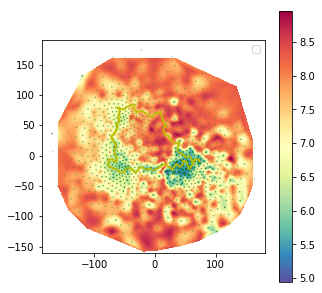

ZTS calculation with 500 images
ZTS calculation with 500 images
ZTS calculation with 500 images

The calculation terminated after 43449 iterations



In [11]:
#results
plt.figure(figsize=(5,5))
plt.imshow(grid_z.T,extent=[-160,160,-160,160],origin="lower",cmap=plt.cm.Spectral_r)
#plt.imshow(grid_z.T,origin="lower",cmap=plt.cm.hot)
plt.colorbar()
plt.scatter(x2[:,0],x2[:,1],c='g',s=z*100)

#plt.scatter(x1[0, 0], x1[0, 1],c='g',label='ec',s=100)

plt.scatter(xi,yi,s=0.1,color='y')
plt.legend()
plt.savefig('el.pdf',format='pdf')
plt.show()

print('ZTS calculation with %d images\n'%n1*3)
if tol > tol1:
    print('The calculation failed to converge after %d iterations\n'%nstep)
else:
    print('The calculation terminated after %d iterations\n'%nstep)

Estimate of difference between discretized MEP and actual one: nan



D:\Users\13651\Anaconda2\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in divide


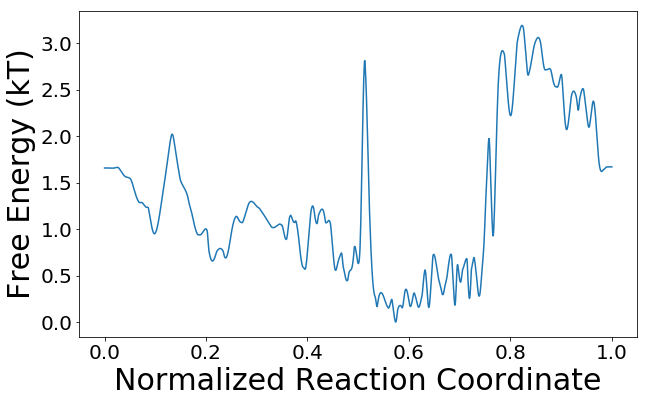

In [10]:
# Energy along MEP

tx = np.roll(xi, -1)-np.roll(xi, 1)
ty = np.roll(yi, -1)-np.roll(yi, 1)

# potential computed as integral of projection of gradV on string tangent
Vz=np.insert(integrate.cumtrapz(tx*dVx + ty*dVy),0,0)
Vz=0.5*Vz
Vz=Vz-np.min(Vz)

ntxy = np.sqrt(tx*tx+ty*ty)
tx = tx/ntxy
ty = ty/ntxy

# err is an estimate of the error between disrectized MEP and actual one 
# err scale as 1/n1
g1 = np.linspace(0,1,n1*3)
err = np.trapz(1-(tx*dVx+ty*dVy)**2/(dVx*dVx+dVy*dVy))/(n1*3-1)
print('Estimate of difference between discretized MEP and actual one: %f\n'%err)

plt.figure(figsize=(10,6))
plt.plot(g1,Vz)

plt.xlabel('Normalized Reaction Coordinate',fontsize=30)
plt.ylabel('Free Energy (kT)',fontsize=30)
plt.tick_params(labelsize=20)

#fig("energy_landscape.png")
plt.show()
#print(g1,Vz)

<IPython.core.display.Javascript object>


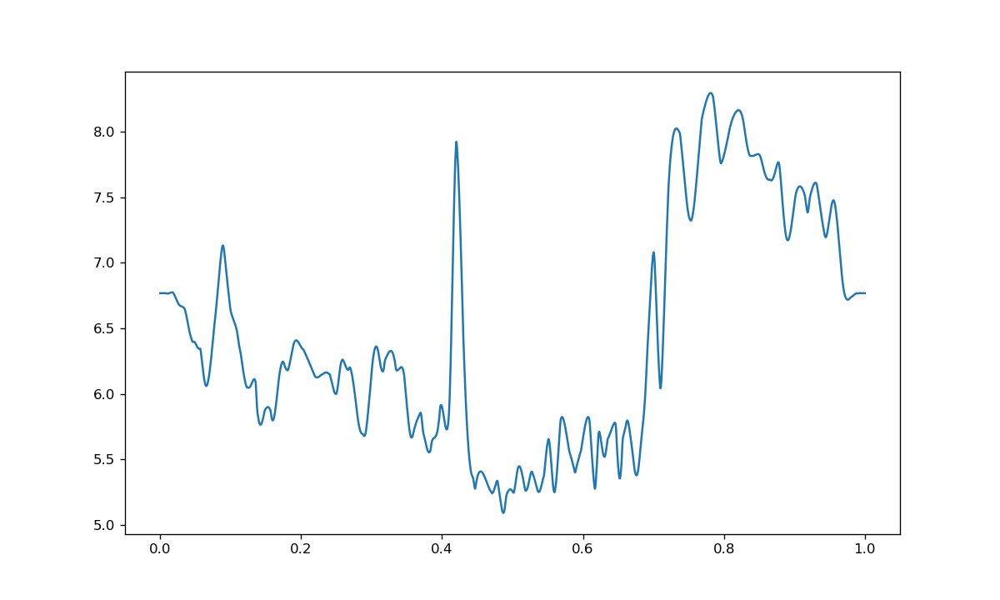

Recommended radius: [32.32722639 25.45265767 28.58263851 35.30129212 25.60118916 37.46614241
 11.6771288  14.49700726 40.40524512 27.42750168] and [32.32722639 25.45265767 28.58263851 35.30129212 25.60118916 24.71063939
 37.46614241 11.6771288  40.40524512 27.42750168]
Recommended average radius: 21.213036284272405
Recommended centers: [[-62.97619793  48.24802811]
 [-66.76274869  11.13186946]
 [-45.96251328 -19.01744815]
 [ -1.97770564 -22.66149293]
 [ 42.77829847 -16.80753171]
 [ 62.07085046 -10.67560168]
 [ 39.84066202  23.09741105]
 [ 21.54059027  32.7784883 ]
 [-17.01524287  71.41782362]
 [-62.11591061  80.57812538]] and [[-62.10782119  80.56358919]
 [-68.40551462  36.53145809]
 [-71.48453084  -6.149121  ]
 [-37.2756387  -23.1484702 ]
 [ 17.31044845 -14.19802939]
 [ 65.16901876  -6.35423826]
 [ 38.17172878  18.1782336 ]
 [ 28.18087572  23.73358753]
 [ 13.3011281   44.70637507]
 [-34.87714925  77.36600335]]


In [21]:
#radius and centers recommendation
from scipy import signal
factor = 2

np.random.seed(33)
g1 = np.linspace(0,1,n1*3)
dx = xi-np.roll(xi,1)
dy = yi-np.roll(yi,1)
dx[0] = 0
dy[0] = 0
lxy = np.cumsum(np.sqrt(dx**2+dy**2))
lxy = lxy/lxy[-1]
fx = interpolate.interp1d(lxy,xi)
xi=fx(g1)
fy = interpolate.interp1d(lxy,yi)
yi=fy(g1)
#print(Hfunc(xi, yi))
max = signal.find_peaks(Hfunc(xi, yi), distance=None, prominence=0.43)
#print(max[0])
min = signal.find_peaks(-Hfunc(xi, yi), distance=None, prominence=0.43)
#print(min[0])

plt.figure(figsize=(10,6))
plt.plot(g1,Hfunc(xi, yi))
#plt.scatter(g1[max[0]],Hfunc(xi, yi)[max[0]],marker='o')
#plt.scatter(g1[min[0]],Hfunc(xi, yi)[min[0]],marker='x')
plt.show()

if(max[0][0]>min[0][0]):
    max2 = np.append(0, max[0])
    min2 = np.append(min[0], -1)
    r1 = np.sqrt((xi[min[0]]-xi[max[0]])**2+(yi[min[0]]-yi[max[0]])**2)/2
    r2 = np.sqrt((xi[min2]-xi[max2])**2+(yi[min2]-yi[max2])**2)/2
    r1M = np.append(0, r1)
    rM = np.maximum(r1M, r2)
    r1m = np.append(r1, 0)
    rm = np.maximum(r1m, r2)
else:
    min2 = np.append(0, min[0])
    max2 = np.append(max[0], -1)
    r1 = np.sqrt((xi[min[0]]-xi[max[0]])**2+(yi[min[0]]-yi[max[0]])**2)/2
    r2 = np.sqrt((xi[min2]-xi[max2])**2+(yi[min2]-yi[max2])**2)/2
    r1m = np.append(0, r1)
    rm = np.maximum(r1m, r2)
    r1M = np.append(r1, 0)
    rM = np.maximum(r1M, r2)
print('Recommended radius: ' + str(rm*factor) + ' and ' + str(rM*factor))

rmean = (np.mean(np.sqrt((xi[min[0]]-xi[max[0]])**2+(yi[min[0]]-yi[max[0]])**2)/2)+np.mean(np.sqrt((xi[min2]-xi[max2])**2+(yi[min2]-yi[max2])**2)/2))/2
print('Recommended average radius: ' + str(rmean*factor))

pm = np.hstack((xi[min2].reshape(-1,1),yi[min2].reshape(-1,1)))
pM = np.hstack((xi[max2].reshape(-1,1),yi[max2].reshape(-1,1)))
print('Recommended centers: ' + str(pm) + ' and ' + str(pM))

In [4]:
n1=500

In [14]:
#uniform clustering
K=20
index = np.linspace(0, n1*3-1, K).astype('int')
print(index)
print(xi[index],yi[index])
plt.scatter(xi[index],yi[index])
centers=np.hstack((xi[index].reshape((-1,1)),yi[index].reshape(-1,1)))
#np.save('centers_20.npy', centers)

[   0   78  157  236  315  394  473  552  631  710  788  867  946 1025
 1104 1183 1262 1341 1420 1499]
[-62.10782119 -60.41343882 -63.37418408 -71.83168254 -66.61756769
 -64.63289287 -77.73069794 -58.36291615 -31.99905492  -4.60367554
  24.10013134  44.10106955  59.58226136  64.48315554  39.7837792
  25.13839955  14.33742114  -7.34216353 -35.45472481 -62.11591061] [ 80.56358919  62.85594465  45.8804779   29.38972226  11.93754131
  -7.35717088 -10.44113526 -26.38194529 -26.45514935 -23.10662537
 -18.85290943 -14.37201064 -15.80156545  -6.75267332   5.07445016
  25.59486632  54.29104635  65.25741469  80.22757705  80.57812538]


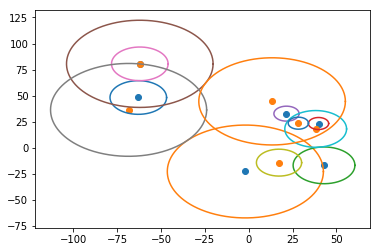

In [13]:
plt.scatter(xi[min2],yi[min2])
plt.scatter(xi[max2],yi[max2])

for n in range(len(rm)):
    theta = np.arange(0, 2*np.pi, 0.01)
    x = pm[n, 0] + rm[n] * np.cos(theta)
    y = pm[n, 1] + rm[n] * np.sin(theta)
    plt.plot(x,y)
for n in range(len(rM)):
    theta = np.arange(0, 2*np.pi, 0.01)
    x = pM[n, 0] + rM[n] * np.cos(theta)
    y = pM[n, 1] + rM[n] * np.sin(theta)
    plt.plot(x,y)

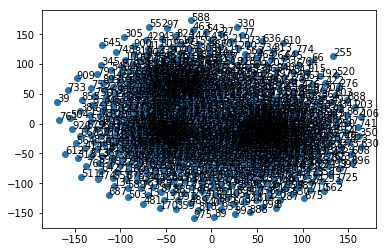

In [2]:
#test code
t=np.load('after_dl_tsne_2d_s0.npy')
#print(t[233])
#t=np.delete(t,[14, 34, 77, 92, 96, 98, 134, 151, 155, 156, 163, 171, 216],axis=0)
plt.scatter(t[:,0],t[:,1])
plt.scatter(t[0,0],t[0,1],c='r')
plt.scatter(t[1,0],t[1,1],c='k')
plt.scatter(t[2,0],t[2,1],c='g')
plt.scatter(t[3,0],t[3,1],c='orange')

for n in range(len(t[4:])):
    plt.annotate(n+1,(t[n+4,0],t[n+4,1]))

<IPython.core.display.Javascript object>


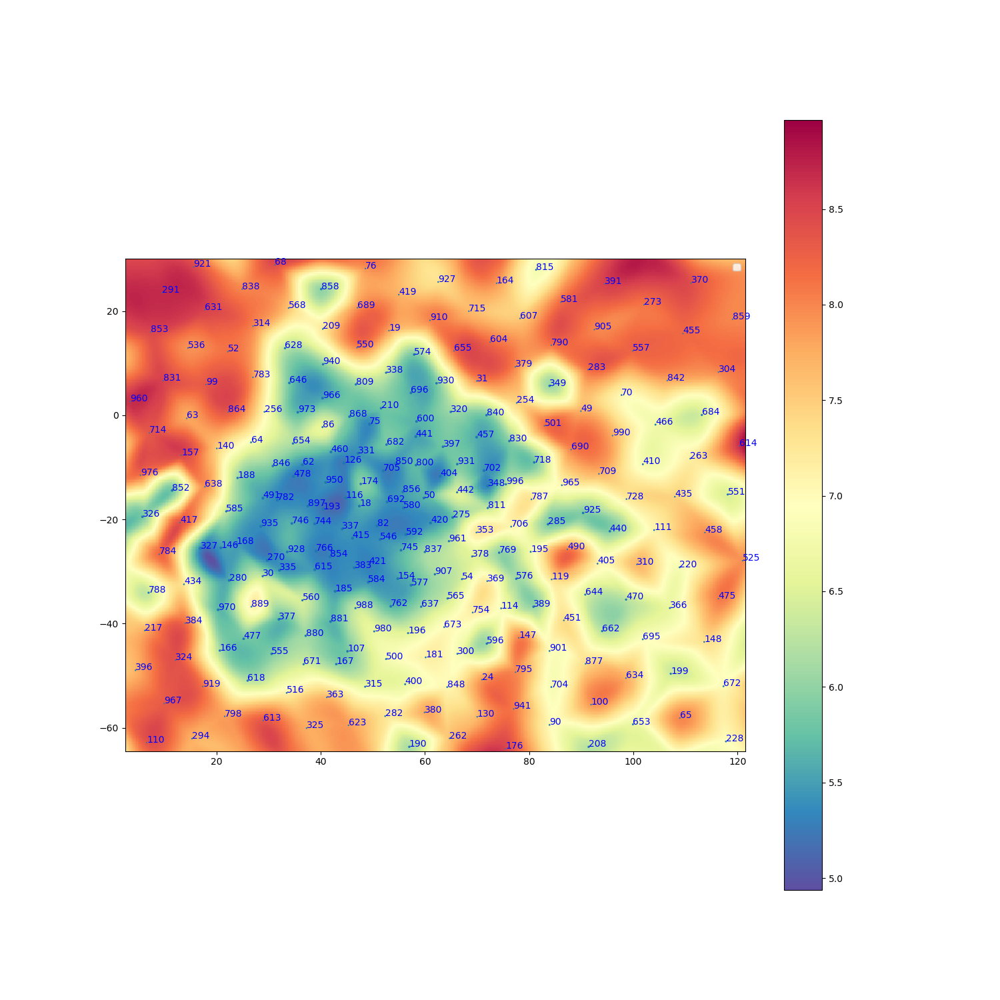

In [8]:
x=np.load('./after_dl_tsne_2d_s0.npy')
x=x[4:]
plt.figure(figsize=(15,15))
plt.imshow(grid_z.T,extent=[-160,160,-160,160],origin="lower",cmap=plt.cm.Spectral_r)
#plt.imshow(grid_z.T,origin="lower",cmap=plt.cm.hot)
plt.colorbar()
plt.scatter(x2[:,0],x2[:,1],s=z*1000)

#plt.scatter(x1[0, 0], x1[0, 1],c='g',label='ec',s=100)

#for i in range(n1):
#    plt.scatter(xi,yi,s=10,color='w')
#    plt.scatter(centers[:,0],centers[:,1],c='r')
plt.legend()
for n in range(len(x)):
    plt.annotate(n+1, (x[n,0],x[n,1]), color='b')
plt.show()

In [14]:
t=np.load('after_dl_tsne_2d_s0.npy')
set(np.ravel(np.argwhere(t[:,0]<36)))&set(np.ravel(np.argwhere(t[:,0]>-4)))&set(np.ravel(np.argwhere(t[:,1]>16)))&set(np.ravel(np.argwhere(t[:,1]<56)))

{49,
 63,
 71,
 131,
 138,
 165,
 185,
 227,
 280,
 294,
 317,
 384,
 440,
 536,
 557,
 571,
 594,
 634,
 841,
 872,
 898,
 924,
 952}

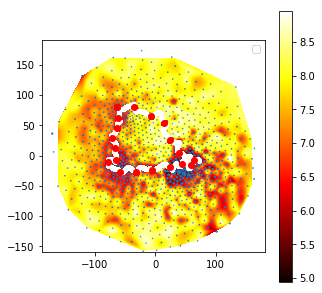

In [17]:
plt.figure(figsize=(5,5))
plt.imshow(grid_z.T,extent=[-160,160,-160,160],origin="lower",cmap=plt.cm.hot)
#plt.imshow(grid_z.T,origin="lower",cmap=plt.cm.hot)
plt.colorbar()
plt.scatter(x2[:,0],x2[:,1],s=z*1000)

#plt.scatter(x1[0, 0], x1[0, 1],c='g',label='ec',s=100)

for i in range(n1):
    plt.scatter(xi,yi,s=10,color='w')
    plt.scatter(centers[:,0],centers[:,1],c='r')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


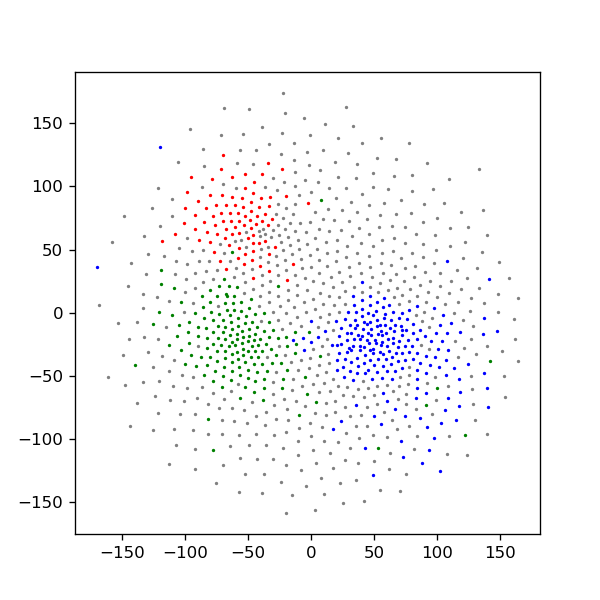

[1, 5, 10, 16, 20, 32, 33, 36, 40, 55, 57, 67, 81, 83, 91, 93, 96, 109, 113, 118, 121, 125, 129, 132, 138, 141, 150, 152, 155, 163, 177, 179, 183, 187, 189, 204, 216, 221, 225, 230, 232, 233, 242, 248, 252, 260, 267, 269, 279, 281, 293, 295, 298, 323, 328, 329, 347, 352, 355, 368, 371, 374, 387, 395, 398, 406, 409, 414, 424, 428, 445, 448, 450, 453, 456, 467, 495, 498, 507, 510, 515, 526, 531, 537, 538, 549, 559, 567, 572, 575, 595, 597, 605, 620, 640, 647, 652, 657, 670, 678, 680, 685, 697, 711, 717, 722, 724, 756, 760, 772, 775, 776, 780, 786, 792, 793, 817, 828, 829, 839, 849, 860, 866, 887, 894, 899, 911, 917, 923, 926, 932, 933, 939, 942, 943, 946, 947, 952, 956, 958, 963, 969, 972, 974, 981, 982, 986, 997]
15.0
[94, 161, 212, 234, 342, 375, 446, 505, 653, 669, 708, 788, 938]
5.0
[4, 18, 21, 30, 39, 50, 54, 62, 64, 70, 75, 90, 107, 111, 116, 119, 126, 142, 148, 149, 154, 166, 167, 168, 174, 181, 185, 188, 190, 193, 196, 199, 208, 210, 220, 228, 236, 238, 250, 256, 263, 270, 275, 2

In [38]:
import numpy as np
import pandas as pd
df=pd.read_table('./label_sort.log', delimiter='\t',header=-1)
df.columns=['t1','label']
df['index']=df['t1'].str.split(' ', 1).str[0]
df['file']=df['t1'].str.split(' ', 1).str[1]
del df['t1']
df['index']=df['index'].astype("int")
df['label']=df['label'].astype('str')
df=df.sort_values(by=['index'])

x=np.load('./after_dl_tsne_2d_s0.npy')
x2=x[3:] 

plt.figure(figsize=(5,5))
for i in set(df['label']):
    idx=df.loc[df['label'] == i]['index'].tolist()
    print(idx)
    print(i)
#    if i != ' ':
#        plt.scatter(x2[idx, 0], x2[idx, 1],label=i,s=1)
    if i == 'nan':
        plt.scatter(x2[idx, 0], x2[idx, 1],color='grey',s=1)
    elif i == '21.0' or i == '1.0':
        plt.scatter(x2[idx, 0], x2[idx, 1],color='r',label='ec',s=1)
    elif i == '15.0' or i == '5.0':
        plt.scatter(x2[idx, 0], x2[idx, 1],color='g',label='ed1',s=1)
    elif i == '54.0' or i == '4.0':
        plt.scatter(x2[idx, 0], x2[idx, 1],color='b',label='ed2',s=1)
    
    #plt.legend()
    
#plt.imshow(grid_z.T,extent=[-160,160,-160,160],origin="lower",cmap=plt.cm.hot)
#plt.colorbar()
plt.show()